# IMPORT MODULES & FUNCTIONS

In [12]:
#IMPORT PACKAGES
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import datetime as dt
import pytz #for timezone calculation
import math
import matplotlib.dates as md
import gc
import os
from datetime import datetime
import calendar
import seaborn as sns; sns.set()
import itertools
#import datetime
from time import gmtime, strftime
from matplotlib import cm
from IPython.display import display
#%matplotlib qt
#%matplotlib inline

#SET GLOBAL PARAMETERS
# ================== Global parameters for fonts & sizes =================
FONT_SIZE = 20
rc={'font.size': FONT_SIZE, 'axes.labelsize': FONT_SIZE, 'legend.fontsize': FONT_SIZE, 
    'axes.titlesize': FONT_SIZE, 'xtick.labelsize': FONT_SIZE, 'ytick.labelsize': FONT_SIZE}
plt.rcParams.update(**rc)
plt.rc('font', weight='bold')
 
# For label titles
fontdict={'fontsize': FONT_SIZE, 'fontweight' : 'bold'}
# can add in above dictionary: 'verticalalignment': 'baseline' 

style = 'ggplot' # choose a style from the above options
plt.style.use(style)

from solarcurtailment.energy_calculation import *
from solarcurtailment.clear_sky_day import *
from solarcurtailment.tripping_curt import *
from solarcurtailment.vvar_curt import *
from solarcurtailment.vwatt_curt import *
from solarcurtailment.polyfit import *
from solarcurtailment.file_processing import *
from solarcurtailment.data_visualization import *

#class instantiation
file_processing = FileProcessing()
clear_sky_day = ClearSkyDay()
data_visualization = DataVisualization()
energy_calculation = EnergyCalculation()
tripping_curt = TrippingCurt()
polyfit_f = Polyfit()
vvar_curt = VVarCurt()
vwatt_curt = VWattCurt()

#from FileProcessing 
def input_monthly_files(file_path, data_date_idx):
    """Open time-series D-PV data and ghi data of a certain month. Only compatible for SoLA data format.

    Args:
        file_path (str): The file location of the data
        data_date_idx (str): The month of the files in format 'YYYYMM' eg '201907'

    Returns:
        data (df): the opened & cleaned time-series D-PV data
        ghi (df): the opened & cleaned ghi data
        data_ori (df): the opened & unmodified time-series D-PV data
        ghi_ori (df): the opened & unmodified ghi data
    """
    
    data_path = file_path + r"/processed_unsw_" + data_date_idx + '_data_raw.csv'
    data_ori = pd.read_csv(data_path)
    data = data_ori.set_index('utc_tstamp')

    # Convert timestamp to local Adelaide time
    data.index = pd.to_datetime(data.index) # convert index from object type to datetime
    Adelaide_local_time = pytz.timezone('Australia/Adelaide')
    data.index = data.index.tz_localize(pytz.utc).tz_convert(Adelaide_local_time) # convert utc to local adelaide time
    data.index.rename('Timestamp', inplace = True)

    # Load GHI data
    ghi_date_idx = data_date_idx[0:4] + '_' + data_date_idx[4:]
    ghi_path = file_path + r"/sl_023034_" + ghi_date_idx +'.txt'
    ghi = pd.read_csv (ghi_path) 
    ghi_ori = ghi.copy()

    ghi['timestamp'] = pd.to_datetime(pd.DataFrame ({'year' : ghi['Year Month Day Hours Minutes in YYYY'].values, 
                                                    'month' : ghi['MM'], 
                                                    'day' : ghi['DD'], 
                                                   'hour' : ghi['HH24'], 
                                                   'minute' : ghi['MI format in Local standard time']}))
    ghi.set_index('timestamp', inplace = True)
    # Deal with the space characters (ghi is in object/string form at the moment)
    ghi['Mean global irradiance (over 1 minute) in W/sq m'] = [float(ghi_t) if ghi_t.count(' ')<= 3 else np.nan for ghi_t in ghi['Mean global irradiance (over 1 minute) in W/sq m']]
    
    return data, ghi, data_ori, ghi_ori

# CHECK ALL DAYS
Find list of all dates which data are available

In [13]:
def create_date_list(year, month, num_of_days):
    """Create a list of date as str for certain month and year.

    Args:
        year (str): year
        month (str): month
        num_of_days (int): number of days for a certain month and year. 

    Returns:
        date_list (list): list of date as str
    """
    
    date_list = []
    
    for i in range(1, 10):
        date_list.append(year + '-' + month + '-0'  + str(i))
    for i in range(10, num_of_days + 1):
        date_list.append(year + '-' + month + '-'  + str(i))
    
    return date_list

In [14]:
datelist_201909 = create_date_list('2019', '09', 30)
datelist_201910 = create_date_list('2019', '10', 31)
datelist_201911 = create_date_list('2019', '11', 30)
datelist_201912 = create_date_list('2019', '12', 31)
datelist_202001 = create_date_list('2020', '01', 31)
datelist_202002 = create_date_list('2020', '02', 29)
datelist_202003 = create_date_list('2020', '03', 31)
datelist_202004 = create_date_list('2020', '04', 30)


date_list = datelist_201909 + datelist_201910 + datelist_201911 + datelist_201912 + datelist_202001 + datelist_202002 + datelist_202003 + datelist_202004

# CLEAR SKY DAYS LIST

In [15]:
csd_201909 = ['2019-09-12', '2019-09-17', '2019-09-18', '2019-09-26', '2019-09-29', '2019-09-30']
csd_201910 = ['2019-10-01', '2019-10-02', '2019-10-03', '2019-10-29']
csd_201911 = ['2019-11-18', '2019-11-27']
csd_201912 = ['2019-12-16', '2019-12-19', '2019-12-25', '2019-12-28']
csd_202001 = ['2020-01-01', '2020-01-02', '2020-01-06', '2020-01-07', '2020-01-08', '2020-01-12', '2020-01-13', '2020-01-14', '2020-01-17', '2020-01-29', '2020-01-30']
csd_202002 = ['2020-02-04', '2020-02-05', '2020-02-06', '2020-02-10', '2020-02-11', '2020-02-13', '2020-02-22', '2020-02-23']
csd_202003 = ['2020-03-03', '2020-03-08', '2020-03-10', '2020-03-14', '2020-03-15', '2020-03-25', '2020-03-26']
csd_202004 = ['2020-04-08', '2020-04-09', '2020-04-13', '2020-04-24']

csd_list = csd_201909 + csd_201910 + csd_201911 + csd_201912 + csd_202001 + csd_202002 + csd_202003 + csd_202004

# INPUT ALL MONTHLY DATA & GENERAL FILES

In [16]:
#file_path = r"/Users/samhan/Downloads/data" #for running in Samhan's laptop
file_path = r"C:\Users\samha\Documents\CANVAS\data" #for running in TETB CEEM09 computer

month_list = ['201909', '201910', '201911', '201912', '202001', '202002', '202003', '202004']
data = {}
data_ori = {}
ghi = {}
ghi_ori = {}
for month in month_list:
    print('processing {} ...'.format(month))
    data[month], ghi[month], data_ori[month], ghi_ori[month] = input_monthly_files(file_path, month)
    data[month]['date'] = data[month].index.date
    
site_details, unique_cids= file_processing.input_general_files(file_path)

processing 201909 ...
processing 201910 ...
processing 201911 ...
processing 201912 ...
processing 202001 ...
processing 202002 ...
processing 202003 ...
processing 202004 ...


# LOOP OVER ALL SITES

In [48]:
summary = pd.DataFrame()

for c_id in unique_cids_7['c_id']: #for the whole data testing
# for c_id in unique_cids['c_id'][:3]: #for testing
# for c_id in [1317822057]: #for testing
    last_month_analyzed = 0
    count_curtailment = 0
    total_energy_generation = 0
    total_tripping_curtailment = 0
    for date in date_list: 
        print('Analyzing c_id {} date {} ...'.format(c_id, date))
        
        #filter D-PV time series data
        date_dt = dt.datetime.strptime(date, '%Y-%m-%d').date()
        month_analyzed = date[:4] + date [5:7]
        
        if not month_analyzed == last_month_analyzed:
            site_id_filter = data[month_analyzed]['c_id'] == c_id
            data_certain_site = data[month_analyzed].loc[site_id_filter]
            last_month_analyzed = month_analyzed
            
        date_filter = data_certain_site['date'] == date_dt
        data_analyzed = data_certain_site.loc[date_filter]

        #check tripping curtailment
        size_is_ok = file_processing.check_data_size(data_analyzed)
        if not size_is_ok:
            print('Cannot analyze {} site on {} due to incomplete data.'.format(c_id, date))
        else:
            data_site, ac_cap, dc_cap, EFF_SYSTEM, inverter = vvar_curt.site_organize(c_id, site_details, data_analyzed, unique_cids)
            data_site = file_processing.resample_in_minute(data_site)
            
            if date in csd_list:
                is_clear_sky_day = True
            else:
                is_clear_sky_day = False
            
            tripping_response, tripping_curt_energy, estimation_method, data_site = tripping_curt.check_tripping_curtailment(is_clear_sky_day, c_id, data_site, unique_cids, ac_cap, site_details, date)    
            energy_generated, data_site = energy_calculation.check_energy_generated(data_site, date, is_clear_sky_day, tripping_curt_energy)
            
            total_energy_generation += energy_generated
            
            if tripping_curt_energy > 0:
                count_curtailment += 1
                total_tripping_curtailment += tripping_curt_energy
    
    #summarize result
    c_id_summary = pd.DataFrame({
            'c_id' : [c_id],
            'total_energy_generation (kWh)' : [total_energy_generation],
            'total_tripping_curtailment (kWh)' : [total_tripping_curtailment],
            'count curtailment (days)' : [count_curtailment],
            'total days (days)' : [len(date_list)]
        })
    
    summary = pd.concat([summary, c_id_summary])

Analyzing c_id 1456027453 date 2019-09-01 ...
Cannot analyze 1456027453 site on 2019-09-01 due to incomplete data.
Analyzing c_id 1456027453 date 2019-09-02 ...
Analyzing c_id 1456027453 date 2019-09-03 ...
Analyzing c_id 1456027453 date 2019-09-04 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1456027453 date 2019-09-05 ...
Analyzing c_id 1456027453 date 2019-09-06 ...
Analyzing c_id 1456027453 date 2019-09-07 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1456027453 date 2019-09-08 ...
Analyzing c_id 1456027453 date 2019-09-09 ...
Analyzing c_id 1456027453 date 2019-09-10 ...
Analyzing c_id 1456027453 date 2019-09-11 ...
Analyzing c_id 1456027453 date 2019-09-12 ...
Analyzing c_id 1456027453 date 2019-09-13 ...
Analyzing c_id 1456027453 date 2019-09-14 ...
Analyzing c_id 1456027453 date 2019-09-15 ...
Analyzing c_id 1456027453 date 2019-09-16 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1456027453 date 2019-09-17 ...
Analyzing c_id 1456027453 date 2019-09-18 ...
Analyzing c_id 1456027453 date 2019-09-19 ...
Analyzing c_id 1456027453 date 2019-09-20 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1456027453 date 2019-09-21 ...
Analyzing c_id 1456027453 date 2019-09-22 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1456027453 date 2019-09-23 ...
Analyzing c_id 1456027453 date 2019-09-24 ...
Analyzing c_id 1456027453 date 2019-09-25 ...
Analyzing c_id 1456027453 date 2019-09-26 ...
Analyzing c_id 1456027453 date 2019-09-27 ...
Analyzing c_id 1456027453 date 2019-09-28 ...
Analyzing c_id 1456027453 date 2019-09-29 ...
Analyzing c_id 1456027453 date 2019-09-30 ...
Analyzing c_id 1456027453 date 2019-10-01 ...
Cannot analyze 1456027453 site on 2019-10-01 due to incomplete data.
Analyzing c_id 1456027453 date 2019-10-02 ...
Analyzing c_id 1456027453 date 2019-10-03 ...
Analyzing c_id 1456027453 date 2019-10-04 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1456027453 date 2019-10-05 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1456027453 date 2019-10-06 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1456027453 date 2019-10-07 ...
Analyzing c_id 1456027453 date 2019-10-08 ...
Analyzing c_id 1456027453 date 2019-10-09 ...
Analyzing c_id 1456027453 date 2019-10-10 ...
Analyzing c_id 1456027453 date 2019-10-11 ...
Analyzing c_id 1456027453 date 2019-10-12 ...
Analyzing c_id 1456027453 date 2019-10-13 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1456027453 date 2019-10-14 ...
Analyzing c_id 1456027453 date 2019-10-15 ...
Analyzing c_id 1456027453 date 2019-10-16 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1456027453 date 2019-10-17 ...
Analyzing c_id 1456027453 date 2019-10-18 ...
Analyzing c_id 1456027453 date 2019-10-19 ...
Analyzing c_id 1456027453 date 2019-10-20 ...
Analyzing c_id 1456027453 date 2019-10-21 ...
Analyzing c_id 1456027453 date 2019-10-22 ...
Analyzing c_id 1456027453 date 2019-10-23 ...
Analyzing c_id 1456027453 date 2019-10-24 ...
Analyzing c_id 1456027453 date 2019-10-25 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1456027453 date 2019-10-26 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1456027453 date 2019-10-27 ...
Analyzing c_id 1456027453 date 2019-10-28 ...
Analyzing c_id 1456027453 date 2019-10-29 ...
Analyzing c_id 1456027453 date 2019-10-30 ...
Analyzing c_id 1456027453 date 2019-10-31 ...
Analyzing c_id 1456027453 date 2019-11-01 ...
Cannot analyze 1456027453 site on 2019-11-01 due to incomplete data.
Analyzing c_id 1456027453 date 2019-11-02 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1456027453 date 2019-11-03 ...
Analyzing c_id 1456027453 date 2019-11-04 ...
Analyzing c_id 1456027453 date 2019-11-05 ...
Analyzing c_id 1456027453 date 2019-11-06 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1456027453 date 2019-11-07 ...
Analyzing c_id 1456027453 date 2019-11-08 ...
Analyzing c_id 1456027453 date 2019-11-09 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1456027453 date 2019-11-10 ...
Analyzing c_id 1456027453 date 2019-11-11 ...
Analyzing c_id 1456027453 date 2019-11-12 ...
Analyzing c_id 1456027453 date 2019-11-13 ...
Analyzing c_id 1456027453 date 2019-11-14 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1456027453 date 2019-11-15 ...
Analyzing c_id 1456027453 date 2019-11-16 ...
Analyzing c_id 1456027453 date 2019-11-17 ...
Analyzing c_id 1456027453 date 2019-11-18 ...
Analyzing c_id 1456027453 date 2019-11-19 ...
Analyzing c_id 1456027453 date 2019-11-20 ...
Analyzing c_id 1456027453 date 2019-11-21 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1456027453 date 2019-11-22 ...
Analyzing c_id 1456027453 date 2019-11-23 ...
Analyzing c_id 1456027453 date 2019-11-24 ...
Analyzing c_id 1456027453 date 2019-11-25 ...
Analyzing c_id 1456027453 date 2019-11-26 ...
Analyzing c_id 1456027453 date 2019-11-27 ...
Analyzing c_id 1456027453 date 2019-11-28 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1456027453 date 2019-11-29 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['ones'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:693: FutureWarning: `rcond` parameter will change to the default of machine prec

Analyzing c_id 1456027453 date 2019-11-30 ...
Analyzing c_id 1456027453 date 2019-12-01 ...
Cannot analyze 1456027453 site on 2019-12-01 due to incomplete data.
Analyzing c_id 1456027453 date 2019-12-02 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1456027453 date 2019-12-03 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1456027453 date 2019-12-04 ...
Analyzing c_id 1456027453 date 2019-12-05 ...
Analyzing c_id 1456027453 date 2019-12-06 ...
Analyzing c_id 1456027453 date 2019-12-07 ...
Analyzing c_id 1456027453 date 2019-12-08 ...
Analyzing c_id 1456027453 date 2019-12-09 ...
Analyzing c_id 1456027453 date 2019-12-10 ...
Analyzing c_id 1456027453 date 2019-12-11 ...
Analyzing c_id 1456027453 date 2019-12-12 ...
Analyzing c_id 1456027453 date 2019-12-13 ...
Analyzing c_id 1456027453 date 2019-12-14 ...
Analyzing c_id 1456027453 date 2019-12-15 ...
Analyzing c_id 1456027453 date 2019-12-16 ...
Analyzing c_id 1456027453 date 2019-12-17 ...
Analyzing c_id 1456027453 date 2019-12-18 ...
Analyzing c_id 1456027453 date 2019-12-19 ...
Analyzing c_id 1456027453 date 2019-12-20 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1456027453 date 2019-12-21 ...
Analyzing c_id 1456027453 date 2019-12-22 ...
Analyzing c_id 1456027453 date 2019-12-23 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1456027453 date 2019-12-24 ...
Analyzing c_id 1456027453 date 2019-12-25 ...
Analyzing c_id 1456027453 date 2019-12-26 ...
Analyzing c_id 1456027453 date 2019-12-27 ...
Analyzing c_id 1456027453 date 2019-12-28 ...
Analyzing c_id 1456027453 date 2019-12-29 ...
Analyzing c_id 1456027453 date 2019-12-30 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1456027453 date 2019-12-31 ...
Analyzing c_id 1456027453 date 2020-01-01 ...
Cannot analyze 1456027453 site on 2020-01-01 due to incomplete data.
Analyzing c_id 1456027453 date 2020-01-02 ...
Analyzing c_id 1456027453 date 2020-01-03 ...
Analyzing c_id 1456027453 date 2020-01-04 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1456027453 date 2020-01-05 ...
Analyzing c_id 1456027453 date 2020-01-06 ...
Analyzing c_id 1456027453 date 2020-01-07 ...
Analyzing c_id 1456027453 date 2020-01-08 ...
Analyzing c_id 1456027453 date 2020-01-09 ...
Analyzing c_id 1456027453 date 2020-01-10 ...
Analyzing c_id 1456027453 date 2020-01-11 ...
Analyzing c_id 1456027453 date 2020-01-12 ...
Analyzing c_id 1456027453 date 2020-01-13 ...
Analyzing c_id 1456027453 date 2020-01-14 ...
Analyzing c_id 1456027453 date 2020-01-15 ...
Analyzing c_id 1456027453 date 2020-01-16 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1456027453 date 2020-01-17 ...
Analyzing c_id 1456027453 date 2020-01-18 ...
Analyzing c_id 1456027453 date 2020-01-19 ...
Analyzing c_id 1456027453 date 2020-01-20 ...
Analyzing c_id 1456027453 date 2020-01-21 ...
Analyzing c_id 1456027453 date 2020-01-22 ...
Analyzing c_id 1456027453 date 2020-01-23 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1456027453 date 2020-01-24 ...
Analyzing c_id 1456027453 date 2020-01-25 ...
Analyzing c_id 1456027453 date 2020-01-26 ...
Analyzing c_id 1456027453 date 2020-01-27 ...
Analyzing c_id 1456027453 date 2020-01-28 ...
Analyzing c_id 1456027453 date 2020-01-29 ...
Analyzing c_id 1456027453 date 2020-01-30 ...
Analyzing c_id 1456027453 date 2020-01-31 ...
Analyzing c_id 1456027453 date 2020-02-01 ...
Cannot analyze 1456027453 site on 2020-02-01 due to incomplete data.
Analyzing c_id 1456027453 date 2020-02-02 ...
Analyzing c_id 1456027453 date 2020-02-03 ...
Analyzing c_id 1456027453 date 2020-02-04 ...
Analyzing c_id 1456027453 date 2020-02-05 ...
Analyzing c_id 1456027453 date 2020-02-06 ...
Analyzing c_id 1456027453 date 2020-02-07 ...
Analyzing c_id 1456027453 date 2020-02-08 ...
Analyzing c_id 1456027453 date 2020-02-09 ...
Analyzing c_id 1456027453 date 2020-02-10 ...
Analyzing c_id 1456027453 date 2020-02-11 ...
Analyzing c_id 1456027453 date 2020-02-12 ...
Analyzing c

C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1456027453 date 2020-02-16 ...
Analyzing c_id 1456027453 date 2020-02-17 ...
Analyzing c_id 1456027453 date 2020-02-18 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1456027453 date 2020-02-19 ...
Analyzing c_id 1456027453 date 2020-02-20 ...
Analyzing c_id 1456027453 date 2020-02-21 ...
Analyzing c_id 1456027453 date 2020-02-22 ...
Analyzing c_id 1456027453 date 2020-02-23 ...
Analyzing c_id 1456027453 date 2020-02-24 ...
Analyzing c_id 1456027453 date 2020-02-25 ...
Analyzing c_id 1456027453 date 2020-02-26 ...
Analyzing c_id 1456027453 date 2020-02-27 ...
Analyzing c_id 1456027453 date 2020-02-28 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1456027453 date 2020-02-29 ...
Analyzing c_id 1456027453 date 2020-03-01 ...
Cannot analyze 1456027453 site on 2020-03-01 due to incomplete data.
Analyzing c_id 1456027453 date 2020-03-02 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1456027453 date 2020-03-03 ...
Analyzing c_id 1456027453 date 2020-03-04 ...
Analyzing c_id 1456027453 date 2020-03-05 ...
Analyzing c_id 1456027453 date 2020-03-06 ...
Analyzing c_id 1456027453 date 2020-03-07 ...
Analyzing c_id 1456027453 date 2020-03-08 ...
Analyzing c_id 1456027453 date 2020-03-09 ...
Analyzing c_id 1456027453 date 2020-03-10 ...
Analyzing c_id 1456027453 date 2020-03-11 ...
Analyzing c_id 1456027453 date 2020-03-12 ...
Analyzing c_id 1456027453 date 2020-03-13 ...
Analyzing c_id 1456027453 date 2020-03-14 ...
Analyzing c_id 1456027453 date 2020-03-15 ...
Analyzing c_id 1456027453 date 2020-03-16 ...
Analyzing c_id 1456027453 date 2020-03-17 ...
Analyzing c_id 1456027453 date 2020-03-18 ...
Analyzing c_id 1456027453 date 2020-03-19 ...
Analyzing c_id 1456027453 date 2020-03-20 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1456027453 date 2020-03-21 ...
Analyzing c_id 1456027453 date 2020-03-22 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1456027453 date 2020-03-23 ...
Analyzing c_id 1456027453 date 2020-03-24 ...
Analyzing c_id 1456027453 date 2020-03-25 ...
Analyzing c_id 1456027453 date 2020-03-26 ...
Analyzing c_id 1456027453 date 2020-03-27 ...
Analyzing c_id 1456027453 date 2020-03-28 ...
Analyzing c_id 1456027453 date 2020-03-29 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1456027453 date 2020-03-30 ...
Analyzing c_id 1456027453 date 2020-03-31 ...
Analyzing c_id 1456027453 date 2020-04-01 ...
Cannot analyze 1456027453 site on 2020-04-01 due to incomplete data.
Analyzing c_id 1456027453 date 2020-04-02 ...
Analyzing c_id 1456027453 date 2020-04-03 ...
Analyzing c_id 1456027453 date 2020-04-04 ...
Analyzing c_id 1456027453 date 2020-04-05 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:514: FutureWarning: reindexing with a non-unique Index is deprecated and will raise in a future version.
  data_site.loc[data_site['power_expected_linear'].isna(),'power_expected_linear'] = data_site['power']


Analyzing c_id 1456027453 date 2020-04-06 ...
Analyzing c_id 1456027453 date 2020-04-07 ...
Analyzing c_id 1456027453 date 2020-04-08 ...
Analyzing c_id 1456027453 date 2020-04-09 ...
Analyzing c_id 1456027453 date 2020-04-10 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1456027453 date 2020-04-11 ...
Analyzing c_id 1456027453 date 2020-04-12 ...
Analyzing c_id 1456027453 date 2020-04-13 ...
Analyzing c_id 1456027453 date 2020-04-14 ...
Analyzing c_id 1456027453 date 2020-04-15 ...
Analyzing c_id 1456027453 date 2020-04-16 ...
Analyzing c_id 1456027453 date 2020-04-17 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1456027453 date 2020-04-18 ...
Analyzing c_id 1456027453 date 2020-04-19 ...
Analyzing c_id 1456027453 date 2020-04-20 ...
Analyzing c_id 1456027453 date 2020-04-21 ...
Analyzing c_id 1456027453 date 2020-04-22 ...
Analyzing c_id 1456027453 date 2020-04-23 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1456027453 date 2020-04-24 ...
Analyzing c_id 1456027453 date 2020-04-25 ...
Analyzing c_id 1456027453 date 2020-04-26 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1456027453 date 2020-04-27 ...
Analyzing c_id 1456027453 date 2020-04-28 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1456027453 date 2020-04-29 ...
Analyzing c_id 1456027453 date 2020-04-30 ...
Analyzing c_id 495939403 date 2019-09-01 ...
Cannot analyze 495939403 site on 2019-09-01 due to incomplete data.
Analyzing c_id 495939403 date 2019-09-02 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 495939403 date 2019-09-03 ...
Analyzing c_id 495939403 date 2019-09-04 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 495939403 date 2019-09-05 ...
Analyzing c_id 495939403 date 2019-09-06 ...
Analyzing c_id 495939403 date 2019-09-07 ...
Analyzing c_id 495939403 date 2019-09-08 ...
Analyzing c_id 495939403 date 2019-09-09 ...
Analyzing c_id 495939403 date 2019-09-10 ...
Analyzing c_id 495939403 date 2019-09-11 ...
Analyzing c_id 495939403 date 2019-09-12 ...
Analyzing c_id 495939403 date 2019-09-13 ...
Analyzing c_id 495939403 date 2019-09-14 ...
Analyzing c_id 495939403 date 2019-09-15 ...
Analyzing c_id 495939403 date 2019-09-16 ...
Analyzing c_id 495939403 date 2019-09-17 ...
Analyzing c_id 495939403 date 2019-09-18 ...
Analyzing c_id 495939403 date 2019-09-19 ...
Analyzing c_id 495939403 date 2019-09-20 ...
Analyzing c_id 495939403 date 2019-09-21 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 495939403 date 2019-09-22 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 495939403 date 2019-09-23 ...
Analyzing c_id 495939403 date 2019-09-24 ...
Analyzing c_id 495939403 date 2019-09-25 ...
Analyzing c_id 495939403 date 2019-09-26 ...
Analyzing c_id 495939403 date 2019-09-27 ...
Analyzing c_id 495939403 date 2019-09-28 ...
Analyzing c_id 495939403 date 2019-09-29 ...
Analyzing c_id 495939403 date 2019-09-30 ...
Analyzing c_id 495939403 date 2019-10-01 ...
Cannot analyze 495939403 site on 2019-10-01 due to incomplete data.
Analyzing c_id 495939403 date 2019-10-02 ...
Analyzing c_id 495939403 date 2019-10-03 ...
Analyzing c_id 495939403 date 2019-10-04 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 495939403 date 2019-10-05 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 495939403 date 2019-10-06 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['ones'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:693: FutureWarning: `rcond` parameter will change to the default of machine prec

Analyzing c_id 495939403 date 2019-10-07 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['ones'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:693: FutureWarning: `rcond` parameter will change to the default of machine prec

Analyzing c_id 495939403 date 2019-10-08 ...
Analyzing c_id 495939403 date 2019-10-09 ...
Analyzing c_id 495939403 date 2019-10-10 ...
Analyzing c_id 495939403 date 2019-10-11 ...
Analyzing c_id 495939403 date 2019-10-12 ...
Analyzing c_id 495939403 date 2019-10-13 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 495939403 date 2019-10-14 ...
Analyzing c_id 495939403 date 2019-10-15 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 495939403 date 2019-10-16 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 495939403 date 2019-10-17 ...
Analyzing c_id 495939403 date 2019-10-18 ...
Analyzing c_id 495939403 date 2019-10-19 ...
Analyzing c_id 495939403 date 2019-10-20 ...
Analyzing c_id 495939403 date 2019-10-21 ...
Analyzing c_id 495939403 date 2019-10-22 ...
Analyzing c_id 495939403 date 2019-10-23 ...
Analyzing c_id 495939403 date 2019-10-24 ...
Analyzing c_id 495939403 date 2019-10-25 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 495939403 date 2019-10-26 ...
Analyzing c_id 495939403 date 2019-10-27 ...
Analyzing c_id 495939403 date 2019-10-28 ...
Analyzing c_id 495939403 date 2019-10-29 ...
Analyzing c_id 495939403 date 2019-10-30 ...
Analyzing c_id 495939403 date 2019-10-31 ...
Analyzing c_id 495939403 date 2019-11-01 ...
Cannot analyze 495939403 site on 2019-11-01 due to incomplete data.
Analyzing c_id 495939403 date 2019-11-02 ...
Analyzing c_id 495939403 date 2019-11-03 ...
Analyzing c_id 495939403 date 2019-11-04 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 495939403 date 2019-11-05 ...
Analyzing c_id 495939403 date 2019-11-06 ...
Analyzing c_id 495939403 date 2019-11-07 ...
Analyzing c_id 495939403 date 2019-11-08 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 495939403 date 2019-11-09 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 495939403 date 2019-11-10 ...
Analyzing c_id 495939403 date 2019-11-11 ...
Analyzing c_id 495939403 date 2019-11-12 ...
Analyzing c_id 495939403 date 2019-11-13 ...
Analyzing c_id 495939403 date 2019-11-14 ...
Analyzing c_id 495939403 date 2019-11-15 ...
Analyzing c_id 495939403 date 2019-11-16 ...
Analyzing c_id 495939403 date 2019-11-17 ...
Analyzing c_id 495939403 date 2019-11-18 ...
Analyzing c_id 495939403 date 2019-11-19 ...
Analyzing c_id 495939403 date 2019-11-20 ...
Analyzing c_id 495939403 date 2019-11-21 ...
Analyzing c_id 495939403 date 2019-11-22 ...
Analyzing c_id 495939403 date 2019-11-23 ...
Analyzing c_id 495939403 date 2019-11-24 ...
Analyzing c_id 495939403 date 2019-11-25 ...
Analyzing c_id 495939403 date 2019-11-26 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 495939403 date 2019-11-27 ...
Analyzing c_id 495939403 date 2019-11-28 ...
Analyzing c_id 495939403 date 2019-11-29 ...
Analyzing c_id 495939403 date 2019-11-30 ...
Analyzing c_id 495939403 date 2019-12-01 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Cannot analyze 495939403 site on 2019-12-01 due to incomplete data.
Analyzing c_id 495939403 date 2019-12-02 ...
Analyzing c_id 495939403 date 2019-12-03 ...
Analyzing c_id 495939403 date 2019-12-04 ...
Analyzing c_id 495939403 date 2019-12-05 ...
Analyzing c_id 495939403 date 2019-12-06 ...
Analyzing c_id 495939403 date 2019-12-07 ...
Analyzing c_id 495939403 date 2019-12-08 ...
Analyzing c_id 495939403 date 2019-12-09 ...
Analyzing c_id 495939403 date 2019-12-10 ...
Analyzing c_id 495939403 date 2019-12-11 ...
Analyzing c_id 495939403 date 2019-12-12 ...
Analyzing c_id 495939403 date 2019-12-13 ...
Analyzing c_id 495939403 date 2019-12-14 ...
Analyzing c_id 495939403 date 2019-12-15 ...
Analyzing c_id 495939403 date 2019-12-16 ...
Analyzing c_id 495939403 date 2019-12-17 ...
Analyzing c_id 495939403 date 2019-12-18 ...
Analyzing c_id 495939403 date 2019-12-19 ...
Analyzing c_id 495939403 date 2019-12-20 ...
Analyzing c_id 495939403 date 2019-12-21 ...
Analyzing c_id 495939403 date 20

C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 495939403 date 2019-12-24 ...
Analyzing c_id 495939403 date 2019-12-25 ...
Analyzing c_id 495939403 date 2019-12-26 ...
Analyzing c_id 495939403 date 2019-12-27 ...
Analyzing c_id 495939403 date 2019-12-28 ...
Analyzing c_id 495939403 date 2019-12-29 ...
Analyzing c_id 495939403 date 2019-12-30 ...
Analyzing c_id 495939403 date 2019-12-31 ...
Analyzing c_id 495939403 date 2020-01-01 ...
Cannot analyze 495939403 site on 2020-01-01 due to incomplete data.
Analyzing c_id 495939403 date 2020-01-02 ...
Analyzing c_id 495939403 date 2020-01-03 ...
Analyzing c_id 495939403 date 2020-01-04 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 495939403 date 2020-01-05 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 495939403 date 2020-01-06 ...
Analyzing c_id 495939403 date 2020-01-07 ...
Analyzing c_id 495939403 date 2020-01-08 ...
Analyzing c_id 495939403 date 2020-01-09 ...
Analyzing c_id 495939403 date 2020-01-10 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 495939403 date 2020-01-11 ...
Analyzing c_id 495939403 date 2020-01-12 ...
Analyzing c_id 495939403 date 2020-01-13 ...
Analyzing c_id 495939403 date 2020-01-14 ...
Analyzing c_id 495939403 date 2020-01-15 ...
Analyzing c_id 495939403 date 2020-01-16 ...
Analyzing c_id 495939403 date 2020-01-17 ...
Analyzing c_id 495939403 date 2020-01-18 ...
Analyzing c_id 495939403 date 2020-01-19 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 495939403 date 2020-01-20 ...
Analyzing c_id 495939403 date 2020-01-21 ...
Analyzing c_id 495939403 date 2020-01-22 ...
Analyzing c_id 495939403 date 2020-01-23 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 495939403 date 2020-01-24 ...
Analyzing c_id 495939403 date 2020-01-25 ...
Analyzing c_id 495939403 date 2020-01-26 ...
Analyzing c_id 495939403 date 2020-01-27 ...
Analyzing c_id 495939403 date 2020-01-28 ...
Analyzing c_id 495939403 date 2020-01-29 ...
Analyzing c_id 495939403 date 2020-01-30 ...
Analyzing c_id 495939403 date 2020-01-31 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 495939403 date 2020-02-01 ...
Cannot analyze 495939403 site on 2020-02-01 due to incomplete data.
Analyzing c_id 495939403 date 2020-02-02 ...
Analyzing c_id 495939403 date 2020-02-03 ...
Analyzing c_id 495939403 date 2020-02-04 ...
Analyzing c_id 495939403 date 2020-02-05 ...
Analyzing c_id 495939403 date 2020-02-06 ...
Analyzing c_id 495939403 date 2020-02-07 ...
Analyzing c_id 495939403 date 2020-02-08 ...
Analyzing c_id 495939403 date 2020-02-09 ...
Analyzing c_id 495939403 date 2020-02-10 ...
Analyzing c_id 495939403 date 2020-02-11 ...
Analyzing c_id 495939403 date 2020-02-12 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 495939403 date 2020-02-13 ...
Analyzing c_id 495939403 date 2020-02-14 ...
Analyzing c_id 495939403 date 2020-02-15 ...
Analyzing c_id 495939403 date 2020-02-16 ...
Analyzing c_id 495939403 date 2020-02-17 ...
Analyzing c_id 495939403 date 2020-02-18 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 495939403 date 2020-02-19 ...
Analyzing c_id 495939403 date 2020-02-20 ...
Analyzing c_id 495939403 date 2020-02-21 ...
Analyzing c_id 495939403 date 2020-02-22 ...
Analyzing c_id 495939403 date 2020-02-23 ...
Analyzing c_id 495939403 date 2020-02-24 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 495939403 date 2020-02-25 ...
Analyzing c_id 495939403 date 2020-02-26 ...
Analyzing c_id 495939403 date 2020-02-27 ...
Analyzing c_id 495939403 date 2020-02-28 ...
Analyzing c_id 495939403 date 2020-02-29 ...
Analyzing c_id 495939403 date 2020-03-01 ...
Cannot analyze 495939403 site on 2020-03-01 due to incomplete data.
Analyzing c_id 495939403 date 2020-03-02 ...
Analyzing c_id 495939403 date 2020-03-03 ...
Analyzing c_id 495939403 date 2020-03-04 ...
Analyzing c_id 495939403 date 2020-03-05 ...
Analyzing c_id 495939403 date 2020-03-06 ...
Analyzing c_id 495939403 date 2020-03-07 ...
Analyzing c_id 495939403 date 2020-03-08 ...
Analyzing c_id 495939403 date 2020-03-09 ...
Analyzing c_id 495939403 date 2020-03-10 ...
Analyzing c_id 495939403 date 2020-03-11 ...
Analyzing c_id 495939403 date 2020-03-12 ...
Analyzing c_id 495939403 date 2020-03-13 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 495939403 date 2020-03-14 ...
Analyzing c_id 495939403 date 2020-03-15 ...
Analyzing c_id 495939403 date 2020-03-16 ...
Analyzing c_id 495939403 date 2020-03-17 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 495939403 date 2020-03-18 ...
Analyzing c_id 495939403 date 2020-03-19 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 495939403 date 2020-03-20 ...
Analyzing c_id 495939403 date 2020-03-21 ...
Cannot analyze 495939403 site on 2020-03-21 due to incomplete data.
Analyzing c_id 495939403 date 2020-03-22 ...
Cannot analyze 495939403 site on 2020-03-22 due to incomplete data.
Analyzing c_id 495939403 date 2020-03-23 ...
Analyzing c_id 495939403 date 2020-03-24 ...
Analyzing c_id 495939403 date 2020-03-25 ...
Analyzing c_id 495939403 date 2020-03-26 ...
Analyzing c_id 495939403 date 2020-03-27 ...
Analyzing c_id 495939403 date 2020-03-28 ...
Analyzing c_id 495939403 date 2020-03-29 ...
Analyzing c_id 495939403 date 2020-03-30 ...
Analyzing c_id 495939403 date 2020-03-31 ...
Analyzing c_id 495939403 date 2020-04-01 ...
Cannot analyze 495939403 site on 2020-04-01 due to incomplete data.
Analyzing c_id 495939403 date 2020-04-02 ...
Analyzing c_id 495939403 date 2020-04-03 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 495939403 date 2020-04-04 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 495939403 date 2020-04-05 ...
Analyzing c_id 495939403 date 2020-04-06 ...
Analyzing c_id 495939403 date 2020-04-07 ...
Analyzing c_id 495939403 date 2020-04-08 ...
Analyzing c_id 495939403 date 2020-04-09 ...
Analyzing c_id 495939403 date 2020-04-10 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 495939403 date 2020-04-11 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 495939403 date 2020-04-12 ...
Analyzing c_id 495939403 date 2020-04-13 ...
Analyzing c_id 495939403 date 2020-04-14 ...
Analyzing c_id 495939403 date 2020-04-15 ...
Analyzing c_id 495939403 date 2020-04-16 ...
Analyzing c_id 495939403 date 2020-04-17 ...
Analyzing c_id 495939403 date 2020-04-18 ...
Analyzing c_id 495939403 date 2020-04-19 ...
Analyzing c_id 495939403 date 2020-04-20 ...
Analyzing c_id 495939403 date 2020-04-21 ...
Analyzing c_id 495939403 date 2020-04-22 ...
Analyzing c_id 495939403 date 2020-04-23 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 495939403 date 2020-04-24 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['ones'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:693: FutureWarning: `rcond` parameter will change to the default of machine prec

Analyzing c_id 495939403 date 2020-04-25 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 495939403 date 2020-04-26 ...
Analyzing c_id 495939403 date 2020-04-27 ...
Analyzing c_id 495939403 date 2020-04-28 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 495939403 date 2020-04-29 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 495939403 date 2020-04-30 ...
Analyzing c_id 1649947307 date 2019-09-01 ...
Cannot analyze 1649947307 site on 2019-09-01 due to incomplete data.
Analyzing c_id 1649947307 date 2019-09-02 ...
Analyzing c_id 1649947307 date 2019-09-03 ...
Analyzing c_id 1649947307 date 2019-09-04 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1649947307 date 2019-09-05 ...
Analyzing c_id 1649947307 date 2019-09-06 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1649947307 date 2019-09-07 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1649947307 date 2019-09-08 ...
Analyzing c_id 1649947307 date 2019-09-09 ...
Analyzing c_id 1649947307 date 2019-09-10 ...
Analyzing c_id 1649947307 date 2019-09-11 ...
Analyzing c_id 1649947307 date 2019-09-12 ...
Analyzing c_id 1649947307 date 2019-09-13 ...
Analyzing c_id 1649947307 date 2019-09-14 ...
Analyzing c_id 1649947307 date 2019-09-15 ...
Analyzing c_id 1649947307 date 2019-09-16 ...
Analyzing c_id 1649947307 date 2019-09-17 ...
Analyzing c_id 1649947307 date 2019-09-18 ...
Analyzing c_id 1649947307 date 2019-09-19 ...
Analyzing c_id 1649947307 date 2019-09-20 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1649947307 date 2019-09-21 ...
Analyzing c_id 1649947307 date 2019-09-22 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1649947307 date 2019-09-23 ...
Analyzing c_id 1649947307 date 2019-09-24 ...
Analyzing c_id 1649947307 date 2019-09-25 ...
Analyzing c_id 1649947307 date 2019-09-26 ...
Analyzing c_id 1649947307 date 2019-09-27 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1649947307 date 2019-09-28 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1649947307 date 2019-09-29 ...
Analyzing c_id 1649947307 date 2019-09-30 ...
Analyzing c_id 1649947307 date 2019-10-01 ...
Cannot analyze 1649947307 site on 2019-10-01 due to incomplete data.
Analyzing c_id 1649947307 date 2019-10-02 ...
Analyzing c_id 1649947307 date 2019-10-03 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:645: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 0
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1649947307 date 2019-10-04 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1649947307 date 2019-10-05 ...
Analyzing c_id 1649947307 date 2019-10-06 ...
Analyzing c_id 1649947307 date 2019-10-07 ...
Analyzing c_id 1649947307 date 2019-10-08 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1649947307 date 2019-10-09 ...
Analyzing c_id 1649947307 date 2019-10-10 ...
Analyzing c_id 1649947307 date 2019-10-11 ...
Analyzing c_id 1649947307 date 2019-10-12 ...
Analyzing c_id 1649947307 date 2019-10-13 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1649947307 date 2019-10-14 ...
Analyzing c_id 1649947307 date 2019-10-15 ...
Analyzing c_id 1649947307 date 2019-10-16 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1649947307 date 2019-10-17 ...
Analyzing c_id 1649947307 date 2019-10-18 ...
Analyzing c_id 1649947307 date 2019-10-19 ...
Analyzing c_id 1649947307 date 2019-10-20 ...
Analyzing c_id 1649947307 date 2019-10-21 ...
Analyzing c_id 1649947307 date 2019-10-22 ...
Analyzing c_id 1649947307 date 2019-10-23 ...
Analyzing c_id 1649947307 date 2019-10-24 ...
Analyzing c_id 1649947307 date 2019-10-25 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1649947307 date 2019-10-26 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1649947307 date 2019-10-27 ...
Analyzing c_id 1649947307 date 2019-10-28 ...
Analyzing c_id 1649947307 date 2019-10-29 ...
Analyzing c_id 1649947307 date 2019-10-30 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1649947307 date 2019-10-31 ...
Analyzing c_id 1649947307 date 2019-11-01 ...
Cannot analyze 1649947307 site on 2019-11-01 due to incomplete data.
Analyzing c_id 1649947307 date 2019-11-02 ...
Analyzing c_id 1649947307 date 2019-11-03 ...
Analyzing c_id 1649947307 date 2019-11-04 ...
Analyzing c_id 1649947307 date 2019-11-05 ...
Analyzing c_id 1649947307 date 2019-11-06 ...
Analyzing c_id 1649947307 date 2019-11-07 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1649947307 date 2019-11-08 ...
Analyzing c_id 1649947307 date 2019-11-09 ...
Analyzing c_id 1649947307 date 2019-11-10 ...
Analyzing c_id 1649947307 date 2019-11-11 ...
Analyzing c_id 1649947307 date 2019-11-12 ...
Analyzing c_id 1649947307 date 2019-11-13 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1649947307 date 2019-11-14 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1649947307 date 2019-11-15 ...
Analyzing c_id 1649947307 date 2019-11-16 ...
Analyzing c_id 1649947307 date 2019-11-17 ...
Analyzing c_id 1649947307 date 2019-11-18 ...
Analyzing c_id 1649947307 date 2019-11-19 ...
Analyzing c_id 1649947307 date 2019-11-20 ...
Analyzing c_id 1649947307 date 2019-11-21 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1649947307 date 2019-11-22 ...
Analyzing c_id 1649947307 date 2019-11-23 ...
Analyzing c_id 1649947307 date 2019-11-24 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1649947307 date 2019-11-25 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1649947307 date 2019-11-26 ...
Analyzing c_id 1649947307 date 2019-11-27 ...
Analyzing c_id 1649947307 date 2019-11-28 ...
Analyzing c_id 1649947307 date 2019-11-29 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1649947307 date 2019-11-30 ...
Analyzing c_id 1649947307 date 2019-12-01 ...
Cannot analyze 1649947307 site on 2019-12-01 due to incomplete data.
Analyzing c_id 1649947307 date 2019-12-02 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1649947307 date 2019-12-03 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1649947307 date 2019-12-04 ...
Analyzing c_id 1649947307 date 2019-12-05 ...
Analyzing c_id 1649947307 date 2019-12-06 ...
Analyzing c_id 1649947307 date 2019-12-07 ...
Analyzing c_id 1649947307 date 2019-12-08 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1649947307 date 2019-12-09 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1649947307 date 2019-12-10 ...
Analyzing c_id 1649947307 date 2019-12-11 ...
Analyzing c_id 1649947307 date 2019-12-12 ...
Analyzing c_id 1649947307 date 2019-12-13 ...
Analyzing c_id 1649947307 date 2019-12-14 ...
Analyzing c_id 1649947307 date 2019-12-15 ...
Analyzing c_id 1649947307 date 2019-12-16 ...
Analyzing c_id 1649947307 date 2019-12-17 ...
Analyzing c_id 1649947307 date 2019-12-18 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1649947307 date 2019-12-19 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:645: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 0
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1649947307 date 2019-12-20 ...
Analyzing c_id 1649947307 date 2019-12-21 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1649947307 date 2019-12-22 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1649947307 date 2019-12-23 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1649947307 date 2019-12-24 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1649947307 date 2019-12-25 ...
Analyzing c_id 1649947307 date 2019-12-26 ...
Analyzing c_id 1649947307 date 2019-12-27 ...
Analyzing c_id 1649947307 date 2019-12-28 ...
Analyzing c_id 1649947307 date 2019-12-29 ...
Analyzing c_id 1649947307 date 2019-12-30 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1649947307 date 2019-12-31 ...
Analyzing c_id 1649947307 date 2020-01-01 ...
Cannot analyze 1649947307 site on 2020-01-01 due to incomplete data.
Analyzing c_id 1649947307 date 2020-01-02 ...
Analyzing c_id 1649947307 date 2020-01-03 ...
Analyzing c_id 1649947307 date 2020-01-04 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1649947307 date 2020-01-05 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1649947307 date 2020-01-06 ...
Analyzing c_id 1649947307 date 2020-01-07 ...
Analyzing c_id 1649947307 date 2020-01-08 ...
Analyzing c_id 1649947307 date 2020-01-09 ...
Analyzing c_id 1649947307 date 2020-01-10 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1649947307 date 2020-01-11 ...
Analyzing c_id 1649947307 date 2020-01-12 ...
Analyzing c_id 1649947307 date 2020-01-13 ...
Analyzing c_id 1649947307 date 2020-01-14 ...
Analyzing c_id 1649947307 date 2020-01-15 ...
Analyzing c_id 1649947307 date 2020-01-16 ...
Analyzing c_id 1649947307 date 2020-01-17 ...
Analyzing c_id 1649947307 date 2020-01-18 ...
Analyzing c_id 1649947307 date 2020-01-19 ...
Analyzing c_id 1649947307 date 2020-01-20 ...
Analyzing c_id 1649947307 date 2020-01-21 ...
Analyzing c_id 1649947307 date 2020-01-22 ...
Analyzing c_id 1649947307 date 2020-01-23 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1649947307 date 2020-01-24 ...
Analyzing c_id 1649947307 date 2020-01-25 ...
Analyzing c_id 1649947307 date 2020-01-26 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1649947307 date 2020-01-27 ...
Analyzing c_id 1649947307 date 2020-01-28 ...
Analyzing c_id 1649947307 date 2020-01-29 ...
Analyzing c_id 1649947307 date 2020-01-30 ...
Analyzing c_id 1649947307 date 2020-01-31 ...
Analyzing c_id 1649947307 date 2020-02-01 ...
Cannot analyze 1649947307 site on 2020-02-01 due to incomplete data.
Analyzing c_id 1649947307 date 2020-02-02 ...
Analyzing c_id 1649947307 date 2020-02-03 ...
Analyzing c_id 1649947307 date 2020-02-04 ...
Analyzing c_id 1649947307 date 2020-02-05 ...
Analyzing c_id 1649947307 date 2020-02-06 ...
Analyzing c_id 1649947307 date 2020-02-07 ...
Analyzing c_id 1649947307 date 2020-02-08 ...
Analyzing c_id 1649947307 date 2020-02-09 ...
Analyzing c_id 1649947307 date 2020-02-10 ...
Analyzing c_id 1649947307 date 2020-02-11 ...
Analyzing c_id 1649947307 date 2020-02-12 ...
Analyzing c_id 1649947307 date 2020-02-13 ...
Analyzing c_id 1649947307 date 2020-02-14 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1649947307 date 2020-02-15 ...
Analyzing c_id 1649947307 date 2020-02-16 ...
Analyzing c_id 1649947307 date 2020-02-17 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1649947307 date 2020-02-18 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1649947307 date 2020-02-19 ...
Analyzing c_id 1649947307 date 2020-02-20 ...
Analyzing c_id 1649947307 date 2020-02-21 ...
Analyzing c_id 1649947307 date 2020-02-22 ...
Analyzing c_id 1649947307 date 2020-02-23 ...
Analyzing c_id 1649947307 date 2020-02-24 ...
Analyzing c_id 1649947307 date 2020-02-25 ...
Analyzing c_id 1649947307 date 2020-02-26 ...
Analyzing c_id 1649947307 date 2020-02-27 ...
Analyzing c_id 1649947307 date 2020-02-28 ...
Analyzing c_id 1649947307 date 2020-02-29 ...
Analyzing c_id 1649947307 date 2020-03-01 ...
Cannot analyze 1649947307 site on 2020-03-01 due to incomplete data.
Analyzing c_id 1649947307 date 2020-03-02 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1649947307 date 2020-03-03 ...
Analyzing c_id 1649947307 date 2020-03-04 ...
Analyzing c_id 1649947307 date 2020-03-05 ...
Analyzing c_id 1649947307 date 2020-03-06 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1649947307 date 2020-03-07 ...
Analyzing c_id 1649947307 date 2020-03-08 ...
Analyzing c_id 1649947307 date 2020-03-09 ...
Analyzing c_id 1649947307 date 2020-03-10 ...
Analyzing c_id 1649947307 date 2020-03-11 ...
Analyzing c_id 1649947307 date 2020-03-12 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1649947307 date 2020-03-13 ...
Analyzing c_id 1649947307 date 2020-03-14 ...
Analyzing c_id 1649947307 date 2020-03-15 ...
Analyzing c_id 1649947307 date 2020-03-16 ...
Analyzing c_id 1649947307 date 2020-03-17 ...
Analyzing c_id 1649947307 date 2020-03-18 ...
Analyzing c_id 1649947307 date 2020-03-19 ...
Analyzing c_id 1649947307 date 2020-03-20 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1649947307 date 2020-03-21 ...
Analyzing c_id 1649947307 date 2020-03-22 ...
Cannot analyze 1649947307 site on 2020-03-22 due to incomplete data.
Analyzing c_id 1649947307 date 2020-03-23 ...
Cannot analyze 1649947307 site on 2020-03-23 due to incomplete data.
Analyzing c_id 1649947307 date 2020-03-24 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1649947307 date 2020-03-25 ...
Analyzing c_id 1649947307 date 2020-03-26 ...
Analyzing c_id 1649947307 date 2020-03-27 ...
Analyzing c_id 1649947307 date 2020-03-28 ...
Analyzing c_id 1649947307 date 2020-03-29 ...
Analyzing c_id 1649947307 date 2020-03-30 ...
Analyzing c_id 1649947307 date 2020-03-31 ...
Analyzing c_id 1649947307 date 2020-04-01 ...
Cannot analyze 1649947307 site on 2020-04-01 due to incomplete data.
Analyzing c_id 1649947307 date 2020-04-02 ...
Analyzing c_id 1649947307 date 2020-04-03 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1649947307 date 2020-04-04 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1649947307 date 2020-04-05 ...
Analyzing c_id 1649947307 date 2020-04-06 ...
Analyzing c_id 1649947307 date 2020-04-07 ...
Analyzing c_id 1649947307 date 2020-04-08 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:645: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 0
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1649947307 date 2020-04-09 ...
Analyzing c_id 1649947307 date 2020-04-10 ...
Analyzing c_id 1649947307 date 2020-04-11 ...
Analyzing c_id 1649947307 date 2020-04-12 ...
Analyzing c_id 1649947307 date 2020-04-13 ...
Analyzing c_id 1649947307 date 2020-04-14 ...
Analyzing c_id 1649947307 date 2020-04-15 ...
Analyzing c_id 1649947307 date 2020-04-16 ...
Analyzing c_id 1649947307 date 2020-04-17 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1649947307 date 2020-04-18 ...
Analyzing c_id 1649947307 date 2020-04-19 ...
Analyzing c_id 1649947307 date 2020-04-20 ...
Analyzing c_id 1649947307 date 2020-04-21 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1649947307 date 2020-04-22 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1649947307 date 2020-04-23 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1649947307 date 2020-04-24 ...
Analyzing c_id 1649947307 date 2020-04-25 ...
Analyzing c_id 1649947307 date 2020-04-26 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1649947307 date 2020-04-27 ...
Analyzing c_id 1649947307 date 2020-04-28 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1649947307 date 2020-04-29 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1649947307 date 2020-04-30 ...
Analyzing c_id 5256256 date 2019-09-01 ...
Cannot analyze 5256256 site on 2019-09-01 due to incomplete data.
Analyzing c_id 5256256 date 2019-09-02 ...
Analyzing c_id 5256256 date 2019-09-03 ...
Analyzing c_id 5256256 date 2019-09-04 ...
Analyzing c_id 5256256 date 2019-09-05 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 5256256 date 2019-09-06 ...
Analyzing c_id 5256256 date 2019-09-07 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 5256256 date 2019-09-08 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 5256256 date 2019-09-09 ...
Analyzing c_id 5256256 date 2019-09-10 ...
Analyzing c_id 5256256 date 2019-09-11 ...
Analyzing c_id 5256256 date 2019-09-12 ...
Analyzing c_id 5256256 date 2019-09-13 ...
Analyzing c_id 5256256 date 2019-09-14 ...
Analyzing c_id 5256256 date 2019-09-15 ...
Analyzing c_id 5256256 date 2019-09-16 ...
Analyzing c_id 5256256 date 2019-09-17 ...
Analyzing c_id 5256256 date 2019-09-18 ...
Analyzing c_id 5256256 date 2019-09-19 ...
Analyzing c_id 5256256 date 2019-09-20 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 5256256 date 2019-09-21 ...
Analyzing c_id 5256256 date 2019-09-22 ...
Analyzing c_id 5256256 date 2019-09-23 ...
Analyzing c_id 5256256 date 2019-09-24 ...
Analyzing c_id 5256256 date 2019-09-25 ...
Analyzing c_id 5256256 date 2019-09-26 ...
Analyzing c_id 5256256 date 2019-09-27 ...
Analyzing c_id 5256256 date 2019-09-28 ...
Analyzing c_id 5256256 date 2019-09-29 ...
Analyzing c_id 5256256 date 2019-09-30 ...
Analyzing c_id 5256256 date 2019-10-01 ...
Cannot analyze 5256256 site on 2019-10-01 due to incomplete data.
Analyzing c_id 5256256 date 2019-10-02 ...
Analyzing c_id 5256256 date 2019-10-03 ...
Analyzing c_id 5256256 date 2019-10-04 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 5256256 date 2019-10-05 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 5256256 date 2019-10-06 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 5256256 date 2019-10-07 ...
Analyzing c_id 5256256 date 2019-10-08 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 5256256 date 2019-10-09 ...
Analyzing c_id 5256256 date 2019-10-10 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 5256256 date 2019-10-11 ...
Analyzing c_id 5256256 date 2019-10-12 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 5256256 date 2019-10-13 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 5256256 date 2019-10-14 ...
Analyzing c_id 5256256 date 2019-10-15 ...
Analyzing c_id 5256256 date 2019-10-16 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 5256256 date 2019-10-17 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 5256256 date 2019-10-18 ...
Analyzing c_id 5256256 date 2019-10-19 ...
Analyzing c_id 5256256 date 2019-10-20 ...
Cannot analyze 5256256 site on 2019-10-20 due to incomplete data.
Analyzing c_id 5256256 date 2019-10-21 ...
Cannot analyze 5256256 site on 2019-10-21 due to incomplete data.
Analyzing c_id 5256256 date 2019-10-22 ...
Analyzing c_id 5256256 date 2019-10-23 ...
Analyzing c_id 5256256 date 2019-10-24 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 5256256 date 2019-10-25 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 5256256 date 2019-10-26 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 5256256 date 2019-10-27 ...
Analyzing c_id 5256256 date 2019-10-28 ...
Analyzing c_id 5256256 date 2019-10-29 ...
Analyzing c_id 5256256 date 2019-10-30 ...
Analyzing c_id 5256256 date 2019-10-31 ...
Analyzing c_id 5256256 date 2019-11-01 ...
Cannot analyze 5256256 site on 2019-11-01 due to incomplete data.
Analyzing c_id 5256256 date 2019-11-02 ...
Analyzing c_id 5256256 date 2019-11-03 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 5256256 date 2019-11-04 ...
Analyzing c_id 5256256 date 2019-11-05 ...
Analyzing c_id 5256256 date 2019-11-06 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 5256256 date 2019-11-07 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 5256256 date 2019-11-08 ...
Analyzing c_id 5256256 date 2019-11-09 ...
Analyzing c_id 5256256 date 2019-11-10 ...
Analyzing c_id 5256256 date 2019-11-11 ...
Analyzing c_id 5256256 date 2019-11-12 ...
Analyzing c_id 5256256 date 2019-11-13 ...
Analyzing c_id 5256256 date 2019-11-14 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 5256256 date 2019-11-15 ...
Analyzing c_id 5256256 date 2019-11-16 ...
Analyzing c_id 5256256 date 2019-11-17 ...
Analyzing c_id 5256256 date 2019-11-18 ...
Analyzing c_id 5256256 date 2019-11-19 ...
Analyzing c_id 5256256 date 2019-11-20 ...
Analyzing c_id 5256256 date 2019-11-21 ...
Analyzing c_id 5256256 date 2019-11-22 ...
Analyzing c_id 5256256 date 2019-11-23 ...
Analyzing c_id 5256256 date 2019-11-24 ...
Analyzing c_id 5256256 date 2019-11-25 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 5256256 date 2019-11-26 ...
Analyzing c_id 5256256 date 2019-11-27 ...
Analyzing c_id 5256256 date 2019-11-28 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 5256256 date 2019-11-29 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 5256256 date 2019-11-30 ...
Analyzing c_id 5256256 date 2019-12-01 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Cannot analyze 5256256 site on 2019-12-01 due to incomplete data.
Analyzing c_id 5256256 date 2019-12-02 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 5256256 date 2019-12-03 ...
Analyzing c_id 5256256 date 2019-12-04 ...
Analyzing c_id 5256256 date 2019-12-05 ...
Analyzing c_id 5256256 date 2019-12-06 ...
Analyzing c_id 5256256 date 2019-12-07 ...
Analyzing c_id 5256256 date 2019-12-08 ...
Analyzing c_id 5256256 date 2019-12-09 ...
Analyzing c_id 5256256 date 2019-12-10 ...
Analyzing c_id 5256256 date 2019-12-11 ...
Analyzing c_id 5256256 date 2019-12-12 ...
Analyzing c_id 5256256 date 2019-12-13 ...
Analyzing c_id 5256256 date 2019-12-14 ...
Analyzing c_id 5256256 date 2019-12-15 ...
Analyzing c_id 5256256 date 2019-12-16 ...
Analyzing c_id 5256256 date 2019-12-17 ...
Analyzing c_id 5256256 date 2019-12-18 ...
Analyzing c_id 5256256 date 2019-12-19 ...
Analyzing c_id 5256256 date 2019-12-20 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 5256256 date 2019-12-21 ...
Analyzing c_id 5256256 date 2019-12-22 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 5256256 date 2019-12-23 ...
Analyzing c_id 5256256 date 2019-12-24 ...
Analyzing c_id 5256256 date 2019-12-25 ...
Analyzing c_id 5256256 date 2019-12-26 ...
Analyzing c_id 5256256 date 2019-12-27 ...
Analyzing c_id 5256256 date 2019-12-28 ...
Analyzing c_id 5256256 date 2019-12-29 ...
Analyzing c_id 5256256 date 2019-12-30 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 5256256 date 2019-12-31 ...
Analyzing c_id 5256256 date 2020-01-01 ...
Cannot analyze 5256256 site on 2020-01-01 due to incomplete data.
Analyzing c_id 5256256 date 2020-01-02 ...
Analyzing c_id 5256256 date 2020-01-03 ...
Analyzing c_id 5256256 date 2020-01-04 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 5256256 date 2020-01-05 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 5256256 date 2020-01-06 ...
Analyzing c_id 5256256 date 2020-01-07 ...
Analyzing c_id 5256256 date 2020-01-08 ...
Analyzing c_id 5256256 date 2020-01-09 ...
Analyzing c_id 5256256 date 2020-01-10 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 5256256 date 2020-01-11 ...
Analyzing c_id 5256256 date 2020-01-12 ...
Analyzing c_id 5256256 date 2020-01-13 ...
Analyzing c_id 5256256 date 2020-01-14 ...
Analyzing c_id 5256256 date 2020-01-15 ...
Analyzing c_id 5256256 date 2020-01-16 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 5256256 date 2020-01-17 ...
Analyzing c_id 5256256 date 2020-01-18 ...
Analyzing c_id 5256256 date 2020-01-19 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 5256256 date 2020-01-20 ...
Analyzing c_id 5256256 date 2020-01-21 ...
Analyzing c_id 5256256 date 2020-01-22 ...
Analyzing c_id 5256256 date 2020-01-23 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 5256256 date 2020-01-24 ...
Analyzing c_id 5256256 date 2020-01-25 ...
Analyzing c_id 5256256 date 2020-01-26 ...
Analyzing c_id 5256256 date 2020-01-27 ...
Analyzing c_id 5256256 date 2020-01-28 ...
Analyzing c_id 5256256 date 2020-01-29 ...
Analyzing c_id 5256256 date 2020-01-30 ...
Analyzing c_id 5256256 date 2020-01-31 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 5256256 date 2020-02-01 ...
Cannot analyze 5256256 site on 2020-02-01 due to incomplete data.
Analyzing c_id 5256256 date 2020-02-02 ...
Analyzing c_id 5256256 date 2020-02-03 ...
Analyzing c_id 5256256 date 2020-02-04 ...
Analyzing c_id 5256256 date 2020-02-05 ...
Analyzing c_id 5256256 date 2020-02-06 ...
Analyzing c_id 5256256 date 2020-02-07 ...
Analyzing c_id 5256256 date 2020-02-08 ...
Analyzing c_id 5256256 date 2020-02-09 ...
Analyzing c_id 5256256 date 2020-02-10 ...
Analyzing c_id 5256256 date 2020-02-11 ...
Analyzing c_id 5256256 date 2020-02-12 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 5256256 date 2020-02-13 ...
Analyzing c_id 5256256 date 2020-02-14 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 5256256 date 2020-02-15 ...
Analyzing c_id 5256256 date 2020-02-16 ...
Analyzing c_id 5256256 date 2020-02-17 ...
Analyzing c_id 5256256 date 2020-02-18 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 5256256 date 2020-02-19 ...
Analyzing c_id 5256256 date 2020-02-20 ...
Analyzing c_id 5256256 date 2020-02-21 ...
Analyzing c_id 5256256 date 2020-02-22 ...
Analyzing c_id 5256256 date 2020-02-23 ...
Analyzing c_id 5256256 date 2020-02-24 ...
Analyzing c_id 5256256 date 2020-02-25 ...
Analyzing c_id 5256256 date 2020-02-26 ...
Analyzing c_id 5256256 date 2020-02-27 ...
Analyzing c_id 5256256 date 2020-02-28 ...
Analyzing c_id 5256256 date 2020-02-29 ...
Analyzing c_id 5256256 date 2020-03-01 ...
Cannot analyze 5256256 site on 2020-03-01 due to incomplete data.
Analyzing c_id 5256256 date 2020-03-02 ...
Analyzing c_id 5256256 date 2020-03-03 ...
Analyzing c_id 5256256 date 2020-03-04 ...
Analyzing c_id 5256256 date 2020-03-05 ...
Analyzing c_id 5256256 date 2020-03-06 ...
Analyzing c_id 5256256 date 2020-03-07 ...
Analyzing c_id 5256256 date 2020-03-08 ...
Analyzing c_id 5256256 date 2020-03-09 ...
Analyzing c_id 5256256 date 2020-03-10 ...
Analyzing c_id 5256256 date 202

C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 5256256 date 2020-03-21 ...
Analyzing c_id 5256256 date 2020-03-22 ...
Analyzing c_id 5256256 date 2020-03-23 ...
Cannot analyze 5256256 site on 2020-03-23 due to incomplete data.
Analyzing c_id 5256256 date 2020-03-24 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 5256256 date 2020-03-25 ...
Analyzing c_id 5256256 date 2020-03-26 ...
Analyzing c_id 5256256 date 2020-03-27 ...
Analyzing c_id 5256256 date 2020-03-28 ...
Analyzing c_id 5256256 date 2020-03-29 ...
Analyzing c_id 5256256 date 2020-03-30 ...
Analyzing c_id 5256256 date 2020-03-31 ...
Analyzing c_id 5256256 date 2020-04-01 ...
Cannot analyze 5256256 site on 2020-04-01 due to incomplete data.
Analyzing c_id 5256256 date 2020-04-02 ...
Analyzing c_id 5256256 date 2020-04-03 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 5256256 date 2020-04-04 ...
Analyzing c_id 5256256 date 2020-04-05 ...
Analyzing c_id 5256256 date 2020-04-06 ...
Analyzing c_id 5256256 date 2020-04-07 ...
Analyzing c_id 5256256 date 2020-04-08 ...
Analyzing c_id 5256256 date 2020-04-09 ...
Analyzing c_id 5256256 date 2020-04-10 ...
Analyzing c_id 5256256 date 2020-04-11 ...
Analyzing c_id 5256256 date 2020-04-12 ...
Analyzing c_id 5256256 date 2020-04-13 ...
Analyzing c_id 5256256 date 2020-04-14 ...
Analyzing c_id 5256256 date 2020-04-15 ...
Analyzing c_id 5256256 date 2020-04-16 ...
Analyzing c_id 5256256 date 2020-04-17 ...
Analyzing c_id 5256256 date 2020-04-18 ...
Analyzing c_id 5256256 date 2020-04-19 ...
Analyzing c_id 5256256 date 2020-04-20 ...
Analyzing c_id 5256256 date 2020-04-21 ...
Analyzing c_id 5256256 date 2020-04-22 ...
Analyzing c_id 5256256 date 2020-04-23 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 5256256 date 2020-04-24 ...
Analyzing c_id 5256256 date 2020-04-25 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 5256256 date 2020-04-26 ...
Analyzing c_id 5256256 date 2020-04-27 ...
Analyzing c_id 5256256 date 2020-04-28 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 5256256 date 2020-04-29 ...
Analyzing c_id 5256256 date 2020-04-30 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 493630217 date 2019-09-01 ...
Cannot analyze 493630217 site on 2019-09-01 due to incomplete data.
Analyzing c_id 493630217 date 2019-09-02 ...
Analyzing c_id 493630217 date 2019-09-03 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 493630217 date 2019-09-04 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 493630217 date 2019-09-05 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 493630217 date 2019-09-06 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 493630217 date 2019-09-07 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 493630217 date 2019-09-08 ...
Analyzing c_id 493630217 date 2019-09-09 ...
Analyzing c_id 493630217 date 2019-09-10 ...
Analyzing c_id 493630217 date 2019-09-11 ...
Analyzing c_id 493630217 date 2019-09-12 ...
Analyzing c_id 493630217 date 2019-09-13 ...
Analyzing c_id 493630217 date 2019-09-14 ...
Analyzing c_id 493630217 date 2019-09-15 ...
Analyzing c_id 493630217 date 2019-09-16 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 493630217 date 2019-09-17 ...
Analyzing c_id 493630217 date 2019-09-18 ...
Analyzing c_id 493630217 date 2019-09-19 ...
Analyzing c_id 493630217 date 2019-09-20 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 493630217 date 2019-09-21 ...
Analyzing c_id 493630217 date 2019-09-22 ...
Analyzing c_id 493630217 date 2019-09-23 ...
Analyzing c_id 493630217 date 2019-09-24 ...
Analyzing c_id 493630217 date 2019-09-25 ...
Analyzing c_id 493630217 date 2019-09-26 ...
Analyzing c_id 493630217 date 2019-09-27 ...
Analyzing c_id 493630217 date 2019-09-28 ...
Analyzing c_id 493630217 date 2019-09-29 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:645: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 0
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 493630217 date 2019-09-30 ...
Analyzing c_id 493630217 date 2019-10-01 ...
Cannot analyze 493630217 site on 2019-10-01 due to incomplete data.
Analyzing c_id 493630217 date 2019-10-02 ...
Analyzing c_id 493630217 date 2019-10-03 ...
Analyzing c_id 493630217 date 2019-10-04 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 493630217 date 2019-10-05 ...
Analyzing c_id 493630217 date 2019-10-06 ...
Analyzing c_id 493630217 date 2019-10-07 ...
Analyzing c_id 493630217 date 2019-10-08 ...
Analyzing c_id 493630217 date 2019-10-09 ...
Analyzing c_id 493630217 date 2019-10-10 ...
Analyzing c_id 493630217 date 2019-10-11 ...
Analyzing c_id 493630217 date 2019-10-12 ...
Analyzing c_id 493630217 date 2019-10-13 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 493630217 date 2019-10-14 ...
Analyzing c_id 493630217 date 2019-10-15 ...
Analyzing c_id 493630217 date 2019-10-16 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 493630217 date 2019-10-17 ...
Analyzing c_id 493630217 date 2019-10-18 ...
Analyzing c_id 493630217 date 2019-10-19 ...
Analyzing c_id 493630217 date 2019-10-20 ...
Analyzing c_id 493630217 date 2019-10-21 ...
Analyzing c_id 493630217 date 2019-10-22 ...
Analyzing c_id 493630217 date 2019-10-23 ...
Analyzing c_id 493630217 date 2019-10-24 ...
Analyzing c_id 493630217 date 2019-10-25 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 493630217 date 2019-10-26 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 493630217 date 2019-10-27 ...
Analyzing c_id 493630217 date 2019-10-28 ...
Analyzing c_id 493630217 date 2019-10-29 ...
Analyzing c_id 493630217 date 2019-10-30 ...
Analyzing c_id 493630217 date 2019-10-31 ...
Analyzing c_id 493630217 date 2019-11-01 ...
Cannot analyze 493630217 site on 2019-11-01 due to incomplete data.
Analyzing c_id 493630217 date 2019-11-02 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 493630217 date 2019-11-03 ...
Analyzing c_id 493630217 date 2019-11-04 ...
Analyzing c_id 493630217 date 2019-11-05 ...
Analyzing c_id 493630217 date 2019-11-06 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 493630217 date 2019-11-07 ...
Analyzing c_id 493630217 date 2019-11-08 ...
Analyzing c_id 493630217 date 2019-11-09 ...
Analyzing c_id 493630217 date 2019-11-10 ...
Analyzing c_id 493630217 date 2019-11-11 ...
Analyzing c_id 493630217 date 2019-11-12 ...
Analyzing c_id 493630217 date 2019-11-13 ...
Analyzing c_id 493630217 date 2019-11-14 ...
Analyzing c_id 493630217 date 2019-11-15 ...
Analyzing c_id 493630217 date 2019-11-16 ...
Analyzing c_id 493630217 date 2019-11-17 ...
Analyzing c_id 493630217 date 2019-11-18 ...
Analyzing c_id 493630217 date 2019-11-19 ...
Analyzing c_id 493630217 date 2019-11-20 ...
Analyzing c_id 493630217 date 2019-11-21 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 493630217 date 2019-11-22 ...
Analyzing c_id 493630217 date 2019-11-23 ...
Analyzing c_id 493630217 date 2019-11-24 ...
Analyzing c_id 493630217 date 2019-11-25 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 493630217 date 2019-11-26 ...
Analyzing c_id 493630217 date 2019-11-27 ...
Analyzing c_id 493630217 date 2019-11-28 ...
Analyzing c_id 493630217 date 2019-11-29 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 493630217 date 2019-11-30 ...
Analyzing c_id 493630217 date 2019-12-01 ...
Cannot analyze 493630217 site on 2019-12-01 due to incomplete data.
Analyzing c_id 493630217 date 2019-12-02 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 493630217 date 2019-12-03 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 493630217 date 2019-12-04 ...
Analyzing c_id 493630217 date 2019-12-05 ...
Analyzing c_id 493630217 date 2019-12-06 ...
Analyzing c_id 493630217 date 2019-12-07 ...
Analyzing c_id 493630217 date 2019-12-08 ...
Analyzing c_id 493630217 date 2019-12-09 ...
Analyzing c_id 493630217 date 2019-12-10 ...
Analyzing c_id 493630217 date 2019-12-11 ...
Analyzing c_id 493630217 date 2019-12-12 ...
Analyzing c_id 493630217 date 2019-12-13 ...
Analyzing c_id 493630217 date 2019-12-14 ...
Analyzing c_id 493630217 date 2019-12-15 ...
Analyzing c_id 493630217 date 2019-12-16 ...
Analyzing c_id 493630217 date 2019-12-17 ...
Analyzing c_id 493630217 date 2019-12-18 ...
Analyzing c_id 493630217 date 2019-12-19 ...
Analyzing c_id 493630217 date 2019-12-20 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 493630217 date 2019-12-21 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 493630217 date 2019-12-22 ...
Analyzing c_id 493630217 date 2019-12-23 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 493630217 date 2019-12-24 ...
Analyzing c_id 493630217 date 2019-12-25 ...
Analyzing c_id 493630217 date 2019-12-26 ...
Analyzing c_id 493630217 date 2019-12-27 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 493630217 date 2019-12-28 ...
Analyzing c_id 493630217 date 2019-12-29 ...
Analyzing c_id 493630217 date 2019-12-30 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 493630217 date 2019-12-31 ...
Analyzing c_id 493630217 date 2020-01-01 ...
Cannot analyze 493630217 site on 2020-01-01 due to incomplete data.
Analyzing c_id 493630217 date 2020-01-02 ...
Analyzing c_id 493630217 date 2020-01-03 ...
Analyzing c_id 493630217 date 2020-01-04 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 493630217 date 2020-01-05 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 493630217 date 2020-01-06 ...
Analyzing c_id 493630217 date 2020-01-07 ...
Analyzing c_id 493630217 date 2020-01-08 ...
Analyzing c_id 493630217 date 2020-01-09 ...
Analyzing c_id 493630217 date 2020-01-10 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 493630217 date 2020-01-11 ...
Analyzing c_id 493630217 date 2020-01-12 ...
Analyzing c_id 493630217 date 2020-01-13 ...
Analyzing c_id 493630217 date 2020-01-14 ...
Analyzing c_id 493630217 date 2020-01-15 ...
Analyzing c_id 493630217 date 2020-01-16 ...
Analyzing c_id 493630217 date 2020-01-17 ...
Analyzing c_id 493630217 date 2020-01-18 ...
Analyzing c_id 493630217 date 2020-01-19 ...
Analyzing c_id 493630217 date 2020-01-20 ...
Analyzing c_id 493630217 date 2020-01-21 ...
Analyzing c_id 493630217 date 2020-01-22 ...
Analyzing c_id 493630217 date 2020-01-23 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 493630217 date 2020-01-24 ...
Analyzing c_id 493630217 date 2020-01-25 ...
Analyzing c_id 493630217 date 2020-01-26 ...
Analyzing c_id 493630217 date 2020-01-27 ...
Analyzing c_id 493630217 date 2020-01-28 ...
Analyzing c_id 493630217 date 2020-01-29 ...
Analyzing c_id 493630217 date 2020-01-30 ...
Analyzing c_id 493630217 date 2020-01-31 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 493630217 date 2020-02-01 ...
Cannot analyze 493630217 site on 2020-02-01 due to incomplete data.
Analyzing c_id 493630217 date 2020-02-02 ...
Analyzing c_id 493630217 date 2020-02-03 ...
Analyzing c_id 493630217 date 2020-02-04 ...
Analyzing c_id 493630217 date 2020-02-05 ...
Analyzing c_id 493630217 date 2020-02-06 ...
Analyzing c_id 493630217 date 2020-02-07 ...
Analyzing c_id 493630217 date 2020-02-08 ...
Analyzing c_id 493630217 date 2020-02-09 ...
Analyzing c_id 493630217 date 2020-02-10 ...
Analyzing c_id 493630217 date 2020-02-11 ...
Analyzing c_id 493630217 date 2020-02-12 ...
Analyzing c_id 493630217 date 2020-02-13 ...
Analyzing c_id 493630217 date 2020-02-14 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 493630217 date 2020-02-15 ...
Analyzing c_id 493630217 date 2020-02-16 ...
Analyzing c_id 493630217 date 2020-02-17 ...
Analyzing c_id 493630217 date 2020-02-18 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 493630217 date 2020-02-19 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 493630217 date 2020-02-20 ...
Analyzing c_id 493630217 date 2020-02-21 ...
Analyzing c_id 493630217 date 2020-02-22 ...
Analyzing c_id 493630217 date 2020-02-23 ...
Analyzing c_id 493630217 date 2020-02-24 ...
Analyzing c_id 493630217 date 2020-02-25 ...
Analyzing c_id 493630217 date 2020-02-26 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 493630217 date 2020-02-27 ...
Analyzing c_id 493630217 date 2020-02-28 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 493630217 date 2020-02-29 ...
Analyzing c_id 493630217 date 2020-03-01 ...
Cannot analyze 493630217 site on 2020-03-01 due to incomplete data.
Analyzing c_id 493630217 date 2020-03-02 ...
Analyzing c_id 493630217 date 2020-03-03 ...
Analyzing c_id 493630217 date 2020-03-04 ...
Analyzing c_id 493630217 date 2020-03-05 ...
Analyzing c_id 493630217 date 2020-03-06 ...
Analyzing c_id 493630217 date 2020-03-07 ...
Analyzing c_id 493630217 date 2020-03-08 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:645: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 0
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 493630217 date 2020-03-09 ...
Analyzing c_id 493630217 date 2020-03-10 ...
Analyzing c_id 493630217 date 2020-03-11 ...
Analyzing c_id 493630217 date 2020-03-12 ...
Analyzing c_id 493630217 date 2020-03-13 ...
Analyzing c_id 493630217 date 2020-03-14 ...
Analyzing c_id 493630217 date 2020-03-15 ...
Analyzing c_id 493630217 date 2020-03-16 ...
Analyzing c_id 493630217 date 2020-03-17 ...
Analyzing c_id 493630217 date 2020-03-18 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 493630217 date 2020-03-19 ...
Analyzing c_id 493630217 date 2020-03-20 ...
Analyzing c_id 493630217 date 2020-03-21 ...
Analyzing c_id 493630217 date 2020-03-22 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 493630217 date 2020-03-23 ...
Analyzing c_id 493630217 date 2020-03-24 ...
Analyzing c_id 493630217 date 2020-03-25 ...
Analyzing c_id 493630217 date 2020-03-26 ...
Analyzing c_id 493630217 date 2020-03-27 ...
Analyzing c_id 493630217 date 2020-03-28 ...
Analyzing c_id 493630217 date 2020-03-29 ...
Analyzing c_id 493630217 date 2020-03-30 ...
Analyzing c_id 493630217 date 2020-03-31 ...
Analyzing c_id 493630217 date 2020-04-01 ...
Cannot analyze 493630217 site on 2020-04-01 due to incomplete data.
Analyzing c_id 493630217 date 2020-04-02 ...
Analyzing c_id 493630217 date 2020-04-03 ...
Analyzing c_id 493630217 date 2020-04-04 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 493630217 date 2020-04-05 ...
Analyzing c_id 493630217 date 2020-04-06 ...
Analyzing c_id 493630217 date 2020-04-07 ...
Analyzing c_id 493630217 date 2020-04-08 ...
Analyzing c_id 493630217 date 2020-04-09 ...
Analyzing c_id 493630217 date 2020-04-10 ...
Analyzing c_id 493630217 date 2020-04-11 ...
Analyzing c_id 493630217 date 2020-04-12 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 493630217 date 2020-04-13 ...
Analyzing c_id 493630217 date 2020-04-14 ...
Analyzing c_id 493630217 date 2020-04-15 ...
Analyzing c_id 493630217 date 2020-04-16 ...
Analyzing c_id 493630217 date 2020-04-17 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 493630217 date 2020-04-18 ...
Analyzing c_id 493630217 date 2020-04-19 ...
Analyzing c_id 493630217 date 2020-04-20 ...
Analyzing c_id 493630217 date 2020-04-21 ...
Analyzing c_id 493630217 date 2020-04-22 ...
Analyzing c_id 493630217 date 2020-04-23 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 493630217 date 2020-04-24 ...
Analyzing c_id 493630217 date 2020-04-25 ...
Analyzing c_id 493630217 date 2020-04-26 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 493630217 date 2020-04-27 ...
Analyzing c_id 493630217 date 2020-04-28 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 493630217 date 2020-04-29 ...
Analyzing c_id 493630217 date 2020-04-30 ...
Analyzing c_id 1562128344 date 2019-09-01 ...
Cannot analyze 1562128344 site on 2019-09-01 due to incomplete data.
Analyzing c_id 1562128344 date 2019-09-02 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1562128344 date 2019-09-03 ...
Analyzing c_id 1562128344 date 2019-09-04 ...
Analyzing c_id 1562128344 date 2019-09-05 ...
Analyzing c_id 1562128344 date 2019-09-06 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1562128344 date 2019-09-07 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1562128344 date 2019-09-08 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1562128344 date 2019-09-09 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['ones'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:693: FutureWarning: `rcond` parameter will change to the default of machine prec

Analyzing c_id 1562128344 date 2019-09-10 ...
Analyzing c_id 1562128344 date 2019-09-11 ...
Analyzing c_id 1562128344 date 2019-09-12 ...
Analyzing c_id 1562128344 date 2019-09-13 ...
Analyzing c_id 1562128344 date 2019-09-14 ...
Analyzing c_id 1562128344 date 2019-09-15 ...
Analyzing c_id 1562128344 date 2019-09-16 ...
Analyzing c_id 1562128344 date 2019-09-17 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:645: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 0
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1562128344 date 2019-09-18 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:645: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 0
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1562128344 date 2019-09-19 ...
Analyzing c_id 1562128344 date 2019-09-20 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1562128344 date 2019-09-21 ...
Analyzing c_id 1562128344 date 2019-09-22 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1562128344 date 2019-09-23 ...
Analyzing c_id 1562128344 date 2019-09-24 ...
Analyzing c_id 1562128344 date 2019-09-25 ...
Analyzing c_id 1562128344 date 2019-09-26 ...
Analyzing c_id 1562128344 date 2019-09-27 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:645: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 0
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1562128344 date 2019-09-28 ...
Analyzing c_id 1562128344 date 2019-09-29 ...
Analyzing c_id 1562128344 date 2019-09-30 ...
Analyzing c_id 1562128344 date 2019-10-01 ...
Cannot analyze 1562128344 site on 2019-10-01 due to incomplete data.
Analyzing c_id 1562128344 date 2019-10-02 ...
Analyzing c_id 1562128344 date 2019-10-03 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:645: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 0
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1562128344 date 2019-10-04 ...
Analyzing c_id 1562128344 date 2019-10-05 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1562128344 date 2019-10-06 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1562128344 date 2019-10-07 ...
Analyzing c_id 1562128344 date 2019-10-08 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1562128344 date 2019-10-09 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1562128344 date 2019-10-10 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1562128344 date 2019-10-11 ...
Analyzing c_id 1562128344 date 2019-10-12 ...
Analyzing c_id 1562128344 date 2019-10-13 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1562128344 date 2019-10-14 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1562128344 date 2019-10-15 ...
Analyzing c_id 1562128344 date 2019-10-16 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1562128344 date 2019-10-17 ...
Analyzing c_id 1562128344 date 2019-10-18 ...
Analyzing c_id 1562128344 date 2019-10-19 ...
Analyzing c_id 1562128344 date 2019-10-20 ...
Analyzing c_id 1562128344 date 2019-10-21 ...
Analyzing c_id 1562128344 date 2019-10-22 ...
Analyzing c_id 1562128344 date 2019-10-23 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1562128344 date 2019-10-24 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1562128344 date 2019-10-25 ...
Analyzing c_id 1562128344 date 2019-10-26 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1562128344 date 2019-10-27 ...
Analyzing c_id 1562128344 date 2019-10-28 ...
Analyzing c_id 1562128344 date 2019-10-29 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:645: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 0
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1562128344 date 2019-10-30 ...
Analyzing c_id 1562128344 date 2019-10-31 ...
Analyzing c_id 1562128344 date 2019-11-01 ...
Cannot analyze 1562128344 site on 2019-11-01 due to incomplete data.
Analyzing c_id 1562128344 date 2019-11-02 ...
Analyzing c_id 1562128344 date 2019-11-03 ...
Analyzing c_id 1562128344 date 2019-11-04 ...
Analyzing c_id 1562128344 date 2019-11-05 ...
Analyzing c_id 1562128344 date 2019-11-06 ...
Analyzing c_id 1562128344 date 2019-11-07 ...
Analyzing c_id 1562128344 date 2019-11-08 ...
Analyzing c_id 1562128344 date 2019-11-09 ...
Analyzing c_id 1562128344 date 2019-11-10 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1562128344 date 2019-11-11 ...
Analyzing c_id 1562128344 date 2019-11-12 ...
Analyzing c_id 1562128344 date 2019-11-13 ...
Analyzing c_id 1562128344 date 2019-11-14 ...
Analyzing c_id 1562128344 date 2019-11-15 ...
Analyzing c_id 1562128344 date 2019-11-16 ...
Analyzing c_id 1562128344 date 2019-11-17 ...
Analyzing c_id 1562128344 date 2019-11-18 ...
Analyzing c_id 1562128344 date 2019-11-19 ...
Analyzing c_id 1562128344 date 2019-11-20 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1562128344 date 2019-11-21 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1562128344 date 2019-11-22 ...
Analyzing c_id 1562128344 date 2019-11-23 ...
Analyzing c_id 1562128344 date 2019-11-24 ...
Analyzing c_id 1562128344 date 2019-11-25 ...
Analyzing c_id 1562128344 date 2019-11-26 ...
Analyzing c_id 1562128344 date 2019-11-27 ...
Analyzing c_id 1562128344 date 2019-11-28 ...
Analyzing c_id 1562128344 date 2019-11-29 ...
Analyzing c_id 1562128344 date 2019-11-30 ...
Analyzing c_id 1562128344 date 2019-12-01 ...
Cannot analyze 1562128344 site on 2019-12-01 due to incomplete data.
Analyzing c_id 1562128344 date 2019-12-02 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1562128344 date 2019-12-03 ...
Analyzing c_id 1562128344 date 2019-12-04 ...
Analyzing c_id 1562128344 date 2019-12-05 ...
Analyzing c_id 1562128344 date 2019-12-06 ...
Analyzing c_id 1562128344 date 2019-12-07 ...
Analyzing c_id 1562128344 date 2019-12-08 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1562128344 date 2019-12-09 ...
Analyzing c_id 1562128344 date 2019-12-10 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1562128344 date 2019-12-11 ...
Analyzing c_id 1562128344 date 2019-12-12 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1562128344 date 2019-12-13 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1562128344 date 2019-12-14 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1562128344 date 2019-12-15 ...
Analyzing c_id 1562128344 date 2019-12-16 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:645: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 0
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1562128344 date 2019-12-17 ...
Analyzing c_id 1562128344 date 2019-12-18 ...
Analyzing c_id 1562128344 date 2019-12-19 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:645: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 0
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1562128344 date 2019-12-20 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1562128344 date 2019-12-21 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1562128344 date 2019-12-22 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1562128344 date 2019-12-23 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1562128344 date 2019-12-24 ...
Analyzing c_id 1562128344 date 2019-12-25 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:645: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 0
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1562128344 date 2019-12-26 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1562128344 date 2019-12-27 ...
Analyzing c_id 1562128344 date 2019-12-28 ...
Analyzing c_id 1562128344 date 2019-12-29 ...
Analyzing c_id 1562128344 date 2019-12-30 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1562128344 date 2019-12-31 ...
Analyzing c_id 1562128344 date 2020-01-01 ...
Cannot analyze 1562128344 site on 2020-01-01 due to incomplete data.
Analyzing c_id 1562128344 date 2020-01-02 ...
Analyzing c_id 1562128344 date 2020-01-03 ...
Analyzing c_id 1562128344 date 2020-01-04 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1562128344 date 2020-01-05 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1562128344 date 2020-01-06 ...
Analyzing c_id 1562128344 date 2020-01-07 ...
Analyzing c_id 1562128344 date 2020-01-08 ...
Analyzing c_id 1562128344 date 2020-01-09 ...
Analyzing c_id 1562128344 date 2020-01-10 ...
Analyzing c_id 1562128344 date 2020-01-11 ...
Analyzing c_id 1562128344 date 2020-01-12 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:645: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 0
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1562128344 date 2020-01-13 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:645: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 0
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1562128344 date 2020-01-14 ...
Analyzing c_id 1562128344 date 2020-01-15 ...
Analyzing c_id 1562128344 date 2020-01-16 ...
Analyzing c_id 1562128344 date 2020-01-17 ...
Analyzing c_id 1562128344 date 2020-01-18 ...
Analyzing c_id 1562128344 date 2020-01-19 ...
Analyzing c_id 1562128344 date 2020-01-20 ...
Analyzing c_id 1562128344 date 2020-01-21 ...
Analyzing c_id 1562128344 date 2020-01-22 ...
Analyzing c_id 1562128344 date 2020-01-23 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1562128344 date 2020-01-24 ...
Analyzing c_id 1562128344 date 2020-01-25 ...
Analyzing c_id 1562128344 date 2020-01-26 ...
Analyzing c_id 1562128344 date 2020-01-27 ...
Analyzing c_id 1562128344 date 2020-01-28 ...
Analyzing c_id 1562128344 date 2020-01-29 ...
Analyzing c_id 1562128344 date 2020-01-30 ...
Analyzing c_id 1562128344 date 2020-01-31 ...
Analyzing c_id 1562128344 date 2020-02-01 ...
Cannot analyze 1562128344 site on 2020-02-01 due to incomplete data.
Analyzing c_id 1562128344 date 2020-02-02 ...
Analyzing c_id 1562128344 date 2020-02-03 ...
Analyzing c_id 1562128344 date 2020-02-04 ...
Analyzing c_id 1562128344 date 2020-02-05 ...
Analyzing c_id 1562128344 date 2020-02-06 ...
Analyzing c_id 1562128344 date 2020-02-07 ...
Analyzing c_id 1562128344 date 2020-02-08 ...
Analyzing c_id 1562128344 date 2020-02-09 ...
Analyzing c_id 1562128344 date 2020-02-10 ...
Analyzing c_id 1562128344 date 2020-02-11 ...
Analyzing c_id 1562128344 date 2020-02-12 ...
Analyzing c

C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1562128344 date 2020-02-15 ...
Analyzing c_id 1562128344 date 2020-02-16 ...
Analyzing c_id 1562128344 date 2020-02-17 ...
Analyzing c_id 1562128344 date 2020-02-18 ...
Analyzing c_id 1562128344 date 2020-02-19 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1562128344 date 2020-02-20 ...
Analyzing c_id 1562128344 date 2020-02-21 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1562128344 date 2020-02-22 ...
Analyzing c_id 1562128344 date 2020-02-23 ...
Analyzing c_id 1562128344 date 2020-02-24 ...
Analyzing c_id 1562128344 date 2020-02-25 ...
Analyzing c_id 1562128344 date 2020-02-26 ...
Analyzing c_id 1562128344 date 2020-02-27 ...
Analyzing c_id 1562128344 date 2020-02-28 ...
Analyzing c_id 1562128344 date 2020-02-29 ...
Analyzing c_id 1562128344 date 2020-03-01 ...
Cannot analyze 1562128344 site on 2020-03-01 due to incomplete data.
Analyzing c_id 1562128344 date 2020-03-02 ...
Analyzing c_id 1562128344 date 2020-03-03 ...
Analyzing c_id 1562128344 date 2020-03-04 ...
Analyzing c_id 1562128344 date 2020-03-05 ...
Analyzing c_id 1562128344 date 2020-03-06 ...
Analyzing c_id 1562128344 date 2020-03-07 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1562128344 date 2020-03-08 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:645: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 0
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1562128344 date 2020-03-09 ...
Analyzing c_id 1562128344 date 2020-03-10 ...
Analyzing c_id 1562128344 date 2020-03-11 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1562128344 date 2020-03-12 ...
Analyzing c_id 1562128344 date 2020-03-13 ...
Analyzing c_id 1562128344 date 2020-03-14 ...
Analyzing c_id 1562128344 date 2020-03-15 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:645: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 0
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1562128344 date 2020-03-16 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1562128344 date 2020-03-17 ...
Analyzing c_id 1562128344 date 2020-03-18 ...
Analyzing c_id 1562128344 date 2020-03-19 ...
Analyzing c_id 1562128344 date 2020-03-20 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1562128344 date 2020-03-21 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1562128344 date 2020-03-22 ...
Cannot analyze 1562128344 site on 2020-03-22 due to incomplete data.
Analyzing c_id 1562128344 date 2020-03-23 ...
Analyzing c_id 1562128344 date 2020-03-24 ...
Analyzing c_id 1562128344 date 2020-03-25 ...
Analyzing c_id 1562128344 date 2020-03-26 ...
Analyzing c_id 1562128344 date 2020-03-27 ...
Analyzing c_id 1562128344 date 2020-03-28 ...
Analyzing c_id 1562128344 date 2020-03-29 ...
Analyzing c_id 1562128344 date 2020-03-30 ...
Analyzing c_id 1562128344 date 2020-03-31 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1562128344 date 2020-04-01 ...
Cannot analyze 1562128344 site on 2020-04-01 due to incomplete data.
Analyzing c_id 1562128344 date 2020-04-02 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1562128344 date 2020-04-03 ...
Analyzing c_id 1562128344 date 2020-04-04 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1562128344 date 2020-04-05 ...
Analyzing c_id 1562128344 date 2020-04-06 ...
Analyzing c_id 1562128344 date 2020-04-07 ...
Analyzing c_id 1562128344 date 2020-04-08 ...
Analyzing c_id 1562128344 date 2020-04-09 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:645: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 0
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1562128344 date 2020-04-10 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1562128344 date 2020-04-11 ...
Analyzing c_id 1562128344 date 2020-04-12 ...
Analyzing c_id 1562128344 date 2020-04-13 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:645: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 0
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1562128344 date 2020-04-14 ...
Analyzing c_id 1562128344 date 2020-04-15 ...
Analyzing c_id 1562128344 date 2020-04-16 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1562128344 date 2020-04-17 ...
Analyzing c_id 1562128344 date 2020-04-18 ...
Analyzing c_id 1562128344 date 2020-04-19 ...
Analyzing c_id 1562128344 date 2020-04-20 ...
Analyzing c_id 1562128344 date 2020-04-21 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1562128344 date 2020-04-22 ...
Analyzing c_id 1562128344 date 2020-04-23 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1562128344 date 2020-04-24 ...
Analyzing c_id 1562128344 date 2020-04-25 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1562128344 date 2020-04-26 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1562128344 date 2020-04-27 ...
Analyzing c_id 1562128344 date 2020-04-28 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1562128344 date 2020-04-29 ...
Analyzing c_id 1562128344 date 2020-04-30 ...
Analyzing c_id 1363569671 date 2019-09-01 ...
Cannot analyze 1363569671 site on 2019-09-01 due to incomplete data.
Analyzing c_id 1363569671 date 2019-09-02 ...
Analyzing c_id 1363569671 date 2019-09-03 ...
Analyzing c_id 1363569671 date 2019-09-04 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1363569671 date 2019-09-05 ...
Analyzing c_id 1363569671 date 2019-09-06 ...
Analyzing c_id 1363569671 date 2019-09-07 ...
Analyzing c_id 1363569671 date 2019-09-08 ...
Analyzing c_id 1363569671 date 2019-09-09 ...
Analyzing c_id 1363569671 date 2019-09-10 ...
Analyzing c_id 1363569671 date 2019-09-11 ...
Analyzing c_id 1363569671 date 2019-09-12 ...
Analyzing c_id 1363569671 date 2019-09-13 ...
Analyzing c_id 1363569671 date 2019-09-14 ...
Analyzing c_id 1363569671 date 2019-09-15 ...
Analyzing c_id 1363569671 date 2019-09-16 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1363569671 date 2019-09-17 ...
Analyzing c_id 1363569671 date 2019-09-18 ...
Analyzing c_id 1363569671 date 2019-09-19 ...
Analyzing c_id 1363569671 date 2019-09-20 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1363569671 date 2019-09-21 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1363569671 date 2019-09-22 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1363569671 date 2019-09-23 ...
Analyzing c_id 1363569671 date 2019-09-24 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1363569671 date 2019-09-25 ...
Analyzing c_id 1363569671 date 2019-09-26 ...
Analyzing c_id 1363569671 date 2019-09-27 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1363569671 date 2019-09-28 ...
Analyzing c_id 1363569671 date 2019-09-29 ...
Analyzing c_id 1363569671 date 2019-09-30 ...
Analyzing c_id 1363569671 date 2019-10-01 ...
Cannot analyze 1363569671 site on 2019-10-01 due to incomplete data.
Analyzing c_id 1363569671 date 2019-10-02 ...
Analyzing c_id 1363569671 date 2019-10-03 ...
Analyzing c_id 1363569671 date 2019-10-04 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1363569671 date 2019-10-05 ...
Analyzing c_id 1363569671 date 2019-10-06 ...
Analyzing c_id 1363569671 date 2019-10-07 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1363569671 date 2019-10-08 ...
Analyzing c_id 1363569671 date 2019-10-09 ...
Analyzing c_id 1363569671 date 2019-10-10 ...
Analyzing c_id 1363569671 date 2019-10-11 ...
Analyzing c_id 1363569671 date 2019-10-12 ...
Analyzing c_id 1363569671 date 2019-10-13 ...
Analyzing c_id 1363569671 date 2019-10-14 ...
Analyzing c_id 1363569671 date 2019-10-15 ...
Analyzing c_id 1363569671 date 2019-10-16 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1363569671 date 2019-10-17 ...
Analyzing c_id 1363569671 date 2019-10-18 ...
Analyzing c_id 1363569671 date 2019-10-19 ...
Analyzing c_id 1363569671 date 2019-10-20 ...
Analyzing c_id 1363569671 date 2019-10-21 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1363569671 date 2019-10-22 ...
Analyzing c_id 1363569671 date 2019-10-23 ...
Analyzing c_id 1363569671 date 2019-10-24 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1363569671 date 2019-10-25 ...
Analyzing c_id 1363569671 date 2019-10-26 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1363569671 date 2019-10-27 ...
Analyzing c_id 1363569671 date 2019-10-28 ...
Analyzing c_id 1363569671 date 2019-10-29 ...
Analyzing c_id 1363569671 date 2019-10-30 ...
Analyzing c_id 1363569671 date 2019-10-31 ...
Analyzing c_id 1363569671 date 2019-11-01 ...
Cannot analyze 1363569671 site on 2019-11-01 due to incomplete data.
Analyzing c_id 1363569671 date 2019-11-02 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1363569671 date 2019-11-03 ...
Analyzing c_id 1363569671 date 2019-11-04 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1363569671 date 2019-11-05 ...
Analyzing c_id 1363569671 date 2019-11-06 ...
Analyzing c_id 1363569671 date 2019-11-07 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1363569671 date 2019-11-08 ...
Analyzing c_id 1363569671 date 2019-11-09 ...
Analyzing c_id 1363569671 date 2019-11-10 ...
Analyzing c_id 1363569671 date 2019-11-11 ...
Analyzing c_id 1363569671 date 2019-11-12 ...
Analyzing c_id 1363569671 date 2019-11-13 ...
Analyzing c_id 1363569671 date 2019-11-14 ...
Analyzing c_id 1363569671 date 2019-11-15 ...
Analyzing c_id 1363569671 date 2019-11-16 ...
Analyzing c_id 1363569671 date 2019-11-17 ...
Analyzing c_id 1363569671 date 2019-11-18 ...
Analyzing c_id 1363569671 date 2019-11-19 ...
Analyzing c_id 1363569671 date 2019-11-20 ...
Analyzing c_id 1363569671 date 2019-11-21 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1363569671 date 2019-11-22 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1363569671 date 2019-11-23 ...
Analyzing c_id 1363569671 date 2019-11-24 ...
Analyzing c_id 1363569671 date 2019-11-25 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1363569671 date 2019-11-26 ...
Analyzing c_id 1363569671 date 2019-11-27 ...
Analyzing c_id 1363569671 date 2019-11-28 ...
Analyzing c_id 1363569671 date 2019-11-29 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1363569671 date 2019-11-30 ...
Analyzing c_id 1363569671 date 2019-12-01 ...
Cannot analyze 1363569671 site on 2019-12-01 due to incomplete data.
Analyzing c_id 1363569671 date 2019-12-02 ...
Analyzing c_id 1363569671 date 2019-12-03 ...
Analyzing c_id 1363569671 date 2019-12-04 ...
Analyzing c_id 1363569671 date 2019-12-05 ...
Analyzing c_id 1363569671 date 2019-12-06 ...
Analyzing c_id 1363569671 date 2019-12-07 ...
Analyzing c_id 1363569671 date 2019-12-08 ...
Analyzing c_id 1363569671 date 2019-12-09 ...
Analyzing c_id 1363569671 date 2019-12-10 ...
Analyzing c_id 1363569671 date 2019-12-11 ...
Analyzing c_id 1363569671 date 2019-12-12 ...
Analyzing c_id 1363569671 date 2019-12-13 ...
Analyzing c_id 1363569671 date 2019-12-14 ...
Analyzing c_id 1363569671 date 2019-12-15 ...
Analyzing c_id 1363569671 date 2019-12-16 ...
Analyzing c_id 1363569671 date 2019-12-17 ...
Analyzing c_id 1363569671 date 2019-12-18 ...
Analyzing c_id 1363569671 date 2019-12-19 ...
Analyzing c

C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1363569671 date 2019-12-21 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1363569671 date 2019-12-22 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1363569671 date 2019-12-23 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1363569671 date 2019-12-24 ...
Analyzing c_id 1363569671 date 2019-12-25 ...
Analyzing c_id 1363569671 date 2019-12-26 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1363569671 date 2019-12-27 ...
Analyzing c_id 1363569671 date 2019-12-28 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:645: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 0
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1363569671 date 2019-12-29 ...
Analyzing c_id 1363569671 date 2019-12-30 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1363569671 date 2019-12-31 ...
Analyzing c_id 1363569671 date 2020-01-01 ...
Cannot analyze 1363569671 site on 2020-01-01 due to incomplete data.
Analyzing c_id 1363569671 date 2020-01-02 ...
Analyzing c_id 1363569671 date 2020-01-03 ...
Analyzing c_id 1363569671 date 2020-01-04 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1363569671 date 2020-01-05 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1363569671 date 2020-01-06 ...
Analyzing c_id 1363569671 date 2020-01-07 ...
Analyzing c_id 1363569671 date 2020-01-08 ...
Analyzing c_id 1363569671 date 2020-01-09 ...
Analyzing c_id 1363569671 date 2020-01-10 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1363569671 date 2020-01-11 ...
Analyzing c_id 1363569671 date 2020-01-12 ...
Analyzing c_id 1363569671 date 2020-01-13 ...
Analyzing c_id 1363569671 date 2020-01-14 ...
Analyzing c_id 1363569671 date 2020-01-15 ...
Analyzing c_id 1363569671 date 2020-01-16 ...
Analyzing c_id 1363569671 date 2020-01-17 ...
Analyzing c_id 1363569671 date 2020-01-18 ...
Analyzing c_id 1363569671 date 2020-01-19 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1363569671 date 2020-01-20 ...
Analyzing c_id 1363569671 date 2020-01-21 ...
Analyzing c_id 1363569671 date 2020-01-22 ...
Analyzing c_id 1363569671 date 2020-01-23 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1363569671 date 2020-01-24 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1363569671 date 2020-01-25 ...
Analyzing c_id 1363569671 date 2020-01-26 ...
Analyzing c_id 1363569671 date 2020-01-27 ...
Analyzing c_id 1363569671 date 2020-01-28 ...
Analyzing c_id 1363569671 date 2020-01-29 ...
Analyzing c_id 1363569671 date 2020-01-30 ...
Analyzing c_id 1363569671 date 2020-01-31 ...
Analyzing c_id 1363569671 date 2020-02-01 ...
Cannot analyze 1363569671 site on 2020-02-01 due to incomplete data.
Analyzing c_id 1363569671 date 2020-02-02 ...
Analyzing c_id 1363569671 date 2020-02-03 ...
Analyzing c_id 1363569671 date 2020-02-04 ...
Analyzing c_id 1363569671 date 2020-02-05 ...
Analyzing c_id 1363569671 date 2020-02-06 ...
Analyzing c_id 1363569671 date 2020-02-07 ...
Analyzing c_id 1363569671 date 2020-02-08 ...
Analyzing c_id 1363569671 date 2020-02-09 ...
Analyzing c_id 1363569671 date 2020-02-10 ...
Analyzing c_id 1363569671 date 2020-02-11 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:645: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 0
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1363569671 date 2020-02-12 ...
Analyzing c_id 1363569671 date 2020-02-13 ...
Analyzing c_id 1363569671 date 2020-02-14 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1363569671 date 2020-02-15 ...
Analyzing c_id 1363569671 date 2020-02-16 ...
Analyzing c_id 1363569671 date 2020-02-17 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1363569671 date 2020-02-18 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1363569671 date 2020-02-19 ...
Analyzing c_id 1363569671 date 2020-02-20 ...
Analyzing c_id 1363569671 date 2020-02-21 ...
Analyzing c_id 1363569671 date 2020-02-22 ...
Analyzing c_id 1363569671 date 2020-02-23 ...
Analyzing c_id 1363569671 date 2020-02-24 ...
Analyzing c_id 1363569671 date 2020-02-25 ...
Analyzing c_id 1363569671 date 2020-02-26 ...
Analyzing c_id 1363569671 date 2020-02-27 ...
Analyzing c_id 1363569671 date 2020-02-28 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1363569671 date 2020-02-29 ...
Analyzing c_id 1363569671 date 2020-03-01 ...
Cannot analyze 1363569671 site on 2020-03-01 due to incomplete data.
Analyzing c_id 1363569671 date 2020-03-02 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1363569671 date 2020-03-03 ...
Analyzing c_id 1363569671 date 2020-03-04 ...
Analyzing c_id 1363569671 date 2020-03-05 ...
Analyzing c_id 1363569671 date 2020-03-06 ...
Analyzing c_id 1363569671 date 2020-03-07 ...
Analyzing c_id 1363569671 date 2020-03-08 ...
Analyzing c_id 1363569671 date 2020-03-09 ...
Analyzing c_id 1363569671 date 2020-03-10 ...
Analyzing c_id 1363569671 date 2020-03-11 ...
Analyzing c_id 1363569671 date 2020-03-12 ...
Analyzing c_id 1363569671 date 2020-03-13 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1363569671 date 2020-03-14 ...
Analyzing c_id 1363569671 date 2020-03-15 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:645: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 0
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1363569671 date 2020-03-16 ...
Analyzing c_id 1363569671 date 2020-03-17 ...
Analyzing c_id 1363569671 date 2020-03-18 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1363569671 date 2020-03-19 ...
Analyzing c_id 1363569671 date 2020-03-20 ...
Analyzing c_id 1363569671 date 2020-03-21 ...
Cannot analyze 1363569671 site on 2020-03-21 due to incomplete data.
Analyzing c_id 1363569671 date 2020-03-22 ...
Cannot analyze 1363569671 site on 2020-03-22 due to incomplete data.
Analyzing c_id 1363569671 date 2020-03-23 ...
Cannot analyze 1363569671 site on 2020-03-23 due to incomplete data.
Analyzing c_id 1363569671 date 2020-03-24 ...
Analyzing c_id 1363569671 date 2020-03-25 ...
Analyzing c_id 1363569671 date 2020-03-26 ...
Analyzing c_id 1363569671 date 2020-03-27 ...
Analyzing c_id 1363569671 date 2020-03-28 ...
Analyzing c_id 1363569671 date 2020-03-29 ...
Analyzing c_id 1363569671 date 2020-03-30 ...
Analyzing c_id 1363569671 date 2020-03-31 ...
Analyzing c_id 1363569671 date 2020-04-01 ...
Cannot analyze 1363569671 site on 2020-04-01 due to incomplete data.
Analyzing c_id 1363569671 date 2020-04-02 ...
Analyzing c_id 1363569671 date 202

C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1363569671 date 2020-04-04 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1363569671 date 2020-04-05 ...
Analyzing c_id 1363569671 date 2020-04-06 ...
Analyzing c_id 1363569671 date 2020-04-07 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1363569671 date 2020-04-08 ...
Analyzing c_id 1363569671 date 2020-04-09 ...
Analyzing c_id 1363569671 date 2020-04-10 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1363569671 date 2020-04-11 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1363569671 date 2020-04-12 ...
Analyzing c_id 1363569671 date 2020-04-13 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:645: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 0
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1363569671 date 2020-04-14 ...
Analyzing c_id 1363569671 date 2020-04-15 ...
Analyzing c_id 1363569671 date 2020-04-16 ...
Analyzing c_id 1363569671 date 2020-04-17 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1363569671 date 2020-04-18 ...
Analyzing c_id 1363569671 date 2020-04-19 ...
Analyzing c_id 1363569671 date 2020-04-20 ...
Analyzing c_id 1363569671 date 2020-04-21 ...
Analyzing c_id 1363569671 date 2020-04-22 ...
Analyzing c_id 1363569671 date 2020-04-23 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1363569671 date 2020-04-24 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:645: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 0
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1363569671 date 2020-04-25 ...
Analyzing c_id 1363569671 date 2020-04-26 ...
Analyzing c_id 1363569671 date 2020-04-27 ...
Analyzing c_id 1363569671 date 2020-04-28 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1363569671 date 2020-04-29 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['ones'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:693: FutureWarning: `rcond` parameter will change to the default of machine prec

Analyzing c_id 1363569671 date 2020-04-30 ...
Analyzing c_id 1023709447 date 2019-09-01 ...
Cannot analyze 1023709447 site on 2019-09-01 due to incomplete data.
Analyzing c_id 1023709447 date 2019-09-02 ...
Analyzing c_id 1023709447 date 2019-09-03 ...
Analyzing c_id 1023709447 date 2019-09-04 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1023709447 date 2019-09-05 ...
Analyzing c_id 1023709447 date 2019-09-06 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1023709447 date 2019-09-07 ...
Analyzing c_id 1023709447 date 2019-09-08 ...
Analyzing c_id 1023709447 date 2019-09-09 ...
Analyzing c_id 1023709447 date 2019-09-10 ...
Analyzing c_id 1023709447 date 2019-09-11 ...
Analyzing c_id 1023709447 date 2019-09-12 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:645: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 0
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1023709447 date 2019-09-13 ...
Analyzing c_id 1023709447 date 2019-09-14 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1023709447 date 2019-09-15 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1023709447 date 2019-09-16 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1023709447 date 2019-09-17 ...
Analyzing c_id 1023709447 date 2019-09-18 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:645: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 0
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1023709447 date 2019-09-19 ...
Analyzing c_id 1023709447 date 2019-09-20 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1023709447 date 2019-09-21 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1023709447 date 2019-09-22 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1023709447 date 2019-09-23 ...
Analyzing c_id 1023709447 date 2019-09-24 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1023709447 date 2019-09-25 ...
Analyzing c_id 1023709447 date 2019-09-26 ...
Analyzing c_id 1023709447 date 2019-09-27 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1023709447 date 2019-09-28 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1023709447 date 2019-09-29 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:645: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 0
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1023709447 date 2019-09-30 ...
Analyzing c_id 1023709447 date 2019-10-01 ...
Cannot analyze 1023709447 site on 2019-10-01 due to incomplete data.
Analyzing c_id 1023709447 date 2019-10-02 ...
Analyzing c_id 1023709447 date 2019-10-03 ...
Analyzing c_id 1023709447 date 2019-10-04 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1023709447 date 2019-10-05 ...
Analyzing c_id 1023709447 date 2019-10-06 ...
Analyzing c_id 1023709447 date 2019-10-07 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1023709447 date 2019-10-08 ...
Analyzing c_id 1023709447 date 2019-10-09 ...
Analyzing c_id 1023709447 date 2019-10-10 ...
Analyzing c_id 1023709447 date 2019-10-11 ...
Analyzing c_id 1023709447 date 2019-10-12 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1023709447 date 2019-10-13 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1023709447 date 2019-10-14 ...
Analyzing c_id 1023709447 date 2019-10-15 ...
Analyzing c_id 1023709447 date 2019-10-16 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1023709447 date 2019-10-17 ...
Analyzing c_id 1023709447 date 2019-10-18 ...
Analyzing c_id 1023709447 date 2019-10-19 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1023709447 date 2019-10-20 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1023709447 date 2019-10-21 ...
Analyzing c_id 1023709447 date 2019-10-22 ...
Analyzing c_id 1023709447 date 2019-10-23 ...
Analyzing c_id 1023709447 date 2019-10-24 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1023709447 date 2019-10-25 ...
Analyzing c_id 1023709447 date 2019-10-26 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1023709447 date 2019-10-27 ...
Analyzing c_id 1023709447 date 2019-10-28 ...
Analyzing c_id 1023709447 date 2019-10-29 ...
Analyzing c_id 1023709447 date 2019-10-30 ...
Analyzing c_id 1023709447 date 2019-10-31 ...
Analyzing c_id 1023709447 date 2019-11-01 ...
Cannot analyze 1023709447 site on 2019-11-01 due to incomplete data.
Analyzing c_id 1023709447 date 2019-11-02 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1023709447 date 2019-11-03 ...
Analyzing c_id 1023709447 date 2019-11-04 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1023709447 date 2019-11-05 ...
Analyzing c_id 1023709447 date 2019-11-06 ...
Analyzing c_id 1023709447 date 2019-11-07 ...
Analyzing c_id 1023709447 date 2019-11-08 ...
Analyzing c_id 1023709447 date 2019-11-09 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1023709447 date 2019-11-10 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1023709447 date 2019-11-11 ...
Analyzing c_id 1023709447 date 2019-11-12 ...
Analyzing c_id 1023709447 date 2019-11-13 ...
Analyzing c_id 1023709447 date 2019-11-14 ...
Analyzing c_id 1023709447 date 2019-11-15 ...
Analyzing c_id 1023709447 date 2019-11-16 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1023709447 date 2019-11-17 ...
Analyzing c_id 1023709447 date 2019-11-18 ...
Analyzing c_id 1023709447 date 2019-11-19 ...
Analyzing c_id 1023709447 date 2019-11-20 ...
Analyzing c_id 1023709447 date 2019-11-21 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1023709447 date 2019-11-22 ...
Analyzing c_id 1023709447 date 2019-11-23 ...
Analyzing c_id 1023709447 date 2019-11-24 ...
Analyzing c_id 1023709447 date 2019-11-25 ...
Analyzing c_id 1023709447 date 2019-11-26 ...
Analyzing c_id 1023709447 date 2019-11-27 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:645: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 0
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1023709447 date 2019-11-28 ...
Analyzing c_id 1023709447 date 2019-11-29 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1023709447 date 2019-11-30 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1023709447 date 2019-12-01 ...
Cannot analyze 1023709447 site on 2019-12-01 due to incomplete data.
Analyzing c_id 1023709447 date 2019-12-02 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1023709447 date 2019-12-03 ...
Analyzing c_id 1023709447 date 2019-12-04 ...
Analyzing c_id 1023709447 date 2019-12-05 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1023709447 date 2019-12-06 ...
Analyzing c_id 1023709447 date 2019-12-07 ...
Analyzing c_id 1023709447 date 2019-12-08 ...
Analyzing c_id 1023709447 date 2019-12-09 ...
Analyzing c_id 1023709447 date 2019-12-10 ...
Analyzing c_id 1023709447 date 2019-12-11 ...
Analyzing c_id 1023709447 date 2019-12-12 ...
Analyzing c_id 1023709447 date 2019-12-13 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1023709447 date 2019-12-14 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1023709447 date 2019-12-15 ...
Analyzing c_id 1023709447 date 2019-12-16 ...
Analyzing c_id 1023709447 date 2019-12-17 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1023709447 date 2019-12-18 ...
Analyzing c_id 1023709447 date 2019-12-19 ...
Analyzing c_id 1023709447 date 2019-12-20 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1023709447 date 2019-12-21 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1023709447 date 2019-12-22 ...
Analyzing c_id 1023709447 date 2019-12-23 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1023709447 date 2019-12-24 ...
Analyzing c_id 1023709447 date 2019-12-25 ...
Analyzing c_id 1023709447 date 2019-12-26 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1023709447 date 2019-12-27 ...
Analyzing c_id 1023709447 date 2019-12-28 ...
Analyzing c_id 1023709447 date 2019-12-29 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1023709447 date 2019-12-30 ...
Analyzing c_id 1023709447 date 2019-12-31 ...
Analyzing c_id 1023709447 date 2020-01-01 ...
Cannot analyze 1023709447 site on 2020-01-01 due to incomplete data.
Analyzing c_id 1023709447 date 2020-01-02 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:645: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 0
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1023709447 date 2020-01-03 ...
Analyzing c_id 1023709447 date 2020-01-04 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1023709447 date 2020-01-05 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1023709447 date 2020-01-06 ...
Analyzing c_id 1023709447 date 2020-01-07 ...
Analyzing c_id 1023709447 date 2020-01-08 ...
Analyzing c_id 1023709447 date 2020-01-09 ...
Analyzing c_id 1023709447 date 2020-01-10 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1023709447 date 2020-01-11 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1023709447 date 2020-01-12 ...
Analyzing c_id 1023709447 date 2020-01-13 ...
Analyzing c_id 1023709447 date 2020-01-14 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:645: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 0
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1023709447 date 2020-01-15 ...
Analyzing c_id 1023709447 date 2020-01-16 ...
Analyzing c_id 1023709447 date 2020-01-17 ...
Analyzing c_id 1023709447 date 2020-01-18 ...
Analyzing c_id 1023709447 date 2020-01-19 ...
Analyzing c_id 1023709447 date 2020-01-20 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1023709447 date 2020-01-21 ...
Analyzing c_id 1023709447 date 2020-01-22 ...
Analyzing c_id 1023709447 date 2020-01-23 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1023709447 date 2020-01-24 ...
Analyzing c_id 1023709447 date 2020-01-25 ...
Analyzing c_id 1023709447 date 2020-01-26 ...
Analyzing c_id 1023709447 date 2020-01-27 ...
Analyzing c_id 1023709447 date 2020-01-28 ...
Analyzing c_id 1023709447 date 2020-01-29 ...
Analyzing c_id 1023709447 date 2020-01-30 ...
Analyzing c_id 1023709447 date 2020-01-31 ...
Analyzing c_id 1023709447 date 2020-02-01 ...
Cannot analyze 1023709447 site on 2020-02-01 due to incomplete data.
Analyzing c_id 1023709447 date 2020-02-02 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1023709447 date 2020-02-03 ...
Analyzing c_id 1023709447 date 2020-02-04 ...
Analyzing c_id 1023709447 date 2020-02-05 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:645: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 0
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1023709447 date 2020-02-06 ...
Analyzing c_id 1023709447 date 2020-02-07 ...
Analyzing c_id 1023709447 date 2020-02-08 ...
Analyzing c_id 1023709447 date 2020-02-09 ...
Analyzing c_id 1023709447 date 2020-02-10 ...
Analyzing c_id 1023709447 date 2020-02-11 ...
Analyzing c_id 1023709447 date 2020-02-12 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1023709447 date 2020-02-13 ...
Analyzing c_id 1023709447 date 2020-02-14 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1023709447 date 2020-02-15 ...
Analyzing c_id 1023709447 date 2020-02-16 ...
Analyzing c_id 1023709447 date 2020-02-17 ...
Analyzing c_id 1023709447 date 2020-02-18 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1023709447 date 2020-02-19 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1023709447 date 2020-02-20 ...
Analyzing c_id 1023709447 date 2020-02-21 ...
Analyzing c_id 1023709447 date 2020-02-22 ...
Analyzing c_id 1023709447 date 2020-02-23 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:645: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 0
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1023709447 date 2020-02-24 ...
Analyzing c_id 1023709447 date 2020-02-25 ...
Analyzing c_id 1023709447 date 2020-02-26 ...
Analyzing c_id 1023709447 date 2020-02-27 ...
Analyzing c_id 1023709447 date 2020-02-28 ...
Analyzing c_id 1023709447 date 2020-02-29 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1023709447 date 2020-03-01 ...
Cannot analyze 1023709447 site on 2020-03-01 due to incomplete data.
Analyzing c_id 1023709447 date 2020-03-02 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1023709447 date 2020-03-03 ...
Analyzing c_id 1023709447 date 2020-03-04 ...
Analyzing c_id 1023709447 date 2020-03-05 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1023709447 date 2020-03-06 ...
Analyzing c_id 1023709447 date 2020-03-07 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1023709447 date 2020-03-08 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:645: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 0
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1023709447 date 2020-03-09 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1023709447 date 2020-03-10 ...
Analyzing c_id 1023709447 date 2020-03-11 ...
Analyzing c_id 1023709447 date 2020-03-12 ...
Analyzing c_id 1023709447 date 2020-03-13 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1023709447 date 2020-03-14 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:645: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 0
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1023709447 date 2020-03-15 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:645: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 0
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1023709447 date 2020-03-16 ...
Analyzing c_id 1023709447 date 2020-03-17 ...
Analyzing c_id 1023709447 date 2020-03-18 ...
Analyzing c_id 1023709447 date 2020-03-19 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1023709447 date 2020-03-20 ...
Analyzing c_id 1023709447 date 2020-03-21 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1023709447 date 2020-03-22 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1023709447 date 2020-03-23 ...
Analyzing c_id 1023709447 date 2020-03-24 ...
Analyzing c_id 1023709447 date 2020-03-25 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:645: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 0
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1023709447 date 2020-03-26 ...
Analyzing c_id 1023709447 date 2020-03-27 ...
Analyzing c_id 1023709447 date 2020-03-28 ...
Analyzing c_id 1023709447 date 2020-03-29 ...
Analyzing c_id 1023709447 date 2020-03-30 ...
Analyzing c_id 1023709447 date 2020-03-31 ...
Analyzing c_id 1023709447 date 2020-04-01 ...
Cannot analyze 1023709447 site on 2020-04-01 due to incomplete data.
Analyzing c_id 1023709447 date 2020-04-02 ...
Analyzing c_id 1023709447 date 2020-04-03 ...
Analyzing c_id 1023709447 date 2020-04-04 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1023709447 date 2020-04-05 ...
Analyzing c_id 1023709447 date 2020-04-06 ...
Analyzing c_id 1023709447 date 2020-04-07 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:514: FutureWarning: reindexing with a non-unique Index is deprecated and will raise in a future version.
  data_site.loc[data_site['power_expected_linear'].isna(),'power_expected_linear'] = data_site['power']


Analyzing c_id 1023709447 date 2020-04-08 ...
Analyzing c_id 1023709447 date 2020-04-09 ...
Analyzing c_id 1023709447 date 2020-04-10 ...
Analyzing c_id 1023709447 date 2020-04-11 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1023709447 date 2020-04-12 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1023709447 date 2020-04-13 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:645: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 0
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1023709447 date 2020-04-14 ...
Analyzing c_id 1023709447 date 2020-04-15 ...
Analyzing c_id 1023709447 date 2020-04-16 ...
Analyzing c_id 1023709447 date 2020-04-17 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1023709447 date 2020-04-18 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1023709447 date 2020-04-19 ...
Analyzing c_id 1023709447 date 2020-04-20 ...
Analyzing c_id 1023709447 date 2020-04-21 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1023709447 date 2020-04-22 ...
Analyzing c_id 1023709447 date 2020-04-23 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1023709447 date 2020-04-24 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:645: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 0
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1023709447 date 2020-04-25 ...
Analyzing c_id 1023709447 date 2020-04-26 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1023709447 date 2020-04-27 ...
Analyzing c_id 1023709447 date 2020-04-28 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1023709447 date 2020-04-29 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1023709447 date 2020-04-30 ...
Analyzing c_id 1290589657 date 2019-09-01 ...
Cannot analyze 1290589657 site on 2019-09-01 due to incomplete data.
Analyzing c_id 1290589657 date 2019-09-02 ...
Analyzing c_id 1290589657 date 2019-09-03 ...
Analyzing c_id 1290589657 date 2019-09-04 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1290589657 date 2019-09-05 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1290589657 date 2019-09-06 ...
Analyzing c_id 1290589657 date 2019-09-07 ...
Analyzing c_id 1290589657 date 2019-09-08 ...
Analyzing c_id 1290589657 date 2019-09-09 ...
Analyzing c_id 1290589657 date 2019-09-10 ...
Analyzing c_id 1290589657 date 2019-09-11 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1290589657 date 2019-09-12 ...
Analyzing c_id 1290589657 date 2019-09-13 ...
Analyzing c_id 1290589657 date 2019-09-14 ...
Analyzing c_id 1290589657 date 2019-09-15 ...
Analyzing c_id 1290589657 date 2019-09-16 ...
Analyzing c_id 1290589657 date 2019-09-17 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:645: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 0
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1290589657 date 2019-09-18 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:645: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 0
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1290589657 date 2019-09-19 ...
Analyzing c_id 1290589657 date 2019-09-20 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1290589657 date 2019-09-21 ...
Analyzing c_id 1290589657 date 2019-09-22 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1290589657 date 2019-09-23 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1290589657 date 2019-09-24 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1290589657 date 2019-09-25 ...
Analyzing c_id 1290589657 date 2019-09-26 ...
Analyzing c_id 1290589657 date 2019-09-27 ...
Analyzing c_id 1290589657 date 2019-09-28 ...
Analyzing c_id 1290589657 date 2019-09-29 ...
Analyzing c_id 1290589657 date 2019-09-30 ...
Analyzing c_id 1290589657 date 2019-10-01 ...
Cannot analyze 1290589657 site on 2019-10-01 due to incomplete data.
Analyzing c_id 1290589657 date 2019-10-02 ...
Analyzing c_id 1290589657 date 2019-10-03 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:645: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 0
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1290589657 date 2019-10-04 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1290589657 date 2019-10-05 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1290589657 date 2019-10-06 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1290589657 date 2019-10-07 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1290589657 date 2019-10-08 ...
Analyzing c_id 1290589657 date 2019-10-09 ...
Analyzing c_id 1290589657 date 2019-10-10 ...
Analyzing c_id 1290589657 date 2019-10-11 ...
Analyzing c_id 1290589657 date 2019-10-12 ...
Analyzing c_id 1290589657 date 2019-10-13 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1290589657 date 2019-10-14 ...
Analyzing c_id 1290589657 date 2019-10-15 ...
Analyzing c_id 1290589657 date 2019-10-16 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1290589657 date 2019-10-17 ...
Analyzing c_id 1290589657 date 2019-10-18 ...
Analyzing c_id 1290589657 date 2019-10-19 ...
Analyzing c_id 1290589657 date 2019-10-20 ...
Analyzing c_id 1290589657 date 2019-10-21 ...
Analyzing c_id 1290589657 date 2019-10-22 ...
Analyzing c_id 1290589657 date 2019-10-23 ...
Analyzing c_id 1290589657 date 2019-10-24 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1290589657 date 2019-10-25 ...
Analyzing c_id 1290589657 date 2019-10-26 ...
Analyzing c_id 1290589657 date 2019-10-27 ...
Analyzing c_id 1290589657 date 2019-10-28 ...
Analyzing c_id 1290589657 date 2019-10-29 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:645: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 0
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1290589657 date 2019-10-30 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1290589657 date 2019-10-31 ...
Analyzing c_id 1290589657 date 2019-11-01 ...
Cannot analyze 1290589657 site on 2019-11-01 due to incomplete data.
Analyzing c_id 1290589657 date 2019-11-02 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1290589657 date 2019-11-03 ...
Analyzing c_id 1290589657 date 2019-11-04 ...
Analyzing c_id 1290589657 date 2019-11-05 ...
Analyzing c_id 1290589657 date 2019-11-06 ...
Analyzing c_id 1290589657 date 2019-11-07 ...
Analyzing c_id 1290589657 date 2019-11-08 ...
Analyzing c_id 1290589657 date 2019-11-09 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1290589657 date 2019-11-10 ...
Analyzing c_id 1290589657 date 2019-11-11 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1290589657 date 2019-11-12 ...
Analyzing c_id 1290589657 date 2019-11-13 ...
Analyzing c_id 1290589657 date 2019-11-14 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1290589657 date 2019-11-15 ...
Analyzing c_id 1290589657 date 2019-11-16 ...
Analyzing c_id 1290589657 date 2019-11-17 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1290589657 date 2019-11-18 ...
Analyzing c_id 1290589657 date 2019-11-19 ...
Analyzing c_id 1290589657 date 2019-11-20 ...
Analyzing c_id 1290589657 date 2019-11-21 ...
Analyzing c_id 1290589657 date 2019-11-22 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1290589657 date 2019-11-23 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1290589657 date 2019-11-24 ...
Analyzing c_id 1290589657 date 2019-11-25 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1290589657 date 2019-11-26 ...
Analyzing c_id 1290589657 date 2019-11-27 ...
Analyzing c_id 1290589657 date 2019-11-28 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1290589657 date 2019-11-29 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1290589657 date 2019-11-30 ...
Analyzing c_id 1290589657 date 2019-12-01 ...
Cannot analyze 1290589657 site on 2019-12-01 due to incomplete data.
Analyzing c_id 1290589657 date 2019-12-02 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1290589657 date 2019-12-03 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1290589657 date 2019-12-04 ...
Analyzing c_id 1290589657 date 2019-12-05 ...
Analyzing c_id 1290589657 date 2019-12-06 ...
Analyzing c_id 1290589657 date 2019-12-07 ...
Analyzing c_id 1290589657 date 2019-12-08 ...
Analyzing c_id 1290589657 date 2019-12-09 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1290589657 date 2019-12-10 ...
Analyzing c_id 1290589657 date 2019-12-11 ...
Analyzing c_id 1290589657 date 2019-12-12 ...
Analyzing c_id 1290589657 date 2019-12-13 ...
Analyzing c_id 1290589657 date 2019-12-14 ...
Analyzing c_id 1290589657 date 2019-12-15 ...
Analyzing c_id 1290589657 date 2019-12-16 ...
Analyzing c_id 1290589657 date 2019-12-17 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1290589657 date 2019-12-18 ...
Analyzing c_id 1290589657 date 2019-12-19 ...
Analyzing c_id 1290589657 date 2019-12-20 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1290589657 date 2019-12-21 ...
Analyzing c_id 1290589657 date 2019-12-22 ...
Analyzing c_id 1290589657 date 2019-12-23 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1290589657 date 2019-12-24 ...
Analyzing c_id 1290589657 date 2019-12-25 ...
Analyzing c_id 1290589657 date 2019-12-26 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1290589657 date 2019-12-27 ...
Analyzing c_id 1290589657 date 2019-12-28 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:645: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 0
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1290589657 date 2019-12-29 ...
Analyzing c_id 1290589657 date 2019-12-30 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1290589657 date 2019-12-31 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1290589657 date 2020-01-01 ...
Cannot analyze 1290589657 site on 2020-01-01 due to incomplete data.
Analyzing c_id 1290589657 date 2020-01-02 ...
Analyzing c_id 1290589657 date 2020-01-03 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1290589657 date 2020-01-04 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1290589657 date 2020-01-05 ...
Analyzing c_id 1290589657 date 2020-01-06 ...
Analyzing c_id 1290589657 date 2020-01-07 ...
Analyzing c_id 1290589657 date 2020-01-08 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:645: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 0
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1290589657 date 2020-01-09 ...
Analyzing c_id 1290589657 date 2020-01-10 ...
Analyzing c_id 1290589657 date 2020-01-11 ...
Analyzing c_id 1290589657 date 2020-01-12 ...
Analyzing c_id 1290589657 date 2020-01-13 ...
Analyzing c_id 1290589657 date 2020-01-14 ...
Analyzing c_id 1290589657 date 2020-01-15 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1290589657 date 2020-01-16 ...
Analyzing c_id 1290589657 date 2020-01-17 ...
Analyzing c_id 1290589657 date 2020-01-18 ...
Analyzing c_id 1290589657 date 2020-01-19 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1290589657 date 2020-01-20 ...
Analyzing c_id 1290589657 date 2020-01-21 ...
Analyzing c_id 1290589657 date 2020-01-22 ...
Analyzing c_id 1290589657 date 2020-01-23 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1290589657 date 2020-01-24 ...
Analyzing c_id 1290589657 date 2020-01-25 ...
Analyzing c_id 1290589657 date 2020-01-26 ...
Analyzing c_id 1290589657 date 2020-01-27 ...
Analyzing c_id 1290589657 date 2020-01-28 ...
Analyzing c_id 1290589657 date 2020-01-29 ...
Analyzing c_id 1290589657 date 2020-01-30 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:645: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 0
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1290589657 date 2020-01-31 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1290589657 date 2020-02-01 ...
Cannot analyze 1290589657 site on 2020-02-01 due to incomplete data.
Analyzing c_id 1290589657 date 2020-02-02 ...
Analyzing c_id 1290589657 date 2020-02-03 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1290589657 date 2020-02-04 ...
Analyzing c_id 1290589657 date 2020-02-05 ...
Analyzing c_id 1290589657 date 2020-02-06 ...
Analyzing c_id 1290589657 date 2020-02-07 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1290589657 date 2020-02-08 ...
Analyzing c_id 1290589657 date 2020-02-09 ...
Analyzing c_id 1290589657 date 2020-02-10 ...
Analyzing c_id 1290589657 date 2020-02-11 ...
Analyzing c_id 1290589657 date 2020-02-12 ...
Analyzing c_id 1290589657 date 2020-02-13 ...
Analyzing c_id 1290589657 date 2020-02-14 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1290589657 date 2020-02-15 ...
Analyzing c_id 1290589657 date 2020-02-16 ...
Analyzing c_id 1290589657 date 2020-02-17 ...
Analyzing c_id 1290589657 date 2020-02-18 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1290589657 date 2020-02-19 ...
Analyzing c_id 1290589657 date 2020-02-20 ...
Analyzing c_id 1290589657 date 2020-02-21 ...
Analyzing c_id 1290589657 date 2020-02-22 ...
Analyzing c_id 1290589657 date 2020-02-23 ...
Analyzing c_id 1290589657 date 2020-02-24 ...
Analyzing c_id 1290589657 date 2020-02-25 ...
Analyzing c_id 1290589657 date 2020-02-26 ...
Analyzing c_id 1290589657 date 2020-02-27 ...
Analyzing c_id 1290589657 date 2020-02-28 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1290589657 date 2020-02-29 ...
Analyzing c_id 1290589657 date 2020-03-01 ...
Cannot analyze 1290589657 site on 2020-03-01 due to incomplete data.
Analyzing c_id 1290589657 date 2020-03-02 ...
Analyzing c_id 1290589657 date 2020-03-03 ...
Analyzing c_id 1290589657 date 2020-03-04 ...
Analyzing c_id 1290589657 date 2020-03-05 ...
Analyzing c_id 1290589657 date 2020-03-06 ...
Analyzing c_id 1290589657 date 2020-03-07 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1290589657 date 2020-03-08 ...
Analyzing c_id 1290589657 date 2020-03-09 ...
Analyzing c_id 1290589657 date 2020-03-10 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:645: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 0
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1290589657 date 2020-03-11 ...
Analyzing c_id 1290589657 date 2020-03-12 ...
Analyzing c_id 1290589657 date 2020-03-13 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1290589657 date 2020-03-14 ...
Analyzing c_id 1290589657 date 2020-03-15 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:645: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 0
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1290589657 date 2020-03-16 ...
Analyzing c_id 1290589657 date 2020-03-17 ...
Analyzing c_id 1290589657 date 2020-03-18 ...
Analyzing c_id 1290589657 date 2020-03-19 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1290589657 date 2020-03-20 ...
Analyzing c_id 1290589657 date 2020-03-21 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1290589657 date 2020-03-22 ...
Cannot analyze 1290589657 site on 2020-03-22 due to incomplete data.
Analyzing c_id 1290589657 date 2020-03-23 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1290589657 date 2020-03-24 ...
Analyzing c_id 1290589657 date 2020-03-25 ...
Analyzing c_id 1290589657 date 2020-03-26 ...
Analyzing c_id 1290589657 date 2020-03-27 ...
Analyzing c_id 1290589657 date 2020-03-28 ...
Analyzing c_id 1290589657 date 2020-03-29 ...
Analyzing c_id 1290589657 date 2020-03-30 ...
Analyzing c_id 1290589657 date 2020-03-31 ...
Analyzing c_id 1290589657 date 2020-04-01 ...
Cannot analyze 1290589657 site on 2020-04-01 due to incomplete data.
Analyzing c_id 1290589657 date 2020-04-02 ...
Analyzing c_id 1290589657 date 2020-04-03 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1290589657 date 2020-04-04 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1290589657 date 2020-04-05 ...
Analyzing c_id 1290589657 date 2020-04-06 ...
Analyzing c_id 1290589657 date 2020-04-07 ...
Analyzing c_id 1290589657 date 2020-04-08 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:645: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 0
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1290589657 date 2020-04-09 ...
Analyzing c_id 1290589657 date 2020-04-10 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1290589657 date 2020-04-11 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1290589657 date 2020-04-12 ...
Analyzing c_id 1290589657 date 2020-04-13 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:645: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 0
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1290589657 date 2020-04-14 ...
Analyzing c_id 1290589657 date 2020-04-15 ...
Analyzing c_id 1290589657 date 2020-04-16 ...
Analyzing c_id 1290589657 date 2020-04-17 ...
Analyzing c_id 1290589657 date 2020-04-18 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1290589657 date 2020-04-19 ...
Analyzing c_id 1290589657 date 2020-04-20 ...
Analyzing c_id 1290589657 date 2020-04-21 ...
Analyzing c_id 1290589657 date 2020-04-22 ...
Analyzing c_id 1290589657 date 2020-04-23 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1290589657 date 2020-04-24 ...
Analyzing c_id 1290589657 date 2020-04-25 ...
Analyzing c_id 1290589657 date 2020-04-26 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1290589657 date 2020-04-27 ...
Analyzing c_id 1290589657 date 2020-04-28 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1290589657 date 2020-04-29 ...
Analyzing c_id 1290589657 date 2020-04-30 ...
Analyzing c_id 2143196688 date 2019-09-01 ...
Cannot analyze 2143196688 site on 2019-09-01 due to incomplete data.
Analyzing c_id 2143196688 date 2019-09-02 ...
Analyzing c_id 2143196688 date 2019-09-03 ...
Analyzing c_id 2143196688 date 2019-09-04 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 2143196688 date 2019-09-05 ...
Analyzing c_id 2143196688 date 2019-09-06 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 2143196688 date 2019-09-07 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 2143196688 date 2019-09-08 ...
Analyzing c_id 2143196688 date 2019-09-09 ...
Analyzing c_id 2143196688 date 2019-09-10 ...
Analyzing c_id 2143196688 date 2019-09-11 ...
Analyzing c_id 2143196688 date 2019-09-12 ...
Analyzing c_id 2143196688 date 2019-09-13 ...
Analyzing c_id 2143196688 date 2019-09-14 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 2143196688 date 2019-09-15 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 2143196688 date 2019-09-16 ...
Analyzing c_id 2143196688 date 2019-09-17 ...
Analyzing c_id 2143196688 date 2019-09-18 ...
Analyzing c_id 2143196688 date 2019-09-19 ...
Analyzing c_id 2143196688 date 2019-09-20 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 2143196688 date 2019-09-21 ...
Analyzing c_id 2143196688 date 2019-09-22 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 2143196688 date 2019-09-23 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 2143196688 date 2019-09-24 ...
Analyzing c_id 2143196688 date 2019-09-25 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 2143196688 date 2019-09-26 ...
Analyzing c_id 2143196688 date 2019-09-27 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 2143196688 date 2019-09-28 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 2143196688 date 2019-09-29 ...
Analyzing c_id 2143196688 date 2019-09-30 ...
Analyzing c_id 2143196688 date 2019-10-01 ...
Cannot analyze 2143196688 site on 2019-10-01 due to incomplete data.
Analyzing c_id 2143196688 date 2019-10-02 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:645: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 0
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 2143196688 date 2019-10-03 ...
Analyzing c_id 2143196688 date 2019-10-04 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 2143196688 date 2019-10-05 ...
Analyzing c_id 2143196688 date 2019-10-06 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 2143196688 date 2019-10-07 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 2143196688 date 2019-10-08 ...
Analyzing c_id 2143196688 date 2019-10-09 ...
Analyzing c_id 2143196688 date 2019-10-10 ...
Analyzing c_id 2143196688 date 2019-10-11 ...
Analyzing c_id 2143196688 date 2019-10-12 ...
Analyzing c_id 2143196688 date 2019-10-13 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 2143196688 date 2019-10-14 ...
Analyzing c_id 2143196688 date 2019-10-15 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 2143196688 date 2019-10-16 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 2143196688 date 2019-10-17 ...
Analyzing c_id 2143196688 date 2019-10-18 ...
Analyzing c_id 2143196688 date 2019-10-19 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 2143196688 date 2019-10-20 ...
Analyzing c_id 2143196688 date 2019-10-21 ...
Analyzing c_id 2143196688 date 2019-10-22 ...
Analyzing c_id 2143196688 date 2019-10-23 ...
Analyzing c_id 2143196688 date 2019-10-24 ...
Analyzing c_id 2143196688 date 2019-10-25 ...
Analyzing c_id 2143196688 date 2019-10-26 ...
Analyzing c_id 2143196688 date 2019-10-27 ...
Analyzing c_id 2143196688 date 2019-10-28 ...
Analyzing c_id 2143196688 date 2019-10-29 ...
Analyzing c_id 2143196688 date 2019-10-30 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 2143196688 date 2019-10-31 ...
Analyzing c_id 2143196688 date 2019-11-01 ...
Cannot analyze 2143196688 site on 2019-11-01 due to incomplete data.
Analyzing c_id 2143196688 date 2019-11-02 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 2143196688 date 2019-11-03 ...
Analyzing c_id 2143196688 date 2019-11-04 ...
Analyzing c_id 2143196688 date 2019-11-05 ...
Analyzing c_id 2143196688 date 2019-11-06 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 2143196688 date 2019-11-07 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 2143196688 date 2019-11-08 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 2143196688 date 2019-11-09 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['ones'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:693: FutureWarning: `rcond` parameter will change to the default of machine prec

Analyzing c_id 2143196688 date 2019-11-10 ...
Analyzing c_id 2143196688 date 2019-11-11 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 2143196688 date 2019-11-12 ...
Analyzing c_id 2143196688 date 2019-11-13 ...
Analyzing c_id 2143196688 date 2019-11-14 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 2143196688 date 2019-11-15 ...
Analyzing c_id 2143196688 date 2019-11-16 ...
Analyzing c_id 2143196688 date 2019-11-17 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 2143196688 date 2019-11-18 ...
Analyzing c_id 2143196688 date 2019-11-19 ...
Analyzing c_id 2143196688 date 2019-11-20 ...
Analyzing c_id 2143196688 date 2019-11-21 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 2143196688 date 2019-11-22 ...
Analyzing c_id 2143196688 date 2019-11-23 ...
Analyzing c_id 2143196688 date 2019-11-24 ...
Analyzing c_id 2143196688 date 2019-11-25 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 2143196688 date 2019-11-26 ...
Analyzing c_id 2143196688 date 2019-11-27 ...
Analyzing c_id 2143196688 date 2019-11-28 ...
Analyzing c_id 2143196688 date 2019-11-29 ...
Analyzing c_id 2143196688 date 2019-11-30 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 2143196688 date 2019-12-01 ...
Cannot analyze 2143196688 site on 2019-12-01 due to incomplete data.
Analyzing c_id 2143196688 date 2019-12-02 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 2143196688 date 2019-12-03 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 2143196688 date 2019-12-04 ...
Analyzing c_id 2143196688 date 2019-12-05 ...
Analyzing c_id 2143196688 date 2019-12-06 ...
Analyzing c_id 2143196688 date 2019-12-07 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 2143196688 date 2019-12-08 ...
Analyzing c_id 2143196688 date 2019-12-09 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 2143196688 date 2019-12-10 ...
Analyzing c_id 2143196688 date 2019-12-11 ...
Analyzing c_id 2143196688 date 2019-12-12 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 2143196688 date 2019-12-13 ...
Analyzing c_id 2143196688 date 2019-12-14 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 2143196688 date 2019-12-15 ...
Analyzing c_id 2143196688 date 2019-12-16 ...
Analyzing c_id 2143196688 date 2019-12-17 ...
Analyzing c_id 2143196688 date 2019-12-18 ...
Analyzing c_id 2143196688 date 2019-12-19 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 2143196688 date 2019-12-20 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 2143196688 date 2019-12-21 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 2143196688 date 2019-12-22 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 2143196688 date 2019-12-23 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 2143196688 date 2019-12-24 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 2143196688 date 2019-12-25 ...
Analyzing c_id 2143196688 date 2019-12-26 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 2143196688 date 2019-12-27 ...
Analyzing c_id 2143196688 date 2019-12-28 ...
Analyzing c_id 2143196688 date 2019-12-29 ...
Analyzing c_id 2143196688 date 2019-12-30 ...
Analyzing c_id 2143196688 date 2019-12-31 ...
Analyzing c_id 2143196688 date 2020-01-01 ...
Cannot analyze 2143196688 site on 2020-01-01 due to incomplete data.
Analyzing c_id 2143196688 date 2020-01-02 ...
Analyzing c_id 2143196688 date 2020-01-03 ...
Analyzing c_id 2143196688 date 2020-01-04 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 2143196688 date 2020-01-05 ...
Analyzing c_id 2143196688 date 2020-01-06 ...
Analyzing c_id 2143196688 date 2020-01-07 ...
Analyzing c_id 2143196688 date 2020-01-08 ...
Analyzing c_id 2143196688 date 2020-01-09 ...
Analyzing c_id 2143196688 date 2020-01-10 ...
Analyzing c_id 2143196688 date 2020-01-11 ...
Analyzing c_id 2143196688 date 2020-01-12 ...
Analyzing c_id 2143196688 date 2020-01-13 ...
Analyzing c_id 2143196688 date 2020-01-14 ...
Analyzing c_id 2143196688 date 2020-01-15 ...
Analyzing c_id 2143196688 date 2020-01-16 ...
Analyzing c_id 2143196688 date 2020-01-17 ...
Analyzing c_id 2143196688 date 2020-01-18 ...
Analyzing c_id 2143196688 date 2020-01-19 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 2143196688 date 2020-01-20 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 2143196688 date 2020-01-21 ...
Analyzing c_id 2143196688 date 2020-01-22 ...
Analyzing c_id 2143196688 date 2020-01-23 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 2143196688 date 2020-01-24 ...
Analyzing c_id 2143196688 date 2020-01-25 ...
Analyzing c_id 2143196688 date 2020-01-26 ...
Analyzing c_id 2143196688 date 2020-01-27 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 2143196688 date 2020-01-28 ...
Analyzing c_id 2143196688 date 2020-01-29 ...
Analyzing c_id 2143196688 date 2020-01-30 ...
Analyzing c_id 2143196688 date 2020-01-31 ...
Analyzing c_id 2143196688 date 2020-02-01 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Cannot analyze 2143196688 site on 2020-02-01 due to incomplete data.
Analyzing c_id 2143196688 date 2020-02-02 ...
Analyzing c_id 2143196688 date 2020-02-03 ...
Analyzing c_id 2143196688 date 2020-02-04 ...
Analyzing c_id 2143196688 date 2020-02-05 ...
Analyzing c_id 2143196688 date 2020-02-06 ...
Analyzing c_id 2143196688 date 2020-02-07 ...
Analyzing c_id 2143196688 date 2020-02-08 ...
Analyzing c_id 2143196688 date 2020-02-09 ...
Analyzing c_id 2143196688 date 2020-02-10 ...
Analyzing c_id 2143196688 date 2020-02-11 ...
Analyzing c_id 2143196688 date 2020-02-12 ...
Analyzing c_id 2143196688 date 2020-02-13 ...
Analyzing c_id 2143196688 date 2020-02-14 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 2143196688 date 2020-02-15 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 2143196688 date 2020-02-16 ...
Analyzing c_id 2143196688 date 2020-02-17 ...
Analyzing c_id 2143196688 date 2020-02-18 ...
Analyzing c_id 2143196688 date 2020-02-19 ...
Analyzing c_id 2143196688 date 2020-02-20 ...
Analyzing c_id 2143196688 date 2020-02-21 ...
Analyzing c_id 2143196688 date 2020-02-22 ...
Analyzing c_id 2143196688 date 2020-02-23 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:645: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 0
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 2143196688 date 2020-02-24 ...
Analyzing c_id 2143196688 date 2020-02-25 ...
Analyzing c_id 2143196688 date 2020-02-26 ...
Analyzing c_id 2143196688 date 2020-02-27 ...
Analyzing c_id 2143196688 date 2020-02-28 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 2143196688 date 2020-02-29 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 2143196688 date 2020-03-01 ...
Cannot analyze 2143196688 site on 2020-03-01 due to incomplete data.
Analyzing c_id 2143196688 date 2020-03-02 ...
Analyzing c_id 2143196688 date 2020-03-03 ...
Analyzing c_id 2143196688 date 2020-03-04 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 2143196688 date 2020-03-05 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 2143196688 date 2020-03-06 ...
Analyzing c_id 2143196688 date 2020-03-07 ...
Analyzing c_id 2143196688 date 2020-03-08 ...
Analyzing c_id 2143196688 date 2020-03-09 ...
Analyzing c_id 2143196688 date 2020-03-10 ...
Analyzing c_id 2143196688 date 2020-03-11 ...
Analyzing c_id 2143196688 date 2020-03-12 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 2143196688 date 2020-03-13 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 2143196688 date 2020-03-14 ...
Analyzing c_id 2143196688 date 2020-03-15 ...
Analyzing c_id 2143196688 date 2020-03-16 ...
Analyzing c_id 2143196688 date 2020-03-17 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 2143196688 date 2020-03-18 ...
Analyzing c_id 2143196688 date 2020-03-19 ...
Analyzing c_id 2143196688 date 2020-03-20 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 2143196688 date 2020-03-21 ...
Cannot analyze 2143196688 site on 2020-03-21 due to incomplete data.
Analyzing c_id 2143196688 date 2020-03-22 ...
Cannot analyze 2143196688 site on 2020-03-22 due to incomplete data.
Analyzing c_id 2143196688 date 2020-03-23 ...
Cannot analyze 2143196688 site on 2020-03-23 due to incomplete data.
Analyzing c_id 2143196688 date 2020-03-24 ...
Analyzing c_id 2143196688 date 2020-03-25 ...
Analyzing c_id 2143196688 date 2020-03-26 ...
Analyzing c_id 2143196688 date 2020-03-27 ...
Analyzing c_id 2143196688 date 2020-03-28 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 2143196688 date 2020-03-29 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 2143196688 date 2020-03-30 ...
Analyzing c_id 2143196688 date 2020-03-31 ...
Analyzing c_id 2143196688 date 2020-04-01 ...
Cannot analyze 2143196688 site on 2020-04-01 due to incomplete data.
Analyzing c_id 2143196688 date 2020-04-02 ...
Analyzing c_id 2143196688 date 2020-04-03 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 2143196688 date 2020-04-04 ...
Analyzing c_id 2143196688 date 2020-04-05 ...
Analyzing c_id 2143196688 date 2020-04-06 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:514: FutureWarning: reindexing with a non-unique Index is deprecated and will raise in a future version.
  data_site.loc[data_site['power_expected_linear'].isna(),'power_expected_linear'] = data_site['power']
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1


Analyzing c_id 2143196688 date 2020-04-07 ...
Analyzing c_id 2143196688 date 2020-04-08 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['ones'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:693: FutureWarning: `rcond` parameter will change to the default of machine prec

Analyzing c_id 2143196688 date 2020-04-09 ...
Analyzing c_id 2143196688 date 2020-04-10 ...
Analyzing c_id 2143196688 date 2020-04-11 ...
Analyzing c_id 2143196688 date 2020-04-12 ...
Analyzing c_id 2143196688 date 2020-04-13 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:645: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 0
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 2143196688 date 2020-04-14 ...
Analyzing c_id 2143196688 date 2020-04-15 ...
Analyzing c_id 2143196688 date 2020-04-16 ...
Analyzing c_id 2143196688 date 2020-04-17 ...
Analyzing c_id 2143196688 date 2020-04-18 ...
Analyzing c_id 2143196688 date 2020-04-19 ...
Analyzing c_id 2143196688 date 2020-04-20 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 2143196688 date 2020-04-21 ...
Analyzing c_id 2143196688 date 2020-04-22 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 2143196688 date 2020-04-23 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 2143196688 date 2020-04-24 ...
Analyzing c_id 2143196688 date 2020-04-25 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 2143196688 date 2020-04-26 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 2143196688 date 2020-04-27 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 2143196688 date 2020-04-28 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 2143196688 date 2020-04-29 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 2143196688 date 2020-04-30 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1100917111 date 2019-09-01 ...
Cannot analyze 1100917111 site on 2019-09-01 due to incomplete data.
Analyzing c_id 1100917111 date 2019-09-02 ...
Analyzing c_id 1100917111 date 2019-09-03 ...
Analyzing c_id 1100917111 date 2019-09-04 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1100917111 date 2019-09-05 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1100917111 date 2019-09-06 ...
Analyzing c_id 1100917111 date 2019-09-07 ...
Analyzing c_id 1100917111 date 2019-09-08 ...
Analyzing c_id 1100917111 date 2019-09-09 ...
Analyzing c_id 1100917111 date 2019-09-10 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1100917111 date 2019-09-11 ...
Analyzing c_id 1100917111 date 2019-09-12 ...
Analyzing c_id 1100917111 date 2019-09-13 ...
Analyzing c_id 1100917111 date 2019-09-14 ...
Analyzing c_id 1100917111 date 2019-09-15 ...
Analyzing c_id 1100917111 date 2019-09-16 ...
Analyzing c_id 1100917111 date 2019-09-17 ...
Analyzing c_id 1100917111 date 2019-09-18 ...
Analyzing c_id 1100917111 date 2019-09-19 ...
Analyzing c_id 1100917111 date 2019-09-20 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1100917111 date 2019-09-21 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1100917111 date 2019-09-22 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1100917111 date 2019-09-23 ...
Analyzing c_id 1100917111 date 2019-09-24 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1100917111 date 2019-09-25 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1100917111 date 2019-09-26 ...
Analyzing c_id 1100917111 date 2019-09-27 ...
Analyzing c_id 1100917111 date 2019-09-28 ...
Analyzing c_id 1100917111 date 2019-09-29 ...
Analyzing c_id 1100917111 date 2019-09-30 ...
Analyzing c_id 1100917111 date 2019-10-01 ...
Cannot analyze 1100917111 site on 2019-10-01 due to incomplete data.
Analyzing c_id 1100917111 date 2019-10-02 ...
Analyzing c_id 1100917111 date 2019-10-03 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:645: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 0
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1100917111 date 2019-10-04 ...
Analyzing c_id 1100917111 date 2019-10-05 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1100917111 date 2019-10-06 ...
Analyzing c_id 1100917111 date 2019-10-07 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1100917111 date 2019-10-08 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['ones'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:693: FutureWarning: `rcond` parameter will change to the default of machine prec

Analyzing c_id 1100917111 date 2019-10-09 ...
Analyzing c_id 1100917111 date 2019-10-10 ...
Analyzing c_id 1100917111 date 2019-10-11 ...
Analyzing c_id 1100917111 date 2019-10-12 ...
Analyzing c_id 1100917111 date 2019-10-13 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1100917111 date 2019-10-14 ...
Analyzing c_id 1100917111 date 2019-10-15 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1100917111 date 2019-10-16 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1100917111 date 2019-10-17 ...
Analyzing c_id 1100917111 date 2019-10-18 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1100917111 date 2019-10-19 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1100917111 date 2019-10-20 ...
Analyzing c_id 1100917111 date 2019-10-21 ...
Analyzing c_id 1100917111 date 2019-10-22 ...
Analyzing c_id 1100917111 date 2019-10-23 ...
Analyzing c_id 1100917111 date 2019-10-24 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1100917111 date 2019-10-25 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1100917111 date 2019-10-26 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1100917111 date 2019-10-27 ...
Analyzing c_id 1100917111 date 2019-10-28 ...
Analyzing c_id 1100917111 date 2019-10-29 ...
Analyzing c_id 1100917111 date 2019-10-30 ...
Analyzing c_id 1100917111 date 2019-10-31 ...
Analyzing c_id 1100917111 date 2019-11-01 ...
Cannot analyze 1100917111 site on 2019-11-01 due to incomplete data.
Analyzing c_id 1100917111 date 2019-11-02 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1100917111 date 2019-11-03 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1100917111 date 2019-11-04 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1100917111 date 2019-11-05 ...
Analyzing c_id 1100917111 date 2019-11-06 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1100917111 date 2019-11-07 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1100917111 date 2019-11-08 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1100917111 date 2019-11-09 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1100917111 date 2019-11-10 ...
Analyzing c_id 1100917111 date 2019-11-11 ...
Analyzing c_id 1100917111 date 2019-11-12 ...
Analyzing c_id 1100917111 date 2019-11-13 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1100917111 date 2019-11-14 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1100917111 date 2019-11-15 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1100917111 date 2019-11-16 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1100917111 date 2019-11-17 ...
Analyzing c_id 1100917111 date 2019-11-18 ...
Analyzing c_id 1100917111 date 2019-11-19 ...
Analyzing c_id 1100917111 date 2019-11-20 ...
Analyzing c_id 1100917111 date 2019-11-21 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1100917111 date 2019-11-22 ...
Analyzing c_id 1100917111 date 2019-11-23 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1100917111 date 2019-11-24 ...
Analyzing c_id 1100917111 date 2019-11-25 ...
Analyzing c_id 1100917111 date 2019-11-26 ...
Analyzing c_id 1100917111 date 2019-11-27 ...
Analyzing c_id 1100917111 date 2019-11-28 ...
Analyzing c_id 1100917111 date 2019-11-29 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1100917111 date 2019-11-30 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1100917111 date 2019-12-01 ...
Cannot analyze 1100917111 site on 2019-12-01 due to incomplete data.
Analyzing c_id 1100917111 date 2019-12-02 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1100917111 date 2019-12-03 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1100917111 date 2019-12-04 ...
Analyzing c_id 1100917111 date 2019-12-05 ...
Analyzing c_id 1100917111 date 2019-12-06 ...
Analyzing c_id 1100917111 date 2019-12-07 ...
Analyzing c_id 1100917111 date 2019-12-08 ...
Analyzing c_id 1100917111 date 2019-12-09 ...
Analyzing c_id 1100917111 date 2019-12-10 ...
Analyzing c_id 1100917111 date 2019-12-11 ...
Analyzing c_id 1100917111 date 2019-12-12 ...
Analyzing c_id 1100917111 date 2019-12-13 ...
Analyzing c_id 1100917111 date 2019-12-14 ...
Analyzing c_id 1100917111 date 2019-12-15 ...
Analyzing c_id 1100917111 date 2019-12-16 ...
Analyzing c_id 1100917111 date 2019-12-17 ...
Analyzing c_id 1100917111 date 2019-12-18 ...
Analyzing c_id 1100917111 date 2019-12-19 ...
Analyzing c_id 1100917111 date 2019-12-20 ...
Analyzing c_id 1100917111 date 2019-12-21 ...
Analyzing c_id 1100917111 date 2019-12-22 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1100917111 date 2019-12-23 ...
Analyzing c_id 1100917111 date 2019-12-24 ...
Analyzing c_id 1100917111 date 2019-12-25 ...
Analyzing c_id 1100917111 date 2019-12-26 ...
Analyzing c_id 1100917111 date 2019-12-27 ...
Analyzing c_id 1100917111 date 2019-12-28 ...
Analyzing c_id 1100917111 date 2019-12-29 ...
Analyzing c_id 1100917111 date 2019-12-30 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1100917111 date 2019-12-31 ...
Analyzing c_id 1100917111 date 2020-01-01 ...
Cannot analyze 1100917111 site on 2020-01-01 due to incomplete data.
Analyzing c_id 1100917111 date 2020-01-02 ...
Analyzing c_id 1100917111 date 2020-01-03 ...
Analyzing c_id 1100917111 date 2020-01-04 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1100917111 date 2020-01-05 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1100917111 date 2020-01-06 ...
Analyzing c_id 1100917111 date 2020-01-07 ...
Analyzing c_id 1100917111 date 2020-01-08 ...
Analyzing c_id 1100917111 date 2020-01-09 ...
Analyzing c_id 1100917111 date 2020-01-10 ...
Analyzing c_id 1100917111 date 2020-01-11 ...
Analyzing c_id 1100917111 date 2020-01-12 ...
Analyzing c_id 1100917111 date 2020-01-13 ...
Analyzing c_id 1100917111 date 2020-01-14 ...
Analyzing c_id 1100917111 date 2020-01-15 ...
Analyzing c_id 1100917111 date 2020-01-16 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1100917111 date 2020-01-17 ...
Analyzing c_id 1100917111 date 2020-01-18 ...
Analyzing c_id 1100917111 date 2020-01-19 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1100917111 date 2020-01-20 ...
Analyzing c_id 1100917111 date 2020-01-21 ...
Analyzing c_id 1100917111 date 2020-01-22 ...
Analyzing c_id 1100917111 date 2020-01-23 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1100917111 date 2020-01-24 ...
Analyzing c_id 1100917111 date 2020-01-25 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1100917111 date 2020-01-26 ...
Analyzing c_id 1100917111 date 2020-01-27 ...
Analyzing c_id 1100917111 date 2020-01-28 ...
Analyzing c_id 1100917111 date 2020-01-29 ...
Analyzing c_id 1100917111 date 2020-01-30 ...
Analyzing c_id 1100917111 date 2020-01-31 ...
Analyzing c_id 1100917111 date 2020-02-01 ...
Cannot analyze 1100917111 site on 2020-02-01 due to incomplete data.
Analyzing c_id 1100917111 date 2020-02-02 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1100917111 date 2020-02-03 ...
Analyzing c_id 1100917111 date 2020-02-04 ...
Analyzing c_id 1100917111 date 2020-02-05 ...
Analyzing c_id 1100917111 date 2020-02-06 ...
Analyzing c_id 1100917111 date 2020-02-07 ...
Analyzing c_id 1100917111 date 2020-02-08 ...
Analyzing c_id 1100917111 date 2020-02-09 ...
Analyzing c_id 1100917111 date 2020-02-10 ...
Analyzing c_id 1100917111 date 2020-02-11 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:645: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 0
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1100917111 date 2020-02-12 ...
Analyzing c_id 1100917111 date 2020-02-13 ...
Analyzing c_id 1100917111 date 2020-02-14 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1100917111 date 2020-02-15 ...
Analyzing c_id 1100917111 date 2020-02-16 ...
Analyzing c_id 1100917111 date 2020-02-17 ...
Analyzing c_id 1100917111 date 2020-02-18 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1100917111 date 2020-02-19 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1100917111 date 2020-02-20 ...
Analyzing c_id 1100917111 date 2020-02-21 ...
Analyzing c_id 1100917111 date 2020-02-22 ...
Analyzing c_id 1100917111 date 2020-02-23 ...
Analyzing c_id 1100917111 date 2020-02-24 ...
Analyzing c_id 1100917111 date 2020-02-25 ...
Analyzing c_id 1100917111 date 2020-02-26 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1100917111 date 2020-02-27 ...
Analyzing c_id 1100917111 date 2020-02-28 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1100917111 date 2020-02-29 ...
Analyzing c_id 1100917111 date 2020-03-01 ...
Cannot analyze 1100917111 site on 2020-03-01 due to incomplete data.
Analyzing c_id 1100917111 date 2020-03-02 ...
Analyzing c_id 1100917111 date 2020-03-03 ...
Analyzing c_id 1100917111 date 2020-03-04 ...
Analyzing c_id 1100917111 date 2020-03-05 ...
Analyzing c_id 1100917111 date 2020-03-06 ...
Analyzing c_id 1100917111 date 2020-03-07 ...
Analyzing c_id 1100917111 date 2020-03-08 ...
Analyzing c_id 1100917111 date 2020-03-09 ...
Analyzing c_id 1100917111 date 2020-03-10 ...
Analyzing c_id 1100917111 date 2020-03-11 ...
Analyzing c_id 1100917111 date 2020-03-12 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1100917111 date 2020-03-13 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1100917111 date 2020-03-14 ...
Analyzing c_id 1100917111 date 2020-03-15 ...
Analyzing c_id 1100917111 date 2020-03-16 ...
Analyzing c_id 1100917111 date 2020-03-17 ...
Analyzing c_id 1100917111 date 2020-03-18 ...
Analyzing c_id 1100917111 date 2020-03-19 ...
Analyzing c_id 1100917111 date 2020-03-20 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1100917111 date 2020-03-21 ...
Cannot analyze 1100917111 site on 2020-03-21 due to incomplete data.
Analyzing c_id 1100917111 date 2020-03-22 ...
Cannot analyze 1100917111 site on 2020-03-22 due to incomplete data.
Analyzing c_id 1100917111 date 2020-03-23 ...
Cannot analyze 1100917111 site on 2020-03-23 due to incomplete data.
Analyzing c_id 1100917111 date 2020-03-24 ...
Analyzing c_id 1100917111 date 2020-03-25 ...
Analyzing c_id 1100917111 date 2020-03-26 ...
Analyzing c_id 1100917111 date 2020-03-27 ...
Analyzing c_id 1100917111 date 2020-03-28 ...
Analyzing c_id 1100917111 date 2020-03-29 ...
Analyzing c_id 1100917111 date 2020-03-30 ...
Analyzing c_id 1100917111 date 2020-03-31 ...
Analyzing c_id 1100917111 date 2020-04-01 ...
Cannot analyze 1100917111 site on 2020-04-01 due to incomplete data.
Analyzing c_id 1100917111 date 2020-04-02 ...
Analyzing c_id 1100917111 date 2020-04-03 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1100917111 date 2020-04-04 ...
Analyzing c_id 1100917111 date 2020-04-05 ...
Analyzing c_id 1100917111 date 2020-04-06 ...
Analyzing c_id 1100917111 date 2020-04-07 ...
Analyzing c_id 1100917111 date 2020-04-08 ...
Analyzing c_id 1100917111 date 2020-04-09 ...
Analyzing c_id 1100917111 date 2020-04-10 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1100917111 date 2020-04-11 ...
Analyzing c_id 1100917111 date 2020-04-12 ...
Analyzing c_id 1100917111 date 2020-04-13 ...
Analyzing c_id 1100917111 date 2020-04-14 ...
Analyzing c_id 1100917111 date 2020-04-15 ...
Analyzing c_id 1100917111 date 2020-04-16 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1100917111 date 2020-04-17 ...
Analyzing c_id 1100917111 date 2020-04-18 ...
Analyzing c_id 1100917111 date 2020-04-19 ...
Analyzing c_id 1100917111 date 2020-04-20 ...
Analyzing c_id 1100917111 date 2020-04-21 ...
Analyzing c_id 1100917111 date 2020-04-22 ...
Analyzing c_id 1100917111 date 2020-04-23 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1100917111 date 2020-04-24 ...
Analyzing c_id 1100917111 date 2020-04-25 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1100917111 date 2020-04-26 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1100917111 date 2020-04-27 ...
Analyzing c_id 1100917111 date 2020-04-28 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1100917111 date 2020-04-29 ...
Analyzing c_id 1100917111 date 2020-04-30 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 568582224 date 2019-09-01 ...
Cannot analyze 568582224 site on 2019-09-01 due to incomplete data.
Analyzing c_id 568582224 date 2019-09-02 ...
Analyzing c_id 568582224 date 2019-09-03 ...
Analyzing c_id 568582224 date 2019-09-04 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 568582224 date 2019-09-05 ...
Analyzing c_id 568582224 date 2019-09-06 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 568582224 date 2019-09-07 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 568582224 date 2019-09-08 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 568582224 date 2019-09-09 ...
Analyzing c_id 568582224 date 2019-09-10 ...
Analyzing c_id 568582224 date 2019-09-11 ...
Analyzing c_id 568582224 date 2019-09-12 ...
Analyzing c_id 568582224 date 2019-09-13 ...
Analyzing c_id 568582224 date 2019-09-14 ...
Analyzing c_id 568582224 date 2019-09-15 ...
Analyzing c_id 568582224 date 2019-09-16 ...
Analyzing c_id 568582224 date 2019-09-17 ...
Analyzing c_id 568582224 date 2019-09-18 ...
Analyzing c_id 568582224 date 2019-09-19 ...
Analyzing c_id 568582224 date 2019-09-20 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 568582224 date 2019-09-21 ...
Analyzing c_id 568582224 date 2019-09-22 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 568582224 date 2019-09-23 ...
Analyzing c_id 568582224 date 2019-09-24 ...
Analyzing c_id 568582224 date 2019-09-25 ...
Analyzing c_id 568582224 date 2019-09-26 ...
Analyzing c_id 568582224 date 2019-09-27 ...
Analyzing c_id 568582224 date 2019-09-28 ...
Analyzing c_id 568582224 date 2019-09-29 ...
Analyzing c_id 568582224 date 2019-09-30 ...
Analyzing c_id 568582224 date 2019-10-01 ...
Cannot analyze 568582224 site on 2019-10-01 due to incomplete data.
Analyzing c_id 568582224 date 2019-10-02 ...
Analyzing c_id 568582224 date 2019-10-03 ...
Analyzing c_id 568582224 date 2019-10-04 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 568582224 date 2019-10-05 ...
Analyzing c_id 568582224 date 2019-10-06 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['ones'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:693: FutureWarning: `rcond` parameter will change to the default of machine prec

Analyzing c_id 568582224 date 2019-10-07 ...
Analyzing c_id 568582224 date 2019-10-08 ...
Analyzing c_id 568582224 date 2019-10-09 ...
Analyzing c_id 568582224 date 2019-10-10 ...
Analyzing c_id 568582224 date 2019-10-11 ...
Analyzing c_id 568582224 date 2019-10-12 ...
Analyzing c_id 568582224 date 2019-10-13 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 568582224 date 2019-10-14 ...
Analyzing c_id 568582224 date 2019-10-15 ...
Analyzing c_id 568582224 date 2019-10-16 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 568582224 date 2019-10-17 ...
Analyzing c_id 568582224 date 2019-10-18 ...
Analyzing c_id 568582224 date 2019-10-19 ...
Analyzing c_id 568582224 date 2019-10-20 ...
Analyzing c_id 568582224 date 2019-10-21 ...
Analyzing c_id 568582224 date 2019-10-22 ...
Analyzing c_id 568582224 date 2019-10-23 ...
Analyzing c_id 568582224 date 2019-10-24 ...
Analyzing c_id 568582224 date 2019-10-25 ...
Analyzing c_id 568582224 date 2019-10-26 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 568582224 date 2019-10-27 ...
Analyzing c_id 568582224 date 2019-10-28 ...
Analyzing c_id 568582224 date 2019-10-29 ...
Analyzing c_id 568582224 date 2019-10-30 ...
Analyzing c_id 568582224 date 2019-10-31 ...
Analyzing c_id 568582224 date 2019-11-01 ...
Cannot analyze 568582224 site on 2019-11-01 due to incomplete data.
Analyzing c_id 568582224 date 2019-11-02 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 568582224 date 2019-11-03 ...
Analyzing c_id 568582224 date 2019-11-04 ...
Analyzing c_id 568582224 date 2019-11-05 ...
Analyzing c_id 568582224 date 2019-11-06 ...
Analyzing c_id 568582224 date 2019-11-07 ...
Analyzing c_id 568582224 date 2019-11-08 ...
Analyzing c_id 568582224 date 2019-11-09 ...
Analyzing c_id 568582224 date 2019-11-10 ...
Analyzing c_id 568582224 date 2019-11-11 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 568582224 date 2019-11-12 ...
Analyzing c_id 568582224 date 2019-11-13 ...
Analyzing c_id 568582224 date 2019-11-14 ...
Analyzing c_id 568582224 date 2019-11-15 ...
Analyzing c_id 568582224 date 2019-11-16 ...
Analyzing c_id 568582224 date 2019-11-17 ...
Analyzing c_id 568582224 date 2019-11-18 ...
Analyzing c_id 568582224 date 2019-11-19 ...
Analyzing c_id 568582224 date 2019-11-20 ...
Analyzing c_id 568582224 date 2019-11-21 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 568582224 date 2019-11-22 ...
Analyzing c_id 568582224 date 2019-11-23 ...
Analyzing c_id 568582224 date 2019-11-24 ...
Analyzing c_id 568582224 date 2019-11-25 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 568582224 date 2019-11-26 ...
Analyzing c_id 568582224 date 2019-11-27 ...
Analyzing c_id 568582224 date 2019-11-28 ...
Analyzing c_id 568582224 date 2019-11-29 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 568582224 date 2019-11-30 ...
Analyzing c_id 568582224 date 2019-12-01 ...
Cannot analyze 568582224 site on 2019-12-01 due to incomplete data.
Analyzing c_id 568582224 date 2019-12-02 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 568582224 date 2019-12-03 ...
Analyzing c_id 568582224 date 2019-12-04 ...
Analyzing c_id 568582224 date 2019-12-05 ...
Analyzing c_id 568582224 date 2019-12-06 ...
Analyzing c_id 568582224 date 2019-12-07 ...
Analyzing c_id 568582224 date 2019-12-08 ...
Analyzing c_id 568582224 date 2019-12-09 ...
Analyzing c_id 568582224 date 2019-12-10 ...
Analyzing c_id 568582224 date 2019-12-11 ...
Analyzing c_id 568582224 date 2019-12-12 ...
Analyzing c_id 568582224 date 2019-12-13 ...
Analyzing c_id 568582224 date 2019-12-14 ...
Analyzing c_id 568582224 date 2019-12-15 ...
Analyzing c_id 568582224 date 2019-12-16 ...
Analyzing c_id 568582224 date 2019-12-17 ...
Analyzing c_id 568582224 date 2019-12-18 ...
Analyzing c_id 568582224 date 2019-12-19 ...
Analyzing c_id 568582224 date 2019-12-20 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 568582224 date 2019-12-21 ...
Analyzing c_id 568582224 date 2019-12-22 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 568582224 date 2019-12-23 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 568582224 date 2019-12-24 ...
Analyzing c_id 568582224 date 2019-12-25 ...
Analyzing c_id 568582224 date 2019-12-26 ...
Analyzing c_id 568582224 date 2019-12-27 ...
Analyzing c_id 568582224 date 2019-12-28 ...
Analyzing c_id 568582224 date 2019-12-29 ...
Analyzing c_id 568582224 date 2019-12-30 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 568582224 date 2019-12-31 ...
Analyzing c_id 568582224 date 2020-01-01 ...
Cannot analyze 568582224 site on 2020-01-01 due to incomplete data.
Analyzing c_id 568582224 date 2020-01-02 ...
Analyzing c_id 568582224 date 2020-01-03 ...
Analyzing c_id 568582224 date 2020-01-04 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 568582224 date 2020-01-05 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 568582224 date 2020-01-06 ...
Analyzing c_id 568582224 date 2020-01-07 ...
Analyzing c_id 568582224 date 2020-01-08 ...
Analyzing c_id 568582224 date 2020-01-09 ...
Analyzing c_id 568582224 date 2020-01-10 ...
Analyzing c_id 568582224 date 2020-01-11 ...
Analyzing c_id 568582224 date 2020-01-12 ...
Analyzing c_id 568582224 date 2020-01-13 ...
Analyzing c_id 568582224 date 2020-01-14 ...
Analyzing c_id 568582224 date 2020-01-15 ...
Analyzing c_id 568582224 date 2020-01-16 ...
Analyzing c_id 568582224 date 2020-01-17 ...
Analyzing c_id 568582224 date 2020-01-18 ...
Analyzing c_id 568582224 date 2020-01-19 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 568582224 date 2020-01-20 ...
Analyzing c_id 568582224 date 2020-01-21 ...
Analyzing c_id 568582224 date 2020-01-22 ...
Analyzing c_id 568582224 date 2020-01-23 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 568582224 date 2020-01-24 ...
Analyzing c_id 568582224 date 2020-01-25 ...
Analyzing c_id 568582224 date 2020-01-26 ...
Cannot analyze 568582224 site on 2020-01-26 due to incomplete data.
Analyzing c_id 568582224 date 2020-01-27 ...
Analyzing c_id 568582224 date 2020-01-28 ...
Analyzing c_id 568582224 date 2020-01-29 ...
Analyzing c_id 568582224 date 2020-01-30 ...
Analyzing c_id 568582224 date 2020-01-31 ...
Analyzing c_id 568582224 date 2020-02-01 ...
Cannot analyze 568582224 site on 2020-02-01 due to incomplete data.
Analyzing c_id 568582224 date 2020-02-02 ...
Analyzing c_id 568582224 date 2020-02-03 ...
Analyzing c_id 568582224 date 2020-02-04 ...
Analyzing c_id 568582224 date 2020-02-05 ...
Analyzing c_id 568582224 date 2020-02-06 ...
Analyzing c_id 568582224 date 2020-02-07 ...
Analyzing c_id 568582224 date 2020-02-08 ...
Analyzing c_id 568582224 date 2020-02-09 ...
Analyzing c_id 568582224 date 2020-02-10 ...
Analyzing c_id 568582224 date 2020-02-11 ...
Analyzing

C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 568582224 date 2020-02-15 ...
Analyzing c_id 568582224 date 2020-02-16 ...
Analyzing c_id 568582224 date 2020-02-17 ...
Analyzing c_id 568582224 date 2020-02-18 ...
Analyzing c_id 568582224 date 2020-02-19 ...
Analyzing c_id 568582224 date 2020-02-20 ...
Analyzing c_id 568582224 date 2020-02-21 ...
Analyzing c_id 568582224 date 2020-02-22 ...
Analyzing c_id 568582224 date 2020-02-23 ...
Analyzing c_id 568582224 date 2020-02-24 ...
Analyzing c_id 568582224 date 2020-02-25 ...
Analyzing c_id 568582224 date 2020-02-26 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 568582224 date 2020-02-27 ...
Analyzing c_id 568582224 date 2020-02-28 ...
Analyzing c_id 568582224 date 2020-02-29 ...
Analyzing c_id 568582224 date 2020-03-01 ...
Cannot analyze 568582224 site on 2020-03-01 due to incomplete data.
Analyzing c_id 568582224 date 2020-03-02 ...
Analyzing c_id 568582224 date 2020-03-03 ...
Analyzing c_id 568582224 date 2020-03-04 ...
Analyzing c_id 568582224 date 2020-03-05 ...
Analyzing c_id 568582224 date 2020-03-06 ...
Analyzing c_id 568582224 date 2020-03-07 ...
Analyzing c_id 568582224 date 2020-03-08 ...
Analyzing c_id 568582224 date 2020-03-09 ...
Analyzing c_id 568582224 date 2020-03-10 ...
Analyzing c_id 568582224 date 2020-03-11 ...
Analyzing c_id 568582224 date 2020-03-12 ...
Analyzing c_id 568582224 date 2020-03-13 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 568582224 date 2020-03-14 ...
Analyzing c_id 568582224 date 2020-03-15 ...
Analyzing c_id 568582224 date 2020-03-16 ...
Analyzing c_id 568582224 date 2020-03-17 ...
Analyzing c_id 568582224 date 2020-03-18 ...
Analyzing c_id 568582224 date 2020-03-19 ...
Analyzing c_id 568582224 date 2020-03-20 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 568582224 date 2020-03-21 ...
Analyzing c_id 568582224 date 2020-03-22 ...
Analyzing c_id 568582224 date 2020-03-23 ...
Analyzing c_id 568582224 date 2020-03-24 ...
Analyzing c_id 568582224 date 2020-03-25 ...
Analyzing c_id 568582224 date 2020-03-26 ...
Analyzing c_id 568582224 date 2020-03-27 ...
Analyzing c_id 568582224 date 2020-03-28 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 568582224 date 2020-03-29 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 568582224 date 2020-03-30 ...
Analyzing c_id 568582224 date 2020-03-31 ...
Analyzing c_id 568582224 date 2020-04-01 ...
Cannot analyze 568582224 site on 2020-04-01 due to incomplete data.
Analyzing c_id 568582224 date 2020-04-02 ...
Analyzing c_id 568582224 date 2020-04-03 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 568582224 date 2020-04-04 ...
Analyzing c_id 568582224 date 2020-04-05 ...
Analyzing c_id 568582224 date 2020-04-06 ...
Analyzing c_id 568582224 date 2020-04-07 ...
Analyzing c_id 568582224 date 2020-04-08 ...
Analyzing c_id 568582224 date 2020-04-09 ...
Analyzing c_id 568582224 date 2020-04-10 ...
Analyzing c_id 568582224 date 2020-04-11 ...
Analyzing c_id 568582224 date 2020-04-12 ...
Analyzing c_id 568582224 date 2020-04-13 ...
Analyzing c_id 568582224 date 2020-04-14 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 568582224 date 2020-04-15 ...
Analyzing c_id 568582224 date 2020-04-16 ...
Analyzing c_id 568582224 date 2020-04-17 ...
Analyzing c_id 568582224 date 2020-04-18 ...
Analyzing c_id 568582224 date 2020-04-19 ...
Analyzing c_id 568582224 date 2020-04-20 ...
Analyzing c_id 568582224 date 2020-04-21 ...
Analyzing c_id 568582224 date 2020-04-22 ...
Analyzing c_id 568582224 date 2020-04-23 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 568582224 date 2020-04-24 ...
Analyzing c_id 568582224 date 2020-04-25 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 568582224 date 2020-04-26 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 568582224 date 2020-04-27 ...
Analyzing c_id 568582224 date 2020-04-28 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 568582224 date 2020-04-29 ...
Analyzing c_id 568582224 date 2020-04-30 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 506625236 date 2019-09-01 ...
Cannot analyze 506625236 site on 2019-09-01 due to incomplete data.
Analyzing c_id 506625236 date 2019-09-02 ...
Analyzing c_id 506625236 date 2019-09-03 ...
Analyzing c_id 506625236 date 2019-09-04 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 506625236 date 2019-09-05 ...
Analyzing c_id 506625236 date 2019-09-06 ...
Analyzing c_id 506625236 date 2019-09-07 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 506625236 date 2019-09-08 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 506625236 date 2019-09-09 ...
Analyzing c_id 506625236 date 2019-09-10 ...
Analyzing c_id 506625236 date 2019-09-11 ...
Analyzing c_id 506625236 date 2019-09-12 ...
Analyzing c_id 506625236 date 2019-09-13 ...
Analyzing c_id 506625236 date 2019-09-14 ...
Analyzing c_id 506625236 date 2019-09-15 ...
Analyzing c_id 506625236 date 2019-09-16 ...
Analyzing c_id 506625236 date 2019-09-17 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:645: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 0
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 506625236 date 2019-09-18 ...
Analyzing c_id 506625236 date 2019-09-19 ...
Analyzing c_id 506625236 date 2019-09-20 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 506625236 date 2019-09-21 ...
Analyzing c_id 506625236 date 2019-09-22 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 506625236 date 2019-09-23 ...
Analyzing c_id 506625236 date 2019-09-24 ...
Analyzing c_id 506625236 date 2019-09-25 ...
Analyzing c_id 506625236 date 2019-09-26 ...
Analyzing c_id 506625236 date 2019-09-27 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:645: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 0
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 506625236 date 2019-09-28 ...
Analyzing c_id 506625236 date 2019-09-29 ...
Analyzing c_id 506625236 date 2019-09-30 ...
Analyzing c_id 506625236 date 2019-10-01 ...
Cannot analyze 506625236 site on 2019-10-01 due to incomplete data.
Analyzing c_id 506625236 date 2019-10-02 ...
Analyzing c_id 506625236 date 2019-10-03 ...
Analyzing c_id 506625236 date 2019-10-04 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 506625236 date 2019-10-05 ...
Analyzing c_id 506625236 date 2019-10-06 ...
Analyzing c_id 506625236 date 2019-10-07 ...
Analyzing c_id 506625236 date 2019-10-08 ...
Analyzing c_id 506625236 date 2019-10-09 ...
Analyzing c_id 506625236 date 2019-10-10 ...
Analyzing c_id 506625236 date 2019-10-11 ...
Analyzing c_id 506625236 date 2019-10-12 ...
Analyzing c_id 506625236 date 2019-10-13 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 506625236 date 2019-10-14 ...
Analyzing c_id 506625236 date 2019-10-15 ...
Analyzing c_id 506625236 date 2019-10-16 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 506625236 date 2019-10-17 ...
Analyzing c_id 506625236 date 2019-10-18 ...
Analyzing c_id 506625236 date 2019-10-19 ...
Analyzing c_id 506625236 date 2019-10-20 ...
Analyzing c_id 506625236 date 2019-10-21 ...
Analyzing c_id 506625236 date 2019-10-22 ...
Analyzing c_id 506625236 date 2019-10-23 ...
Analyzing c_id 506625236 date 2019-10-24 ...
Analyzing c_id 506625236 date 2019-10-25 ...
Analyzing c_id 506625236 date 2019-10-26 ...
Analyzing c_id 506625236 date 2019-10-27 ...
Analyzing c_id 506625236 date 2019-10-28 ...
Analyzing c_id 506625236 date 2019-10-29 ...
Analyzing c_id 506625236 date 2019-10-30 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 506625236 date 2019-10-31 ...
Analyzing c_id 506625236 date 2019-11-01 ...
Cannot analyze 506625236 site on 2019-11-01 due to incomplete data.
Analyzing c_id 506625236 date 2019-11-02 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 506625236 date 2019-11-03 ...
Analyzing c_id 506625236 date 2019-11-04 ...
Analyzing c_id 506625236 date 2019-11-05 ...
Analyzing c_id 506625236 date 2019-11-06 ...
Analyzing c_id 506625236 date 2019-11-07 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 506625236 date 2019-11-08 ...
Analyzing c_id 506625236 date 2019-11-09 ...
Analyzing c_id 506625236 date 2019-11-10 ...
Analyzing c_id 506625236 date 2019-11-11 ...
Analyzing c_id 506625236 date 2019-11-12 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 506625236 date 2019-11-13 ...
Analyzing c_id 506625236 date 2019-11-14 ...
Analyzing c_id 506625236 date 2019-11-15 ...
Analyzing c_id 506625236 date 2019-11-16 ...
Analyzing c_id 506625236 date 2019-11-17 ...
Analyzing c_id 506625236 date 2019-11-18 ...
Analyzing c_id 506625236 date 2019-11-19 ...
Analyzing c_id 506625236 date 2019-11-20 ...
Analyzing c_id 506625236 date 2019-11-21 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 506625236 date 2019-11-22 ...
Analyzing c_id 506625236 date 2019-11-23 ...
Analyzing c_id 506625236 date 2019-11-24 ...
Analyzing c_id 506625236 date 2019-11-25 ...
Analyzing c_id 506625236 date 2019-11-26 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 506625236 date 2019-11-27 ...
Analyzing c_id 506625236 date 2019-11-28 ...
Analyzing c_id 506625236 date 2019-11-29 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 506625236 date 2019-11-30 ...
Analyzing c_id 506625236 date 2019-12-01 ...
Cannot analyze 506625236 site on 2019-12-01 due to incomplete data.
Analyzing c_id 506625236 date 2019-12-02 ...
Analyzing c_id 506625236 date 2019-12-03 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 506625236 date 2019-12-04 ...
Analyzing c_id 506625236 date 2019-12-05 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 506625236 date 2019-12-06 ...
Analyzing c_id 506625236 date 2019-12-07 ...
Analyzing c_id 506625236 date 2019-12-08 ...
Analyzing c_id 506625236 date 2019-12-09 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 506625236 date 2019-12-10 ...
Analyzing c_id 506625236 date 2019-12-11 ...
Analyzing c_id 506625236 date 2019-12-12 ...
Analyzing c_id 506625236 date 2019-12-13 ...
Analyzing c_id 506625236 date 2019-12-14 ...
Analyzing c_id 506625236 date 2019-12-15 ...
Analyzing c_id 506625236 date 2019-12-16 ...
Analyzing c_id 506625236 date 2019-12-17 ...
Analyzing c_id 506625236 date 2019-12-18 ...
Analyzing c_id 506625236 date 2019-12-19 ...
Analyzing c_id 506625236 date 2019-12-20 ...
Analyzing c_id 506625236 date 2019-12-21 ...
Analyzing c_id 506625236 date 2019-12-22 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 506625236 date 2019-12-23 ...
Analyzing c_id 506625236 date 2019-12-24 ...
Analyzing c_id 506625236 date 2019-12-25 ...
Analyzing c_id 506625236 date 2019-12-26 ...
Analyzing c_id 506625236 date 2019-12-27 ...
Analyzing c_id 506625236 date 2019-12-28 ...
Analyzing c_id 506625236 date 2019-12-29 ...
Analyzing c_id 506625236 date 2019-12-30 ...
Analyzing c_id 506625236 date 2019-12-31 ...
Analyzing c_id 506625236 date 2020-01-01 ...
Cannot analyze 506625236 site on 2020-01-01 due to incomplete data.
Analyzing c_id 506625236 date 2020-01-02 ...
Analyzing c_id 506625236 date 2020-01-03 ...
Analyzing c_id 506625236 date 2020-01-04 ...
Analyzing c_id 506625236 date 2020-01-05 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 506625236 date 2020-01-06 ...
Analyzing c_id 506625236 date 2020-01-07 ...
Analyzing c_id 506625236 date 2020-01-08 ...
Analyzing c_id 506625236 date 2020-01-09 ...
Analyzing c_id 506625236 date 2020-01-10 ...
Analyzing c_id 506625236 date 2020-01-11 ...
Analyzing c_id 506625236 date 2020-01-12 ...
Analyzing c_id 506625236 date 2020-01-13 ...
Analyzing c_id 506625236 date 2020-01-14 ...
Analyzing c_id 506625236 date 2020-01-15 ...
Analyzing c_id 506625236 date 2020-01-16 ...
Analyzing c_id 506625236 date 2020-01-17 ...
Analyzing c_id 506625236 date 2020-01-18 ...
Analyzing c_id 506625236 date 2020-01-19 ...
Analyzing c_id 506625236 date 2020-01-20 ...
Analyzing c_id 506625236 date 2020-01-21 ...
Analyzing c_id 506625236 date 2020-01-22 ...
Analyzing c_id 506625236 date 2020-01-23 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 506625236 date 2020-01-24 ...
Analyzing c_id 506625236 date 2020-01-25 ...
Analyzing c_id 506625236 date 2020-01-26 ...
Analyzing c_id 506625236 date 2020-01-27 ...
Analyzing c_id 506625236 date 2020-01-28 ...
Analyzing c_id 506625236 date 2020-01-29 ...
Analyzing c_id 506625236 date 2020-01-30 ...
Analyzing c_id 506625236 date 2020-01-31 ...
Analyzing c_id 506625236 date 2020-02-01 ...
Cannot analyze 506625236 site on 2020-02-01 due to incomplete data.
Analyzing c_id 506625236 date 2020-02-02 ...
Analyzing c_id 506625236 date 2020-02-03 ...
Analyzing c_id 506625236 date 2020-02-04 ...
Analyzing c_id 506625236 date 2020-02-05 ...
Analyzing c_id 506625236 date 2020-02-06 ...
Analyzing c_id 506625236 date 2020-02-07 ...
Analyzing c_id 506625236 date 2020-02-08 ...
Analyzing c_id 506625236 date 2020-02-09 ...
Analyzing c_id 506625236 date 2020-02-10 ...
Analyzing c_id 506625236 date 2020-02-11 ...
Analyzing c_id 506625236 date 2020-02-12 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 506625236 date 2020-02-13 ...
Analyzing c_id 506625236 date 2020-02-14 ...
Analyzing c_id 506625236 date 2020-02-15 ...
Analyzing c_id 506625236 date 2020-02-16 ...
Analyzing c_id 506625236 date 2020-02-17 ...
Analyzing c_id 506625236 date 2020-02-18 ...
Analyzing c_id 506625236 date 2020-02-19 ...
Analyzing c_id 506625236 date 2020-02-20 ...
Analyzing c_id 506625236 date 2020-02-21 ...
Analyzing c_id 506625236 date 2020-02-22 ...
Analyzing c_id 506625236 date 2020-02-23 ...
Analyzing c_id 506625236 date 2020-02-24 ...
Analyzing c_id 506625236 date 2020-02-25 ...
Analyzing c_id 506625236 date 2020-02-26 ...
Analyzing c_id 506625236 date 2020-02-27 ...
Analyzing c_id 506625236 date 2020-02-28 ...
Analyzing c_id 506625236 date 2020-02-29 ...
Analyzing c_id 506625236 date 2020-03-01 ...
Cannot analyze 506625236 site on 2020-03-01 due to incomplete data.
Analyzing c_id 506625236 date 2020-03-02 ...
Analyzing c_id 506625236 date 2020-03-03 ...
Analyzing c_id 506625236 date 20

C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 506625236 date 2020-03-14 ...
Analyzing c_id 506625236 date 2020-03-15 ...
Analyzing c_id 506625236 date 2020-03-16 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 506625236 date 2020-03-17 ...
Analyzing c_id 506625236 date 2020-03-18 ...
Analyzing c_id 506625236 date 2020-03-19 ...
Analyzing c_id 506625236 date 2020-03-20 ...
Analyzing c_id 506625236 date 2020-03-21 ...
Analyzing c_id 506625236 date 2020-03-22 ...
Cannot analyze 506625236 site on 2020-03-22 due to incomplete data.
Analyzing c_id 506625236 date 2020-03-23 ...
Cannot analyze 506625236 site on 2020-03-23 due to incomplete data.
Analyzing c_id 506625236 date 2020-03-24 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 506625236 date 2020-03-25 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:645: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 0
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 506625236 date 2020-03-26 ...
Analyzing c_id 506625236 date 2020-03-27 ...
Analyzing c_id 506625236 date 2020-03-28 ...
Analyzing c_id 506625236 date 2020-03-29 ...
Analyzing c_id 506625236 date 2020-03-30 ...
Analyzing c_id 506625236 date 2020-03-31 ...
Analyzing c_id 506625236 date 2020-04-01 ...
Cannot analyze 506625236 site on 2020-04-01 due to incomplete data.
Analyzing c_id 506625236 date 2020-04-02 ...
Analyzing c_id 506625236 date 2020-04-03 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 506625236 date 2020-04-04 ...
Analyzing c_id 506625236 date 2020-04-05 ...
Analyzing c_id 506625236 date 2020-04-06 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:514: FutureWarning: reindexing with a non-unique Index is deprecated and will raise in a future version.
  data_site.loc[data_site['power_expected_linear'].isna(),'power_expected_linear'] = data_site['power']
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1


Analyzing c_id 506625236 date 2020-04-07 ...
Analyzing c_id 506625236 date 2020-04-08 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['ones'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:693: FutureWarning: `rcond` parameter will change to the default of machine prec

Analyzing c_id 506625236 date 2020-04-09 ...
Analyzing c_id 506625236 date 2020-04-10 ...
Analyzing c_id 506625236 date 2020-04-11 ...
Analyzing c_id 506625236 date 2020-04-12 ...
Analyzing c_id 506625236 date 2020-04-13 ...
Analyzing c_id 506625236 date 2020-04-14 ...
Analyzing c_id 506625236 date 2020-04-15 ...
Analyzing c_id 506625236 date 2020-04-16 ...
Analyzing c_id 506625236 date 2020-04-17 ...
Analyzing c_id 506625236 date 2020-04-18 ...
Analyzing c_id 506625236 date 2020-04-19 ...
Analyzing c_id 506625236 date 2020-04-20 ...
Analyzing c_id 506625236 date 2020-04-21 ...
Analyzing c_id 506625236 date 2020-04-22 ...
Analyzing c_id 506625236 date 2020-04-23 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 506625236 date 2020-04-24 ...
Analyzing c_id 506625236 date 2020-04-25 ...
Analyzing c_id 506625236 date 2020-04-26 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 506625236 date 2020-04-27 ...
Analyzing c_id 506625236 date 2020-04-28 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 506625236 date 2020-04-29 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 506625236 date 2020-04-30 ...
Analyzing c_id 1065880139 date 2019-09-01 ...
Cannot analyze 1065880139 site on 2019-09-01 due to incomplete data.
Analyzing c_id 1065880139 date 2019-09-02 ...
Analyzing c_id 1065880139 date 2019-09-03 ...
Analyzing c_id 1065880139 date 2019-09-04 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1065880139 date 2019-09-05 ...
Analyzing c_id 1065880139 date 2019-09-06 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1065880139 date 2019-09-07 ...
Analyzing c_id 1065880139 date 2019-09-08 ...
Analyzing c_id 1065880139 date 2019-09-09 ...
Analyzing c_id 1065880139 date 2019-09-10 ...
Analyzing c_id 1065880139 date 2019-09-11 ...
Analyzing c_id 1065880139 date 2019-09-12 ...
Analyzing c_id 1065880139 date 2019-09-13 ...
Analyzing c_id 1065880139 date 2019-09-14 ...
Analyzing c_id 1065880139 date 2019-09-15 ...
Analyzing c_id 1065880139 date 2019-09-16 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1065880139 date 2019-09-17 ...
Analyzing c_id 1065880139 date 2019-09-18 ...
Analyzing c_id 1065880139 date 2019-09-19 ...
Analyzing c_id 1065880139 date 2019-09-20 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1065880139 date 2019-09-21 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1065880139 date 2019-09-22 ...
Analyzing c_id 1065880139 date 2019-09-23 ...
Analyzing c_id 1065880139 date 2019-09-24 ...
Analyzing c_id 1065880139 date 2019-09-25 ...
Analyzing c_id 1065880139 date 2019-09-26 ...
Analyzing c_id 1065880139 date 2019-09-27 ...
Analyzing c_id 1065880139 date 2019-09-28 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1065880139 date 2019-09-29 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:645: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 0
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1065880139 date 2019-09-30 ...
Analyzing c_id 1065880139 date 2019-10-01 ...
Cannot analyze 1065880139 site on 2019-10-01 due to incomplete data.
Analyzing c_id 1065880139 date 2019-10-02 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:645: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 0
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1065880139 date 2019-10-03 ...
Analyzing c_id 1065880139 date 2019-10-04 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1065880139 date 2019-10-05 ...
Analyzing c_id 1065880139 date 2019-10-06 ...
Analyzing c_id 1065880139 date 2019-10-07 ...
Analyzing c_id 1065880139 date 2019-10-08 ...
Analyzing c_id 1065880139 date 2019-10-09 ...
Analyzing c_id 1065880139 date 2019-10-10 ...
Analyzing c_id 1065880139 date 2019-10-11 ...
Analyzing c_id 1065880139 date 2019-10-12 ...
Analyzing c_id 1065880139 date 2019-10-13 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1065880139 date 2019-10-14 ...
Analyzing c_id 1065880139 date 2019-10-15 ...
Analyzing c_id 1065880139 date 2019-10-16 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1065880139 date 2019-10-17 ...
Analyzing c_id 1065880139 date 2019-10-18 ...
Analyzing c_id 1065880139 date 2019-10-19 ...
Analyzing c_id 1065880139 date 2019-10-20 ...
Analyzing c_id 1065880139 date 2019-10-21 ...
Analyzing c_id 1065880139 date 2019-10-22 ...
Analyzing c_id 1065880139 date 2019-10-23 ...
Analyzing c_id 1065880139 date 2019-10-24 ...
Analyzing c_id 1065880139 date 2019-10-25 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1065880139 date 2019-10-26 ...
Analyzing c_id 1065880139 date 2019-10-27 ...
Analyzing c_id 1065880139 date 2019-10-28 ...
Analyzing c_id 1065880139 date 2019-10-29 ...
Analyzing c_id 1065880139 date 2019-10-30 ...
Analyzing c_id 1065880139 date 2019-10-31 ...
Analyzing c_id 1065880139 date 2019-11-01 ...
Cannot analyze 1065880139 site on 2019-11-01 due to incomplete data.
Analyzing c_id 1065880139 date 2019-11-02 ...
Analyzing c_id 1065880139 date 2019-11-03 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1065880139 date 2019-11-04 ...
Analyzing c_id 1065880139 date 2019-11-05 ...
Analyzing c_id 1065880139 date 2019-11-06 ...
Analyzing c_id 1065880139 date 2019-11-07 ...
Analyzing c_id 1065880139 date 2019-11-08 ...
Analyzing c_id 1065880139 date 2019-11-09 ...
Analyzing c_id 1065880139 date 2019-11-10 ...
Analyzing c_id 1065880139 date 2019-11-11 ...
Analyzing c_id 1065880139 date 2019-11-12 ...
Analyzing c_id 1065880139 date 2019-11-13 ...
Analyzing c_id 1065880139 date 2019-11-14 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1065880139 date 2019-11-15 ...
Analyzing c_id 1065880139 date 2019-11-16 ...
Analyzing c_id 1065880139 date 2019-11-17 ...
Analyzing c_id 1065880139 date 2019-11-18 ...
Analyzing c_id 1065880139 date 2019-11-19 ...
Analyzing c_id 1065880139 date 2019-11-20 ...
Analyzing c_id 1065880139 date 2019-11-21 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1065880139 date 2019-11-22 ...
Analyzing c_id 1065880139 date 2019-11-23 ...
Analyzing c_id 1065880139 date 2019-11-24 ...
Analyzing c_id 1065880139 date 2019-11-25 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1065880139 date 2019-11-26 ...
Analyzing c_id 1065880139 date 2019-11-27 ...
Analyzing c_id 1065880139 date 2019-11-28 ...
Analyzing c_id 1065880139 date 2019-11-29 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1065880139 date 2019-11-30 ...
Analyzing c_id 1065880139 date 2019-12-01 ...
Cannot analyze 1065880139 site on 2019-12-01 due to incomplete data.
Analyzing c_id 1065880139 date 2019-12-02 ...
Analyzing c_id 1065880139 date 2019-12-03 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1065880139 date 2019-12-04 ...
Analyzing c_id 1065880139 date 2019-12-05 ...
Analyzing c_id 1065880139 date 2019-12-06 ...
Analyzing c_id 1065880139 date 2019-12-07 ...
Analyzing c_id 1065880139 date 2019-12-08 ...
Analyzing c_id 1065880139 date 2019-12-09 ...
Analyzing c_id 1065880139 date 2019-12-10 ...
Analyzing c_id 1065880139 date 2019-12-11 ...
Analyzing c_id 1065880139 date 2019-12-12 ...
Analyzing c_id 1065880139 date 2019-12-13 ...
Analyzing c_id 1065880139 date 2019-12-14 ...
Analyzing c_id 1065880139 date 2019-12-15 ...
Analyzing c_id 1065880139 date 2019-12-16 ...
Analyzing c_id 1065880139 date 2019-12-17 ...
Analyzing c_id 1065880139 date 2019-12-18 ...
Analyzing c_id 1065880139 date 2019-12-19 ...
Analyzing c_id 1065880139 date 2019-12-20 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1065880139 date 2019-12-21 ...
Analyzing c_id 1065880139 date 2019-12-22 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1065880139 date 2019-12-23 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1065880139 date 2019-12-24 ...
Analyzing c_id 1065880139 date 2019-12-25 ...
Analyzing c_id 1065880139 date 2019-12-26 ...
Analyzing c_id 1065880139 date 2019-12-27 ...
Analyzing c_id 1065880139 date 2019-12-28 ...
Analyzing c_id 1065880139 date 2019-12-29 ...
Analyzing c_id 1065880139 date 2019-12-30 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1065880139 date 2019-12-31 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1065880139 date 2020-01-01 ...
Cannot analyze 1065880139 site on 2020-01-01 due to incomplete data.
Analyzing c_id 1065880139 date 2020-01-02 ...
Analyzing c_id 1065880139 date 2020-01-03 ...
Analyzing c_id 1065880139 date 2020-01-04 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1065880139 date 2020-01-05 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1065880139 date 2020-01-06 ...
Analyzing c_id 1065880139 date 2020-01-07 ...
Analyzing c_id 1065880139 date 2020-01-08 ...
Analyzing c_id 1065880139 date 2020-01-09 ...
Analyzing c_id 1065880139 date 2020-01-10 ...
Analyzing c_id 1065880139 date 2020-01-11 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1065880139 date 2020-01-12 ...
Analyzing c_id 1065880139 date 2020-01-13 ...
Analyzing c_id 1065880139 date 2020-01-14 ...
Analyzing c_id 1065880139 date 2020-01-15 ...
Analyzing c_id 1065880139 date 2020-01-16 ...
Analyzing c_id 1065880139 date 2020-01-17 ...
Analyzing c_id 1065880139 date 2020-01-18 ...
Analyzing c_id 1065880139 date 2020-01-19 ...
Analyzing c_id 1065880139 date 2020-01-20 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1065880139 date 2020-01-21 ...
Analyzing c_id 1065880139 date 2020-01-22 ...
Analyzing c_id 1065880139 date 2020-01-23 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1065880139 date 2020-01-24 ...
Analyzing c_id 1065880139 date 2020-01-25 ...
Analyzing c_id 1065880139 date 2020-01-26 ...
Analyzing c_id 1065880139 date 2020-01-27 ...
Analyzing c_id 1065880139 date 2020-01-28 ...
Analyzing c_id 1065880139 date 2020-01-29 ...
Analyzing c_id 1065880139 date 2020-01-30 ...
Analyzing c_id 1065880139 date 2020-01-31 ...
Analyzing c_id 1065880139 date 2020-02-01 ...
Cannot analyze 1065880139 site on 2020-02-01 due to incomplete data.
Analyzing c_id 1065880139 date 2020-02-02 ...
Analyzing c_id 1065880139 date 2020-02-03 ...
Analyzing c_id 1065880139 date 2020-02-04 ...
Analyzing c_id 1065880139 date 2020-02-05 ...
Analyzing c_id 1065880139 date 2020-02-06 ...
Analyzing c_id 1065880139 date 2020-02-07 ...
Analyzing c_id 1065880139 date 2020-02-08 ...
Analyzing c_id 1065880139 date 2020-02-09 ...
Analyzing c_id 1065880139 date 2020-02-10 ...
Analyzing c_id 1065880139 date 2020-02-11 ...
Analyzing c_id 1065880139 date 2020-02-12 ...
Analyzing c

C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:645: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 0
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1065880139 date 2020-03-04 ...
Analyzing c_id 1065880139 date 2020-03-05 ...
Analyzing c_id 1065880139 date 2020-03-06 ...
Analyzing c_id 1065880139 date 2020-03-07 ...
Analyzing c_id 1065880139 date 2020-03-08 ...
Analyzing c_id 1065880139 date 2020-03-09 ...
Analyzing c_id 1065880139 date 2020-03-10 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:645: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 0
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1065880139 date 2020-03-11 ...
Analyzing c_id 1065880139 date 2020-03-12 ...
Analyzing c_id 1065880139 date 2020-03-13 ...
Analyzing c_id 1065880139 date 2020-03-14 ...
Analyzing c_id 1065880139 date 2020-03-15 ...
Analyzing c_id 1065880139 date 2020-03-16 ...
Analyzing c_id 1065880139 date 2020-03-17 ...
Analyzing c_id 1065880139 date 2020-03-18 ...
Analyzing c_id 1065880139 date 2020-03-19 ...
Analyzing c_id 1065880139 date 2020-03-20 ...
Analyzing c_id 1065880139 date 2020-03-21 ...
Cannot analyze 1065880139 site on 2020-03-21 due to incomplete data.
Analyzing c_id 1065880139 date 2020-03-22 ...
Cannot analyze 1065880139 site on 2020-03-22 due to incomplete data.
Analyzing c_id 1065880139 date 2020-03-23 ...
Cannot analyze 1065880139 site on 2020-03-23 due to incomplete data.
Analyzing c_id 1065880139 date 2020-03-24 ...
Analyzing c_id 1065880139 date 2020-03-25 ...
Analyzing c_id 1065880139 date 2020-03-26 ...
Analyzing c_id 1065880139 date 2020-03-27 ...
Analyzing c

C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1065880139 date 2020-04-04 ...
Analyzing c_id 1065880139 date 2020-04-05 ...
Analyzing c_id 1065880139 date 2020-04-06 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:514: FutureWarning: reindexing with a non-unique Index is deprecated and will raise in a future version.
  data_site.loc[data_site['power_expected_linear'].isna(),'power_expected_linear'] = data_site['power']


Analyzing c_id 1065880139 date 2020-04-07 ...
Analyzing c_id 1065880139 date 2020-04-08 ...
Analyzing c_id 1065880139 date 2020-04-09 ...
Analyzing c_id 1065880139 date 2020-04-10 ...
Analyzing c_id 1065880139 date 2020-04-11 ...
Analyzing c_id 1065880139 date 2020-04-12 ...
Analyzing c_id 1065880139 date 2020-04-13 ...
Analyzing c_id 1065880139 date 2020-04-14 ...
Analyzing c_id 1065880139 date 2020-04-15 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1065880139 date 2020-04-16 ...
Analyzing c_id 1065880139 date 2020-04-17 ...
Analyzing c_id 1065880139 date 2020-04-18 ...
Analyzing c_id 1065880139 date 2020-04-19 ...
Analyzing c_id 1065880139 date 2020-04-20 ...
Analyzing c_id 1065880139 date 2020-04-21 ...
Analyzing c_id 1065880139 date 2020-04-22 ...
Analyzing c_id 1065880139 date 2020-04-23 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1065880139 date 2020-04-24 ...
Analyzing c_id 1065880139 date 2020-04-25 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1065880139 date 2020-04-26 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1065880139 date 2020-04-27 ...
Analyzing c_id 1065880139 date 2020-04-28 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1065880139 date 2020-04-29 ...
Analyzing c_id 1065880139 date 2020-04-30 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1904566752 date 2019-09-01 ...
Cannot analyze 1904566752 site on 2019-09-01 due to incomplete data.
Analyzing c_id 1904566752 date 2019-09-02 ...
Analyzing c_id 1904566752 date 2019-09-03 ...
Analyzing c_id 1904566752 date 2019-09-04 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1904566752 date 2019-09-05 ...
Analyzing c_id 1904566752 date 2019-09-06 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1904566752 date 2019-09-07 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1904566752 date 2019-09-08 ...
Analyzing c_id 1904566752 date 2019-09-09 ...
Analyzing c_id 1904566752 date 2019-09-10 ...
Analyzing c_id 1904566752 date 2019-09-11 ...
Analyzing c_id 1904566752 date 2019-09-12 ...
Analyzing c_id 1904566752 date 2019-09-13 ...
Analyzing c_id 1904566752 date 2019-09-14 ...
Analyzing c_id 1904566752 date 2019-09-15 ...
Analyzing c_id 1904566752 date 2019-09-16 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1904566752 date 2019-09-17 ...
Analyzing c_id 1904566752 date 2019-09-18 ...
Analyzing c_id 1904566752 date 2019-09-19 ...
Analyzing c_id 1904566752 date 2019-09-20 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1904566752 date 2019-09-21 ...
Analyzing c_id 1904566752 date 2019-09-22 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1904566752 date 2019-09-23 ...
Analyzing c_id 1904566752 date 2019-09-24 ...
Analyzing c_id 1904566752 date 2019-09-25 ...
Analyzing c_id 1904566752 date 2019-09-26 ...
Analyzing c_id 1904566752 date 2019-09-27 ...
Analyzing c_id 1904566752 date 2019-09-28 ...
Analyzing c_id 1904566752 date 2019-09-29 ...
Analyzing c_id 1904566752 date 2019-09-30 ...
Analyzing c_id 1904566752 date 2019-10-01 ...
Cannot analyze 1904566752 site on 2019-10-01 due to incomplete data.
Analyzing c_id 1904566752 date 2019-10-02 ...
Analyzing c_id 1904566752 date 2019-10-03 ...
Analyzing c_id 1904566752 date 2019-10-04 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1904566752 date 2019-10-05 ...
Analyzing c_id 1904566752 date 2019-10-06 ...
Analyzing c_id 1904566752 date 2019-10-07 ...
Analyzing c_id 1904566752 date 2019-10-08 ...
Analyzing c_id 1904566752 date 2019-10-09 ...
Analyzing c_id 1904566752 date 2019-10-10 ...
Analyzing c_id 1904566752 date 2019-10-11 ...
Analyzing c_id 1904566752 date 2019-10-12 ...
Analyzing c_id 1904566752 date 2019-10-13 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1904566752 date 2019-10-14 ...
Analyzing c_id 1904566752 date 2019-10-15 ...
Analyzing c_id 1904566752 date 2019-10-16 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1904566752 date 2019-10-17 ...
Analyzing c_id 1904566752 date 2019-10-18 ...
Analyzing c_id 1904566752 date 2019-10-19 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1904566752 date 2019-10-20 ...
Analyzing c_id 1904566752 date 2019-10-21 ...
Analyzing c_id 1904566752 date 2019-10-22 ...
Analyzing c_id 1904566752 date 2019-10-23 ...
Analyzing c_id 1904566752 date 2019-10-24 ...
Analyzing c_id 1904566752 date 2019-10-25 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1904566752 date 2019-10-26 ...
Analyzing c_id 1904566752 date 2019-10-27 ...
Analyzing c_id 1904566752 date 2019-10-28 ...
Analyzing c_id 1904566752 date 2019-10-29 ...
Analyzing c_id 1904566752 date 2019-10-30 ...
Analyzing c_id 1904566752 date 2019-10-31 ...
Analyzing c_id 1904566752 date 2019-11-01 ...
Cannot analyze 1904566752 site on 2019-11-01 due to incomplete data.
Analyzing c_id 1904566752 date 2019-11-02 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1904566752 date 2019-11-03 ...
Analyzing c_id 1904566752 date 2019-11-04 ...
Analyzing c_id 1904566752 date 2019-11-05 ...
Analyzing c_id 1904566752 date 2019-11-06 ...
Analyzing c_id 1904566752 date 2019-11-07 ...
Analyzing c_id 1904566752 date 2019-11-08 ...
Analyzing c_id 1904566752 date 2019-11-09 ...
Analyzing c_id 1904566752 date 2019-11-10 ...
Analyzing c_id 1904566752 date 2019-11-11 ...
Analyzing c_id 1904566752 date 2019-11-12 ...
Analyzing c_id 1904566752 date 2019-11-13 ...
Analyzing c_id 1904566752 date 2019-11-14 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1904566752 date 2019-11-15 ...
Analyzing c_id 1904566752 date 2019-11-16 ...
Analyzing c_id 1904566752 date 2019-11-17 ...
Analyzing c_id 1904566752 date 2019-11-18 ...
Analyzing c_id 1904566752 date 2019-11-19 ...
Analyzing c_id 1904566752 date 2019-11-20 ...
Analyzing c_id 1904566752 date 2019-11-21 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1904566752 date 2019-11-22 ...
Analyzing c_id 1904566752 date 2019-11-23 ...
Analyzing c_id 1904566752 date 2019-11-24 ...
Analyzing c_id 1904566752 date 2019-11-25 ...
Analyzing c_id 1904566752 date 2019-11-26 ...
Analyzing c_id 1904566752 date 2019-11-27 ...
Analyzing c_id 1904566752 date 2019-11-28 ...
Analyzing c_id 1904566752 date 2019-11-29 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1904566752 date 2019-11-30 ...
Analyzing c_id 1904566752 date 2019-12-01 ...
Cannot analyze 1904566752 site on 2019-12-01 due to incomplete data.
Analyzing c_id 1904566752 date 2019-12-02 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1904566752 date 2019-12-03 ...
Analyzing c_id 1904566752 date 2019-12-04 ...
Analyzing c_id 1904566752 date 2019-12-05 ...
Analyzing c_id 1904566752 date 2019-12-06 ...
Analyzing c_id 1904566752 date 2019-12-07 ...
Analyzing c_id 1904566752 date 2019-12-08 ...
Analyzing c_id 1904566752 date 2019-12-09 ...
Analyzing c_id 1904566752 date 2019-12-10 ...
Analyzing c_id 1904566752 date 2019-12-11 ...
Analyzing c_id 1904566752 date 2019-12-12 ...
Analyzing c_id 1904566752 date 2019-12-13 ...
Analyzing c_id 1904566752 date 2019-12-14 ...
Analyzing c_id 1904566752 date 2019-12-15 ...
Analyzing c_id 1904566752 date 2019-12-16 ...
Analyzing c_id 1904566752 date 2019-12-17 ...
Analyzing c_id 1904566752 date 2019-12-18 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1904566752 date 2019-12-19 ...
Analyzing c_id 1904566752 date 2019-12-20 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1904566752 date 2019-12-21 ...
Analyzing c_id 1904566752 date 2019-12-22 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1904566752 date 2019-12-23 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1904566752 date 2019-12-24 ...
Analyzing c_id 1904566752 date 2019-12-25 ...
Analyzing c_id 1904566752 date 2019-12-26 ...
Analyzing c_id 1904566752 date 2019-12-27 ...
Analyzing c_id 1904566752 date 2019-12-28 ...
Analyzing c_id 1904566752 date 2019-12-29 ...
Analyzing c_id 1904566752 date 2019-12-30 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1904566752 date 2019-12-31 ...
Analyzing c_id 1904566752 date 2020-01-01 ...
Cannot analyze 1904566752 site on 2020-01-01 due to incomplete data.
Analyzing c_id 1904566752 date 2020-01-02 ...
Analyzing c_id 1904566752 date 2020-01-03 ...
Analyzing c_id 1904566752 date 2020-01-04 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1904566752 date 2020-01-05 ...
Analyzing c_id 1904566752 date 2020-01-06 ...
Analyzing c_id 1904566752 date 2020-01-07 ...
Analyzing c_id 1904566752 date 2020-01-08 ...
Analyzing c_id 1904566752 date 2020-01-09 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1904566752 date 2020-01-10 ...
Analyzing c_id 1904566752 date 2020-01-11 ...
Analyzing c_id 1904566752 date 2020-01-12 ...
Analyzing c_id 1904566752 date 2020-01-13 ...
Analyzing c_id 1904566752 date 2020-01-14 ...
Analyzing c_id 1904566752 date 2020-01-15 ...
Analyzing c_id 1904566752 date 2020-01-16 ...
Analyzing c_id 1904566752 date 2020-01-17 ...
Analyzing c_id 1904566752 date 2020-01-18 ...
Analyzing c_id 1904566752 date 2020-01-19 ...
Analyzing c_id 1904566752 date 2020-01-20 ...
Analyzing c_id 1904566752 date 2020-01-21 ...
Analyzing c_id 1904566752 date 2020-01-22 ...
Analyzing c_id 1904566752 date 2020-01-23 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1904566752 date 2020-01-24 ...
Analyzing c_id 1904566752 date 2020-01-25 ...
Analyzing c_id 1904566752 date 2020-01-26 ...
Analyzing c_id 1904566752 date 2020-01-27 ...
Analyzing c_id 1904566752 date 2020-01-28 ...
Analyzing c_id 1904566752 date 2020-01-29 ...
Analyzing c_id 1904566752 date 2020-01-30 ...
Analyzing c_id 1904566752 date 2020-01-31 ...
Analyzing c_id 1904566752 date 2020-02-01 ...
Cannot analyze 1904566752 site on 2020-02-01 due to incomplete data.
Analyzing c_id 1904566752 date 2020-02-02 ...
Analyzing c_id 1904566752 date 2020-02-03 ...
Analyzing c_id 1904566752 date 2020-02-04 ...
Analyzing c_id 1904566752 date 2020-02-05 ...
Analyzing c_id 1904566752 date 2020-02-06 ...
Analyzing c_id 1904566752 date 2020-02-07 ...
Analyzing c_id 1904566752 date 2020-02-08 ...
Analyzing c_id 1904566752 date 2020-02-09 ...
Analyzing c_id 1904566752 date 2020-02-10 ...
Analyzing c_id 1904566752 date 2020-02-11 ...
Analyzing c_id 1904566752 date 2020-02-12 ...
Analyzing c

C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1904566752 date 2020-02-28 ...
Analyzing c_id 1904566752 date 2020-02-29 ...
Analyzing c_id 1904566752 date 2020-03-01 ...
Cannot analyze 1904566752 site on 2020-03-01 due to incomplete data.
Analyzing c_id 1904566752 date 2020-03-02 ...
Analyzing c_id 1904566752 date 2020-03-03 ...
Analyzing c_id 1904566752 date 2020-03-04 ...
Analyzing c_id 1904566752 date 2020-03-05 ...
Analyzing c_id 1904566752 date 2020-03-06 ...
Analyzing c_id 1904566752 date 2020-03-07 ...
Analyzing c_id 1904566752 date 2020-03-08 ...
Analyzing c_id 1904566752 date 2020-03-09 ...
Analyzing c_id 1904566752 date 2020-03-10 ...
Analyzing c_id 1904566752 date 2020-03-11 ...
Analyzing c_id 1904566752 date 2020-03-12 ...
Analyzing c_id 1904566752 date 2020-03-13 ...
Analyzing c_id 1904566752 date 2020-03-14 ...
Analyzing c_id 1904566752 date 2020-03-15 ...
Analyzing c_id 1904566752 date 2020-03-16 ...
Analyzing c_id 1904566752 date 2020-03-17 ...
Analyzing c_id 1904566752 date 2020-03-18 ...
Analyzing c

C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1904566752 date 2020-03-20 ...
Analyzing c_id 1904566752 date 2020-03-21 ...
Analyzing c_id 1904566752 date 2020-03-22 ...
Cannot analyze 1904566752 site on 2020-03-22 due to incomplete data.
Analyzing c_id 1904566752 date 2020-03-23 ...
Cannot analyze 1904566752 site on 2020-03-23 due to incomplete data.
Analyzing c_id 1904566752 date 2020-03-24 ...
Analyzing c_id 1904566752 date 2020-03-25 ...
Analyzing c_id 1904566752 date 2020-03-26 ...
Analyzing c_id 1904566752 date 2020-03-27 ...
Analyzing c_id 1904566752 date 2020-03-28 ...
Analyzing c_id 1904566752 date 2020-03-29 ...
Analyzing c_id 1904566752 date 2020-03-30 ...
Analyzing c_id 1904566752 date 2020-03-31 ...
Analyzing c_id 1904566752 date 2020-04-01 ...
Cannot analyze 1904566752 site on 2020-04-01 due to incomplete data.
Analyzing c_id 1904566752 date 2020-04-02 ...
Analyzing c_id 1904566752 date 2020-04-03 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1904566752 date 2020-04-04 ...
Analyzing c_id 1904566752 date 2020-04-05 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:514: FutureWarning: reindexing with a non-unique Index is deprecated and will raise in a future version.
  data_site.loc[data_site['power_expected_linear'].isna(),'power_expected_linear'] = data_site['power']


Analyzing c_id 1904566752 date 2020-04-06 ...
Analyzing c_id 1904566752 date 2020-04-07 ...
Analyzing c_id 1904566752 date 2020-04-08 ...
Analyzing c_id 1904566752 date 2020-04-09 ...
Analyzing c_id 1904566752 date 2020-04-10 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1904566752 date 2020-04-11 ...
Analyzing c_id 1904566752 date 2020-04-12 ...
Analyzing c_id 1904566752 date 2020-04-13 ...
Analyzing c_id 1904566752 date 2020-04-14 ...
Analyzing c_id 1904566752 date 2020-04-15 ...
Analyzing c_id 1904566752 date 2020-04-16 ...
Analyzing c_id 1904566752 date 2020-04-17 ...
Analyzing c_id 1904566752 date 2020-04-18 ...
Analyzing c_id 1904566752 date 2020-04-19 ...
Analyzing c_id 1904566752 date 2020-04-20 ...
Analyzing c_id 1904566752 date 2020-04-21 ...
Analyzing c_id 1904566752 date 2020-04-22 ...
Analyzing c_id 1904566752 date 2020-04-23 ...
Cannot analyze 1904566752 site on 2020-04-23 due to incomplete data.
Analyzing c_id 1904566752 date 2020-04-24 ...
Analyzing c_id 1904566752 date 2020-04-25 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1904566752 date 2020-04-26 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['ones'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:693: FutureWarning: `rcond` parameter will change to the default of machine prec

Analyzing c_id 1904566752 date 2020-04-27 ...
Analyzing c_id 1904566752 date 2020-04-28 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1904566752 date 2020-04-29 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1904566752 date 2020-04-30 ...
Analyzing c_id 1110972569 date 2019-09-01 ...
Cannot analyze 1110972569 site on 2019-09-01 due to incomplete data.
Analyzing c_id 1110972569 date 2019-09-02 ...
Analyzing c_id 1110972569 date 2019-09-03 ...
Analyzing c_id 1110972569 date 2019-09-04 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1110972569 date 2019-09-05 ...
Analyzing c_id 1110972569 date 2019-09-06 ...
Analyzing c_id 1110972569 date 2019-09-07 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1110972569 date 2019-09-08 ...
Analyzing c_id 1110972569 date 2019-09-09 ...
Analyzing c_id 1110972569 date 2019-09-10 ...
Analyzing c_id 1110972569 date 2019-09-11 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1110972569 date 2019-09-12 ...
Analyzing c_id 1110972569 date 2019-09-13 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1110972569 date 2019-09-14 ...
Analyzing c_id 1110972569 date 2019-09-15 ...
Analyzing c_id 1110972569 date 2019-09-16 ...
Analyzing c_id 1110972569 date 2019-09-17 ...
Analyzing c_id 1110972569 date 2019-09-18 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:645: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 0
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1110972569 date 2019-09-19 ...
Analyzing c_id 1110972569 date 2019-09-20 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1110972569 date 2019-09-21 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1110972569 date 2019-09-22 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1110972569 date 2019-09-23 ...
Analyzing c_id 1110972569 date 2019-09-24 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1110972569 date 2019-09-25 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1110972569 date 2019-09-26 ...
Analyzing c_id 1110972569 date 2019-09-27 ...
Analyzing c_id 1110972569 date 2019-09-28 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1110972569 date 2019-09-29 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:645: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 0
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1110972569 date 2019-09-30 ...
Analyzing c_id 1110972569 date 2019-10-01 ...
Cannot analyze 1110972569 site on 2019-10-01 due to incomplete data.
Analyzing c_id 1110972569 date 2019-10-02 ...
Analyzing c_id 1110972569 date 2019-10-03 ...
Analyzing c_id 1110972569 date 2019-10-04 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1110972569 date 2019-10-05 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1110972569 date 2019-10-06 ...
Analyzing c_id 1110972569 date 2019-10-07 ...
Analyzing c_id 1110972569 date 2019-10-08 ...
Analyzing c_id 1110972569 date 2019-10-09 ...
Analyzing c_id 1110972569 date 2019-10-10 ...
Analyzing c_id 1110972569 date 2019-10-11 ...
Analyzing c_id 1110972569 date 2019-10-12 ...
Analyzing c_id 1110972569 date 2019-10-13 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1110972569 date 2019-10-14 ...
Analyzing c_id 1110972569 date 2019-10-15 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1110972569 date 2019-10-16 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1110972569 date 2019-10-17 ...
Analyzing c_id 1110972569 date 2019-10-18 ...
Analyzing c_id 1110972569 date 2019-10-19 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1110972569 date 2019-10-20 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1110972569 date 2019-10-21 ...
Analyzing c_id 1110972569 date 2019-10-22 ...
Analyzing c_id 1110972569 date 2019-10-23 ...
Analyzing c_id 1110972569 date 2019-10-24 ...
Analyzing c_id 1110972569 date 2019-10-25 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1110972569 date 2019-10-26 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1110972569 date 2019-10-27 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1110972569 date 2019-10-28 ...
Analyzing c_id 1110972569 date 2019-10-29 ...
Analyzing c_id 1110972569 date 2019-10-30 ...
Analyzing c_id 1110972569 date 2019-10-31 ...
Analyzing c_id 1110972569 date 2019-11-01 ...
Cannot analyze 1110972569 site on 2019-11-01 due to incomplete data.
Analyzing c_id 1110972569 date 2019-11-02 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1110972569 date 2019-11-03 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1110972569 date 2019-11-04 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1110972569 date 2019-11-05 ...
Analyzing c_id 1110972569 date 2019-11-06 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1110972569 date 2019-11-07 ...
Analyzing c_id 1110972569 date 2019-11-08 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1110972569 date 2019-11-09 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1110972569 date 2019-11-10 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['ones'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:693: FutureWarning: `rcond` parameter will change to the default of machine prec

Analyzing c_id 1110972569 date 2019-11-11 ...
Analyzing c_id 1110972569 date 2019-11-12 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1110972569 date 2019-11-13 ...
Analyzing c_id 1110972569 date 2019-11-14 ...
Analyzing c_id 1110972569 date 2019-11-15 ...
Analyzing c_id 1110972569 date 2019-11-16 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1110972569 date 2019-11-17 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1110972569 date 2019-11-18 ...
Analyzing c_id 1110972569 date 2019-11-19 ...
Analyzing c_id 1110972569 date 2019-11-20 ...
Analyzing c_id 1110972569 date 2019-11-21 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1110972569 date 2019-11-22 ...
Analyzing c_id 1110972569 date 2019-11-23 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1110972569 date 2019-11-24 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1110972569 date 2019-11-25 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1110972569 date 2019-11-26 ...
Analyzing c_id 1110972569 date 2019-11-27 ...
Analyzing c_id 1110972569 date 2019-11-28 ...
Analyzing c_id 1110972569 date 2019-11-29 ...
Analyzing c_id 1110972569 date 2019-11-30 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1110972569 date 2019-12-01 ...
Cannot analyze 1110972569 site on 2019-12-01 due to incomplete data.
Analyzing c_id 1110972569 date 2019-12-02 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1110972569 date 2019-12-03 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1110972569 date 2019-12-04 ...
Analyzing c_id 1110972569 date 2019-12-05 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1110972569 date 2019-12-06 ...
Analyzing c_id 1110972569 date 2019-12-07 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1110972569 date 2019-12-08 ...
Analyzing c_id 1110972569 date 2019-12-09 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1110972569 date 2019-12-10 ...
Analyzing c_id 1110972569 date 2019-12-11 ...
Analyzing c_id 1110972569 date 2019-12-12 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1110972569 date 2019-12-13 ...
Analyzing c_id 1110972569 date 2019-12-14 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1110972569 date 2019-12-15 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1110972569 date 2019-12-16 ...
Analyzing c_id 1110972569 date 2019-12-17 ...
Analyzing c_id 1110972569 date 2019-12-18 ...
Analyzing c_id 1110972569 date 2019-12-19 ...
Analyzing c_id 1110972569 date 2019-12-20 ...
Analyzing c_id 1110972569 date 2019-12-21 ...
Analyzing c_id 1110972569 date 2019-12-22 ...
Analyzing c_id 1110972569 date 2019-12-23 ...
Analyzing c_id 1110972569 date 2019-12-24 ...
Analyzing c_id 1110972569 date 2019-12-25 ...
Analyzing c_id 1110972569 date 2019-12-26 ...
Analyzing c_id 1110972569 date 2019-12-27 ...
Analyzing c_id 1110972569 date 2019-12-28 ...
Analyzing c_id 1110972569 date 2019-12-29 ...
Analyzing c_id 1110972569 date 2019-12-30 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1110972569 date 2019-12-31 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1110972569 date 2020-01-01 ...
Cannot analyze 1110972569 site on 2020-01-01 due to incomplete data.
Analyzing c_id 1110972569 date 2020-01-02 ...
Analyzing c_id 1110972569 date 2020-01-03 ...
Analyzing c_id 1110972569 date 2020-01-04 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1110972569 date 2020-01-05 ...
Analyzing c_id 1110972569 date 2020-01-06 ...
Analyzing c_id 1110972569 date 2020-01-07 ...
Analyzing c_id 1110972569 date 2020-01-08 ...
Analyzing c_id 1110972569 date 2020-01-09 ...
Analyzing c_id 1110972569 date 2020-01-10 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1110972569 date 2020-01-11 ...
Analyzing c_id 1110972569 date 2020-01-12 ...
Analyzing c_id 1110972569 date 2020-01-13 ...
Analyzing c_id 1110972569 date 2020-01-14 ...
Analyzing c_id 1110972569 date 2020-01-15 ...
Analyzing c_id 1110972569 date 2020-01-16 ...
Analyzing c_id 1110972569 date 2020-01-17 ...
Analyzing c_id 1110972569 date 2020-01-18 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1110972569 date 2020-01-19 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1110972569 date 2020-01-20 ...
Analyzing c_id 1110972569 date 2020-01-21 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1110972569 date 2020-01-22 ...
Analyzing c_id 1110972569 date 2020-01-23 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1110972569 date 2020-01-24 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1110972569 date 2020-01-25 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1110972569 date 2020-01-26 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1110972569 date 2020-01-27 ...
Analyzing c_id 1110972569 date 2020-01-28 ...
Analyzing c_id 1110972569 date 2020-01-29 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:645: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 0
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1110972569 date 2020-01-30 ...
Analyzing c_id 1110972569 date 2020-01-31 ...
Analyzing c_id 1110972569 date 2020-02-01 ...
Cannot analyze 1110972569 site on 2020-02-01 due to incomplete data.
Analyzing c_id 1110972569 date 2020-02-02 ...
Analyzing c_id 1110972569 date 2020-02-03 ...
Analyzing c_id 1110972569 date 2020-02-04 ...
Analyzing c_id 1110972569 date 2020-02-05 ...
Analyzing c_id 1110972569 date 2020-02-06 ...
Analyzing c_id 1110972569 date 2020-02-07 ...
Analyzing c_id 1110972569 date 2020-02-08 ...
Analyzing c_id 1110972569 date 2020-02-09 ...
Analyzing c_id 1110972569 date 2020-02-10 ...
Analyzing c_id 1110972569 date 2020-02-11 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:645: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 0
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1110972569 date 2020-02-12 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1110972569 date 2020-02-13 ...
Analyzing c_id 1110972569 date 2020-02-14 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1110972569 date 2020-02-15 ...
Analyzing c_id 1110972569 date 2020-02-16 ...
Analyzing c_id 1110972569 date 2020-02-17 ...
Analyzing c_id 1110972569 date 2020-02-18 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1110972569 date 2020-02-19 ...
Analyzing c_id 1110972569 date 2020-02-20 ...
Analyzing c_id 1110972569 date 2020-02-21 ...
Analyzing c_id 1110972569 date 2020-02-22 ...
Analyzing c_id 1110972569 date 2020-02-23 ...
Analyzing c_id 1110972569 date 2020-02-24 ...
Analyzing c_id 1110972569 date 2020-02-25 ...
Analyzing c_id 1110972569 date 2020-02-26 ...
Analyzing c_id 1110972569 date 2020-02-27 ...
Analyzing c_id 1110972569 date 2020-02-28 ...
Analyzing c_id 1110972569 date 2020-02-29 ...
Analyzing c_id 1110972569 date 2020-03-01 ...
Cannot analyze 1110972569 site on 2020-03-01 due to incomplete data.
Analyzing c_id 1110972569 date 2020-03-02 ...
Analyzing c_id 1110972569 date 2020-03-03 ...
Analyzing c_id 1110972569 date 2020-03-04 ...
Analyzing c_id 1110972569 date 2020-03-05 ...
Analyzing c_id 1110972569 date 2020-03-06 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1110972569 date 2020-03-07 ...
Analyzing c_id 1110972569 date 2020-03-08 ...
Analyzing c_id 1110972569 date 2020-03-09 ...
Analyzing c_id 1110972569 date 2020-03-10 ...
Analyzing c_id 1110972569 date 2020-03-11 ...
Analyzing c_id 1110972569 date 2020-03-12 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1110972569 date 2020-03-13 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1110972569 date 2020-03-14 ...
Analyzing c_id 1110972569 date 2020-03-15 ...
Analyzing c_id 1110972569 date 2020-03-16 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1110972569 date 2020-03-17 ...
Analyzing c_id 1110972569 date 2020-03-18 ...
Analyzing c_id 1110972569 date 2020-03-19 ...
Analyzing c_id 1110972569 date 2020-03-20 ...
Analyzing c_id 1110972569 date 2020-03-21 ...
Analyzing c_id 1110972569 date 2020-03-22 ...
Analyzing c_id 1110972569 date 2020-03-23 ...
Analyzing c_id 1110972569 date 2020-03-24 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1110972569 date 2020-03-25 ...
Analyzing c_id 1110972569 date 2020-03-26 ...
Analyzing c_id 1110972569 date 2020-03-27 ...
Analyzing c_id 1110972569 date 2020-03-28 ...
Analyzing c_id 1110972569 date 2020-03-29 ...
Analyzing c_id 1110972569 date 2020-03-30 ...
Analyzing c_id 1110972569 date 2020-03-31 ...
Analyzing c_id 1110972569 date 2020-04-01 ...
Cannot analyze 1110972569 site on 2020-04-01 due to incomplete data.
Analyzing c_id 1110972569 date 2020-04-02 ...
Analyzing c_id 1110972569 date 2020-04-03 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1110972569 date 2020-04-04 ...
Analyzing c_id 1110972569 date 2020-04-05 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:514: FutureWarning: reindexing with a non-unique Index is deprecated and will raise in a future version.
  data_site.loc[data_site['power_expected_linear'].isna(),'power_expected_linear'] = data_site['power']


Analyzing c_id 1110972569 date 2020-04-06 ...
Analyzing c_id 1110972569 date 2020-04-07 ...
Analyzing c_id 1110972569 date 2020-04-08 ...
Analyzing c_id 1110972569 date 2020-04-09 ...
Analyzing c_id 1110972569 date 2020-04-10 ...
Analyzing c_id 1110972569 date 2020-04-11 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1110972569 date 2020-04-12 ...
Analyzing c_id 1110972569 date 2020-04-13 ...
Analyzing c_id 1110972569 date 2020-04-14 ...
Analyzing c_id 1110972569 date 2020-04-15 ...
Analyzing c_id 1110972569 date 2020-04-16 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1110972569 date 2020-04-17 ...
Analyzing c_id 1110972569 date 2020-04-18 ...
Analyzing c_id 1110972569 date 2020-04-19 ...
Analyzing c_id 1110972569 date 2020-04-20 ...
Analyzing c_id 1110972569 date 2020-04-21 ...
Analyzing c_id 1110972569 date 2020-04-22 ...
Analyzing c_id 1110972569 date 2020-04-23 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1110972569 date 2020-04-24 ...
Analyzing c_id 1110972569 date 2020-04-25 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1110972569 date 2020-04-26 ...
Analyzing c_id 1110972569 date 2020-04-27 ...
Analyzing c_id 1110972569 date 2020-04-28 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1110972569 date 2020-04-29 ...
Analyzing c_id 1110972569 date 2020-04-30 ...
Analyzing c_id 1888479236 date 2019-09-01 ...
Cannot analyze 1888479236 site on 2019-09-01 due to incomplete data.
Analyzing c_id 1888479236 date 2019-09-02 ...
Analyzing c_id 1888479236 date 2019-09-03 ...
Analyzing c_id 1888479236 date 2019-09-04 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1888479236 date 2019-09-05 ...
Analyzing c_id 1888479236 date 2019-09-06 ...
Analyzing c_id 1888479236 date 2019-09-07 ...
Analyzing c_id 1888479236 date 2019-09-08 ...
Analyzing c_id 1888479236 date 2019-09-09 ...
Analyzing c_id 1888479236 date 2019-09-10 ...
Analyzing c_id 1888479236 date 2019-09-11 ...
Analyzing c_id 1888479236 date 2019-09-12 ...
Analyzing c_id 1888479236 date 2019-09-13 ...
Analyzing c_id 1888479236 date 2019-09-14 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1888479236 date 2019-09-15 ...
Analyzing c_id 1888479236 date 2019-09-16 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1888479236 date 2019-09-17 ...
Analyzing c_id 1888479236 date 2019-09-18 ...
Analyzing c_id 1888479236 date 2019-09-19 ...
Analyzing c_id 1888479236 date 2019-09-20 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1888479236 date 2019-09-21 ...
Analyzing c_id 1888479236 date 2019-09-22 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1888479236 date 2019-09-23 ...
Analyzing c_id 1888479236 date 2019-09-24 ...
Analyzing c_id 1888479236 date 2019-09-25 ...
Analyzing c_id 1888479236 date 2019-09-26 ...
Analyzing c_id 1888479236 date 2019-09-27 ...
Analyzing c_id 1888479236 date 2019-09-28 ...
Analyzing c_id 1888479236 date 2019-09-29 ...
Analyzing c_id 1888479236 date 2019-09-30 ...
Analyzing c_id 1888479236 date 2019-10-01 ...
Cannot analyze 1888479236 site on 2019-10-01 due to incomplete data.
Analyzing c_id 1888479236 date 2019-10-02 ...
Analyzing c_id 1888479236 date 2019-10-03 ...
Analyzing c_id 1888479236 date 2019-10-04 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1888479236 date 2019-10-05 ...
Analyzing c_id 1888479236 date 2019-10-06 ...
Analyzing c_id 1888479236 date 2019-10-07 ...
Analyzing c_id 1888479236 date 2019-10-08 ...
Analyzing c_id 1888479236 date 2019-10-09 ...
Analyzing c_id 1888479236 date 2019-10-10 ...
Analyzing c_id 1888479236 date 2019-10-11 ...
Analyzing c_id 1888479236 date 2019-10-12 ...
Analyzing c_id 1888479236 date 2019-10-13 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1888479236 date 2019-10-14 ...
Analyzing c_id 1888479236 date 2019-10-15 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1888479236 date 2019-10-16 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1888479236 date 2019-10-17 ...
Analyzing c_id 1888479236 date 2019-10-18 ...
Analyzing c_id 1888479236 date 2019-10-19 ...
Analyzing c_id 1888479236 date 2019-10-20 ...
Analyzing c_id 1888479236 date 2019-10-21 ...
Analyzing c_id 1888479236 date 2019-10-22 ...
Analyzing c_id 1888479236 date 2019-10-23 ...
Analyzing c_id 1888479236 date 2019-10-24 ...
Analyzing c_id 1888479236 date 2019-10-25 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1888479236 date 2019-10-26 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1888479236 date 2019-10-27 ...
Analyzing c_id 1888479236 date 2019-10-28 ...
Analyzing c_id 1888479236 date 2019-10-29 ...
Analyzing c_id 1888479236 date 2019-10-30 ...
Analyzing c_id 1888479236 date 2019-10-31 ...
Analyzing c_id 1888479236 date 2019-11-01 ...
Cannot analyze 1888479236 site on 2019-11-01 due to incomplete data.
Analyzing c_id 1888479236 date 2019-11-02 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1888479236 date 2019-11-03 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1888479236 date 2019-11-04 ...
Analyzing c_id 1888479236 date 2019-11-05 ...
Analyzing c_id 1888479236 date 2019-11-06 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1888479236 date 2019-11-07 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1888479236 date 2019-11-08 ...
Analyzing c_id 1888479236 date 2019-11-09 ...
Analyzing c_id 1888479236 date 2019-11-10 ...
Analyzing c_id 1888479236 date 2019-11-11 ...
Analyzing c_id 1888479236 date 2019-11-12 ...
Analyzing c_id 1888479236 date 2019-11-13 ...
Analyzing c_id 1888479236 date 2019-11-14 ...
Analyzing c_id 1888479236 date 2019-11-15 ...
Analyzing c_id 1888479236 date 2019-11-16 ...
Analyzing c_id 1888479236 date 2019-11-17 ...
Analyzing c_id 1888479236 date 2019-11-18 ...
Analyzing c_id 1888479236 date 2019-11-19 ...
Analyzing c_id 1888479236 date 2019-11-20 ...
Analyzing c_id 1888479236 date 2019-11-21 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1888479236 date 2019-11-22 ...
Analyzing c_id 1888479236 date 2019-11-23 ...
Analyzing c_id 1888479236 date 2019-11-24 ...
Analyzing c_id 1888479236 date 2019-11-25 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1888479236 date 2019-11-26 ...
Analyzing c_id 1888479236 date 2019-11-27 ...
Analyzing c_id 1888479236 date 2019-11-28 ...
Analyzing c_id 1888479236 date 2019-11-29 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1888479236 date 2019-11-30 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1888479236 date 2019-12-01 ...
Cannot analyze 1888479236 site on 2019-12-01 due to incomplete data.
Analyzing c_id 1888479236 date 2019-12-02 ...
Analyzing c_id 1888479236 date 2019-12-03 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1888479236 date 2019-12-04 ...
Analyzing c_id 1888479236 date 2019-12-05 ...
Analyzing c_id 1888479236 date 2019-12-06 ...
Analyzing c_id 1888479236 date 2019-12-07 ...
Analyzing c_id 1888479236 date 2019-12-08 ...
Analyzing c_id 1888479236 date 2019-12-09 ...
Analyzing c_id 1888479236 date 2019-12-10 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1888479236 date 2019-12-11 ...
Analyzing c_id 1888479236 date 2019-12-12 ...
Analyzing c_id 1888479236 date 2019-12-13 ...
Analyzing c_id 1888479236 date 2019-12-14 ...
Analyzing c_id 1888479236 date 2019-12-15 ...
Analyzing c_id 1888479236 date 2019-12-16 ...
Analyzing c_id 1888479236 date 2019-12-17 ...
Analyzing c_id 1888479236 date 2019-12-18 ...
Analyzing c_id 1888479236 date 2019-12-19 ...
Analyzing c_id 1888479236 date 2019-12-20 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1888479236 date 2019-12-21 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1888479236 date 2019-12-22 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1888479236 date 2019-12-23 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1888479236 date 2019-12-24 ...
Analyzing c_id 1888479236 date 2019-12-25 ...
Analyzing c_id 1888479236 date 2019-12-26 ...
Analyzing c_id 1888479236 date 2019-12-27 ...
Analyzing c_id 1888479236 date 2019-12-28 ...
Analyzing c_id 1888479236 date 2019-12-29 ...
Analyzing c_id 1888479236 date 2019-12-30 ...
Analyzing c_id 1888479236 date 2019-12-31 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1888479236 date 2020-01-01 ...
Cannot analyze 1888479236 site on 2020-01-01 due to incomplete data.
Analyzing c_id 1888479236 date 2020-01-02 ...
Analyzing c_id 1888479236 date 2020-01-03 ...
Analyzing c_id 1888479236 date 2020-01-04 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1888479236 date 2020-01-05 ...
Analyzing c_id 1888479236 date 2020-01-06 ...
Analyzing c_id 1888479236 date 2020-01-07 ...
Analyzing c_id 1888479236 date 2020-01-08 ...
Analyzing c_id 1888479236 date 2020-01-09 ...
Analyzing c_id 1888479236 date 2020-01-10 ...
Analyzing c_id 1888479236 date 2020-01-11 ...
Analyzing c_id 1888479236 date 2020-01-12 ...
Analyzing c_id 1888479236 date 2020-01-13 ...
Analyzing c_id 1888479236 date 2020-01-14 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:645: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 0
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1888479236 date 2020-01-15 ...
Analyzing c_id 1888479236 date 2020-01-16 ...
Analyzing c_id 1888479236 date 2020-01-17 ...
Analyzing c_id 1888479236 date 2020-01-18 ...
Analyzing c_id 1888479236 date 2020-01-19 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1888479236 date 2020-01-20 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1888479236 date 2020-01-21 ...
Analyzing c_id 1888479236 date 2020-01-22 ...
Analyzing c_id 1888479236 date 2020-01-23 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1888479236 date 2020-01-24 ...
Analyzing c_id 1888479236 date 2020-01-25 ...
Analyzing c_id 1888479236 date 2020-01-26 ...
Analyzing c_id 1888479236 date 2020-01-27 ...
Analyzing c_id 1888479236 date 2020-01-28 ...
Analyzing c_id 1888479236 date 2020-01-29 ...
Analyzing c_id 1888479236 date 2020-01-30 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:645: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 0
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1888479236 date 2020-01-31 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1888479236 date 2020-02-01 ...
Cannot analyze 1888479236 site on 2020-02-01 due to incomplete data.
Analyzing c_id 1888479236 date 2020-02-02 ...
Analyzing c_id 1888479236 date 2020-02-03 ...
Analyzing c_id 1888479236 date 2020-02-04 ...
Analyzing c_id 1888479236 date 2020-02-05 ...
Analyzing c_id 1888479236 date 2020-02-06 ...
Analyzing c_id 1888479236 date 2020-02-07 ...
Analyzing c_id 1888479236 date 2020-02-08 ...
Analyzing c_id 1888479236 date 2020-02-09 ...
Analyzing c_id 1888479236 date 2020-02-10 ...
Analyzing c_id 1888479236 date 2020-02-11 ...
Analyzing c_id 1888479236 date 2020-02-12 ...
Analyzing c_id 1888479236 date 2020-02-13 ...
Analyzing c_id 1888479236 date 2020-02-14 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1888479236 date 2020-02-15 ...
Analyzing c_id 1888479236 date 2020-02-16 ...
Analyzing c_id 1888479236 date 2020-02-17 ...
Analyzing c_id 1888479236 date 2020-02-18 ...
Analyzing c_id 1888479236 date 2020-02-19 ...
Analyzing c_id 1888479236 date 2020-02-20 ...
Analyzing c_id 1888479236 date 2020-02-21 ...
Analyzing c_id 1888479236 date 2020-02-22 ...
Analyzing c_id 1888479236 date 2020-02-23 ...
Analyzing c_id 1888479236 date 2020-02-24 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1888479236 date 2020-02-25 ...
Analyzing c_id 1888479236 date 2020-02-26 ...
Analyzing c_id 1888479236 date 2020-02-27 ...
Analyzing c_id 1888479236 date 2020-02-28 ...
Analyzing c_id 1888479236 date 2020-02-29 ...
Analyzing c_id 1888479236 date 2020-03-01 ...
Cannot analyze 1888479236 site on 2020-03-01 due to incomplete data.
Analyzing c_id 1888479236 date 2020-03-02 ...
Analyzing c_id 1888479236 date 2020-03-03 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:645: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 0
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1888479236 date 2020-03-04 ...
Analyzing c_id 1888479236 date 2020-03-05 ...
Analyzing c_id 1888479236 date 2020-03-06 ...
Analyzing c_id 1888479236 date 2020-03-07 ...
Analyzing c_id 1888479236 date 2020-03-08 ...
Analyzing c_id 1888479236 date 2020-03-09 ...
Analyzing c_id 1888479236 date 2020-03-10 ...
Analyzing c_id 1888479236 date 2020-03-11 ...
Analyzing c_id 1888479236 date 2020-03-12 ...
Analyzing c_id 1888479236 date 2020-03-13 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1888479236 date 2020-03-14 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:645: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 0
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1888479236 date 2020-03-15 ...
Analyzing c_id 1888479236 date 2020-03-16 ...
Analyzing c_id 1888479236 date 2020-03-17 ...
Analyzing c_id 1888479236 date 2020-03-18 ...
Analyzing c_id 1888479236 date 2020-03-19 ...
Analyzing c_id 1888479236 date 2020-03-20 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1888479236 date 2020-03-21 ...
Analyzing c_id 1888479236 date 2020-03-22 ...
Cannot analyze 1888479236 site on 2020-03-22 due to incomplete data.
Analyzing c_id 1888479236 date 2020-03-23 ...
Cannot analyze 1888479236 site on 2020-03-23 due to incomplete data.
Analyzing c_id 1888479236 date 2020-03-24 ...
Analyzing c_id 1888479236 date 2020-03-25 ...
Analyzing c_id 1888479236 date 2020-03-26 ...
Analyzing c_id 1888479236 date 2020-03-27 ...
Analyzing c_id 1888479236 date 2020-03-28 ...
Analyzing c_id 1888479236 date 2020-03-29 ...
Analyzing c_id 1888479236 date 2020-03-30 ...
Analyzing c_id 1888479236 date 2020-03-31 ...
Analyzing c_id 1888479236 date 2020-04-01 ...
Cannot analyze 1888479236 site on 2020-04-01 due to incomplete data.
Analyzing c_id 1888479236 date 2020-04-02 ...
Analyzing c_id 1888479236 date 2020-04-03 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1888479236 date 2020-04-04 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1888479236 date 2020-04-05 ...
Analyzing c_id 1888479236 date 2020-04-06 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1888479236 date 2020-04-07 ...
Analyzing c_id 1888479236 date 2020-04-08 ...
Analyzing c_id 1888479236 date 2020-04-09 ...
Analyzing c_id 1888479236 date 2020-04-10 ...
Analyzing c_id 1888479236 date 2020-04-11 ...
Analyzing c_id 1888479236 date 2020-04-12 ...
Analyzing c_id 1888479236 date 2020-04-13 ...
Analyzing c_id 1888479236 date 2020-04-14 ...
Analyzing c_id 1888479236 date 2020-04-15 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1888479236 date 2020-04-16 ...
Analyzing c_id 1888479236 date 2020-04-17 ...
Analyzing c_id 1888479236 date 2020-04-18 ...
Analyzing c_id 1888479236 date 2020-04-19 ...
Analyzing c_id 1888479236 date 2020-04-20 ...
Analyzing c_id 1888479236 date 2020-04-21 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1888479236 date 2020-04-22 ...
Analyzing c_id 1888479236 date 2020-04-23 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1888479236 date 2020-04-24 ...
Analyzing c_id 1888479236 date 2020-04-25 ...
Analyzing c_id 1888479236 date 2020-04-26 ...
Analyzing c_id 1888479236 date 2020-04-27 ...
Analyzing c_id 1888479236 date 2020-04-28 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1888479236 date 2020-04-29 ...
Analyzing c_id 1888479236 date 2020-04-30 ...
Analyzing c_id 262502725 date 2019-09-01 ...
Cannot analyze 262502725 site on 2019-09-01 due to incomplete data.
Analyzing c_id 262502725 date 2019-09-02 ...
Analyzing c_id 262502725 date 2019-09-03 ...
Analyzing c_id 262502725 date 2019-09-04 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 262502725 date 2019-09-05 ...
Analyzing c_id 262502725 date 2019-09-06 ...
Analyzing c_id 262502725 date 2019-09-07 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 262502725 date 2019-09-08 ...
Analyzing c_id 262502725 date 2019-09-09 ...
Analyzing c_id 262502725 date 2019-09-10 ...
Analyzing c_id 262502725 date 2019-09-11 ...
Analyzing c_id 262502725 date 2019-09-12 ...
Analyzing c_id 262502725 date 2019-09-13 ...
Analyzing c_id 262502725 date 2019-09-14 ...
Analyzing c_id 262502725 date 2019-09-15 ...
Analyzing c_id 262502725 date 2019-09-16 ...
Analyzing c_id 262502725 date 2019-09-17 ...
Analyzing c_id 262502725 date 2019-09-18 ...
Analyzing c_id 262502725 date 2019-09-19 ...
Analyzing c_id 262502725 date 2019-09-20 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 262502725 date 2019-09-21 ...
Analyzing c_id 262502725 date 2019-09-22 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 262502725 date 2019-09-23 ...
Analyzing c_id 262502725 date 2019-09-24 ...
Analyzing c_id 262502725 date 2019-09-25 ...
Analyzing c_id 262502725 date 2019-09-26 ...
Analyzing c_id 262502725 date 2019-09-27 ...
Analyzing c_id 262502725 date 2019-09-28 ...
Analyzing c_id 262502725 date 2019-09-29 ...
Analyzing c_id 262502725 date 2019-09-30 ...
Analyzing c_id 262502725 date 2019-10-01 ...
Cannot analyze 262502725 site on 2019-10-01 due to incomplete data.
Analyzing c_id 262502725 date 2019-10-02 ...
Analyzing c_id 262502725 date 2019-10-03 ...
Analyzing c_id 262502725 date 2019-10-04 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 262502725 date 2019-10-05 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 262502725 date 2019-10-06 ...
Analyzing c_id 262502725 date 2019-10-07 ...
Analyzing c_id 262502725 date 2019-10-08 ...
Analyzing c_id 262502725 date 2019-10-09 ...
Analyzing c_id 262502725 date 2019-10-10 ...
Analyzing c_id 262502725 date 2019-10-11 ...
Analyzing c_id 262502725 date 2019-10-12 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 262502725 date 2019-10-13 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 262502725 date 2019-10-14 ...
Analyzing c_id 262502725 date 2019-10-15 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 262502725 date 2019-10-16 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 262502725 date 2019-10-17 ...
Analyzing c_id 262502725 date 2019-10-18 ...
Analyzing c_id 262502725 date 2019-10-19 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 262502725 date 2019-10-20 ...
Analyzing c_id 262502725 date 2019-10-21 ...
Analyzing c_id 262502725 date 2019-10-22 ...
Analyzing c_id 262502725 date 2019-10-23 ...
Analyzing c_id 262502725 date 2019-10-24 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 262502725 date 2019-10-25 ...
Analyzing c_id 262502725 date 2019-10-26 ...
Analyzing c_id 262502725 date 2019-10-27 ...
Analyzing c_id 262502725 date 2019-10-28 ...
Analyzing c_id 262502725 date 2019-10-29 ...
Analyzing c_id 262502725 date 2019-10-30 ...
Analyzing c_id 262502725 date 2019-10-31 ...
Analyzing c_id 262502725 date 2019-11-01 ...
Cannot analyze 262502725 site on 2019-11-01 due to incomplete data.
Analyzing c_id 262502725 date 2019-11-02 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 262502725 date 2019-11-03 ...
Analyzing c_id 262502725 date 2019-11-04 ...
Analyzing c_id 262502725 date 2019-11-05 ...
Analyzing c_id 262502725 date 2019-11-06 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 262502725 date 2019-11-07 ...
Analyzing c_id 262502725 date 2019-11-08 ...
Analyzing c_id 262502725 date 2019-11-09 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 262502725 date 2019-11-10 ...
Analyzing c_id 262502725 date 2019-11-11 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 262502725 date 2019-11-12 ...
Analyzing c_id 262502725 date 2019-11-13 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 262502725 date 2019-11-14 ...
Analyzing c_id 262502725 date 2019-11-15 ...
Analyzing c_id 262502725 date 2019-11-16 ...
Analyzing c_id 262502725 date 2019-11-17 ...
Analyzing c_id 262502725 date 2019-11-18 ...
Analyzing c_id 262502725 date 2019-11-19 ...
Analyzing c_id 262502725 date 2019-11-20 ...
Analyzing c_id 262502725 date 2019-11-21 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 262502725 date 2019-11-22 ...
Analyzing c_id 262502725 date 2019-11-23 ...
Analyzing c_id 262502725 date 2019-11-24 ...
Analyzing c_id 262502725 date 2019-11-25 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 262502725 date 2019-11-26 ...
Analyzing c_id 262502725 date 2019-11-27 ...
Analyzing c_id 262502725 date 2019-11-28 ...
Analyzing c_id 262502725 date 2019-11-29 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 262502725 date 2019-11-30 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 262502725 date 2019-12-01 ...
Cannot analyze 262502725 site on 2019-12-01 due to incomplete data.
Analyzing c_id 262502725 date 2019-12-02 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 262502725 date 2019-12-03 ...
Analyzing c_id 262502725 date 2019-12-04 ...
Analyzing c_id 262502725 date 2019-12-05 ...
Analyzing c_id 262502725 date 2019-12-06 ...
Analyzing c_id 262502725 date 2019-12-07 ...
Analyzing c_id 262502725 date 2019-12-08 ...
Analyzing c_id 262502725 date 2019-12-09 ...
Analyzing c_id 262502725 date 2019-12-10 ...
Analyzing c_id 262502725 date 2019-12-11 ...
Analyzing c_id 262502725 date 2019-12-12 ...
Analyzing c_id 262502725 date 2019-12-13 ...
Analyzing c_id 262502725 date 2019-12-14 ...
Analyzing c_id 262502725 date 2019-12-15 ...
Analyzing c_id 262502725 date 2019-12-16 ...
Analyzing c_id 262502725 date 2019-12-17 ...
Analyzing c_id 262502725 date 2019-12-18 ...
Analyzing c_id 262502725 date 2019-12-19 ...
Analyzing c_id 262502725 date 2019-12-20 ...
Analyzing c_id 262502725 date 2019-12-21 ...
Analyzing c_id 262502725 date 2019-12-22 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 262502725 date 2019-12-23 ...
Analyzing c_id 262502725 date 2019-12-24 ...
Analyzing c_id 262502725 date 2019-12-25 ...
Analyzing c_id 262502725 date 2019-12-26 ...
Analyzing c_id 262502725 date 2019-12-27 ...
Analyzing c_id 262502725 date 2019-12-28 ...
Analyzing c_id 262502725 date 2019-12-29 ...
Analyzing c_id 262502725 date 2019-12-30 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 262502725 date 2019-12-31 ...
Analyzing c_id 262502725 date 2020-01-01 ...
Cannot analyze 262502725 site on 2020-01-01 due to incomplete data.
Analyzing c_id 262502725 date 2020-01-02 ...
Analyzing c_id 262502725 date 2020-01-03 ...
Analyzing c_id 262502725 date 2020-01-04 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 262502725 date 2020-01-05 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 262502725 date 2020-01-06 ...
Analyzing c_id 262502725 date 2020-01-07 ...
Analyzing c_id 262502725 date 2020-01-08 ...
Analyzing c_id 262502725 date 2020-01-09 ...
Analyzing c_id 262502725 date 2020-01-10 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 262502725 date 2020-01-11 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 262502725 date 2020-01-12 ...
Analyzing c_id 262502725 date 2020-01-13 ...
Analyzing c_id 262502725 date 2020-01-14 ...
Analyzing c_id 262502725 date 2020-01-15 ...
Analyzing c_id 262502725 date 2020-01-16 ...
Analyzing c_id 262502725 date 2020-01-17 ...
Analyzing c_id 262502725 date 2020-01-18 ...
Analyzing c_id 262502725 date 2020-01-19 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 262502725 date 2020-01-20 ...
Analyzing c_id 262502725 date 2020-01-21 ...
Analyzing c_id 262502725 date 2020-01-22 ...
Analyzing c_id 262502725 date 2020-01-23 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 262502725 date 2020-01-24 ...
Analyzing c_id 262502725 date 2020-01-25 ...
Analyzing c_id 262502725 date 2020-01-26 ...
Analyzing c_id 262502725 date 2020-01-27 ...
Analyzing c_id 262502725 date 2020-01-28 ...
Analyzing c_id 262502725 date 2020-01-29 ...
Analyzing c_id 262502725 date 2020-01-30 ...
Analyzing c_id 262502725 date 2020-01-31 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 262502725 date 2020-02-01 ...
Cannot analyze 262502725 site on 2020-02-01 due to incomplete data.
Analyzing c_id 262502725 date 2020-02-02 ...
Analyzing c_id 262502725 date 2020-02-03 ...
Analyzing c_id 262502725 date 2020-02-04 ...
Analyzing c_id 262502725 date 2020-02-05 ...
Analyzing c_id 262502725 date 2020-02-06 ...
Analyzing c_id 262502725 date 2020-02-07 ...
Analyzing c_id 262502725 date 2020-02-08 ...
Analyzing c_id 262502725 date 2020-02-09 ...
Analyzing c_id 262502725 date 2020-02-10 ...
Analyzing c_id 262502725 date 2020-02-11 ...
Analyzing c_id 262502725 date 2020-02-12 ...
Analyzing c_id 262502725 date 2020-02-13 ...
Analyzing c_id 262502725 date 2020-02-14 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 262502725 date 2020-02-15 ...
Analyzing c_id 262502725 date 2020-02-16 ...
Analyzing c_id 262502725 date 2020-02-17 ...
Analyzing c_id 262502725 date 2020-02-18 ...
Analyzing c_id 262502725 date 2020-02-19 ...
Analyzing c_id 262502725 date 2020-02-20 ...
Analyzing c_id 262502725 date 2020-02-21 ...
Analyzing c_id 262502725 date 2020-02-22 ...
Analyzing c_id 262502725 date 2020-02-23 ...
Analyzing c_id 262502725 date 2020-02-24 ...
Analyzing c_id 262502725 date 2020-02-25 ...
Analyzing c_id 262502725 date 2020-02-26 ...
Analyzing c_id 262502725 date 2020-02-27 ...
Analyzing c_id 262502725 date 2020-02-28 ...
Analyzing c_id 262502725 date 2020-02-29 ...
Analyzing c_id 262502725 date 2020-03-01 ...
Cannot analyze 262502725 site on 2020-03-01 due to incomplete data.
Analyzing c_id 262502725 date 2020-03-02 ...
Analyzing c_id 262502725 date 2020-03-03 ...
Analyzing c_id 262502725 date 2020-03-04 ...
Analyzing c_id 262502725 date 2020-03-05 ...
Analyzing c_id 262502725 date 20

C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 262502725 date 2020-03-07 ...
Analyzing c_id 262502725 date 2020-03-08 ...
Analyzing c_id 262502725 date 2020-03-09 ...
Analyzing c_id 262502725 date 2020-03-10 ...
Analyzing c_id 262502725 date 2020-03-11 ...
Analyzing c_id 262502725 date 2020-03-12 ...
Analyzing c_id 262502725 date 2020-03-13 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 262502725 date 2020-03-14 ...
Analyzing c_id 262502725 date 2020-03-15 ...
Analyzing c_id 262502725 date 2020-03-16 ...
Analyzing c_id 262502725 date 2020-03-17 ...
Analyzing c_id 262502725 date 2020-03-18 ...
Analyzing c_id 262502725 date 2020-03-19 ...
Analyzing c_id 262502725 date 2020-03-20 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 262502725 date 2020-03-21 ...
Cannot analyze 262502725 site on 2020-03-21 due to incomplete data.
Analyzing c_id 262502725 date 2020-03-22 ...
Cannot analyze 262502725 site on 2020-03-22 due to incomplete data.
Analyzing c_id 262502725 date 2020-03-23 ...
Cannot analyze 262502725 site on 2020-03-23 due to incomplete data.
Analyzing c_id 262502725 date 2020-03-24 ...
Analyzing c_id 262502725 date 2020-03-25 ...
Analyzing c_id 262502725 date 2020-03-26 ...
Analyzing c_id 262502725 date 2020-03-27 ...
Analyzing c_id 262502725 date 2020-03-28 ...
Analyzing c_id 262502725 date 2020-03-29 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 262502725 date 2020-03-30 ...
Analyzing c_id 262502725 date 2020-03-31 ...
Analyzing c_id 262502725 date 2020-04-01 ...
Cannot analyze 262502725 site on 2020-04-01 due to incomplete data.
Analyzing c_id 262502725 date 2020-04-02 ...
Analyzing c_id 262502725 date 2020-04-03 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 262502725 date 2020-04-04 ...
Analyzing c_id 262502725 date 2020-04-05 ...
Analyzing c_id 262502725 date 2020-04-06 ...
Analyzing c_id 262502725 date 2020-04-07 ...
Analyzing c_id 262502725 date 2020-04-08 ...
Analyzing c_id 262502725 date 2020-04-09 ...
Analyzing c_id 262502725 date 2020-04-10 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 262502725 date 2020-04-11 ...
Analyzing c_id 262502725 date 2020-04-12 ...
Analyzing c_id 262502725 date 2020-04-13 ...
Analyzing c_id 262502725 date 2020-04-14 ...
Analyzing c_id 262502725 date 2020-04-15 ...
Analyzing c_id 262502725 date 2020-04-16 ...
Analyzing c_id 262502725 date 2020-04-17 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 262502725 date 2020-04-18 ...
Analyzing c_id 262502725 date 2020-04-19 ...
Analyzing c_id 262502725 date 2020-04-20 ...
Analyzing c_id 262502725 date 2020-04-21 ...
Analyzing c_id 262502725 date 2020-04-22 ...
Analyzing c_id 262502725 date 2020-04-23 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 262502725 date 2020-04-24 ...
Analyzing c_id 262502725 date 2020-04-25 ...
Analyzing c_id 262502725 date 2020-04-26 ...
Analyzing c_id 262502725 date 2020-04-27 ...
Analyzing c_id 262502725 date 2020-04-28 ...
Analyzing c_id 262502725 date 2020-04-29 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 262502725 date 2020-04-30 ...
Analyzing c_id 986076374 date 2019-09-01 ...
Cannot analyze 986076374 site on 2019-09-01 due to incomplete data.
Analyzing c_id 986076374 date 2019-09-02 ...
Analyzing c_id 986076374 date 2019-09-03 ...
Analyzing c_id 986076374 date 2019-09-04 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 986076374 date 2019-09-05 ...
Analyzing c_id 986076374 date 2019-09-06 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 986076374 date 2019-09-07 ...
Analyzing c_id 986076374 date 2019-09-08 ...
Analyzing c_id 986076374 date 2019-09-09 ...
Analyzing c_id 986076374 date 2019-09-10 ...
Analyzing c_id 986076374 date 2019-09-11 ...
Analyzing c_id 986076374 date 2019-09-12 ...
Analyzing c_id 986076374 date 2019-09-13 ...
Analyzing c_id 986076374 date 2019-09-14 ...
Analyzing c_id 986076374 date 2019-09-15 ...
Analyzing c_id 986076374 date 2019-09-16 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 986076374 date 2019-09-17 ...
Analyzing c_id 986076374 date 2019-09-18 ...
Analyzing c_id 986076374 date 2019-09-19 ...
Analyzing c_id 986076374 date 2019-09-20 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 986076374 date 2019-09-21 ...
Analyzing c_id 986076374 date 2019-09-22 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 986076374 date 2019-09-23 ...
Analyzing c_id 986076374 date 2019-09-24 ...
Analyzing c_id 986076374 date 2019-09-25 ...
Analyzing c_id 986076374 date 2019-09-26 ...
Analyzing c_id 986076374 date 2019-09-27 ...
Analyzing c_id 986076374 date 2019-09-28 ...
Analyzing c_id 986076374 date 2019-09-29 ...
Analyzing c_id 986076374 date 2019-09-30 ...
Analyzing c_id 986076374 date 2019-10-01 ...
Cannot analyze 986076374 site on 2019-10-01 due to incomplete data.
Analyzing c_id 986076374 date 2019-10-02 ...
Analyzing c_id 986076374 date 2019-10-03 ...
Analyzing c_id 986076374 date 2019-10-04 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 986076374 date 2019-10-05 ...
Analyzing c_id 986076374 date 2019-10-06 ...
Analyzing c_id 986076374 date 2019-10-07 ...
Analyzing c_id 986076374 date 2019-10-08 ...
Analyzing c_id 986076374 date 2019-10-09 ...
Analyzing c_id 986076374 date 2019-10-10 ...
Analyzing c_id 986076374 date 2019-10-11 ...
Analyzing c_id 986076374 date 2019-10-12 ...
Analyzing c_id 986076374 date 2019-10-13 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 986076374 date 2019-10-14 ...
Analyzing c_id 986076374 date 2019-10-15 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 986076374 date 2019-10-16 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 986076374 date 2019-10-17 ...
Analyzing c_id 986076374 date 2019-10-18 ...
Analyzing c_id 986076374 date 2019-10-19 ...
Analyzing c_id 986076374 date 2019-10-20 ...
Analyzing c_id 986076374 date 2019-10-21 ...
Analyzing c_id 986076374 date 2019-10-22 ...
Analyzing c_id 986076374 date 2019-10-23 ...
Analyzing c_id 986076374 date 2019-10-24 ...
Analyzing c_id 986076374 date 2019-10-25 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 986076374 date 2019-10-26 ...
Analyzing c_id 986076374 date 2019-10-27 ...
Analyzing c_id 986076374 date 2019-10-28 ...
Analyzing c_id 986076374 date 2019-10-29 ...
Analyzing c_id 986076374 date 2019-10-30 ...
Analyzing c_id 986076374 date 2019-10-31 ...
Analyzing c_id 986076374 date 2019-11-01 ...
Cannot analyze 986076374 site on 2019-11-01 due to incomplete data.
Analyzing c_id 986076374 date 2019-11-02 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 986076374 date 2019-11-03 ...
Analyzing c_id 986076374 date 2019-11-04 ...
Analyzing c_id 986076374 date 2019-11-05 ...
Analyzing c_id 986076374 date 2019-11-06 ...
Analyzing c_id 986076374 date 2019-11-07 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 986076374 date 2019-11-08 ...
Analyzing c_id 986076374 date 2019-11-09 ...
Analyzing c_id 986076374 date 2019-11-10 ...
Analyzing c_id 986076374 date 2019-11-11 ...
Analyzing c_id 986076374 date 2019-11-12 ...
Analyzing c_id 986076374 date 2019-11-13 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 986076374 date 2019-11-14 ...
Analyzing c_id 986076374 date 2019-11-15 ...
Analyzing c_id 986076374 date 2019-11-16 ...
Analyzing c_id 986076374 date 2019-11-17 ...
Analyzing c_id 986076374 date 2019-11-18 ...
Analyzing c_id 986076374 date 2019-11-19 ...
Analyzing c_id 986076374 date 2019-11-20 ...
Analyzing c_id 986076374 date 2019-11-21 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 986076374 date 2019-11-22 ...
Analyzing c_id 986076374 date 2019-11-23 ...
Analyzing c_id 986076374 date 2019-11-24 ...
Analyzing c_id 986076374 date 2019-11-25 ...
Analyzing c_id 986076374 date 2019-11-26 ...
Analyzing c_id 986076374 date 2019-11-27 ...
Analyzing c_id 986076374 date 2019-11-28 ...
Analyzing c_id 986076374 date 2019-11-29 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 986076374 date 2019-11-30 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 986076374 date 2019-12-01 ...
Cannot analyze 986076374 site on 2019-12-01 due to incomplete data.
Analyzing c_id 986076374 date 2019-12-02 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 986076374 date 2019-12-03 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 986076374 date 2019-12-04 ...
Analyzing c_id 986076374 date 2019-12-05 ...
Analyzing c_id 986076374 date 2019-12-06 ...
Analyzing c_id 986076374 date 2019-12-07 ...
Analyzing c_id 986076374 date 2019-12-08 ...
Analyzing c_id 986076374 date 2019-12-09 ...
Analyzing c_id 986076374 date 2019-12-10 ...
Analyzing c_id 986076374 date 2019-12-11 ...
Analyzing c_id 986076374 date 2019-12-12 ...
Analyzing c_id 986076374 date 2019-12-13 ...
Analyzing c_id 986076374 date 2019-12-14 ...
Analyzing c_id 986076374 date 2019-12-15 ...
Analyzing c_id 986076374 date 2019-12-16 ...
Analyzing c_id 986076374 date 2019-12-17 ...
Analyzing c_id 986076374 date 2019-12-18 ...
Analyzing c_id 986076374 date 2019-12-19 ...
Analyzing c_id 986076374 date 2019-12-20 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 986076374 date 2019-12-21 ...
Analyzing c_id 986076374 date 2019-12-22 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 986076374 date 2019-12-23 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 986076374 date 2019-12-24 ...
Analyzing c_id 986076374 date 2019-12-25 ...
Analyzing c_id 986076374 date 2019-12-26 ...
Analyzing c_id 986076374 date 2019-12-27 ...
Analyzing c_id 986076374 date 2019-12-28 ...
Analyzing c_id 986076374 date 2019-12-29 ...
Analyzing c_id 986076374 date 2019-12-30 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 986076374 date 2019-12-31 ...
Analyzing c_id 986076374 date 2020-01-01 ...
Cannot analyze 986076374 site on 2020-01-01 due to incomplete data.
Analyzing c_id 986076374 date 2020-01-02 ...
Analyzing c_id 986076374 date 2020-01-03 ...
Analyzing c_id 986076374 date 2020-01-04 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 986076374 date 2020-01-05 ...
Analyzing c_id 986076374 date 2020-01-06 ...
Analyzing c_id 986076374 date 2020-01-07 ...
Analyzing c_id 986076374 date 2020-01-08 ...
Analyzing c_id 986076374 date 2020-01-09 ...
Analyzing c_id 986076374 date 2020-01-10 ...
Analyzing c_id 986076374 date 2020-01-11 ...
Analyzing c_id 986076374 date 2020-01-12 ...
Analyzing c_id 986076374 date 2020-01-13 ...
Analyzing c_id 986076374 date 2020-01-14 ...
Analyzing c_id 986076374 date 2020-01-15 ...
Analyzing c_id 986076374 date 2020-01-16 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 986076374 date 2020-01-17 ...
Analyzing c_id 986076374 date 2020-01-18 ...
Analyzing c_id 986076374 date 2020-01-19 ...
Analyzing c_id 986076374 date 2020-01-20 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 986076374 date 2020-01-21 ...
Analyzing c_id 986076374 date 2020-01-22 ...
Analyzing c_id 986076374 date 2020-01-23 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 986076374 date 2020-01-24 ...
Analyzing c_id 986076374 date 2020-01-25 ...
Analyzing c_id 986076374 date 2020-01-26 ...
Analyzing c_id 986076374 date 2020-01-27 ...
Analyzing c_id 986076374 date 2020-01-28 ...
Analyzing c_id 986076374 date 2020-01-29 ...
Analyzing c_id 986076374 date 2020-01-30 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:645: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 0
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 986076374 date 2020-01-31 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 986076374 date 2020-02-01 ...
Cannot analyze 986076374 site on 2020-02-01 due to incomplete data.
Analyzing c_id 986076374 date 2020-02-02 ...
Analyzing c_id 986076374 date 2020-02-03 ...
Analyzing c_id 986076374 date 2020-02-04 ...
Analyzing c_id 986076374 date 2020-02-05 ...
Analyzing c_id 986076374 date 2020-02-06 ...
Analyzing c_id 986076374 date 2020-02-07 ...
Analyzing c_id 986076374 date 2020-02-08 ...
Analyzing c_id 986076374 date 2020-02-09 ...
Analyzing c_id 986076374 date 2020-02-10 ...
Analyzing c_id 986076374 date 2020-02-11 ...
Analyzing c_id 986076374 date 2020-02-12 ...
Analyzing c_id 986076374 date 2020-02-13 ...
Analyzing c_id 986076374 date 2020-02-14 ...
Analyzing c_id 986076374 date 2020-02-15 ...
Analyzing c_id 986076374 date 2020-02-16 ...
Analyzing c_id 986076374 date 2020-02-17 ...
Analyzing c_id 986076374 date 2020-02-18 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 986076374 date 2020-02-19 ...
Analyzing c_id 986076374 date 2020-02-20 ...
Analyzing c_id 986076374 date 2020-02-21 ...
Analyzing c_id 986076374 date 2020-02-22 ...
Analyzing c_id 986076374 date 2020-02-23 ...
Analyzing c_id 986076374 date 2020-02-24 ...
Analyzing c_id 986076374 date 2020-02-25 ...
Analyzing c_id 986076374 date 2020-02-26 ...
Analyzing c_id 986076374 date 2020-02-27 ...
Analyzing c_id 986076374 date 2020-02-28 ...
Analyzing c_id 986076374 date 2020-02-29 ...
Analyzing c_id 986076374 date 2020-03-01 ...
Cannot analyze 986076374 site on 2020-03-01 due to incomplete data.
Analyzing c_id 986076374 date 2020-03-02 ...
Analyzing c_id 986076374 date 2020-03-03 ...
Analyzing c_id 986076374 date 2020-03-04 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 986076374 date 2020-03-05 ...
Analyzing c_id 986076374 date 2020-03-06 ...
Analyzing c_id 986076374 date 2020-03-07 ...
Analyzing c_id 986076374 date 2020-03-08 ...
Analyzing c_id 986076374 date 2020-03-09 ...
Analyzing c_id 986076374 date 2020-03-10 ...
Analyzing c_id 986076374 date 2020-03-11 ...
Analyzing c_id 986076374 date 2020-03-12 ...
Analyzing c_id 986076374 date 2020-03-13 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 986076374 date 2020-03-14 ...
Analyzing c_id 986076374 date 2020-03-15 ...
Analyzing c_id 986076374 date 2020-03-16 ...
Analyzing c_id 986076374 date 2020-03-17 ...
Analyzing c_id 986076374 date 2020-03-18 ...
Analyzing c_id 986076374 date 2020-03-19 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 986076374 date 2020-03-20 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 986076374 date 2020-03-21 ...
Cannot analyze 986076374 site on 2020-03-21 due to incomplete data.
Analyzing c_id 986076374 date 2020-03-22 ...
Cannot analyze 986076374 site on 2020-03-22 due to incomplete data.
Analyzing c_id 986076374 date 2020-03-23 ...
Cannot analyze 986076374 site on 2020-03-23 due to incomplete data.
Analyzing c_id 986076374 date 2020-03-24 ...
Analyzing c_id 986076374 date 2020-03-25 ...
Analyzing c_id 986076374 date 2020-03-26 ...
Analyzing c_id 986076374 date 2020-03-27 ...
Analyzing c_id 986076374 date 2020-03-28 ...
Analyzing c_id 986076374 date 2020-03-29 ...
Analyzing c_id 986076374 date 2020-03-30 ...
Analyzing c_id 986076374 date 2020-03-31 ...
Analyzing c_id 986076374 date 2020-04-01 ...
Cannot analyze 986076374 site on 2020-04-01 due to incomplete data.
Analyzing c_id 986076374 date 2020-04-02 ...
Analyzing c_id 986076374 date 2020-04-03 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 986076374 date 2020-04-04 ...
Analyzing c_id 986076374 date 2020-04-05 ...
Analyzing c_id 986076374 date 2020-04-06 ...
Analyzing c_id 986076374 date 2020-04-07 ...
Analyzing c_id 986076374 date 2020-04-08 ...
Analyzing c_id 986076374 date 2020-04-09 ...
Analyzing c_id 986076374 date 2020-04-10 ...
Analyzing c_id 986076374 date 2020-04-11 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 986076374 date 2020-04-12 ...
Analyzing c_id 986076374 date 2020-04-13 ...
Analyzing c_id 986076374 date 2020-04-14 ...
Analyzing c_id 986076374 date 2020-04-15 ...
Analyzing c_id 986076374 date 2020-04-16 ...
Analyzing c_id 986076374 date 2020-04-17 ...
Analyzing c_id 986076374 date 2020-04-18 ...
Analyzing c_id 986076374 date 2020-04-19 ...
Analyzing c_id 986076374 date 2020-04-20 ...
Analyzing c_id 986076374 date 2020-04-21 ...
Analyzing c_id 986076374 date 2020-04-22 ...
Analyzing c_id 986076374 date 2020-04-23 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 986076374 date 2020-04-24 ...
Analyzing c_id 986076374 date 2020-04-25 ...
Analyzing c_id 986076374 date 2020-04-26 ...
Analyzing c_id 986076374 date 2020-04-27 ...
Analyzing c_id 986076374 date 2020-04-28 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 986076374 date 2020-04-29 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 986076374 date 2020-04-30 ...
Analyzing c_id 1477824069 date 2019-09-01 ...
Cannot analyze 1477824069 site on 2019-09-01 due to incomplete data.
Analyzing c_id 1477824069 date 2019-09-02 ...
Analyzing c_id 1477824069 date 2019-09-03 ...
Analyzing c_id 1477824069 date 2019-09-04 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1477824069 date 2019-09-05 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1477824069 date 2019-09-06 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1477824069 date 2019-09-07 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1477824069 date 2019-09-08 ...
Analyzing c_id 1477824069 date 2019-09-09 ...
Analyzing c_id 1477824069 date 2019-09-10 ...
Analyzing c_id 1477824069 date 2019-09-11 ...
Analyzing c_id 1477824069 date 2019-09-12 ...
Analyzing c_id 1477824069 date 2019-09-13 ...
Analyzing c_id 1477824069 date 2019-09-14 ...
Analyzing c_id 1477824069 date 2019-09-15 ...
Analyzing c_id 1477824069 date 2019-09-16 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1477824069 date 2019-09-17 ...
Analyzing c_id 1477824069 date 2019-09-18 ...
Analyzing c_id 1477824069 date 2019-09-19 ...
Analyzing c_id 1477824069 date 2019-09-20 ...
Analyzing c_id 1477824069 date 2019-09-21 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1477824069 date 2019-09-22 ...
Analyzing c_id 1477824069 date 2019-09-23 ...
Analyzing c_id 1477824069 date 2019-09-24 ...
Analyzing c_id 1477824069 date 2019-09-25 ...
Analyzing c_id 1477824069 date 2019-09-26 ...
Analyzing c_id 1477824069 date 2019-09-27 ...
Analyzing c_id 1477824069 date 2019-09-28 ...
Analyzing c_id 1477824069 date 2019-09-29 ...
Analyzing c_id 1477824069 date 2019-09-30 ...
Analyzing c_id 1477824069 date 2019-10-01 ...
Cannot analyze 1477824069 site on 2019-10-01 due to incomplete data.
Analyzing c_id 1477824069 date 2019-10-02 ...
Analyzing c_id 1477824069 date 2019-10-03 ...
Analyzing c_id 1477824069 date 2019-10-04 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1477824069 date 2019-10-05 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1477824069 date 2019-10-06 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1477824069 date 2019-10-07 ...
Analyzing c_id 1477824069 date 2019-10-08 ...
Analyzing c_id 1477824069 date 2019-10-09 ...
Analyzing c_id 1477824069 date 2019-10-10 ...
Analyzing c_id 1477824069 date 2019-10-11 ...
Analyzing c_id 1477824069 date 2019-10-12 ...
Analyzing c_id 1477824069 date 2019-10-13 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1477824069 date 2019-10-14 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1477824069 date 2019-10-15 ...
Analyzing c_id 1477824069 date 2019-10-16 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1477824069 date 2019-10-17 ...
Analyzing c_id 1477824069 date 2019-10-18 ...
Analyzing c_id 1477824069 date 2019-10-19 ...
Analyzing c_id 1477824069 date 2019-10-20 ...
Analyzing c_id 1477824069 date 2019-10-21 ...
Analyzing c_id 1477824069 date 2019-10-22 ...
Analyzing c_id 1477824069 date 2019-10-23 ...
Analyzing c_id 1477824069 date 2019-10-24 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1477824069 date 2019-10-25 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1477824069 date 2019-10-26 ...
Analyzing c_id 1477824069 date 2019-10-27 ...
Analyzing c_id 1477824069 date 2019-10-28 ...
Analyzing c_id 1477824069 date 2019-10-29 ...
Analyzing c_id 1477824069 date 2019-10-30 ...
Analyzing c_id 1477824069 date 2019-10-31 ...
Analyzing c_id 1477824069 date 2019-11-01 ...
Cannot analyze 1477824069 site on 2019-11-01 due to incomplete data.
Analyzing c_id 1477824069 date 2019-11-02 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1477824069 date 2019-11-03 ...
Analyzing c_id 1477824069 date 2019-11-04 ...
Analyzing c_id 1477824069 date 2019-11-05 ...
Analyzing c_id 1477824069 date 2019-11-06 ...
Analyzing c_id 1477824069 date 2019-11-07 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1477824069 date 2019-11-08 ...
Analyzing c_id 1477824069 date 2019-11-09 ...
Analyzing c_id 1477824069 date 2019-11-10 ...
Analyzing c_id 1477824069 date 2019-11-11 ...
Analyzing c_id 1477824069 date 2019-11-12 ...
Analyzing c_id 1477824069 date 2019-11-13 ...
Analyzing c_id 1477824069 date 2019-11-14 ...
Analyzing c_id 1477824069 date 2019-11-15 ...
Analyzing c_id 1477824069 date 2019-11-16 ...
Analyzing c_id 1477824069 date 2019-11-17 ...
Analyzing c_id 1477824069 date 2019-11-18 ...
Analyzing c_id 1477824069 date 2019-11-19 ...
Analyzing c_id 1477824069 date 2019-11-20 ...
Analyzing c_id 1477824069 date 2019-11-21 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1477824069 date 2019-11-22 ...
Analyzing c_id 1477824069 date 2019-11-23 ...
Analyzing c_id 1477824069 date 2019-11-24 ...
Analyzing c_id 1477824069 date 2019-11-25 ...
Analyzing c_id 1477824069 date 2019-11-26 ...
Analyzing c_id 1477824069 date 2019-11-27 ...
Analyzing c_id 1477824069 date 2019-11-28 ...
Analyzing c_id 1477824069 date 2019-11-29 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1477824069 date 2019-11-30 ...
Analyzing c_id 1477824069 date 2019-12-01 ...
Cannot analyze 1477824069 site on 2019-12-01 due to incomplete data.
Analyzing c_id 1477824069 date 2019-12-02 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1477824069 date 2019-12-03 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1477824069 date 2019-12-04 ...
Analyzing c_id 1477824069 date 2019-12-05 ...
Analyzing c_id 1477824069 date 2019-12-06 ...
Analyzing c_id 1477824069 date 2019-12-07 ...
Analyzing c_id 1477824069 date 2019-12-08 ...
Analyzing c_id 1477824069 date 2019-12-09 ...
Analyzing c_id 1477824069 date 2019-12-10 ...
Analyzing c_id 1477824069 date 2019-12-11 ...
Analyzing c_id 1477824069 date 2019-12-12 ...
Analyzing c_id 1477824069 date 2019-12-13 ...
Analyzing c_id 1477824069 date 2019-12-14 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1477824069 date 2019-12-15 ...
Analyzing c_id 1477824069 date 2019-12-16 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:645: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 0
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1477824069 date 2019-12-17 ...
Analyzing c_id 1477824069 date 2019-12-18 ...
Analyzing c_id 1477824069 date 2019-12-19 ...
Analyzing c_id 1477824069 date 2019-12-20 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1477824069 date 2019-12-21 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1477824069 date 2019-12-22 ...
Analyzing c_id 1477824069 date 2019-12-23 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1477824069 date 2019-12-24 ...
Analyzing c_id 1477824069 date 2019-12-25 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:645: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 0
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1477824069 date 2019-12-26 ...
Analyzing c_id 1477824069 date 2019-12-27 ...
Analyzing c_id 1477824069 date 2019-12-28 ...
Analyzing c_id 1477824069 date 2019-12-29 ...
Analyzing c_id 1477824069 date 2019-12-30 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1477824069 date 2019-12-31 ...
Analyzing c_id 1477824069 date 2020-01-01 ...
Cannot analyze 1477824069 site on 2020-01-01 due to incomplete data.
Analyzing c_id 1477824069 date 2020-01-02 ...
Analyzing c_id 1477824069 date 2020-01-03 ...
Analyzing c_id 1477824069 date 2020-01-04 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1477824069 date 2020-01-05 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1477824069 date 2020-01-06 ...
Analyzing c_id 1477824069 date 2020-01-07 ...
Analyzing c_id 1477824069 date 2020-01-08 ...
Analyzing c_id 1477824069 date 2020-01-09 ...
Analyzing c_id 1477824069 date 2020-01-10 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1477824069 date 2020-01-11 ...
Analyzing c_id 1477824069 date 2020-01-12 ...
Analyzing c_id 1477824069 date 2020-01-13 ...
Analyzing c_id 1477824069 date 2020-01-14 ...
Analyzing c_id 1477824069 date 2020-01-15 ...
Analyzing c_id 1477824069 date 2020-01-16 ...
Analyzing c_id 1477824069 date 2020-01-17 ...
Analyzing c_id 1477824069 date 2020-01-18 ...
Analyzing c_id 1477824069 date 2020-01-19 ...
Analyzing c_id 1477824069 date 2020-01-20 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1477824069 date 2020-01-21 ...
Analyzing c_id 1477824069 date 2020-01-22 ...
Analyzing c_id 1477824069 date 2020-01-23 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1477824069 date 2020-01-24 ...
Analyzing c_id 1477824069 date 2020-01-25 ...
Analyzing c_id 1477824069 date 2020-01-26 ...
Analyzing c_id 1477824069 date 2020-01-27 ...
Analyzing c_id 1477824069 date 2020-01-28 ...
Analyzing c_id 1477824069 date 2020-01-29 ...
Analyzing c_id 1477824069 date 2020-01-30 ...
Analyzing c_id 1477824069 date 2020-01-31 ...
Analyzing c_id 1477824069 date 2020-02-01 ...
Cannot analyze 1477824069 site on 2020-02-01 due to incomplete data.
Analyzing c_id 1477824069 date 2020-02-02 ...
Analyzing c_id 1477824069 date 2020-02-03 ...
Analyzing c_id 1477824069 date 2020-02-04 ...
Analyzing c_id 1477824069 date 2020-02-05 ...
Analyzing c_id 1477824069 date 2020-02-06 ...
Analyzing c_id 1477824069 date 2020-02-07 ...
Analyzing c_id 1477824069 date 2020-02-08 ...
Analyzing c_id 1477824069 date 2020-02-09 ...
Analyzing c_id 1477824069 date 2020-02-10 ...
Analyzing c_id 1477824069 date 2020-02-11 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:645: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 0
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1477824069 date 2020-02-12 ...
Analyzing c_id 1477824069 date 2020-02-13 ...
Analyzing c_id 1477824069 date 2020-02-14 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1477824069 date 2020-02-15 ...
Analyzing c_id 1477824069 date 2020-02-16 ...
Analyzing c_id 1477824069 date 2020-02-17 ...
Analyzing c_id 1477824069 date 2020-02-18 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1477824069 date 2020-02-19 ...
Analyzing c_id 1477824069 date 2020-02-20 ...
Analyzing c_id 1477824069 date 2020-02-21 ...
Analyzing c_id 1477824069 date 2020-02-22 ...
Analyzing c_id 1477824069 date 2020-02-23 ...
Analyzing c_id 1477824069 date 2020-02-24 ...
Analyzing c_id 1477824069 date 2020-02-25 ...
Analyzing c_id 1477824069 date 2020-02-26 ...
Analyzing c_id 1477824069 date 2020-02-27 ...
Analyzing c_id 1477824069 date 2020-02-28 ...
Analyzing c_id 1477824069 date 2020-02-29 ...
Analyzing c_id 1477824069 date 2020-03-01 ...
Cannot analyze 1477824069 site on 2020-03-01 due to incomplete data.
Analyzing c_id 1477824069 date 2020-03-02 ...
Analyzing c_id 1477824069 date 2020-03-03 ...
Analyzing c_id 1477824069 date 2020-03-04 ...
Analyzing c_id 1477824069 date 2020-03-05 ...
Analyzing c_id 1477824069 date 2020-03-06 ...
Analyzing c_id 1477824069 date 2020-03-07 ...
Analyzing c_id 1477824069 date 2020-03-08 ...
Analyzing c_id 1477824069 date 2020-03-09 ...
Analyzing c

C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1477824069 date 2020-03-14 ...
Analyzing c_id 1477824069 date 2020-03-15 ...
Analyzing c_id 1477824069 date 2020-03-16 ...
Analyzing c_id 1477824069 date 2020-03-17 ...
Analyzing c_id 1477824069 date 2020-03-18 ...
Analyzing c_id 1477824069 date 2020-03-19 ...
Analyzing c_id 1477824069 date 2020-03-20 ...
Analyzing c_id 1477824069 date 2020-03-21 ...
Analyzing c_id 1477824069 date 2020-03-22 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1477824069 date 2020-03-23 ...
Analyzing c_id 1477824069 date 2020-03-24 ...
Analyzing c_id 1477824069 date 2020-03-25 ...
Analyzing c_id 1477824069 date 2020-03-26 ...
Analyzing c_id 1477824069 date 2020-03-27 ...
Analyzing c_id 1477824069 date 2020-03-28 ...
Analyzing c_id 1477824069 date 2020-03-29 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1477824069 date 2020-03-30 ...
Analyzing c_id 1477824069 date 2020-03-31 ...
Analyzing c_id 1477824069 date 2020-04-01 ...
Cannot analyze 1477824069 site on 2020-04-01 due to incomplete data.
Analyzing c_id 1477824069 date 2020-04-02 ...
Analyzing c_id 1477824069 date 2020-04-03 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1477824069 date 2020-04-04 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1477824069 date 2020-04-05 ...
Analyzing c_id 1477824069 date 2020-04-06 ...
Analyzing c_id 1477824069 date 2020-04-07 ...
Analyzing c_id 1477824069 date 2020-04-08 ...
Analyzing c_id 1477824069 date 2020-04-09 ...
Analyzing c_id 1477824069 date 2020-04-10 ...
Analyzing c_id 1477824069 date 2020-04-11 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1477824069 date 2020-04-12 ...
Analyzing c_id 1477824069 date 2020-04-13 ...
Analyzing c_id 1477824069 date 2020-04-14 ...
Analyzing c_id 1477824069 date 2020-04-15 ...
Analyzing c_id 1477824069 date 2020-04-16 ...
Analyzing c_id 1477824069 date 2020-04-17 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1477824069 date 2020-04-18 ...
Analyzing c_id 1477824069 date 2020-04-19 ...
Analyzing c_id 1477824069 date 2020-04-20 ...
Analyzing c_id 1477824069 date 2020-04-21 ...
Analyzing c_id 1477824069 date 2020-04-22 ...
Analyzing c_id 1477824069 date 2020-04-23 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1477824069 date 2020-04-24 ...
Analyzing c_id 1477824069 date 2020-04-25 ...
Analyzing c_id 1477824069 date 2020-04-26 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1477824069 date 2020-04-27 ...
Analyzing c_id 1477824069 date 2020-04-28 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1477824069 date 2020-04-29 ...
Analyzing c_id 1477824069 date 2020-04-30 ...
Analyzing c_id 1115705200 date 2019-09-01 ...
Cannot analyze 1115705200 site on 2019-09-01 due to incomplete data.
Analyzing c_id 1115705200 date 2019-09-02 ...
Analyzing c_id 1115705200 date 2019-09-03 ...
Analyzing c_id 1115705200 date 2019-09-04 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1115705200 date 2019-09-05 ...
Analyzing c_id 1115705200 date 2019-09-06 ...
Analyzing c_id 1115705200 date 2019-09-07 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1115705200 date 2019-09-08 ...
Analyzing c_id 1115705200 date 2019-09-09 ...
Analyzing c_id 1115705200 date 2019-09-10 ...
Analyzing c_id 1115705200 date 2019-09-11 ...
Analyzing c_id 1115705200 date 2019-09-12 ...
Analyzing c_id 1115705200 date 2019-09-13 ...
Analyzing c_id 1115705200 date 2019-09-14 ...
Analyzing c_id 1115705200 date 2019-09-15 ...
Analyzing c_id 1115705200 date 2019-09-16 ...
Analyzing c_id 1115705200 date 2019-09-17 ...
Analyzing c_id 1115705200 date 2019-09-18 ...
Analyzing c_id 1115705200 date 2019-09-19 ...
Analyzing c_id 1115705200 date 2019-09-20 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1115705200 date 2019-09-21 ...
Analyzing c_id 1115705200 date 2019-09-22 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1115705200 date 2019-09-23 ...
Analyzing c_id 1115705200 date 2019-09-24 ...
Analyzing c_id 1115705200 date 2019-09-25 ...
Analyzing c_id 1115705200 date 2019-09-26 ...
Analyzing c_id 1115705200 date 2019-09-27 ...
Analyzing c_id 1115705200 date 2019-09-28 ...
Analyzing c_id 1115705200 date 2019-09-29 ...
Analyzing c_id 1115705200 date 2019-09-30 ...
Analyzing c_id 1115705200 date 2019-10-01 ...
Cannot analyze 1115705200 site on 2019-10-01 due to incomplete data.
Analyzing c_id 1115705200 date 2019-10-02 ...
Analyzing c_id 1115705200 date 2019-10-03 ...
Analyzing c_id 1115705200 date 2019-10-04 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1115705200 date 2019-10-05 ...
Analyzing c_id 1115705200 date 2019-10-06 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1115705200 date 2019-10-07 ...
Analyzing c_id 1115705200 date 2019-10-08 ...
Analyzing c_id 1115705200 date 2019-10-09 ...
Analyzing c_id 1115705200 date 2019-10-10 ...
Analyzing c_id 1115705200 date 2019-10-11 ...
Analyzing c_id 1115705200 date 2019-10-12 ...
Analyzing c_id 1115705200 date 2019-10-13 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1115705200 date 2019-10-14 ...
Analyzing c_id 1115705200 date 2019-10-15 ...
Analyzing c_id 1115705200 date 2019-10-16 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1115705200 date 2019-10-17 ...
Analyzing c_id 1115705200 date 2019-10-18 ...
Analyzing c_id 1115705200 date 2019-10-19 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1115705200 date 2019-10-20 ...
Analyzing c_id 1115705200 date 2019-10-21 ...
Analyzing c_id 1115705200 date 2019-10-22 ...
Analyzing c_id 1115705200 date 2019-10-23 ...
Analyzing c_id 1115705200 date 2019-10-24 ...
Analyzing c_id 1115705200 date 2019-10-25 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1115705200 date 2019-10-26 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1115705200 date 2019-10-27 ...
Analyzing c_id 1115705200 date 2019-10-28 ...
Analyzing c_id 1115705200 date 2019-10-29 ...
Analyzing c_id 1115705200 date 2019-10-30 ...
Analyzing c_id 1115705200 date 2019-10-31 ...
Analyzing c_id 1115705200 date 2019-11-01 ...
Cannot analyze 1115705200 site on 2019-11-01 due to incomplete data.
Analyzing c_id 1115705200 date 2019-11-02 ...
Analyzing c_id 1115705200 date 2019-11-03 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1115705200 date 2019-11-04 ...
Analyzing c_id 1115705200 date 2019-11-05 ...
Analyzing c_id 1115705200 date 2019-11-06 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1115705200 date 2019-11-07 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1115705200 date 2019-11-08 ...
Analyzing c_id 1115705200 date 2019-11-09 ...
Analyzing c_id 1115705200 date 2019-11-10 ...
Analyzing c_id 1115705200 date 2019-11-11 ...
Analyzing c_id 1115705200 date 2019-11-12 ...
Analyzing c_id 1115705200 date 2019-11-13 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1115705200 date 2019-11-14 ...
Analyzing c_id 1115705200 date 2019-11-15 ...
Analyzing c_id 1115705200 date 2019-11-16 ...
Analyzing c_id 1115705200 date 2019-11-17 ...
Analyzing c_id 1115705200 date 2019-11-18 ...
Analyzing c_id 1115705200 date 2019-11-19 ...
Analyzing c_id 1115705200 date 2019-11-20 ...
Analyzing c_id 1115705200 date 2019-11-21 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1115705200 date 2019-11-22 ...
Analyzing c_id 1115705200 date 2019-11-23 ...
Analyzing c_id 1115705200 date 2019-11-24 ...
Analyzing c_id 1115705200 date 2019-11-25 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1115705200 date 2019-11-26 ...
Analyzing c_id 1115705200 date 2019-11-27 ...
Analyzing c_id 1115705200 date 2019-11-28 ...
Analyzing c_id 1115705200 date 2019-11-29 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1115705200 date 2019-11-30 ...
Analyzing c_id 1115705200 date 2019-12-01 ...
Cannot analyze 1115705200 site on 2019-12-01 due to incomplete data.
Analyzing c_id 1115705200 date 2019-12-02 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1115705200 date 2019-12-03 ...
Analyzing c_id 1115705200 date 2019-12-04 ...
Analyzing c_id 1115705200 date 2019-12-05 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1115705200 date 2019-12-06 ...
Analyzing c_id 1115705200 date 2019-12-07 ...
Analyzing c_id 1115705200 date 2019-12-08 ...
Analyzing c_id 1115705200 date 2019-12-09 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1115705200 date 2019-12-10 ...
Analyzing c_id 1115705200 date 2019-12-11 ...
Analyzing c_id 1115705200 date 2019-12-12 ...
Analyzing c_id 1115705200 date 2019-12-13 ...
Analyzing c_id 1115705200 date 2019-12-14 ...
Analyzing c_id 1115705200 date 2019-12-15 ...
Analyzing c_id 1115705200 date 2019-12-16 ...
Analyzing c_id 1115705200 date 2019-12-17 ...
Analyzing c_id 1115705200 date 2019-12-18 ...
Analyzing c_id 1115705200 date 2019-12-19 ...
Analyzing c_id 1115705200 date 2019-12-20 ...
Analyzing c_id 1115705200 date 2019-12-21 ...
Analyzing c_id 1115705200 date 2019-12-22 ...
Analyzing c_id 1115705200 date 2019-12-23 ...
Analyzing c_id 1115705200 date 2019-12-24 ...
Analyzing c_id 1115705200 date 2019-12-25 ...
Analyzing c_id 1115705200 date 2019-12-26 ...
Analyzing c_id 1115705200 date 2019-12-27 ...
Analyzing c_id 1115705200 date 2019-12-28 ...
Analyzing c_id 1115705200 date 2019-12-29 ...
Analyzing c_id 1115705200 date 2019-12-30 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1115705200 date 2019-12-31 ...
Analyzing c_id 1115705200 date 2020-01-01 ...
Cannot analyze 1115705200 site on 2020-01-01 due to incomplete data.
Analyzing c_id 1115705200 date 2020-01-02 ...
Analyzing c_id 1115705200 date 2020-01-03 ...
Analyzing c_id 1115705200 date 2020-01-04 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1115705200 date 2020-01-05 ...
Analyzing c_id 1115705200 date 2020-01-06 ...
Analyzing c_id 1115705200 date 2020-01-07 ...
Analyzing c_id 1115705200 date 2020-01-08 ...
Analyzing c_id 1115705200 date 2020-01-09 ...
Analyzing c_id 1115705200 date 2020-01-10 ...
Analyzing c_id 1115705200 date 2020-01-11 ...
Analyzing c_id 1115705200 date 2020-01-12 ...
Analyzing c_id 1115705200 date 2020-01-13 ...
Analyzing c_id 1115705200 date 2020-01-14 ...
Analyzing c_id 1115705200 date 2020-01-15 ...
Analyzing c_id 1115705200 date 2020-01-16 ...
Analyzing c_id 1115705200 date 2020-01-17 ...
Analyzing c_id 1115705200 date 2020-01-18 ...
Analyzing c_id 1115705200 date 2020-01-19 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1115705200 date 2020-01-20 ...
Analyzing c_id 1115705200 date 2020-01-21 ...
Analyzing c_id 1115705200 date 2020-01-22 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1115705200 date 2020-01-23 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1115705200 date 2020-01-24 ...
Analyzing c_id 1115705200 date 2020-01-25 ...
Analyzing c_id 1115705200 date 2020-01-26 ...
Analyzing c_id 1115705200 date 2020-01-27 ...
Analyzing c_id 1115705200 date 2020-01-28 ...
Analyzing c_id 1115705200 date 2020-01-29 ...
Analyzing c_id 1115705200 date 2020-01-30 ...
Analyzing c_id 1115705200 date 2020-01-31 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1115705200 date 2020-02-01 ...
Cannot analyze 1115705200 site on 2020-02-01 due to incomplete data.
Analyzing c_id 1115705200 date 2020-02-02 ...
Analyzing c_id 1115705200 date 2020-02-03 ...
Analyzing c_id 1115705200 date 2020-02-04 ...
Analyzing c_id 1115705200 date 2020-02-05 ...
Analyzing c_id 1115705200 date 2020-02-06 ...
Analyzing c_id 1115705200 date 2020-02-07 ...
Analyzing c_id 1115705200 date 2020-02-08 ...
Analyzing c_id 1115705200 date 2020-02-09 ...
Analyzing c_id 1115705200 date 2020-02-10 ...
Analyzing c_id 1115705200 date 2020-02-11 ...
Analyzing c_id 1115705200 date 2020-02-12 ...
Analyzing c_id 1115705200 date 2020-02-13 ...
Analyzing c_id 1115705200 date 2020-02-14 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1115705200 date 2020-02-15 ...
Analyzing c_id 1115705200 date 2020-02-16 ...
Analyzing c_id 1115705200 date 2020-02-17 ...
Analyzing c_id 1115705200 date 2020-02-18 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1115705200 date 2020-02-19 ...
Analyzing c_id 1115705200 date 2020-02-20 ...
Analyzing c_id 1115705200 date 2020-02-21 ...
Analyzing c_id 1115705200 date 2020-02-22 ...
Analyzing c_id 1115705200 date 2020-02-23 ...
Analyzing c_id 1115705200 date 2020-02-24 ...
Analyzing c_id 1115705200 date 2020-02-25 ...
Analyzing c_id 1115705200 date 2020-02-26 ...
Analyzing c_id 1115705200 date 2020-02-27 ...
Analyzing c_id 1115705200 date 2020-02-28 ...
Analyzing c_id 1115705200 date 2020-02-29 ...
Analyzing c_id 1115705200 date 2020-03-01 ...
Cannot analyze 1115705200 site on 2020-03-01 due to incomplete data.
Analyzing c_id 1115705200 date 2020-03-02 ...
Analyzing c_id 1115705200 date 2020-03-03 ...
Analyzing c_id 1115705200 date 2020-03-04 ...
Analyzing c_id 1115705200 date 2020-03-05 ...
Analyzing c_id 1115705200 date 2020-03-06 ...
Analyzing c_id 1115705200 date 2020-03-07 ...
Analyzing c_id 1115705200 date 2020-03-08 ...
Analyzing c_id 1115705200 date 2020-03-09 ...
Analyzing c

C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1115705200 date 2020-03-13 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1115705200 date 2020-03-14 ...
Analyzing c_id 1115705200 date 2020-03-15 ...
Analyzing c_id 1115705200 date 2020-03-16 ...
Analyzing c_id 1115705200 date 2020-03-17 ...
Analyzing c_id 1115705200 date 2020-03-18 ...
Analyzing c_id 1115705200 date 2020-03-19 ...
Analyzing c_id 1115705200 date 2020-03-20 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1115705200 date 2020-03-21 ...
Analyzing c_id 1115705200 date 2020-03-22 ...
Analyzing c_id 1115705200 date 2020-03-23 ...
Analyzing c_id 1115705200 date 2020-03-24 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1115705200 date 2020-03-25 ...
Analyzing c_id 1115705200 date 2020-03-26 ...
Analyzing c_id 1115705200 date 2020-03-27 ...
Analyzing c_id 1115705200 date 2020-03-28 ...
Analyzing c_id 1115705200 date 2020-03-29 ...
Analyzing c_id 1115705200 date 2020-03-30 ...
Analyzing c_id 1115705200 date 2020-03-31 ...
Analyzing c_id 1115705200 date 2020-04-01 ...
Cannot analyze 1115705200 site on 2020-04-01 due to incomplete data.
Analyzing c_id 1115705200 date 2020-04-02 ...
Analyzing c_id 1115705200 date 2020-04-03 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1115705200 date 2020-04-04 ...
Analyzing c_id 1115705200 date 2020-04-05 ...
Analyzing c_id 1115705200 date 2020-04-06 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:514: FutureWarning: reindexing with a non-unique Index is deprecated and will raise in a future version.
  data_site.loc[data_site['power_expected_linear'].isna(),'power_expected_linear'] = data_site['power']


Analyzing c_id 1115705200 date 2020-04-07 ...
Analyzing c_id 1115705200 date 2020-04-08 ...
Analyzing c_id 1115705200 date 2020-04-09 ...
Analyzing c_id 1115705200 date 2020-04-10 ...
Analyzing c_id 1115705200 date 2020-04-11 ...
Analyzing c_id 1115705200 date 2020-04-12 ...
Analyzing c_id 1115705200 date 2020-04-13 ...
Analyzing c_id 1115705200 date 2020-04-14 ...
Analyzing c_id 1115705200 date 2020-04-15 ...
Analyzing c_id 1115705200 date 2020-04-16 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1115705200 date 2020-04-17 ...
Analyzing c_id 1115705200 date 2020-04-18 ...
Analyzing c_id 1115705200 date 2020-04-19 ...
Analyzing c_id 1115705200 date 2020-04-20 ...
Analyzing c_id 1115705200 date 2020-04-21 ...
Analyzing c_id 1115705200 date 2020-04-22 ...
Analyzing c_id 1115705200 date 2020-04-23 ...
Analyzing c_id 1115705200 date 2020-04-24 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1115705200 date 2020-04-25 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1115705200 date 2020-04-26 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1115705200 date 2020-04-27 ...
Analyzing c_id 1115705200 date 2020-04-28 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1115705200 date 2020-04-29 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1115705200 date 2020-04-30 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 981759734 date 2019-09-01 ...
Cannot analyze 981759734 site on 2019-09-01 due to incomplete data.
Analyzing c_id 981759734 date 2019-09-02 ...
Analyzing c_id 981759734 date 2019-09-03 ...
Analyzing c_id 981759734 date 2019-09-04 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 981759734 date 2019-09-05 ...
Analyzing c_id 981759734 date 2019-09-06 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 981759734 date 2019-09-07 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 981759734 date 2019-09-08 ...
Analyzing c_id 981759734 date 2019-09-09 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 981759734 date 2019-09-10 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 981759734 date 2019-09-11 ...
Analyzing c_id 981759734 date 2019-09-12 ...
Analyzing c_id 981759734 date 2019-09-13 ...
Analyzing c_id 981759734 date 2019-09-14 ...
Analyzing c_id 981759734 date 2019-09-15 ...
Analyzing c_id 981759734 date 2019-09-16 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 981759734 date 2019-09-17 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:645: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 0
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 981759734 date 2019-09-18 ...
Analyzing c_id 981759734 date 2019-09-19 ...
Analyzing c_id 981759734 date 2019-09-20 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 981759734 date 2019-09-21 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 981759734 date 2019-09-22 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 981759734 date 2019-09-23 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 981759734 date 2019-09-24 ...
Analyzing c_id 981759734 date 2019-09-25 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 981759734 date 2019-09-26 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['ones'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:693: FutureWarning: `rcond` parameter will change to the default of machine prec

Analyzing c_id 981759734 date 2019-09-27 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 981759734 date 2019-09-28 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 981759734 date 2019-09-29 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:645: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 0
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 981759734 date 2019-09-30 ...
Analyzing c_id 981759734 date 2019-10-01 ...
Cannot analyze 981759734 site on 2019-10-01 due to incomplete data.
Analyzing c_id 981759734 date 2019-10-02 ...
Analyzing c_id 981759734 date 2019-10-03 ...
Analyzing c_id 981759734 date 2019-10-04 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 981759734 date 2019-10-05 ...
Analyzing c_id 981759734 date 2019-10-06 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 981759734 date 2019-10-07 ...
Analyzing c_id 981759734 date 2019-10-08 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 981759734 date 2019-10-09 ...
Analyzing c_id 981759734 date 2019-10-10 ...
Analyzing c_id 981759734 date 2019-10-11 ...
Analyzing c_id 981759734 date 2019-10-12 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 981759734 date 2019-10-13 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 981759734 date 2019-10-14 ...
Analyzing c_id 981759734 date 2019-10-15 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 981759734 date 2019-10-16 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 981759734 date 2019-10-17 ...
Analyzing c_id 981759734 date 2019-10-18 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 981759734 date 2019-10-19 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 981759734 date 2019-10-20 ...
Analyzing c_id 981759734 date 2019-10-21 ...
Analyzing c_id 981759734 date 2019-10-22 ...
Analyzing c_id 981759734 date 2019-10-23 ...
Analyzing c_id 981759734 date 2019-10-24 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 981759734 date 2019-10-25 ...
Analyzing c_id 981759734 date 2019-10-26 ...
Analyzing c_id 981759734 date 2019-10-27 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 981759734 date 2019-10-28 ...
Analyzing c_id 981759734 date 2019-10-29 ...
Analyzing c_id 981759734 date 2019-10-30 ...
Analyzing c_id 981759734 date 2019-10-31 ...
Analyzing c_id 981759734 date 2019-11-01 ...
Cannot analyze 981759734 site on 2019-11-01 due to incomplete data.
Analyzing c_id 981759734 date 2019-11-02 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 981759734 date 2019-11-03 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 981759734 date 2019-11-04 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 981759734 date 2019-11-05 ...
Analyzing c_id 981759734 date 2019-11-06 ...
Analyzing c_id 981759734 date 2019-11-07 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 981759734 date 2019-11-08 ...
Analyzing c_id 981759734 date 2019-11-09 ...
Analyzing c_id 981759734 date 2019-11-10 ...
Analyzing c_id 981759734 date 2019-11-11 ...
Analyzing c_id 981759734 date 2019-11-12 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 981759734 date 2019-11-13 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 981759734 date 2019-11-14 ...
Analyzing c_id 981759734 date 2019-11-15 ...
Analyzing c_id 981759734 date 2019-11-16 ...
Analyzing c_id 981759734 date 2019-11-17 ...
Analyzing c_id 981759734 date 2019-11-18 ...
Analyzing c_id 981759734 date 2019-11-19 ...
Analyzing c_id 981759734 date 2019-11-20 ...
Analyzing c_id 981759734 date 2019-11-21 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 981759734 date 2019-11-22 ...
Analyzing c_id 981759734 date 2019-11-23 ...
Analyzing c_id 981759734 date 2019-11-24 ...
Analyzing c_id 981759734 date 2019-11-25 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 981759734 date 2019-11-26 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 981759734 date 2019-11-27 ...
Analyzing c_id 981759734 date 2019-11-28 ...
Analyzing c_id 981759734 date 2019-11-29 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 981759734 date 2019-11-30 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 981759734 date 2019-12-01 ...
Cannot analyze 981759734 site on 2019-12-01 due to incomplete data.
Analyzing c_id 981759734 date 2019-12-02 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 981759734 date 2019-12-03 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 981759734 date 2019-12-04 ...
Analyzing c_id 981759734 date 2019-12-05 ...
Analyzing c_id 981759734 date 2019-12-06 ...
Analyzing c_id 981759734 date 2019-12-07 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 981759734 date 2019-12-08 ...
Analyzing c_id 981759734 date 2019-12-09 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 981759734 date 2019-12-10 ...
Analyzing c_id 981759734 date 2019-12-11 ...
Analyzing c_id 981759734 date 2019-12-12 ...
Analyzing c_id 981759734 date 2019-12-13 ...
Analyzing c_id 981759734 date 2019-12-14 ...
Analyzing c_id 981759734 date 2019-12-15 ...
Analyzing c_id 981759734 date 2019-12-16 ...
Analyzing c_id 981759734 date 2019-12-17 ...
Analyzing c_id 981759734 date 2019-12-18 ...
Analyzing c_id 981759734 date 2019-12-19 ...
Analyzing c_id 981759734 date 2019-12-20 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 981759734 date 2019-12-21 ...
Analyzing c_id 981759734 date 2019-12-22 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 981759734 date 2019-12-23 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 981759734 date 2019-12-24 ...
Analyzing c_id 981759734 date 2019-12-25 ...
Analyzing c_id 981759734 date 2019-12-26 ...
Analyzing c_id 981759734 date 2019-12-27 ...
Analyzing c_id 981759734 date 2019-12-28 ...
Analyzing c_id 981759734 date 2019-12-29 ...
Analyzing c_id 981759734 date 2019-12-30 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 981759734 date 2019-12-31 ...
Analyzing c_id 981759734 date 2020-01-01 ...
Cannot analyze 981759734 site on 2020-01-01 due to incomplete data.
Analyzing c_id 981759734 date 2020-01-02 ...
Analyzing c_id 981759734 date 2020-01-03 ...
Analyzing c_id 981759734 date 2020-01-04 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 981759734 date 2020-01-05 ...
Analyzing c_id 981759734 date 2020-01-06 ...
Analyzing c_id 981759734 date 2020-01-07 ...
Analyzing c_id 981759734 date 2020-01-08 ...
Analyzing c_id 981759734 date 2020-01-09 ...
Analyzing c_id 981759734 date 2020-01-10 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 981759734 date 2020-01-11 ...
Analyzing c_id 981759734 date 2020-01-12 ...
Analyzing c_id 981759734 date 2020-01-13 ...
Analyzing c_id 981759734 date 2020-01-14 ...
Analyzing c_id 981759734 date 2020-01-15 ...
Analyzing c_id 981759734 date 2020-01-16 ...
Analyzing c_id 981759734 date 2020-01-17 ...
Analyzing c_id 981759734 date 2020-01-18 ...
Analyzing c_id 981759734 date 2020-01-19 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 981759734 date 2020-01-20 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 981759734 date 2020-01-21 ...
Analyzing c_id 981759734 date 2020-01-22 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 981759734 date 2020-01-23 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 981759734 date 2020-01-24 ...
Analyzing c_id 981759734 date 2020-01-25 ...
Analyzing c_id 981759734 date 2020-01-26 ...
Analyzing c_id 981759734 date 2020-01-27 ...
Analyzing c_id 981759734 date 2020-01-28 ...
Analyzing c_id 981759734 date 2020-01-29 ...
Analyzing c_id 981759734 date 2020-01-30 ...
Analyzing c_id 981759734 date 2020-01-31 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 981759734 date 2020-02-01 ...
Cannot analyze 981759734 site on 2020-02-01 due to incomplete data.
Analyzing c_id 981759734 date 2020-02-02 ...
Analyzing c_id 981759734 date 2020-02-03 ...
Analyzing c_id 981759734 date 2020-02-04 ...
Analyzing c_id 981759734 date 2020-02-05 ...
Analyzing c_id 981759734 date 2020-02-06 ...
Analyzing c_id 981759734 date 2020-02-07 ...
Analyzing c_id 981759734 date 2020-02-08 ...
Analyzing c_id 981759734 date 2020-02-09 ...
Analyzing c_id 981759734 date 2020-02-10 ...
Analyzing c_id 981759734 date 2020-02-11 ...
Analyzing c_id 981759734 date 2020-02-12 ...
Analyzing c_id 981759734 date 2020-02-13 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:645: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 0
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 981759734 date 2020-02-14 ...
Analyzing c_id 981759734 date 2020-02-15 ...
Analyzing c_id 981759734 date 2020-02-16 ...
Analyzing c_id 981759734 date 2020-02-17 ...
Analyzing c_id 981759734 date 2020-02-18 ...
Analyzing c_id 981759734 date 2020-02-19 ...
Analyzing c_id 981759734 date 2020-02-20 ...
Analyzing c_id 981759734 date 2020-02-21 ...
Analyzing c_id 981759734 date 2020-02-22 ...
Analyzing c_id 981759734 date 2020-02-23 ...
Analyzing c_id 981759734 date 2020-02-24 ...
Analyzing c_id 981759734 date 2020-02-25 ...
Analyzing c_id 981759734 date 2020-02-26 ...
Analyzing c_id 981759734 date 2020-02-27 ...
Analyzing c_id 981759734 date 2020-02-28 ...
Analyzing c_id 981759734 date 2020-02-29 ...
Analyzing c_id 981759734 date 2020-03-01 ...
Cannot analyze 981759734 site on 2020-03-01 due to incomplete data.
Analyzing c_id 981759734 date 2020-03-02 ...
Analyzing c_id 981759734 date 2020-03-03 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:645: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 0
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 981759734 date 2020-03-04 ...
Analyzing c_id 981759734 date 2020-03-05 ...
Analyzing c_id 981759734 date 2020-03-06 ...
Analyzing c_id 981759734 date 2020-03-07 ...
Analyzing c_id 981759734 date 2020-03-08 ...
Analyzing c_id 981759734 date 2020-03-09 ...
Analyzing c_id 981759734 date 2020-03-10 ...
Analyzing c_id 981759734 date 2020-03-11 ...
Analyzing c_id 981759734 date 2020-03-12 ...
Analyzing c_id 981759734 date 2020-03-13 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 981759734 date 2020-03-14 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:645: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 0
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 981759734 date 2020-03-15 ...
Analyzing c_id 981759734 date 2020-03-16 ...
Analyzing c_id 981759734 date 2020-03-17 ...
Analyzing c_id 981759734 date 2020-03-18 ...
Analyzing c_id 981759734 date 2020-03-19 ...
Analyzing c_id 981759734 date 2020-03-20 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 981759734 date 2020-03-21 ...
Analyzing c_id 981759734 date 2020-03-22 ...
Analyzing c_id 981759734 date 2020-03-23 ...
Analyzing c_id 981759734 date 2020-03-24 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 981759734 date 2020-03-25 ...
Analyzing c_id 981759734 date 2020-03-26 ...
Analyzing c_id 981759734 date 2020-03-27 ...
Analyzing c_id 981759734 date 2020-03-28 ...
Analyzing c_id 981759734 date 2020-03-29 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 981759734 date 2020-03-30 ...
Analyzing c_id 981759734 date 2020-03-31 ...
Analyzing c_id 981759734 date 2020-04-01 ...
Cannot analyze 981759734 site on 2020-04-01 due to incomplete data.
Analyzing c_id 981759734 date 2020-04-02 ...
Analyzing c_id 981759734 date 2020-04-03 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 981759734 date 2020-04-04 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 981759734 date 2020-04-05 ...
Analyzing c_id 981759734 date 2020-04-06 ...
Analyzing c_id 981759734 date 2020-04-07 ...
Analyzing c_id 981759734 date 2020-04-08 ...
Analyzing c_id 981759734 date 2020-04-09 ...
Analyzing c_id 981759734 date 2020-04-10 ...
Analyzing c_id 981759734 date 2020-04-11 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 981759734 date 2020-04-12 ...
Analyzing c_id 981759734 date 2020-04-13 ...
Analyzing c_id 981759734 date 2020-04-14 ...
Analyzing c_id 981759734 date 2020-04-15 ...
Analyzing c_id 981759734 date 2020-04-16 ...
Analyzing c_id 981759734 date 2020-04-17 ...
Analyzing c_id 981759734 date 2020-04-18 ...
Analyzing c_id 981759734 date 2020-04-19 ...
Analyzing c_id 981759734 date 2020-04-20 ...
Analyzing c_id 981759734 date 2020-04-21 ...
Cannot analyze 981759734 site on 2020-04-21 due to incomplete data.
Analyzing c_id 981759734 date 2020-04-22 ...
Analyzing c_id 981759734 date 2020-04-23 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 981759734 date 2020-04-24 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:645: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 0
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 981759734 date 2020-04-25 ...
Analyzing c_id 981759734 date 2020-04-26 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 981759734 date 2020-04-27 ...
Analyzing c_id 981759734 date 2020-04-28 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 981759734 date 2020-04-29 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 981759734 date 2020-04-30 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 552691752 date 2019-09-01 ...
Cannot analyze 552691752 site on 2019-09-01 due to incomplete data.
Analyzing c_id 552691752 date 2019-09-02 ...
Analyzing c_id 552691752 date 2019-09-03 ...
Analyzing c_id 552691752 date 2019-09-04 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 552691752 date 2019-09-05 ...
Analyzing c_id 552691752 date 2019-09-06 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 552691752 date 2019-09-07 ...
Analyzing c_id 552691752 date 2019-09-08 ...
Analyzing c_id 552691752 date 2019-09-09 ...
Analyzing c_id 552691752 date 2019-09-10 ...
Analyzing c_id 552691752 date 2019-09-11 ...
Analyzing c_id 552691752 date 2019-09-12 ...
Analyzing c_id 552691752 date 2019-09-13 ...
Analyzing c_id 552691752 date 2019-09-14 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 552691752 date 2019-09-15 ...
Analyzing c_id 552691752 date 2019-09-16 ...
Analyzing c_id 552691752 date 2019-09-17 ...
Analyzing c_id 552691752 date 2019-09-18 ...
Analyzing c_id 552691752 date 2019-09-19 ...
Analyzing c_id 552691752 date 2019-09-20 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 552691752 date 2019-09-21 ...
Analyzing c_id 552691752 date 2019-09-22 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 552691752 date 2019-09-23 ...
Analyzing c_id 552691752 date 2019-09-24 ...
Analyzing c_id 552691752 date 2019-09-25 ...
Analyzing c_id 552691752 date 2019-09-26 ...
Analyzing c_id 552691752 date 2019-09-27 ...
Analyzing c_id 552691752 date 2019-09-28 ...
Analyzing c_id 552691752 date 2019-09-29 ...
Analyzing c_id 552691752 date 2019-09-30 ...
Analyzing c_id 552691752 date 2019-10-01 ...
Cannot analyze 552691752 site on 2019-10-01 due to incomplete data.
Analyzing c_id 552691752 date 2019-10-02 ...
Analyzing c_id 552691752 date 2019-10-03 ...
Analyzing c_id 552691752 date 2019-10-04 ...
Analyzing c_id 552691752 date 2019-10-05 ...
Analyzing c_id 552691752 date 2019-10-06 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 552691752 date 2019-10-07 ...
Analyzing c_id 552691752 date 2019-10-08 ...
Analyzing c_id 552691752 date 2019-10-09 ...
Analyzing c_id 552691752 date 2019-10-10 ...
Analyzing c_id 552691752 date 2019-10-11 ...
Analyzing c_id 552691752 date 2019-10-12 ...
Analyzing c_id 552691752 date 2019-10-13 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 552691752 date 2019-10-14 ...
Analyzing c_id 552691752 date 2019-10-15 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 552691752 date 2019-10-16 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 552691752 date 2019-10-17 ...
Analyzing c_id 552691752 date 2019-10-18 ...
Analyzing c_id 552691752 date 2019-10-19 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 552691752 date 2019-10-20 ...
Analyzing c_id 552691752 date 2019-10-21 ...
Analyzing c_id 552691752 date 2019-10-22 ...
Analyzing c_id 552691752 date 2019-10-23 ...
Analyzing c_id 552691752 date 2019-10-24 ...
Analyzing c_id 552691752 date 2019-10-25 ...
Analyzing c_id 552691752 date 2019-10-26 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 552691752 date 2019-10-27 ...
Analyzing c_id 552691752 date 2019-10-28 ...
Analyzing c_id 552691752 date 2019-10-29 ...
Analyzing c_id 552691752 date 2019-10-30 ...
Analyzing c_id 552691752 date 2019-10-31 ...
Analyzing c_id 552691752 date 2019-11-01 ...
Cannot analyze 552691752 site on 2019-11-01 due to incomplete data.
Analyzing c_id 552691752 date 2019-11-02 ...
Analyzing c_id 552691752 date 2019-11-03 ...
Analyzing c_id 552691752 date 2019-11-04 ...
Analyzing c_id 552691752 date 2019-11-05 ...
Analyzing c_id 552691752 date 2019-11-06 ...
Analyzing c_id 552691752 date 2019-11-07 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 552691752 date 2019-11-08 ...
Analyzing c_id 552691752 date 2019-11-09 ...
Analyzing c_id 552691752 date 2019-11-10 ...
Analyzing c_id 552691752 date 2019-11-11 ...
Analyzing c_id 552691752 date 2019-11-12 ...
Analyzing c_id 552691752 date 2019-11-13 ...
Analyzing c_id 552691752 date 2019-11-14 ...
Analyzing c_id 552691752 date 2019-11-15 ...
Analyzing c_id 552691752 date 2019-11-16 ...
Analyzing c_id 552691752 date 2019-11-17 ...
Analyzing c_id 552691752 date 2019-11-18 ...
Analyzing c_id 552691752 date 2019-11-19 ...
Analyzing c_id 552691752 date 2019-11-20 ...
Analyzing c_id 552691752 date 2019-11-21 ...
Analyzing c_id 552691752 date 2019-11-22 ...
Analyzing c_id 552691752 date 2019-11-23 ...
Analyzing c_id 552691752 date 2019-11-24 ...
Analyzing c_id 552691752 date 2019-11-25 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 552691752 date 2019-11-26 ...
Analyzing c_id 552691752 date 2019-11-27 ...
Analyzing c_id 552691752 date 2019-11-28 ...
Analyzing c_id 552691752 date 2019-11-29 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 552691752 date 2019-11-30 ...
Analyzing c_id 552691752 date 2019-12-01 ...
Cannot analyze 552691752 site on 2019-12-01 due to incomplete data.
Analyzing c_id 552691752 date 2019-12-02 ...
Analyzing c_id 552691752 date 2019-12-03 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 552691752 date 2019-12-04 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 552691752 date 2019-12-05 ...
Analyzing c_id 552691752 date 2019-12-06 ...
Analyzing c_id 552691752 date 2019-12-07 ...
Analyzing c_id 552691752 date 2019-12-08 ...
Analyzing c_id 552691752 date 2019-12-09 ...
Analyzing c_id 552691752 date 2019-12-10 ...
Analyzing c_id 552691752 date 2019-12-11 ...
Analyzing c_id 552691752 date 2019-12-12 ...
Analyzing c_id 552691752 date 2019-12-13 ...
Analyzing c_id 552691752 date 2019-12-14 ...
Analyzing c_id 552691752 date 2019-12-15 ...
Analyzing c_id 552691752 date 2019-12-16 ...
Analyzing c_id 552691752 date 2019-12-17 ...
Analyzing c_id 552691752 date 2019-12-18 ...
Analyzing c_id 552691752 date 2019-12-19 ...
Analyzing c_id 552691752 date 2019-12-20 ...
Analyzing c_id 552691752 date 2019-12-21 ...
Analyzing c_id 552691752 date 2019-12-22 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 552691752 date 2019-12-23 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 552691752 date 2019-12-24 ...
Analyzing c_id 552691752 date 2019-12-25 ...
Analyzing c_id 552691752 date 2019-12-26 ...
Analyzing c_id 552691752 date 2019-12-27 ...
Analyzing c_id 552691752 date 2019-12-28 ...
Analyzing c_id 552691752 date 2019-12-29 ...
Analyzing c_id 552691752 date 2019-12-30 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 552691752 date 2019-12-31 ...
Analyzing c_id 552691752 date 2020-01-01 ...
Cannot analyze 552691752 site on 2020-01-01 due to incomplete data.
Analyzing c_id 552691752 date 2020-01-02 ...
Analyzing c_id 552691752 date 2020-01-03 ...
Analyzing c_id 552691752 date 2020-01-04 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 552691752 date 2020-01-05 ...
Analyzing c_id 552691752 date 2020-01-06 ...
Analyzing c_id 552691752 date 2020-01-07 ...
Analyzing c_id 552691752 date 2020-01-08 ...
Analyzing c_id 552691752 date 2020-01-09 ...
Analyzing c_id 552691752 date 2020-01-10 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 552691752 date 2020-01-11 ...
Analyzing c_id 552691752 date 2020-01-12 ...
Analyzing c_id 552691752 date 2020-01-13 ...
Analyzing c_id 552691752 date 2020-01-14 ...
Analyzing c_id 552691752 date 2020-01-15 ...
Analyzing c_id 552691752 date 2020-01-16 ...
Analyzing c_id 552691752 date 2020-01-17 ...
Analyzing c_id 552691752 date 2020-01-18 ...
Analyzing c_id 552691752 date 2020-01-19 ...
Analyzing c_id 552691752 date 2020-01-20 ...
Analyzing c_id 552691752 date 2020-01-21 ...
Analyzing c_id 552691752 date 2020-01-22 ...
Analyzing c_id 552691752 date 2020-01-23 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 552691752 date 2020-01-24 ...
Analyzing c_id 552691752 date 2020-01-25 ...
Analyzing c_id 552691752 date 2020-01-26 ...
Analyzing c_id 552691752 date 2020-01-27 ...
Analyzing c_id 552691752 date 2020-01-28 ...
Analyzing c_id 552691752 date 2020-01-29 ...
Analyzing c_id 552691752 date 2020-01-30 ...
Analyzing c_id 552691752 date 2020-01-31 ...
Analyzing c_id 552691752 date 2020-02-01 ...
Cannot analyze 552691752 site on 2020-02-01 due to incomplete data.
Analyzing c_id 552691752 date 2020-02-02 ...
Analyzing c_id 552691752 date 2020-02-03 ...
Analyzing c_id 552691752 date 2020-02-04 ...
Analyzing c_id 552691752 date 2020-02-05 ...
Analyzing c_id 552691752 date 2020-02-06 ...
Analyzing c_id 552691752 date 2020-02-07 ...
Analyzing c_id 552691752 date 2020-02-08 ...
Analyzing c_id 552691752 date 2020-02-09 ...
Analyzing c_id 552691752 date 2020-02-10 ...
Analyzing c_id 552691752 date 2020-02-11 ...
Analyzing c_id 552691752 date 2020-02-12 ...
Analyzing c_id 552691752 date 20

C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 552691752 date 2020-02-15 ...
Analyzing c_id 552691752 date 2020-02-16 ...
Analyzing c_id 552691752 date 2020-02-17 ...
Analyzing c_id 552691752 date 2020-02-18 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 552691752 date 2020-02-19 ...
Analyzing c_id 552691752 date 2020-02-20 ...
Analyzing c_id 552691752 date 2020-02-21 ...
Analyzing c_id 552691752 date 2020-02-22 ...
Analyzing c_id 552691752 date 2020-02-23 ...
Analyzing c_id 552691752 date 2020-02-24 ...
Analyzing c_id 552691752 date 2020-02-25 ...
Analyzing c_id 552691752 date 2020-02-26 ...
Analyzing c_id 552691752 date 2020-02-27 ...
Analyzing c_id 552691752 date 2020-02-28 ...
Analyzing c_id 552691752 date 2020-02-29 ...
Analyzing c_id 552691752 date 2020-03-01 ...
Cannot analyze 552691752 site on 2020-03-01 due to incomplete data.
Analyzing c_id 552691752 date 2020-03-02 ...
Analyzing c_id 552691752 date 2020-03-03 ...
Analyzing c_id 552691752 date 2020-03-04 ...
Analyzing c_id 552691752 date 2020-03-05 ...
Analyzing c_id 552691752 date 2020-03-06 ...
Analyzing c_id 552691752 date 2020-03-07 ...
Analyzing c_id 552691752 date 2020-03-08 ...
Analyzing c_id 552691752 date 2020-03-09 ...
Analyzing c_id 552691752 date 20

C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 552691752 date 2020-03-21 ...
Cannot analyze 552691752 site on 2020-03-21 due to incomplete data.
Analyzing c_id 552691752 date 2020-03-22 ...
Cannot analyze 552691752 site on 2020-03-22 due to incomplete data.
Analyzing c_id 552691752 date 2020-03-23 ...
Cannot analyze 552691752 site on 2020-03-23 due to incomplete data.
Analyzing c_id 552691752 date 2020-03-24 ...
Analyzing c_id 552691752 date 2020-03-25 ...
Analyzing c_id 552691752 date 2020-03-26 ...
Analyzing c_id 552691752 date 2020-03-27 ...
Analyzing c_id 552691752 date 2020-03-28 ...
Analyzing c_id 552691752 date 2020-03-29 ...
Analyzing c_id 552691752 date 2020-03-30 ...
Analyzing c_id 552691752 date 2020-03-31 ...
Analyzing c_id 552691752 date 2020-04-01 ...
Cannot analyze 552691752 site on 2020-04-01 due to incomplete data.
Analyzing c_id 552691752 date 2020-04-02 ...
Analyzing c_id 552691752 date 2020-04-03 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 552691752 date 2020-04-04 ...
Analyzing c_id 552691752 date 2020-04-05 ...
Analyzing c_id 552691752 date 2020-04-06 ...
Analyzing c_id 552691752 date 2020-04-07 ...
Analyzing c_id 552691752 date 2020-04-08 ...
Analyzing c_id 552691752 date 2020-04-09 ...
Analyzing c_id 552691752 date 2020-04-10 ...
Analyzing c_id 552691752 date 2020-04-11 ...
Analyzing c_id 552691752 date 2020-04-12 ...
Analyzing c_id 552691752 date 2020-04-13 ...
Analyzing c_id 552691752 date 2020-04-14 ...
Analyzing c_id 552691752 date 2020-04-15 ...
Analyzing c_id 552691752 date 2020-04-16 ...
Analyzing c_id 552691752 date 2020-04-17 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 552691752 date 2020-04-18 ...
Analyzing c_id 552691752 date 2020-04-19 ...
Analyzing c_id 552691752 date 2020-04-20 ...
Analyzing c_id 552691752 date 2020-04-21 ...
Analyzing c_id 552691752 date 2020-04-22 ...
Analyzing c_id 552691752 date 2020-04-23 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 552691752 date 2020-04-24 ...
Analyzing c_id 552691752 date 2020-04-25 ...
Analyzing c_id 552691752 date 2020-04-26 ...
Analyzing c_id 552691752 date 2020-04-27 ...
Analyzing c_id 552691752 date 2020-04-28 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 552691752 date 2020-04-29 ...
Analyzing c_id 552691752 date 2020-04-30 ...
Analyzing c_id 724626748 date 2019-09-01 ...
Cannot analyze 724626748 site on 2019-09-01 due to incomplete data.
Analyzing c_id 724626748 date 2019-09-02 ...
Analyzing c_id 724626748 date 2019-09-03 ...
Analyzing c_id 724626748 date 2019-09-04 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 724626748 date 2019-09-05 ...
Analyzing c_id 724626748 date 2019-09-06 ...
Analyzing c_id 724626748 date 2019-09-07 ...
Analyzing c_id 724626748 date 2019-09-08 ...
Analyzing c_id 724626748 date 2019-09-09 ...
Analyzing c_id 724626748 date 2019-09-10 ...
Analyzing c_id 724626748 date 2019-09-11 ...
Analyzing c_id 724626748 date 2019-09-12 ...
Analyzing c_id 724626748 date 2019-09-13 ...
Analyzing c_id 724626748 date 2019-09-14 ...
Analyzing c_id 724626748 date 2019-09-15 ...
Analyzing c_id 724626748 date 2019-09-16 ...
Analyzing c_id 724626748 date 2019-09-17 ...
Analyzing c_id 724626748 date 2019-09-18 ...
Analyzing c_id 724626748 date 2019-09-19 ...
Analyzing c_id 724626748 date 2019-09-20 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 724626748 date 2019-09-21 ...
Analyzing c_id 724626748 date 2019-09-22 ...
Analyzing c_id 724626748 date 2019-09-23 ...
Analyzing c_id 724626748 date 2019-09-24 ...
Analyzing c_id 724626748 date 2019-09-25 ...
Analyzing c_id 724626748 date 2019-09-26 ...
Analyzing c_id 724626748 date 2019-09-27 ...
Analyzing c_id 724626748 date 2019-09-28 ...
Analyzing c_id 724626748 date 2019-09-29 ...
Analyzing c_id 724626748 date 2019-09-30 ...
Analyzing c_id 724626748 date 2019-10-01 ...
Cannot analyze 724626748 site on 2019-10-01 due to incomplete data.
Analyzing c_id 724626748 date 2019-10-02 ...
Analyzing c_id 724626748 date 2019-10-03 ...
Analyzing c_id 724626748 date 2019-10-04 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 724626748 date 2019-10-05 ...
Analyzing c_id 724626748 date 2019-10-06 ...
Analyzing c_id 724626748 date 2019-10-07 ...
Analyzing c_id 724626748 date 2019-10-08 ...
Analyzing c_id 724626748 date 2019-10-09 ...
Analyzing c_id 724626748 date 2019-10-10 ...
Analyzing c_id 724626748 date 2019-10-11 ...
Analyzing c_id 724626748 date 2019-10-12 ...
Analyzing c_id 724626748 date 2019-10-13 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 724626748 date 2019-10-14 ...
Analyzing c_id 724626748 date 2019-10-15 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 724626748 date 2019-10-16 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 724626748 date 2019-10-17 ...
Analyzing c_id 724626748 date 2019-10-18 ...
Analyzing c_id 724626748 date 2019-10-19 ...
Analyzing c_id 724626748 date 2019-10-20 ...
Analyzing c_id 724626748 date 2019-10-21 ...
Analyzing c_id 724626748 date 2019-10-22 ...
Analyzing c_id 724626748 date 2019-10-23 ...
Analyzing c_id 724626748 date 2019-10-24 ...
Analyzing c_id 724626748 date 2019-10-25 ...
Analyzing c_id 724626748 date 2019-10-26 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 724626748 date 2019-10-27 ...
Analyzing c_id 724626748 date 2019-10-28 ...
Analyzing c_id 724626748 date 2019-10-29 ...
Analyzing c_id 724626748 date 2019-10-30 ...
Analyzing c_id 724626748 date 2019-10-31 ...
Analyzing c_id 724626748 date 2019-11-01 ...
Cannot analyze 724626748 site on 2019-11-01 due to incomplete data.
Analyzing c_id 724626748 date 2019-11-02 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 724626748 date 2019-11-03 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 724626748 date 2019-11-04 ...
Analyzing c_id 724626748 date 2019-11-05 ...
Analyzing c_id 724626748 date 2019-11-06 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 724626748 date 2019-11-07 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 724626748 date 2019-11-08 ...
Analyzing c_id 724626748 date 2019-11-09 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 724626748 date 2019-11-10 ...
Analyzing c_id 724626748 date 2019-11-11 ...
Analyzing c_id 724626748 date 2019-11-12 ...
Analyzing c_id 724626748 date 2019-11-13 ...
Analyzing c_id 724626748 date 2019-11-14 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 724626748 date 2019-11-15 ...
Analyzing c_id 724626748 date 2019-11-16 ...
Analyzing c_id 724626748 date 2019-11-17 ...
Analyzing c_id 724626748 date 2019-11-18 ...
Analyzing c_id 724626748 date 2019-11-19 ...
Analyzing c_id 724626748 date 2019-11-20 ...
Analyzing c_id 724626748 date 2019-11-21 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 724626748 date 2019-11-22 ...
Analyzing c_id 724626748 date 2019-11-23 ...
Analyzing c_id 724626748 date 2019-11-24 ...
Analyzing c_id 724626748 date 2019-11-25 ...
Analyzing c_id 724626748 date 2019-11-26 ...
Analyzing c_id 724626748 date 2019-11-27 ...
Analyzing c_id 724626748 date 2019-11-28 ...
Analyzing c_id 724626748 date 2019-11-29 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 724626748 date 2019-11-30 ...
Analyzing c_id 724626748 date 2019-12-01 ...
Cannot analyze 724626748 site on 2019-12-01 due to incomplete data.
Analyzing c_id 724626748 date 2019-12-02 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 724626748 date 2019-12-03 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 724626748 date 2019-12-04 ...
Analyzing c_id 724626748 date 2019-12-05 ...
Analyzing c_id 724626748 date 2019-12-06 ...
Analyzing c_id 724626748 date 2019-12-07 ...
Analyzing c_id 724626748 date 2019-12-08 ...
Analyzing c_id 724626748 date 2019-12-09 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 724626748 date 2019-12-10 ...
Analyzing c_id 724626748 date 2019-12-11 ...
Analyzing c_id 724626748 date 2019-12-12 ...
Analyzing c_id 724626748 date 2019-12-13 ...
Analyzing c_id 724626748 date 2019-12-14 ...
Analyzing c_id 724626748 date 2019-12-15 ...
Analyzing c_id 724626748 date 2019-12-16 ...
Analyzing c_id 724626748 date 2019-12-17 ...
Analyzing c_id 724626748 date 2019-12-18 ...
Analyzing c_id 724626748 date 2019-12-19 ...
Analyzing c_id 724626748 date 2019-12-20 ...
Analyzing c_id 724626748 date 2019-12-21 ...
Analyzing c_id 724626748 date 2019-12-22 ...
Analyzing c_id 724626748 date 2019-12-23 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 724626748 date 2019-12-24 ...
Analyzing c_id 724626748 date 2019-12-25 ...
Analyzing c_id 724626748 date 2019-12-26 ...
Analyzing c_id 724626748 date 2019-12-27 ...
Analyzing c_id 724626748 date 2019-12-28 ...
Analyzing c_id 724626748 date 2019-12-29 ...
Analyzing c_id 724626748 date 2019-12-30 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 724626748 date 2019-12-31 ...
Analyzing c_id 724626748 date 2020-01-01 ...
Cannot analyze 724626748 site on 2020-01-01 due to incomplete data.
Analyzing c_id 724626748 date 2020-01-02 ...
Analyzing c_id 724626748 date 2020-01-03 ...
Analyzing c_id 724626748 date 2020-01-04 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 724626748 date 2020-01-05 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 724626748 date 2020-01-06 ...
Analyzing c_id 724626748 date 2020-01-07 ...
Analyzing c_id 724626748 date 2020-01-08 ...
Analyzing c_id 724626748 date 2020-01-09 ...
Analyzing c_id 724626748 date 2020-01-10 ...
Analyzing c_id 724626748 date 2020-01-11 ...
Analyzing c_id 724626748 date 2020-01-12 ...
Analyzing c_id 724626748 date 2020-01-13 ...
Analyzing c_id 724626748 date 2020-01-14 ...
Analyzing c_id 724626748 date 2020-01-15 ...
Analyzing c_id 724626748 date 2020-01-16 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 724626748 date 2020-01-17 ...
Analyzing c_id 724626748 date 2020-01-18 ...
Analyzing c_id 724626748 date 2020-01-19 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 724626748 date 2020-01-20 ...
Analyzing c_id 724626748 date 2020-01-21 ...
Analyzing c_id 724626748 date 2020-01-22 ...
Analyzing c_id 724626748 date 2020-01-23 ...
Analyzing c_id 724626748 date 2020-01-24 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 724626748 date 2020-01-25 ...
Analyzing c_id 724626748 date 2020-01-26 ...
Analyzing c_id 724626748 date 2020-01-27 ...
Analyzing c_id 724626748 date 2020-01-28 ...
Analyzing c_id 724626748 date 2020-01-29 ...
Analyzing c_id 724626748 date 2020-01-30 ...
Analyzing c_id 724626748 date 2020-01-31 ...
Analyzing c_id 724626748 date 2020-02-01 ...
Cannot analyze 724626748 site on 2020-02-01 due to incomplete data.
Analyzing c_id 724626748 date 2020-02-02 ...
Analyzing c_id 724626748 date 2020-02-03 ...
Analyzing c_id 724626748 date 2020-02-04 ...
Analyzing c_id 724626748 date 2020-02-05 ...
Analyzing c_id 724626748 date 2020-02-06 ...
Analyzing c_id 724626748 date 2020-02-07 ...
Analyzing c_id 724626748 date 2020-02-08 ...
Analyzing c_id 724626748 date 2020-02-09 ...
Analyzing c_id 724626748 date 2020-02-10 ...
Analyzing c_id 724626748 date 2020-02-11 ...
Analyzing c_id 724626748 date 2020-02-12 ...
Analyzing c_id 724626748 date 2020-02-13 ...
Analyzing c_id 724626748 date 20

C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 724626748 date 2020-02-20 ...
Analyzing c_id 724626748 date 2020-02-21 ...
Analyzing c_id 724626748 date 2020-02-22 ...
Analyzing c_id 724626748 date 2020-02-23 ...
Analyzing c_id 724626748 date 2020-02-24 ...
Analyzing c_id 724626748 date 2020-02-25 ...
Analyzing c_id 724626748 date 2020-02-26 ...
Analyzing c_id 724626748 date 2020-02-27 ...
Analyzing c_id 724626748 date 2020-02-28 ...
Analyzing c_id 724626748 date 2020-02-29 ...
Analyzing c_id 724626748 date 2020-03-01 ...
Cannot analyze 724626748 site on 2020-03-01 due to incomplete data.
Analyzing c_id 724626748 date 2020-03-02 ...
Analyzing c_id 724626748 date 2020-03-03 ...
Analyzing c_id 724626748 date 2020-03-04 ...
Analyzing c_id 724626748 date 2020-03-05 ...
Analyzing c_id 724626748 date 2020-03-06 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 724626748 date 2020-03-07 ...
Analyzing c_id 724626748 date 2020-03-08 ...
Analyzing c_id 724626748 date 2020-03-09 ...
Analyzing c_id 724626748 date 2020-03-10 ...
Analyzing c_id 724626748 date 2020-03-11 ...
Analyzing c_id 724626748 date 2020-03-12 ...
Analyzing c_id 724626748 date 2020-03-13 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 724626748 date 2020-03-14 ...
Analyzing c_id 724626748 date 2020-03-15 ...
Analyzing c_id 724626748 date 2020-03-16 ...
Analyzing c_id 724626748 date 2020-03-17 ...
Analyzing c_id 724626748 date 2020-03-18 ...
Analyzing c_id 724626748 date 2020-03-19 ...
Analyzing c_id 724626748 date 2020-03-20 ...
Analyzing c_id 724626748 date 2020-03-21 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 724626748 date 2020-03-22 ...
Analyzing c_id 724626748 date 2020-03-23 ...
Analyzing c_id 724626748 date 2020-03-24 ...
Analyzing c_id 724626748 date 2020-03-25 ...
Analyzing c_id 724626748 date 2020-03-26 ...
Analyzing c_id 724626748 date 2020-03-27 ...
Analyzing c_id 724626748 date 2020-03-28 ...
Analyzing c_id 724626748 date 2020-03-29 ...
Analyzing c_id 724626748 date 2020-03-30 ...
Analyzing c_id 724626748 date 2020-03-31 ...
Analyzing c_id 724626748 date 2020-04-01 ...
Cannot analyze 724626748 site on 2020-04-01 due to incomplete data.
Analyzing c_id 724626748 date 2020-04-02 ...
Analyzing c_id 724626748 date 2020-04-03 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 724626748 date 2020-04-04 ...
Analyzing c_id 724626748 date 2020-04-05 ...
Analyzing c_id 724626748 date 2020-04-06 ...
Analyzing c_id 724626748 date 2020-04-07 ...
Analyzing c_id 724626748 date 2020-04-08 ...
Analyzing c_id 724626748 date 2020-04-09 ...
Analyzing c_id 724626748 date 2020-04-10 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 724626748 date 2020-04-11 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 724626748 date 2020-04-12 ...
Analyzing c_id 724626748 date 2020-04-13 ...
Analyzing c_id 724626748 date 2020-04-14 ...
Analyzing c_id 724626748 date 2020-04-15 ...
Analyzing c_id 724626748 date 2020-04-16 ...
Analyzing c_id 724626748 date 2020-04-17 ...
Analyzing c_id 724626748 date 2020-04-18 ...
Analyzing c_id 724626748 date 2020-04-19 ...
Analyzing c_id 724626748 date 2020-04-20 ...
Analyzing c_id 724626748 date 2020-04-21 ...
Analyzing c_id 724626748 date 2020-04-22 ...
Analyzing c_id 724626748 date 2020-04-23 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 724626748 date 2020-04-24 ...
Analyzing c_id 724626748 date 2020-04-25 ...
Analyzing c_id 724626748 date 2020-04-26 ...
Analyzing c_id 724626748 date 2020-04-27 ...
Analyzing c_id 724626748 date 2020-04-28 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 724626748 date 2020-04-29 ...
Analyzing c_id 724626748 date 2020-04-30 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1219380515 date 2019-09-01 ...
Cannot analyze 1219380515 site on 2019-09-01 due to incomplete data.
Analyzing c_id 1219380515 date 2019-09-02 ...
Analyzing c_id 1219380515 date 2019-09-03 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1219380515 date 2019-09-04 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['ones'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:693: FutureWarning: `rcond` parameter will change to the default of machine prec

Analyzing c_id 1219380515 date 2019-09-05 ...
Analyzing c_id 1219380515 date 2019-09-06 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1219380515 date 2019-09-07 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1219380515 date 2019-09-08 ...
Analyzing c_id 1219380515 date 2019-09-09 ...
Analyzing c_id 1219380515 date 2019-09-10 ...
Analyzing c_id 1219380515 date 2019-09-11 ...
Analyzing c_id 1219380515 date 2019-09-12 ...
Analyzing c_id 1219380515 date 2019-09-13 ...
Analyzing c_id 1219380515 date 2019-09-14 ...
Analyzing c_id 1219380515 date 2019-09-15 ...
Analyzing c_id 1219380515 date 2019-09-16 ...
Analyzing c_id 1219380515 date 2019-09-17 ...
Analyzing c_id 1219380515 date 2019-09-18 ...
Analyzing c_id 1219380515 date 2019-09-19 ...
Analyzing c_id 1219380515 date 2019-09-20 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1219380515 date 2019-09-21 ...
Analyzing c_id 1219380515 date 2019-09-22 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1219380515 date 2019-09-23 ...
Analyzing c_id 1219380515 date 2019-09-24 ...
Analyzing c_id 1219380515 date 2019-09-25 ...
Analyzing c_id 1219380515 date 2019-09-26 ...
Analyzing c_id 1219380515 date 2019-09-27 ...
Analyzing c_id 1219380515 date 2019-09-28 ...
Analyzing c_id 1219380515 date 2019-09-29 ...
Analyzing c_id 1219380515 date 2019-09-30 ...
Analyzing c_id 1219380515 date 2019-10-01 ...
Cannot analyze 1219380515 site on 2019-10-01 due to incomplete data.
Analyzing c_id 1219380515 date 2019-10-02 ...
Analyzing c_id 1219380515 date 2019-10-03 ...
Analyzing c_id 1219380515 date 2019-10-04 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1219380515 date 2019-10-05 ...
Analyzing c_id 1219380515 date 2019-10-06 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1219380515 date 2019-10-07 ...
Analyzing c_id 1219380515 date 2019-10-08 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1219380515 date 2019-10-09 ...
Analyzing c_id 1219380515 date 2019-10-10 ...
Analyzing c_id 1219380515 date 2019-10-11 ...
Analyzing c_id 1219380515 date 2019-10-12 ...
Analyzing c_id 1219380515 date 2019-10-13 ...
Analyzing c_id 1219380515 date 2019-10-14 ...
Analyzing c_id 1219380515 date 2019-10-15 ...
Analyzing c_id 1219380515 date 2019-10-16 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1219380515 date 2019-10-17 ...
Analyzing c_id 1219380515 date 2019-10-18 ...
Analyzing c_id 1219380515 date 2019-10-19 ...
Analyzing c_id 1219380515 date 2019-10-20 ...
Analyzing c_id 1219380515 date 2019-10-21 ...
Analyzing c_id 1219380515 date 2019-10-22 ...
Analyzing c_id 1219380515 date 2019-10-23 ...
Analyzing c_id 1219380515 date 2019-10-24 ...
Analyzing c_id 1219380515 date 2019-10-25 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1219380515 date 2019-10-26 ...
Analyzing c_id 1219380515 date 2019-10-27 ...
Analyzing c_id 1219380515 date 2019-10-28 ...
Analyzing c_id 1219380515 date 2019-10-29 ...
Analyzing c_id 1219380515 date 2019-10-30 ...
Analyzing c_id 1219380515 date 2019-10-31 ...
Analyzing c_id 1219380515 date 2019-11-01 ...
Cannot analyze 1219380515 site on 2019-11-01 due to incomplete data.
Analyzing c_id 1219380515 date 2019-11-02 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1219380515 date 2019-11-03 ...
Analyzing c_id 1219380515 date 2019-11-04 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1219380515 date 2019-11-05 ...
Analyzing c_id 1219380515 date 2019-11-06 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1219380515 date 2019-11-07 ...
Analyzing c_id 1219380515 date 2019-11-08 ...
Analyzing c_id 1219380515 date 2019-11-09 ...
Analyzing c_id 1219380515 date 2019-11-10 ...
Analyzing c_id 1219380515 date 2019-11-11 ...
Analyzing c_id 1219380515 date 2019-11-12 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1219380515 date 2019-11-13 ...
Analyzing c_id 1219380515 date 2019-11-14 ...
Analyzing c_id 1219380515 date 2019-11-15 ...
Analyzing c_id 1219380515 date 2019-11-16 ...
Analyzing c_id 1219380515 date 2019-11-17 ...
Analyzing c_id 1219380515 date 2019-11-18 ...
Analyzing c_id 1219380515 date 2019-11-19 ...
Analyzing c_id 1219380515 date 2019-11-20 ...
Analyzing c_id 1219380515 date 2019-11-21 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1219380515 date 2019-11-22 ...
Analyzing c_id 1219380515 date 2019-11-23 ...
Analyzing c_id 1219380515 date 2019-11-24 ...
Analyzing c_id 1219380515 date 2019-11-25 ...
Analyzing c_id 1219380515 date 2019-11-26 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1219380515 date 2019-11-27 ...
Analyzing c_id 1219380515 date 2019-11-28 ...
Analyzing c_id 1219380515 date 2019-11-29 ...
Analyzing c_id 1219380515 date 2019-11-30 ...
Analyzing c_id 1219380515 date 2019-12-01 ...
Cannot analyze 1219380515 site on 2019-12-01 due to incomplete data.
Analyzing c_id 1219380515 date 2019-12-02 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1219380515 date 2019-12-03 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1219380515 date 2019-12-04 ...
Analyzing c_id 1219380515 date 2019-12-05 ...
Analyzing c_id 1219380515 date 2019-12-06 ...
Analyzing c_id 1219380515 date 2019-12-07 ...
Analyzing c_id 1219380515 date 2019-12-08 ...
Analyzing c_id 1219380515 date 2019-12-09 ...
Analyzing c_id 1219380515 date 2019-12-10 ...
Analyzing c_id 1219380515 date 2019-12-11 ...
Analyzing c_id 1219380515 date 2019-12-12 ...
Analyzing c_id 1219380515 date 2019-12-13 ...
Analyzing c_id 1219380515 date 2019-12-14 ...
Analyzing c_id 1219380515 date 2019-12-15 ...
Analyzing c_id 1219380515 date 2019-12-16 ...
Analyzing c_id 1219380515 date 2019-12-17 ...
Analyzing c_id 1219380515 date 2019-12-18 ...
Analyzing c_id 1219380515 date 2019-12-19 ...
Analyzing c_id 1219380515 date 2019-12-20 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1219380515 date 2019-12-21 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1219380515 date 2019-12-22 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1219380515 date 2019-12-23 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1219380515 date 2019-12-24 ...
Analyzing c_id 1219380515 date 2019-12-25 ...
Analyzing c_id 1219380515 date 2019-12-26 ...
Analyzing c_id 1219380515 date 2019-12-27 ...
Analyzing c_id 1219380515 date 2019-12-28 ...
Analyzing c_id 1219380515 date 2019-12-29 ...
Analyzing c_id 1219380515 date 2019-12-30 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1219380515 date 2019-12-31 ...
Analyzing c_id 1219380515 date 2020-01-01 ...
Cannot analyze 1219380515 site on 2020-01-01 due to incomplete data.
Analyzing c_id 1219380515 date 2020-01-02 ...
Analyzing c_id 1219380515 date 2020-01-03 ...
Analyzing c_id 1219380515 date 2020-01-04 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1219380515 date 2020-01-05 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1219380515 date 2020-01-06 ...
Analyzing c_id 1219380515 date 2020-01-07 ...
Analyzing c_id 1219380515 date 2020-01-08 ...
Analyzing c_id 1219380515 date 2020-01-09 ...
Analyzing c_id 1219380515 date 2020-01-10 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1219380515 date 2020-01-11 ...
Analyzing c_id 1219380515 date 2020-01-12 ...
Analyzing c_id 1219380515 date 2020-01-13 ...
Analyzing c_id 1219380515 date 2020-01-14 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:645: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 0
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1219380515 date 2020-01-15 ...
Analyzing c_id 1219380515 date 2020-01-16 ...
Analyzing c_id 1219380515 date 2020-01-17 ...
Analyzing c_id 1219380515 date 2020-01-18 ...
Analyzing c_id 1219380515 date 2020-01-19 ...
Analyzing c_id 1219380515 date 2020-01-20 ...
Analyzing c_id 1219380515 date 2020-01-21 ...
Analyzing c_id 1219380515 date 2020-01-22 ...
Analyzing c_id 1219380515 date 2020-01-23 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1219380515 date 2020-01-24 ...
Analyzing c_id 1219380515 date 2020-01-25 ...
Analyzing c_id 1219380515 date 2020-01-26 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1219380515 date 2020-01-27 ...
Analyzing c_id 1219380515 date 2020-01-28 ...
Analyzing c_id 1219380515 date 2020-01-29 ...
Analyzing c_id 1219380515 date 2020-01-30 ...
Analyzing c_id 1219380515 date 2020-01-31 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1219380515 date 2020-02-01 ...
Cannot analyze 1219380515 site on 2020-02-01 due to incomplete data.
Analyzing c_id 1219380515 date 2020-02-02 ...
Analyzing c_id 1219380515 date 2020-02-03 ...
Analyzing c_id 1219380515 date 2020-02-04 ...
Analyzing c_id 1219380515 date 2020-02-05 ...
Analyzing c_id 1219380515 date 2020-02-06 ...
Analyzing c_id 1219380515 date 2020-02-07 ...
Analyzing c_id 1219380515 date 2020-02-08 ...
Analyzing c_id 1219380515 date 2020-02-09 ...
Analyzing c_id 1219380515 date 2020-02-10 ...
Analyzing c_id 1219380515 date 2020-02-11 ...
Analyzing c_id 1219380515 date 2020-02-12 ...
Analyzing c_id 1219380515 date 2020-02-13 ...
Analyzing c_id 1219380515 date 2020-02-14 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1219380515 date 2020-02-15 ...
Analyzing c_id 1219380515 date 2020-02-16 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1219380515 date 2020-02-17 ...
Analyzing c_id 1219380515 date 2020-02-18 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1219380515 date 2020-02-19 ...
Analyzing c_id 1219380515 date 2020-02-20 ...
Analyzing c_id 1219380515 date 2020-02-21 ...
Analyzing c_id 1219380515 date 2020-02-22 ...
Analyzing c_id 1219380515 date 2020-02-23 ...
Analyzing c_id 1219380515 date 2020-02-24 ...
Analyzing c_id 1219380515 date 2020-02-25 ...
Analyzing c_id 1219380515 date 2020-02-26 ...
Analyzing c_id 1219380515 date 2020-02-27 ...
Analyzing c_id 1219380515 date 2020-02-28 ...
Analyzing c_id 1219380515 date 2020-02-29 ...
Analyzing c_id 1219380515 date 2020-03-01 ...
Cannot analyze 1219380515 site on 2020-03-01 due to incomplete data.
Analyzing c_id 1219380515 date 2020-03-02 ...
Analyzing c_id 1219380515 date 2020-03-03 ...
Analyzing c_id 1219380515 date 2020-03-04 ...
Analyzing c_id 1219380515 date 2020-03-05 ...
Analyzing c_id 1219380515 date 2020-03-06 ...
Analyzing c_id 1219380515 date 2020-03-07 ...
Analyzing c_id 1219380515 date 2020-03-08 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:645: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 0
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1219380515 date 2020-03-09 ...
Analyzing c_id 1219380515 date 2020-03-10 ...
Analyzing c_id 1219380515 date 2020-03-11 ...
Analyzing c_id 1219380515 date 2020-03-12 ...
Analyzing c_id 1219380515 date 2020-03-13 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1219380515 date 2020-03-14 ...
Analyzing c_id 1219380515 date 2020-03-15 ...
Analyzing c_id 1219380515 date 2020-03-16 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1219380515 date 2020-03-17 ...
Analyzing c_id 1219380515 date 2020-03-18 ...
Analyzing c_id 1219380515 date 2020-03-19 ...
Analyzing c_id 1219380515 date 2020-03-20 ...
Analyzing c_id 1219380515 date 2020-03-21 ...
Analyzing c_id 1219380515 date 2020-03-22 ...
Analyzing c_id 1219380515 date 2020-03-23 ...
Analyzing c_id 1219380515 date 2020-03-24 ...
Analyzing c_id 1219380515 date 2020-03-25 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:645: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 0
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1219380515 date 2020-03-26 ...
Analyzing c_id 1219380515 date 2020-03-27 ...
Analyzing c_id 1219380515 date 2020-03-28 ...
Analyzing c_id 1219380515 date 2020-03-29 ...
Analyzing c_id 1219380515 date 2020-03-30 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1219380515 date 2020-03-31 ...
Analyzing c_id 1219380515 date 2020-04-01 ...
Cannot analyze 1219380515 site on 2020-04-01 due to incomplete data.
Analyzing c_id 1219380515 date 2020-04-02 ...
Analyzing c_id 1219380515 date 2020-04-03 ...
Analyzing c_id 1219380515 date 2020-04-04 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1219380515 date 2020-04-05 ...
Analyzing c_id 1219380515 date 2020-04-06 ...
Analyzing c_id 1219380515 date 2020-04-07 ...
Analyzing c_id 1219380515 date 2020-04-08 ...
Analyzing c_id 1219380515 date 2020-04-09 ...
Analyzing c_id 1219380515 date 2020-04-10 ...
Analyzing c_id 1219380515 date 2020-04-11 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1219380515 date 2020-04-12 ...
Analyzing c_id 1219380515 date 2020-04-13 ...
Analyzing c_id 1219380515 date 2020-04-14 ...
Analyzing c_id 1219380515 date 2020-04-15 ...
Analyzing c_id 1219380515 date 2020-04-16 ...
Analyzing c_id 1219380515 date 2020-04-17 ...
Analyzing c_id 1219380515 date 2020-04-18 ...
Analyzing c_id 1219380515 date 2020-04-19 ...
Analyzing c_id 1219380515 date 2020-04-20 ...
Analyzing c_id 1219380515 date 2020-04-21 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1219380515 date 2020-04-22 ...
Analyzing c_id 1219380515 date 2020-04-23 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1219380515 date 2020-04-24 ...
Analyzing c_id 1219380515 date 2020-04-25 ...
Analyzing c_id 1219380515 date 2020-04-26 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1219380515 date 2020-04-27 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1219380515 date 2020-04-28 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1219380515 date 2020-04-29 ...
Analyzing c_id 1219380515 date 2020-04-30 ...
Analyzing c_id 1254964763 date 2019-09-01 ...
Cannot analyze 1254964763 site on 2019-09-01 due to incomplete data.
Analyzing c_id 1254964763 date 2019-09-02 ...
Analyzing c_id 1254964763 date 2019-09-03 ...
Analyzing c_id 1254964763 date 2019-09-04 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1254964763 date 2019-09-05 ...
Analyzing c_id 1254964763 date 2019-09-06 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1254964763 date 2019-09-07 ...
Analyzing c_id 1254964763 date 2019-09-08 ...
Analyzing c_id 1254964763 date 2019-09-09 ...
Analyzing c_id 1254964763 date 2019-09-10 ...
Analyzing c_id 1254964763 date 2019-09-11 ...
Analyzing c_id 1254964763 date 2019-09-12 ...
Analyzing c_id 1254964763 date 2019-09-13 ...
Analyzing c_id 1254964763 date 2019-09-14 ...
Analyzing c_id 1254964763 date 2019-09-15 ...
Analyzing c_id 1254964763 date 2019-09-16 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1254964763 date 2019-09-17 ...
Analyzing c_id 1254964763 date 2019-09-18 ...
Analyzing c_id 1254964763 date 2019-09-19 ...
Analyzing c_id 1254964763 date 2019-09-20 ...
Analyzing c_id 1254964763 date 2019-09-21 ...
Analyzing c_id 1254964763 date 2019-09-22 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1254964763 date 2019-09-23 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1254964763 date 2019-09-24 ...
Analyzing c_id 1254964763 date 2019-09-25 ...
Analyzing c_id 1254964763 date 2019-09-26 ...
Analyzing c_id 1254964763 date 2019-09-27 ...
Analyzing c_id 1254964763 date 2019-09-28 ...
Analyzing c_id 1254964763 date 2019-09-29 ...
Analyzing c_id 1254964763 date 2019-09-30 ...
Analyzing c_id 1254964763 date 2019-10-01 ...
Cannot analyze 1254964763 site on 2019-10-01 due to incomplete data.
Analyzing c_id 1254964763 date 2019-10-02 ...
Analyzing c_id 1254964763 date 2019-10-03 ...
Analyzing c_id 1254964763 date 2019-10-04 ...
Analyzing c_id 1254964763 date 2019-10-05 ...
Analyzing c_id 1254964763 date 2019-10-06 ...
Analyzing c_id 1254964763 date 2019-10-07 ...
Analyzing c_id 1254964763 date 2019-10-08 ...
Analyzing c_id 1254964763 date 2019-10-09 ...
Analyzing c_id 1254964763 date 2019-10-10 ...
Analyzing c_id 1254964763 date 2019-10-11 ...
Analyzing c_id 1254964763 date 2019-10-12 ...
Analyzing c_id 1254964763 date 2019-10-13 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1254964763 date 2019-10-14 ...
Analyzing c_id 1254964763 date 2019-10-15 ...
Analyzing c_id 1254964763 date 2019-10-16 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1254964763 date 2019-10-17 ...
Analyzing c_id 1254964763 date 2019-10-18 ...
Analyzing c_id 1254964763 date 2019-10-19 ...
Analyzing c_id 1254964763 date 2019-10-20 ...
Analyzing c_id 1254964763 date 2019-10-21 ...
Analyzing c_id 1254964763 date 2019-10-22 ...
Analyzing c_id 1254964763 date 2019-10-23 ...
Analyzing c_id 1254964763 date 2019-10-24 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1254964763 date 2019-10-25 ...
Analyzing c_id 1254964763 date 2019-10-26 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1254964763 date 2019-10-27 ...
Analyzing c_id 1254964763 date 2019-10-28 ...
Analyzing c_id 1254964763 date 2019-10-29 ...
Analyzing c_id 1254964763 date 2019-10-30 ...
Analyzing c_id 1254964763 date 2019-10-31 ...
Analyzing c_id 1254964763 date 2019-11-01 ...
Cannot analyze 1254964763 site on 2019-11-01 due to incomplete data.
Analyzing c_id 1254964763 date 2019-11-02 ...
Analyzing c_id 1254964763 date 2019-11-03 ...
Analyzing c_id 1254964763 date 2019-11-04 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1254964763 date 2019-11-05 ...
Analyzing c_id 1254964763 date 2019-11-06 ...
Analyzing c_id 1254964763 date 2019-11-07 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1254964763 date 2019-11-08 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1254964763 date 2019-11-09 ...
Analyzing c_id 1254964763 date 2019-11-10 ...
Analyzing c_id 1254964763 date 2019-11-11 ...
Analyzing c_id 1254964763 date 2019-11-12 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1254964763 date 2019-11-13 ...
Analyzing c_id 1254964763 date 2019-11-14 ...
Analyzing c_id 1254964763 date 2019-11-15 ...
Analyzing c_id 1254964763 date 2019-11-16 ...
Analyzing c_id 1254964763 date 2019-11-17 ...
Analyzing c_id 1254964763 date 2019-11-18 ...
Analyzing c_id 1254964763 date 2019-11-19 ...
Analyzing c_id 1254964763 date 2019-11-20 ...
Analyzing c_id 1254964763 date 2019-11-21 ...
Analyzing c_id 1254964763 date 2019-11-22 ...
Analyzing c_id 1254964763 date 2019-11-23 ...
Analyzing c_id 1254964763 date 2019-11-24 ...
Analyzing c_id 1254964763 date 2019-11-25 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1254964763 date 2019-11-26 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1254964763 date 2019-11-27 ...
Analyzing c_id 1254964763 date 2019-11-28 ...
Analyzing c_id 1254964763 date 2019-11-29 ...
Analyzing c_id 1254964763 date 2019-11-30 ...
Analyzing c_id 1254964763 date 2019-12-01 ...
Cannot analyze 1254964763 site on 2019-12-01 due to incomplete data.
Analyzing c_id 1254964763 date 2019-12-02 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1254964763 date 2019-12-03 ...
Analyzing c_id 1254964763 date 2019-12-04 ...
Analyzing c_id 1254964763 date 2019-12-05 ...
Analyzing c_id 1254964763 date 2019-12-06 ...
Analyzing c_id 1254964763 date 2019-12-07 ...
Analyzing c_id 1254964763 date 2019-12-08 ...
Analyzing c_id 1254964763 date 2019-12-09 ...
Analyzing c_id 1254964763 date 2019-12-10 ...
Analyzing c_id 1254964763 date 2019-12-11 ...
Analyzing c_id 1254964763 date 2019-12-12 ...
Analyzing c_id 1254964763 date 2019-12-13 ...
Analyzing c_id 1254964763 date 2019-12-14 ...
Analyzing c_id 1254964763 date 2019-12-15 ...
Analyzing c_id 1254964763 date 2019-12-16 ...
Analyzing c_id 1254964763 date 2019-12-17 ...
Analyzing c_id 1254964763 date 2019-12-18 ...
Analyzing c_id 1254964763 date 2019-12-19 ...
Analyzing c_id 1254964763 date 2019-12-20 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1254964763 date 2019-12-21 ...
Analyzing c_id 1254964763 date 2019-12-22 ...
Analyzing c_id 1254964763 date 2019-12-23 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1254964763 date 2019-12-24 ...
Analyzing c_id 1254964763 date 2019-12-25 ...
Analyzing c_id 1254964763 date 2019-12-26 ...
Analyzing c_id 1254964763 date 2019-12-27 ...
Analyzing c_id 1254964763 date 2019-12-28 ...
Analyzing c_id 1254964763 date 2019-12-29 ...
Analyzing c_id 1254964763 date 2019-12-30 ...
Analyzing c_id 1254964763 date 2019-12-31 ...
Analyzing c_id 1254964763 date 2020-01-01 ...
Cannot analyze 1254964763 site on 2020-01-01 due to incomplete data.
Analyzing c_id 1254964763 date 2020-01-02 ...
Analyzing c_id 1254964763 date 2020-01-03 ...
Analyzing c_id 1254964763 date 2020-01-04 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1254964763 date 2020-01-05 ...
Analyzing c_id 1254964763 date 2020-01-06 ...
Analyzing c_id 1254964763 date 2020-01-07 ...
Analyzing c_id 1254964763 date 2020-01-08 ...
Analyzing c_id 1254964763 date 2020-01-09 ...
Analyzing c_id 1254964763 date 2020-01-10 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1254964763 date 2020-01-11 ...
Analyzing c_id 1254964763 date 2020-01-12 ...
Analyzing c_id 1254964763 date 2020-01-13 ...
Analyzing c_id 1254964763 date 2020-01-14 ...
Analyzing c_id 1254964763 date 2020-01-15 ...
Analyzing c_id 1254964763 date 2020-01-16 ...
Analyzing c_id 1254964763 date 2020-01-17 ...
Analyzing c_id 1254964763 date 2020-01-18 ...
Analyzing c_id 1254964763 date 2020-01-19 ...
Analyzing c_id 1254964763 date 2020-01-20 ...
Analyzing c_id 1254964763 date 2020-01-21 ...
Analyzing c_id 1254964763 date 2020-01-22 ...
Analyzing c_id 1254964763 date 2020-01-23 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1254964763 date 2020-01-24 ...
Analyzing c_id 1254964763 date 2020-01-25 ...
Analyzing c_id 1254964763 date 2020-01-26 ...
Analyzing c_id 1254964763 date 2020-01-27 ...
Analyzing c_id 1254964763 date 2020-01-28 ...
Analyzing c_id 1254964763 date 2020-01-29 ...
Analyzing c_id 1254964763 date 2020-01-30 ...
Analyzing c_id 1254964763 date 2020-01-31 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1254964763 date 2020-02-01 ...
Cannot analyze 1254964763 site on 2020-02-01 due to incomplete data.
Analyzing c_id 1254964763 date 2020-02-02 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1254964763 date 2020-02-03 ...
Analyzing c_id 1254964763 date 2020-02-04 ...
Analyzing c_id 1254964763 date 2020-02-05 ...
Analyzing c_id 1254964763 date 2020-02-06 ...
Analyzing c_id 1254964763 date 2020-02-07 ...
Analyzing c_id 1254964763 date 2020-02-08 ...
Analyzing c_id 1254964763 date 2020-02-09 ...
Analyzing c_id 1254964763 date 2020-02-10 ...
Analyzing c_id 1254964763 date 2020-02-11 ...
Analyzing c_id 1254964763 date 2020-02-12 ...
Analyzing c_id 1254964763 date 2020-02-13 ...
Analyzing c_id 1254964763 date 2020-02-14 ...
Analyzing c_id 1254964763 date 2020-02-15 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1254964763 date 2020-02-16 ...
Analyzing c_id 1254964763 date 2020-02-17 ...
Analyzing c_id 1254964763 date 2020-02-18 ...
Analyzing c_id 1254964763 date 2020-02-19 ...
Analyzing c_id 1254964763 date 2020-02-20 ...
Analyzing c_id 1254964763 date 2020-02-21 ...
Analyzing c_id 1254964763 date 2020-02-22 ...
Analyzing c_id 1254964763 date 2020-02-23 ...
Analyzing c_id 1254964763 date 2020-02-24 ...
Analyzing c_id 1254964763 date 2020-02-25 ...
Analyzing c_id 1254964763 date 2020-02-26 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1254964763 date 2020-02-27 ...
Analyzing c_id 1254964763 date 2020-02-28 ...
Analyzing c_id 1254964763 date 2020-02-29 ...
Analyzing c_id 1254964763 date 2020-03-01 ...
Cannot analyze 1254964763 site on 2020-03-01 due to incomplete data.
Analyzing c_id 1254964763 date 2020-03-02 ...
Analyzing c_id 1254964763 date 2020-03-03 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:645: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 0
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1254964763 date 2020-03-04 ...
Analyzing c_id 1254964763 date 2020-03-05 ...
Analyzing c_id 1254964763 date 2020-03-06 ...
Analyzing c_id 1254964763 date 2020-03-07 ...
Analyzing c_id 1254964763 date 2020-03-08 ...
Analyzing c_id 1254964763 date 2020-03-09 ...
Analyzing c_id 1254964763 date 2020-03-10 ...
Analyzing c_id 1254964763 date 2020-03-11 ...
Analyzing c_id 1254964763 date 2020-03-12 ...
Analyzing c_id 1254964763 date 2020-03-13 ...
Analyzing c_id 1254964763 date 2020-03-14 ...
Analyzing c_id 1254964763 date 2020-03-15 ...
Analyzing c_id 1254964763 date 2020-03-16 ...
Analyzing c_id 1254964763 date 2020-03-17 ...
Analyzing c_id 1254964763 date 2020-03-18 ...
Analyzing c_id 1254964763 date 2020-03-19 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1254964763 date 2020-03-20 ...
Analyzing c_id 1254964763 date 2020-03-21 ...
Cannot analyze 1254964763 site on 2020-03-21 due to incomplete data.
Analyzing c_id 1254964763 date 2020-03-22 ...
Cannot analyze 1254964763 site on 2020-03-22 due to incomplete data.
Analyzing c_id 1254964763 date 2020-03-23 ...
Analyzing c_id 1254964763 date 2020-03-24 ...
Analyzing c_id 1254964763 date 2020-03-25 ...
Analyzing c_id 1254964763 date 2020-03-26 ...
Analyzing c_id 1254964763 date 2020-03-27 ...
Analyzing c_id 1254964763 date 2020-03-28 ...
Analyzing c_id 1254964763 date 2020-03-29 ...
Analyzing c_id 1254964763 date 2020-03-30 ...
Analyzing c_id 1254964763 date 2020-03-31 ...
Analyzing c_id 1254964763 date 2020-04-01 ...
Cannot analyze 1254964763 site on 2020-04-01 due to incomplete data.
Analyzing c_id 1254964763 date 2020-04-02 ...
Analyzing c_id 1254964763 date 2020-04-03 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1254964763 date 2020-04-04 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1254964763 date 2020-04-05 ...
Analyzing c_id 1254964763 date 2020-04-06 ...
Analyzing c_id 1254964763 date 2020-04-07 ...
Analyzing c_id 1254964763 date 2020-04-08 ...
Analyzing c_id 1254964763 date 2020-04-09 ...
Analyzing c_id 1254964763 date 2020-04-10 ...
Analyzing c_id 1254964763 date 2020-04-11 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1254964763 date 2020-04-12 ...
Analyzing c_id 1254964763 date 2020-04-13 ...
Analyzing c_id 1254964763 date 2020-04-14 ...
Analyzing c_id 1254964763 date 2020-04-15 ...
Analyzing c_id 1254964763 date 2020-04-16 ...
Analyzing c_id 1254964763 date 2020-04-17 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1254964763 date 2020-04-18 ...
Analyzing c_id 1254964763 date 2020-04-19 ...
Analyzing c_id 1254964763 date 2020-04-20 ...
Analyzing c_id 1254964763 date 2020-04-21 ...
Analyzing c_id 1254964763 date 2020-04-22 ...
Analyzing c_id 1254964763 date 2020-04-23 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1254964763 date 2020-04-24 ...
Analyzing c_id 1254964763 date 2020-04-25 ...
Analyzing c_id 1254964763 date 2020-04-26 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1254964763 date 2020-04-27 ...
Analyzing c_id 1254964763 date 2020-04-28 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1254964763 date 2020-04-29 ...
Analyzing c_id 1254964763 date 2020-04-30 ...
Analyzing c_id 197148631 date 2019-09-01 ...
Cannot analyze 197148631 site on 2019-09-01 due to incomplete data.
Analyzing c_id 197148631 date 2019-09-02 ...
Cannot analyze 197148631 site on 2019-09-02 due to incomplete data.
Analyzing c_id 197148631 date 2019-09-03 ...
Cannot analyze 197148631 site on 2019-09-03 due to incomplete data.
Analyzing c_id 197148631 date 2019-09-04 ...
Cannot analyze 197148631 site on 2019-09-04 due to incomplete data.
Analyzing c_id 197148631 date 2019-09-05 ...
Cannot analyze 197148631 site on 2019-09-05 due to incomplete data.
Analyzing c_id 197148631 date 2019-09-06 ...
Analyzing c_id 197148631 date 2019-09-07 ...
Cannot analyze 197148631 site on 2019-09-07 due to incomplete data.
Analyzing c_id 197148631 date 2019-09-08 ...
Cannot analyze 197148631 site on 2019-09-08 due to incomplete data.
Analyzing c_id 197148631 date 2019-09-09 ...
Cannot analyze 197148631 si

C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 197148631 date 2019-09-21 ...
Analyzing c_id 197148631 date 2019-09-22 ...
Analyzing c_id 197148631 date 2019-09-23 ...
Cannot analyze 197148631 site on 2019-09-23 due to incomplete data.
Analyzing c_id 197148631 date 2019-09-24 ...
Cannot analyze 197148631 site on 2019-09-24 due to incomplete data.
Analyzing c_id 197148631 date 2019-09-25 ...
Cannot analyze 197148631 site on 2019-09-25 due to incomplete data.
Analyzing c_id 197148631 date 2019-09-26 ...
Cannot analyze 197148631 site on 2019-09-26 due to incomplete data.
Analyzing c_id 197148631 date 2019-09-27 ...
Cannot analyze 197148631 site on 2019-09-27 due to incomplete data.
Analyzing c_id 197148631 date 2019-09-28 ...
Cannot analyze 197148631 site on 2019-09-28 due to incomplete data.
Analyzing c_id 197148631 date 2019-09-29 ...
Cannot analyze 197148631 site on 2019-09-29 due to incomplete data.
Analyzing c_id 197148631 date 2019-09-30 ...
Cannot analyze 197148631 site on 2019-09-30 due to incomplete data.
Analyz

C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 197148631 date 2019-11-22 ...
Analyzing c_id 197148631 date 2019-11-23 ...
Analyzing c_id 197148631 date 2019-11-24 ...
Analyzing c_id 197148631 date 2019-11-25 ...
Cannot analyze 197148631 site on 2019-11-25 due to incomplete data.
Analyzing c_id 197148631 date 2019-11-26 ...
Cannot analyze 197148631 site on 2019-11-26 due to incomplete data.
Analyzing c_id 197148631 date 2019-11-27 ...
Cannot analyze 197148631 site on 2019-11-27 due to incomplete data.
Analyzing c_id 197148631 date 2019-11-28 ...
Cannot analyze 197148631 site on 2019-11-28 due to incomplete data.
Analyzing c_id 197148631 date 2019-11-29 ...
Cannot analyze 197148631 site on 2019-11-29 due to incomplete data.
Analyzing c_id 197148631 date 2019-11-30 ...
Cannot analyze 197148631 site on 2019-11-30 due to incomplete data.
Analyzing c_id 197148631 date 2019-12-01 ...
Cannot analyze 197148631 site on 2019-12-01 due to incomplete data.
Analyzing c_id 197148631 date 2019-12-02 ...
Cannot analyze 197148631 site

C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 197148631 date 2019-12-21 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 197148631 date 2019-12-22 ...
Analyzing c_id 197148631 date 2019-12-23 ...
Cannot analyze 197148631 site on 2019-12-23 due to incomplete data.
Analyzing c_id 197148631 date 2019-12-24 ...
Cannot analyze 197148631 site on 2019-12-24 due to incomplete data.
Analyzing c_id 197148631 date 2019-12-25 ...
Cannot analyze 197148631 site on 2019-12-25 due to incomplete data.
Analyzing c_id 197148631 date 2019-12-26 ...
Cannot analyze 197148631 site on 2019-12-26 due to incomplete data.
Analyzing c_id 197148631 date 2019-12-27 ...
Cannot analyze 197148631 site on 2019-12-27 due to incomplete data.
Analyzing c_id 197148631 date 2019-12-28 ...
Cannot analyze 197148631 site on 2019-12-28 due to incomplete data.
Analyzing c_id 197148631 date 2019-12-29 ...
Analyzing c_id 197148631 date 2019-12-30 ...
Analyzing c_id 197148631 date 2019-12-31 ...
Analyzing c_id 197148631 date 2020-01-01 ...
Cannot analyze 197148631 site on 2020-01-01 due to incomplete data.
Analyzing c_id 197148631 date

C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 197148631 date 2020-01-06 ...
Analyzing c_id 197148631 date 2020-01-07 ...
Analyzing c_id 197148631 date 2020-01-08 ...
Analyzing c_id 197148631 date 2020-01-09 ...
Analyzing c_id 197148631 date 2020-01-10 ...
Analyzing c_id 197148631 date 2020-01-11 ...
Analyzing c_id 197148631 date 2020-01-12 ...
Analyzing c_id 197148631 date 2020-01-13 ...
Analyzing c_id 197148631 date 2020-01-14 ...
Analyzing c_id 197148631 date 2020-01-15 ...
Analyzing c_id 197148631 date 2020-01-16 ...
Analyzing c_id 197148631 date 2020-01-17 ...
Analyzing c_id 197148631 date 2020-01-18 ...
Analyzing c_id 197148631 date 2020-01-19 ...
Analyzing c_id 197148631 date 2020-01-20 ...
Analyzing c_id 197148631 date 2020-01-21 ...
Analyzing c_id 197148631 date 2020-01-22 ...
Analyzing c_id 197148631 date 2020-01-23 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 197148631 date 2020-01-24 ...
Analyzing c_id 197148631 date 2020-01-25 ...
Analyzing c_id 197148631 date 2020-01-26 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 197148631 date 2020-01-27 ...
Analyzing c_id 197148631 date 2020-01-28 ...
Analyzing c_id 197148631 date 2020-01-29 ...
Analyzing c_id 197148631 date 2020-01-30 ...
Analyzing c_id 197148631 date 2020-01-31 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 197148631 date 2020-02-01 ...
Cannot analyze 197148631 site on 2020-02-01 due to incomplete data.
Analyzing c_id 197148631 date 2020-02-02 ...
Analyzing c_id 197148631 date 2020-02-03 ...
Analyzing c_id 197148631 date 2020-02-04 ...
Analyzing c_id 197148631 date 2020-02-05 ...
Analyzing c_id 197148631 date 2020-02-06 ...
Analyzing c_id 197148631 date 2020-02-07 ...
Analyzing c_id 197148631 date 2020-02-08 ...
Analyzing c_id 197148631 date 2020-02-09 ...
Analyzing c_id 197148631 date 2020-02-10 ...
Cannot analyze 197148631 site on 2020-02-10 due to incomplete data.
Analyzing c_id 197148631 date 2020-02-11 ...
Cannot analyze 197148631 site on 2020-02-11 due to incomplete data.
Analyzing c_id 197148631 date 2020-02-12 ...
Cannot analyze 197148631 site on 2020-02-12 due to incomplete data.
Analyzing c_id 197148631 date 2020-02-13 ...
Cannot analyze 197148631 site on 2020-02-13 due to incomplete data.
Analyzing c_id 197148631 date 2020-02-14 ...
Cannot analyze 197148631 site 

C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 197148631 date 2020-04-19 ...
Analyzing c_id 197148631 date 2020-04-20 ...
Analyzing c_id 197148631 date 2020-04-21 ...
Analyzing c_id 197148631 date 2020-04-22 ...
Cannot analyze 197148631 site on 2020-04-22 due to incomplete data.
Analyzing c_id 197148631 date 2020-04-23 ...
Cannot analyze 197148631 site on 2020-04-23 due to incomplete data.
Analyzing c_id 197148631 date 2020-04-24 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:645: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 0
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 197148631 date 2020-04-25 ...
Analyzing c_id 197148631 date 2020-04-26 ...
Analyzing c_id 197148631 date 2020-04-27 ...
Cannot analyze 197148631 site on 2020-04-27 due to incomplete data.
Analyzing c_id 197148631 date 2020-04-28 ...
Cannot analyze 197148631 site on 2020-04-28 due to incomplete data.
Analyzing c_id 197148631 date 2020-04-29 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 197148631 date 2020-04-30 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 310394396 date 2019-09-01 ...
Cannot analyze 310394396 site on 2019-09-01 due to incomplete data.
Analyzing c_id 310394396 date 2019-09-02 ...
Analyzing c_id 310394396 date 2019-09-03 ...
Analyzing c_id 310394396 date 2019-09-04 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 310394396 date 2019-09-05 ...
Analyzing c_id 310394396 date 2019-09-06 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 310394396 date 2019-09-07 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 310394396 date 2019-09-08 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 310394396 date 2019-09-09 ...
Analyzing c_id 310394396 date 2019-09-10 ...
Analyzing c_id 310394396 date 2019-09-11 ...
Analyzing c_id 310394396 date 2019-09-12 ...
Analyzing c_id 310394396 date 2019-09-13 ...
Analyzing c_id 310394396 date 2019-09-14 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 310394396 date 2019-09-15 ...
Analyzing c_id 310394396 date 2019-09-16 ...
Analyzing c_id 310394396 date 2019-09-17 ...
Analyzing c_id 310394396 date 2019-09-18 ...
Analyzing c_id 310394396 date 2019-09-19 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 310394396 date 2019-09-20 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 310394396 date 2019-09-21 ...
Analyzing c_id 310394396 date 2019-09-22 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 310394396 date 2019-09-23 ...
Analyzing c_id 310394396 date 2019-09-24 ...
Analyzing c_id 310394396 date 2019-09-25 ...
Analyzing c_id 310394396 date 2019-09-26 ...
Analyzing c_id 310394396 date 2019-09-27 ...
Analyzing c_id 310394396 date 2019-09-28 ...
Analyzing c_id 310394396 date 2019-09-29 ...
Analyzing c_id 310394396 date 2019-09-30 ...
Analyzing c_id 310394396 date 2019-10-01 ...
Cannot analyze 310394396 site on 2019-10-01 due to incomplete data.
Analyzing c_id 310394396 date 2019-10-02 ...
Analyzing c_id 310394396 date 2019-10-03 ...
Analyzing c_id 310394396 date 2019-10-04 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 310394396 date 2019-10-05 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 310394396 date 2019-10-06 ...
Analyzing c_id 310394396 date 2019-10-07 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 310394396 date 2019-10-08 ...
Analyzing c_id 310394396 date 2019-10-09 ...
Analyzing c_id 310394396 date 2019-10-10 ...
Analyzing c_id 310394396 date 2019-10-11 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 310394396 date 2019-10-12 ...
Analyzing c_id 310394396 date 2019-10-13 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 310394396 date 2019-10-14 ...
Analyzing c_id 310394396 date 2019-10-15 ...
Analyzing c_id 310394396 date 2019-10-16 ...
Analyzing c_id 310394396 date 2019-10-17 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 310394396 date 2019-10-18 ...
Analyzing c_id 310394396 date 2019-10-19 ...
Analyzing c_id 310394396 date 2019-10-20 ...
Analyzing c_id 310394396 date 2019-10-21 ...
Analyzing c_id 310394396 date 2019-10-22 ...
Analyzing c_id 310394396 date 2019-10-23 ...
Analyzing c_id 310394396 date 2019-10-24 ...
Analyzing c_id 310394396 date 2019-10-25 ...
Analyzing c_id 310394396 date 2019-10-26 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 310394396 date 2019-10-27 ...
Analyzing c_id 310394396 date 2019-10-28 ...
Analyzing c_id 310394396 date 2019-10-29 ...
Analyzing c_id 310394396 date 2019-10-30 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 310394396 date 2019-10-31 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 310394396 date 2019-11-01 ...
Cannot analyze 310394396 site on 2019-11-01 due to incomplete data.
Analyzing c_id 310394396 date 2019-11-02 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 310394396 date 2019-11-03 ...
Analyzing c_id 310394396 date 2019-11-04 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 310394396 date 2019-11-05 ...
Analyzing c_id 310394396 date 2019-11-06 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 310394396 date 2019-11-07 ...
Analyzing c_id 310394396 date 2019-11-08 ...
Analyzing c_id 310394396 date 2019-11-09 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 310394396 date 2019-11-10 ...
Analyzing c_id 310394396 date 2019-11-11 ...
Analyzing c_id 310394396 date 2019-11-12 ...
Analyzing c_id 310394396 date 2019-11-13 ...
Analyzing c_id 310394396 date 2019-11-14 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 310394396 date 2019-11-15 ...
Analyzing c_id 310394396 date 2019-11-16 ...
Analyzing c_id 310394396 date 2019-11-17 ...
Analyzing c_id 310394396 date 2019-11-18 ...
Analyzing c_id 310394396 date 2019-11-19 ...
Analyzing c_id 310394396 date 2019-11-20 ...
Analyzing c_id 310394396 date 2019-11-21 ...
Analyzing c_id 310394396 date 2019-11-22 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 310394396 date 2019-11-23 ...
Analyzing c_id 310394396 date 2019-11-24 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 310394396 date 2019-11-25 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 310394396 date 2019-11-26 ...
Analyzing c_id 310394396 date 2019-11-27 ...
Analyzing c_id 310394396 date 2019-11-28 ...
Analyzing c_id 310394396 date 2019-11-29 ...
Analyzing c_id 310394396 date 2019-11-30 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 310394396 date 2019-12-01 ...
Cannot analyze 310394396 site on 2019-12-01 due to incomplete data.
Analyzing c_id 310394396 date 2019-12-02 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 310394396 date 2019-12-03 ...
Analyzing c_id 310394396 date 2019-12-04 ...
Analyzing c_id 310394396 date 2019-12-05 ...
Analyzing c_id 310394396 date 2019-12-06 ...
Analyzing c_id 310394396 date 2019-12-07 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 310394396 date 2019-12-08 ...
Analyzing c_id 310394396 date 2019-12-09 ...
Analyzing c_id 310394396 date 2019-12-10 ...
Analyzing c_id 310394396 date 2019-12-11 ...
Analyzing c_id 310394396 date 2019-12-12 ...
Analyzing c_id 310394396 date 2019-12-13 ...
Analyzing c_id 310394396 date 2019-12-14 ...
Analyzing c_id 310394396 date 2019-12-15 ...
Analyzing c_id 310394396 date 2019-12-16 ...
Analyzing c_id 310394396 date 2019-12-17 ...
Analyzing c_id 310394396 date 2019-12-18 ...
Analyzing c_id 310394396 date 2019-12-19 ...
Analyzing c_id 310394396 date 2019-12-20 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 310394396 date 2019-12-21 ...
Analyzing c_id 310394396 date 2019-12-22 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 310394396 date 2019-12-23 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 310394396 date 2019-12-24 ...
Analyzing c_id 310394396 date 2019-12-25 ...
Analyzing c_id 310394396 date 2019-12-26 ...
Analyzing c_id 310394396 date 2019-12-27 ...
Analyzing c_id 310394396 date 2019-12-28 ...
Analyzing c_id 310394396 date 2019-12-29 ...
Analyzing c_id 310394396 date 2019-12-30 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 310394396 date 2019-12-31 ...
Analyzing c_id 310394396 date 2020-01-01 ...
Cannot analyze 310394396 site on 2020-01-01 due to incomplete data.
Analyzing c_id 310394396 date 2020-01-02 ...
Analyzing c_id 310394396 date 2020-01-03 ...
Analyzing c_id 310394396 date 2020-01-04 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 310394396 date 2020-01-05 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 310394396 date 2020-01-06 ...
Analyzing c_id 310394396 date 2020-01-07 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:645: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 0
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 310394396 date 2020-01-08 ...
Analyzing c_id 310394396 date 2020-01-09 ...
Analyzing c_id 310394396 date 2020-01-10 ...
Analyzing c_id 310394396 date 2020-01-11 ...
Analyzing c_id 310394396 date 2020-01-12 ...
Analyzing c_id 310394396 date 2020-01-13 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:645: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 0
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 310394396 date 2020-01-14 ...
Analyzing c_id 310394396 date 2020-01-15 ...
Analyzing c_id 310394396 date 2020-01-16 ...
Analyzing c_id 310394396 date 2020-01-17 ...
Analyzing c_id 310394396 date 2020-01-18 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 310394396 date 2020-01-19 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 310394396 date 2020-01-20 ...
Analyzing c_id 310394396 date 2020-01-21 ...
Analyzing c_id 310394396 date 2020-01-22 ...
Analyzing c_id 310394396 date 2020-01-23 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 310394396 date 2020-01-24 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 310394396 date 2020-01-25 ...
Analyzing c_id 310394396 date 2020-01-26 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 310394396 date 2020-01-27 ...
Analyzing c_id 310394396 date 2020-01-28 ...
Analyzing c_id 310394396 date 2020-01-29 ...
Analyzing c_id 310394396 date 2020-01-30 ...
Analyzing c_id 310394396 date 2020-01-31 ...
Analyzing c_id 310394396 date 2020-02-01 ...
Cannot analyze 310394396 site on 2020-02-01 due to incomplete data.
Analyzing c_id 310394396 date 2020-02-02 ...
Analyzing c_id 310394396 date 2020-02-03 ...
Analyzing c_id 310394396 date 2020-02-04 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:645: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 0
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 310394396 date 2020-02-05 ...
Analyzing c_id 310394396 date 2020-02-06 ...
Analyzing c_id 310394396 date 2020-02-07 ...
Analyzing c_id 310394396 date 2020-02-08 ...
Analyzing c_id 310394396 date 2020-02-09 ...
Analyzing c_id 310394396 date 2020-02-10 ...
Analyzing c_id 310394396 date 2020-02-11 ...
Analyzing c_id 310394396 date 2020-02-12 ...
Analyzing c_id 310394396 date 2020-02-13 ...
Analyzing c_id 310394396 date 2020-02-14 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 310394396 date 2020-02-15 ...
Analyzing c_id 310394396 date 2020-02-16 ...
Analyzing c_id 310394396 date 2020-02-17 ...
Analyzing c_id 310394396 date 2020-02-18 ...
Analyzing c_id 310394396 date 2020-02-19 ...
Analyzing c_id 310394396 date 2020-02-20 ...
Analyzing c_id 310394396 date 2020-02-21 ...
Analyzing c_id 310394396 date 2020-02-22 ...
Analyzing c_id 310394396 date 2020-02-23 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:645: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 0
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 310394396 date 2020-02-24 ...
Analyzing c_id 310394396 date 2020-02-25 ...
Analyzing c_id 310394396 date 2020-02-26 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 310394396 date 2020-02-27 ...
Analyzing c_id 310394396 date 2020-02-28 ...
Analyzing c_id 310394396 date 2020-02-29 ...
Analyzing c_id 310394396 date 2020-03-01 ...
Cannot analyze 310394396 site on 2020-03-01 due to incomplete data.
Analyzing c_id 310394396 date 2020-03-02 ...
Analyzing c_id 310394396 date 2020-03-03 ...
Analyzing c_id 310394396 date 2020-03-04 ...
Analyzing c_id 310394396 date 2020-03-05 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 310394396 date 2020-03-06 ...
Analyzing c_id 310394396 date 2020-03-07 ...
Analyzing c_id 310394396 date 2020-03-08 ...
Analyzing c_id 310394396 date 2020-03-09 ...
Analyzing c_id 310394396 date 2020-03-10 ...
Analyzing c_id 310394396 date 2020-03-11 ...
Analyzing c_id 310394396 date 2020-03-12 ...
Analyzing c_id 310394396 date 2020-03-13 ...
Analyzing c_id 310394396 date 2020-03-14 ...
Analyzing c_id 310394396 date 2020-03-15 ...
Analyzing c_id 310394396 date 2020-03-16 ...
Analyzing c_id 310394396 date 2020-03-17 ...
Analyzing c_id 310394396 date 2020-03-18 ...
Analyzing c_id 310394396 date 2020-03-19 ...
Analyzing c_id 310394396 date 2020-03-20 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 310394396 date 2020-03-21 ...
Analyzing c_id 310394396 date 2020-03-22 ...
Analyzing c_id 310394396 date 2020-03-23 ...
Analyzing c_id 310394396 date 2020-03-24 ...
Analyzing c_id 310394396 date 2020-03-25 ...
Analyzing c_id 310394396 date 2020-03-26 ...
Analyzing c_id 310394396 date 2020-03-27 ...
Analyzing c_id 310394396 date 2020-03-28 ...
Analyzing c_id 310394396 date 2020-03-29 ...
Analyzing c_id 310394396 date 2020-03-30 ...
Analyzing c_id 310394396 date 2020-03-31 ...
Analyzing c_id 310394396 date 2020-04-01 ...
Cannot analyze 310394396 site on 2020-04-01 due to incomplete data.
Analyzing c_id 310394396 date 2020-04-02 ...
Analyzing c_id 310394396 date 2020-04-03 ...
Analyzing c_id 310394396 date 2020-04-04 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 310394396 date 2020-04-05 ...
Analyzing c_id 310394396 date 2020-04-06 ...
Analyzing c_id 310394396 date 2020-04-07 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 310394396 date 2020-04-08 ...
Analyzing c_id 310394396 date 2020-04-09 ...
Analyzing c_id 310394396 date 2020-04-10 ...
Analyzing c_id 310394396 date 2020-04-11 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 310394396 date 2020-04-12 ...
Analyzing c_id 310394396 date 2020-04-13 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:645: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 0
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 310394396 date 2020-04-14 ...
Analyzing c_id 310394396 date 2020-04-15 ...
Analyzing c_id 310394396 date 2020-04-16 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 310394396 date 2020-04-17 ...
Analyzing c_id 310394396 date 2020-04-18 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 310394396 date 2020-04-19 ...
Analyzing c_id 310394396 date 2020-04-20 ...
Analyzing c_id 310394396 date 2020-04-21 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 310394396 date 2020-04-22 ...
Analyzing c_id 310394396 date 2020-04-23 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 310394396 date 2020-04-24 ...
Analyzing c_id 310394396 date 2020-04-25 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 310394396 date 2020-04-26 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 310394396 date 2020-04-27 ...
Analyzing c_id 310394396 date 2020-04-28 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 310394396 date 2020-04-29 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 310394396 date 2020-04-30 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 601463219 date 2019-09-01 ...
Cannot analyze 601463219 site on 2019-09-01 due to incomplete data.
Analyzing c_id 601463219 date 2019-09-02 ...
Analyzing c_id 601463219 date 2019-09-03 ...
Analyzing c_id 601463219 date 2019-09-04 ...
Analyzing c_id 601463219 date 2019-09-05 ...
Analyzing c_id 601463219 date 2019-09-06 ...
Analyzing c_id 601463219 date 2019-09-07 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 601463219 date 2019-09-08 ...
Analyzing c_id 601463219 date 2019-09-09 ...
Analyzing c_id 601463219 date 2019-09-10 ...
Analyzing c_id 601463219 date 2019-09-11 ...
Analyzing c_id 601463219 date 2019-09-12 ...
Analyzing c_id 601463219 date 2019-09-13 ...
Analyzing c_id 601463219 date 2019-09-14 ...
Analyzing c_id 601463219 date 2019-09-15 ...
Analyzing c_id 601463219 date 2019-09-16 ...
Analyzing c_id 601463219 date 2019-09-17 ...
Analyzing c_id 601463219 date 2019-09-18 ...
Analyzing c_id 601463219 date 2019-09-19 ...
Analyzing c_id 601463219 date 2019-09-20 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 601463219 date 2019-09-21 ...
Analyzing c_id 601463219 date 2019-09-22 ...
Analyzing c_id 601463219 date 2019-09-23 ...
Analyzing c_id 601463219 date 2019-09-24 ...
Analyzing c_id 601463219 date 2019-09-25 ...
Analyzing c_id 601463219 date 2019-09-26 ...
Analyzing c_id 601463219 date 2019-09-27 ...
Analyzing c_id 601463219 date 2019-09-28 ...
Analyzing c_id 601463219 date 2019-09-29 ...
Analyzing c_id 601463219 date 2019-09-30 ...
Analyzing c_id 601463219 date 2019-10-01 ...
Cannot analyze 601463219 site on 2019-10-01 due to incomplete data.
Analyzing c_id 601463219 date 2019-10-02 ...
Analyzing c_id 601463219 date 2019-10-03 ...
Analyzing c_id 601463219 date 2019-10-04 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 601463219 date 2019-10-05 ...
Analyzing c_id 601463219 date 2019-10-06 ...
Analyzing c_id 601463219 date 2019-10-07 ...
Analyzing c_id 601463219 date 2019-10-08 ...
Analyzing c_id 601463219 date 2019-10-09 ...
Analyzing c_id 601463219 date 2019-10-10 ...
Analyzing c_id 601463219 date 2019-10-11 ...
Analyzing c_id 601463219 date 2019-10-12 ...
Analyzing c_id 601463219 date 2019-10-13 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 601463219 date 2019-10-14 ...
Analyzing c_id 601463219 date 2019-10-15 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 601463219 date 2019-10-16 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 601463219 date 2019-10-17 ...
Analyzing c_id 601463219 date 2019-10-18 ...
Analyzing c_id 601463219 date 2019-10-19 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 601463219 date 2019-10-20 ...
Analyzing c_id 601463219 date 2019-10-21 ...
Analyzing c_id 601463219 date 2019-10-22 ...
Analyzing c_id 601463219 date 2019-10-23 ...
Analyzing c_id 601463219 date 2019-10-24 ...
Analyzing c_id 601463219 date 2019-10-25 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 601463219 date 2019-10-26 ...
Analyzing c_id 601463219 date 2019-10-27 ...
Analyzing c_id 601463219 date 2019-10-28 ...
Analyzing c_id 601463219 date 2019-10-29 ...
Analyzing c_id 601463219 date 2019-10-30 ...
Analyzing c_id 601463219 date 2019-10-31 ...
Analyzing c_id 601463219 date 2019-11-01 ...
Cannot analyze 601463219 site on 2019-11-01 due to incomplete data.
Analyzing c_id 601463219 date 2019-11-02 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 601463219 date 2019-11-03 ...
Analyzing c_id 601463219 date 2019-11-04 ...
Analyzing c_id 601463219 date 2019-11-05 ...
Analyzing c_id 601463219 date 2019-11-06 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 601463219 date 2019-11-07 ...
Analyzing c_id 601463219 date 2019-11-08 ...
Analyzing c_id 601463219 date 2019-11-09 ...
Analyzing c_id 601463219 date 2019-11-10 ...
Analyzing c_id 601463219 date 2019-11-11 ...
Analyzing c_id 601463219 date 2019-11-12 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 601463219 date 2019-11-13 ...
Analyzing c_id 601463219 date 2019-11-14 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 601463219 date 2019-11-15 ...
Analyzing c_id 601463219 date 2019-11-16 ...
Analyzing c_id 601463219 date 2019-11-17 ...
Analyzing c_id 601463219 date 2019-11-18 ...
Analyzing c_id 601463219 date 2019-11-19 ...
Analyzing c_id 601463219 date 2019-11-20 ...
Analyzing c_id 601463219 date 2019-11-21 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 601463219 date 2019-11-22 ...
Analyzing c_id 601463219 date 2019-11-23 ...
Analyzing c_id 601463219 date 2019-11-24 ...
Analyzing c_id 601463219 date 2019-11-25 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 601463219 date 2019-11-26 ...
Analyzing c_id 601463219 date 2019-11-27 ...
Analyzing c_id 601463219 date 2019-11-28 ...
Analyzing c_id 601463219 date 2019-11-29 ...
Analyzing c_id 601463219 date 2019-11-30 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 601463219 date 2019-12-01 ...
Cannot analyze 601463219 site on 2019-12-01 due to incomplete data.
Analyzing c_id 601463219 date 2019-12-02 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 601463219 date 2019-12-03 ...
Analyzing c_id 601463219 date 2019-12-04 ...
Analyzing c_id 601463219 date 2019-12-05 ...
Analyzing c_id 601463219 date 2019-12-06 ...
Analyzing c_id 601463219 date 2019-12-07 ...
Analyzing c_id 601463219 date 2019-12-08 ...
Analyzing c_id 601463219 date 2019-12-09 ...
Analyzing c_id 601463219 date 2019-12-10 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 601463219 date 2019-12-11 ...
Analyzing c_id 601463219 date 2019-12-12 ...
Analyzing c_id 601463219 date 2019-12-13 ...
Analyzing c_id 601463219 date 2019-12-14 ...
Analyzing c_id 601463219 date 2019-12-15 ...
Analyzing c_id 601463219 date 2019-12-16 ...
Analyzing c_id 601463219 date 2019-12-17 ...
Analyzing c_id 601463219 date 2019-12-18 ...
Analyzing c_id 601463219 date 2019-12-19 ...
Analyzing c_id 601463219 date 2019-12-20 ...
Analyzing c_id 601463219 date 2019-12-21 ...
Analyzing c_id 601463219 date 2019-12-22 ...
Analyzing c_id 601463219 date 2019-12-23 ...
Analyzing c_id 601463219 date 2019-12-24 ...
Analyzing c_id 601463219 date 2019-12-25 ...
Analyzing c_id 601463219 date 2019-12-26 ...
Analyzing c_id 601463219 date 2019-12-27 ...
Analyzing c_id 601463219 date 2019-12-28 ...
Analyzing c_id 601463219 date 2019-12-29 ...
Analyzing c_id 601463219 date 2019-12-30 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 601463219 date 2019-12-31 ...
Analyzing c_id 601463219 date 2020-01-01 ...
Cannot analyze 601463219 site on 2020-01-01 due to incomplete data.
Analyzing c_id 601463219 date 2020-01-02 ...
Analyzing c_id 601463219 date 2020-01-03 ...
Analyzing c_id 601463219 date 2020-01-04 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 601463219 date 2020-01-05 ...
Analyzing c_id 601463219 date 2020-01-06 ...
Analyzing c_id 601463219 date 2020-01-07 ...
Analyzing c_id 601463219 date 2020-01-08 ...
Analyzing c_id 601463219 date 2020-01-09 ...
Analyzing c_id 601463219 date 2020-01-10 ...
Analyzing c_id 601463219 date 2020-01-11 ...
Analyzing c_id 601463219 date 2020-01-12 ...
Analyzing c_id 601463219 date 2020-01-13 ...
Analyzing c_id 601463219 date 2020-01-14 ...
Analyzing c_id 601463219 date 2020-01-15 ...
Analyzing c_id 601463219 date 2020-01-16 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 601463219 date 2020-01-17 ...
Analyzing c_id 601463219 date 2020-01-18 ...
Analyzing c_id 601463219 date 2020-01-19 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 601463219 date 2020-01-20 ...
Analyzing c_id 601463219 date 2020-01-21 ...
Analyzing c_id 601463219 date 2020-01-22 ...
Analyzing c_id 601463219 date 2020-01-23 ...
Analyzing c_id 601463219 date 2020-01-24 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 601463219 date 2020-01-25 ...
Analyzing c_id 601463219 date 2020-01-26 ...
Analyzing c_id 601463219 date 2020-01-27 ...
Analyzing c_id 601463219 date 2020-01-28 ...
Analyzing c_id 601463219 date 2020-01-29 ...
Analyzing c_id 601463219 date 2020-01-30 ...
Analyzing c_id 601463219 date 2020-01-31 ...
Analyzing c_id 601463219 date 2020-02-01 ...
Cannot analyze 601463219 site on 2020-02-01 due to incomplete data.
Analyzing c_id 601463219 date 2020-02-02 ...
Analyzing c_id 601463219 date 2020-02-03 ...
Analyzing c_id 601463219 date 2020-02-04 ...
Analyzing c_id 601463219 date 2020-02-05 ...
Analyzing c_id 601463219 date 2020-02-06 ...
Analyzing c_id 601463219 date 2020-02-07 ...
Analyzing c_id 601463219 date 2020-02-08 ...
Analyzing c_id 601463219 date 2020-02-09 ...
Analyzing c_id 601463219 date 2020-02-10 ...
Analyzing c_id 601463219 date 2020-02-11 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:645: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 0
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 601463219 date 2020-02-12 ...
Analyzing c_id 601463219 date 2020-02-13 ...
Analyzing c_id 601463219 date 2020-02-14 ...
Analyzing c_id 601463219 date 2020-02-15 ...
Analyzing c_id 601463219 date 2020-02-16 ...
Analyzing c_id 601463219 date 2020-02-17 ...
Analyzing c_id 601463219 date 2020-02-18 ...
Analyzing c_id 601463219 date 2020-02-19 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 601463219 date 2020-02-20 ...
Analyzing c_id 601463219 date 2020-02-21 ...
Analyzing c_id 601463219 date 2020-02-22 ...
Analyzing c_id 601463219 date 2020-02-23 ...
Analyzing c_id 601463219 date 2020-02-24 ...
Analyzing c_id 601463219 date 2020-02-25 ...
Analyzing c_id 601463219 date 2020-02-26 ...
Analyzing c_id 601463219 date 2020-02-27 ...
Analyzing c_id 601463219 date 2020-02-28 ...
Analyzing c_id 601463219 date 2020-02-29 ...
Analyzing c_id 601463219 date 2020-03-01 ...
Cannot analyze 601463219 site on 2020-03-01 due to incomplete data.
Analyzing c_id 601463219 date 2020-03-02 ...
Analyzing c_id 601463219 date 2020-03-03 ...
Analyzing c_id 601463219 date 2020-03-04 ...
Analyzing c_id 601463219 date 2020-03-05 ...
Analyzing c_id 601463219 date 2020-03-06 ...
Analyzing c_id 601463219 date 2020-03-07 ...
Analyzing c_id 601463219 date 2020-03-08 ...
Analyzing c_id 601463219 date 2020-03-09 ...
Analyzing c_id 601463219 date 2020-03-10 ...
Analyzing c_id 601463219 date 20

C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 601463219 date 2020-03-14 ...
Analyzing c_id 601463219 date 2020-03-15 ...
Analyzing c_id 601463219 date 2020-03-16 ...
Analyzing c_id 601463219 date 2020-03-17 ...
Analyzing c_id 601463219 date 2020-03-18 ...
Analyzing c_id 601463219 date 2020-03-19 ...
Analyzing c_id 601463219 date 2020-03-20 ...
Analyzing c_id 601463219 date 2020-03-21 ...
Cannot analyze 601463219 site on 2020-03-21 due to incomplete data.
Analyzing c_id 601463219 date 2020-03-22 ...
Cannot analyze 601463219 site on 2020-03-22 due to incomplete data.
Analyzing c_id 601463219 date 2020-03-23 ...
Cannot analyze 601463219 site on 2020-03-23 due to incomplete data.
Analyzing c_id 601463219 date 2020-03-24 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 601463219 date 2020-03-25 ...
Analyzing c_id 601463219 date 2020-03-26 ...
Analyzing c_id 601463219 date 2020-03-27 ...
Analyzing c_id 601463219 date 2020-03-28 ...
Analyzing c_id 601463219 date 2020-03-29 ...
Analyzing c_id 601463219 date 2020-03-30 ...
Analyzing c_id 601463219 date 2020-03-31 ...
Analyzing c_id 601463219 date 2020-04-01 ...
Cannot analyze 601463219 site on 2020-04-01 due to incomplete data.
Analyzing c_id 601463219 date 2020-04-02 ...
Analyzing c_id 601463219 date 2020-04-03 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 601463219 date 2020-04-04 ...
Analyzing c_id 601463219 date 2020-04-05 ...
Analyzing c_id 601463219 date 2020-04-06 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:514: FutureWarning: reindexing with a non-unique Index is deprecated and will raise in a future version.
  data_site.loc[data_site['power_expected_linear'].isna(),'power_expected_linear'] = data_site['power']


Analyzing c_id 601463219 date 2020-04-07 ...
Analyzing c_id 601463219 date 2020-04-08 ...
Analyzing c_id 601463219 date 2020-04-09 ...
Analyzing c_id 601463219 date 2020-04-10 ...
Analyzing c_id 601463219 date 2020-04-11 ...
Analyzing c_id 601463219 date 2020-04-12 ...
Analyzing c_id 601463219 date 2020-04-13 ...
Analyzing c_id 601463219 date 2020-04-14 ...
Analyzing c_id 601463219 date 2020-04-15 ...
Analyzing c_id 601463219 date 2020-04-16 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 601463219 date 2020-04-17 ...
Analyzing c_id 601463219 date 2020-04-18 ...
Analyzing c_id 601463219 date 2020-04-19 ...
Analyzing c_id 601463219 date 2020-04-20 ...
Analyzing c_id 601463219 date 2020-04-21 ...
Analyzing c_id 601463219 date 2020-04-22 ...
Analyzing c_id 601463219 date 2020-04-23 ...
Analyzing c_id 601463219 date 2020-04-24 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 601463219 date 2020-04-25 ...
Analyzing c_id 601463219 date 2020-04-26 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 601463219 date 2020-04-27 ...
Analyzing c_id 601463219 date 2020-04-28 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 601463219 date 2020-04-29 ...
Analyzing c_id 601463219 date 2020-04-30 ...
Analyzing c_id 592750074 date 2019-09-01 ...
Cannot analyze 592750074 site on 2019-09-01 due to incomplete data.
Analyzing c_id 592750074 date 2019-09-02 ...
Analyzing c_id 592750074 date 2019-09-03 ...
Analyzing c_id 592750074 date 2019-09-04 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 592750074 date 2019-09-05 ...
Analyzing c_id 592750074 date 2019-09-06 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 592750074 date 2019-09-07 ...
Analyzing c_id 592750074 date 2019-09-08 ...
Analyzing c_id 592750074 date 2019-09-09 ...
Analyzing c_id 592750074 date 2019-09-10 ...
Analyzing c_id 592750074 date 2019-09-11 ...
Analyzing c_id 592750074 date 2019-09-12 ...
Analyzing c_id 592750074 date 2019-09-13 ...
Analyzing c_id 592750074 date 2019-09-14 ...
Analyzing c_id 592750074 date 2019-09-15 ...
Analyzing c_id 592750074 date 2019-09-16 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 592750074 date 2019-09-17 ...
Analyzing c_id 592750074 date 2019-09-18 ...
Analyzing c_id 592750074 date 2019-09-19 ...
Analyzing c_id 592750074 date 2019-09-20 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 592750074 date 2019-09-21 ...
Analyzing c_id 592750074 date 2019-09-22 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 592750074 date 2019-09-23 ...
Analyzing c_id 592750074 date 2019-09-24 ...
Analyzing c_id 592750074 date 2019-09-25 ...
Analyzing c_id 592750074 date 2019-09-26 ...
Analyzing c_id 592750074 date 2019-09-27 ...
Analyzing c_id 592750074 date 2019-09-28 ...
Analyzing c_id 592750074 date 2019-09-29 ...
Analyzing c_id 592750074 date 2019-09-30 ...
Analyzing c_id 592750074 date 2019-10-01 ...
Cannot analyze 592750074 site on 2019-10-01 due to incomplete data.
Analyzing c_id 592750074 date 2019-10-02 ...
Analyzing c_id 592750074 date 2019-10-03 ...
Analyzing c_id 592750074 date 2019-10-04 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 592750074 date 2019-10-05 ...
Analyzing c_id 592750074 date 2019-10-06 ...
Analyzing c_id 592750074 date 2019-10-07 ...
Analyzing c_id 592750074 date 2019-10-08 ...
Analyzing c_id 592750074 date 2019-10-09 ...
Analyzing c_id 592750074 date 2019-10-10 ...
Analyzing c_id 592750074 date 2019-10-11 ...
Analyzing c_id 592750074 date 2019-10-12 ...
Analyzing c_id 592750074 date 2019-10-13 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 592750074 date 2019-10-14 ...
Analyzing c_id 592750074 date 2019-10-15 ...
Analyzing c_id 592750074 date 2019-10-16 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 592750074 date 2019-10-17 ...
Analyzing c_id 592750074 date 2019-10-18 ...
Analyzing c_id 592750074 date 2019-10-19 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 592750074 date 2019-10-20 ...
Analyzing c_id 592750074 date 2019-10-21 ...
Analyzing c_id 592750074 date 2019-10-22 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 592750074 date 2019-10-23 ...
Analyzing c_id 592750074 date 2019-10-24 ...
Analyzing c_id 592750074 date 2019-10-25 ...
Analyzing c_id 592750074 date 2019-10-26 ...
Analyzing c_id 592750074 date 2019-10-27 ...
Analyzing c_id 592750074 date 2019-10-28 ...
Analyzing c_id 592750074 date 2019-10-29 ...
Analyzing c_id 592750074 date 2019-10-30 ...
Analyzing c_id 592750074 date 2019-10-31 ...
Analyzing c_id 592750074 date 2019-11-01 ...
Cannot analyze 592750074 site on 2019-11-01 due to incomplete data.
Analyzing c_id 592750074 date 2019-11-02 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 592750074 date 2019-11-03 ...
Analyzing c_id 592750074 date 2019-11-04 ...
Analyzing c_id 592750074 date 2019-11-05 ...
Analyzing c_id 592750074 date 2019-11-06 ...
Analyzing c_id 592750074 date 2019-11-07 ...
Analyzing c_id 592750074 date 2019-11-08 ...
Analyzing c_id 592750074 date 2019-11-09 ...
Analyzing c_id 592750074 date 2019-11-10 ...
Analyzing c_id 592750074 date 2019-11-11 ...
Analyzing c_id 592750074 date 2019-11-12 ...
Analyzing c_id 592750074 date 2019-11-13 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 592750074 date 2019-11-14 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 592750074 date 2019-11-15 ...
Analyzing c_id 592750074 date 2019-11-16 ...
Analyzing c_id 592750074 date 2019-11-17 ...
Analyzing c_id 592750074 date 2019-11-18 ...
Analyzing c_id 592750074 date 2019-11-19 ...
Analyzing c_id 592750074 date 2019-11-20 ...
Analyzing c_id 592750074 date 2019-11-21 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 592750074 date 2019-11-22 ...
Analyzing c_id 592750074 date 2019-11-23 ...
Analyzing c_id 592750074 date 2019-11-24 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 592750074 date 2019-11-25 ...
Analyzing c_id 592750074 date 2019-11-26 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 592750074 date 2019-11-27 ...
Analyzing c_id 592750074 date 2019-11-28 ...
Analyzing c_id 592750074 date 2019-11-29 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 592750074 date 2019-11-30 ...
Analyzing c_id 592750074 date 2019-12-01 ...
Cannot analyze 592750074 site on 2019-12-01 due to incomplete data.
Analyzing c_id 592750074 date 2019-12-02 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 592750074 date 2019-12-03 ...
Analyzing c_id 592750074 date 2019-12-04 ...
Analyzing c_id 592750074 date 2019-12-05 ...
Analyzing c_id 592750074 date 2019-12-06 ...
Analyzing c_id 592750074 date 2019-12-07 ...
Analyzing c_id 592750074 date 2019-12-08 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 592750074 date 2019-12-09 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 592750074 date 2019-12-10 ...
Analyzing c_id 592750074 date 2019-12-11 ...
Analyzing c_id 592750074 date 2019-12-12 ...
Analyzing c_id 592750074 date 2019-12-13 ...
Analyzing c_id 592750074 date 2019-12-14 ...
Analyzing c_id 592750074 date 2019-12-15 ...
Analyzing c_id 592750074 date 2019-12-16 ...
Analyzing c_id 592750074 date 2019-12-17 ...
Analyzing c_id 592750074 date 2019-12-18 ...
Analyzing c_id 592750074 date 2019-12-19 ...
Analyzing c_id 592750074 date 2019-12-20 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 592750074 date 2019-12-21 ...
Analyzing c_id 592750074 date 2019-12-22 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 592750074 date 2019-12-23 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 592750074 date 2019-12-24 ...
Analyzing c_id 592750074 date 2019-12-25 ...
Analyzing c_id 592750074 date 2019-12-26 ...
Analyzing c_id 592750074 date 2019-12-27 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 592750074 date 2019-12-28 ...
Analyzing c_id 592750074 date 2019-12-29 ...
Analyzing c_id 592750074 date 2019-12-30 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 592750074 date 2019-12-31 ...
Analyzing c_id 592750074 date 2020-01-01 ...
Cannot analyze 592750074 site on 2020-01-01 due to incomplete data.
Analyzing c_id 592750074 date 2020-01-02 ...
Analyzing c_id 592750074 date 2020-01-03 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 592750074 date 2020-01-04 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 592750074 date 2020-01-05 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 592750074 date 2020-01-06 ...
Analyzing c_id 592750074 date 2020-01-07 ...
Analyzing c_id 592750074 date 2020-01-08 ...
Analyzing c_id 592750074 date 2020-01-09 ...
Analyzing c_id 592750074 date 2020-01-10 ...
Analyzing c_id 592750074 date 2020-01-11 ...
Analyzing c_id 592750074 date 2020-01-12 ...
Analyzing c_id 592750074 date 2020-01-13 ...
Analyzing c_id 592750074 date 2020-01-14 ...
Analyzing c_id 592750074 date 2020-01-15 ...
Analyzing c_id 592750074 date 2020-01-16 ...
Analyzing c_id 592750074 date 2020-01-17 ...
Analyzing c_id 592750074 date 2020-01-18 ...
Analyzing c_id 592750074 date 2020-01-19 ...
Analyzing c_id 592750074 date 2020-01-20 ...
Analyzing c_id 592750074 date 2020-01-21 ...
Analyzing c_id 592750074 date 2020-01-22 ...
Analyzing c_id 592750074 date 2020-01-23 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 592750074 date 2020-01-24 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 592750074 date 2020-01-25 ...
Analyzing c_id 592750074 date 2020-01-26 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 592750074 date 2020-01-27 ...
Analyzing c_id 592750074 date 2020-01-28 ...
Analyzing c_id 592750074 date 2020-01-29 ...
Analyzing c_id 592750074 date 2020-01-30 ...
Analyzing c_id 592750074 date 2020-01-31 ...
Analyzing c_id 592750074 date 2020-02-01 ...
Cannot analyze 592750074 site on 2020-02-01 due to incomplete data.
Analyzing c_id 592750074 date 2020-02-02 ...
Analyzing c_id 592750074 date 2020-02-03 ...
Analyzing c_id 592750074 date 2020-02-04 ...
Analyzing c_id 592750074 date 2020-02-05 ...
Analyzing c_id 592750074 date 2020-02-06 ...
Analyzing c_id 592750074 date 2020-02-07 ...
Analyzing c_id 592750074 date 2020-02-08 ...
Analyzing c_id 592750074 date 2020-02-09 ...
Analyzing c_id 592750074 date 2020-02-10 ...
Analyzing c_id 592750074 date 2020-02-11 ...
Analyzing c_id 592750074 date 2020-02-12 ...
Analyzing c_id 592750074 date 2020-02-13 ...
Analyzing c_id 592750074 date 2020-02-14 ...
Analyzing c_id 592750074 date 2020-02-15 ...
Analyzing c_id 592750074 date 20

C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 592750074 date 2020-02-29 ...
Analyzing c_id 592750074 date 2020-03-01 ...
Cannot analyze 592750074 site on 2020-03-01 due to incomplete data.
Analyzing c_id 592750074 date 2020-03-02 ...
Analyzing c_id 592750074 date 2020-03-03 ...
Analyzing c_id 592750074 date 2020-03-04 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 592750074 date 2020-03-05 ...
Analyzing c_id 592750074 date 2020-03-06 ...
Analyzing c_id 592750074 date 2020-03-07 ...
Analyzing c_id 592750074 date 2020-03-08 ...
Analyzing c_id 592750074 date 2020-03-09 ...
Analyzing c_id 592750074 date 2020-03-10 ...
Analyzing c_id 592750074 date 2020-03-11 ...
Analyzing c_id 592750074 date 2020-03-12 ...
Analyzing c_id 592750074 date 2020-03-13 ...
Analyzing c_id 592750074 date 2020-03-14 ...
Analyzing c_id 592750074 date 2020-03-15 ...
Analyzing c_id 592750074 date 2020-03-16 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 592750074 date 2020-03-17 ...
Analyzing c_id 592750074 date 2020-03-18 ...
Analyzing c_id 592750074 date 2020-03-19 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 592750074 date 2020-03-20 ...
Analyzing c_id 592750074 date 2020-03-21 ...
Analyzing c_id 592750074 date 2020-03-22 ...
Cannot analyze 592750074 site on 2020-03-22 due to incomplete data.
Analyzing c_id 592750074 date 2020-03-23 ...
Cannot analyze 592750074 site on 2020-03-23 due to incomplete data.
Analyzing c_id 592750074 date 2020-03-24 ...
Analyzing c_id 592750074 date 2020-03-25 ...
Analyzing c_id 592750074 date 2020-03-26 ...
Analyzing c_id 592750074 date 2020-03-27 ...
Analyzing c_id 592750074 date 2020-03-28 ...
Analyzing c_id 592750074 date 2020-03-29 ...
Analyzing c_id 592750074 date 2020-03-30 ...
Analyzing c_id 592750074 date 2020-03-31 ...
Analyzing c_id 592750074 date 2020-04-01 ...
Cannot analyze 592750074 site on 2020-04-01 due to incomplete data.
Analyzing c_id 592750074 date 2020-04-02 ...
Analyzing c_id 592750074 date 2020-04-03 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 592750074 date 2020-04-04 ...
Analyzing c_id 592750074 date 2020-04-05 ...
Analyzing c_id 592750074 date 2020-04-06 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:514: FutureWarning: reindexing with a non-unique Index is deprecated and will raise in a future version.
  data_site.loc[data_site['power_expected_linear'].isna(),'power_expected_linear'] = data_site['power']


Analyzing c_id 592750074 date 2020-04-07 ...
Analyzing c_id 592750074 date 2020-04-08 ...
Analyzing c_id 592750074 date 2020-04-09 ...
Analyzing c_id 592750074 date 2020-04-10 ...
Analyzing c_id 592750074 date 2020-04-11 ...
Analyzing c_id 592750074 date 2020-04-12 ...
Analyzing c_id 592750074 date 2020-04-13 ...
Analyzing c_id 592750074 date 2020-04-14 ...
Analyzing c_id 592750074 date 2020-04-15 ...
Analyzing c_id 592750074 date 2020-04-16 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 592750074 date 2020-04-17 ...
Analyzing c_id 592750074 date 2020-04-18 ...
Analyzing c_id 592750074 date 2020-04-19 ...
Analyzing c_id 592750074 date 2020-04-20 ...
Analyzing c_id 592750074 date 2020-04-21 ...
Analyzing c_id 592750074 date 2020-04-22 ...
Analyzing c_id 592750074 date 2020-04-23 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 592750074 date 2020-04-24 ...
Analyzing c_id 592750074 date 2020-04-25 ...
Analyzing c_id 592750074 date 2020-04-26 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 592750074 date 2020-04-27 ...
Analyzing c_id 592750074 date 2020-04-28 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 592750074 date 2020-04-29 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 592750074 date 2020-04-30 ...
Analyzing c_id 735922253 date 2019-09-01 ...
Cannot analyze 735922253 site on 2019-09-01 due to incomplete data.
Analyzing c_id 735922253 date 2019-09-02 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 735922253 date 2019-09-03 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 735922253 date 2019-09-04 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 735922253 date 2019-09-05 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 735922253 date 2019-09-06 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 735922253 date 2019-09-07 ...
Analyzing c_id 735922253 date 2019-09-08 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 735922253 date 2019-09-09 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 735922253 date 2019-09-10 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 735922253 date 2019-09-11 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 735922253 date 2019-09-12 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:645: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 0
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 735922253 date 2019-09-13 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 735922253 date 2019-09-14 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 735922253 date 2019-09-15 ...
Analyzing c_id 735922253 date 2019-09-16 ...
Analyzing c_id 735922253 date 2019-09-17 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:645: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 0
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 735922253 date 2019-09-18 ...
Analyzing c_id 735922253 date 2019-09-19 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:645: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 0
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 735922253 date 2019-09-20 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 735922253 date 2019-09-21 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 735922253 date 2019-09-22 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 735922253 date 2019-09-23 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 735922253 date 2019-09-24 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 735922253 date 2019-09-25 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['ones'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:693: FutureWarning: `rcond` parameter will change to the default of machine prec

Analyzing c_id 735922253 date 2019-09-26 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:645: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 0
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 735922253 date 2019-09-27 ...
Analyzing c_id 735922253 date 2019-09-28 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 735922253 date 2019-09-29 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:645: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 0
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 735922253 date 2019-09-30 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:645: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 0
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 735922253 date 2019-10-01 ...
Cannot analyze 735922253 site on 2019-10-01 due to incomplete data.
Analyzing c_id 735922253 date 2019-10-02 ...
Analyzing c_id 735922253 date 2019-10-03 ...
Analyzing c_id 735922253 date 2019-10-04 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 735922253 date 2019-10-05 ...
Analyzing c_id 735922253 date 2019-10-06 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 735922253 date 2019-10-07 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 735922253 date 2019-10-08 ...
Analyzing c_id 735922253 date 2019-10-09 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 735922253 date 2019-10-10 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 735922253 date 2019-10-11 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 735922253 date 2019-10-12 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 735922253 date 2019-10-13 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 735922253 date 2019-10-14 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 735922253 date 2019-10-15 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 735922253 date 2019-10-16 ...
Cannot analyze 735922253 site on 2019-10-16 due to incomplete data.
Analyzing c_id 735922253 date 2019-10-17 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 735922253 date 2019-10-18 ...
Analyzing c_id 735922253 date 2019-10-19 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 735922253 date 2019-10-20 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['ones'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:693: FutureWarning: `rcond` parameter will change to the default of machine prec

Analyzing c_id 735922253 date 2019-10-21 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['ones'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:693: FutureWarning: `rcond` parameter will change to the default of machine prec

Analyzing c_id 735922253 date 2019-10-22 ...
Analyzing c_id 735922253 date 2019-10-23 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 735922253 date 2019-10-24 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 735922253 date 2019-10-25 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 735922253 date 2019-10-26 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 735922253 date 2019-10-27 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 735922253 date 2019-10-28 ...
Analyzing c_id 735922253 date 2019-10-29 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:645: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 0
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 735922253 date 2019-10-30 ...
Analyzing c_id 735922253 date 2019-10-31 ...
Analyzing c_id 735922253 date 2019-11-01 ...
Cannot analyze 735922253 site on 2019-11-01 due to incomplete data.
Analyzing c_id 735922253 date 2019-11-02 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 735922253 date 2019-11-03 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 735922253 date 2019-11-04 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 735922253 date 2019-11-05 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 735922253 date 2019-11-06 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 735922253 date 2019-11-07 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 735922253 date 2019-11-08 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 735922253 date 2019-11-09 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 735922253 date 2019-11-10 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 735922253 date 2019-11-11 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 735922253 date 2019-11-12 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 735922253 date 2019-11-13 ...
Analyzing c_id 735922253 date 2019-11-14 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 735922253 date 2019-11-15 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 735922253 date 2019-11-16 ...
Analyzing c_id 735922253 date 2019-11-17 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 735922253 date 2019-11-18 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:645: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 0
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 735922253 date 2019-11-19 ...
Analyzing c_id 735922253 date 2019-11-20 ...
Analyzing c_id 735922253 date 2019-11-21 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 735922253 date 2019-11-22 ...
Analyzing c_id 735922253 date 2019-11-23 ...
Analyzing c_id 735922253 date 2019-11-24 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 735922253 date 2019-11-25 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 735922253 date 2019-11-26 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 735922253 date 2019-11-27 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:645: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 0
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 735922253 date 2019-11-28 ...
Analyzing c_id 735922253 date 2019-11-29 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 735922253 date 2019-11-30 ...
Analyzing c_id 735922253 date 2019-12-01 ...
Cannot analyze 735922253 site on 2019-12-01 due to incomplete data.
Analyzing c_id 735922253 date 2019-12-02 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 735922253 date 2019-12-03 ...
Analyzing c_id 735922253 date 2019-12-04 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 735922253 date 2019-12-05 ...
Analyzing c_id 735922253 date 2019-12-06 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 735922253 date 2019-12-07 ...
Analyzing c_id 735922253 date 2019-12-08 ...
Analyzing c_id 735922253 date 2019-12-09 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 735922253 date 2019-12-10 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 735922253 date 2019-12-11 ...
Analyzing c_id 735922253 date 2019-12-12 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 735922253 date 2019-12-13 ...
Analyzing c_id 735922253 date 2019-12-14 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 735922253 date 2019-12-15 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['ones'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:693: FutureWarning: `rcond` parameter will change to the default of machine prec

Analyzing c_id 735922253 date 2019-12-16 ...
Analyzing c_id 735922253 date 2019-12-17 ...
Analyzing c_id 735922253 date 2019-12-18 ...
Analyzing c_id 735922253 date 2019-12-19 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:645: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 0
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 735922253 date 2019-12-20 ...
Analyzing c_id 735922253 date 2019-12-21 ...
Analyzing c_id 735922253 date 2019-12-22 ...
Analyzing c_id 735922253 date 2019-12-23 ...
Analyzing c_id 735922253 date 2019-12-24 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 735922253 date 2019-12-25 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:645: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 0
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 735922253 date 2019-12-26 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 735922253 date 2019-12-27 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 735922253 date 2019-12-28 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:645: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 0
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 735922253 date 2019-12-29 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 735922253 date 2019-12-30 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 735922253 date 2019-12-31 ...
Analyzing c_id 735922253 date 2020-01-01 ...
Cannot analyze 735922253 site on 2020-01-01 due to incomplete data.
Analyzing c_id 735922253 date 2020-01-02 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:645: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 0
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 735922253 date 2020-01-03 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 735922253 date 2020-01-04 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 735922253 date 2020-01-05 ...
Analyzing c_id 735922253 date 2020-01-06 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:645: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 0
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 735922253 date 2020-01-07 ...
Analyzing c_id 735922253 date 2020-01-08 ...
Analyzing c_id 735922253 date 2020-01-09 ...
Analyzing c_id 735922253 date 2020-01-10 ...
Analyzing c_id 735922253 date 2020-01-11 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 735922253 date 2020-01-12 ...
Analyzing c_id 735922253 date 2020-01-13 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['ones'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:693: FutureWarning: `rcond` parameter will change to the default of machine prec

Analyzing c_id 735922253 date 2020-01-14 ...
Analyzing c_id 735922253 date 2020-01-15 ...
Analyzing c_id 735922253 date 2020-01-16 ...
Analyzing c_id 735922253 date 2020-01-17 ...
Analyzing c_id 735922253 date 2020-01-18 ...
Analyzing c_id 735922253 date 2020-01-19 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 735922253 date 2020-01-20 ...
Analyzing c_id 735922253 date 2020-01-21 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['ones'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:693: FutureWarning: `rcond` parameter will change to the default of machine prec

Analyzing c_id 735922253 date 2020-01-22 ...
Analyzing c_id 735922253 date 2020-01-23 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 735922253 date 2020-01-24 ...
Analyzing c_id 735922253 date 2020-01-25 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 735922253 date 2020-01-26 ...
Analyzing c_id 735922253 date 2020-01-27 ...
Analyzing c_id 735922253 date 2020-01-28 ...
Analyzing c_id 735922253 date 2020-01-29 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:645: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 0
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 735922253 date 2020-01-30 ...
Analyzing c_id 735922253 date 2020-01-31 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 735922253 date 2020-02-01 ...
Cannot analyze 735922253 site on 2020-02-01 due to incomplete data.
Analyzing c_id 735922253 date 2020-02-02 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 735922253 date 2020-02-03 ...
Analyzing c_id 735922253 date 2020-02-04 ...
Analyzing c_id 735922253 date 2020-02-05 ...
Analyzing c_id 735922253 date 2020-02-06 ...
Analyzing c_id 735922253 date 2020-02-07 ...
Analyzing c_id 735922253 date 2020-02-08 ...
Analyzing c_id 735922253 date 2020-02-09 ...
Analyzing c_id 735922253 date 2020-02-10 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 735922253 date 2020-02-11 ...
Analyzing c_id 735922253 date 2020-02-12 ...
Analyzing c_id 735922253 date 2020-02-13 ...
Analyzing c_id 735922253 date 2020-02-14 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 735922253 date 2020-02-15 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 735922253 date 2020-02-16 ...
Analyzing c_id 735922253 date 2020-02-17 ...
Analyzing c_id 735922253 date 2020-02-18 ...
Analyzing c_id 735922253 date 2020-02-19 ...
Analyzing c_id 735922253 date 2020-02-20 ...
Analyzing c_id 735922253 date 2020-02-21 ...
Analyzing c_id 735922253 date 2020-02-22 ...
Analyzing c_id 735922253 date 2020-02-23 ...
Analyzing c_id 735922253 date 2020-02-24 ...
Analyzing c_id 735922253 date 2020-02-25 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 735922253 date 2020-02-26 ...
Analyzing c_id 735922253 date 2020-02-27 ...
Analyzing c_id 735922253 date 2020-02-28 ...
Analyzing c_id 735922253 date 2020-02-29 ...
Analyzing c_id 735922253 date 2020-03-01 ...
Cannot analyze 735922253 site on 2020-03-01 due to incomplete data.
Analyzing c_id 735922253 date 2020-03-02 ...
Analyzing c_id 735922253 date 2020-03-03 ...
Analyzing c_id 735922253 date 2020-03-04 ...
Analyzing c_id 735922253 date 2020-03-05 ...
Analyzing c_id 735922253 date 2020-03-06 ...
Analyzing c_id 735922253 date 2020-03-07 ...
Analyzing c_id 735922253 date 2020-03-08 ...
Analyzing c_id 735922253 date 2020-03-09 ...
Analyzing c_id 735922253 date 2020-03-10 ...
Analyzing c_id 735922253 date 2020-03-11 ...
Analyzing c_id 735922253 date 2020-03-12 ...
Analyzing c_id 735922253 date 2020-03-13 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 735922253 date 2020-03-14 ...
Analyzing c_id 735922253 date 2020-03-15 ...
Analyzing c_id 735922253 date 2020-03-16 ...
Analyzing c_id 735922253 date 2020-03-17 ...
Analyzing c_id 735922253 date 2020-03-18 ...
Analyzing c_id 735922253 date 2020-03-19 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 735922253 date 2020-03-20 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 735922253 date 2020-03-21 ...
Cannot analyze 735922253 site on 2020-03-21 due to incomplete data.
Analyzing c_id 735922253 date 2020-03-22 ...
Cannot analyze 735922253 site on 2020-03-22 due to incomplete data.
Analyzing c_id 735922253 date 2020-03-23 ...
Cannot analyze 735922253 site on 2020-03-23 due to incomplete data.
Analyzing c_id 735922253 date 2020-03-24 ...
Analyzing c_id 735922253 date 2020-03-25 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:645: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 0
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 735922253 date 2020-03-26 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:645: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 0
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 735922253 date 2020-03-27 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 735922253 date 2020-03-28 ...
Analyzing c_id 735922253 date 2020-03-29 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 735922253 date 2020-03-30 ...
Analyzing c_id 735922253 date 2020-03-31 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 735922253 date 2020-04-01 ...
Cannot analyze 735922253 site on 2020-04-01 due to incomplete data.
Analyzing c_id 735922253 date 2020-04-02 ...
Analyzing c_id 735922253 date 2020-04-03 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 735922253 date 2020-04-04 ...
Analyzing c_id 735922253 date 2020-04-05 ...
Analyzing c_id 735922253 date 2020-04-06 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:514: FutureWarning: reindexing with a non-unique Index is deprecated and will raise in a future version.
  data_site.loc[data_site['power_expected_linear'].isna(),'power_expected_linear'] = data_site['power']
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-do

Analyzing c_id 735922253 date 2020-04-07 ...
Analyzing c_id 735922253 date 2020-04-08 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:645: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 0
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 735922253 date 2020-04-09 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:645: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 0
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 735922253 date 2020-04-10 ...
Analyzing c_id 735922253 date 2020-04-11 ...
Analyzing c_id 735922253 date 2020-04-12 ...
Analyzing c_id 735922253 date 2020-04-13 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:645: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 0
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 735922253 date 2020-04-14 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 735922253 date 2020-04-15 ...
Analyzing c_id 735922253 date 2020-04-16 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 735922253 date 2020-04-17 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['ones'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:693: FutureWarning: `rcond` parameter will change to the default of machine prec

Analyzing c_id 735922253 date 2020-04-18 ...
Analyzing c_id 735922253 date 2020-04-19 ...
Analyzing c_id 735922253 date 2020-04-20 ...
Analyzing c_id 735922253 date 2020-04-21 ...
Analyzing c_id 735922253 date 2020-04-22 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 735922253 date 2020-04-23 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 735922253 date 2020-04-24 ...
Analyzing c_id 735922253 date 2020-04-25 ...
Analyzing c_id 735922253 date 2020-04-26 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 735922253 date 2020-04-27 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 735922253 date 2020-04-28 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 735922253 date 2020-04-29 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 735922253 date 2020-04-30 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 970222051 date 2019-09-01 ...
Cannot analyze 970222051 site on 2019-09-01 due to incomplete data.
Analyzing c_id 970222051 date 2019-09-02 ...
Analyzing c_id 970222051 date 2019-09-03 ...
Analyzing c_id 970222051 date 2019-09-04 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 970222051 date 2019-09-05 ...
Analyzing c_id 970222051 date 2019-09-06 ...
Analyzing c_id 970222051 date 2019-09-07 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 970222051 date 2019-09-08 ...
Analyzing c_id 970222051 date 2019-09-09 ...
Analyzing c_id 970222051 date 2019-09-10 ...
Analyzing c_id 970222051 date 2019-09-11 ...
Analyzing c_id 970222051 date 2019-09-12 ...
Analyzing c_id 970222051 date 2019-09-13 ...
Analyzing c_id 970222051 date 2019-09-14 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 970222051 date 2019-09-15 ...
Analyzing c_id 970222051 date 2019-09-16 ...
Analyzing c_id 970222051 date 2019-09-17 ...
Analyzing c_id 970222051 date 2019-09-18 ...
Analyzing c_id 970222051 date 2019-09-19 ...
Analyzing c_id 970222051 date 2019-09-20 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 970222051 date 2019-09-21 ...
Analyzing c_id 970222051 date 2019-09-22 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 970222051 date 2019-09-23 ...
Analyzing c_id 970222051 date 2019-09-24 ...
Analyzing c_id 970222051 date 2019-09-25 ...
Analyzing c_id 970222051 date 2019-09-26 ...
Analyzing c_id 970222051 date 2019-09-27 ...
Analyzing c_id 970222051 date 2019-09-28 ...
Analyzing c_id 970222051 date 2019-09-29 ...
Analyzing c_id 970222051 date 2019-09-30 ...
Analyzing c_id 970222051 date 2019-10-01 ...
Cannot analyze 970222051 site on 2019-10-01 due to incomplete data.
Analyzing c_id 970222051 date 2019-10-02 ...
Analyzing c_id 970222051 date 2019-10-03 ...
Analyzing c_id 970222051 date 2019-10-04 ...
Analyzing c_id 970222051 date 2019-10-05 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 970222051 date 2019-10-06 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 970222051 date 2019-10-07 ...
Analyzing c_id 970222051 date 2019-10-08 ...
Analyzing c_id 970222051 date 2019-10-09 ...
Analyzing c_id 970222051 date 2019-10-10 ...
Analyzing c_id 970222051 date 2019-10-11 ...
Analyzing c_id 970222051 date 2019-10-12 ...
Analyzing c_id 970222051 date 2019-10-13 ...
Analyzing c_id 970222051 date 2019-10-14 ...
Analyzing c_id 970222051 date 2019-10-15 ...
Analyzing c_id 970222051 date 2019-10-16 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 970222051 date 2019-10-17 ...
Analyzing c_id 970222051 date 2019-10-18 ...
Analyzing c_id 970222051 date 2019-10-19 ...
Analyzing c_id 970222051 date 2019-10-20 ...
Analyzing c_id 970222051 date 2019-10-21 ...
Analyzing c_id 970222051 date 2019-10-22 ...
Analyzing c_id 970222051 date 2019-10-23 ...
Analyzing c_id 970222051 date 2019-10-24 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 970222051 date 2019-10-25 ...
Analyzing c_id 970222051 date 2019-10-26 ...
Analyzing c_id 970222051 date 2019-10-27 ...
Analyzing c_id 970222051 date 2019-10-28 ...
Analyzing c_id 970222051 date 2019-10-29 ...
Analyzing c_id 970222051 date 2019-10-30 ...
Analyzing c_id 970222051 date 2019-10-31 ...
Analyzing c_id 970222051 date 2019-11-01 ...
Cannot analyze 970222051 site on 2019-11-01 due to incomplete data.
Analyzing c_id 970222051 date 2019-11-02 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 970222051 date 2019-11-03 ...
Analyzing c_id 970222051 date 2019-11-04 ...
Analyzing c_id 970222051 date 2019-11-05 ...
Analyzing c_id 970222051 date 2019-11-06 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 970222051 date 2019-11-07 ...
Analyzing c_id 970222051 date 2019-11-08 ...
Analyzing c_id 970222051 date 2019-11-09 ...
Analyzing c_id 970222051 date 2019-11-10 ...
Analyzing c_id 970222051 date 2019-11-11 ...
Analyzing c_id 970222051 date 2019-11-12 ...
Analyzing c_id 970222051 date 2019-11-13 ...
Analyzing c_id 970222051 date 2019-11-14 ...
Analyzing c_id 970222051 date 2019-11-15 ...
Analyzing c_id 970222051 date 2019-11-16 ...
Analyzing c_id 970222051 date 2019-11-17 ...
Analyzing c_id 970222051 date 2019-11-18 ...
Analyzing c_id 970222051 date 2019-11-19 ...
Analyzing c_id 970222051 date 2019-11-20 ...
Analyzing c_id 970222051 date 2019-11-21 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 970222051 date 2019-11-22 ...
Analyzing c_id 970222051 date 2019-11-23 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 970222051 date 2019-11-24 ...
Analyzing c_id 970222051 date 2019-11-25 ...
Analyzing c_id 970222051 date 2019-11-26 ...
Analyzing c_id 970222051 date 2019-11-27 ...
Analyzing c_id 970222051 date 2019-11-28 ...
Analyzing c_id 970222051 date 2019-11-29 ...
Analyzing c_id 970222051 date 2019-11-30 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 970222051 date 2019-12-01 ...
Cannot analyze 970222051 site on 2019-12-01 due to incomplete data.
Analyzing c_id 970222051 date 2019-12-02 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 970222051 date 2019-12-03 ...
Analyzing c_id 970222051 date 2019-12-04 ...
Analyzing c_id 970222051 date 2019-12-05 ...
Analyzing c_id 970222051 date 2019-12-06 ...
Analyzing c_id 970222051 date 2019-12-07 ...
Analyzing c_id 970222051 date 2019-12-08 ...
Analyzing c_id 970222051 date 2019-12-09 ...
Analyzing c_id 970222051 date 2019-12-10 ...
Analyzing c_id 970222051 date 2019-12-11 ...
Analyzing c_id 970222051 date 2019-12-12 ...
Analyzing c_id 970222051 date 2019-12-13 ...
Analyzing c_id 970222051 date 2019-12-14 ...
Analyzing c_id 970222051 date 2019-12-15 ...
Analyzing c_id 970222051 date 2019-12-16 ...
Analyzing c_id 970222051 date 2019-12-17 ...
Analyzing c_id 970222051 date 2019-12-18 ...
Analyzing c_id 970222051 date 2019-12-19 ...
Analyzing c_id 970222051 date 2019-12-20 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 970222051 date 2019-12-21 ...
Analyzing c_id 970222051 date 2019-12-22 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 970222051 date 2019-12-23 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['ones'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:693: FutureWarning: `rcond` parameter will change to the default of machine prec

Analyzing c_id 970222051 date 2019-12-24 ...
Analyzing c_id 970222051 date 2019-12-25 ...
Analyzing c_id 970222051 date 2019-12-26 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 970222051 date 2019-12-27 ...
Analyzing c_id 970222051 date 2019-12-28 ...
Analyzing c_id 970222051 date 2019-12-29 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 970222051 date 2019-12-30 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 970222051 date 2019-12-31 ...
Analyzing c_id 970222051 date 2020-01-01 ...
Cannot analyze 970222051 site on 2020-01-01 due to incomplete data.
Analyzing c_id 970222051 date 2020-01-02 ...
Analyzing c_id 970222051 date 2020-01-03 ...
Analyzing c_id 970222051 date 2020-01-04 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 970222051 date 2020-01-05 ...
Analyzing c_id 970222051 date 2020-01-06 ...
Analyzing c_id 970222051 date 2020-01-07 ...
Analyzing c_id 970222051 date 2020-01-08 ...
Analyzing c_id 970222051 date 2020-01-09 ...
Analyzing c_id 970222051 date 2020-01-10 ...
Analyzing c_id 970222051 date 2020-01-11 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 970222051 date 2020-01-12 ...
Analyzing c_id 970222051 date 2020-01-13 ...
Analyzing c_id 970222051 date 2020-01-14 ...
Analyzing c_id 970222051 date 2020-01-15 ...
Analyzing c_id 970222051 date 2020-01-16 ...
Analyzing c_id 970222051 date 2020-01-17 ...
Analyzing c_id 970222051 date 2020-01-18 ...
Analyzing c_id 970222051 date 2020-01-19 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 970222051 date 2020-01-20 ...
Analyzing c_id 970222051 date 2020-01-21 ...
Analyzing c_id 970222051 date 2020-01-22 ...
Analyzing c_id 970222051 date 2020-01-23 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 970222051 date 2020-01-24 ...
Analyzing c_id 970222051 date 2020-01-25 ...
Analyzing c_id 970222051 date 2020-01-26 ...
Analyzing c_id 970222051 date 2020-01-27 ...
Analyzing c_id 970222051 date 2020-01-28 ...
Analyzing c_id 970222051 date 2020-01-29 ...
Analyzing c_id 970222051 date 2020-01-30 ...
Analyzing c_id 970222051 date 2020-01-31 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 970222051 date 2020-02-01 ...
Cannot analyze 970222051 site on 2020-02-01 due to incomplete data.
Analyzing c_id 970222051 date 2020-02-02 ...
Analyzing c_id 970222051 date 2020-02-03 ...
Analyzing c_id 970222051 date 2020-02-04 ...
Analyzing c_id 970222051 date 2020-02-05 ...
Analyzing c_id 970222051 date 2020-02-06 ...
Analyzing c_id 970222051 date 2020-02-07 ...
Analyzing c_id 970222051 date 2020-02-08 ...
Analyzing c_id 970222051 date 2020-02-09 ...
Analyzing c_id 970222051 date 2020-02-10 ...
Analyzing c_id 970222051 date 2020-02-11 ...
Analyzing c_id 970222051 date 2020-02-12 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 970222051 date 2020-02-13 ...
Analyzing c_id 970222051 date 2020-02-14 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 970222051 date 2020-02-15 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 970222051 date 2020-02-16 ...
Analyzing c_id 970222051 date 2020-02-17 ...
Analyzing c_id 970222051 date 2020-02-18 ...
Analyzing c_id 970222051 date 2020-02-19 ...
Analyzing c_id 970222051 date 2020-02-20 ...
Analyzing c_id 970222051 date 2020-02-21 ...
Analyzing c_id 970222051 date 2020-02-22 ...
Analyzing c_id 970222051 date 2020-02-23 ...
Analyzing c_id 970222051 date 2020-02-24 ...
Analyzing c_id 970222051 date 2020-02-25 ...
Analyzing c_id 970222051 date 2020-02-26 ...
Analyzing c_id 970222051 date 2020-02-27 ...
Analyzing c_id 970222051 date 2020-02-28 ...
Analyzing c_id 970222051 date 2020-02-29 ...
Analyzing c_id 970222051 date 2020-03-01 ...
Cannot analyze 970222051 site on 2020-03-01 due to incomplete data.
Analyzing c_id 970222051 date 2020-03-02 ...
Analyzing c_id 970222051 date 2020-03-03 ...
Analyzing c_id 970222051 date 2020-03-04 ...
Analyzing c_id 970222051 date 2020-03-05 ...
Analyzing c_id 970222051 date 2020-03-06 ...
Analyzing c_id 970222051 date 20

C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 970222051 date 2020-03-30 ...
Analyzing c_id 970222051 date 2020-03-31 ...
Analyzing c_id 970222051 date 2020-04-01 ...
Cannot analyze 970222051 site on 2020-04-01 due to incomplete data.
Analyzing c_id 970222051 date 2020-04-02 ...
Analyzing c_id 970222051 date 2020-04-03 ...
Analyzing c_id 970222051 date 2020-04-04 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 970222051 date 2020-04-05 ...
Analyzing c_id 970222051 date 2020-04-06 ...
Analyzing c_id 970222051 date 2020-04-07 ...
Analyzing c_id 970222051 date 2020-04-08 ...
Analyzing c_id 970222051 date 2020-04-09 ...
Analyzing c_id 970222051 date 2020-04-10 ...
Analyzing c_id 970222051 date 2020-04-11 ...
Analyzing c_id 970222051 date 2020-04-12 ...
Analyzing c_id 970222051 date 2020-04-13 ...
Analyzing c_id 970222051 date 2020-04-14 ...
Analyzing c_id 970222051 date 2020-04-15 ...
Analyzing c_id 970222051 date 2020-04-16 ...
Analyzing c_id 970222051 date 2020-04-17 ...
Analyzing c_id 970222051 date 2020-04-18 ...
Analyzing c_id 970222051 date 2020-04-19 ...
Analyzing c_id 970222051 date 2020-04-20 ...
Analyzing c_id 970222051 date 2020-04-21 ...
Analyzing c_id 970222051 date 2020-04-22 ...
Analyzing c_id 970222051 date 2020-04-23 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 970222051 date 2020-04-24 ...
Analyzing c_id 970222051 date 2020-04-25 ...
Analyzing c_id 970222051 date 2020-04-26 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 970222051 date 2020-04-27 ...
Analyzing c_id 970222051 date 2020-04-28 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 970222051 date 2020-04-29 ...
Analyzing c_id 970222051 date 2020-04-30 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 912832673 date 2019-09-01 ...
Cannot analyze 912832673 site on 2019-09-01 due to incomplete data.
Analyzing c_id 912832673 date 2019-09-02 ...
Analyzing c_id 912832673 date 2019-09-03 ...
Analyzing c_id 912832673 date 2019-09-04 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 912832673 date 2019-09-05 ...
Analyzing c_id 912832673 date 2019-09-06 ...
Analyzing c_id 912832673 date 2019-09-07 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 912832673 date 2019-09-08 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 912832673 date 2019-09-09 ...
Analyzing c_id 912832673 date 2019-09-10 ...
Analyzing c_id 912832673 date 2019-09-11 ...
Analyzing c_id 912832673 date 2019-09-12 ...
Analyzing c_id 912832673 date 2019-09-13 ...
Analyzing c_id 912832673 date 2019-09-14 ...
Analyzing c_id 912832673 date 2019-09-15 ...
Analyzing c_id 912832673 date 2019-09-16 ...
Analyzing c_id 912832673 date 2019-09-17 ...
Analyzing c_id 912832673 date 2019-09-18 ...
Analyzing c_id 912832673 date 2019-09-19 ...
Analyzing c_id 912832673 date 2019-09-20 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 912832673 date 2019-09-21 ...
Analyzing c_id 912832673 date 2019-09-22 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 912832673 date 2019-09-23 ...
Analyzing c_id 912832673 date 2019-09-24 ...
Analyzing c_id 912832673 date 2019-09-25 ...
Analyzing c_id 912832673 date 2019-09-26 ...
Analyzing c_id 912832673 date 2019-09-27 ...
Analyzing c_id 912832673 date 2019-09-28 ...
Analyzing c_id 912832673 date 2019-09-29 ...
Analyzing c_id 912832673 date 2019-09-30 ...
Analyzing c_id 912832673 date 2019-10-01 ...
Cannot analyze 912832673 site on 2019-10-01 due to incomplete data.
Analyzing c_id 912832673 date 2019-10-02 ...
Analyzing c_id 912832673 date 2019-10-03 ...
Analyzing c_id 912832673 date 2019-10-04 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 912832673 date 2019-10-05 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 912832673 date 2019-10-06 ...
Analyzing c_id 912832673 date 2019-10-07 ...
Analyzing c_id 912832673 date 2019-10-08 ...
Analyzing c_id 912832673 date 2019-10-09 ...
Analyzing c_id 912832673 date 2019-10-10 ...
Analyzing c_id 912832673 date 2019-10-11 ...
Analyzing c_id 912832673 date 2019-10-12 ...
Analyzing c_id 912832673 date 2019-10-13 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 912832673 date 2019-10-14 ...
Analyzing c_id 912832673 date 2019-10-15 ...
Analyzing c_id 912832673 date 2019-10-16 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 912832673 date 2019-10-17 ...
Analyzing c_id 912832673 date 2019-10-18 ...
Analyzing c_id 912832673 date 2019-10-19 ...
Analyzing c_id 912832673 date 2019-10-20 ...
Analyzing c_id 912832673 date 2019-10-21 ...
Analyzing c_id 912832673 date 2019-10-22 ...
Analyzing c_id 912832673 date 2019-10-23 ...
Analyzing c_id 912832673 date 2019-10-24 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 912832673 date 2019-10-25 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 912832673 date 2019-10-26 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 912832673 date 2019-10-27 ...
Analyzing c_id 912832673 date 2019-10-28 ...
Analyzing c_id 912832673 date 2019-10-29 ...
Analyzing c_id 912832673 date 2019-10-30 ...
Analyzing c_id 912832673 date 2019-10-31 ...
Analyzing c_id 912832673 date 2019-11-01 ...
Cannot analyze 912832673 site on 2019-11-01 due to incomplete data.
Analyzing c_id 912832673 date 2019-11-02 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 912832673 date 2019-11-03 ...
Analyzing c_id 912832673 date 2019-11-04 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 912832673 date 2019-11-05 ...
Analyzing c_id 912832673 date 2019-11-06 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 912832673 date 2019-11-07 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 912832673 date 2019-11-08 ...
Analyzing c_id 912832673 date 2019-11-09 ...
Analyzing c_id 912832673 date 2019-11-10 ...
Analyzing c_id 912832673 date 2019-11-11 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 912832673 date 2019-11-12 ...
Analyzing c_id 912832673 date 2019-11-13 ...
Analyzing c_id 912832673 date 2019-11-14 ...
Analyzing c_id 912832673 date 2019-11-15 ...
Analyzing c_id 912832673 date 2019-11-16 ...
Analyzing c_id 912832673 date 2019-11-17 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 912832673 date 2019-11-18 ...
Analyzing c_id 912832673 date 2019-11-19 ...
Analyzing c_id 912832673 date 2019-11-20 ...
Analyzing c_id 912832673 date 2019-11-21 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 912832673 date 2019-11-22 ...
Analyzing c_id 912832673 date 2019-11-23 ...
Analyzing c_id 912832673 date 2019-11-24 ...
Analyzing c_id 912832673 date 2019-11-25 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 912832673 date 2019-11-26 ...
Analyzing c_id 912832673 date 2019-11-27 ...
Analyzing c_id 912832673 date 2019-11-28 ...
Analyzing c_id 912832673 date 2019-11-29 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 912832673 date 2019-11-30 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 912832673 date 2019-12-01 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Cannot analyze 912832673 site on 2019-12-01 due to incomplete data.
Analyzing c_id 912832673 date 2019-12-02 ...
Analyzing c_id 912832673 date 2019-12-03 ...
Analyzing c_id 912832673 date 2019-12-04 ...
Analyzing c_id 912832673 date 2019-12-05 ...
Analyzing c_id 912832673 date 2019-12-06 ...
Analyzing c_id 912832673 date 2019-12-07 ...
Analyzing c_id 912832673 date 2019-12-08 ...
Analyzing c_id 912832673 date 2019-12-09 ...
Analyzing c_id 912832673 date 2019-12-10 ...
Analyzing c_id 912832673 date 2019-12-11 ...
Analyzing c_id 912832673 date 2019-12-12 ...
Analyzing c_id 912832673 date 2019-12-13 ...
Analyzing c_id 912832673 date 2019-12-14 ...
Analyzing c_id 912832673 date 2019-12-15 ...
Analyzing c_id 912832673 date 2019-12-16 ...
Analyzing c_id 912832673 date 2019-12-17 ...
Analyzing c_id 912832673 date 2019-12-18 ...
Analyzing c_id 912832673 date 2019-12-19 ...
Analyzing c_id 912832673 date 2019-12-20 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 912832673 date 2019-12-21 ...
Analyzing c_id 912832673 date 2019-12-22 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 912832673 date 2019-12-23 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 912832673 date 2019-12-24 ...
Analyzing c_id 912832673 date 2019-12-25 ...
Analyzing c_id 912832673 date 2019-12-26 ...
Analyzing c_id 912832673 date 2019-12-27 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 912832673 date 2019-12-28 ...
Analyzing c_id 912832673 date 2019-12-29 ...
Analyzing c_id 912832673 date 2019-12-30 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 912832673 date 2019-12-31 ...
Analyzing c_id 912832673 date 2020-01-01 ...
Cannot analyze 912832673 site on 2020-01-01 due to incomplete data.
Analyzing c_id 912832673 date 2020-01-02 ...
Analyzing c_id 912832673 date 2020-01-03 ...
Analyzing c_id 912832673 date 2020-01-04 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 912832673 date 2020-01-05 ...
Analyzing c_id 912832673 date 2020-01-06 ...
Analyzing c_id 912832673 date 2020-01-07 ...
Analyzing c_id 912832673 date 2020-01-08 ...
Analyzing c_id 912832673 date 2020-01-09 ...
Analyzing c_id 912832673 date 2020-01-10 ...
Analyzing c_id 912832673 date 2020-01-11 ...
Analyzing c_id 912832673 date 2020-01-12 ...
Analyzing c_id 912832673 date 2020-01-13 ...
Analyzing c_id 912832673 date 2020-01-14 ...
Analyzing c_id 912832673 date 2020-01-15 ...
Analyzing c_id 912832673 date 2020-01-16 ...
Analyzing c_id 912832673 date 2020-01-17 ...
Analyzing c_id 912832673 date 2020-01-18 ...
Analyzing c_id 912832673 date 2020-01-19 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 912832673 date 2020-01-20 ...
Analyzing c_id 912832673 date 2020-01-21 ...
Analyzing c_id 912832673 date 2020-01-22 ...
Analyzing c_id 912832673 date 2020-01-23 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 912832673 date 2020-01-24 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 912832673 date 2020-01-25 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 912832673 date 2020-01-26 ...
Analyzing c_id 912832673 date 2020-01-27 ...
Analyzing c_id 912832673 date 2020-01-28 ...
Analyzing c_id 912832673 date 2020-01-29 ...
Analyzing c_id 912832673 date 2020-01-30 ...
Analyzing c_id 912832673 date 2020-01-31 ...
Analyzing c_id 912832673 date 2020-02-01 ...
Cannot analyze 912832673 site on 2020-02-01 due to incomplete data.
Analyzing c_id 912832673 date 2020-02-02 ...
Analyzing c_id 912832673 date 2020-02-03 ...
Analyzing c_id 912832673 date 2020-02-04 ...
Analyzing c_id 912832673 date 2020-02-05 ...
Analyzing c_id 912832673 date 2020-02-06 ...
Analyzing c_id 912832673 date 2020-02-07 ...
Analyzing c_id 912832673 date 2020-02-08 ...
Analyzing c_id 912832673 date 2020-02-09 ...
Analyzing c_id 912832673 date 2020-02-10 ...
Analyzing c_id 912832673 date 2020-02-11 ...
Analyzing c_id 912832673 date 2020-02-12 ...
Analyzing c_id 912832673 date 2020-02-13 ...
Analyzing c_id 912832673 date 2020-02-14 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 912832673 date 2020-02-15 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 912832673 date 2020-02-16 ...
Analyzing c_id 912832673 date 2020-02-17 ...
Analyzing c_id 912832673 date 2020-02-18 ...
Analyzing c_id 912832673 date 2020-02-19 ...
Analyzing c_id 912832673 date 2020-02-20 ...
Analyzing c_id 912832673 date 2020-02-21 ...
Analyzing c_id 912832673 date 2020-02-22 ...
Analyzing c_id 912832673 date 2020-02-23 ...
Analyzing c_id 912832673 date 2020-02-24 ...
Analyzing c_id 912832673 date 2020-02-25 ...
Analyzing c_id 912832673 date 2020-02-26 ...
Analyzing c_id 912832673 date 2020-02-27 ...
Analyzing c_id 912832673 date 2020-02-28 ...
Analyzing c_id 912832673 date 2020-02-29 ...
Analyzing c_id 912832673 date 2020-03-01 ...
Cannot analyze 912832673 site on 2020-03-01 due to incomplete data.
Analyzing c_id 912832673 date 2020-03-02 ...
Analyzing c_id 912832673 date 2020-03-03 ...
Analyzing c_id 912832673 date 2020-03-04 ...
Analyzing c_id 912832673 date 2020-03-05 ...
Analyzing c_id 912832673 date 2020-03-06 ...
Analyzing c_id 912832673 date 20

C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 912832673 date 2020-03-14 ...
Analyzing c_id 912832673 date 2020-03-15 ...
Analyzing c_id 912832673 date 2020-03-16 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 912832673 date 2020-03-17 ...
Analyzing c_id 912832673 date 2020-03-18 ...
Analyzing c_id 912832673 date 2020-03-19 ...
Analyzing c_id 912832673 date 2020-03-20 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 912832673 date 2020-03-21 ...
Analyzing c_id 912832673 date 2020-03-22 ...
Analyzing c_id 912832673 date 2020-03-23 ...
Analyzing c_id 912832673 date 2020-03-24 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 912832673 date 2020-03-25 ...
Analyzing c_id 912832673 date 2020-03-26 ...
Analyzing c_id 912832673 date 2020-03-27 ...
Analyzing c_id 912832673 date 2020-03-28 ...
Analyzing c_id 912832673 date 2020-03-29 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 912832673 date 2020-03-30 ...
Analyzing c_id 912832673 date 2020-03-31 ...
Analyzing c_id 912832673 date 2020-04-01 ...
Cannot analyze 912832673 site on 2020-04-01 due to incomplete data.
Analyzing c_id 912832673 date 2020-04-02 ...
Analyzing c_id 912832673 date 2020-04-03 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 912832673 date 2020-04-04 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 912832673 date 2020-04-05 ...
Analyzing c_id 912832673 date 2020-04-06 ...
Analyzing c_id 912832673 date 2020-04-07 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 912832673 date 2020-04-08 ...
Analyzing c_id 912832673 date 2020-04-09 ...
Analyzing c_id 912832673 date 2020-04-10 ...
Analyzing c_id 912832673 date 2020-04-11 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 912832673 date 2020-04-12 ...
Analyzing c_id 912832673 date 2020-04-13 ...
Analyzing c_id 912832673 date 2020-04-14 ...
Analyzing c_id 912832673 date 2020-04-15 ...
Analyzing c_id 912832673 date 2020-04-16 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 912832673 date 2020-04-17 ...
Analyzing c_id 912832673 date 2020-04-18 ...
Analyzing c_id 912832673 date 2020-04-19 ...
Analyzing c_id 912832673 date 2020-04-20 ...
Analyzing c_id 912832673 date 2020-04-21 ...
Analyzing c_id 912832673 date 2020-04-22 ...
Analyzing c_id 912832673 date 2020-04-23 ...
Cannot analyze 912832673 site on 2020-04-23 due to incomplete data.
Analyzing c_id 912832673 date 2020-04-24 ...
Analyzing c_id 912832673 date 2020-04-25 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 912832673 date 2020-04-26 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 912832673 date 2020-04-27 ...
Analyzing c_id 912832673 date 2020-04-28 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 912832673 date 2020-04-29 ...
Analyzing c_id 912832673 date 2020-04-30 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 215392933 date 2019-09-01 ...
Cannot analyze 215392933 site on 2019-09-01 due to incomplete data.
Analyzing c_id 215392933 date 2019-09-02 ...
Analyzing c_id 215392933 date 2019-09-03 ...
Analyzing c_id 215392933 date 2019-09-04 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 215392933 date 2019-09-05 ...
Analyzing c_id 215392933 date 2019-09-06 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 215392933 date 2019-09-07 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 215392933 date 2019-09-08 ...
Analyzing c_id 215392933 date 2019-09-09 ...
Analyzing c_id 215392933 date 2019-09-10 ...
Analyzing c_id 215392933 date 2019-09-11 ...
Analyzing c_id 215392933 date 2019-09-12 ...
Analyzing c_id 215392933 date 2019-09-13 ...
Analyzing c_id 215392933 date 2019-09-14 ...
Analyzing c_id 215392933 date 2019-09-15 ...
Analyzing c_id 215392933 date 2019-09-16 ...
Analyzing c_id 215392933 date 2019-09-17 ...
Analyzing c_id 215392933 date 2019-09-18 ...
Analyzing c_id 215392933 date 2019-09-19 ...
Analyzing c_id 215392933 date 2019-09-20 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 215392933 date 2019-09-21 ...
Analyzing c_id 215392933 date 2019-09-22 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 215392933 date 2019-09-23 ...
Analyzing c_id 215392933 date 2019-09-24 ...
Analyzing c_id 215392933 date 2019-09-25 ...
Analyzing c_id 215392933 date 2019-09-26 ...
Analyzing c_id 215392933 date 2019-09-27 ...
Analyzing c_id 215392933 date 2019-09-28 ...
Analyzing c_id 215392933 date 2019-09-29 ...
Analyzing c_id 215392933 date 2019-09-30 ...
Analyzing c_id 215392933 date 2019-10-01 ...
Cannot analyze 215392933 site on 2019-10-01 due to incomplete data.
Analyzing c_id 215392933 date 2019-10-02 ...
Analyzing c_id 215392933 date 2019-10-03 ...
Analyzing c_id 215392933 date 2019-10-04 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 215392933 date 2019-10-05 ...
Analyzing c_id 215392933 date 2019-10-06 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 215392933 date 2019-10-07 ...
Analyzing c_id 215392933 date 2019-10-08 ...
Analyzing c_id 215392933 date 2019-10-09 ...
Analyzing c_id 215392933 date 2019-10-10 ...
Analyzing c_id 215392933 date 2019-10-11 ...
Analyzing c_id 215392933 date 2019-10-12 ...
Analyzing c_id 215392933 date 2019-10-13 ...
Analyzing c_id 215392933 date 2019-10-14 ...
Analyzing c_id 215392933 date 2019-10-15 ...
Analyzing c_id 215392933 date 2019-10-16 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 215392933 date 2019-10-17 ...
Analyzing c_id 215392933 date 2019-10-18 ...
Analyzing c_id 215392933 date 2019-10-19 ...
Analyzing c_id 215392933 date 2019-10-20 ...
Analyzing c_id 215392933 date 2019-10-21 ...
Analyzing c_id 215392933 date 2019-10-22 ...
Analyzing c_id 215392933 date 2019-10-23 ...
Analyzing c_id 215392933 date 2019-10-24 ...
Analyzing c_id 215392933 date 2019-10-25 ...
Analyzing c_id 215392933 date 2019-10-26 ...
Analyzing c_id 215392933 date 2019-10-27 ...
Analyzing c_id 215392933 date 2019-10-28 ...
Analyzing c_id 215392933 date 2019-10-29 ...
Analyzing c_id 215392933 date 2019-10-30 ...
Analyzing c_id 215392933 date 2019-10-31 ...
Analyzing c_id 215392933 date 2019-11-01 ...
Cannot analyze 215392933 site on 2019-11-01 due to incomplete data.
Analyzing c_id 215392933 date 2019-11-02 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 215392933 date 2019-11-03 ...
Analyzing c_id 215392933 date 2019-11-04 ...
Analyzing c_id 215392933 date 2019-11-05 ...
Analyzing c_id 215392933 date 2019-11-06 ...
Analyzing c_id 215392933 date 2019-11-07 ...
Analyzing c_id 215392933 date 2019-11-08 ...
Analyzing c_id 215392933 date 2019-11-09 ...
Analyzing c_id 215392933 date 2019-11-10 ...
Analyzing c_id 215392933 date 2019-11-11 ...
Analyzing c_id 215392933 date 2019-11-12 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 215392933 date 2019-11-13 ...
Analyzing c_id 215392933 date 2019-11-14 ...
Analyzing c_id 215392933 date 2019-11-15 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 215392933 date 2019-11-16 ...
Analyzing c_id 215392933 date 2019-11-17 ...
Analyzing c_id 215392933 date 2019-11-18 ...
Analyzing c_id 215392933 date 2019-11-19 ...
Analyzing c_id 215392933 date 2019-11-20 ...
Analyzing c_id 215392933 date 2019-11-21 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 215392933 date 2019-11-22 ...
Analyzing c_id 215392933 date 2019-11-23 ...
Analyzing c_id 215392933 date 2019-11-24 ...
Analyzing c_id 215392933 date 2019-11-25 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 215392933 date 2019-11-26 ...
Analyzing c_id 215392933 date 2019-11-27 ...
Analyzing c_id 215392933 date 2019-11-28 ...
Analyzing c_id 215392933 date 2019-11-29 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 215392933 date 2019-11-30 ...
Analyzing c_id 215392933 date 2019-12-01 ...
Cannot analyze 215392933 site on 2019-12-01 due to incomplete data.
Analyzing c_id 215392933 date 2019-12-02 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 215392933 date 2019-12-03 ...
Analyzing c_id 215392933 date 2019-12-04 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 215392933 date 2019-12-05 ...
Analyzing c_id 215392933 date 2019-12-06 ...
Analyzing c_id 215392933 date 2019-12-07 ...
Analyzing c_id 215392933 date 2019-12-08 ...
Analyzing c_id 215392933 date 2019-12-09 ...
Analyzing c_id 215392933 date 2019-12-10 ...
Analyzing c_id 215392933 date 2019-12-11 ...
Analyzing c_id 215392933 date 2019-12-12 ...
Analyzing c_id 215392933 date 2019-12-13 ...
Analyzing c_id 215392933 date 2019-12-14 ...
Analyzing c_id 215392933 date 2019-12-15 ...
Analyzing c_id 215392933 date 2019-12-16 ...
Analyzing c_id 215392933 date 2019-12-17 ...
Analyzing c_id 215392933 date 2019-12-18 ...
Analyzing c_id 215392933 date 2019-12-19 ...
Analyzing c_id 215392933 date 2019-12-20 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 215392933 date 2019-12-21 ...
Analyzing c_id 215392933 date 2019-12-22 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 215392933 date 2019-12-23 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 215392933 date 2019-12-24 ...
Analyzing c_id 215392933 date 2019-12-25 ...
Analyzing c_id 215392933 date 2019-12-26 ...
Analyzing c_id 215392933 date 2019-12-27 ...
Analyzing c_id 215392933 date 2019-12-28 ...
Analyzing c_id 215392933 date 2019-12-29 ...
Analyzing c_id 215392933 date 2019-12-30 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 215392933 date 2019-12-31 ...
Analyzing c_id 215392933 date 2020-01-01 ...
Cannot analyze 215392933 site on 2020-01-01 due to incomplete data.
Analyzing c_id 215392933 date 2020-01-02 ...
Analyzing c_id 215392933 date 2020-01-03 ...
Analyzing c_id 215392933 date 2020-01-04 ...
Analyzing c_id 215392933 date 2020-01-05 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 215392933 date 2020-01-06 ...
Analyzing c_id 215392933 date 2020-01-07 ...
Analyzing c_id 215392933 date 2020-01-08 ...
Analyzing c_id 215392933 date 2020-01-09 ...
Analyzing c_id 215392933 date 2020-01-10 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 215392933 date 2020-01-11 ...
Analyzing c_id 215392933 date 2020-01-12 ...
Analyzing c_id 215392933 date 2020-01-13 ...
Analyzing c_id 215392933 date 2020-01-14 ...
Analyzing c_id 215392933 date 2020-01-15 ...
Analyzing c_id 215392933 date 2020-01-16 ...
Analyzing c_id 215392933 date 2020-01-17 ...
Analyzing c_id 215392933 date 2020-01-18 ...
Analyzing c_id 215392933 date 2020-01-19 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 215392933 date 2020-01-20 ...
Analyzing c_id 215392933 date 2020-01-21 ...
Analyzing c_id 215392933 date 2020-01-22 ...
Analyzing c_id 215392933 date 2020-01-23 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 215392933 date 2020-01-24 ...
Analyzing c_id 215392933 date 2020-01-25 ...
Analyzing c_id 215392933 date 2020-01-26 ...
Analyzing c_id 215392933 date 2020-01-27 ...
Analyzing c_id 215392933 date 2020-01-28 ...
Analyzing c_id 215392933 date 2020-01-29 ...
Analyzing c_id 215392933 date 2020-01-30 ...
Analyzing c_id 215392933 date 2020-01-31 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 215392933 date 2020-02-01 ...
Cannot analyze 215392933 site on 2020-02-01 due to incomplete data.
Analyzing c_id 215392933 date 2020-02-02 ...
Analyzing c_id 215392933 date 2020-02-03 ...
Analyzing c_id 215392933 date 2020-02-04 ...
Analyzing c_id 215392933 date 2020-02-05 ...
Analyzing c_id 215392933 date 2020-02-06 ...
Analyzing c_id 215392933 date 2020-02-07 ...
Analyzing c_id 215392933 date 2020-02-08 ...
Analyzing c_id 215392933 date 2020-02-09 ...
Analyzing c_id 215392933 date 2020-02-10 ...
Analyzing c_id 215392933 date 2020-02-11 ...
Analyzing c_id 215392933 date 2020-02-12 ...
Analyzing c_id 215392933 date 2020-02-13 ...
Analyzing c_id 215392933 date 2020-02-14 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 215392933 date 2020-02-15 ...
Analyzing c_id 215392933 date 2020-02-16 ...
Analyzing c_id 215392933 date 2020-02-17 ...
Analyzing c_id 215392933 date 2020-02-18 ...
Analyzing c_id 215392933 date 2020-02-19 ...
Analyzing c_id 215392933 date 2020-02-20 ...
Analyzing c_id 215392933 date 2020-02-21 ...
Analyzing c_id 215392933 date 2020-02-22 ...
Analyzing c_id 215392933 date 2020-02-23 ...
Analyzing c_id 215392933 date 2020-02-24 ...
Analyzing c_id 215392933 date 2020-02-25 ...
Analyzing c_id 215392933 date 2020-02-26 ...
Analyzing c_id 215392933 date 2020-02-27 ...
Analyzing c_id 215392933 date 2020-02-28 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 215392933 date 2020-02-29 ...
Analyzing c_id 215392933 date 2020-03-01 ...
Cannot analyze 215392933 site on 2020-03-01 due to incomplete data.
Analyzing c_id 215392933 date 2020-03-02 ...
Analyzing c_id 215392933 date 2020-03-03 ...
Analyzing c_id 215392933 date 2020-03-04 ...
Analyzing c_id 215392933 date 2020-03-05 ...
Analyzing c_id 215392933 date 2020-03-06 ...
Analyzing c_id 215392933 date 2020-03-07 ...
Analyzing c_id 215392933 date 2020-03-08 ...
Analyzing c_id 215392933 date 2020-03-09 ...
Analyzing c_id 215392933 date 2020-03-10 ...
Analyzing c_id 215392933 date 2020-03-11 ...
Analyzing c_id 215392933 date 2020-03-12 ...
Analyzing c_id 215392933 date 2020-03-13 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 215392933 date 2020-03-14 ...
Analyzing c_id 215392933 date 2020-03-15 ...
Analyzing c_id 215392933 date 2020-03-16 ...
Analyzing c_id 215392933 date 2020-03-17 ...
Analyzing c_id 215392933 date 2020-03-18 ...
Analyzing c_id 215392933 date 2020-03-19 ...
Analyzing c_id 215392933 date 2020-03-20 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 215392933 date 2020-03-21 ...
Cannot analyze 215392933 site on 2020-03-21 due to incomplete data.
Analyzing c_id 215392933 date 2020-03-22 ...
Cannot analyze 215392933 site on 2020-03-22 due to incomplete data.
Analyzing c_id 215392933 date 2020-03-23 ...
Cannot analyze 215392933 site on 2020-03-23 due to incomplete data.
Analyzing c_id 215392933 date 2020-03-24 ...
Analyzing c_id 215392933 date 2020-03-25 ...
Analyzing c_id 215392933 date 2020-03-26 ...
Analyzing c_id 215392933 date 2020-03-27 ...
Analyzing c_id 215392933 date 2020-03-28 ...
Analyzing c_id 215392933 date 2020-03-29 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 215392933 date 2020-03-30 ...
Analyzing c_id 215392933 date 2020-03-31 ...
Analyzing c_id 215392933 date 2020-04-01 ...
Cannot analyze 215392933 site on 2020-04-01 due to incomplete data.
Analyzing c_id 215392933 date 2020-04-02 ...
Analyzing c_id 215392933 date 2020-04-03 ...
Analyzing c_id 215392933 date 2020-04-04 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 215392933 date 2020-04-05 ...
Analyzing c_id 215392933 date 2020-04-06 ...
Analyzing c_id 215392933 date 2020-04-07 ...
Analyzing c_id 215392933 date 2020-04-08 ...
Analyzing c_id 215392933 date 2020-04-09 ...
Analyzing c_id 215392933 date 2020-04-10 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 215392933 date 2020-04-11 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 215392933 date 2020-04-12 ...
Analyzing c_id 215392933 date 2020-04-13 ...
Analyzing c_id 215392933 date 2020-04-14 ...
Analyzing c_id 215392933 date 2020-04-15 ...
Analyzing c_id 215392933 date 2020-04-16 ...
Analyzing c_id 215392933 date 2020-04-17 ...
Analyzing c_id 215392933 date 2020-04-18 ...
Analyzing c_id 215392933 date 2020-04-19 ...
Analyzing c_id 215392933 date 2020-04-20 ...
Analyzing c_id 215392933 date 2020-04-21 ...
Analyzing c_id 215392933 date 2020-04-22 ...
Analyzing c_id 215392933 date 2020-04-23 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 215392933 date 2020-04-24 ...
Analyzing c_id 215392933 date 2020-04-25 ...
Analyzing c_id 215392933 date 2020-04-26 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 215392933 date 2020-04-27 ...
Analyzing c_id 215392933 date 2020-04-28 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 215392933 date 2020-04-29 ...
Analyzing c_id 215392933 date 2020-04-30 ...
Analyzing c_id 2003716861 date 2019-09-01 ...
Cannot analyze 2003716861 site on 2019-09-01 due to incomplete data.
Analyzing c_id 2003716861 date 2019-09-02 ...
Analyzing c_id 2003716861 date 2019-09-03 ...
Analyzing c_id 2003716861 date 2019-09-04 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 2003716861 date 2019-09-05 ...
Analyzing c_id 2003716861 date 2019-09-06 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 2003716861 date 2019-09-07 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 2003716861 date 2019-09-08 ...
Analyzing c_id 2003716861 date 2019-09-09 ...
Analyzing c_id 2003716861 date 2019-09-10 ...
Analyzing c_id 2003716861 date 2019-09-11 ...
Analyzing c_id 2003716861 date 2019-09-12 ...
Analyzing c_id 2003716861 date 2019-09-13 ...
Analyzing c_id 2003716861 date 2019-09-14 ...
Analyzing c_id 2003716861 date 2019-09-15 ...
Analyzing c_id 2003716861 date 2019-09-16 ...
Analyzing c_id 2003716861 date 2019-09-17 ...
Analyzing c_id 2003716861 date 2019-09-18 ...
Analyzing c_id 2003716861 date 2019-09-19 ...
Analyzing c_id 2003716861 date 2019-09-20 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 2003716861 date 2019-09-21 ...
Analyzing c_id 2003716861 date 2019-09-22 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 2003716861 date 2019-09-23 ...
Analyzing c_id 2003716861 date 2019-09-24 ...
Analyzing c_id 2003716861 date 2019-09-25 ...
Analyzing c_id 2003716861 date 2019-09-26 ...
Analyzing c_id 2003716861 date 2019-09-27 ...
Analyzing c_id 2003716861 date 2019-09-28 ...
Analyzing c_id 2003716861 date 2019-09-29 ...
Analyzing c_id 2003716861 date 2019-09-30 ...
Analyzing c_id 2003716861 date 2019-10-01 ...
Cannot analyze 2003716861 site on 2019-10-01 due to incomplete data.
Analyzing c_id 2003716861 date 2019-10-02 ...
Analyzing c_id 2003716861 date 2019-10-03 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:645: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 0
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 2003716861 date 2019-10-04 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 2003716861 date 2019-10-05 ...
Analyzing c_id 2003716861 date 2019-10-06 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 2003716861 date 2019-10-07 ...
Analyzing c_id 2003716861 date 2019-10-08 ...
Analyzing c_id 2003716861 date 2019-10-09 ...
Analyzing c_id 2003716861 date 2019-10-10 ...
Analyzing c_id 2003716861 date 2019-10-11 ...
Analyzing c_id 2003716861 date 2019-10-12 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 2003716861 date 2019-10-13 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['ones'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:693: FutureWarning: `rcond` parameter will change to the default of machine prec

Analyzing c_id 2003716861 date 2019-10-14 ...
Analyzing c_id 2003716861 date 2019-10-15 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['ones'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:693: FutureWarning: `rcond` parameter will change to the default of machine prec

Analyzing c_id 2003716861 date 2019-10-16 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['ones'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:693: FutureWarning: `rcond` parameter will change to the default of machine precision times ``max(M, N)`` where M and N are the input matrix dimensions.
To use the future default and silence this warning we advise to pass `rcond=None`, to keep using the old, explicitly pass `rcond=-1`.
  m,c = np.linalg.lstsq(A,y)[0]
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:694: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] =

Analyzing c_id 2003716861 date 2019-10-17 ...
Analyzing c_id 2003716861 date 2019-10-18 ...
Analyzing c_id 2003716861 date 2019-10-19 ...
Analyzing c_id 2003716861 date 2019-10-20 ...
Analyzing c_id 2003716861 date 2019-10-21 ...
Analyzing c_id 2003716861 date 2019-10-22 ...
Analyzing c_id 2003716861 date 2019-10-23 ...
Analyzing c_id 2003716861 date 2019-10-24 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 2003716861 date 2019-10-25 ...
Analyzing c_id 2003716861 date 2019-10-26 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 2003716861 date 2019-10-27 ...
Analyzing c_id 2003716861 date 2019-10-28 ...
Analyzing c_id 2003716861 date 2019-10-29 ...
Analyzing c_id 2003716861 date 2019-10-30 ...
Analyzing c_id 2003716861 date 2019-10-31 ...
Analyzing c_id 2003716861 date 2019-11-01 ...
Cannot analyze 2003716861 site on 2019-11-01 due to incomplete data.
Analyzing c_id 2003716861 date 2019-11-02 ...
Analyzing c_id 2003716861 date 2019-11-03 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 2003716861 date 2019-11-04 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 2003716861 date 2019-11-05 ...
Analyzing c_id 2003716861 date 2019-11-06 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 2003716861 date 2019-11-07 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 2003716861 date 2019-11-08 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 2003716861 date 2019-11-09 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 2003716861 date 2019-11-10 ...
Analyzing c_id 2003716861 date 2019-11-11 ...
Analyzing c_id 2003716861 date 2019-11-12 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 2003716861 date 2019-11-13 ...
Analyzing c_id 2003716861 date 2019-11-14 ...
Analyzing c_id 2003716861 date 2019-11-15 ...
Analyzing c_id 2003716861 date 2019-11-16 ...
Analyzing c_id 2003716861 date 2019-11-17 ...
Analyzing c_id 2003716861 date 2019-11-18 ...
Analyzing c_id 2003716861 date 2019-11-19 ...
Analyzing c_id 2003716861 date 2019-11-20 ...
Analyzing c_id 2003716861 date 2019-11-21 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 2003716861 date 2019-11-22 ...
Analyzing c_id 2003716861 date 2019-11-23 ...
Analyzing c_id 2003716861 date 2019-11-24 ...
Analyzing c_id 2003716861 date 2019-11-25 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 2003716861 date 2019-11-26 ...
Analyzing c_id 2003716861 date 2019-11-27 ...
Analyzing c_id 2003716861 date 2019-11-28 ...
Analyzing c_id 2003716861 date 2019-11-29 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 2003716861 date 2019-11-30 ...
Analyzing c_id 2003716861 date 2019-12-01 ...
Cannot analyze 2003716861 site on 2019-12-01 due to incomplete data.
Analyzing c_id 2003716861 date 2019-12-02 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 2003716861 date 2019-12-03 ...
Analyzing c_id 2003716861 date 2019-12-04 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 2003716861 date 2019-12-05 ...
Analyzing c_id 2003716861 date 2019-12-06 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 2003716861 date 2019-12-07 ...
Analyzing c_id 2003716861 date 2019-12-08 ...
Analyzing c_id 2003716861 date 2019-12-09 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 2003716861 date 2019-12-10 ...
Analyzing c_id 2003716861 date 2019-12-11 ...
Analyzing c_id 2003716861 date 2019-12-12 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 2003716861 date 2019-12-13 ...
Analyzing c_id 2003716861 date 2019-12-14 ...
Analyzing c_id 2003716861 date 2019-12-15 ...
Analyzing c_id 2003716861 date 2019-12-16 ...
Analyzing c_id 2003716861 date 2019-12-17 ...
Analyzing c_id 2003716861 date 2019-12-18 ...
Analyzing c_id 2003716861 date 2019-12-19 ...
Analyzing c_id 2003716861 date 2019-12-20 ...
Analyzing c_id 2003716861 date 2019-12-21 ...
Analyzing c_id 2003716861 date 2019-12-22 ...
Analyzing c_id 2003716861 date 2019-12-23 ...
Analyzing c_id 2003716861 date 2019-12-24 ...
Analyzing c_id 2003716861 date 2019-12-25 ...
Analyzing c_id 2003716861 date 2019-12-26 ...
Analyzing c_id 2003716861 date 2019-12-27 ...
Analyzing c_id 2003716861 date 2019-12-28 ...
Analyzing c_id 2003716861 date 2019-12-29 ...
Analyzing c_id 2003716861 date 2019-12-30 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 2003716861 date 2019-12-31 ...
Analyzing c_id 2003716861 date 2020-01-01 ...
Cannot analyze 2003716861 site on 2020-01-01 due to incomplete data.
Analyzing c_id 2003716861 date 2020-01-02 ...
Analyzing c_id 2003716861 date 2020-01-03 ...
Analyzing c_id 2003716861 date 2020-01-04 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 2003716861 date 2020-01-05 ...
Analyzing c_id 2003716861 date 2020-01-06 ...
Analyzing c_id 2003716861 date 2020-01-07 ...
Analyzing c_id 2003716861 date 2020-01-08 ...
Analyzing c_id 2003716861 date 2020-01-09 ...
Analyzing c_id 2003716861 date 2020-01-10 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 2003716861 date 2020-01-11 ...
Analyzing c_id 2003716861 date 2020-01-12 ...
Analyzing c_id 2003716861 date 2020-01-13 ...
Analyzing c_id 2003716861 date 2020-01-14 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:645: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 0
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 2003716861 date 2020-01-15 ...
Analyzing c_id 2003716861 date 2020-01-16 ...
Analyzing c_id 2003716861 date 2020-01-17 ...
Analyzing c_id 2003716861 date 2020-01-18 ...
Analyzing c_id 2003716861 date 2020-01-19 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 2003716861 date 2020-01-20 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 2003716861 date 2020-01-21 ...
Analyzing c_id 2003716861 date 2020-01-22 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 2003716861 date 2020-01-23 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 2003716861 date 2020-01-24 ...
Analyzing c_id 2003716861 date 2020-01-25 ...
Analyzing c_id 2003716861 date 2020-01-26 ...
Analyzing c_id 2003716861 date 2020-01-27 ...
Analyzing c_id 2003716861 date 2020-01-28 ...
Analyzing c_id 2003716861 date 2020-01-29 ...
Analyzing c_id 2003716861 date 2020-01-30 ...
Analyzing c_id 2003716861 date 2020-01-31 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 2003716861 date 2020-02-01 ...
Cannot analyze 2003716861 site on 2020-02-01 due to incomplete data.
Analyzing c_id 2003716861 date 2020-02-02 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 2003716861 date 2020-02-03 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 2003716861 date 2020-02-04 ...
Analyzing c_id 2003716861 date 2020-02-05 ...
Analyzing c_id 2003716861 date 2020-02-06 ...
Analyzing c_id 2003716861 date 2020-02-07 ...
Analyzing c_id 2003716861 date 2020-02-08 ...
Analyzing c_id 2003716861 date 2020-02-09 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 2003716861 date 2020-02-10 ...
Analyzing c_id 2003716861 date 2020-02-11 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:645: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 0
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 2003716861 date 2020-02-12 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 2003716861 date 2020-02-13 ...
Analyzing c_id 2003716861 date 2020-02-14 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 2003716861 date 2020-02-15 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 2003716861 date 2020-02-16 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 2003716861 date 2020-02-17 ...
Analyzing c_id 2003716861 date 2020-02-18 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 2003716861 date 2020-02-19 ...
Analyzing c_id 2003716861 date 2020-02-20 ...
Analyzing c_id 2003716861 date 2020-02-21 ...
Analyzing c_id 2003716861 date 2020-02-22 ...
Analyzing c_id 2003716861 date 2020-02-23 ...
Analyzing c_id 2003716861 date 2020-02-24 ...
Analyzing c_id 2003716861 date 2020-02-25 ...
Analyzing c_id 2003716861 date 2020-02-26 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 2003716861 date 2020-02-27 ...
Analyzing c_id 2003716861 date 2020-02-28 ...
Analyzing c_id 2003716861 date 2020-02-29 ...
Analyzing c_id 2003716861 date 2020-03-01 ...
Cannot analyze 2003716861 site on 2020-03-01 due to incomplete data.
Analyzing c_id 2003716861 date 2020-03-02 ...
Analyzing c_id 2003716861 date 2020-03-03 ...
Analyzing c_id 2003716861 date 2020-03-04 ...
Analyzing c_id 2003716861 date 2020-03-05 ...
Analyzing c_id 2003716861 date 2020-03-06 ...
Analyzing c_id 2003716861 date 2020-03-07 ...
Analyzing c_id 2003716861 date 2020-03-08 ...
Analyzing c_id 2003716861 date 2020-03-09 ...
Analyzing c_id 2003716861 date 2020-03-10 ...
Analyzing c_id 2003716861 date 2020-03-11 ...
Analyzing c_id 2003716861 date 2020-03-12 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 2003716861 date 2020-03-13 ...
Analyzing c_id 2003716861 date 2020-03-14 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 2003716861 date 2020-03-15 ...
Analyzing c_id 2003716861 date 2020-03-16 ...
Analyzing c_id 2003716861 date 2020-03-17 ...
Analyzing c_id 2003716861 date 2020-03-18 ...
Analyzing c_id 2003716861 date 2020-03-19 ...
Analyzing c_id 2003716861 date 2020-03-20 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 2003716861 date 2020-03-21 ...
Cannot analyze 2003716861 site on 2020-03-21 due to incomplete data.
Analyzing c_id 2003716861 date 2020-03-22 ...
Cannot analyze 2003716861 site on 2020-03-22 due to incomplete data.
Analyzing c_id 2003716861 date 2020-03-23 ...
Cannot analyze 2003716861 site on 2020-03-23 due to incomplete data.
Analyzing c_id 2003716861 date 2020-03-24 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 2003716861 date 2020-03-25 ...
Analyzing c_id 2003716861 date 2020-03-26 ...
Analyzing c_id 2003716861 date 2020-03-27 ...
Analyzing c_id 2003716861 date 2020-03-28 ...
Analyzing c_id 2003716861 date 2020-03-29 ...
Analyzing c_id 2003716861 date 2020-03-30 ...
Analyzing c_id 2003716861 date 2020-03-31 ...
Analyzing c_id 2003716861 date 2020-04-01 ...
Cannot analyze 2003716861 site on 2020-04-01 due to incomplete data.
Analyzing c_id 2003716861 date 2020-04-02 ...
Analyzing c_id 2003716861 date 2020-04-03 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 2003716861 date 2020-04-04 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 2003716861 date 2020-04-05 ...
Analyzing c_id 2003716861 date 2020-04-06 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:514: FutureWarning: reindexing with a non-unique Index is deprecated and will raise in a future version.
  data_site.loc[data_site['power_expected_linear'].isna(),'power_expected_linear'] = data_site['power']


Analyzing c_id 2003716861 date 2020-04-07 ...
Analyzing c_id 2003716861 date 2020-04-08 ...
Analyzing c_id 2003716861 date 2020-04-09 ...
Analyzing c_id 2003716861 date 2020-04-10 ...
Analyzing c_id 2003716861 date 2020-04-11 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 2003716861 date 2020-04-12 ...
Analyzing c_id 2003716861 date 2020-04-13 ...
Analyzing c_id 2003716861 date 2020-04-14 ...
Analyzing c_id 2003716861 date 2020-04-15 ...
Analyzing c_id 2003716861 date 2020-04-16 ...
Analyzing c_id 2003716861 date 2020-04-17 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 2003716861 date 2020-04-18 ...
Analyzing c_id 2003716861 date 2020-04-19 ...
Analyzing c_id 2003716861 date 2020-04-20 ...
Analyzing c_id 2003716861 date 2020-04-21 ...
Analyzing c_id 2003716861 date 2020-04-22 ...
Analyzing c_id 2003716861 date 2020-04-23 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 2003716861 date 2020-04-24 ...
Analyzing c_id 2003716861 date 2020-04-25 ...
Analyzing c_id 2003716861 date 2020-04-26 ...
Analyzing c_id 2003716861 date 2020-04-27 ...
Analyzing c_id 2003716861 date 2020-04-28 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 2003716861 date 2020-04-29 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 2003716861 date 2020-04-30 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1018350709 date 2019-09-01 ...
Cannot analyze 1018350709 site on 2019-09-01 due to incomplete data.
Analyzing c_id 1018350709 date 2019-09-02 ...
Analyzing c_id 1018350709 date 2019-09-03 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1018350709 date 2019-09-04 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1018350709 date 2019-09-05 ...
Analyzing c_id 1018350709 date 2019-09-06 ...
Analyzing c_id 1018350709 date 2019-09-07 ...
Analyzing c_id 1018350709 date 2019-09-08 ...
Analyzing c_id 1018350709 date 2019-09-09 ...
Analyzing c_id 1018350709 date 2019-09-10 ...
Analyzing c_id 1018350709 date 2019-09-11 ...
Analyzing c_id 1018350709 date 2019-09-12 ...
Analyzing c_id 1018350709 date 2019-09-13 ...
Analyzing c_id 1018350709 date 2019-09-14 ...
Analyzing c_id 1018350709 date 2019-09-15 ...
Analyzing c_id 1018350709 date 2019-09-16 ...
Analyzing c_id 1018350709 date 2019-09-17 ...
Analyzing c_id 1018350709 date 2019-09-18 ...
Analyzing c_id 1018350709 date 2019-09-19 ...
Analyzing c_id 1018350709 date 2019-09-20 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1018350709 date 2019-09-21 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1018350709 date 2019-09-22 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1018350709 date 2019-09-23 ...
Analyzing c_id 1018350709 date 2019-09-24 ...
Analyzing c_id 1018350709 date 2019-09-25 ...
Analyzing c_id 1018350709 date 2019-09-26 ...
Analyzing c_id 1018350709 date 2019-09-27 ...
Analyzing c_id 1018350709 date 2019-09-28 ...
Analyzing c_id 1018350709 date 2019-09-29 ...
Analyzing c_id 1018350709 date 2019-09-30 ...
Analyzing c_id 1018350709 date 2019-10-01 ...
Cannot analyze 1018350709 site on 2019-10-01 due to incomplete data.
Analyzing c_id 1018350709 date 2019-10-02 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:645: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 0
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1018350709 date 2019-10-03 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:645: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 0
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1018350709 date 2019-10-04 ...
Analyzing c_id 1018350709 date 2019-10-05 ...
Analyzing c_id 1018350709 date 2019-10-06 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1018350709 date 2019-10-07 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1018350709 date 2019-10-08 ...
Analyzing c_id 1018350709 date 2019-10-09 ...
Analyzing c_id 1018350709 date 2019-10-10 ...
Analyzing c_id 1018350709 date 2019-10-11 ...
Analyzing c_id 1018350709 date 2019-10-12 ...
Analyzing c_id 1018350709 date 2019-10-13 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1018350709 date 2019-10-14 ...
Analyzing c_id 1018350709 date 2019-10-15 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1018350709 date 2019-10-16 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1018350709 date 2019-10-17 ...
Analyzing c_id 1018350709 date 2019-10-18 ...
Analyzing c_id 1018350709 date 2019-10-19 ...
Analyzing c_id 1018350709 date 2019-10-20 ...
Analyzing c_id 1018350709 date 2019-10-21 ...
Analyzing c_id 1018350709 date 2019-10-22 ...
Analyzing c_id 1018350709 date 2019-10-23 ...
Analyzing c_id 1018350709 date 2019-10-24 ...
Analyzing c_id 1018350709 date 2019-10-25 ...
Analyzing c_id 1018350709 date 2019-10-26 ...
Analyzing c_id 1018350709 date 2019-10-27 ...
Analyzing c_id 1018350709 date 2019-10-28 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1018350709 date 2019-10-29 ...
Analyzing c_id 1018350709 date 2019-10-30 ...
Analyzing c_id 1018350709 date 2019-10-31 ...
Analyzing c_id 1018350709 date 2019-11-01 ...
Cannot analyze 1018350709 site on 2019-11-01 due to incomplete data.
Analyzing c_id 1018350709 date 2019-11-02 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1018350709 date 2019-11-03 ...
Analyzing c_id 1018350709 date 2019-11-04 ...
Analyzing c_id 1018350709 date 2019-11-05 ...
Analyzing c_id 1018350709 date 2019-11-06 ...
Analyzing c_id 1018350709 date 2019-11-07 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1018350709 date 2019-11-08 ...
Analyzing c_id 1018350709 date 2019-11-09 ...
Analyzing c_id 1018350709 date 2019-11-10 ...
Analyzing c_id 1018350709 date 2019-11-11 ...
Analyzing c_id 1018350709 date 2019-11-12 ...
Analyzing c_id 1018350709 date 2019-11-13 ...
Analyzing c_id 1018350709 date 2019-11-14 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1018350709 date 2019-11-15 ...
Analyzing c_id 1018350709 date 2019-11-16 ...
Analyzing c_id 1018350709 date 2019-11-17 ...
Analyzing c_id 1018350709 date 2019-11-18 ...
Analyzing c_id 1018350709 date 2019-11-19 ...
Analyzing c_id 1018350709 date 2019-11-20 ...
Analyzing c_id 1018350709 date 2019-11-21 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1018350709 date 2019-11-22 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1018350709 date 2019-11-23 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1018350709 date 2019-11-24 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1018350709 date 2019-11-25 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1018350709 date 2019-11-26 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1018350709 date 2019-11-27 ...
Analyzing c_id 1018350709 date 2019-11-28 ...
Analyzing c_id 1018350709 date 2019-11-29 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1018350709 date 2019-11-30 ...
Analyzing c_id 1018350709 date 2019-12-01 ...
Cannot analyze 1018350709 site on 2019-12-01 due to incomplete data.
Analyzing c_id 1018350709 date 2019-12-02 ...
Analyzing c_id 1018350709 date 2019-12-03 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1018350709 date 2019-12-04 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1018350709 date 2019-12-05 ...
Analyzing c_id 1018350709 date 2019-12-06 ...
Analyzing c_id 1018350709 date 2019-12-07 ...
Analyzing c_id 1018350709 date 2019-12-08 ...
Analyzing c_id 1018350709 date 2019-12-09 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1018350709 date 2019-12-10 ...
Analyzing c_id 1018350709 date 2019-12-11 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1018350709 date 2019-12-12 ...
Analyzing c_id 1018350709 date 2019-12-13 ...
Analyzing c_id 1018350709 date 2019-12-14 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1018350709 date 2019-12-15 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1018350709 date 2019-12-16 ...
Analyzing c_id 1018350709 date 2019-12-17 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:645: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 0
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1018350709 date 2019-12-18 ...
Analyzing c_id 1018350709 date 2019-12-19 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:645: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 0
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1018350709 date 2019-12-20 ...
Analyzing c_id 1018350709 date 2019-12-21 ...
Analyzing c_id 1018350709 date 2019-12-22 ...
Analyzing c_id 1018350709 date 2019-12-23 ...
Analyzing c_id 1018350709 date 2019-12-24 ...
Analyzing c_id 1018350709 date 2019-12-25 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:645: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 0
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1018350709 date 2019-12-26 ...
Analyzing c_id 1018350709 date 2019-12-27 ...
Analyzing c_id 1018350709 date 2019-12-28 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:645: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 0
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1018350709 date 2019-12-29 ...
Analyzing c_id 1018350709 date 2019-12-30 ...
Analyzing c_id 1018350709 date 2019-12-31 ...
Analyzing c_id 1018350709 date 2020-01-01 ...
Cannot analyze 1018350709 site on 2020-01-01 due to incomplete data.
Analyzing c_id 1018350709 date 2020-01-02 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:645: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 0
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1018350709 date 2020-01-03 ...
Analyzing c_id 1018350709 date 2020-01-04 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1018350709 date 2020-01-05 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1018350709 date 2020-01-06 ...
Analyzing c_id 1018350709 date 2020-01-07 ...
Analyzing c_id 1018350709 date 2020-01-08 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:645: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 0
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1018350709 date 2020-01-09 ...
Analyzing c_id 1018350709 date 2020-01-10 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1018350709 date 2020-01-11 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1018350709 date 2020-01-12 ...
Analyzing c_id 1018350709 date 2020-01-13 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:645: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 0
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1018350709 date 2020-01-14 ...
Analyzing c_id 1018350709 date 2020-01-15 ...
Analyzing c_id 1018350709 date 2020-01-16 ...
Analyzing c_id 1018350709 date 2020-01-17 ...
Analyzing c_id 1018350709 date 2020-01-18 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1018350709 date 2020-01-19 ...
Analyzing c_id 1018350709 date 2020-01-20 ...
Analyzing c_id 1018350709 date 2020-01-21 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1018350709 date 2020-01-22 ...
Analyzing c_id 1018350709 date 2020-01-23 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1018350709 date 2020-01-24 ...
Analyzing c_id 1018350709 date 2020-01-25 ...
Analyzing c_id 1018350709 date 2020-01-26 ...
Analyzing c_id 1018350709 date 2020-01-27 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1018350709 date 2020-01-28 ...
Analyzing c_id 1018350709 date 2020-01-29 ...
Analyzing c_id 1018350709 date 2020-01-30 ...
Analyzing c_id 1018350709 date 2020-01-31 ...
Analyzing c_id 1018350709 date 2020-02-01 ...
Cannot analyze 1018350709 site on 2020-02-01 due to incomplete data.
Analyzing c_id 1018350709 date 2020-02-02 ...
Analyzing c_id 1018350709 date 2020-02-03 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1018350709 date 2020-02-04 ...
Analyzing c_id 1018350709 date 2020-02-05 ...
Analyzing c_id 1018350709 date 2020-02-06 ...
Analyzing c_id 1018350709 date 2020-02-07 ...
Analyzing c_id 1018350709 date 2020-02-08 ...
Analyzing c_id 1018350709 date 2020-02-09 ...
Analyzing c_id 1018350709 date 2020-02-10 ...
Analyzing c_id 1018350709 date 2020-02-11 ...
Analyzing c_id 1018350709 date 2020-02-12 ...
Analyzing c_id 1018350709 date 2020-02-13 ...
Analyzing c_id 1018350709 date 2020-02-14 ...
Analyzing c_id 1018350709 date 2020-02-15 ...
Analyzing c_id 1018350709 date 2020-02-16 ...
Analyzing c_id 1018350709 date 2020-02-17 ...
Analyzing c_id 1018350709 date 2020-02-18 ...
Analyzing c_id 1018350709 date 2020-02-19 ...
Analyzing c_id 1018350709 date 2020-02-20 ...
Analyzing c_id 1018350709 date 2020-02-21 ...
Analyzing c_id 1018350709 date 2020-02-22 ...
Analyzing c_id 1018350709 date 2020-02-23 ...
Analyzing c_id 1018350709 date 2020-02-24 ...
Analyzing c_id 1018350709 date 202

C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1018350709 date 2020-04-04 ...
Analyzing c_id 1018350709 date 2020-04-05 ...
Analyzing c_id 1018350709 date 2020-04-06 ...
Analyzing c_id 1018350709 date 2020-04-07 ...
Analyzing c_id 1018350709 date 2020-04-08 ...
Analyzing c_id 1018350709 date 2020-04-09 ...
Analyzing c_id 1018350709 date 2020-04-10 ...
Analyzing c_id 1018350709 date 2020-04-11 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1018350709 date 2020-04-12 ...
Analyzing c_id 1018350709 date 2020-04-13 ...
Analyzing c_id 1018350709 date 2020-04-14 ...
Analyzing c_id 1018350709 date 2020-04-15 ...
Analyzing c_id 1018350709 date 2020-04-16 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1018350709 date 2020-04-17 ...
Analyzing c_id 1018350709 date 2020-04-18 ...
Analyzing c_id 1018350709 date 2020-04-19 ...
Analyzing c_id 1018350709 date 2020-04-20 ...
Analyzing c_id 1018350709 date 2020-04-21 ...
Analyzing c_id 1018350709 date 2020-04-22 ...
Analyzing c_id 1018350709 date 2020-04-23 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1018350709 date 2020-04-24 ...
Analyzing c_id 1018350709 date 2020-04-25 ...
Analyzing c_id 1018350709 date 2020-04-26 ...
Analyzing c_id 1018350709 date 2020-04-27 ...
Analyzing c_id 1018350709 date 2020-04-28 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1018350709 date 2020-04-29 ...
Analyzing c_id 1018350709 date 2020-04-30 ...
Analyzing c_id 1497431758 date 2019-09-01 ...
Cannot analyze 1497431758 site on 2019-09-01 due to incomplete data.
Analyzing c_id 1497431758 date 2019-09-02 ...
Analyzing c_id 1497431758 date 2019-09-03 ...
Analyzing c_id 1497431758 date 2019-09-04 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1497431758 date 2019-09-05 ...
Analyzing c_id 1497431758 date 2019-09-06 ...
Analyzing c_id 1497431758 date 2019-09-07 ...
Analyzing c_id 1497431758 date 2019-09-08 ...
Analyzing c_id 1497431758 date 2019-09-09 ...
Analyzing c_id 1497431758 date 2019-09-10 ...
Analyzing c_id 1497431758 date 2019-09-11 ...
Analyzing c_id 1497431758 date 2019-09-12 ...
Analyzing c_id 1497431758 date 2019-09-13 ...
Analyzing c_id 1497431758 date 2019-09-14 ...
Analyzing c_id 1497431758 date 2019-09-15 ...
Analyzing c_id 1497431758 date 2019-09-16 ...
Analyzing c_id 1497431758 date 2019-09-17 ...
Analyzing c_id 1497431758 date 2019-09-18 ...
Analyzing c_id 1497431758 date 2019-09-19 ...
Analyzing c_id 1497431758 date 2019-09-20 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1497431758 date 2019-09-21 ...
Analyzing c_id 1497431758 date 2019-09-22 ...
Analyzing c_id 1497431758 date 2019-09-23 ...
Analyzing c_id 1497431758 date 2019-09-24 ...
Analyzing c_id 1497431758 date 2019-09-25 ...
Analyzing c_id 1497431758 date 2019-09-26 ...
Analyzing c_id 1497431758 date 2019-09-27 ...
Analyzing c_id 1497431758 date 2019-09-28 ...
Analyzing c_id 1497431758 date 2019-09-29 ...
Analyzing c_id 1497431758 date 2019-09-30 ...
Analyzing c_id 1497431758 date 2019-10-01 ...
Cannot analyze 1497431758 site on 2019-10-01 due to incomplete data.
Analyzing c_id 1497431758 date 2019-10-02 ...
Analyzing c_id 1497431758 date 2019-10-03 ...
Analyzing c_id 1497431758 date 2019-10-04 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1497431758 date 2019-10-05 ...
Analyzing c_id 1497431758 date 2019-10-06 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1497431758 date 2019-10-07 ...
Analyzing c_id 1497431758 date 2019-10-08 ...
Analyzing c_id 1497431758 date 2019-10-09 ...
Analyzing c_id 1497431758 date 2019-10-10 ...
Analyzing c_id 1497431758 date 2019-10-11 ...
Analyzing c_id 1497431758 date 2019-10-12 ...
Analyzing c_id 1497431758 date 2019-10-13 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1497431758 date 2019-10-14 ...
Analyzing c_id 1497431758 date 2019-10-15 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1497431758 date 2019-10-16 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1497431758 date 2019-10-17 ...
Analyzing c_id 1497431758 date 2019-10-18 ...
Analyzing c_id 1497431758 date 2019-10-19 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1497431758 date 2019-10-20 ...
Analyzing c_id 1497431758 date 2019-10-21 ...
Analyzing c_id 1497431758 date 2019-10-22 ...
Analyzing c_id 1497431758 date 2019-10-23 ...
Analyzing c_id 1497431758 date 2019-10-24 ...
Analyzing c_id 1497431758 date 2019-10-25 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1497431758 date 2019-10-26 ...
Analyzing c_id 1497431758 date 2019-10-27 ...
Analyzing c_id 1497431758 date 2019-10-28 ...
Analyzing c_id 1497431758 date 2019-10-29 ...
Analyzing c_id 1497431758 date 2019-10-30 ...
Analyzing c_id 1497431758 date 2019-10-31 ...
Analyzing c_id 1497431758 date 2019-11-01 ...
Cannot analyze 1497431758 site on 2019-11-01 due to incomplete data.
Analyzing c_id 1497431758 date 2019-11-02 ...
Analyzing c_id 1497431758 date 2019-11-03 ...
Analyzing c_id 1497431758 date 2019-11-04 ...
Analyzing c_id 1497431758 date 2019-11-05 ...
Analyzing c_id 1497431758 date 2019-11-06 ...
Analyzing c_id 1497431758 date 2019-11-07 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1497431758 date 2019-11-08 ...
Analyzing c_id 1497431758 date 2019-11-09 ...
Analyzing c_id 1497431758 date 2019-11-10 ...
Analyzing c_id 1497431758 date 2019-11-11 ...
Analyzing c_id 1497431758 date 2019-11-12 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1497431758 date 2019-11-13 ...
Analyzing c_id 1497431758 date 2019-11-14 ...
Analyzing c_id 1497431758 date 2019-11-15 ...
Analyzing c_id 1497431758 date 2019-11-16 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1497431758 date 2019-11-17 ...
Analyzing c_id 1497431758 date 2019-11-18 ...
Analyzing c_id 1497431758 date 2019-11-19 ...
Analyzing c_id 1497431758 date 2019-11-20 ...
Analyzing c_id 1497431758 date 2019-11-21 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1497431758 date 2019-11-22 ...
Analyzing c_id 1497431758 date 2019-11-23 ...
Analyzing c_id 1497431758 date 2019-11-24 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1497431758 date 2019-11-25 ...
Analyzing c_id 1497431758 date 2019-11-26 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1497431758 date 2019-11-27 ...
Analyzing c_id 1497431758 date 2019-11-28 ...
Analyzing c_id 1497431758 date 2019-11-29 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1497431758 date 2019-11-30 ...
Analyzing c_id 1497431758 date 2019-12-01 ...
Cannot analyze 1497431758 site on 2019-12-01 due to incomplete data.
Analyzing c_id 1497431758 date 2019-12-02 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1497431758 date 2019-12-03 ...
Analyzing c_id 1497431758 date 2019-12-04 ...
Analyzing c_id 1497431758 date 2019-12-05 ...
Analyzing c_id 1497431758 date 2019-12-06 ...
Analyzing c_id 1497431758 date 2019-12-07 ...
Analyzing c_id 1497431758 date 2019-12-08 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1497431758 date 2019-12-09 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1497431758 date 2019-12-10 ...
Analyzing c_id 1497431758 date 2019-12-11 ...
Analyzing c_id 1497431758 date 2019-12-12 ...
Analyzing c_id 1497431758 date 2019-12-13 ...
Analyzing c_id 1497431758 date 2019-12-14 ...
Analyzing c_id 1497431758 date 2019-12-15 ...
Analyzing c_id 1497431758 date 2019-12-16 ...
Analyzing c_id 1497431758 date 2019-12-17 ...
Analyzing c_id 1497431758 date 2019-12-18 ...
Analyzing c_id 1497431758 date 2019-12-19 ...
Analyzing c_id 1497431758 date 2019-12-20 ...
Analyzing c_id 1497431758 date 2019-12-21 ...
Analyzing c_id 1497431758 date 2019-12-22 ...
Analyzing c_id 1497431758 date 2019-12-23 ...
Analyzing c_id 1497431758 date 2019-12-24 ...
Analyzing c_id 1497431758 date 2019-12-25 ...
Analyzing c_id 1497431758 date 2019-12-26 ...
Analyzing c_id 1497431758 date 2019-12-27 ...
Analyzing c_id 1497431758 date 2019-12-28 ...
Analyzing c_id 1497431758 date 2019-12-29 ...
Analyzing c_id 1497431758 date 2019-12-30 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1497431758 date 2019-12-31 ...
Analyzing c_id 1497431758 date 2020-01-01 ...
Cannot analyze 1497431758 site on 2020-01-01 due to incomplete data.
Analyzing c_id 1497431758 date 2020-01-02 ...
Analyzing c_id 1497431758 date 2020-01-03 ...
Analyzing c_id 1497431758 date 2020-01-04 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1497431758 date 2020-01-05 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1497431758 date 2020-01-06 ...
Analyzing c_id 1497431758 date 2020-01-07 ...
Analyzing c_id 1497431758 date 2020-01-08 ...
Analyzing c_id 1497431758 date 2020-01-09 ...
Analyzing c_id 1497431758 date 2020-01-10 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1497431758 date 2020-01-11 ...
Analyzing c_id 1497431758 date 2020-01-12 ...
Analyzing c_id 1497431758 date 2020-01-13 ...
Analyzing c_id 1497431758 date 2020-01-14 ...
Analyzing c_id 1497431758 date 2020-01-15 ...
Analyzing c_id 1497431758 date 2020-01-16 ...
Analyzing c_id 1497431758 date 2020-01-17 ...
Analyzing c_id 1497431758 date 2020-01-18 ...
Analyzing c_id 1497431758 date 2020-01-19 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1497431758 date 2020-01-20 ...
Analyzing c_id 1497431758 date 2020-01-21 ...
Analyzing c_id 1497431758 date 2020-01-22 ...
Analyzing c_id 1497431758 date 2020-01-23 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1497431758 date 2020-01-24 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1497431758 date 2020-01-25 ...
Analyzing c_id 1497431758 date 2020-01-26 ...
Analyzing c_id 1497431758 date 2020-01-27 ...
Analyzing c_id 1497431758 date 2020-01-28 ...
Analyzing c_id 1497431758 date 2020-01-29 ...
Analyzing c_id 1497431758 date 2020-01-30 ...
Analyzing c_id 1497431758 date 2020-01-31 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1497431758 date 2020-02-01 ...
Cannot analyze 1497431758 site on 2020-02-01 due to incomplete data.
Analyzing c_id 1497431758 date 2020-02-02 ...
Analyzing c_id 1497431758 date 2020-02-03 ...
Analyzing c_id 1497431758 date 2020-02-04 ...
Analyzing c_id 1497431758 date 2020-02-05 ...
Analyzing c_id 1497431758 date 2020-02-06 ...
Analyzing c_id 1497431758 date 2020-02-07 ...
Analyzing c_id 1497431758 date 2020-02-08 ...
Analyzing c_id 1497431758 date 2020-02-09 ...
Analyzing c_id 1497431758 date 2020-02-10 ...
Analyzing c_id 1497431758 date 2020-02-11 ...
Analyzing c_id 1497431758 date 2020-02-12 ...
Analyzing c_id 1497431758 date 2020-02-13 ...
Analyzing c_id 1497431758 date 2020-02-14 ...
Analyzing c_id 1497431758 date 2020-02-15 ...
Analyzing c_id 1497431758 date 2020-02-16 ...
Analyzing c_id 1497431758 date 2020-02-17 ...
Analyzing c_id 1497431758 date 2020-02-18 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1497431758 date 2020-02-19 ...
Analyzing c_id 1497431758 date 2020-02-20 ...
Analyzing c_id 1497431758 date 2020-02-21 ...
Analyzing c_id 1497431758 date 2020-02-22 ...
Analyzing c_id 1497431758 date 2020-02-23 ...
Analyzing c_id 1497431758 date 2020-02-24 ...
Analyzing c_id 1497431758 date 2020-02-25 ...
Analyzing c_id 1497431758 date 2020-02-26 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1497431758 date 2020-02-27 ...
Analyzing c_id 1497431758 date 2020-02-28 ...
Analyzing c_id 1497431758 date 2020-02-29 ...
Analyzing c_id 1497431758 date 2020-03-01 ...
Cannot analyze 1497431758 site on 2020-03-01 due to incomplete data.
Analyzing c_id 1497431758 date 2020-03-02 ...
Analyzing c_id 1497431758 date 2020-03-03 ...
Analyzing c_id 1497431758 date 2020-03-04 ...
Analyzing c_id 1497431758 date 2020-03-05 ...
Analyzing c_id 1497431758 date 2020-03-06 ...
Analyzing c_id 1497431758 date 2020-03-07 ...
Analyzing c_id 1497431758 date 2020-03-08 ...
Analyzing c_id 1497431758 date 2020-03-09 ...
Analyzing c_id 1497431758 date 2020-03-10 ...
Analyzing c_id 1497431758 date 2020-03-11 ...
Analyzing c_id 1497431758 date 2020-03-12 ...
Analyzing c_id 1497431758 date 2020-03-13 ...
Analyzing c_id 1497431758 date 2020-03-14 ...
Analyzing c_id 1497431758 date 2020-03-15 ...
Analyzing c_id 1497431758 date 2020-03-16 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1497431758 date 2020-03-17 ...
Analyzing c_id 1497431758 date 2020-03-18 ...
Analyzing c_id 1497431758 date 2020-03-19 ...
Analyzing c_id 1497431758 date 2020-03-20 ...
Analyzing c_id 1497431758 date 2020-03-21 ...
Cannot analyze 1497431758 site on 2020-03-21 due to incomplete data.
Analyzing c_id 1497431758 date 2020-03-22 ...
Cannot analyze 1497431758 site on 2020-03-22 due to incomplete data.
Analyzing c_id 1497431758 date 2020-03-23 ...
Cannot analyze 1497431758 site on 2020-03-23 due to incomplete data.
Analyzing c_id 1497431758 date 2020-03-24 ...
Analyzing c_id 1497431758 date 2020-03-25 ...
Analyzing c_id 1497431758 date 2020-03-26 ...
Analyzing c_id 1497431758 date 2020-03-27 ...
Analyzing c_id 1497431758 date 2020-03-28 ...
Analyzing c_id 1497431758 date 2020-03-29 ...
Analyzing c_id 1497431758 date 2020-03-30 ...
Analyzing c_id 1497431758 date 2020-03-31 ...
Analyzing c_id 1497431758 date 2020-04-01 ...
Cannot analyze 1497431758 site on 2020-04-01 due to incom

C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1497431758 date 2020-04-04 ...
Analyzing c_id 1497431758 date 2020-04-05 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:514: FutureWarning: reindexing with a non-unique Index is deprecated and will raise in a future version.
  data_site.loc[data_site['power_expected_linear'].isna(),'power_expected_linear'] = data_site['power']


Analyzing c_id 1497431758 date 2020-04-06 ...
Analyzing c_id 1497431758 date 2020-04-07 ...
Analyzing c_id 1497431758 date 2020-04-08 ...
Analyzing c_id 1497431758 date 2020-04-09 ...
Analyzing c_id 1497431758 date 2020-04-10 ...
Analyzing c_id 1497431758 date 2020-04-11 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1497431758 date 2020-04-12 ...
Analyzing c_id 1497431758 date 2020-04-13 ...
Analyzing c_id 1497431758 date 2020-04-14 ...
Analyzing c_id 1497431758 date 2020-04-15 ...
Analyzing c_id 1497431758 date 2020-04-16 ...
Analyzing c_id 1497431758 date 2020-04-17 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1497431758 date 2020-04-18 ...
Analyzing c_id 1497431758 date 2020-04-19 ...
Analyzing c_id 1497431758 date 2020-04-20 ...
Analyzing c_id 1497431758 date 2020-04-21 ...
Analyzing c_id 1497431758 date 2020-04-22 ...
Analyzing c_id 1497431758 date 2020-04-23 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1497431758 date 2020-04-24 ...
Analyzing c_id 1497431758 date 2020-04-25 ...
Analyzing c_id 1497431758 date 2020-04-26 ...
Analyzing c_id 1497431758 date 2020-04-27 ...
Analyzing c_id 1497431758 date 2020-04-28 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1497431758 date 2020-04-29 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1497431758 date 2020-04-30 ...
Analyzing c_id 1992039410 date 2019-09-01 ...
Cannot analyze 1992039410 site on 2019-09-01 due to incomplete data.
Analyzing c_id 1992039410 date 2019-09-02 ...
Cannot analyze 1992039410 site on 2019-09-02 due to incomplete data.
Analyzing c_id 1992039410 date 2019-09-03 ...
Cannot analyze 1992039410 site on 2019-09-03 due to incomplete data.
Analyzing c_id 1992039410 date 2019-09-04 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1992039410 date 2019-09-05 ...
Analyzing c_id 1992039410 date 2019-09-06 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1992039410 date 2019-09-07 ...
Analyzing c_id 1992039410 date 2019-09-08 ...
Analyzing c_id 1992039410 date 2019-09-09 ...
Analyzing c_id 1992039410 date 2019-09-10 ...
Analyzing c_id 1992039410 date 2019-09-11 ...
Analyzing c_id 1992039410 date 2019-09-12 ...
Analyzing c_id 1992039410 date 2019-09-13 ...
Analyzing c_id 1992039410 date 2019-09-14 ...
Analyzing c_id 1992039410 date 2019-09-15 ...
Analyzing c_id 1992039410 date 2019-09-16 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1992039410 date 2019-09-17 ...
Analyzing c_id 1992039410 date 2019-09-18 ...
Analyzing c_id 1992039410 date 2019-09-19 ...
Analyzing c_id 1992039410 date 2019-09-20 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1992039410 date 2019-09-21 ...
Analyzing c_id 1992039410 date 2019-09-22 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1992039410 date 2019-09-23 ...
Analyzing c_id 1992039410 date 2019-09-24 ...
Analyzing c_id 1992039410 date 2019-09-25 ...
Analyzing c_id 1992039410 date 2019-09-26 ...
Analyzing c_id 1992039410 date 2019-09-27 ...
Analyzing c_id 1992039410 date 2019-09-28 ...
Analyzing c_id 1992039410 date 2019-09-29 ...
Analyzing c_id 1992039410 date 2019-09-30 ...
Analyzing c_id 1992039410 date 2019-10-01 ...
Cannot analyze 1992039410 site on 2019-10-01 due to incomplete data.
Analyzing c_id 1992039410 date 2019-10-02 ...
Analyzing c_id 1992039410 date 2019-10-03 ...
Analyzing c_id 1992039410 date 2019-10-04 ...
Analyzing c_id 1992039410 date 2019-10-05 ...
Analyzing c_id 1992039410 date 2019-10-06 ...
Analyzing c_id 1992039410 date 2019-10-07 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1992039410 date 2019-10-08 ...
Analyzing c_id 1992039410 date 2019-10-09 ...
Analyzing c_id 1992039410 date 2019-10-10 ...
Analyzing c_id 1992039410 date 2019-10-11 ...
Analyzing c_id 1992039410 date 2019-10-12 ...
Analyzing c_id 1992039410 date 2019-10-13 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1992039410 date 2019-10-14 ...
Analyzing c_id 1992039410 date 2019-10-15 ...
Analyzing c_id 1992039410 date 2019-10-16 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1992039410 date 2019-10-17 ...
Analyzing c_id 1992039410 date 2019-10-18 ...
Analyzing c_id 1992039410 date 2019-10-19 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1992039410 date 2019-10-20 ...
Analyzing c_id 1992039410 date 2019-10-21 ...
Analyzing c_id 1992039410 date 2019-10-22 ...
Analyzing c_id 1992039410 date 2019-10-23 ...
Analyzing c_id 1992039410 date 2019-10-24 ...
Analyzing c_id 1992039410 date 2019-10-25 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1992039410 date 2019-10-26 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1992039410 date 2019-10-27 ...
Analyzing c_id 1992039410 date 2019-10-28 ...
Analyzing c_id 1992039410 date 2019-10-29 ...
Analyzing c_id 1992039410 date 2019-10-30 ...
Analyzing c_id 1992039410 date 2019-10-31 ...
Analyzing c_id 1992039410 date 2019-11-01 ...
Cannot analyze 1992039410 site on 2019-11-01 due to incomplete data.
Analyzing c_id 1992039410 date 2019-11-02 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1992039410 date 2019-11-03 ...
Analyzing c_id 1992039410 date 2019-11-04 ...
Analyzing c_id 1992039410 date 2019-11-05 ...
Analyzing c_id 1992039410 date 2019-11-06 ...
Analyzing c_id 1992039410 date 2019-11-07 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1992039410 date 2019-11-08 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1992039410 date 2019-11-09 ...
Analyzing c_id 1992039410 date 2019-11-10 ...
Analyzing c_id 1992039410 date 2019-11-11 ...
Analyzing c_id 1992039410 date 2019-11-12 ...
Analyzing c_id 1992039410 date 2019-11-13 ...
Analyzing c_id 1992039410 date 2019-11-14 ...
Analyzing c_id 1992039410 date 2019-11-15 ...
Analyzing c_id 1992039410 date 2019-11-16 ...
Analyzing c_id 1992039410 date 2019-11-17 ...
Analyzing c_id 1992039410 date 2019-11-18 ...
Analyzing c_id 1992039410 date 2019-11-19 ...
Analyzing c_id 1992039410 date 2019-11-20 ...
Analyzing c_id 1992039410 date 2019-11-21 ...
Analyzing c_id 1992039410 date 2019-11-22 ...
Analyzing c_id 1992039410 date 2019-11-23 ...
Analyzing c_id 1992039410 date 2019-11-24 ...
Analyzing c_id 1992039410 date 2019-11-25 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1992039410 date 2019-11-26 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1992039410 date 2019-11-27 ...
Analyzing c_id 1992039410 date 2019-11-28 ...
Analyzing c_id 1992039410 date 2019-11-29 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1992039410 date 2019-11-30 ...
Analyzing c_id 1992039410 date 2019-12-01 ...
Cannot analyze 1992039410 site on 2019-12-01 due to incomplete data.
Analyzing c_id 1992039410 date 2019-12-02 ...
Analyzing c_id 1992039410 date 2019-12-03 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1992039410 date 2019-12-04 ...
Analyzing c_id 1992039410 date 2019-12-05 ...
Analyzing c_id 1992039410 date 2019-12-06 ...
Analyzing c_id 1992039410 date 2019-12-07 ...
Analyzing c_id 1992039410 date 2019-12-08 ...
Analyzing c_id 1992039410 date 2019-12-09 ...
Analyzing c_id 1992039410 date 2019-12-10 ...
Analyzing c_id 1992039410 date 2019-12-11 ...
Analyzing c_id 1992039410 date 2019-12-12 ...
Analyzing c_id 1992039410 date 2019-12-13 ...
Analyzing c_id 1992039410 date 2019-12-14 ...
Analyzing c_id 1992039410 date 2019-12-15 ...
Analyzing c_id 1992039410 date 2019-12-16 ...
Analyzing c_id 1992039410 date 2019-12-17 ...
Analyzing c_id 1992039410 date 2019-12-18 ...
Analyzing c_id 1992039410 date 2019-12-19 ...
Analyzing c_id 1992039410 date 2019-12-20 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1992039410 date 2019-12-21 ...
Analyzing c_id 1992039410 date 2019-12-22 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1992039410 date 2019-12-23 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1992039410 date 2019-12-24 ...
Analyzing c_id 1992039410 date 2019-12-25 ...
Analyzing c_id 1992039410 date 2019-12-26 ...
Analyzing c_id 1992039410 date 2019-12-27 ...
Analyzing c_id 1992039410 date 2019-12-28 ...
Analyzing c_id 1992039410 date 2019-12-29 ...
Analyzing c_id 1992039410 date 2019-12-30 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1992039410 date 2019-12-31 ...
Analyzing c_id 1992039410 date 2020-01-01 ...
Cannot analyze 1992039410 site on 2020-01-01 due to incomplete data.
Analyzing c_id 1992039410 date 2020-01-02 ...
Analyzing c_id 1992039410 date 2020-01-03 ...
Analyzing c_id 1992039410 date 2020-01-04 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1992039410 date 2020-01-05 ...
Analyzing c_id 1992039410 date 2020-01-06 ...
Analyzing c_id 1992039410 date 2020-01-07 ...
Analyzing c_id 1992039410 date 2020-01-08 ...
Analyzing c_id 1992039410 date 2020-01-09 ...
Analyzing c_id 1992039410 date 2020-01-10 ...
Analyzing c_id 1992039410 date 2020-01-11 ...
Analyzing c_id 1992039410 date 2020-01-12 ...
Analyzing c_id 1992039410 date 2020-01-13 ...
Analyzing c_id 1992039410 date 2020-01-14 ...
Analyzing c_id 1992039410 date 2020-01-15 ...
Analyzing c_id 1992039410 date 2020-01-16 ...
Analyzing c_id 1992039410 date 2020-01-17 ...
Analyzing c_id 1992039410 date 2020-01-18 ...
Analyzing c_id 1992039410 date 2020-01-19 ...
Analyzing c_id 1992039410 date 2020-01-20 ...
Analyzing c_id 1992039410 date 2020-01-21 ...
Analyzing c_id 1992039410 date 2020-01-22 ...
Analyzing c_id 1992039410 date 2020-01-23 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1992039410 date 2020-01-24 ...
Analyzing c_id 1992039410 date 2020-01-25 ...
Analyzing c_id 1992039410 date 2020-01-26 ...
Analyzing c_id 1992039410 date 2020-01-27 ...
Analyzing c_id 1992039410 date 2020-01-28 ...
Analyzing c_id 1992039410 date 2020-01-29 ...
Analyzing c_id 1992039410 date 2020-01-30 ...
Analyzing c_id 1992039410 date 2020-01-31 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1992039410 date 2020-02-01 ...
Cannot analyze 1992039410 site on 2020-02-01 due to incomplete data.
Analyzing c_id 1992039410 date 2020-02-02 ...
Analyzing c_id 1992039410 date 2020-02-03 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1992039410 date 2020-02-04 ...
Analyzing c_id 1992039410 date 2020-02-05 ...
Analyzing c_id 1992039410 date 2020-02-06 ...
Analyzing c_id 1992039410 date 2020-02-07 ...
Analyzing c_id 1992039410 date 2020-02-08 ...
Analyzing c_id 1992039410 date 2020-02-09 ...
Analyzing c_id 1992039410 date 2020-02-10 ...
Analyzing c_id 1992039410 date 2020-02-11 ...
Analyzing c_id 1992039410 date 2020-02-12 ...
Analyzing c_id 1992039410 date 2020-02-13 ...
Analyzing c_id 1992039410 date 2020-02-14 ...
Analyzing c_id 1992039410 date 2020-02-15 ...
Analyzing c_id 1992039410 date 2020-02-16 ...
Analyzing c_id 1992039410 date 2020-02-17 ...
Analyzing c_id 1992039410 date 2020-02-18 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1992039410 date 2020-02-19 ...
Analyzing c_id 1992039410 date 2020-02-20 ...
Analyzing c_id 1992039410 date 2020-02-21 ...
Analyzing c_id 1992039410 date 2020-02-22 ...
Analyzing c_id 1992039410 date 2020-02-23 ...
Analyzing c_id 1992039410 date 2020-02-24 ...
Analyzing c_id 1992039410 date 2020-02-25 ...
Analyzing c_id 1992039410 date 2020-02-26 ...
Analyzing c_id 1992039410 date 2020-02-27 ...
Analyzing c_id 1992039410 date 2020-02-28 ...
Analyzing c_id 1992039410 date 2020-02-29 ...
Analyzing c_id 1992039410 date 2020-03-01 ...
Cannot analyze 1992039410 site on 2020-03-01 due to incomplete data.
Analyzing c_id 1992039410 date 2020-03-02 ...
Analyzing c_id 1992039410 date 2020-03-03 ...
Analyzing c_id 1992039410 date 2020-03-04 ...
Analyzing c_id 1992039410 date 2020-03-05 ...
Analyzing c_id 1992039410 date 2020-03-06 ...
Analyzing c_id 1992039410 date 2020-03-07 ...
Analyzing c_id 1992039410 date 2020-03-08 ...
Analyzing c_id 1992039410 date 2020-03-09 ...
Analyzing c

C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1992039410 date 2020-03-14 ...
Analyzing c_id 1992039410 date 2020-03-15 ...
Analyzing c_id 1992039410 date 2020-03-16 ...
Analyzing c_id 1992039410 date 2020-03-17 ...
Analyzing c_id 1992039410 date 2020-03-18 ...
Analyzing c_id 1992039410 date 2020-03-19 ...
Analyzing c_id 1992039410 date 2020-03-20 ...
Analyzing c_id 1992039410 date 2020-03-21 ...
Analyzing c_id 1992039410 date 2020-03-22 ...
Cannot analyze 1992039410 site on 2020-03-22 due to incomplete data.
Analyzing c_id 1992039410 date 2020-03-23 ...
Cannot analyze 1992039410 site on 2020-03-23 due to incomplete data.
Analyzing c_id 1992039410 date 2020-03-24 ...
Analyzing c_id 1992039410 date 2020-03-25 ...
Analyzing c_id 1992039410 date 2020-03-26 ...
Analyzing c_id 1992039410 date 2020-03-27 ...
Analyzing c_id 1992039410 date 2020-03-28 ...
Analyzing c_id 1992039410 date 2020-03-29 ...
Analyzing c_id 1992039410 date 2020-03-30 ...
Analyzing c_id 1992039410 date 2020-03-31 ...
Analyzing c_id 1992039410 date 202

C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1992039410 date 2020-04-05 ...
Analyzing c_id 1992039410 date 2020-04-06 ...
Analyzing c_id 1992039410 date 2020-04-07 ...
Analyzing c_id 1992039410 date 2020-04-08 ...
Analyzing c_id 1992039410 date 2020-04-09 ...
Analyzing c_id 1992039410 date 2020-04-10 ...
Analyzing c_id 1992039410 date 2020-04-11 ...
Analyzing c_id 1992039410 date 2020-04-12 ...
Analyzing c_id 1992039410 date 2020-04-13 ...
Analyzing c_id 1992039410 date 2020-04-14 ...
Analyzing c_id 1992039410 date 2020-04-15 ...
Analyzing c_id 1992039410 date 2020-04-16 ...
Analyzing c_id 1992039410 date 2020-04-17 ...
Analyzing c_id 1992039410 date 2020-04-18 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1992039410 date 2020-04-19 ...
Analyzing c_id 1992039410 date 2020-04-20 ...
Analyzing c_id 1992039410 date 2020-04-21 ...
Analyzing c_id 1992039410 date 2020-04-22 ...
Analyzing c_id 1992039410 date 2020-04-23 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1992039410 date 2020-04-24 ...
Analyzing c_id 1992039410 date 2020-04-25 ...
Analyzing c_id 1992039410 date 2020-04-26 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1992039410 date 2020-04-27 ...
Analyzing c_id 1992039410 date 2020-04-28 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1992039410 date 2020-04-29 ...
Analyzing c_id 1992039410 date 2020-04-30 ...
Analyzing c_id 322070005 date 2019-09-01 ...
Cannot analyze 322070005 site on 2019-09-01 due to incomplete data.
Analyzing c_id 322070005 date 2019-09-02 ...
Analyzing c_id 322070005 date 2019-09-03 ...
Analyzing c_id 322070005 date 2019-09-04 ...
Analyzing c_id 322070005 date 2019-09-05 ...
Analyzing c_id 322070005 date 2019-09-06 ...
Analyzing c_id 322070005 date 2019-09-07 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 322070005 date 2019-09-08 ...
Analyzing c_id 322070005 date 2019-09-09 ...
Analyzing c_id 322070005 date 2019-09-10 ...
Analyzing c_id 322070005 date 2019-09-11 ...
Analyzing c_id 322070005 date 2019-09-12 ...
Analyzing c_id 322070005 date 2019-09-13 ...
Analyzing c_id 322070005 date 2019-09-14 ...
Analyzing c_id 322070005 date 2019-09-15 ...
Analyzing c_id 322070005 date 2019-09-16 ...
Analyzing c_id 322070005 date 2019-09-17 ...
Analyzing c_id 322070005 date 2019-09-18 ...
Analyzing c_id 322070005 date 2019-09-19 ...
Analyzing c_id 322070005 date 2019-09-20 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 322070005 date 2019-09-21 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 322070005 date 2019-09-22 ...
Analyzing c_id 322070005 date 2019-09-23 ...
Analyzing c_id 322070005 date 2019-09-24 ...
Analyzing c_id 322070005 date 2019-09-25 ...
Analyzing c_id 322070005 date 2019-09-26 ...
Analyzing c_id 322070005 date 2019-09-27 ...
Analyzing c_id 322070005 date 2019-09-28 ...
Analyzing c_id 322070005 date 2019-09-29 ...
Analyzing c_id 322070005 date 2019-09-30 ...
Analyzing c_id 322070005 date 2019-10-01 ...
Cannot analyze 322070005 site on 2019-10-01 due to incomplete data.
Analyzing c_id 322070005 date 2019-10-02 ...
Analyzing c_id 322070005 date 2019-10-03 ...
Analyzing c_id 322070005 date 2019-10-04 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 322070005 date 2019-10-05 ...
Analyzing c_id 322070005 date 2019-10-06 ...
Analyzing c_id 322070005 date 2019-10-07 ...
Analyzing c_id 322070005 date 2019-10-08 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 322070005 date 2019-10-09 ...
Analyzing c_id 322070005 date 2019-10-10 ...
Analyzing c_id 322070005 date 2019-10-11 ...
Analyzing c_id 322070005 date 2019-10-12 ...
Analyzing c_id 322070005 date 2019-10-13 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 322070005 date 2019-10-14 ...
Analyzing c_id 322070005 date 2019-10-15 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 322070005 date 2019-10-16 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 322070005 date 2019-10-17 ...
Analyzing c_id 322070005 date 2019-10-18 ...
Analyzing c_id 322070005 date 2019-10-19 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 322070005 date 2019-10-20 ...
Analyzing c_id 322070005 date 2019-10-21 ...
Analyzing c_id 322070005 date 2019-10-22 ...
Analyzing c_id 322070005 date 2019-10-23 ...
Analyzing c_id 322070005 date 2019-10-24 ...
Analyzing c_id 322070005 date 2019-10-25 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 322070005 date 2019-10-26 ...
Analyzing c_id 322070005 date 2019-10-27 ...
Analyzing c_id 322070005 date 2019-10-28 ...
Analyzing c_id 322070005 date 2019-10-29 ...
Analyzing c_id 322070005 date 2019-10-30 ...
Analyzing c_id 322070005 date 2019-10-31 ...
Analyzing c_id 322070005 date 2019-11-01 ...
Cannot analyze 322070005 site on 2019-11-01 due to incomplete data.
Analyzing c_id 322070005 date 2019-11-02 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 322070005 date 2019-11-03 ...
Analyzing c_id 322070005 date 2019-11-04 ...
Analyzing c_id 322070005 date 2019-11-05 ...
Analyzing c_id 322070005 date 2019-11-06 ...
Analyzing c_id 322070005 date 2019-11-07 ...
Analyzing c_id 322070005 date 2019-11-08 ...
Analyzing c_id 322070005 date 2019-11-09 ...
Analyzing c_id 322070005 date 2019-11-10 ...
Analyzing c_id 322070005 date 2019-11-11 ...
Analyzing c_id 322070005 date 2019-11-12 ...
Analyzing c_id 322070005 date 2019-11-13 ...
Analyzing c_id 322070005 date 2019-11-14 ...
Analyzing c_id 322070005 date 2019-11-15 ...
Analyzing c_id 322070005 date 2019-11-16 ...
Analyzing c_id 322070005 date 2019-11-17 ...
Analyzing c_id 322070005 date 2019-11-18 ...
Analyzing c_id 322070005 date 2019-11-19 ...
Analyzing c_id 322070005 date 2019-11-20 ...
Analyzing c_id 322070005 date 2019-11-21 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 322070005 date 2019-11-22 ...
Analyzing c_id 322070005 date 2019-11-23 ...
Analyzing c_id 322070005 date 2019-11-24 ...
Analyzing c_id 322070005 date 2019-11-25 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 322070005 date 2019-11-26 ...
Analyzing c_id 322070005 date 2019-11-27 ...
Analyzing c_id 322070005 date 2019-11-28 ...
Analyzing c_id 322070005 date 2019-11-29 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 322070005 date 2019-11-30 ...
Analyzing c_id 322070005 date 2019-12-01 ...
Cannot analyze 322070005 site on 2019-12-01 due to incomplete data.
Analyzing c_id 322070005 date 2019-12-02 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 322070005 date 2019-12-03 ...
Analyzing c_id 322070005 date 2019-12-04 ...
Analyzing c_id 322070005 date 2019-12-05 ...
Analyzing c_id 322070005 date 2019-12-06 ...
Analyzing c_id 322070005 date 2019-12-07 ...
Analyzing c_id 322070005 date 2019-12-08 ...
Analyzing c_id 322070005 date 2019-12-09 ...
Analyzing c_id 322070005 date 2019-12-10 ...
Analyzing c_id 322070005 date 2019-12-11 ...
Analyzing c_id 322070005 date 2019-12-12 ...
Analyzing c_id 322070005 date 2019-12-13 ...
Analyzing c_id 322070005 date 2019-12-14 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 322070005 date 2019-12-15 ...
Analyzing c_id 322070005 date 2019-12-16 ...
Analyzing c_id 322070005 date 2019-12-17 ...
Analyzing c_id 322070005 date 2019-12-18 ...
Analyzing c_id 322070005 date 2019-12-19 ...
Analyzing c_id 322070005 date 2019-12-20 ...
Analyzing c_id 322070005 date 2019-12-21 ...
Analyzing c_id 322070005 date 2019-12-22 ...
Analyzing c_id 322070005 date 2019-12-23 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 322070005 date 2019-12-24 ...
Analyzing c_id 322070005 date 2019-12-25 ...
Analyzing c_id 322070005 date 2019-12-26 ...
Analyzing c_id 322070005 date 2019-12-27 ...
Analyzing c_id 322070005 date 2019-12-28 ...
Analyzing c_id 322070005 date 2019-12-29 ...
Analyzing c_id 322070005 date 2019-12-30 ...
Analyzing c_id 322070005 date 2019-12-31 ...
Analyzing c_id 322070005 date 2020-01-01 ...
Cannot analyze 322070005 site on 2020-01-01 due to incomplete data.
Analyzing c_id 322070005 date 2020-01-02 ...
Analyzing c_id 322070005 date 2020-01-03 ...
Analyzing c_id 322070005 date 2020-01-04 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 322070005 date 2020-01-05 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 322070005 date 2020-01-06 ...
Analyzing c_id 322070005 date 2020-01-07 ...
Analyzing c_id 322070005 date 2020-01-08 ...
Analyzing c_id 322070005 date 2020-01-09 ...
Analyzing c_id 322070005 date 2020-01-10 ...
Analyzing c_id 322070005 date 2020-01-11 ...
Analyzing c_id 322070005 date 2020-01-12 ...
Analyzing c_id 322070005 date 2020-01-13 ...
Analyzing c_id 322070005 date 2020-01-14 ...
Analyzing c_id 322070005 date 2020-01-15 ...
Analyzing c_id 322070005 date 2020-01-16 ...
Analyzing c_id 322070005 date 2020-01-17 ...
Analyzing c_id 322070005 date 2020-01-18 ...
Analyzing c_id 322070005 date 2020-01-19 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 322070005 date 2020-01-20 ...
Analyzing c_id 322070005 date 2020-01-21 ...
Analyzing c_id 322070005 date 2020-01-22 ...
Analyzing c_id 322070005 date 2020-01-23 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 322070005 date 2020-01-24 ...
Analyzing c_id 322070005 date 2020-01-25 ...
Analyzing c_id 322070005 date 2020-01-26 ...
Analyzing c_id 322070005 date 2020-01-27 ...
Analyzing c_id 322070005 date 2020-01-28 ...
Analyzing c_id 322070005 date 2020-01-29 ...
Analyzing c_id 322070005 date 2020-01-30 ...
Analyzing c_id 322070005 date 2020-01-31 ...
Analyzing c_id 322070005 date 2020-02-01 ...
Cannot analyze 322070005 site on 2020-02-01 due to incomplete data.
Analyzing c_id 322070005 date 2020-02-02 ...
Analyzing c_id 322070005 date 2020-02-03 ...
Analyzing c_id 322070005 date 2020-02-04 ...
Analyzing c_id 322070005 date 2020-02-05 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:645: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 0
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 322070005 date 2020-02-06 ...
Analyzing c_id 322070005 date 2020-02-07 ...
Analyzing c_id 322070005 date 2020-02-08 ...
Analyzing c_id 322070005 date 2020-02-09 ...
Analyzing c_id 322070005 date 2020-02-10 ...
Analyzing c_id 322070005 date 2020-02-11 ...
Analyzing c_id 322070005 date 2020-02-12 ...
Analyzing c_id 322070005 date 2020-02-13 ...
Analyzing c_id 322070005 date 2020-02-14 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 322070005 date 2020-02-15 ...
Analyzing c_id 322070005 date 2020-02-16 ...
Analyzing c_id 322070005 date 2020-02-17 ...
Analyzing c_id 322070005 date 2020-02-18 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 322070005 date 2020-02-19 ...
Analyzing c_id 322070005 date 2020-02-20 ...
Analyzing c_id 322070005 date 2020-02-21 ...
Analyzing c_id 322070005 date 2020-02-22 ...
Analyzing c_id 322070005 date 2020-02-23 ...
Analyzing c_id 322070005 date 2020-02-24 ...
Analyzing c_id 322070005 date 2020-02-25 ...
Analyzing c_id 322070005 date 2020-02-26 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 322070005 date 2020-02-27 ...
Analyzing c_id 322070005 date 2020-02-28 ...
Analyzing c_id 322070005 date 2020-02-29 ...
Analyzing c_id 322070005 date 2020-03-01 ...
Cannot analyze 322070005 site on 2020-03-01 due to incomplete data.
Analyzing c_id 322070005 date 2020-03-02 ...
Analyzing c_id 322070005 date 2020-03-03 ...
Analyzing c_id 322070005 date 2020-03-04 ...
Analyzing c_id 322070005 date 2020-03-05 ...
Analyzing c_id 322070005 date 2020-03-06 ...
Analyzing c_id 322070005 date 2020-03-07 ...
Analyzing c_id 322070005 date 2020-03-08 ...
Analyzing c_id 322070005 date 2020-03-09 ...
Analyzing c_id 322070005 date 2020-03-10 ...
Analyzing c_id 322070005 date 2020-03-11 ...
Analyzing c_id 322070005 date 2020-03-12 ...
Analyzing c_id 322070005 date 2020-03-13 ...
Analyzing c_id 322070005 date 2020-03-14 ...
Analyzing c_id 322070005 date 2020-03-15 ...
Analyzing c_id 322070005 date 2020-03-16 ...
Analyzing c_id 322070005 date 2020-03-17 ...
Analyzing c_id 322070005 date 20

C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 322070005 date 2020-03-21 ...
Analyzing c_id 322070005 date 2020-03-22 ...
Cannot analyze 322070005 site on 2020-03-22 due to incomplete data.
Analyzing c_id 322070005 date 2020-03-23 ...
Cannot analyze 322070005 site on 2020-03-23 due to incomplete data.
Analyzing c_id 322070005 date 2020-03-24 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 322070005 date 2020-03-25 ...
Analyzing c_id 322070005 date 2020-03-26 ...
Analyzing c_id 322070005 date 2020-03-27 ...
Analyzing c_id 322070005 date 2020-03-28 ...
Analyzing c_id 322070005 date 2020-03-29 ...
Analyzing c_id 322070005 date 2020-03-30 ...
Analyzing c_id 322070005 date 2020-03-31 ...
Analyzing c_id 322070005 date 2020-04-01 ...
Cannot analyze 322070005 site on 2020-04-01 due to incomplete data.
Analyzing c_id 322070005 date 2020-04-02 ...
Analyzing c_id 322070005 date 2020-04-03 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 322070005 date 2020-04-04 ...
Analyzing c_id 322070005 date 2020-04-05 ...
Analyzing c_id 322070005 date 2020-04-06 ...
Analyzing c_id 322070005 date 2020-04-07 ...
Analyzing c_id 322070005 date 2020-04-08 ...
Analyzing c_id 322070005 date 2020-04-09 ...
Analyzing c_id 322070005 date 2020-04-10 ...
Analyzing c_id 322070005 date 2020-04-11 ...
Analyzing c_id 322070005 date 2020-04-12 ...
Analyzing c_id 322070005 date 2020-04-13 ...
Analyzing c_id 322070005 date 2020-04-14 ...
Analyzing c_id 322070005 date 2020-04-15 ...
Analyzing c_id 322070005 date 2020-04-16 ...
Analyzing c_id 322070005 date 2020-04-17 ...
Analyzing c_id 322070005 date 2020-04-18 ...
Analyzing c_id 322070005 date 2020-04-19 ...
Analyzing c_id 322070005 date 2020-04-20 ...
Analyzing c_id 322070005 date 2020-04-21 ...
Analyzing c_id 322070005 date 2020-04-22 ...
Analyzing c_id 322070005 date 2020-04-23 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 322070005 date 2020-04-24 ...
Analyzing c_id 322070005 date 2020-04-25 ...
Analyzing c_id 322070005 date 2020-04-26 ...
Analyzing c_id 322070005 date 2020-04-27 ...
Analyzing c_id 322070005 date 2020-04-28 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 322070005 date 2020-04-29 ...
Analyzing c_id 322070005 date 2020-04-30 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1009075968 date 2019-09-01 ...
Cannot analyze 1009075968 site on 2019-09-01 due to incomplete data.
Analyzing c_id 1009075968 date 2019-09-02 ...
Analyzing c_id 1009075968 date 2019-09-03 ...
Analyzing c_id 1009075968 date 2019-09-04 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1009075968 date 2019-09-05 ...
Analyzing c_id 1009075968 date 2019-09-06 ...
Analyzing c_id 1009075968 date 2019-09-07 ...
Analyzing c_id 1009075968 date 2019-09-08 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1009075968 date 2019-09-09 ...
Analyzing c_id 1009075968 date 2019-09-10 ...
Analyzing c_id 1009075968 date 2019-09-11 ...
Analyzing c_id 1009075968 date 2019-09-12 ...
Analyzing c_id 1009075968 date 2019-09-13 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1009075968 date 2019-09-14 ...
Analyzing c_id 1009075968 date 2019-09-15 ...
Analyzing c_id 1009075968 date 2019-09-16 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1009075968 date 2019-09-17 ...
Analyzing c_id 1009075968 date 2019-09-18 ...
Analyzing c_id 1009075968 date 2019-09-19 ...
Analyzing c_id 1009075968 date 2019-09-20 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1009075968 date 2019-09-21 ...
Analyzing c_id 1009075968 date 2019-09-22 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1009075968 date 2019-09-23 ...
Analyzing c_id 1009075968 date 2019-09-24 ...
Analyzing c_id 1009075968 date 2019-09-25 ...
Analyzing c_id 1009075968 date 2019-09-26 ...
Analyzing c_id 1009075968 date 2019-09-27 ...
Analyzing c_id 1009075968 date 2019-09-28 ...
Analyzing c_id 1009075968 date 2019-09-29 ...
Analyzing c_id 1009075968 date 2019-09-30 ...
Analyzing c_id 1009075968 date 2019-10-01 ...
Cannot analyze 1009075968 site on 2019-10-01 due to incomplete data.
Analyzing c_id 1009075968 date 2019-10-02 ...
Analyzing c_id 1009075968 date 2019-10-03 ...
Analyzing c_id 1009075968 date 2019-10-04 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1009075968 date 2019-10-05 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1009075968 date 2019-10-06 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1009075968 date 2019-10-07 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1009075968 date 2019-10-08 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1009075968 date 2019-10-09 ...
Analyzing c_id 1009075968 date 2019-10-10 ...
Analyzing c_id 1009075968 date 2019-10-11 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1009075968 date 2019-10-12 ...
Analyzing c_id 1009075968 date 2019-10-13 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1009075968 date 2019-10-14 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1009075968 date 2019-10-15 ...
Analyzing c_id 1009075968 date 2019-10-16 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1009075968 date 2019-10-17 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1009075968 date 2019-10-18 ...
Analyzing c_id 1009075968 date 2019-10-19 ...
Analyzing c_id 1009075968 date 2019-10-20 ...
Analyzing c_id 1009075968 date 2019-10-21 ...
Analyzing c_id 1009075968 date 2019-10-22 ...
Analyzing c_id 1009075968 date 2019-10-23 ...
Analyzing c_id 1009075968 date 2019-10-24 ...
Analyzing c_id 1009075968 date 2019-10-25 ...
Analyzing c_id 1009075968 date 2019-10-26 ...
Analyzing c_id 1009075968 date 2019-10-27 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1009075968 date 2019-10-28 ...
Analyzing c_id 1009075968 date 2019-10-29 ...
Analyzing c_id 1009075968 date 2019-10-30 ...
Analyzing c_id 1009075968 date 2019-10-31 ...
Analyzing c_id 1009075968 date 2019-11-01 ...
Cannot analyze 1009075968 site on 2019-11-01 due to incomplete data.
Analyzing c_id 1009075968 date 2019-11-02 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1009075968 date 2019-11-03 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1009075968 date 2019-11-04 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1009075968 date 2019-11-05 ...
Analyzing c_id 1009075968 date 2019-11-06 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1009075968 date 2019-11-07 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1009075968 date 2019-11-08 ...
Analyzing c_id 1009075968 date 2019-11-09 ...
Analyzing c_id 1009075968 date 2019-11-10 ...
Analyzing c_id 1009075968 date 2019-11-11 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1009075968 date 2019-11-12 ...
Analyzing c_id 1009075968 date 2019-11-13 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1009075968 date 2019-11-14 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1009075968 date 2019-11-15 ...
Analyzing c_id 1009075968 date 2019-11-16 ...
Analyzing c_id 1009075968 date 2019-11-17 ...
Analyzing c_id 1009075968 date 2019-11-18 ...
Analyzing c_id 1009075968 date 2019-11-19 ...
Analyzing c_id 1009075968 date 2019-11-20 ...
Analyzing c_id 1009075968 date 2019-11-21 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1009075968 date 2019-11-22 ...
Analyzing c_id 1009075968 date 2019-11-23 ...
Analyzing c_id 1009075968 date 2019-11-24 ...
Analyzing c_id 1009075968 date 2019-11-25 ...
Analyzing c_id 1009075968 date 2019-11-26 ...
Analyzing c_id 1009075968 date 2019-11-27 ...
Analyzing c_id 1009075968 date 2019-11-28 ...
Analyzing c_id 1009075968 date 2019-11-29 ...
Analyzing c_id 1009075968 date 2019-11-30 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1009075968 date 2019-12-01 ...
Cannot analyze 1009075968 site on 2019-12-01 due to incomplete data.
Analyzing c_id 1009075968 date 2019-12-02 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1009075968 date 2019-12-03 ...
Analyzing c_id 1009075968 date 2019-12-04 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1009075968 date 2019-12-05 ...
Analyzing c_id 1009075968 date 2019-12-06 ...
Analyzing c_id 1009075968 date 2019-12-07 ...
Analyzing c_id 1009075968 date 2019-12-08 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1009075968 date 2019-12-09 ...
Analyzing c_id 1009075968 date 2019-12-10 ...
Analyzing c_id 1009075968 date 2019-12-11 ...
Analyzing c_id 1009075968 date 2019-12-12 ...
Analyzing c_id 1009075968 date 2019-12-13 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1009075968 date 2019-12-14 ...
Analyzing c_id 1009075968 date 2019-12-15 ...
Analyzing c_id 1009075968 date 2019-12-16 ...
Analyzing c_id 1009075968 date 2019-12-17 ...
Analyzing c_id 1009075968 date 2019-12-18 ...
Analyzing c_id 1009075968 date 2019-12-19 ...
Analyzing c_id 1009075968 date 2019-12-20 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1009075968 date 2019-12-21 ...
Analyzing c_id 1009075968 date 2019-12-22 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1009075968 date 2019-12-23 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1009075968 date 2019-12-24 ...
Analyzing c_id 1009075968 date 2019-12-25 ...
Analyzing c_id 1009075968 date 2019-12-26 ...
Analyzing c_id 1009075968 date 2019-12-27 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1009075968 date 2019-12-28 ...
Analyzing c_id 1009075968 date 2019-12-29 ...
Analyzing c_id 1009075968 date 2019-12-30 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1009075968 date 2019-12-31 ...
Analyzing c_id 1009075968 date 2020-01-01 ...
Cannot analyze 1009075968 site on 2020-01-01 due to incomplete data.
Analyzing c_id 1009075968 date 2020-01-02 ...
Analyzing c_id 1009075968 date 2020-01-03 ...
Analyzing c_id 1009075968 date 2020-01-04 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1009075968 date 2020-01-05 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1009075968 date 2020-01-06 ...
Analyzing c_id 1009075968 date 2020-01-07 ...
Analyzing c_id 1009075968 date 2020-01-08 ...
Analyzing c_id 1009075968 date 2020-01-09 ...
Analyzing c_id 1009075968 date 2020-01-10 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1009075968 date 2020-01-11 ...
Analyzing c_id 1009075968 date 2020-01-12 ...
Analyzing c_id 1009075968 date 2020-01-13 ...
Analyzing c_id 1009075968 date 2020-01-14 ...
Analyzing c_id 1009075968 date 2020-01-15 ...
Analyzing c_id 1009075968 date 2020-01-16 ...
Analyzing c_id 1009075968 date 2020-01-17 ...
Analyzing c_id 1009075968 date 2020-01-18 ...
Analyzing c_id 1009075968 date 2020-01-19 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1009075968 date 2020-01-20 ...
Analyzing c_id 1009075968 date 2020-01-21 ...
Analyzing c_id 1009075968 date 2020-01-22 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1009075968 date 2020-01-23 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1009075968 date 2020-01-24 ...
Analyzing c_id 1009075968 date 2020-01-25 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1009075968 date 2020-01-26 ...
Analyzing c_id 1009075968 date 2020-01-27 ...
Analyzing c_id 1009075968 date 2020-01-28 ...
Analyzing c_id 1009075968 date 2020-01-29 ...
Analyzing c_id 1009075968 date 2020-01-30 ...
Analyzing c_id 1009075968 date 2020-01-31 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1009075968 date 2020-02-01 ...
Cannot analyze 1009075968 site on 2020-02-01 due to incomplete data.
Analyzing c_id 1009075968 date 2020-02-02 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1009075968 date 2020-02-03 ...
Analyzing c_id 1009075968 date 2020-02-04 ...
Analyzing c_id 1009075968 date 2020-02-05 ...
Analyzing c_id 1009075968 date 2020-02-06 ...
Analyzing c_id 1009075968 date 2020-02-07 ...
Analyzing c_id 1009075968 date 2020-02-08 ...
Analyzing c_id 1009075968 date 2020-02-09 ...
Analyzing c_id 1009075968 date 2020-02-10 ...
Analyzing c_id 1009075968 date 2020-02-11 ...
Analyzing c_id 1009075968 date 2020-02-12 ...
Analyzing c_id 1009075968 date 2020-02-13 ...
Analyzing c_id 1009075968 date 2020-02-14 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1009075968 date 2020-02-15 ...
Analyzing c_id 1009075968 date 2020-02-16 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1009075968 date 2020-02-17 ...
Analyzing c_id 1009075968 date 2020-02-18 ...
Analyzing c_id 1009075968 date 2020-02-19 ...
Analyzing c_id 1009075968 date 2020-02-20 ...
Analyzing c_id 1009075968 date 2020-02-21 ...
Analyzing c_id 1009075968 date 2020-02-22 ...
Analyzing c_id 1009075968 date 2020-02-23 ...
Analyzing c_id 1009075968 date 2020-02-24 ...
Analyzing c_id 1009075968 date 2020-02-25 ...
Analyzing c_id 1009075968 date 2020-02-26 ...
Analyzing c_id 1009075968 date 2020-02-27 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1009075968 date 2020-02-28 ...
Analyzing c_id 1009075968 date 2020-02-29 ...
Analyzing c_id 1009075968 date 2020-03-01 ...
Cannot analyze 1009075968 site on 2020-03-01 due to incomplete data.
Analyzing c_id 1009075968 date 2020-03-02 ...
Analyzing c_id 1009075968 date 2020-03-03 ...
Analyzing c_id 1009075968 date 2020-03-04 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1009075968 date 2020-03-05 ...
Analyzing c_id 1009075968 date 2020-03-06 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1009075968 date 2020-03-07 ...
Analyzing c_id 1009075968 date 2020-03-08 ...
Analyzing c_id 1009075968 date 2020-03-09 ...
Analyzing c_id 1009075968 date 2020-03-10 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:645: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 0
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1009075968 date 2020-03-11 ...
Analyzing c_id 1009075968 date 2020-03-12 ...
Analyzing c_id 1009075968 date 2020-03-13 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1009075968 date 2020-03-14 ...
Analyzing c_id 1009075968 date 2020-03-15 ...
Analyzing c_id 1009075968 date 2020-03-16 ...
Analyzing c_id 1009075968 date 2020-03-17 ...
Analyzing c_id 1009075968 date 2020-03-18 ...
Analyzing c_id 1009075968 date 2020-03-19 ...
Analyzing c_id 1009075968 date 2020-03-20 ...
Analyzing c_id 1009075968 date 2020-03-21 ...
Analyzing c_id 1009075968 date 2020-03-22 ...
Cannot analyze 1009075968 site on 2020-03-22 due to incomplete data.
Analyzing c_id 1009075968 date 2020-03-23 ...
Analyzing c_id 1009075968 date 2020-03-24 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1009075968 date 2020-03-25 ...
Analyzing c_id 1009075968 date 2020-03-26 ...
Analyzing c_id 1009075968 date 2020-03-27 ...
Analyzing c_id 1009075968 date 2020-03-28 ...
Analyzing c_id 1009075968 date 2020-03-29 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1009075968 date 2020-03-30 ...
Analyzing c_id 1009075968 date 2020-03-31 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1009075968 date 2020-04-01 ...
Cannot analyze 1009075968 site on 2020-04-01 due to incomplete data.
Analyzing c_id 1009075968 date 2020-04-02 ...
Analyzing c_id 1009075968 date 2020-04-03 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1009075968 date 2020-04-04 ...
Analyzing c_id 1009075968 date 2020-04-05 ...
Analyzing c_id 1009075968 date 2020-04-06 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:514: FutureWarning: reindexing with a non-unique Index is deprecated and will raise in a future version.
  data_site.loc[data_site['power_expected_linear'].isna(),'power_expected_linear'] = data_site['power']


Analyzing c_id 1009075968 date 2020-04-07 ...
Analyzing c_id 1009075968 date 2020-04-08 ...
Analyzing c_id 1009075968 date 2020-04-09 ...
Analyzing c_id 1009075968 date 2020-04-10 ...
Analyzing c_id 1009075968 date 2020-04-11 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1009075968 date 2020-04-12 ...
Analyzing c_id 1009075968 date 2020-04-13 ...
Analyzing c_id 1009075968 date 2020-04-14 ...
Analyzing c_id 1009075968 date 2020-04-15 ...
Analyzing c_id 1009075968 date 2020-04-16 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1009075968 date 2020-04-17 ...
Analyzing c_id 1009075968 date 2020-04-18 ...
Analyzing c_id 1009075968 date 2020-04-19 ...
Analyzing c_id 1009075968 date 2020-04-20 ...
Analyzing c_id 1009075968 date 2020-04-21 ...
Analyzing c_id 1009075968 date 2020-04-22 ...
Analyzing c_id 1009075968 date 2020-04-23 ...
Analyzing c_id 1009075968 date 2020-04-24 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1009075968 date 2020-04-25 ...
Analyzing c_id 1009075968 date 2020-04-26 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1009075968 date 2020-04-27 ...
Analyzing c_id 1009075968 date 2020-04-28 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1009075968 date 2020-04-29 ...
Analyzing c_id 1009075968 date 2020-04-30 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1170672036 date 2019-09-01 ...
Cannot analyze 1170672036 site on 2019-09-01 due to incomplete data.
Analyzing c_id 1170672036 date 2019-09-02 ...
Analyzing c_id 1170672036 date 2019-09-03 ...
Analyzing c_id 1170672036 date 2019-09-04 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1170672036 date 2019-09-05 ...
Analyzing c_id 1170672036 date 2019-09-06 ...
Analyzing c_id 1170672036 date 2019-09-07 ...
Analyzing c_id 1170672036 date 2019-09-08 ...
Analyzing c_id 1170672036 date 2019-09-09 ...
Analyzing c_id 1170672036 date 2019-09-10 ...
Analyzing c_id 1170672036 date 2019-09-11 ...
Analyzing c_id 1170672036 date 2019-09-12 ...
Analyzing c_id 1170672036 date 2019-09-13 ...
Analyzing c_id 1170672036 date 2019-09-14 ...
Analyzing c_id 1170672036 date 2019-09-15 ...
Analyzing c_id 1170672036 date 2019-09-16 ...
Analyzing c_id 1170672036 date 2019-09-17 ...
Analyzing c_id 1170672036 date 2019-09-18 ...
Analyzing c_id 1170672036 date 2019-09-19 ...
Analyzing c_id 1170672036 date 2019-09-20 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1170672036 date 2019-09-21 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1170672036 date 2019-09-22 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1170672036 date 2019-09-23 ...
Analyzing c_id 1170672036 date 2019-09-24 ...
Analyzing c_id 1170672036 date 2019-09-25 ...
Analyzing c_id 1170672036 date 2019-09-26 ...
Analyzing c_id 1170672036 date 2019-09-27 ...
Analyzing c_id 1170672036 date 2019-09-28 ...
Analyzing c_id 1170672036 date 2019-09-29 ...
Analyzing c_id 1170672036 date 2019-09-30 ...
Analyzing c_id 1170672036 date 2019-10-01 ...
Cannot analyze 1170672036 site on 2019-10-01 due to incomplete data.
Analyzing c_id 1170672036 date 2019-10-02 ...
Analyzing c_id 1170672036 date 2019-10-03 ...
Analyzing c_id 1170672036 date 2019-10-04 ...
Analyzing c_id 1170672036 date 2019-10-05 ...
Analyzing c_id 1170672036 date 2019-10-06 ...
Analyzing c_id 1170672036 date 2019-10-07 ...
Analyzing c_id 1170672036 date 2019-10-08 ...
Analyzing c_id 1170672036 date 2019-10-09 ...
Analyzing c_id 1170672036 date 2019-10-10 ...
Analyzing c_id 1170672036 date 2019-10-11 ...
Analyzing c_id 1170672036 date 2019-10-12 ...
Analyzing c

C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1170672036 date 2019-10-14 ...
Analyzing c_id 1170672036 date 2019-10-15 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1170672036 date 2019-10-16 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1170672036 date 2019-10-17 ...
Analyzing c_id 1170672036 date 2019-10-18 ...
Analyzing c_id 1170672036 date 2019-10-19 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1170672036 date 2019-10-20 ...
Analyzing c_id 1170672036 date 2019-10-21 ...
Analyzing c_id 1170672036 date 2019-10-22 ...
Analyzing c_id 1170672036 date 2019-10-23 ...
Analyzing c_id 1170672036 date 2019-10-24 ...
Analyzing c_id 1170672036 date 2019-10-25 ...
Analyzing c_id 1170672036 date 2019-10-26 ...
Analyzing c_id 1170672036 date 2019-10-27 ...
Analyzing c_id 1170672036 date 2019-10-28 ...
Analyzing c_id 1170672036 date 2019-10-29 ...
Analyzing c_id 1170672036 date 2019-10-30 ...
Analyzing c_id 1170672036 date 2019-10-31 ...
Analyzing c_id 1170672036 date 2019-11-01 ...
Cannot analyze 1170672036 site on 2019-11-01 due to incomplete data.
Analyzing c_id 1170672036 date 2019-11-02 ...
Analyzing c_id 1170672036 date 2019-11-03 ...
Analyzing c_id 1170672036 date 2019-11-04 ...
Analyzing c_id 1170672036 date 2019-11-05 ...
Analyzing c_id 1170672036 date 2019-11-06 ...
Analyzing c_id 1170672036 date 2019-11-07 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1170672036 date 2019-11-08 ...
Analyzing c_id 1170672036 date 2019-11-09 ...
Analyzing c_id 1170672036 date 2019-11-10 ...
Analyzing c_id 1170672036 date 2019-11-11 ...
Analyzing c_id 1170672036 date 2019-11-12 ...
Analyzing c_id 1170672036 date 2019-11-13 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1170672036 date 2019-11-14 ...
Analyzing c_id 1170672036 date 2019-11-15 ...
Analyzing c_id 1170672036 date 2019-11-16 ...
Analyzing c_id 1170672036 date 2019-11-17 ...
Analyzing c_id 1170672036 date 2019-11-18 ...
Analyzing c_id 1170672036 date 2019-11-19 ...
Analyzing c_id 1170672036 date 2019-11-20 ...
Analyzing c_id 1170672036 date 2019-11-21 ...
Analyzing c_id 1170672036 date 2019-11-22 ...
Analyzing c_id 1170672036 date 2019-11-23 ...
Analyzing c_id 1170672036 date 2019-11-24 ...
Analyzing c_id 1170672036 date 2019-11-25 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1170672036 date 2019-11-26 ...
Analyzing c_id 1170672036 date 2019-11-27 ...
Analyzing c_id 1170672036 date 2019-11-28 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1170672036 date 2019-11-29 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1170672036 date 2019-11-30 ...
Analyzing c_id 1170672036 date 2019-12-01 ...
Cannot analyze 1170672036 site on 2019-12-01 due to incomplete data.
Analyzing c_id 1170672036 date 2019-12-02 ...
Analyzing c_id 1170672036 date 2019-12-03 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1170672036 date 2019-12-04 ...
Analyzing c_id 1170672036 date 2019-12-05 ...
Analyzing c_id 1170672036 date 2019-12-06 ...
Analyzing c_id 1170672036 date 2019-12-07 ...
Analyzing c_id 1170672036 date 2019-12-08 ...
Analyzing c_id 1170672036 date 2019-12-09 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1170672036 date 2019-12-10 ...
Analyzing c_id 1170672036 date 2019-12-11 ...
Analyzing c_id 1170672036 date 2019-12-12 ...
Analyzing c_id 1170672036 date 2019-12-13 ...
Analyzing c_id 1170672036 date 2019-12-14 ...
Analyzing c_id 1170672036 date 2019-12-15 ...
Analyzing c_id 1170672036 date 2019-12-16 ...
Analyzing c_id 1170672036 date 2019-12-17 ...
Analyzing c_id 1170672036 date 2019-12-18 ...
Analyzing c_id 1170672036 date 2019-12-19 ...
Analyzing c_id 1170672036 date 2019-12-20 ...
Analyzing c_id 1170672036 date 2019-12-21 ...
Analyzing c_id 1170672036 date 2019-12-22 ...
Analyzing c_id 1170672036 date 2019-12-23 ...
Analyzing c_id 1170672036 date 2019-12-24 ...
Analyzing c_id 1170672036 date 2019-12-25 ...
Analyzing c_id 1170672036 date 2019-12-26 ...
Analyzing c_id 1170672036 date 2019-12-27 ...
Analyzing c_id 1170672036 date 2019-12-28 ...
Analyzing c_id 1170672036 date 2019-12-29 ...
Analyzing c_id 1170672036 date 2019-12-30 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1170672036 date 2019-12-31 ...
Analyzing c_id 1170672036 date 2020-01-01 ...
Cannot analyze 1170672036 site on 2020-01-01 due to incomplete data.
Analyzing c_id 1170672036 date 2020-01-02 ...
Analyzing c_id 1170672036 date 2020-01-03 ...
Analyzing c_id 1170672036 date 2020-01-04 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1170672036 date 2020-01-05 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1170672036 date 2020-01-06 ...
Analyzing c_id 1170672036 date 2020-01-07 ...
Analyzing c_id 1170672036 date 2020-01-08 ...
Analyzing c_id 1170672036 date 2020-01-09 ...
Analyzing c_id 1170672036 date 2020-01-10 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1170672036 date 2020-01-11 ...
Analyzing c_id 1170672036 date 2020-01-12 ...
Analyzing c_id 1170672036 date 2020-01-13 ...
Analyzing c_id 1170672036 date 2020-01-14 ...
Analyzing c_id 1170672036 date 2020-01-15 ...
Analyzing c_id 1170672036 date 2020-01-16 ...
Analyzing c_id 1170672036 date 2020-01-17 ...
Analyzing c_id 1170672036 date 2020-01-18 ...
Analyzing c_id 1170672036 date 2020-01-19 ...
Analyzing c_id 1170672036 date 2020-01-20 ...
Analyzing c_id 1170672036 date 2020-01-21 ...
Analyzing c_id 1170672036 date 2020-01-22 ...
Analyzing c_id 1170672036 date 2020-01-23 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1170672036 date 2020-01-24 ...
Analyzing c_id 1170672036 date 2020-01-25 ...
Analyzing c_id 1170672036 date 2020-01-26 ...
Analyzing c_id 1170672036 date 2020-01-27 ...
Analyzing c_id 1170672036 date 2020-01-28 ...
Analyzing c_id 1170672036 date 2020-01-29 ...
Analyzing c_id 1170672036 date 2020-01-30 ...
Analyzing c_id 1170672036 date 2020-01-31 ...
Analyzing c_id 1170672036 date 2020-02-01 ...
Cannot analyze 1170672036 site on 2020-02-01 due to incomplete data.
Analyzing c_id 1170672036 date 2020-02-02 ...
Analyzing c_id 1170672036 date 2020-02-03 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1170672036 date 2020-02-04 ...
Analyzing c_id 1170672036 date 2020-02-05 ...
Analyzing c_id 1170672036 date 2020-02-06 ...
Analyzing c_id 1170672036 date 2020-02-07 ...
Analyzing c_id 1170672036 date 2020-02-08 ...
Analyzing c_id 1170672036 date 2020-02-09 ...
Analyzing c_id 1170672036 date 2020-02-10 ...
Analyzing c_id 1170672036 date 2020-02-11 ...
Analyzing c_id 1170672036 date 2020-02-12 ...
Analyzing c_id 1170672036 date 2020-02-13 ...
Analyzing c_id 1170672036 date 2020-02-14 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1170672036 date 2020-02-15 ...
Analyzing c_id 1170672036 date 2020-02-16 ...
Analyzing c_id 1170672036 date 2020-02-17 ...
Analyzing c_id 1170672036 date 2020-02-18 ...
Analyzing c_id 1170672036 date 2020-02-19 ...
Analyzing c_id 1170672036 date 2020-02-20 ...
Analyzing c_id 1170672036 date 2020-02-21 ...
Analyzing c_id 1170672036 date 2020-02-22 ...
Analyzing c_id 1170672036 date 2020-02-23 ...
Analyzing c_id 1170672036 date 2020-02-24 ...
Analyzing c_id 1170672036 date 2020-02-25 ...
Analyzing c_id 1170672036 date 2020-02-26 ...
Analyzing c_id 1170672036 date 2020-02-27 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1170672036 date 2020-02-28 ...
Analyzing c_id 1170672036 date 2020-02-29 ...
Analyzing c_id 1170672036 date 2020-03-01 ...
Cannot analyze 1170672036 site on 2020-03-01 due to incomplete data.
Analyzing c_id 1170672036 date 2020-03-02 ...
Analyzing c_id 1170672036 date 2020-03-03 ...
Analyzing c_id 1170672036 date 2020-03-04 ...
Analyzing c_id 1170672036 date 2020-03-05 ...
Analyzing c_id 1170672036 date 2020-03-06 ...
Analyzing c_id 1170672036 date 2020-03-07 ...
Analyzing c_id 1170672036 date 2020-03-08 ...
Analyzing c_id 1170672036 date 2020-03-09 ...
Analyzing c_id 1170672036 date 2020-03-10 ...
Analyzing c_id 1170672036 date 2020-03-11 ...
Analyzing c_id 1170672036 date 2020-03-12 ...
Analyzing c_id 1170672036 date 2020-03-13 ...
Analyzing c_id 1170672036 date 2020-03-14 ...
Analyzing c_id 1170672036 date 2020-03-15 ...
Analyzing c_id 1170672036 date 2020-03-16 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1170672036 date 2020-03-17 ...
Analyzing c_id 1170672036 date 2020-03-18 ...
Analyzing c_id 1170672036 date 2020-03-19 ...
Analyzing c_id 1170672036 date 2020-03-20 ...
Analyzing c_id 1170672036 date 2020-03-21 ...
Cannot analyze 1170672036 site on 2020-03-21 due to incomplete data.
Analyzing c_id 1170672036 date 2020-03-22 ...
Cannot analyze 1170672036 site on 2020-03-22 due to incomplete data.
Analyzing c_id 1170672036 date 2020-03-23 ...
Cannot analyze 1170672036 site on 2020-03-23 due to incomplete data.
Analyzing c_id 1170672036 date 2020-03-24 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1170672036 date 2020-03-25 ...
Analyzing c_id 1170672036 date 2020-03-26 ...
Analyzing c_id 1170672036 date 2020-03-27 ...
Analyzing c_id 1170672036 date 2020-03-28 ...
Analyzing c_id 1170672036 date 2020-03-29 ...
Analyzing c_id 1170672036 date 2020-03-30 ...
Analyzing c_id 1170672036 date 2020-03-31 ...
Analyzing c_id 1170672036 date 2020-04-01 ...
Cannot analyze 1170672036 site on 2020-04-01 due to incomplete data.
Analyzing c_id 1170672036 date 2020-04-02 ...
Analyzing c_id 1170672036 date 2020-04-03 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1170672036 date 2020-04-04 ...
Analyzing c_id 1170672036 date 2020-04-05 ...
Analyzing c_id 1170672036 date 2020-04-06 ...
Analyzing c_id 1170672036 date 2020-04-07 ...
Analyzing c_id 1170672036 date 2020-04-08 ...
Analyzing c_id 1170672036 date 2020-04-09 ...
Analyzing c_id 1170672036 date 2020-04-10 ...
Analyzing c_id 1170672036 date 2020-04-11 ...
Analyzing c_id 1170672036 date 2020-04-12 ...
Analyzing c_id 1170672036 date 2020-04-13 ...
Analyzing c_id 1170672036 date 2020-04-14 ...
Analyzing c_id 1170672036 date 2020-04-15 ...
Analyzing c_id 1170672036 date 2020-04-16 ...
Analyzing c_id 1170672036 date 2020-04-17 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1170672036 date 2020-04-18 ...
Analyzing c_id 1170672036 date 2020-04-19 ...
Analyzing c_id 1170672036 date 2020-04-20 ...
Analyzing c_id 1170672036 date 2020-04-21 ...
Analyzing c_id 1170672036 date 2020-04-22 ...
Analyzing c_id 1170672036 date 2020-04-23 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1170672036 date 2020-04-24 ...
Analyzing c_id 1170672036 date 2020-04-25 ...
Analyzing c_id 1170672036 date 2020-04-26 ...
Analyzing c_id 1170672036 date 2020-04-27 ...
Analyzing c_id 1170672036 date 2020-04-28 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1170672036 date 2020-04-29 ...
Analyzing c_id 1170672036 date 2020-04-30 ...
Analyzing c_id 1852726957 date 2019-09-01 ...
Cannot analyze 1852726957 site on 2019-09-01 due to incomplete data.
Analyzing c_id 1852726957 date 2019-09-02 ...
Analyzing c_id 1852726957 date 2019-09-03 ...
Analyzing c_id 1852726957 date 2019-09-04 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1852726957 date 2019-09-05 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1852726957 date 2019-09-06 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1852726957 date 2019-09-07 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1852726957 date 2019-09-08 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1852726957 date 2019-09-09 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1852726957 date 2019-09-10 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1852726957 date 2019-09-11 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1852726957 date 2019-09-12 ...
Analyzing c_id 1852726957 date 2019-09-13 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1852726957 date 2019-09-14 ...
Analyzing c_id 1852726957 date 2019-09-15 ...
Analyzing c_id 1852726957 date 2019-09-16 ...
Analyzing c_id 1852726957 date 2019-09-17 ...
Analyzing c_id 1852726957 date 2019-09-18 ...
Analyzing c_id 1852726957 date 2019-09-19 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1852726957 date 2019-09-20 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1852726957 date 2019-09-21 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1852726957 date 2019-09-22 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1852726957 date 2019-09-23 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1852726957 date 2019-09-24 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1852726957 date 2019-09-25 ...
Analyzing c_id 1852726957 date 2019-09-26 ...
Analyzing c_id 1852726957 date 2019-09-27 ...
Analyzing c_id 1852726957 date 2019-09-28 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1852726957 date 2019-09-29 ...
Analyzing c_id 1852726957 date 2019-09-30 ...
Analyzing c_id 1852726957 date 2019-10-01 ...
Cannot analyze 1852726957 site on 2019-10-01 due to incomplete data.
Analyzing c_id 1852726957 date 2019-10-02 ...
Analyzing c_id 1852726957 date 2019-10-03 ...
Analyzing c_id 1852726957 date 2019-10-04 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1852726957 date 2019-10-05 ...
Analyzing c_id 1852726957 date 2019-10-06 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1852726957 date 2019-10-07 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1852726957 date 2019-10-08 ...
Analyzing c_id 1852726957 date 2019-10-09 ...
Analyzing c_id 1852726957 date 2019-10-10 ...
Analyzing c_id 1852726957 date 2019-10-11 ...
Analyzing c_id 1852726957 date 2019-10-12 ...
Analyzing c_id 1852726957 date 2019-10-13 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1852726957 date 2019-10-14 ...
Analyzing c_id 1852726957 date 2019-10-15 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1852726957 date 2019-10-16 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1852726957 date 2019-10-17 ...
Analyzing c_id 1852726957 date 2019-10-18 ...
Analyzing c_id 1852726957 date 2019-10-19 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1852726957 date 2019-10-20 ...
Analyzing c_id 1852726957 date 2019-10-21 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1852726957 date 2019-10-22 ...
Analyzing c_id 1852726957 date 2019-10-23 ...
Analyzing c_id 1852726957 date 2019-10-24 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1852726957 date 2019-10-25 ...
Analyzing c_id 1852726957 date 2019-10-26 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1852726957 date 2019-10-27 ...
Analyzing c_id 1852726957 date 2019-10-28 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1852726957 date 2019-10-29 ...
Analyzing c_id 1852726957 date 2019-10-30 ...
Analyzing c_id 1852726957 date 2019-10-31 ...
Analyzing c_id 1852726957 date 2019-11-01 ...
Cannot analyze 1852726957 site on 2019-11-01 due to incomplete data.
Analyzing c_id 1852726957 date 2019-11-02 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1852726957 date 2019-11-03 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1852726957 date 2019-11-04 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1852726957 date 2019-11-05 ...
Analyzing c_id 1852726957 date 2019-11-06 ...
Analyzing c_id 1852726957 date 2019-11-07 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1852726957 date 2019-11-08 ...
Analyzing c_id 1852726957 date 2019-11-09 ...
Analyzing c_id 1852726957 date 2019-11-10 ...
Analyzing c_id 1852726957 date 2019-11-11 ...
Analyzing c_id 1852726957 date 2019-11-12 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1852726957 date 2019-11-13 ...
Analyzing c_id 1852726957 date 2019-11-14 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1852726957 date 2019-11-15 ...
Analyzing c_id 1852726957 date 2019-11-16 ...
Analyzing c_id 1852726957 date 2019-11-17 ...
Analyzing c_id 1852726957 date 2019-11-18 ...
Analyzing c_id 1852726957 date 2019-11-19 ...
Analyzing c_id 1852726957 date 2019-11-20 ...
Analyzing c_id 1852726957 date 2019-11-21 ...
Analyzing c_id 1852726957 date 2019-11-22 ...
Analyzing c_id 1852726957 date 2019-11-23 ...
Analyzing c_id 1852726957 date 2019-11-24 ...
Analyzing c_id 1852726957 date 2019-11-25 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1852726957 date 2019-11-26 ...
Analyzing c_id 1852726957 date 2019-11-27 ...
Analyzing c_id 1852726957 date 2019-11-28 ...
Analyzing c_id 1852726957 date 2019-11-29 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1852726957 date 2019-11-30 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1852726957 date 2019-12-01 ...
Cannot analyze 1852726957 site on 2019-12-01 due to incomplete data.
Analyzing c_id 1852726957 date 2019-12-02 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1852726957 date 2019-12-03 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1852726957 date 2019-12-04 ...
Analyzing c_id 1852726957 date 2019-12-05 ...
Analyzing c_id 1852726957 date 2019-12-06 ...
Analyzing c_id 1852726957 date 2019-12-07 ...
Analyzing c_id 1852726957 date 2019-12-08 ...
Analyzing c_id 1852726957 date 2019-12-09 ...
Analyzing c_id 1852726957 date 2019-12-10 ...
Analyzing c_id 1852726957 date 2019-12-11 ...
Analyzing c_id 1852726957 date 2019-12-12 ...
Analyzing c_id 1852726957 date 2019-12-13 ...
Analyzing c_id 1852726957 date 2019-12-14 ...
Analyzing c_id 1852726957 date 2019-12-15 ...
Analyzing c_id 1852726957 date 2019-12-16 ...
Analyzing c_id 1852726957 date 2019-12-17 ...
Analyzing c_id 1852726957 date 2019-12-18 ...
Analyzing c_id 1852726957 date 2019-12-19 ...
Analyzing c_id 1852726957 date 2019-12-20 ...
Analyzing c_id 1852726957 date 2019-12-21 ...
Analyzing c_id 1852726957 date 2019-12-22 ...
Analyzing c_id 1852726957 date 2019-12-23 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1852726957 date 2019-12-24 ...
Analyzing c_id 1852726957 date 2019-12-25 ...
Analyzing c_id 1852726957 date 2019-12-26 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1852726957 date 2019-12-27 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1852726957 date 2019-12-28 ...
Analyzing c_id 1852726957 date 2019-12-29 ...
Analyzing c_id 1852726957 date 2019-12-30 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1852726957 date 2019-12-31 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1852726957 date 2020-01-01 ...
Cannot analyze 1852726957 site on 2020-01-01 due to incomplete data.
Analyzing c_id 1852726957 date 2020-01-02 ...
Analyzing c_id 1852726957 date 2020-01-03 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1852726957 date 2020-01-04 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1852726957 date 2020-01-05 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1852726957 date 2020-01-06 ...
Analyzing c_id 1852726957 date 2020-01-07 ...
Analyzing c_id 1852726957 date 2020-01-08 ...
Analyzing c_id 1852726957 date 2020-01-09 ...
Analyzing c_id 1852726957 date 2020-01-10 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1852726957 date 2020-01-11 ...
Analyzing c_id 1852726957 date 2020-01-12 ...
Analyzing c_id 1852726957 date 2020-01-13 ...
Analyzing c_id 1852726957 date 2020-01-14 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:645: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 0
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1852726957 date 2020-01-15 ...
Analyzing c_id 1852726957 date 2020-01-16 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1852726957 date 2020-01-17 ...
Analyzing c_id 1852726957 date 2020-01-18 ...
Analyzing c_id 1852726957 date 2020-01-19 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1852726957 date 2020-01-20 ...
Analyzing c_id 1852726957 date 2020-01-21 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1852726957 date 2020-01-22 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1852726957 date 2020-01-23 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1852726957 date 2020-01-24 ...
Analyzing c_id 1852726957 date 2020-01-25 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1852726957 date 2020-01-26 ...
Analyzing c_id 1852726957 date 2020-01-27 ...
Analyzing c_id 1852726957 date 2020-01-28 ...
Analyzing c_id 1852726957 date 2020-01-29 ...
Analyzing c_id 1852726957 date 2020-01-30 ...
Analyzing c_id 1852726957 date 2020-01-31 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1852726957 date 2020-02-01 ...
Cannot analyze 1852726957 site on 2020-02-01 due to incomplete data.
Analyzing c_id 1852726957 date 2020-02-02 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1852726957 date 2020-02-03 ...
Analyzing c_id 1852726957 date 2020-02-04 ...
Analyzing c_id 1852726957 date 2020-02-05 ...
Analyzing c_id 1852726957 date 2020-02-06 ...
Analyzing c_id 1852726957 date 2020-02-07 ...
Analyzing c_id 1852726957 date 2020-02-08 ...
Analyzing c_id 1852726957 date 2020-02-09 ...
Analyzing c_id 1852726957 date 2020-02-10 ...
Analyzing c_id 1852726957 date 2020-02-11 ...
Analyzing c_id 1852726957 date 2020-02-12 ...
Analyzing c_id 1852726957 date 2020-02-13 ...
Analyzing c_id 1852726957 date 2020-02-14 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1852726957 date 2020-02-15 ...
Analyzing c_id 1852726957 date 2020-02-16 ...
Analyzing c_id 1852726957 date 2020-02-17 ...
Analyzing c_id 1852726957 date 2020-02-18 ...
Analyzing c_id 1852726957 date 2020-02-19 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1852726957 date 2020-02-20 ...
Analyzing c_id 1852726957 date 2020-02-21 ...
Analyzing c_id 1852726957 date 2020-02-22 ...
Analyzing c_id 1852726957 date 2020-02-23 ...
Analyzing c_id 1852726957 date 2020-02-24 ...
Analyzing c_id 1852726957 date 2020-02-25 ...
Analyzing c_id 1852726957 date 2020-02-26 ...
Analyzing c_id 1852726957 date 2020-02-27 ...
Analyzing c_id 1852726957 date 2020-02-28 ...
Analyzing c_id 1852726957 date 2020-02-29 ...
Analyzing c_id 1852726957 date 2020-03-01 ...
Cannot analyze 1852726957 site on 2020-03-01 due to incomplete data.
Analyzing c_id 1852726957 date 2020-03-02 ...
Analyzing c_id 1852726957 date 2020-03-03 ...
Analyzing c_id 1852726957 date 2020-03-04 ...
Analyzing c_id 1852726957 date 2020-03-05 ...
Analyzing c_id 1852726957 date 2020-03-06 ...
Analyzing c_id 1852726957 date 2020-03-07 ...
Analyzing c_id 1852726957 date 2020-03-08 ...
Analyzing c_id 1852726957 date 2020-03-09 ...
Analyzing c_id 1852726957 date 2020-03-10 ...
Analyzing c

C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1852726957 date 2020-03-14 ...
Analyzing c_id 1852726957 date 2020-03-15 ...
Analyzing c_id 1852726957 date 2020-03-16 ...
Analyzing c_id 1852726957 date 2020-03-17 ...
Analyzing c_id 1852726957 date 2020-03-18 ...
Analyzing c_id 1852726957 date 2020-03-19 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1852726957 date 2020-03-20 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1852726957 date 2020-03-21 ...
Analyzing c_id 1852726957 date 2020-03-22 ...
Cannot analyze 1852726957 site on 2020-03-22 due to incomplete data.
Analyzing c_id 1852726957 date 2020-03-23 ...
Cannot analyze 1852726957 site on 2020-03-23 due to incomplete data.
Analyzing c_id 1852726957 date 2020-03-24 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1852726957 date 2020-03-25 ...
Analyzing c_id 1852726957 date 2020-03-26 ...
Analyzing c_id 1852726957 date 2020-03-27 ...
Analyzing c_id 1852726957 date 2020-03-28 ...
Analyzing c_id 1852726957 date 2020-03-29 ...
Analyzing c_id 1852726957 date 2020-03-30 ...
Analyzing c_id 1852726957 date 2020-03-31 ...
Analyzing c_id 1852726957 date 2020-04-01 ...
Cannot analyze 1852726957 site on 2020-04-01 due to incomplete data.
Analyzing c_id 1852726957 date 2020-04-02 ...
Analyzing c_id 1852726957 date 2020-04-03 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1852726957 date 2020-04-04 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1852726957 date 2020-04-05 ...
Analyzing c_id 1852726957 date 2020-04-06 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:514: FutureWarning: reindexing with a non-unique Index is deprecated and will raise in a future version.
  data_site.loc[data_site['power_expected_linear'].isna(),'power_expected_linear'] = data_site['power']


Analyzing c_id 1852726957 date 2020-04-07 ...
Analyzing c_id 1852726957 date 2020-04-08 ...
Analyzing c_id 1852726957 date 2020-04-09 ...
Analyzing c_id 1852726957 date 2020-04-10 ...
Analyzing c_id 1852726957 date 2020-04-11 ...
Analyzing c_id 1852726957 date 2020-04-12 ...
Analyzing c_id 1852726957 date 2020-04-13 ...
Analyzing c_id 1852726957 date 2020-04-14 ...
Analyzing c_id 1852726957 date 2020-04-15 ...
Analyzing c_id 1852726957 date 2020-04-16 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1852726957 date 2020-04-17 ...
Analyzing c_id 1852726957 date 2020-04-18 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1852726957 date 2020-04-19 ...
Analyzing c_id 1852726957 date 2020-04-20 ...
Analyzing c_id 1852726957 date 2020-04-21 ...
Analyzing c_id 1852726957 date 2020-04-22 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1852726957 date 2020-04-23 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1852726957 date 2020-04-24 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:645: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 0
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1852726957 date 2020-04-25 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1852726957 date 2020-04-26 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1852726957 date 2020-04-27 ...
Analyzing c_id 1852726957 date 2020-04-28 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1852726957 date 2020-04-29 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1852726957 date 2020-04-30 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1120958159 date 2019-09-01 ...
Cannot analyze 1120958159 site on 2019-09-01 due to incomplete data.
Analyzing c_id 1120958159 date 2019-09-02 ...
Analyzing c_id 1120958159 date 2019-09-03 ...
Analyzing c_id 1120958159 date 2019-09-04 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1120958159 date 2019-09-05 ...
Analyzing c_id 1120958159 date 2019-09-06 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1120958159 date 2019-09-07 ...
Analyzing c_id 1120958159 date 2019-09-08 ...
Analyzing c_id 1120958159 date 2019-09-09 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1120958159 date 2019-09-10 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1120958159 date 2019-09-11 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1120958159 date 2019-09-12 ...
Analyzing c_id 1120958159 date 2019-09-13 ...
Analyzing c_id 1120958159 date 2019-09-14 ...
Analyzing c_id 1120958159 date 2019-09-15 ...
Analyzing c_id 1120958159 date 2019-09-16 ...
Analyzing c_id 1120958159 date 2019-09-17 ...
Analyzing c_id 1120958159 date 2019-09-18 ...
Analyzing c_id 1120958159 date 2019-09-19 ...
Analyzing c_id 1120958159 date 2019-09-20 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1120958159 date 2019-09-21 ...
Analyzing c_id 1120958159 date 2019-09-22 ...
Analyzing c_id 1120958159 date 2019-09-23 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1120958159 date 2019-09-24 ...
Analyzing c_id 1120958159 date 2019-09-25 ...
Analyzing c_id 1120958159 date 2019-09-26 ...
Analyzing c_id 1120958159 date 2019-09-27 ...
Analyzing c_id 1120958159 date 2019-09-28 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1120958159 date 2019-09-29 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:645: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 0
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1120958159 date 2019-09-30 ...
Analyzing c_id 1120958159 date 2019-10-01 ...
Cannot analyze 1120958159 site on 2019-10-01 due to incomplete data.
Analyzing c_id 1120958159 date 2019-10-02 ...
Analyzing c_id 1120958159 date 2019-10-03 ...
Analyzing c_id 1120958159 date 2019-10-04 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1120958159 date 2019-10-05 ...
Analyzing c_id 1120958159 date 2019-10-06 ...
Analyzing c_id 1120958159 date 2019-10-07 ...
Analyzing c_id 1120958159 date 2019-10-08 ...
Analyzing c_id 1120958159 date 2019-10-09 ...
Analyzing c_id 1120958159 date 2019-10-10 ...
Analyzing c_id 1120958159 date 2019-10-11 ...
Analyzing c_id 1120958159 date 2019-10-12 ...
Analyzing c_id 1120958159 date 2019-10-13 ...
Analyzing c_id 1120958159 date 2019-10-14 ...
Analyzing c_id 1120958159 date 2019-10-15 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1120958159 date 2019-10-16 ...
Analyzing c_id 1120958159 date 2019-10-17 ...
Analyzing c_id 1120958159 date 2019-10-18 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1120958159 date 2019-10-19 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1120958159 date 2019-10-20 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1120958159 date 2019-10-21 ...
Analyzing c_id 1120958159 date 2019-10-22 ...
Analyzing c_id 1120958159 date 2019-10-23 ...
Analyzing c_id 1120958159 date 2019-10-24 ...
Analyzing c_id 1120958159 date 2019-10-25 ...
Analyzing c_id 1120958159 date 2019-10-26 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1120958159 date 2019-10-27 ...
Analyzing c_id 1120958159 date 2019-10-28 ...
Analyzing c_id 1120958159 date 2019-10-29 ...
Analyzing c_id 1120958159 date 2019-10-30 ...
Analyzing c_id 1120958159 date 2019-10-31 ...
Analyzing c_id 1120958159 date 2019-11-01 ...
Cannot analyze 1120958159 site on 2019-11-01 due to incomplete data.
Analyzing c_id 1120958159 date 2019-11-02 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1120958159 date 2019-11-03 ...
Analyzing c_id 1120958159 date 2019-11-04 ...
Analyzing c_id 1120958159 date 2019-11-05 ...
Analyzing c_id 1120958159 date 2019-11-06 ...
Analyzing c_id 1120958159 date 2019-11-07 ...
Analyzing c_id 1120958159 date 2019-11-08 ...
Analyzing c_id 1120958159 date 2019-11-09 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1120958159 date 2019-11-10 ...
Analyzing c_id 1120958159 date 2019-11-11 ...
Analyzing c_id 1120958159 date 2019-11-12 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1120958159 date 2019-11-13 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1120958159 date 2019-11-14 ...
Analyzing c_id 1120958159 date 2019-11-15 ...
Analyzing c_id 1120958159 date 2019-11-16 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1120958159 date 2019-11-17 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1120958159 date 2019-11-18 ...
Analyzing c_id 1120958159 date 2019-11-19 ...
Analyzing c_id 1120958159 date 2019-11-20 ...
Analyzing c_id 1120958159 date 2019-11-21 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1120958159 date 2019-11-22 ...
Analyzing c_id 1120958159 date 2019-11-23 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1120958159 date 2019-11-24 ...
Analyzing c_id 1120958159 date 2019-11-25 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1120958159 date 2019-11-26 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1120958159 date 2019-11-27 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:645: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 0
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1120958159 date 2019-11-28 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1120958159 date 2019-11-29 ...
Analyzing c_id 1120958159 date 2019-11-30 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1120958159 date 2019-12-01 ...
Cannot analyze 1120958159 site on 2019-12-01 due to incomplete data.
Analyzing c_id 1120958159 date 2019-12-02 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1120958159 date 2019-12-03 ...
Analyzing c_id 1120958159 date 2019-12-04 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1120958159 date 2019-12-05 ...
Analyzing c_id 1120958159 date 2019-12-06 ...
Analyzing c_id 1120958159 date 2019-12-07 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1120958159 date 2019-12-08 ...
Analyzing c_id 1120958159 date 2019-12-09 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1120958159 date 2019-12-10 ...
Analyzing c_id 1120958159 date 2019-12-11 ...
Analyzing c_id 1120958159 date 2019-12-12 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1120958159 date 2019-12-13 ...
Analyzing c_id 1120958159 date 2019-12-14 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1120958159 date 2019-12-15 ...
Analyzing c_id 1120958159 date 2019-12-16 ...
Analyzing c_id 1120958159 date 2019-12-17 ...
Analyzing c_id 1120958159 date 2019-12-18 ...
Analyzing c_id 1120958159 date 2019-12-19 ...
Analyzing c_id 1120958159 date 2019-12-20 ...
Analyzing c_id 1120958159 date 2019-12-21 ...
Analyzing c_id 1120958159 date 2019-12-22 ...
Analyzing c_id 1120958159 date 2019-12-23 ...
Analyzing c_id 1120958159 date 2019-12-24 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1120958159 date 2019-12-25 ...
Analyzing c_id 1120958159 date 2019-12-26 ...
Analyzing c_id 1120958159 date 2019-12-27 ...
Analyzing c_id 1120958159 date 2019-12-28 ...
Analyzing c_id 1120958159 date 2019-12-29 ...
Analyzing c_id 1120958159 date 2019-12-30 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1120958159 date 2019-12-31 ...
Analyzing c_id 1120958159 date 2020-01-01 ...
Cannot analyze 1120958159 site on 2020-01-01 due to incomplete data.
Analyzing c_id 1120958159 date 2020-01-02 ...
Analyzing c_id 1120958159 date 2020-01-03 ...
Analyzing c_id 1120958159 date 2020-01-04 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1120958159 date 2020-01-05 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1120958159 date 2020-01-06 ...
Analyzing c_id 1120958159 date 2020-01-07 ...
Analyzing c_id 1120958159 date 2020-01-08 ...
Analyzing c_id 1120958159 date 2020-01-09 ...
Analyzing c_id 1120958159 date 2020-01-10 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1120958159 date 2020-01-11 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1120958159 date 2020-01-12 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:645: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 0
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1120958159 date 2020-01-13 ...
Analyzing c_id 1120958159 date 2020-01-14 ...
Analyzing c_id 1120958159 date 2020-01-15 ...
Analyzing c_id 1120958159 date 2020-01-16 ...
Analyzing c_id 1120958159 date 2020-01-17 ...
Analyzing c_id 1120958159 date 2020-01-18 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1120958159 date 2020-01-19 ...
Analyzing c_id 1120958159 date 2020-01-20 ...
Analyzing c_id 1120958159 date 2020-01-21 ...
Analyzing c_id 1120958159 date 2020-01-22 ...
Analyzing c_id 1120958159 date 2020-01-23 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1120958159 date 2020-01-24 ...
Analyzing c_id 1120958159 date 2020-01-25 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1120958159 date 2020-01-26 ...
Analyzing c_id 1120958159 date 2020-01-27 ...
Analyzing c_id 1120958159 date 2020-01-28 ...
Analyzing c_id 1120958159 date 2020-01-29 ...
Analyzing c_id 1120958159 date 2020-01-30 ...
Analyzing c_id 1120958159 date 2020-01-31 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1120958159 date 2020-02-01 ...
Cannot analyze 1120958159 site on 2020-02-01 due to incomplete data.
Analyzing c_id 1120958159 date 2020-02-02 ...
Analyzing c_id 1120958159 date 2020-02-03 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1120958159 date 2020-02-04 ...
Analyzing c_id 1120958159 date 2020-02-05 ...
Analyzing c_id 1120958159 date 2020-02-06 ...
Analyzing c_id 1120958159 date 2020-02-07 ...
Analyzing c_id 1120958159 date 2020-02-08 ...
Analyzing c_id 1120958159 date 2020-02-09 ...
Analyzing c_id 1120958159 date 2020-02-10 ...
Analyzing c_id 1120958159 date 2020-02-11 ...
Analyzing c_id 1120958159 date 2020-02-12 ...
Analyzing c_id 1120958159 date 2020-02-13 ...
Analyzing c_id 1120958159 date 2020-02-14 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1120958159 date 2020-02-15 ...
Analyzing c_id 1120958159 date 2020-02-16 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1120958159 date 2020-02-17 ...
Analyzing c_id 1120958159 date 2020-02-18 ...
Analyzing c_id 1120958159 date 2020-02-19 ...
Analyzing c_id 1120958159 date 2020-02-20 ...
Analyzing c_id 1120958159 date 2020-02-21 ...
Analyzing c_id 1120958159 date 2020-02-22 ...
Analyzing c_id 1120958159 date 2020-02-23 ...
Analyzing c_id 1120958159 date 2020-02-24 ...
Analyzing c_id 1120958159 date 2020-02-25 ...
Analyzing c_id 1120958159 date 2020-02-26 ...
Analyzing c_id 1120958159 date 2020-02-27 ...
Analyzing c_id 1120958159 date 2020-02-28 ...
Analyzing c_id 1120958159 date 2020-02-29 ...
Analyzing c_id 1120958159 date 2020-03-01 ...
Cannot analyze 1120958159 site on 2020-03-01 due to incomplete data.
Analyzing c_id 1120958159 date 2020-03-02 ...
Analyzing c_id 1120958159 date 2020-03-03 ...
Analyzing c_id 1120958159 date 2020-03-04 ...
Analyzing c_id 1120958159 date 2020-03-05 ...
Analyzing c_id 1120958159 date 2020-03-06 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1120958159 date 2020-03-07 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1120958159 date 2020-03-08 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:645: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 0
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1120958159 date 2020-03-09 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1120958159 date 2020-03-10 ...
Analyzing c_id 1120958159 date 2020-03-11 ...
Analyzing c_id 1120958159 date 2020-03-12 ...
Analyzing c_id 1120958159 date 2020-03-13 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1120958159 date 2020-03-14 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:645: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 0
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1120958159 date 2020-03-15 ...
Analyzing c_id 1120958159 date 2020-03-16 ...
Analyzing c_id 1120958159 date 2020-03-17 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1120958159 date 2020-03-18 ...
Analyzing c_id 1120958159 date 2020-03-19 ...
Analyzing c_id 1120958159 date 2020-03-20 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1120958159 date 2020-03-21 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1120958159 date 2020-03-22 ...
Cannot analyze 1120958159 site on 2020-03-22 due to incomplete data.
Analyzing c_id 1120958159 date 2020-03-23 ...
Cannot analyze 1120958159 site on 2020-03-23 due to incomplete data.
Analyzing c_id 1120958159 date 2020-03-24 ...
Analyzing c_id 1120958159 date 2020-03-25 ...
Analyzing c_id 1120958159 date 2020-03-26 ...
Analyzing c_id 1120958159 date 2020-03-27 ...
Analyzing c_id 1120958159 date 2020-03-28 ...
Analyzing c_id 1120958159 date 2020-03-29 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1120958159 date 2020-03-30 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1120958159 date 2020-03-31 ...
Analyzing c_id 1120958159 date 2020-04-01 ...
Cannot analyze 1120958159 site on 2020-04-01 due to incomplete data.
Analyzing c_id 1120958159 date 2020-04-02 ...
Analyzing c_id 1120958159 date 2020-04-03 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1120958159 date 2020-04-04 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['ones'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:693: FutureWarning: `rcond` parameter will change to the default of machine prec

Analyzing c_id 1120958159 date 2020-04-05 ...
Analyzing c_id 1120958159 date 2020-04-06 ...
Analyzing c_id 1120958159 date 2020-04-07 ...
Analyzing c_id 1120958159 date 2020-04-08 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:645: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 0
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1120958159 date 2020-04-09 ...
Analyzing c_id 1120958159 date 2020-04-10 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1120958159 date 2020-04-11 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1120958159 date 2020-04-12 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1120958159 date 2020-04-13 ...
Analyzing c_id 1120958159 date 2020-04-14 ...
Analyzing c_id 1120958159 date 2020-04-15 ...
Analyzing c_id 1120958159 date 2020-04-16 ...
Analyzing c_id 1120958159 date 2020-04-17 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1120958159 date 2020-04-18 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1120958159 date 2020-04-19 ...
Analyzing c_id 1120958159 date 2020-04-20 ...
Analyzing c_id 1120958159 date 2020-04-21 ...
Analyzing c_id 1120958159 date 2020-04-22 ...
Analyzing c_id 1120958159 date 2020-04-23 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1120958159 date 2020-04-24 ...
Analyzing c_id 1120958159 date 2020-04-25 ...
Analyzing c_id 1120958159 date 2020-04-26 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1120958159 date 2020-04-27 ...
Analyzing c_id 1120958159 date 2020-04-28 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1120958159 date 2020-04-29 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1120958159 date 2020-04-30 ...
Analyzing c_id 2058862155 date 2019-09-01 ...
Cannot analyze 2058862155 site on 2019-09-01 due to incomplete data.
Analyzing c_id 2058862155 date 2019-09-02 ...
Analyzing c_id 2058862155 date 2019-09-03 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 2058862155 date 2019-09-04 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 2058862155 date 2019-09-05 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 2058862155 date 2019-09-06 ...
Analyzing c_id 2058862155 date 2019-09-07 ...
Analyzing c_id 2058862155 date 2019-09-08 ...
Analyzing c_id 2058862155 date 2019-09-09 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 2058862155 date 2019-09-10 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 2058862155 date 2019-09-11 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 2058862155 date 2019-09-12 ...
Analyzing c_id 2058862155 date 2019-09-13 ...
Analyzing c_id 2058862155 date 2019-09-14 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 2058862155 date 2019-09-15 ...
Analyzing c_id 2058862155 date 2019-09-16 ...
Analyzing c_id 2058862155 date 2019-09-17 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:645: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 0
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 2058862155 date 2019-09-18 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:645: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 0
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 2058862155 date 2019-09-19 ...
Analyzing c_id 2058862155 date 2019-09-20 ...
Analyzing c_id 2058862155 date 2019-09-21 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 2058862155 date 2019-09-22 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['ones'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:693: FutureWarning: `rcond` parameter will change to the default of machine prec

Analyzing c_id 2058862155 date 2019-09-23 ...
Analyzing c_id 2058862155 date 2019-09-24 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 2058862155 date 2019-09-25 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['ones'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:693: FutureWarning: `rcond` parameter will change to the default of machine prec

Analyzing c_id 2058862155 date 2019-09-26 ...
Analyzing c_id 2058862155 date 2019-09-27 ...
Analyzing c_id 2058862155 date 2019-09-28 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 2058862155 date 2019-09-29 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:645: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 0
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 2058862155 date 2019-09-30 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:645: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 0
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 2058862155 date 2019-10-01 ...
Cannot analyze 2058862155 site on 2019-10-01 due to incomplete data.
Analyzing c_id 2058862155 date 2019-10-02 ...
Analyzing c_id 2058862155 date 2019-10-03 ...
Analyzing c_id 2058862155 date 2019-10-04 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 2058862155 date 2019-10-05 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 2058862155 date 2019-10-06 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 2058862155 date 2019-10-07 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 2058862155 date 2019-10-08 ...
Analyzing c_id 2058862155 date 2019-10-09 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 2058862155 date 2019-10-10 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 2058862155 date 2019-10-11 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 2058862155 date 2019-10-12 ...
Analyzing c_id 2058862155 date 2019-10-13 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 2058862155 date 2019-10-14 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 2058862155 date 2019-10-15 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 2058862155 date 2019-10-16 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 2058862155 date 2019-10-17 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 2058862155 date 2019-10-18 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 2058862155 date 2019-10-19 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 2058862155 date 2019-10-20 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 2058862155 date 2019-10-21 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 2058862155 date 2019-10-22 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 2058862155 date 2019-10-23 ...
Analyzing c_id 2058862155 date 2019-10-24 ...
Analyzing c_id 2058862155 date 2019-10-25 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 2058862155 date 2019-10-26 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 2058862155 date 2019-10-27 ...
Analyzing c_id 2058862155 date 2019-10-28 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 2058862155 date 2019-10-29 ...
Analyzing c_id 2058862155 date 2019-10-30 ...
Analyzing c_id 2058862155 date 2019-10-31 ...
Analyzing c_id 2058862155 date 2019-11-01 ...
Cannot analyze 2058862155 site on 2019-11-01 due to incomplete data.
Analyzing c_id 2058862155 date 2019-11-02 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 2058862155 date 2019-11-03 ...
Analyzing c_id 2058862155 date 2019-11-04 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 2058862155 date 2019-11-05 ...
Analyzing c_id 2058862155 date 2019-11-06 ...
Analyzing c_id 2058862155 date 2019-11-07 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 2058862155 date 2019-11-08 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 2058862155 date 2019-11-09 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 2058862155 date 2019-11-10 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 2058862155 date 2019-11-11 ...
Analyzing c_id 2058862155 date 2019-11-12 ...
Analyzing c_id 2058862155 date 2019-11-13 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 2058862155 date 2019-11-14 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 2058862155 date 2019-11-15 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 2058862155 date 2019-11-16 ...
Analyzing c_id 2058862155 date 2019-11-17 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 2058862155 date 2019-11-18 ...
Analyzing c_id 2058862155 date 2019-11-19 ...
Analyzing c_id 2058862155 date 2019-11-20 ...
Analyzing c_id 2058862155 date 2019-11-21 ...
Analyzing c_id 2058862155 date 2019-11-22 ...
Analyzing c_id 2058862155 date 2019-11-23 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 2058862155 date 2019-11-24 ...
Analyzing c_id 2058862155 date 2019-11-25 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 2058862155 date 2019-11-26 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 2058862155 date 2019-11-27 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:645: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 0
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 2058862155 date 2019-11-28 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 2058862155 date 2019-11-29 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 2058862155 date 2019-11-30 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 2058862155 date 2019-12-01 ...
Cannot analyze 2058862155 site on 2019-12-01 due to incomplete data.
Analyzing c_id 2058862155 date 2019-12-02 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 2058862155 date 2019-12-03 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 2058862155 date 2019-12-04 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 2058862155 date 2019-12-05 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 2058862155 date 2019-12-06 ...
Analyzing c_id 2058862155 date 2019-12-07 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 2058862155 date 2019-12-08 ...
Analyzing c_id 2058862155 date 2019-12-09 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 2058862155 date 2019-12-10 ...
Analyzing c_id 2058862155 date 2019-12-11 ...
Analyzing c_id 2058862155 date 2019-12-12 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 2058862155 date 2019-12-13 ...
Analyzing c_id 2058862155 date 2019-12-14 ...
Analyzing c_id 2058862155 date 2019-12-15 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 2058862155 date 2019-12-16 ...
Analyzing c_id 2058862155 date 2019-12-17 ...
Analyzing c_id 2058862155 date 2019-12-18 ...
Analyzing c_id 2058862155 date 2019-12-19 ...
Analyzing c_id 2058862155 date 2019-12-20 ...
Analyzing c_id 2058862155 date 2019-12-21 ...
Analyzing c_id 2058862155 date 2019-12-22 ...
Analyzing c_id 2058862155 date 2019-12-23 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 2058862155 date 2019-12-24 ...
Analyzing c_id 2058862155 date 2019-12-25 ...
Analyzing c_id 2058862155 date 2019-12-26 ...
Analyzing c_id 2058862155 date 2019-12-27 ...
Analyzing c_id 2058862155 date 2019-12-28 ...
Analyzing c_id 2058862155 date 2019-12-29 ...
Analyzing c_id 2058862155 date 2019-12-30 ...
Analyzing c_id 2058862155 date 2019-12-31 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 2058862155 date 2020-01-01 ...
Cannot analyze 2058862155 site on 2020-01-01 due to incomplete data.
Analyzing c_id 2058862155 date 2020-01-02 ...
Analyzing c_id 2058862155 date 2020-01-03 ...
Analyzing c_id 2058862155 date 2020-01-04 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 2058862155 date 2020-01-05 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 2058862155 date 2020-01-06 ...
Analyzing c_id 2058862155 date 2020-01-07 ...
Analyzing c_id 2058862155 date 2020-01-08 ...
Analyzing c_id 2058862155 date 2020-01-09 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 2058862155 date 2020-01-10 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 2058862155 date 2020-01-11 ...
Analyzing c_id 2058862155 date 2020-01-12 ...
Analyzing c_id 2058862155 date 2020-01-13 ...
Analyzing c_id 2058862155 date 2020-01-14 ...
Analyzing c_id 2058862155 date 2020-01-15 ...
Analyzing c_id 2058862155 date 2020-01-16 ...
Analyzing c_id 2058862155 date 2020-01-17 ...
Analyzing c_id 2058862155 date 2020-01-18 ...
Analyzing c_id 2058862155 date 2020-01-19 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 2058862155 date 2020-01-20 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 2058862155 date 2020-01-21 ...
Analyzing c_id 2058862155 date 2020-01-22 ...
Analyzing c_id 2058862155 date 2020-01-23 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 2058862155 date 2020-01-24 ...
Analyzing c_id 2058862155 date 2020-01-25 ...
Analyzing c_id 2058862155 date 2020-01-26 ...
Analyzing c_id 2058862155 date 2020-01-27 ...
Analyzing c_id 2058862155 date 2020-01-28 ...
Analyzing c_id 2058862155 date 2020-01-29 ...
Analyzing c_id 2058862155 date 2020-01-30 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:645: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 0
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 2058862155 date 2020-01-31 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 2058862155 date 2020-02-01 ...
Cannot analyze 2058862155 site on 2020-02-01 due to incomplete data.
Analyzing c_id 2058862155 date 2020-02-02 ...
Analyzing c_id 2058862155 date 2020-02-03 ...
Analyzing c_id 2058862155 date 2020-02-04 ...
Analyzing c_id 2058862155 date 2020-02-05 ...
Analyzing c_id 2058862155 date 2020-02-06 ...
Analyzing c_id 2058862155 date 2020-02-07 ...
Analyzing c_id 2058862155 date 2020-02-08 ...
Analyzing c_id 2058862155 date 2020-02-09 ...
Analyzing c_id 2058862155 date 2020-02-10 ...
Analyzing c_id 2058862155 date 2020-02-11 ...
Analyzing c_id 2058862155 date 2020-02-12 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 2058862155 date 2020-02-13 ...
Analyzing c_id 2058862155 date 2020-02-14 ...
Analyzing c_id 2058862155 date 2020-02-15 ...
Analyzing c_id 2058862155 date 2020-02-16 ...
Analyzing c_id 2058862155 date 2020-02-17 ...
Analyzing c_id 2058862155 date 2020-02-18 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 2058862155 date 2020-02-19 ...
Analyzing c_id 2058862155 date 2020-02-20 ...
Analyzing c_id 2058862155 date 2020-02-21 ...
Analyzing c_id 2058862155 date 2020-02-22 ...
Analyzing c_id 2058862155 date 2020-02-23 ...
Analyzing c_id 2058862155 date 2020-02-24 ...
Analyzing c_id 2058862155 date 2020-02-25 ...
Analyzing c_id 2058862155 date 2020-02-26 ...
Analyzing c_id 2058862155 date 2020-02-27 ...
Analyzing c_id 2058862155 date 2020-02-28 ...
Analyzing c_id 2058862155 date 2020-02-29 ...
Analyzing c_id 2058862155 date 2020-03-01 ...
Cannot analyze 2058862155 site on 2020-03-01 due to incomplete data.
Analyzing c_id 2058862155 date 2020-03-02 ...
Analyzing c_id 2058862155 date 2020-03-03 ...
Analyzing c_id 2058862155 date 2020-03-04 ...
Analyzing c_id 2058862155 date 2020-03-05 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 2058862155 date 2020-03-06 ...
Analyzing c_id 2058862155 date 2020-03-07 ...
Analyzing c_id 2058862155 date 2020-03-08 ...
Analyzing c_id 2058862155 date 2020-03-09 ...
Analyzing c_id 2058862155 date 2020-03-10 ...
Analyzing c_id 2058862155 date 2020-03-11 ...
Analyzing c_id 2058862155 date 2020-03-12 ...
Analyzing c_id 2058862155 date 2020-03-13 ...
Analyzing c_id 2058862155 date 2020-03-14 ...
Analyzing c_id 2058862155 date 2020-03-15 ...
Analyzing c_id 2058862155 date 2020-03-16 ...
Analyzing c_id 2058862155 date 2020-03-17 ...
Analyzing c_id 2058862155 date 2020-03-18 ...
Analyzing c_id 2058862155 date 2020-03-19 ...
Analyzing c_id 2058862155 date 2020-03-20 ...
Analyzing c_id 2058862155 date 2020-03-21 ...
Cannot analyze 2058862155 site on 2020-03-21 due to incomplete data.
Analyzing c_id 2058862155 date 2020-03-22 ...
Cannot analyze 2058862155 site on 2020-03-22 due to incomplete data.
Analyzing c_id 2058862155 date 2020-03-23 ...
Cannot analyze 2058862155 site on 

C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 2058862155 date 2020-04-04 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 2058862155 date 2020-04-05 ...
Analyzing c_id 2058862155 date 2020-04-06 ...
Analyzing c_id 2058862155 date 2020-04-07 ...
Analyzing c_id 2058862155 date 2020-04-08 ...
Analyzing c_id 2058862155 date 2020-04-09 ...
Analyzing c_id 2058862155 date 2020-04-10 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 2058862155 date 2020-04-11 ...
Analyzing c_id 2058862155 date 2020-04-12 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 2058862155 date 2020-04-13 ...
Analyzing c_id 2058862155 date 2020-04-14 ...
Analyzing c_id 2058862155 date 2020-04-15 ...
Analyzing c_id 2058862155 date 2020-04-16 ...
Analyzing c_id 2058862155 date 2020-04-17 ...
Analyzing c_id 2058862155 date 2020-04-18 ...
Analyzing c_id 2058862155 date 2020-04-19 ...
Analyzing c_id 2058862155 date 2020-04-20 ...
Analyzing c_id 2058862155 date 2020-04-21 ...
Analyzing c_id 2058862155 date 2020-04-22 ...
Analyzing c_id 2058862155 date 2020-04-23 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 2058862155 date 2020-04-24 ...
Analyzing c_id 2058862155 date 2020-04-25 ...
Analyzing c_id 2058862155 date 2020-04-26 ...
Analyzing c_id 2058862155 date 2020-04-27 ...
Analyzing c_id 2058862155 date 2020-04-28 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 2058862155 date 2020-04-29 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['ones'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:693: FutureWarning: `rcond` parameter will change to the default of machine prec

Analyzing c_id 2058862155 date 2020-04-30 ...
Analyzing c_id 1962594633 date 2019-09-01 ...
Cannot analyze 1962594633 site on 2019-09-01 due to incomplete data.
Analyzing c_id 1962594633 date 2019-09-02 ...
Analyzing c_id 1962594633 date 2019-09-03 ...
Analyzing c_id 1962594633 date 2019-09-04 ...
Analyzing c_id 1962594633 date 2019-09-05 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1962594633 date 2019-09-06 ...
Analyzing c_id 1962594633 date 2019-09-07 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1962594633 date 2019-09-08 ...
Analyzing c_id 1962594633 date 2019-09-09 ...
Analyzing c_id 1962594633 date 2019-09-10 ...
Analyzing c_id 1962594633 date 2019-09-11 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1962594633 date 2019-09-12 ...
Analyzing c_id 1962594633 date 2019-09-13 ...
Analyzing c_id 1962594633 date 2019-09-14 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1962594633 date 2019-09-15 ...
Analyzing c_id 1962594633 date 2019-09-16 ...
Analyzing c_id 1962594633 date 2019-09-17 ...
Analyzing c_id 1962594633 date 2019-09-18 ...
Analyzing c_id 1962594633 date 2019-09-19 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1962594633 date 2019-09-20 ...
Analyzing c_id 1962594633 date 2019-09-21 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1962594633 date 2019-09-22 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1962594633 date 2019-09-23 ...
Analyzing c_id 1962594633 date 2019-09-24 ...
Analyzing c_id 1962594633 date 2019-09-25 ...
Analyzing c_id 1962594633 date 2019-09-26 ...
Analyzing c_id 1962594633 date 2019-09-27 ...
Analyzing c_id 1962594633 date 2019-09-28 ...
Analyzing c_id 1962594633 date 2019-09-29 ...
Analyzing c_id 1962594633 date 2019-09-30 ...
Analyzing c_id 1962594633 date 2019-10-01 ...
Cannot analyze 1962594633 site on 2019-10-01 due to incomplete data.
Analyzing c_id 1962594633 date 2019-10-02 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:645: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 0
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1962594633 date 2019-10-03 ...
Analyzing c_id 1962594633 date 2019-10-04 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1962594633 date 2019-10-05 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1962594633 date 2019-10-06 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1962594633 date 2019-10-07 ...
Analyzing c_id 1962594633 date 2019-10-08 ...
Analyzing c_id 1962594633 date 2019-10-09 ...
Analyzing c_id 1962594633 date 2019-10-10 ...
Analyzing c_id 1962594633 date 2019-10-11 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1962594633 date 2019-10-12 ...
Analyzing c_id 1962594633 date 2019-10-13 ...
Analyzing c_id 1962594633 date 2019-10-14 ...
Analyzing c_id 1962594633 date 2019-10-15 ...
Analyzing c_id 1962594633 date 2019-10-16 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1962594633 date 2019-10-17 ...
Analyzing c_id 1962594633 date 2019-10-18 ...
Analyzing c_id 1962594633 date 2019-10-19 ...
Analyzing c_id 1962594633 date 2019-10-20 ...
Analyzing c_id 1962594633 date 2019-10-21 ...
Analyzing c_id 1962594633 date 2019-10-22 ...
Analyzing c_id 1962594633 date 2019-10-23 ...
Analyzing c_id 1962594633 date 2019-10-24 ...
Analyzing c_id 1962594633 date 2019-10-25 ...
Analyzing c_id 1962594633 date 2019-10-26 ...
Analyzing c_id 1962594633 date 2019-10-27 ...
Analyzing c_id 1962594633 date 2019-10-28 ...
Analyzing c_id 1962594633 date 2019-10-29 ...
Analyzing c_id 1962594633 date 2019-10-30 ...
Analyzing c_id 1962594633 date 2019-10-31 ...
Analyzing c_id 1962594633 date 2019-11-01 ...
Cannot analyze 1962594633 site on 2019-11-01 due to incomplete data.
Analyzing c_id 1962594633 date 2019-11-02 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1962594633 date 2019-11-03 ...
Analyzing c_id 1962594633 date 2019-11-04 ...
Analyzing c_id 1962594633 date 2019-11-05 ...
Analyzing c_id 1962594633 date 2019-11-06 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1962594633 date 2019-11-07 ...
Analyzing c_id 1962594633 date 2019-11-08 ...
Analyzing c_id 1962594633 date 2019-11-09 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1962594633 date 2019-11-10 ...
Analyzing c_id 1962594633 date 2019-11-11 ...
Analyzing c_id 1962594633 date 2019-11-12 ...
Analyzing c_id 1962594633 date 2019-11-13 ...
Analyzing c_id 1962594633 date 2019-11-14 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1962594633 date 2019-11-15 ...
Analyzing c_id 1962594633 date 2019-11-16 ...
Analyzing c_id 1962594633 date 2019-11-17 ...
Analyzing c_id 1962594633 date 2019-11-18 ...
Analyzing c_id 1962594633 date 2019-11-19 ...
Analyzing c_id 1962594633 date 2019-11-20 ...
Analyzing c_id 1962594633 date 2019-11-21 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1962594633 date 2019-11-22 ...
Analyzing c_id 1962594633 date 2019-11-23 ...
Analyzing c_id 1962594633 date 2019-11-24 ...
Analyzing c_id 1962594633 date 2019-11-25 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1962594633 date 2019-11-26 ...
Analyzing c_id 1962594633 date 2019-11-27 ...
Analyzing c_id 1962594633 date 2019-11-28 ...
Analyzing c_id 1962594633 date 2019-11-29 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1962594633 date 2019-11-30 ...
Analyzing c_id 1962594633 date 2019-12-01 ...
Cannot analyze 1962594633 site on 2019-12-01 due to incomplete data.
Analyzing c_id 1962594633 date 2019-12-02 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1962594633 date 2019-12-03 ...
Analyzing c_id 1962594633 date 2019-12-04 ...
Analyzing c_id 1962594633 date 2019-12-05 ...
Analyzing c_id 1962594633 date 2019-12-06 ...
Analyzing c_id 1962594633 date 2019-12-07 ...
Analyzing c_id 1962594633 date 2019-12-08 ...
Analyzing c_id 1962594633 date 2019-12-09 ...
Analyzing c_id 1962594633 date 2019-12-10 ...
Analyzing c_id 1962594633 date 2019-12-11 ...
Analyzing c_id 1962594633 date 2019-12-12 ...
Analyzing c_id 1962594633 date 2019-12-13 ...
Analyzing c_id 1962594633 date 2019-12-14 ...
Analyzing c_id 1962594633 date 2019-12-15 ...
Analyzing c_id 1962594633 date 2019-12-16 ...
Analyzing c_id 1962594633 date 2019-12-17 ...
Analyzing c_id 1962594633 date 2019-12-18 ...
Analyzing c_id 1962594633 date 2019-12-19 ...
Analyzing c_id 1962594633 date 2019-12-20 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1962594633 date 2019-12-21 ...
Analyzing c_id 1962594633 date 2019-12-22 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1962594633 date 2019-12-23 ...
Analyzing c_id 1962594633 date 2019-12-24 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1962594633 date 2019-12-25 ...
Analyzing c_id 1962594633 date 2019-12-26 ...
Analyzing c_id 1962594633 date 2019-12-27 ...
Analyzing c_id 1962594633 date 2019-12-28 ...
Analyzing c_id 1962594633 date 2019-12-29 ...
Analyzing c_id 1962594633 date 2019-12-30 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1962594633 date 2019-12-31 ...
Analyzing c_id 1962594633 date 2020-01-01 ...
Cannot analyze 1962594633 site on 2020-01-01 due to incomplete data.
Analyzing c_id 1962594633 date 2020-01-02 ...
Analyzing c_id 1962594633 date 2020-01-03 ...
Analyzing c_id 1962594633 date 2020-01-04 ...
Analyzing c_id 1962594633 date 2020-01-05 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1962594633 date 2020-01-06 ...
Analyzing c_id 1962594633 date 2020-01-07 ...
Analyzing c_id 1962594633 date 2020-01-08 ...
Analyzing c_id 1962594633 date 2020-01-09 ...
Analyzing c_id 1962594633 date 2020-01-10 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1962594633 date 2020-01-11 ...
Analyzing c_id 1962594633 date 2020-01-12 ...
Analyzing c_id 1962594633 date 2020-01-13 ...
Analyzing c_id 1962594633 date 2020-01-14 ...
Analyzing c_id 1962594633 date 2020-01-15 ...
Analyzing c_id 1962594633 date 2020-01-16 ...
Analyzing c_id 1962594633 date 2020-01-17 ...
Analyzing c_id 1962594633 date 2020-01-18 ...
Analyzing c_id 1962594633 date 2020-01-19 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1962594633 date 2020-01-20 ...
Analyzing c_id 1962594633 date 2020-01-21 ...
Analyzing c_id 1962594633 date 2020-01-22 ...
Analyzing c_id 1962594633 date 2020-01-23 ...
Analyzing c_id 1962594633 date 2020-01-24 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1962594633 date 2020-01-25 ...
Analyzing c_id 1962594633 date 2020-01-26 ...
Analyzing c_id 1962594633 date 2020-01-27 ...
Analyzing c_id 1962594633 date 2020-01-28 ...
Analyzing c_id 1962594633 date 2020-01-29 ...
Analyzing c_id 1962594633 date 2020-01-30 ...
Analyzing c_id 1962594633 date 2020-01-31 ...
Analyzing c_id 1962594633 date 2020-02-01 ...
Cannot analyze 1962594633 site on 2020-02-01 due to incomplete data.
Analyzing c_id 1962594633 date 2020-02-02 ...
Analyzing c_id 1962594633 date 2020-02-03 ...
Analyzing c_id 1962594633 date 2020-02-04 ...
Analyzing c_id 1962594633 date 2020-02-05 ...
Analyzing c_id 1962594633 date 2020-02-06 ...
Analyzing c_id 1962594633 date 2020-02-07 ...
Analyzing c_id 1962594633 date 2020-02-08 ...
Analyzing c_id 1962594633 date 2020-02-09 ...
Analyzing c_id 1962594633 date 2020-02-10 ...
Analyzing c_id 1962594633 date 2020-02-11 ...
Analyzing c_id 1962594633 date 2020-02-12 ...
Analyzing c_id 1962594633 date 2020-02-13 ...
Analyzing c

C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1962594633 date 2020-02-15 ...
Analyzing c_id 1962594633 date 2020-02-16 ...
Analyzing c_id 1962594633 date 2020-02-17 ...
Analyzing c_id 1962594633 date 2020-02-18 ...
Analyzing c_id 1962594633 date 2020-02-19 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1962594633 date 2020-02-20 ...
Analyzing c_id 1962594633 date 2020-02-21 ...
Analyzing c_id 1962594633 date 2020-02-22 ...
Analyzing c_id 1962594633 date 2020-02-23 ...
Analyzing c_id 1962594633 date 2020-02-24 ...
Analyzing c_id 1962594633 date 2020-02-25 ...
Analyzing c_id 1962594633 date 2020-02-26 ...
Analyzing c_id 1962594633 date 2020-02-27 ...
Analyzing c_id 1962594633 date 2020-02-28 ...
Analyzing c_id 1962594633 date 2020-02-29 ...
Analyzing c_id 1962594633 date 2020-03-01 ...
Cannot analyze 1962594633 site on 2020-03-01 due to incomplete data.
Analyzing c_id 1962594633 date 2020-03-02 ...
Analyzing c_id 1962594633 date 2020-03-03 ...
Analyzing c_id 1962594633 date 2020-03-04 ...
Analyzing c_id 1962594633 date 2020-03-05 ...
Analyzing c_id 1962594633 date 2020-03-06 ...
Analyzing c_id 1962594633 date 2020-03-07 ...
Analyzing c_id 1962594633 date 2020-03-08 ...
Analyzing c_id 1962594633 date 2020-03-09 ...
Analyzing c_id 1962594633 date 2020-03-10 ...
Analyzing c

C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1962594633 date 2020-03-21 ...
Cannot analyze 1962594633 site on 2020-03-21 due to incomplete data.
Analyzing c_id 1962594633 date 2020-03-22 ...
Cannot analyze 1962594633 site on 2020-03-22 due to incomplete data.
Analyzing c_id 1962594633 date 2020-03-23 ...
Cannot analyze 1962594633 site on 2020-03-23 due to incomplete data.
Analyzing c_id 1962594633 date 2020-03-24 ...
Analyzing c_id 1962594633 date 2020-03-25 ...
Analyzing c_id 1962594633 date 2020-03-26 ...
Analyzing c_id 1962594633 date 2020-03-27 ...
Analyzing c_id 1962594633 date 2020-03-28 ...
Analyzing c_id 1962594633 date 2020-03-29 ...
Analyzing c_id 1962594633 date 2020-03-30 ...
Analyzing c_id 1962594633 date 2020-03-31 ...
Analyzing c_id 1962594633 date 2020-04-01 ...
Cannot analyze 1962594633 site on 2020-04-01 due to incomplete data.
Analyzing c_id 1962594633 date 2020-04-02 ...
Analyzing c_id 1962594633 date 2020-04-03 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1962594633 date 2020-04-04 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1962594633 date 2020-04-05 ...
Analyzing c_id 1962594633 date 2020-04-06 ...
Analyzing c_id 1962594633 date 2020-04-07 ...
Analyzing c_id 1962594633 date 2020-04-08 ...
Analyzing c_id 1962594633 date 2020-04-09 ...
Analyzing c_id 1962594633 date 2020-04-10 ...
Analyzing c_id 1962594633 date 2020-04-11 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1962594633 date 2020-04-12 ...
Analyzing c_id 1962594633 date 2020-04-13 ...
Analyzing c_id 1962594633 date 2020-04-14 ...
Analyzing c_id 1962594633 date 2020-04-15 ...
Analyzing c_id 1962594633 date 2020-04-16 ...
Analyzing c_id 1962594633 date 2020-04-17 ...
Analyzing c_id 1962594633 date 2020-04-18 ...
Analyzing c_id 1962594633 date 2020-04-19 ...
Analyzing c_id 1962594633 date 2020-04-20 ...
Analyzing c_id 1962594633 date 2020-04-21 ...
Analyzing c_id 1962594633 date 2020-04-22 ...
Analyzing c_id 1962594633 date 2020-04-23 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1962594633 date 2020-04-24 ...
Analyzing c_id 1962594633 date 2020-04-25 ...
Analyzing c_id 1962594633 date 2020-04-26 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1962594633 date 2020-04-27 ...
Analyzing c_id 1962594633 date 2020-04-28 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1962594633 date 2020-04-29 ...
Analyzing c_id 1962594633 date 2020-04-30 ...
Analyzing c_id 1203377026 date 2019-09-01 ...
Cannot analyze 1203377026 site on 2019-09-01 due to incomplete data.
Analyzing c_id 1203377026 date 2019-09-02 ...
Analyzing c_id 1203377026 date 2019-09-03 ...
Analyzing c_id 1203377026 date 2019-09-04 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1203377026 date 2019-09-05 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['ones'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:693: FutureWarning: `rcond` parameter will change to the default of machine prec

Analyzing c_id 1203377026 date 2019-09-06 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['ones'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:693: FutureWarning: `rcond` parameter will change to the default of machine prec

Analyzing c_id 1203377026 date 2019-09-07 ...
Analyzing c_id 1203377026 date 2019-09-08 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1203377026 date 2019-09-09 ...
Analyzing c_id 1203377026 date 2019-09-10 ...
Analyzing c_id 1203377026 date 2019-09-11 ...
Analyzing c_id 1203377026 date 2019-09-12 ...
Analyzing c_id 1203377026 date 2019-09-13 ...
Analyzing c_id 1203377026 date 2019-09-14 ...
Analyzing c_id 1203377026 date 2019-09-15 ...
Analyzing c_id 1203377026 date 2019-09-16 ...
Analyzing c_id 1203377026 date 2019-09-17 ...
Analyzing c_id 1203377026 date 2019-09-18 ...
Analyzing c_id 1203377026 date 2019-09-19 ...
Analyzing c_id 1203377026 date 2019-09-20 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1203377026 date 2019-09-21 ...
Analyzing c_id 1203377026 date 2019-09-22 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1203377026 date 2019-09-23 ...
Analyzing c_id 1203377026 date 2019-09-24 ...
Analyzing c_id 1203377026 date 2019-09-25 ...
Analyzing c_id 1203377026 date 2019-09-26 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:645: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 0
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1203377026 date 2019-09-27 ...
Analyzing c_id 1203377026 date 2019-09-28 ...
Analyzing c_id 1203377026 date 2019-09-29 ...
Analyzing c_id 1203377026 date 2019-09-30 ...
Analyzing c_id 1203377026 date 2019-10-01 ...
Cannot analyze 1203377026 site on 2019-10-01 due to incomplete data.
Analyzing c_id 1203377026 date 2019-10-02 ...
Analyzing c_id 1203377026 date 2019-10-03 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:645: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 0
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1203377026 date 2019-10-04 ...
Analyzing c_id 1203377026 date 2019-10-05 ...
Analyzing c_id 1203377026 date 2019-10-06 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1203377026 date 2019-10-07 ...
Analyzing c_id 1203377026 date 2019-10-08 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['ones'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:693: FutureWarning: `rcond` parameter will change to the default of machine prec

Analyzing c_id 1203377026 date 2019-10-09 ...
Analyzing c_id 1203377026 date 2019-10-10 ...
Analyzing c_id 1203377026 date 2019-10-11 ...
Analyzing c_id 1203377026 date 2019-10-12 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1203377026 date 2019-10-13 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1203377026 date 2019-10-14 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1203377026 date 2019-10-15 ...
Analyzing c_id 1203377026 date 2019-10-16 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Cannot analyze 1203377026 site on 2019-10-16 due to incomplete data.
Analyzing c_id 1203377026 date 2019-10-17 ...
Analyzing c_id 1203377026 date 2019-10-18 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1203377026 date 2019-10-19 ...
Analyzing c_id 1203377026 date 2019-10-20 ...
Analyzing c_id 1203377026 date 2019-10-21 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1203377026 date 2019-10-22 ...
Analyzing c_id 1203377026 date 2019-10-23 ...
Analyzing c_id 1203377026 date 2019-10-24 ...
Analyzing c_id 1203377026 date 2019-10-25 ...
Analyzing c_id 1203377026 date 2019-10-26 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1203377026 date 2019-10-27 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1203377026 date 2019-10-28 ...
Analyzing c_id 1203377026 date 2019-10-29 ...
Analyzing c_id 1203377026 date 2019-10-30 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1203377026 date 2019-10-31 ...
Analyzing c_id 1203377026 date 2019-11-01 ...
Cannot analyze 1203377026 site on 2019-11-01 due to incomplete data.
Analyzing c_id 1203377026 date 2019-11-02 ...
Analyzing c_id 1203377026 date 2019-11-03 ...
Analyzing c_id 1203377026 date 2019-11-04 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1203377026 date 2019-11-05 ...
Analyzing c_id 1203377026 date 2019-11-06 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1203377026 date 2019-11-07 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1203377026 date 2019-11-08 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1203377026 date 2019-11-09 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1203377026 date 2019-11-10 ...
Analyzing c_id 1203377026 date 2019-11-11 ...
Analyzing c_id 1203377026 date 2019-11-12 ...
Analyzing c_id 1203377026 date 2019-11-13 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1203377026 date 2019-11-14 ...
Analyzing c_id 1203377026 date 2019-11-15 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1203377026 date 2019-11-16 ...
Analyzing c_id 1203377026 date 2019-11-17 ...
Analyzing c_id 1203377026 date 2019-11-18 ...
Analyzing c_id 1203377026 date 2019-11-19 ...
Analyzing c_id 1203377026 date 2019-11-20 ...
Analyzing c_id 1203377026 date 2019-11-21 ...
Analyzing c_id 1203377026 date 2019-11-22 ...
Analyzing c_id 1203377026 date 2019-11-23 ...
Analyzing c_id 1203377026 date 2019-11-24 ...
Analyzing c_id 1203377026 date 2019-11-25 ...
Analyzing c_id 1203377026 date 2019-11-26 ...
Analyzing c_id 1203377026 date 2019-11-27 ...
Analyzing c_id 1203377026 date 2019-11-28 ...
Analyzing c_id 1203377026 date 2019-11-29 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1203377026 date 2019-11-30 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1203377026 date 2019-12-01 ...
Cannot analyze 1203377026 site on 2019-12-01 due to incomplete data.
Analyzing c_id 1203377026 date 2019-12-02 ...
Analyzing c_id 1203377026 date 2019-12-03 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1203377026 date 2019-12-04 ...
Analyzing c_id 1203377026 date 2019-12-05 ...
Analyzing c_id 1203377026 date 2019-12-06 ...
Analyzing c_id 1203377026 date 2019-12-07 ...
Analyzing c_id 1203377026 date 2019-12-08 ...
Analyzing c_id 1203377026 date 2019-12-09 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1203377026 date 2019-12-10 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1203377026 date 2019-12-11 ...
Analyzing c_id 1203377026 date 2019-12-12 ...
Analyzing c_id 1203377026 date 2019-12-13 ...
Analyzing c_id 1203377026 date 2019-12-14 ...
Analyzing c_id 1203377026 date 2019-12-15 ...
Analyzing c_id 1203377026 date 2019-12-16 ...
Analyzing c_id 1203377026 date 2019-12-17 ...
Analyzing c_id 1203377026 date 2019-12-18 ...
Analyzing c_id 1203377026 date 2019-12-19 ...
Analyzing c_id 1203377026 date 2019-12-20 ...
Analyzing c_id 1203377026 date 2019-12-21 ...
Analyzing c_id 1203377026 date 2019-12-22 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1203377026 date 2019-12-23 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1203377026 date 2019-12-24 ...
Analyzing c_id 1203377026 date 2019-12-25 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:645: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 0
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1203377026 date 2019-12-26 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1203377026 date 2019-12-27 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1203377026 date 2019-12-28 ...
Analyzing c_id 1203377026 date 2019-12-29 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1203377026 date 2019-12-30 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1203377026 date 2019-12-31 ...
Analyzing c_id 1203377026 date 2020-01-01 ...
Cannot analyze 1203377026 site on 2020-01-01 due to incomplete data.
Analyzing c_id 1203377026 date 2020-01-02 ...
Analyzing c_id 1203377026 date 2020-01-03 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1203377026 date 2020-01-04 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1203377026 date 2020-01-05 ...
Analyzing c_id 1203377026 date 2020-01-06 ...
Analyzing c_id 1203377026 date 2020-01-07 ...
Analyzing c_id 1203377026 date 2020-01-08 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:645: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 0
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1203377026 date 2020-01-09 ...
Analyzing c_id 1203377026 date 2020-01-10 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1203377026 date 2020-01-11 ...
Analyzing c_id 1203377026 date 2020-01-12 ...
Analyzing c_id 1203377026 date 2020-01-13 ...
Analyzing c_id 1203377026 date 2020-01-14 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:645: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 0
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1203377026 date 2020-01-15 ...
Analyzing c_id 1203377026 date 2020-01-16 ...
Analyzing c_id 1203377026 date 2020-01-17 ...
Analyzing c_id 1203377026 date 2020-01-18 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1203377026 date 2020-01-19 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1203377026 date 2020-01-20 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1203377026 date 2020-01-21 ...
Analyzing c_id 1203377026 date 2020-01-22 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1203377026 date 2020-01-23 ...
Analyzing c_id 1203377026 date 2020-01-24 ...
Analyzing c_id 1203377026 date 2020-01-25 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1203377026 date 2020-01-26 ...
Analyzing c_id 1203377026 date 2020-01-27 ...
Analyzing c_id 1203377026 date 2020-01-28 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1203377026 date 2020-01-29 ...
Analyzing c_id 1203377026 date 2020-01-30 ...
Analyzing c_id 1203377026 date 2020-01-31 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1203377026 date 2020-02-01 ...
Cannot analyze 1203377026 site on 2020-02-01 due to incomplete data.
Analyzing c_id 1203377026 date 2020-02-02 ...
Analyzing c_id 1203377026 date 2020-02-03 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1203377026 date 2020-02-04 ...
Analyzing c_id 1203377026 date 2020-02-05 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:645: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 0
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1203377026 date 2020-02-06 ...
Analyzing c_id 1203377026 date 2020-02-07 ...
Analyzing c_id 1203377026 date 2020-02-08 ...
Analyzing c_id 1203377026 date 2020-02-09 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1203377026 date 2020-02-10 ...
Analyzing c_id 1203377026 date 2020-02-11 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:645: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 0
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1203377026 date 2020-02-12 ...
Analyzing c_id 1203377026 date 2020-02-13 ...
Analyzing c_id 1203377026 date 2020-02-14 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1203377026 date 2020-02-15 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1203377026 date 2020-02-16 ...
Analyzing c_id 1203377026 date 2020-02-17 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1203377026 date 2020-02-18 ...
Analyzing c_id 1203377026 date 2020-02-19 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1203377026 date 2020-02-20 ...
Analyzing c_id 1203377026 date 2020-02-21 ...
Analyzing c_id 1203377026 date 2020-02-22 ...
Analyzing c_id 1203377026 date 2020-02-23 ...
Analyzing c_id 1203377026 date 2020-02-24 ...
Analyzing c_id 1203377026 date 2020-02-25 ...
Analyzing c_id 1203377026 date 2020-02-26 ...
Analyzing c_id 1203377026 date 2020-02-27 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1203377026 date 2020-02-28 ...
Analyzing c_id 1203377026 date 2020-02-29 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1203377026 date 2020-03-01 ...
Cannot analyze 1203377026 site on 2020-03-01 due to incomplete data.
Analyzing c_id 1203377026 date 2020-03-02 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1203377026 date 2020-03-03 ...
Analyzing c_id 1203377026 date 2020-03-04 ...
Analyzing c_id 1203377026 date 2020-03-05 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1203377026 date 2020-03-06 ...
Analyzing c_id 1203377026 date 2020-03-07 ...
Analyzing c_id 1203377026 date 2020-03-08 ...
Analyzing c_id 1203377026 date 2020-03-09 ...
Analyzing c_id 1203377026 date 2020-03-10 ...
Analyzing c_id 1203377026 date 2020-03-11 ...
Analyzing c_id 1203377026 date 2020-03-12 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1203377026 date 2020-03-13 ...
Analyzing c_id 1203377026 date 2020-03-14 ...
Analyzing c_id 1203377026 date 2020-03-15 ...
Analyzing c_id 1203377026 date 2020-03-16 ...
Analyzing c_id 1203377026 date 2020-03-17 ...
Analyzing c_id 1203377026 date 2020-03-18 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1203377026 date 2020-03-19 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1203377026 date 2020-03-20 ...
Analyzing c_id 1203377026 date 2020-03-21 ...
Cannot analyze 1203377026 site on 2020-03-21 due to incomplete data.
Analyzing c_id 1203377026 date 2020-03-22 ...
Cannot analyze 1203377026 site on 2020-03-22 due to incomplete data.
Analyzing c_id 1203377026 date 2020-03-23 ...
Cannot analyze 1203377026 site on 2020-03-23 due to incomplete data.
Analyzing c_id 1203377026 date 2020-03-24 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1203377026 date 2020-03-25 ...
Analyzing c_id 1203377026 date 2020-03-26 ...
Analyzing c_id 1203377026 date 2020-03-27 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1203377026 date 2020-03-28 ...
Analyzing c_id 1203377026 date 2020-03-29 ...
Analyzing c_id 1203377026 date 2020-03-30 ...
Analyzing c_id 1203377026 date 2020-03-31 ...
Analyzing c_id 1203377026 date 2020-04-01 ...
Cannot analyze 1203377026 site on 2020-04-01 due to incomplete data.
Analyzing c_id 1203377026 date 2020-04-02 ...
Analyzing c_id 1203377026 date 2020-04-03 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1203377026 date 2020-04-04 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1203377026 date 2020-04-05 ...
Analyzing c_id 1203377026 date 2020-04-06 ...
Analyzing c_id 1203377026 date 2020-04-07 ...
Analyzing c_id 1203377026 date 2020-04-08 ...
Analyzing c_id 1203377026 date 2020-04-09 ...
Analyzing c_id 1203377026 date 2020-04-10 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1203377026 date 2020-04-11 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1203377026 date 2020-04-12 ...
Analyzing c_id 1203377026 date 2020-04-13 ...
Analyzing c_id 1203377026 date 2020-04-14 ...
Analyzing c_id 1203377026 date 2020-04-15 ...
Analyzing c_id 1203377026 date 2020-04-16 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1203377026 date 2020-04-17 ...
Analyzing c_id 1203377026 date 2020-04-18 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1203377026 date 2020-04-19 ...
Analyzing c_id 1203377026 date 2020-04-20 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1203377026 date 2020-04-21 ...
Analyzing c_id 1203377026 date 2020-04-22 ...
Analyzing c_id 1203377026 date 2020-04-23 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1203377026 date 2020-04-24 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:645: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 0
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1203377026 date 2020-04-25 ...
Analyzing c_id 1203377026 date 2020-04-26 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1203377026 date 2020-04-27 ...
Analyzing c_id 1203377026 date 2020-04-28 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1203377026 date 2020-04-29 ...
Analyzing c_id 1203377026 date 2020-04-30 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['ones'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:693: FutureWarning: `rcond` parameter will change to the default of machine prec

Analyzing c_id 217453952 date 2019-09-01 ...
Cannot analyze 217453952 site on 2019-09-01 due to incomplete data.
Analyzing c_id 217453952 date 2019-09-02 ...
Analyzing c_id 217453952 date 2019-09-03 ...
Analyzing c_id 217453952 date 2019-09-04 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 217453952 date 2019-09-05 ...
Analyzing c_id 217453952 date 2019-09-06 ...
Analyzing c_id 217453952 date 2019-09-07 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 217453952 date 2019-09-08 ...
Analyzing c_id 217453952 date 2019-09-09 ...
Analyzing c_id 217453952 date 2019-09-10 ...
Analyzing c_id 217453952 date 2019-09-11 ...
Analyzing c_id 217453952 date 2019-09-12 ...
Analyzing c_id 217453952 date 2019-09-13 ...
Analyzing c_id 217453952 date 2019-09-14 ...
Analyzing c_id 217453952 date 2019-09-15 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 217453952 date 2019-09-16 ...
Analyzing c_id 217453952 date 2019-09-17 ...
Analyzing c_id 217453952 date 2019-09-18 ...
Analyzing c_id 217453952 date 2019-09-19 ...
Analyzing c_id 217453952 date 2019-09-20 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 217453952 date 2019-09-21 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 217453952 date 2019-09-22 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 217453952 date 2019-09-23 ...
Analyzing c_id 217453952 date 2019-09-24 ...
Analyzing c_id 217453952 date 2019-09-25 ...
Analyzing c_id 217453952 date 2019-09-26 ...
Analyzing c_id 217453952 date 2019-09-27 ...
Analyzing c_id 217453952 date 2019-09-28 ...
Analyzing c_id 217453952 date 2019-09-29 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:645: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 0
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 217453952 date 2019-09-30 ...
Analyzing c_id 217453952 date 2019-10-01 ...
Cannot analyze 217453952 site on 2019-10-01 due to incomplete data.
Analyzing c_id 217453952 date 2019-10-02 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:645: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 0
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 217453952 date 2019-10-03 ...
Analyzing c_id 217453952 date 2019-10-04 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 217453952 date 2019-10-05 ...
Analyzing c_id 217453952 date 2019-10-06 ...
Analyzing c_id 217453952 date 2019-10-07 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 217453952 date 2019-10-08 ...
Analyzing c_id 217453952 date 2019-10-09 ...
Analyzing c_id 217453952 date 2019-10-10 ...
Analyzing c_id 217453952 date 2019-10-11 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 217453952 date 2019-10-12 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 217453952 date 2019-10-13 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 217453952 date 2019-10-14 ...
Analyzing c_id 217453952 date 2019-10-15 ...
Analyzing c_id 217453952 date 2019-10-16 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 217453952 date 2019-10-17 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 217453952 date 2019-10-18 ...
Analyzing c_id 217453952 date 2019-10-19 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 217453952 date 2019-10-20 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 217453952 date 2019-10-21 ...
Analyzing c_id 217453952 date 2019-10-22 ...
Analyzing c_id 217453952 date 2019-10-23 ...
Analyzing c_id 217453952 date 2019-10-24 ...
Analyzing c_id 217453952 date 2019-10-25 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 217453952 date 2019-10-26 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 217453952 date 2019-10-27 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 217453952 date 2019-10-28 ...
Analyzing c_id 217453952 date 2019-10-29 ...
Analyzing c_id 217453952 date 2019-10-30 ...
Analyzing c_id 217453952 date 2019-10-31 ...
Analyzing c_id 217453952 date 2019-11-01 ...
Cannot analyze 217453952 site on 2019-11-01 due to incomplete data.
Analyzing c_id 217453952 date 2019-11-02 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 217453952 date 2019-11-03 ...
Analyzing c_id 217453952 date 2019-11-04 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 217453952 date 2019-11-05 ...
Analyzing c_id 217453952 date 2019-11-06 ...
Analyzing c_id 217453952 date 2019-11-07 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 217453952 date 2019-11-08 ...
Analyzing c_id 217453952 date 2019-11-09 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 217453952 date 2019-11-10 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 217453952 date 2019-11-11 ...
Analyzing c_id 217453952 date 2019-11-12 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 217453952 date 2019-11-13 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 217453952 date 2019-11-14 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 217453952 date 2019-11-15 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 217453952 date 2019-11-16 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 217453952 date 2019-11-17 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 217453952 date 2019-11-18 ...
Analyzing c_id 217453952 date 2019-11-19 ...
Analyzing c_id 217453952 date 2019-11-20 ...
Analyzing c_id 217453952 date 2019-11-21 ...
Analyzing c_id 217453952 date 2019-11-22 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 217453952 date 2019-11-23 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 217453952 date 2019-11-24 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['ones'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:693: FutureWarning: `rcond` parameter will change to the default of machine prec

Analyzing c_id 217453952 date 2019-11-25 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['ones'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:693: FutureWarning: `rcond` parameter will change to the default of machine prec

Analyzing c_id 217453952 date 2019-11-26 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 217453952 date 2019-11-27 ...
Analyzing c_id 217453952 date 2019-11-28 ...
Analyzing c_id 217453952 date 2019-11-29 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 217453952 date 2019-11-30 ...
Analyzing c_id 217453952 date 2019-12-01 ...
Cannot analyze 217453952 site on 2019-12-01 due to incomplete data.
Analyzing c_id 217453952 date 2019-12-02 ...
Analyzing c_id 217453952 date 2019-12-03 ...
Analyzing c_id 217453952 date 2019-12-04 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 217453952 date 2019-12-05 ...
Analyzing c_id 217453952 date 2019-12-06 ...
Analyzing c_id 217453952 date 2019-12-07 ...
Analyzing c_id 217453952 date 2019-12-08 ...
Analyzing c_id 217453952 date 2019-12-09 ...
Analyzing c_id 217453952 date 2019-12-10 ...
Analyzing c_id 217453952 date 2019-12-11 ...
Analyzing c_id 217453952 date 2019-12-12 ...
Analyzing c_id 217453952 date 2019-12-13 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 217453952 date 2019-12-14 ...
Analyzing c_id 217453952 date 2019-12-15 ...
Analyzing c_id 217453952 date 2019-12-16 ...
Analyzing c_id 217453952 date 2019-12-17 ...
Analyzing c_id 217453952 date 2019-12-18 ...
Analyzing c_id 217453952 date 2019-12-19 ...
Analyzing c_id 217453952 date 2019-12-20 ...
Analyzing c_id 217453952 date 2019-12-21 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 217453952 date 2019-12-22 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 217453952 date 2019-12-23 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 217453952 date 2019-12-24 ...
Analyzing c_id 217453952 date 2019-12-25 ...
Analyzing c_id 217453952 date 2019-12-26 ...
Analyzing c_id 217453952 date 2019-12-27 ...
Analyzing c_id 217453952 date 2019-12-28 ...
Analyzing c_id 217453952 date 2019-12-29 ...
Analyzing c_id 217453952 date 2019-12-30 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 217453952 date 2019-12-31 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 217453952 date 2020-01-01 ...
Cannot analyze 217453952 site on 2020-01-01 due to incomplete data.
Analyzing c_id 217453952 date 2020-01-02 ...
Analyzing c_id 217453952 date 2020-01-03 ...
Analyzing c_id 217453952 date 2020-01-04 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 217453952 date 2020-01-05 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 217453952 date 2020-01-06 ...
Analyzing c_id 217453952 date 2020-01-07 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:645: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 0
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 217453952 date 2020-01-08 ...
Analyzing c_id 217453952 date 2020-01-09 ...
Analyzing c_id 217453952 date 2020-01-10 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 217453952 date 2020-01-11 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 217453952 date 2020-01-12 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:645: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 0
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 217453952 date 2020-01-13 ...
Analyzing c_id 217453952 date 2020-01-14 ...
Analyzing c_id 217453952 date 2020-01-15 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 217453952 date 2020-01-16 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 217453952 date 2020-01-17 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:645: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 0
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 217453952 date 2020-01-18 ...
Analyzing c_id 217453952 date 2020-01-19 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 217453952 date 2020-01-20 ...
Analyzing c_id 217453952 date 2020-01-21 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 217453952 date 2020-01-22 ...
Analyzing c_id 217453952 date 2020-01-23 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 217453952 date 2020-01-24 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 217453952 date 2020-01-25 ...
Analyzing c_id 217453952 date 2020-01-26 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 217453952 date 2020-01-27 ...
Analyzing c_id 217453952 date 2020-01-28 ...
Analyzing c_id 217453952 date 2020-01-29 ...
Analyzing c_id 217453952 date 2020-01-30 ...
Analyzing c_id 217453952 date 2020-01-31 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 217453952 date 2020-02-01 ...
Cannot analyze 217453952 site on 2020-02-01 due to incomplete data.
Analyzing c_id 217453952 date 2020-02-02 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 217453952 date 2020-02-03 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 217453952 date 2020-02-04 ...
Analyzing c_id 217453952 date 2020-02-05 ...
Analyzing c_id 217453952 date 2020-02-06 ...
Analyzing c_id 217453952 date 2020-02-07 ...
Analyzing c_id 217453952 date 2020-02-08 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 217453952 date 2020-02-09 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 217453952 date 2020-02-10 ...
Analyzing c_id 217453952 date 2020-02-11 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:645: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 0
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 217453952 date 2020-02-12 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 217453952 date 2020-02-13 ...
Analyzing c_id 217453952 date 2020-02-14 ...
Analyzing c_id 217453952 date 2020-02-15 ...
Analyzing c_id 217453952 date 2020-02-16 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 217453952 date 2020-02-17 ...
Analyzing c_id 217453952 date 2020-02-18 ...
Analyzing c_id 217453952 date 2020-02-19 ...
Analyzing c_id 217453952 date 2020-02-20 ...
Analyzing c_id 217453952 date 2020-02-21 ...
Analyzing c_id 217453952 date 2020-02-22 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:645: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 0
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 217453952 date 2020-02-23 ...
Analyzing c_id 217453952 date 2020-02-24 ...
Analyzing c_id 217453952 date 2020-02-25 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 217453952 date 2020-02-26 ...
Analyzing c_id 217453952 date 2020-02-27 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 217453952 date 2020-02-28 ...
Analyzing c_id 217453952 date 2020-02-29 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 217453952 date 2020-03-01 ...
Cannot analyze 217453952 site on 2020-03-01 due to incomplete data.
Analyzing c_id 217453952 date 2020-03-02 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 217453952 date 2020-03-03 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:645: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 0
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 217453952 date 2020-03-04 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 217453952 date 2020-03-05 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 217453952 date 2020-03-06 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 217453952 date 2020-03-07 ...
Analyzing c_id 217453952 date 2020-03-08 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 217453952 date 2020-03-09 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 217453952 date 2020-03-10 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['ones'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:693: FutureWarning: `rcond` parameter will change to the default of machine prec

Analyzing c_id 217453952 date 2020-03-11 ...
Analyzing c_id 217453952 date 2020-03-12 ...
Analyzing c_id 217453952 date 2020-03-13 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 217453952 date 2020-03-14 ...
Analyzing c_id 217453952 date 2020-03-15 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:645: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 0
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 217453952 date 2020-03-16 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['ones'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:693: FutureWarning: `rcond` parameter will change to the default of machine prec

Analyzing c_id 217453952 date 2020-03-17 ...
Analyzing c_id 217453952 date 2020-03-18 ...
Analyzing c_id 217453952 date 2020-03-19 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 217453952 date 2020-03-20 ...
Analyzing c_id 217453952 date 2020-03-21 ...
Cannot analyze 217453952 site on 2020-03-21 due to incomplete data.
Analyzing c_id 217453952 date 2020-03-22 ...
Cannot analyze 217453952 site on 2020-03-22 due to incomplete data.
Analyzing c_id 217453952 date 2020-03-23 ...
Cannot analyze 217453952 site on 2020-03-23 due to incomplete data.
Analyzing c_id 217453952 date 2020-03-24 ...
Analyzing c_id 217453952 date 2020-03-25 ...
Analyzing c_id 217453952 date 2020-03-26 ...
Analyzing c_id 217453952 date 2020-03-27 ...
Analyzing c_id 217453952 date 2020-03-28 ...
Analyzing c_id 217453952 date 2020-03-29 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 217453952 date 2020-03-30 ...
Analyzing c_id 217453952 date 2020-03-31 ...
Analyzing c_id 217453952 date 2020-04-01 ...
Cannot analyze 217453952 site on 2020-04-01 due to incomplete data.
Analyzing c_id 217453952 date 2020-04-02 ...
Analyzing c_id 217453952 date 2020-04-03 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 217453952 date 2020-04-04 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 217453952 date 2020-04-05 ...
Analyzing c_id 217453952 date 2020-04-06 ...
Analyzing c_id 217453952 date 2020-04-07 ...
Analyzing c_id 217453952 date 2020-04-08 ...
Analyzing c_id 217453952 date 2020-04-09 ...
Analyzing c_id 217453952 date 2020-04-10 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 217453952 date 2020-04-11 ...
Analyzing c_id 217453952 date 2020-04-12 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 217453952 date 2020-04-13 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['ones'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:693: FutureWarning: `rcond` parameter will change to the default of machine prec

Analyzing c_id 217453952 date 2020-04-14 ...
Analyzing c_id 217453952 date 2020-04-15 ...
Analyzing c_id 217453952 date 2020-04-16 ...
Analyzing c_id 217453952 date 2020-04-17 ...
Analyzing c_id 217453952 date 2020-04-18 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 217453952 date 2020-04-19 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 217453952 date 2020-04-20 ...
Analyzing c_id 217453952 date 2020-04-21 ...
Analyzing c_id 217453952 date 2020-04-22 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 217453952 date 2020-04-23 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 217453952 date 2020-04-24 ...
Analyzing c_id 217453952 date 2020-04-25 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 217453952 date 2020-04-26 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 217453952 date 2020-04-27 ...
Analyzing c_id 217453952 date 2020-04-28 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 217453952 date 2020-04-29 ...
Analyzing c_id 217453952 date 2020-04-30 ...
Analyzing c_id 898652745 date 2019-09-01 ...
Cannot analyze 898652745 site on 2019-09-01 due to incomplete data.
Analyzing c_id 898652745 date 2019-09-02 ...
Analyzing c_id 898652745 date 2019-09-03 ...
Analyzing c_id 898652745 date 2019-09-04 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 898652745 date 2019-09-05 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 898652745 date 2019-09-06 ...
Analyzing c_id 898652745 date 2019-09-07 ...
Analyzing c_id 898652745 date 2019-09-08 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 898652745 date 2019-09-09 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 898652745 date 2019-09-10 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 898652745 date 2019-09-11 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 898652745 date 2019-09-12 ...
Analyzing c_id 898652745 date 2019-09-13 ...
Analyzing c_id 898652745 date 2019-09-14 ...
Analyzing c_id 898652745 date 2019-09-15 ...
Analyzing c_id 898652745 date 2019-09-16 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 898652745 date 2019-09-17 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:645: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 0
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 898652745 date 2019-09-18 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:645: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 0
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 898652745 date 2019-09-19 ...
Analyzing c_id 898652745 date 2019-09-20 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 898652745 date 2019-09-21 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 898652745 date 2019-09-22 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 898652745 date 2019-09-23 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 898652745 date 2019-09-24 ...
Analyzing c_id 898652745 date 2019-09-25 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 898652745 date 2019-09-26 ...
Analyzing c_id 898652745 date 2019-09-27 ...
Analyzing c_id 898652745 date 2019-09-28 ...
Analyzing c_id 898652745 date 2019-09-29 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:645: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 0
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 898652745 date 2019-09-30 ...
Analyzing c_id 898652745 date 2019-10-01 ...
Cannot analyze 898652745 site on 2019-10-01 due to incomplete data.
Analyzing c_id 898652745 date 2019-10-02 ...
Analyzing c_id 898652745 date 2019-10-03 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:645: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 0
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 898652745 date 2019-10-04 ...
Analyzing c_id 898652745 date 2019-10-05 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 898652745 date 2019-10-06 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 898652745 date 2019-10-07 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 898652745 date 2019-10-08 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 898652745 date 2019-10-09 ...
Analyzing c_id 898652745 date 2019-10-10 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 898652745 date 2019-10-11 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 898652745 date 2019-10-12 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 898652745 date 2019-10-13 ...
Analyzing c_id 898652745 date 2019-10-14 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 898652745 date 2019-10-15 ...
Analyzing c_id 898652745 date 2019-10-16 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 898652745 date 2019-10-17 ...
Analyzing c_id 898652745 date 2019-10-18 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 898652745 date 2019-10-19 ...
Analyzing c_id 898652745 date 2019-10-20 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 898652745 date 2019-10-21 ...
Analyzing c_id 898652745 date 2019-10-22 ...
Analyzing c_id 898652745 date 2019-10-23 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 898652745 date 2019-10-24 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 898652745 date 2019-10-25 ...
Analyzing c_id 898652745 date 2019-10-26 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 898652745 date 2019-10-27 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 898652745 date 2019-10-28 ...
Analyzing c_id 898652745 date 2019-10-29 ...
Analyzing c_id 898652745 date 2019-10-30 ...
Analyzing c_id 898652745 date 2019-10-31 ...
Analyzing c_id 898652745 date 2019-11-01 ...
Cannot analyze 898652745 site on 2019-11-01 due to incomplete data.
Analyzing c_id 898652745 date 2019-11-02 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 898652745 date 2019-11-03 ...
Analyzing c_id 898652745 date 2019-11-04 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 898652745 date 2019-11-05 ...
Analyzing c_id 898652745 date 2019-11-06 ...
Analyzing c_id 898652745 date 2019-11-07 ...
Analyzing c_id 898652745 date 2019-11-08 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 898652745 date 2019-11-09 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 898652745 date 2019-11-10 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 898652745 date 2019-11-11 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 898652745 date 2019-11-12 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 898652745 date 2019-11-13 ...
Analyzing c_id 898652745 date 2019-11-14 ...
Analyzing c_id 898652745 date 2019-11-15 ...
Analyzing c_id 898652745 date 2019-11-16 ...
Analyzing c_id 898652745 date 2019-11-17 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 898652745 date 2019-11-18 ...
Analyzing c_id 898652745 date 2019-11-19 ...
Analyzing c_id 898652745 date 2019-11-20 ...
Analyzing c_id 898652745 date 2019-11-21 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 898652745 date 2019-11-22 ...
Analyzing c_id 898652745 date 2019-11-23 ...
Analyzing c_id 898652745 date 2019-11-24 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 898652745 date 2019-11-25 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 898652745 date 2019-11-26 ...
Analyzing c_id 898652745 date 2019-11-27 ...
Analyzing c_id 898652745 date 2019-11-28 ...
Analyzing c_id 898652745 date 2019-11-29 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 898652745 date 2019-11-30 ...
Analyzing c_id 898652745 date 2019-12-01 ...
Cannot analyze 898652745 site on 2019-12-01 due to incomplete data.
Analyzing c_id 898652745 date 2019-12-02 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 898652745 date 2019-12-03 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 898652745 date 2019-12-04 ...
Analyzing c_id 898652745 date 2019-12-05 ...
Analyzing c_id 898652745 date 2019-12-06 ...
Analyzing c_id 898652745 date 2019-12-07 ...
Analyzing c_id 898652745 date 2019-12-08 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 898652745 date 2019-12-09 ...
Analyzing c_id 898652745 date 2019-12-10 ...
Analyzing c_id 898652745 date 2019-12-11 ...
Analyzing c_id 898652745 date 2019-12-12 ...
Analyzing c_id 898652745 date 2019-12-13 ...
Analyzing c_id 898652745 date 2019-12-14 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 898652745 date 2019-12-15 ...
Analyzing c_id 898652745 date 2019-12-16 ...
Analyzing c_id 898652745 date 2019-12-17 ...
Analyzing c_id 898652745 date 2019-12-18 ...
Analyzing c_id 898652745 date 2019-12-19 ...
Analyzing c_id 898652745 date 2019-12-20 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 898652745 date 2019-12-21 ...
Analyzing c_id 898652745 date 2019-12-22 ...
Analyzing c_id 898652745 date 2019-12-23 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 898652745 date 2019-12-24 ...
Analyzing c_id 898652745 date 2019-12-25 ...
Analyzing c_id 898652745 date 2019-12-26 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 898652745 date 2019-12-27 ...
Analyzing c_id 898652745 date 2019-12-28 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:645: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 0
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 898652745 date 2019-12-29 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 898652745 date 2019-12-30 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 898652745 date 2019-12-31 ...
Analyzing c_id 898652745 date 2020-01-01 ...
Cannot analyze 898652745 site on 2020-01-01 due to incomplete data.
Analyzing c_id 898652745 date 2020-01-02 ...
Analyzing c_id 898652745 date 2020-01-03 ...
Analyzing c_id 898652745 date 2020-01-04 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 898652745 date 2020-01-05 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 898652745 date 2020-01-06 ...
Analyzing c_id 898652745 date 2020-01-07 ...
Analyzing c_id 898652745 date 2020-01-08 ...
Analyzing c_id 898652745 date 2020-01-09 ...
Analyzing c_id 898652745 date 2020-01-10 ...
Analyzing c_id 898652745 date 2020-01-11 ...
Analyzing c_id 898652745 date 2020-01-12 ...
Analyzing c_id 898652745 date 2020-01-13 ...
Analyzing c_id 898652745 date 2020-01-14 ...
Analyzing c_id 898652745 date 2020-01-15 ...
Analyzing c_id 898652745 date 2020-01-16 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 898652745 date 2020-01-17 ...
Analyzing c_id 898652745 date 2020-01-18 ...
Analyzing c_id 898652745 date 2020-01-19 ...
Analyzing c_id 898652745 date 2020-01-20 ...
Analyzing c_id 898652745 date 2020-01-21 ...
Analyzing c_id 898652745 date 2020-01-22 ...
Analyzing c_id 898652745 date 2020-01-23 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 898652745 date 2020-01-24 ...
Analyzing c_id 898652745 date 2020-01-25 ...
Analyzing c_id 898652745 date 2020-01-26 ...
Analyzing c_id 898652745 date 2020-01-27 ...
Analyzing c_id 898652745 date 2020-01-28 ...
Analyzing c_id 898652745 date 2020-01-29 ...
Analyzing c_id 898652745 date 2020-01-30 ...
Analyzing c_id 898652745 date 2020-01-31 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 898652745 date 2020-02-01 ...
Cannot analyze 898652745 site on 2020-02-01 due to incomplete data.
Analyzing c_id 898652745 date 2020-02-02 ...
Analyzing c_id 898652745 date 2020-02-03 ...
Analyzing c_id 898652745 date 2020-02-04 ...
Analyzing c_id 898652745 date 2020-02-05 ...
Analyzing c_id 898652745 date 2020-02-06 ...
Analyzing c_id 898652745 date 2020-02-07 ...
Analyzing c_id 898652745 date 2020-02-08 ...
Analyzing c_id 898652745 date 2020-02-09 ...
Analyzing c_id 898652745 date 2020-02-10 ...
Analyzing c_id 898652745 date 2020-02-11 ...
Analyzing c_id 898652745 date 2020-02-12 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 898652745 date 2020-02-13 ...
Analyzing c_id 898652745 date 2020-02-14 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 898652745 date 2020-02-15 ...
Analyzing c_id 898652745 date 2020-02-16 ...
Analyzing c_id 898652745 date 2020-02-17 ...
Analyzing c_id 898652745 date 2020-02-18 ...
Analyzing c_id 898652745 date 2020-02-19 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 898652745 date 2020-02-20 ...
Analyzing c_id 898652745 date 2020-02-21 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 898652745 date 2020-02-22 ...
Analyzing c_id 898652745 date 2020-02-23 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:645: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 0
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 898652745 date 2020-02-24 ...
Analyzing c_id 898652745 date 2020-02-25 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 898652745 date 2020-02-26 ...
Analyzing c_id 898652745 date 2020-02-27 ...
Analyzing c_id 898652745 date 2020-02-28 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 898652745 date 2020-02-29 ...
Analyzing c_id 898652745 date 2020-03-01 ...
Cannot analyze 898652745 site on 2020-03-01 due to incomplete data.
Analyzing c_id 898652745 date 2020-03-02 ...
Analyzing c_id 898652745 date 2020-03-03 ...
Analyzing c_id 898652745 date 2020-03-04 ...
Analyzing c_id 898652745 date 2020-03-05 ...
Analyzing c_id 898652745 date 2020-03-06 ...
Analyzing c_id 898652745 date 2020-03-07 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 898652745 date 2020-03-08 ...
Analyzing c_id 898652745 date 2020-03-09 ...
Analyzing c_id 898652745 date 2020-03-10 ...
Analyzing c_id 898652745 date 2020-03-11 ...
Analyzing c_id 898652745 date 2020-03-12 ...
Analyzing c_id 898652745 date 2020-03-13 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 898652745 date 2020-03-14 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:645: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 0
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 898652745 date 2020-03-15 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:645: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 0
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 898652745 date 2020-03-16 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 898652745 date 2020-03-17 ...
Analyzing c_id 898652745 date 2020-03-18 ...
Analyzing c_id 898652745 date 2020-03-19 ...
Analyzing c_id 898652745 date 2020-03-20 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 898652745 date 2020-03-21 ...
Analyzing c_id 898652745 date 2020-03-22 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 898652745 date 2020-03-23 ...
Cannot analyze 898652745 site on 2020-03-23 due to incomplete data.
Analyzing c_id 898652745 date 2020-03-24 ...
Analyzing c_id 898652745 date 2020-03-25 ...
Analyzing c_id 898652745 date 2020-03-26 ...
Analyzing c_id 898652745 date 2020-03-27 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:645: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 0
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 898652745 date 2020-03-28 ...
Analyzing c_id 898652745 date 2020-03-29 ...
Analyzing c_id 898652745 date 2020-03-30 ...
Analyzing c_id 898652745 date 2020-03-31 ...
Analyzing c_id 898652745 date 2020-04-01 ...
Cannot analyze 898652745 site on 2020-04-01 due to incomplete data.
Analyzing c_id 898652745 date 2020-04-02 ...
Analyzing c_id 898652745 date 2020-04-03 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 898652745 date 2020-04-04 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 898652745 date 2020-04-05 ...
Analyzing c_id 898652745 date 2020-04-06 ...
Analyzing c_id 898652745 date 2020-04-07 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:514: FutureWarning: reindexing with a non-unique Index is deprecated and will raise in a future version.
  data_site.loc[data_site['power_expected_linear'].isna(),'power_expected_linear'] = data_site['power']


Analyzing c_id 898652745 date 2020-04-08 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:645: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 0
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 898652745 date 2020-04-09 ...
Analyzing c_id 898652745 date 2020-04-10 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 898652745 date 2020-04-11 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 898652745 date 2020-04-12 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['ones'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:693: FutureWarning: `rcond` parameter will change to the default of machine prec

Analyzing c_id 898652745 date 2020-04-13 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:645: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 0
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 898652745 date 2020-04-14 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 898652745 date 2020-04-15 ...
Analyzing c_id 898652745 date 2020-04-16 ...
Analyzing c_id 898652745 date 2020-04-17 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 898652745 date 2020-04-18 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 898652745 date 2020-04-19 ...
Analyzing c_id 898652745 date 2020-04-20 ...
Analyzing c_id 898652745 date 2020-04-21 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 898652745 date 2020-04-22 ...
Analyzing c_id 898652745 date 2020-04-23 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 898652745 date 2020-04-24 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['ones'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:693: FutureWarning: `rcond` parameter will change to the default of machine prec

Analyzing c_id 898652745 date 2020-04-25 ...
Analyzing c_id 898652745 date 2020-04-26 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 898652745 date 2020-04-27 ...
Analyzing c_id 898652745 date 2020-04-28 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 898652745 date 2020-04-29 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 898652745 date 2020-04-30 ...
Analyzing c_id 1227039885 date 2019-09-01 ...
Cannot analyze 1227039885 site on 2019-09-01 due to incomplete data.
Analyzing c_id 1227039885 date 2019-09-02 ...
Analyzing c_id 1227039885 date 2019-09-03 ...
Analyzing c_id 1227039885 date 2019-09-04 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1227039885 date 2019-09-05 ...
Analyzing c_id 1227039885 date 2019-09-06 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1227039885 date 2019-09-07 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1227039885 date 2019-09-08 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1227039885 date 2019-09-09 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1227039885 date 2019-09-10 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1227039885 date 2019-09-11 ...
Analyzing c_id 1227039885 date 2019-09-12 ...
Analyzing c_id 1227039885 date 2019-09-13 ...
Analyzing c_id 1227039885 date 2019-09-14 ...
Analyzing c_id 1227039885 date 2019-09-15 ...
Analyzing c_id 1227039885 date 2019-09-16 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1227039885 date 2019-09-17 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:645: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 0
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1227039885 date 2019-09-18 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:645: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 0
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1227039885 date 2019-09-19 ...
Analyzing c_id 1227039885 date 2019-09-20 ...
Analyzing c_id 1227039885 date 2019-09-21 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1227039885 date 2019-09-22 ...
Analyzing c_id 1227039885 date 2019-09-23 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1227039885 date 2019-09-24 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1227039885 date 2019-09-25 ...
Analyzing c_id 1227039885 date 2019-09-26 ...
Analyzing c_id 1227039885 date 2019-09-27 ...
Analyzing c_id 1227039885 date 2019-09-28 ...
Analyzing c_id 1227039885 date 2019-09-29 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:645: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 0
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1227039885 date 2019-09-30 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:645: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 0
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1227039885 date 2019-10-01 ...
Cannot analyze 1227039885 site on 2019-10-01 due to incomplete data.
Analyzing c_id 1227039885 date 2019-10-02 ...
Analyzing c_id 1227039885 date 2019-10-03 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:645: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 0
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1227039885 date 2019-10-04 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1227039885 date 2019-10-05 ...
Analyzing c_id 1227039885 date 2019-10-06 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1227039885 date 2019-10-07 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1227039885 date 2019-10-08 ...
Analyzing c_id 1227039885 date 2019-10-09 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1227039885 date 2019-10-10 ...
Analyzing c_id 1227039885 date 2019-10-11 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1227039885 date 2019-10-12 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1227039885 date 2019-10-13 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1227039885 date 2019-10-14 ...
Analyzing c_id 1227039885 date 2019-10-15 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1227039885 date 2019-10-16 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1227039885 date 2019-10-17 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1227039885 date 2019-10-18 ...
Analyzing c_id 1227039885 date 2019-10-19 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1227039885 date 2019-10-20 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1227039885 date 2019-10-21 ...
Analyzing c_id 1227039885 date 2019-10-22 ...
Analyzing c_id 1227039885 date 2019-10-23 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1227039885 date 2019-10-24 ...
Analyzing c_id 1227039885 date 2019-10-25 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1227039885 date 2019-10-26 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1227039885 date 2019-10-27 ...
Analyzing c_id 1227039885 date 2019-10-28 ...
Analyzing c_id 1227039885 date 2019-10-29 ...
Analyzing c_id 1227039885 date 2019-10-30 ...
Analyzing c_id 1227039885 date 2019-10-31 ...
Analyzing c_id 1227039885 date 2019-11-01 ...
Cannot analyze 1227039885 site on 2019-11-01 due to incomplete data.
Analyzing c_id 1227039885 date 2019-11-02 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1227039885 date 2019-11-03 ...
Analyzing c_id 1227039885 date 2019-11-04 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1227039885 date 2019-11-05 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1227039885 date 2019-11-06 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1227039885 date 2019-11-07 ...
Analyzing c_id 1227039885 date 2019-11-08 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1227039885 date 2019-11-09 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1227039885 date 2019-11-10 ...
Analyzing c_id 1227039885 date 2019-11-11 ...
Analyzing c_id 1227039885 date 2019-11-12 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1227039885 date 2019-11-13 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1227039885 date 2019-11-14 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1227039885 date 2019-11-15 ...
Analyzing c_id 1227039885 date 2019-11-16 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1227039885 date 2019-11-17 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1227039885 date 2019-11-18 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:645: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 0
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1227039885 date 2019-11-19 ...
Analyzing c_id 1227039885 date 2019-11-20 ...
Analyzing c_id 1227039885 date 2019-11-21 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1227039885 date 2019-11-22 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1227039885 date 2019-11-23 ...
Analyzing c_id 1227039885 date 2019-11-24 ...
Analyzing c_id 1227039885 date 2019-11-25 ...
Analyzing c_id 1227039885 date 2019-11-26 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1227039885 date 2019-11-27 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:645: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 0
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1227039885 date 2019-11-28 ...
Analyzing c_id 1227039885 date 2019-11-29 ...
Analyzing c_id 1227039885 date 2019-11-30 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1227039885 date 2019-12-01 ...
Cannot analyze 1227039885 site on 2019-12-01 due to incomplete data.
Analyzing c_id 1227039885 date 2019-12-02 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1227039885 date 2019-12-03 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1227039885 date 2019-12-04 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1227039885 date 2019-12-05 ...
Analyzing c_id 1227039885 date 2019-12-06 ...
Analyzing c_id 1227039885 date 2019-12-07 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1227039885 date 2019-12-08 ...
Analyzing c_id 1227039885 date 2019-12-09 ...
Analyzing c_id 1227039885 date 2019-12-10 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1227039885 date 2019-12-11 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1227039885 date 2019-12-12 ...
Analyzing c_id 1227039885 date 2019-12-13 ...
Analyzing c_id 1227039885 date 2019-12-14 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1227039885 date 2019-12-15 ...
Analyzing c_id 1227039885 date 2019-12-16 ...
Analyzing c_id 1227039885 date 2019-12-17 ...
Analyzing c_id 1227039885 date 2019-12-18 ...
Analyzing c_id 1227039885 date 2019-12-19 ...
Analyzing c_id 1227039885 date 2019-12-20 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1227039885 date 2019-12-21 ...
Analyzing c_id 1227039885 date 2019-12-22 ...
Analyzing c_id 1227039885 date 2019-12-23 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1227039885 date 2019-12-24 ...
Analyzing c_id 1227039885 date 2019-12-25 ...
Analyzing c_id 1227039885 date 2019-12-26 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1227039885 date 2019-12-27 ...
Analyzing c_id 1227039885 date 2019-12-28 ...
Analyzing c_id 1227039885 date 2019-12-29 ...
Analyzing c_id 1227039885 date 2019-12-30 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1227039885 date 2019-12-31 ...
Analyzing c_id 1227039885 date 2020-01-01 ...
Cannot analyze 1227039885 site on 2020-01-01 due to incomplete data.
Analyzing c_id 1227039885 date 2020-01-02 ...
Analyzing c_id 1227039885 date 2020-01-03 ...
Analyzing c_id 1227039885 date 2020-01-04 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1227039885 date 2020-01-05 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1227039885 date 2020-01-06 ...
Analyzing c_id 1227039885 date 2020-01-07 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:645: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 0
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1227039885 date 2020-01-08 ...
Analyzing c_id 1227039885 date 2020-01-09 ...
Analyzing c_id 1227039885 date 2020-01-10 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1227039885 date 2020-01-11 ...
Analyzing c_id 1227039885 date 2020-01-12 ...
Analyzing c_id 1227039885 date 2020-01-13 ...
Analyzing c_id 1227039885 date 2020-01-14 ...
Analyzing c_id 1227039885 date 2020-01-15 ...
Analyzing c_id 1227039885 date 2020-01-16 ...
Analyzing c_id 1227039885 date 2020-01-17 ...
Analyzing c_id 1227039885 date 2020-01-18 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1227039885 date 2020-01-19 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1227039885 date 2020-01-20 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1227039885 date 2020-01-21 ...
Analyzing c_id 1227039885 date 2020-01-22 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1227039885 date 2020-01-23 ...
Analyzing c_id 1227039885 date 2020-01-24 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1227039885 date 2020-01-25 ...
Analyzing c_id 1227039885 date 2020-01-26 ...
Analyzing c_id 1227039885 date 2020-01-27 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1227039885 date 2020-01-28 ...
Analyzing c_id 1227039885 date 2020-01-29 ...
Analyzing c_id 1227039885 date 2020-01-30 ...
Analyzing c_id 1227039885 date 2020-01-31 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1227039885 date 2020-02-01 ...
Cannot analyze 1227039885 site on 2020-02-01 due to incomplete data.
Analyzing c_id 1227039885 date 2020-02-02 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1227039885 date 2020-02-03 ...
Analyzing c_id 1227039885 date 2020-02-04 ...
Analyzing c_id 1227039885 date 2020-02-05 ...
Analyzing c_id 1227039885 date 2020-02-06 ...
Analyzing c_id 1227039885 date 2020-02-07 ...
Analyzing c_id 1227039885 date 2020-02-08 ...
Analyzing c_id 1227039885 date 2020-02-09 ...
Analyzing c_id 1227039885 date 2020-02-10 ...
Analyzing c_id 1227039885 date 2020-02-11 ...
Analyzing c_id 1227039885 date 2020-02-12 ...
Analyzing c_id 1227039885 date 2020-02-13 ...
Analyzing c_id 1227039885 date 2020-02-14 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1227039885 date 2020-02-15 ...
Analyzing c_id 1227039885 date 2020-02-16 ...
Analyzing c_id 1227039885 date 2020-02-17 ...
Analyzing c_id 1227039885 date 2020-02-18 ...
Analyzing c_id 1227039885 date 2020-02-19 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1227039885 date 2020-02-20 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1227039885 date 2020-02-21 ...
Analyzing c_id 1227039885 date 2020-02-22 ...
Analyzing c_id 1227039885 date 2020-02-23 ...
Analyzing c_id 1227039885 date 2020-02-24 ...
Analyzing c_id 1227039885 date 2020-02-25 ...
Analyzing c_id 1227039885 date 2020-02-26 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1227039885 date 2020-02-27 ...
Analyzing c_id 1227039885 date 2020-02-28 ...
Analyzing c_id 1227039885 date 2020-02-29 ...
Analyzing c_id 1227039885 date 2020-03-01 ...
Cannot analyze 1227039885 site on 2020-03-01 due to incomplete data.
Analyzing c_id 1227039885 date 2020-03-02 ...
Analyzing c_id 1227039885 date 2020-03-03 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:645: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 0
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1227039885 date 2020-03-04 ...
Analyzing c_id 1227039885 date 2020-03-05 ...
Analyzing c_id 1227039885 date 2020-03-06 ...
Analyzing c_id 1227039885 date 2020-03-07 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1227039885 date 2020-03-08 ...
Analyzing c_id 1227039885 date 2020-03-09 ...
Analyzing c_id 1227039885 date 2020-03-10 ...
Analyzing c_id 1227039885 date 2020-03-11 ...
Analyzing c_id 1227039885 date 2020-03-12 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1227039885 date 2020-03-13 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1227039885 date 2020-03-14 ...
Analyzing c_id 1227039885 date 2020-03-15 ...
Analyzing c_id 1227039885 date 2020-03-16 ...
Analyzing c_id 1227039885 date 2020-03-17 ...
Analyzing c_id 1227039885 date 2020-03-18 ...
Analyzing c_id 1227039885 date 2020-03-19 ...
Analyzing c_id 1227039885 date 2020-03-20 ...
Analyzing c_id 1227039885 date 2020-03-21 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1227039885 date 2020-03-22 ...
Cannot analyze 1227039885 site on 2020-03-22 due to incomplete data.
Analyzing c_id 1227039885 date 2020-03-23 ...
Cannot analyze 1227039885 site on 2020-03-23 due to incomplete data.
Analyzing c_id 1227039885 date 2020-03-24 ...
Analyzing c_id 1227039885 date 2020-03-25 ...
Analyzing c_id 1227039885 date 2020-03-26 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:645: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 0
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1227039885 date 2020-03-27 ...
Analyzing c_id 1227039885 date 2020-03-28 ...
Analyzing c_id 1227039885 date 2020-03-29 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1227039885 date 2020-03-30 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1227039885 date 2020-03-31 ...
Analyzing c_id 1227039885 date 2020-04-01 ...
Cannot analyze 1227039885 site on 2020-04-01 due to incomplete data.
Analyzing c_id 1227039885 date 2020-04-02 ...
Analyzing c_id 1227039885 date 2020-04-03 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1227039885 date 2020-04-04 ...
Analyzing c_id 1227039885 date 2020-04-05 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:514: FutureWarning: reindexing with a non-unique Index is deprecated and will raise in a future version.
  data_site.loc[data_site['power_expected_linear'].isna(),'power_expected_linear'] = data_site['power']


Analyzing c_id 1227039885 date 2020-04-06 ...
Analyzing c_id 1227039885 date 2020-04-07 ...
Analyzing c_id 1227039885 date 2020-04-08 ...
Analyzing c_id 1227039885 date 2020-04-09 ...
Analyzing c_id 1227039885 date 2020-04-10 ...
Analyzing c_id 1227039885 date 2020-04-11 ...
Analyzing c_id 1227039885 date 2020-04-12 ...
Analyzing c_id 1227039885 date 2020-04-13 ...
Analyzing c_id 1227039885 date 2020-04-14 ...
Analyzing c_id 1227039885 date 2020-04-15 ...
Analyzing c_id 1227039885 date 2020-04-16 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1227039885 date 2020-04-17 ...
Analyzing c_id 1227039885 date 2020-04-18 ...
Analyzing c_id 1227039885 date 2020-04-19 ...
Analyzing c_id 1227039885 date 2020-04-20 ...
Analyzing c_id 1227039885 date 2020-04-21 ...
Analyzing c_id 1227039885 date 2020-04-22 ...
Analyzing c_id 1227039885 date 2020-04-23 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1227039885 date 2020-04-24 ...
Analyzing c_id 1227039885 date 2020-04-25 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1227039885 date 2020-04-26 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1227039885 date 2020-04-27 ...
Analyzing c_id 1227039885 date 2020-04-28 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1227039885 date 2020-04-29 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1227039885 date 2020-04-30 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 256377219 date 2019-09-01 ...
Cannot analyze 256377219 site on 2019-09-01 due to incomplete data.
Analyzing c_id 256377219 date 2019-09-02 ...
Analyzing c_id 256377219 date 2019-09-03 ...
Analyzing c_id 256377219 date 2019-09-04 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 256377219 date 2019-09-05 ...
Analyzing c_id 256377219 date 2019-09-06 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 256377219 date 2019-09-07 ...
Analyzing c_id 256377219 date 2019-09-08 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 256377219 date 2019-09-09 ...
Analyzing c_id 256377219 date 2019-09-10 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 256377219 date 2019-09-11 ...
Analyzing c_id 256377219 date 2019-09-12 ...
Analyzing c_id 256377219 date 2019-09-13 ...
Analyzing c_id 256377219 date 2019-09-14 ...
Analyzing c_id 256377219 date 2019-09-15 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 256377219 date 2019-09-16 ...
Analyzing c_id 256377219 date 2019-09-17 ...
Analyzing c_id 256377219 date 2019-09-18 ...
Analyzing c_id 256377219 date 2019-09-19 ...
Analyzing c_id 256377219 date 2019-09-20 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 256377219 date 2019-09-21 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 256377219 date 2019-09-22 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 256377219 date 2019-09-23 ...
Analyzing c_id 256377219 date 2019-09-24 ...
Analyzing c_id 256377219 date 2019-09-25 ...
Analyzing c_id 256377219 date 2019-09-26 ...
Analyzing c_id 256377219 date 2019-09-27 ...
Analyzing c_id 256377219 date 2019-09-28 ...
Analyzing c_id 256377219 date 2019-09-29 ...
Analyzing c_id 256377219 date 2019-09-30 ...
Analyzing c_id 256377219 date 2019-10-01 ...
Cannot analyze 256377219 site on 2019-10-01 due to incomplete data.
Analyzing c_id 256377219 date 2019-10-02 ...
Analyzing c_id 256377219 date 2019-10-03 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:645: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 0
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 256377219 date 2019-10-04 ...
Analyzing c_id 256377219 date 2019-10-05 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 256377219 date 2019-10-06 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 256377219 date 2019-10-07 ...
Analyzing c_id 256377219 date 2019-10-08 ...
Analyzing c_id 256377219 date 2019-10-09 ...
Analyzing c_id 256377219 date 2019-10-10 ...
Analyzing c_id 256377219 date 2019-10-11 ...
Analyzing c_id 256377219 date 2019-10-12 ...
Analyzing c_id 256377219 date 2019-10-13 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 256377219 date 2019-10-14 ...
Analyzing c_id 256377219 date 2019-10-15 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 256377219 date 2019-10-16 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 256377219 date 2019-10-17 ...
Analyzing c_id 256377219 date 2019-10-18 ...
Analyzing c_id 256377219 date 2019-10-19 ...
Analyzing c_id 256377219 date 2019-10-20 ...
Analyzing c_id 256377219 date 2019-10-21 ...
Analyzing c_id 256377219 date 2019-10-22 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 256377219 date 2019-10-23 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 256377219 date 2019-10-24 ...
Analyzing c_id 256377219 date 2019-10-25 ...
Analyzing c_id 256377219 date 2019-10-26 ...
Analyzing c_id 256377219 date 2019-10-27 ...
Analyzing c_id 256377219 date 2019-10-28 ...
Analyzing c_id 256377219 date 2019-10-29 ...
Analyzing c_id 256377219 date 2019-10-30 ...
Analyzing c_id 256377219 date 2019-10-31 ...
Analyzing c_id 256377219 date 2019-11-01 ...
Cannot analyze 256377219 site on 2019-11-01 due to incomplete data.
Analyzing c_id 256377219 date 2019-11-02 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 256377219 date 2019-11-03 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 256377219 date 2019-11-04 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 256377219 date 2019-11-05 ...
Analyzing c_id 256377219 date 2019-11-06 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 256377219 date 2019-11-07 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 256377219 date 2019-11-08 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 256377219 date 2019-11-09 ...
Analyzing c_id 256377219 date 2019-11-10 ...
Analyzing c_id 256377219 date 2019-11-11 ...
Analyzing c_id 256377219 date 2019-11-12 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 256377219 date 2019-11-13 ...
Analyzing c_id 256377219 date 2019-11-14 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 256377219 date 2019-11-15 ...
Analyzing c_id 256377219 date 2019-11-16 ...
Analyzing c_id 256377219 date 2019-11-17 ...
Analyzing c_id 256377219 date 2019-11-18 ...
Analyzing c_id 256377219 date 2019-11-19 ...
Analyzing c_id 256377219 date 2019-11-20 ...
Analyzing c_id 256377219 date 2019-11-21 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 256377219 date 2019-11-22 ...
Analyzing c_id 256377219 date 2019-11-23 ...
Analyzing c_id 256377219 date 2019-11-24 ...
Analyzing c_id 256377219 date 2019-11-25 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 256377219 date 2019-11-26 ...
Analyzing c_id 256377219 date 2019-11-27 ...
Analyzing c_id 256377219 date 2019-11-28 ...
Analyzing c_id 256377219 date 2019-11-29 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 256377219 date 2019-11-30 ...
Analyzing c_id 256377219 date 2019-12-01 ...
Cannot analyze 256377219 site on 2019-12-01 due to incomplete data.
Analyzing c_id 256377219 date 2019-12-02 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 256377219 date 2019-12-03 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 256377219 date 2019-12-04 ...
Analyzing c_id 256377219 date 2019-12-05 ...
Analyzing c_id 256377219 date 2019-12-06 ...
Analyzing c_id 256377219 date 2019-12-07 ...
Analyzing c_id 256377219 date 2019-12-08 ...
Analyzing c_id 256377219 date 2019-12-09 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 256377219 date 2019-12-10 ...
Analyzing c_id 256377219 date 2019-12-11 ...
Analyzing c_id 256377219 date 2019-12-12 ...
Analyzing c_id 256377219 date 2019-12-13 ...
Analyzing c_id 256377219 date 2019-12-14 ...
Analyzing c_id 256377219 date 2019-12-15 ...
Analyzing c_id 256377219 date 2019-12-16 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:645: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 0
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 256377219 date 2019-12-17 ...
Analyzing c_id 256377219 date 2019-12-18 ...
Analyzing c_id 256377219 date 2019-12-19 ...
Analyzing c_id 256377219 date 2019-12-20 ...
Analyzing c_id 256377219 date 2019-12-21 ...
Analyzing c_id 256377219 date 2019-12-22 ...
Analyzing c_id 256377219 date 2019-12-23 ...
Analyzing c_id 256377219 date 2019-12-24 ...
Analyzing c_id 256377219 date 2019-12-25 ...
Analyzing c_id 256377219 date 2019-12-26 ...
Analyzing c_id 256377219 date 2019-12-27 ...
Analyzing c_id 256377219 date 2019-12-28 ...
Analyzing c_id 256377219 date 2019-12-29 ...
Analyzing c_id 256377219 date 2019-12-30 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 256377219 date 2019-12-31 ...
Analyzing c_id 256377219 date 2020-01-01 ...
Cannot analyze 256377219 site on 2020-01-01 due to incomplete data.
Analyzing c_id 256377219 date 2020-01-02 ...
Analyzing c_id 256377219 date 2020-01-03 ...
Analyzing c_id 256377219 date 2020-01-04 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 256377219 date 2020-01-05 ...
Analyzing c_id 256377219 date 2020-01-06 ...
Analyzing c_id 256377219 date 2020-01-07 ...
Analyzing c_id 256377219 date 2020-01-08 ...
Analyzing c_id 256377219 date 2020-01-09 ...
Analyzing c_id 256377219 date 2020-01-10 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 256377219 date 2020-01-11 ...
Analyzing c_id 256377219 date 2020-01-12 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 256377219 date 2020-01-13 ...
Analyzing c_id 256377219 date 2020-01-14 ...
Analyzing c_id 256377219 date 2020-01-15 ...
Analyzing c_id 256377219 date 2020-01-16 ...
Analyzing c_id 256377219 date 2020-01-17 ...
Analyzing c_id 256377219 date 2020-01-18 ...
Analyzing c_id 256377219 date 2020-01-19 ...
Analyzing c_id 256377219 date 2020-01-20 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 256377219 date 2020-01-21 ...
Analyzing c_id 256377219 date 2020-01-22 ...
Analyzing c_id 256377219 date 2020-01-23 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 256377219 date 2020-01-24 ...
Analyzing c_id 256377219 date 2020-01-25 ...
Analyzing c_id 256377219 date 2020-01-26 ...
Analyzing c_id 256377219 date 2020-01-27 ...
Analyzing c_id 256377219 date 2020-01-28 ...
Analyzing c_id 256377219 date 2020-01-29 ...
Analyzing c_id 256377219 date 2020-01-30 ...
Analyzing c_id 256377219 date 2020-01-31 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 256377219 date 2020-02-01 ...
Cannot analyze 256377219 site on 2020-02-01 due to incomplete data.
Analyzing c_id 256377219 date 2020-02-02 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 256377219 date 2020-02-03 ...
Analyzing c_id 256377219 date 2020-02-04 ...
Analyzing c_id 256377219 date 2020-02-05 ...
Analyzing c_id 256377219 date 2020-02-06 ...
Analyzing c_id 256377219 date 2020-02-07 ...
Analyzing c_id 256377219 date 2020-02-08 ...
Analyzing c_id 256377219 date 2020-02-09 ...
Analyzing c_id 256377219 date 2020-02-10 ...
Analyzing c_id 256377219 date 2020-02-11 ...
Analyzing c_id 256377219 date 2020-02-12 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 256377219 date 2020-02-13 ...
Analyzing c_id 256377219 date 2020-02-14 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 256377219 date 2020-02-15 ...
Analyzing c_id 256377219 date 2020-02-16 ...
Analyzing c_id 256377219 date 2020-02-17 ...
Analyzing c_id 256377219 date 2020-02-18 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 256377219 date 2020-02-19 ...
Analyzing c_id 256377219 date 2020-02-20 ...
Analyzing c_id 256377219 date 2020-02-21 ...
Analyzing c_id 256377219 date 2020-02-22 ...
Analyzing c_id 256377219 date 2020-02-23 ...
Analyzing c_id 256377219 date 2020-02-24 ...
Analyzing c_id 256377219 date 2020-02-25 ...
Analyzing c_id 256377219 date 2020-02-26 ...
Analyzing c_id 256377219 date 2020-02-27 ...
Analyzing c_id 256377219 date 2020-02-28 ...
Analyzing c_id 256377219 date 2020-02-29 ...
Analyzing c_id 256377219 date 2020-03-01 ...
Cannot analyze 256377219 site on 2020-03-01 due to incomplete data.
Analyzing c_id 256377219 date 2020-03-02 ...
Analyzing c_id 256377219 date 2020-03-03 ...
Analyzing c_id 256377219 date 2020-03-04 ...
Analyzing c_id 256377219 date 2020-03-05 ...
Analyzing c_id 256377219 date 2020-03-06 ...
Analyzing c_id 256377219 date 2020-03-07 ...
Analyzing c_id 256377219 date 2020-03-08 ...
Analyzing c_id 256377219 date 2020-03-09 ...
Analyzing c_id 256377219 date 20

C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 256377219 date 2020-03-21 ...
Analyzing c_id 256377219 date 2020-03-22 ...
Cannot analyze 256377219 site on 2020-03-22 due to incomplete data.
Analyzing c_id 256377219 date 2020-03-23 ...
Cannot analyze 256377219 site on 2020-03-23 due to incomplete data.
Analyzing c_id 256377219 date 2020-03-24 ...
Analyzing c_id 256377219 date 2020-03-25 ...
Analyzing c_id 256377219 date 2020-03-26 ...
Analyzing c_id 256377219 date 2020-03-27 ...
Analyzing c_id 256377219 date 2020-03-28 ...
Analyzing c_id 256377219 date 2020-03-29 ...
Analyzing c_id 256377219 date 2020-03-30 ...
Analyzing c_id 256377219 date 2020-03-31 ...
Analyzing c_id 256377219 date 2020-04-01 ...
Cannot analyze 256377219 site on 2020-04-01 due to incomplete data.
Analyzing c_id 256377219 date 2020-04-02 ...
Analyzing c_id 256377219 date 2020-04-03 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 256377219 date 2020-04-04 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 256377219 date 2020-04-05 ...
Analyzing c_id 256377219 date 2020-04-06 ...
Analyzing c_id 256377219 date 2020-04-07 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:514: FutureWarning: reindexing with a non-unique Index is deprecated and will raise in a future version.
  data_site.loc[data_site['power_expected_linear'].isna(),'power_expected_linear'] = data_site['power']


Analyzing c_id 256377219 date 2020-04-08 ...
Analyzing c_id 256377219 date 2020-04-09 ...
Analyzing c_id 256377219 date 2020-04-10 ...
Analyzing c_id 256377219 date 2020-04-11 ...
Analyzing c_id 256377219 date 2020-04-12 ...
Analyzing c_id 256377219 date 2020-04-13 ...
Analyzing c_id 256377219 date 2020-04-14 ...
Analyzing c_id 256377219 date 2020-04-15 ...
Analyzing c_id 256377219 date 2020-04-16 ...
Analyzing c_id 256377219 date 2020-04-17 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 256377219 date 2020-04-18 ...
Analyzing c_id 256377219 date 2020-04-19 ...
Analyzing c_id 256377219 date 2020-04-20 ...
Analyzing c_id 256377219 date 2020-04-21 ...
Analyzing c_id 256377219 date 2020-04-22 ...
Analyzing c_id 256377219 date 2020-04-23 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 256377219 date 2020-04-24 ...
Analyzing c_id 256377219 date 2020-04-25 ...
Analyzing c_id 256377219 date 2020-04-26 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 256377219 date 2020-04-27 ...
Analyzing c_id 256377219 date 2020-04-28 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 256377219 date 2020-04-29 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 256377219 date 2020-04-30 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1839416507 date 2019-09-01 ...
Cannot analyze 1839416507 site on 2019-09-01 due to incomplete data.
Analyzing c_id 1839416507 date 2019-09-02 ...
Analyzing c_id 1839416507 date 2019-09-03 ...
Analyzing c_id 1839416507 date 2019-09-04 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1839416507 date 2019-09-05 ...
Analyzing c_id 1839416507 date 2019-09-06 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1839416507 date 2019-09-07 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1839416507 date 2019-09-08 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1839416507 date 2019-09-09 ...
Analyzing c_id 1839416507 date 2019-09-10 ...
Analyzing c_id 1839416507 date 2019-09-11 ...
Analyzing c_id 1839416507 date 2019-09-12 ...
Analyzing c_id 1839416507 date 2019-09-13 ...
Analyzing c_id 1839416507 date 2019-09-14 ...
Analyzing c_id 1839416507 date 2019-09-15 ...
Analyzing c_id 1839416507 date 2019-09-16 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1839416507 date 2019-09-17 ...
Analyzing c_id 1839416507 date 2019-09-18 ...
Analyzing c_id 1839416507 date 2019-09-19 ...
Analyzing c_id 1839416507 date 2019-09-20 ...
Analyzing c_id 1839416507 date 2019-09-21 ...
Analyzing c_id 1839416507 date 2019-09-22 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1839416507 date 2019-09-23 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1839416507 date 2019-09-24 ...
Analyzing c_id 1839416507 date 2019-09-25 ...
Analyzing c_id 1839416507 date 2019-09-26 ...
Analyzing c_id 1839416507 date 2019-09-27 ...
Analyzing c_id 1839416507 date 2019-09-28 ...
Analyzing c_id 1839416507 date 2019-09-29 ...
Analyzing c_id 1839416507 date 2019-09-30 ...
Analyzing c_id 1839416507 date 2019-10-01 ...
Cannot analyze 1839416507 site on 2019-10-01 due to incomplete data.
Analyzing c_id 1839416507 date 2019-10-02 ...
Analyzing c_id 1839416507 date 2019-10-03 ...
Analyzing c_id 1839416507 date 2019-10-04 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1839416507 date 2019-10-05 ...
Analyzing c_id 1839416507 date 2019-10-06 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1839416507 date 2019-10-07 ...
Analyzing c_id 1839416507 date 2019-10-08 ...
Analyzing c_id 1839416507 date 2019-10-09 ...
Analyzing c_id 1839416507 date 2019-10-10 ...
Analyzing c_id 1839416507 date 2019-10-11 ...
Analyzing c_id 1839416507 date 2019-10-12 ...
Analyzing c_id 1839416507 date 2019-10-13 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1839416507 date 2019-10-14 ...
Analyzing c_id 1839416507 date 2019-10-15 ...
Analyzing c_id 1839416507 date 2019-10-16 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1839416507 date 2019-10-17 ...
Analyzing c_id 1839416507 date 2019-10-18 ...
Analyzing c_id 1839416507 date 2019-10-19 ...
Analyzing c_id 1839416507 date 2019-10-20 ...
Analyzing c_id 1839416507 date 2019-10-21 ...
Analyzing c_id 1839416507 date 2019-10-22 ...
Analyzing c_id 1839416507 date 2019-10-23 ...
Analyzing c_id 1839416507 date 2019-10-24 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1839416507 date 2019-10-25 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1839416507 date 2019-10-26 ...
Analyzing c_id 1839416507 date 2019-10-27 ...
Analyzing c_id 1839416507 date 2019-10-28 ...
Analyzing c_id 1839416507 date 2019-10-29 ...
Analyzing c_id 1839416507 date 2019-10-30 ...
Analyzing c_id 1839416507 date 2019-10-31 ...
Analyzing c_id 1839416507 date 2019-11-01 ...
Cannot analyze 1839416507 site on 2019-11-01 due to incomplete data.
Analyzing c_id 1839416507 date 2019-11-02 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1839416507 date 2019-11-03 ...
Analyzing c_id 1839416507 date 2019-11-04 ...
Analyzing c_id 1839416507 date 2019-11-05 ...
Analyzing c_id 1839416507 date 2019-11-06 ...
Analyzing c_id 1839416507 date 2019-11-07 ...
Analyzing c_id 1839416507 date 2019-11-08 ...
Analyzing c_id 1839416507 date 2019-11-09 ...
Analyzing c_id 1839416507 date 2019-11-10 ...
Analyzing c_id 1839416507 date 2019-11-11 ...
Analyzing c_id 1839416507 date 2019-11-12 ...
Analyzing c_id 1839416507 date 2019-11-13 ...
Analyzing c_id 1839416507 date 2019-11-14 ...
Analyzing c_id 1839416507 date 2019-11-15 ...
Analyzing c_id 1839416507 date 2019-11-16 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1839416507 date 2019-11-17 ...
Analyzing c_id 1839416507 date 2019-11-18 ...
Analyzing c_id 1839416507 date 2019-11-19 ...
Analyzing c_id 1839416507 date 2019-11-20 ...
Analyzing c_id 1839416507 date 2019-11-21 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1839416507 date 2019-11-22 ...
Analyzing c_id 1839416507 date 2019-11-23 ...
Analyzing c_id 1839416507 date 2019-11-24 ...
Analyzing c_id 1839416507 date 2019-11-25 ...
Analyzing c_id 1839416507 date 2019-11-26 ...
Analyzing c_id 1839416507 date 2019-11-27 ...
Analyzing c_id 1839416507 date 2019-11-28 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1839416507 date 2019-11-29 ...
Analyzing c_id 1839416507 date 2019-11-30 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1839416507 date 2019-12-01 ...
Cannot analyze 1839416507 site on 2019-12-01 due to incomplete data.
Analyzing c_id 1839416507 date 2019-12-02 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1839416507 date 2019-12-03 ...
Analyzing c_id 1839416507 date 2019-12-04 ...
Analyzing c_id 1839416507 date 2019-12-05 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1839416507 date 2019-12-06 ...
Analyzing c_id 1839416507 date 2019-12-07 ...
Analyzing c_id 1839416507 date 2019-12-08 ...
Analyzing c_id 1839416507 date 2019-12-09 ...
Analyzing c_id 1839416507 date 2019-12-10 ...
Analyzing c_id 1839416507 date 2019-12-11 ...
Analyzing c_id 1839416507 date 2019-12-12 ...
Analyzing c_id 1839416507 date 2019-12-13 ...
Analyzing c_id 1839416507 date 2019-12-14 ...
Analyzing c_id 1839416507 date 2019-12-15 ...
Analyzing c_id 1839416507 date 2019-12-16 ...
Analyzing c_id 1839416507 date 2019-12-17 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1839416507 date 2019-12-18 ...
Analyzing c_id 1839416507 date 2019-12-19 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:645: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 0
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1839416507 date 2019-12-20 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1839416507 date 2019-12-21 ...
Analyzing c_id 1839416507 date 2019-12-22 ...
Analyzing c_id 1839416507 date 2019-12-23 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1839416507 date 2019-12-24 ...
Analyzing c_id 1839416507 date 2019-12-25 ...
Analyzing c_id 1839416507 date 2019-12-26 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1839416507 date 2019-12-27 ...
Analyzing c_id 1839416507 date 2019-12-28 ...
Analyzing c_id 1839416507 date 2019-12-29 ...
Analyzing c_id 1839416507 date 2019-12-30 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1839416507 date 2019-12-31 ...
Analyzing c_id 1839416507 date 2020-01-01 ...
Cannot analyze 1839416507 site on 2020-01-01 due to incomplete data.
Analyzing c_id 1839416507 date 2020-01-02 ...
Analyzing c_id 1839416507 date 2020-01-03 ...
Analyzing c_id 1839416507 date 2020-01-04 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1839416507 date 2020-01-05 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1839416507 date 2020-01-06 ...
Analyzing c_id 1839416507 date 2020-01-07 ...
Analyzing c_id 1839416507 date 2020-01-08 ...
Analyzing c_id 1839416507 date 2020-01-09 ...
Analyzing c_id 1839416507 date 2020-01-10 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1839416507 date 2020-01-11 ...
Analyzing c_id 1839416507 date 2020-01-12 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:645: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 0
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1839416507 date 2020-01-13 ...
Analyzing c_id 1839416507 date 2020-01-14 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:645: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 0
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1839416507 date 2020-01-15 ...
Analyzing c_id 1839416507 date 2020-01-16 ...
Analyzing c_id 1839416507 date 2020-01-17 ...
Analyzing c_id 1839416507 date 2020-01-18 ...
Analyzing c_id 1839416507 date 2020-01-19 ...
Analyzing c_id 1839416507 date 2020-01-20 ...
Analyzing c_id 1839416507 date 2020-01-21 ...
Analyzing c_id 1839416507 date 2020-01-22 ...
Analyzing c_id 1839416507 date 2020-01-23 ...
Analyzing c_id 1839416507 date 2020-01-24 ...
Analyzing c_id 1839416507 date 2020-01-25 ...
Analyzing c_id 1839416507 date 2020-01-26 ...
Analyzing c_id 1839416507 date 2020-01-27 ...
Analyzing c_id 1839416507 date 2020-01-28 ...
Analyzing c_id 1839416507 date 2020-01-29 ...
Analyzing c_id 1839416507 date 2020-01-30 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:645: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 0
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1839416507 date 2020-01-31 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1839416507 date 2020-02-01 ...
Cannot analyze 1839416507 site on 2020-02-01 due to incomplete data.
Analyzing c_id 1839416507 date 2020-02-02 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1839416507 date 2020-02-03 ...
Analyzing c_id 1839416507 date 2020-02-04 ...
Analyzing c_id 1839416507 date 2020-02-05 ...
Analyzing c_id 1839416507 date 2020-02-06 ...
Analyzing c_id 1839416507 date 2020-02-07 ...
Analyzing c_id 1839416507 date 2020-02-08 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1839416507 date 2020-02-09 ...
Analyzing c_id 1839416507 date 2020-02-10 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:645: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 0
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1839416507 date 2020-02-11 ...
Analyzing c_id 1839416507 date 2020-02-12 ...
Analyzing c_id 1839416507 date 2020-02-13 ...
Analyzing c_id 1839416507 date 2020-02-14 ...
Analyzing c_id 1839416507 date 2020-02-15 ...
Analyzing c_id 1839416507 date 2020-02-16 ...
Analyzing c_id 1839416507 date 2020-02-17 ...
Analyzing c_id 1839416507 date 2020-02-18 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1839416507 date 2020-02-19 ...
Analyzing c_id 1839416507 date 2020-02-20 ...
Analyzing c_id 1839416507 date 2020-02-21 ...
Analyzing c_id 1839416507 date 2020-02-22 ...
Analyzing c_id 1839416507 date 2020-02-23 ...
Analyzing c_id 1839416507 date 2020-02-24 ...
Analyzing c_id 1839416507 date 2020-02-25 ...
Analyzing c_id 1839416507 date 2020-02-26 ...
Analyzing c_id 1839416507 date 2020-02-27 ...
Analyzing c_id 1839416507 date 2020-02-28 ...
Analyzing c_id 1839416507 date 2020-02-29 ...
Analyzing c_id 1839416507 date 2020-03-01 ...
Cannot analyze 1839416507 site on 2020-03-01 due to incomplete data.
Analyzing c_id 1839416507 date 2020-03-02 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1839416507 date 2020-03-03 ...
Analyzing c_id 1839416507 date 2020-03-04 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1839416507 date 2020-03-05 ...
Analyzing c_id 1839416507 date 2020-03-06 ...
Analyzing c_id 1839416507 date 2020-03-07 ...
Analyzing c_id 1839416507 date 2020-03-08 ...
Analyzing c_id 1839416507 date 2020-03-09 ...
Analyzing c_id 1839416507 date 2020-03-10 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:645: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 0
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1839416507 date 2020-03-11 ...
Analyzing c_id 1839416507 date 2020-03-12 ...
Analyzing c_id 1839416507 date 2020-03-13 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1839416507 date 2020-03-14 ...
Analyzing c_id 1839416507 date 2020-03-15 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:645: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 0
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1839416507 date 2020-03-16 ...
Analyzing c_id 1839416507 date 2020-03-17 ...
Analyzing c_id 1839416507 date 2020-03-18 ...
Analyzing c_id 1839416507 date 2020-03-19 ...
Analyzing c_id 1839416507 date 2020-03-20 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1839416507 date 2020-03-21 ...
Analyzing c_id 1839416507 date 2020-03-22 ...
Cannot analyze 1839416507 site on 2020-03-22 due to incomplete data.
Analyzing c_id 1839416507 date 2020-03-23 ...
Cannot analyze 1839416507 site on 2020-03-23 due to incomplete data.
Analyzing c_id 1839416507 date 2020-03-24 ...
Analyzing c_id 1839416507 date 2020-03-25 ...
Analyzing c_id 1839416507 date 2020-03-26 ...
Analyzing c_id 1839416507 date 2020-03-27 ...
Analyzing c_id 1839416507 date 2020-03-28 ...
Analyzing c_id 1839416507 date 2020-03-29 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1839416507 date 2020-03-30 ...
Analyzing c_id 1839416507 date 2020-03-31 ...
Analyzing c_id 1839416507 date 2020-04-01 ...
Cannot analyze 1839416507 site on 2020-04-01 due to incomplete data.
Analyzing c_id 1839416507 date 2020-04-02 ...
Analyzing c_id 1839416507 date 2020-04-03 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1839416507 date 2020-04-04 ...
Analyzing c_id 1839416507 date 2020-04-05 ...
Analyzing c_id 1839416507 date 2020-04-06 ...
Analyzing c_id 1839416507 date 2020-04-07 ...
Analyzing c_id 1839416507 date 2020-04-08 ...
Analyzing c_id 1839416507 date 2020-04-09 ...
Analyzing c_id 1839416507 date 2020-04-10 ...
Analyzing c_id 1839416507 date 2020-04-11 ...
Analyzing c_id 1839416507 date 2020-04-12 ...
Analyzing c_id 1839416507 date 2020-04-13 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:645: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 0
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1839416507 date 2020-04-14 ...
Analyzing c_id 1839416507 date 2020-04-15 ...
Analyzing c_id 1839416507 date 2020-04-16 ...
Analyzing c_id 1839416507 date 2020-04-17 ...
Analyzing c_id 1839416507 date 2020-04-18 ...
Analyzing c_id 1839416507 date 2020-04-19 ...
Analyzing c_id 1839416507 date 2020-04-20 ...
Analyzing c_id 1839416507 date 2020-04-21 ...
Analyzing c_id 1839416507 date 2020-04-22 ...
Analyzing c_id 1839416507 date 2020-04-23 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1839416507 date 2020-04-24 ...
Analyzing c_id 1839416507 date 2020-04-25 ...
Analyzing c_id 1839416507 date 2020-04-26 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1839416507 date 2020-04-27 ...
Analyzing c_id 1839416507 date 2020-04-28 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1839416507 date 2020-04-29 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1839416507 date 2020-04-30 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 904425430 date 2019-09-01 ...
Cannot analyze 904425430 site on 2019-09-01 due to incomplete data.
Analyzing c_id 904425430 date 2019-09-02 ...
Analyzing c_id 904425430 date 2019-09-03 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 904425430 date 2019-09-04 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 904425430 date 2019-09-05 ...
Analyzing c_id 904425430 date 2019-09-06 ...
Analyzing c_id 904425430 date 2019-09-07 ...
Analyzing c_id 904425430 date 2019-09-08 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 904425430 date 2019-09-09 ...
Analyzing c_id 904425430 date 2019-09-10 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 904425430 date 2019-09-11 ...
Analyzing c_id 904425430 date 2019-09-12 ...
Analyzing c_id 904425430 date 2019-09-13 ...
Analyzing c_id 904425430 date 2019-09-14 ...
Analyzing c_id 904425430 date 2019-09-15 ...
Analyzing c_id 904425430 date 2019-09-16 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 904425430 date 2019-09-17 ...
Analyzing c_id 904425430 date 2019-09-18 ...
Analyzing c_id 904425430 date 2019-09-19 ...
Analyzing c_id 904425430 date 2019-09-20 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 904425430 date 2019-09-21 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 904425430 date 2019-09-22 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 904425430 date 2019-09-23 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 904425430 date 2019-09-24 ...
Analyzing c_id 904425430 date 2019-09-25 ...
Analyzing c_id 904425430 date 2019-09-26 ...
Analyzing c_id 904425430 date 2019-09-27 ...
Analyzing c_id 904425430 date 2019-09-28 ...
Analyzing c_id 904425430 date 2019-09-29 ...
Analyzing c_id 904425430 date 2019-09-30 ...
Analyzing c_id 904425430 date 2019-10-01 ...
Cannot analyze 904425430 site on 2019-10-01 due to incomplete data.
Analyzing c_id 904425430 date 2019-10-02 ...
Analyzing c_id 904425430 date 2019-10-03 ...
Analyzing c_id 904425430 date 2019-10-04 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 904425430 date 2019-10-05 ...
Analyzing c_id 904425430 date 2019-10-06 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 904425430 date 2019-10-07 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 904425430 date 2019-10-08 ...
Analyzing c_id 904425430 date 2019-10-09 ...
Analyzing c_id 904425430 date 2019-10-10 ...
Analyzing c_id 904425430 date 2019-10-11 ...
Analyzing c_id 904425430 date 2019-10-12 ...
Analyzing c_id 904425430 date 2019-10-13 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 904425430 date 2019-10-14 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['ones'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:693: FutureWarning: `rcond` parameter will change to the default of machine prec

Analyzing c_id 904425430 date 2019-10-15 ...
Analyzing c_id 904425430 date 2019-10-16 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 904425430 date 2019-10-17 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 904425430 date 2019-10-18 ...
Analyzing c_id 904425430 date 2019-10-19 ...
Analyzing c_id 904425430 date 2019-10-20 ...
Analyzing c_id 904425430 date 2019-10-21 ...
Analyzing c_id 904425430 date 2019-10-22 ...
Analyzing c_id 904425430 date 2019-10-23 ...
Analyzing c_id 904425430 date 2019-10-24 ...
Analyzing c_id 904425430 date 2019-10-25 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 904425430 date 2019-10-26 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 904425430 date 2019-10-27 ...
Analyzing c_id 904425430 date 2019-10-28 ...
Analyzing c_id 904425430 date 2019-10-29 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:645: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 0
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 904425430 date 2019-10-30 ...
Analyzing c_id 904425430 date 2019-10-31 ...
Analyzing c_id 904425430 date 2019-11-01 ...
Cannot analyze 904425430 site on 2019-11-01 due to incomplete data.
Analyzing c_id 904425430 date 2019-11-02 ...
Analyzing c_id 904425430 date 2019-11-03 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 904425430 date 2019-11-04 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 904425430 date 2019-11-05 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 904425430 date 2019-11-06 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 904425430 date 2019-11-07 ...
Analyzing c_id 904425430 date 2019-11-08 ...
Analyzing c_id 904425430 date 2019-11-09 ...
Analyzing c_id 904425430 date 2019-11-10 ...
Analyzing c_id 904425430 date 2019-11-11 ...
Analyzing c_id 904425430 date 2019-11-12 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 904425430 date 2019-11-13 ...
Analyzing c_id 904425430 date 2019-11-14 ...
Analyzing c_id 904425430 date 2019-11-15 ...
Analyzing c_id 904425430 date 2019-11-16 ...
Analyzing c_id 904425430 date 2019-11-17 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 904425430 date 2019-11-18 ...
Analyzing c_id 904425430 date 2019-11-19 ...
Analyzing c_id 904425430 date 2019-11-20 ...
Analyzing c_id 904425430 date 2019-11-21 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 904425430 date 2019-11-22 ...
Analyzing c_id 904425430 date 2019-11-23 ...
Analyzing c_id 904425430 date 2019-11-24 ...
Analyzing c_id 904425430 date 2019-11-25 ...
Analyzing c_id 904425430 date 2019-11-26 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 904425430 date 2019-11-27 ...
Analyzing c_id 904425430 date 2019-11-28 ...
Analyzing c_id 904425430 date 2019-11-29 ...
Analyzing c_id 904425430 date 2019-11-30 ...
Analyzing c_id 904425430 date 2019-12-01 ...
Cannot analyze 904425430 site on 2019-12-01 due to incomplete data.
Analyzing c_id 904425430 date 2019-12-02 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 904425430 date 2019-12-03 ...
Analyzing c_id 904425430 date 2019-12-04 ...
Analyzing c_id 904425430 date 2019-12-05 ...
Analyzing c_id 904425430 date 2019-12-06 ...
Analyzing c_id 904425430 date 2019-12-07 ...
Analyzing c_id 904425430 date 2019-12-08 ...
Analyzing c_id 904425430 date 2019-12-09 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 904425430 date 2019-12-10 ...
Analyzing c_id 904425430 date 2019-12-11 ...
Analyzing c_id 904425430 date 2019-12-12 ...
Analyzing c_id 904425430 date 2019-12-13 ...
Analyzing c_id 904425430 date 2019-12-14 ...
Analyzing c_id 904425430 date 2019-12-15 ...
Analyzing c_id 904425430 date 2019-12-16 ...
Analyzing c_id 904425430 date 2019-12-17 ...
Analyzing c_id 904425430 date 2019-12-18 ...
Analyzing c_id 904425430 date 2019-12-19 ...
Analyzing c_id 904425430 date 2019-12-20 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 904425430 date 2019-12-21 ...
Analyzing c_id 904425430 date 2019-12-22 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 904425430 date 2019-12-23 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 904425430 date 2019-12-24 ...
Analyzing c_id 904425430 date 2019-12-25 ...
Analyzing c_id 904425430 date 2019-12-26 ...
Analyzing c_id 904425430 date 2019-12-27 ...
Analyzing c_id 904425430 date 2019-12-28 ...
Analyzing c_id 904425430 date 2019-12-29 ...
Analyzing c_id 904425430 date 2019-12-30 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 904425430 date 2019-12-31 ...
Analyzing c_id 904425430 date 2020-01-01 ...
Cannot analyze 904425430 site on 2020-01-01 due to incomplete data.
Analyzing c_id 904425430 date 2020-01-02 ...
Analyzing c_id 904425430 date 2020-01-03 ...
Analyzing c_id 904425430 date 2020-01-04 ...
Analyzing c_id 904425430 date 2020-01-05 ...
Analyzing c_id 904425430 date 2020-01-06 ...
Analyzing c_id 904425430 date 2020-01-07 ...
Analyzing c_id 904425430 date 2020-01-08 ...
Analyzing c_id 904425430 date 2020-01-09 ...
Analyzing c_id 904425430 date 2020-01-10 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 904425430 date 2020-01-11 ...
Analyzing c_id 904425430 date 2020-01-12 ...
Analyzing c_id 904425430 date 2020-01-13 ...
Analyzing c_id 904425430 date 2020-01-14 ...
Analyzing c_id 904425430 date 2020-01-15 ...
Analyzing c_id 904425430 date 2020-01-16 ...
Analyzing c_id 904425430 date 2020-01-17 ...
Analyzing c_id 904425430 date 2020-01-18 ...
Analyzing c_id 904425430 date 2020-01-19 ...
Analyzing c_id 904425430 date 2020-01-20 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 904425430 date 2020-01-21 ...
Analyzing c_id 904425430 date 2020-01-22 ...
Analyzing c_id 904425430 date 2020-01-23 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 904425430 date 2020-01-24 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 904425430 date 2020-01-25 ...
Analyzing c_id 904425430 date 2020-01-26 ...
Analyzing c_id 904425430 date 2020-01-27 ...
Analyzing c_id 904425430 date 2020-01-28 ...
Analyzing c_id 904425430 date 2020-01-29 ...
Analyzing c_id 904425430 date 2020-01-30 ...
Analyzing c_id 904425430 date 2020-01-31 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 904425430 date 2020-02-01 ...
Cannot analyze 904425430 site on 2020-02-01 due to incomplete data.
Analyzing c_id 904425430 date 2020-02-02 ...
Analyzing c_id 904425430 date 2020-02-03 ...
Analyzing c_id 904425430 date 2020-02-04 ...
Analyzing c_id 904425430 date 2020-02-05 ...
Analyzing c_id 904425430 date 2020-02-06 ...
Analyzing c_id 904425430 date 2020-02-07 ...
Analyzing c_id 904425430 date 2020-02-08 ...
Analyzing c_id 904425430 date 2020-02-09 ...
Analyzing c_id 904425430 date 2020-02-10 ...
Analyzing c_id 904425430 date 2020-02-11 ...
Analyzing c_id 904425430 date 2020-02-12 ...
Analyzing c_id 904425430 date 2020-02-13 ...
Analyzing c_id 904425430 date 2020-02-14 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 904425430 date 2020-02-15 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 904425430 date 2020-02-16 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 904425430 date 2020-02-17 ...
Analyzing c_id 904425430 date 2020-02-18 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 904425430 date 2020-02-19 ...
Analyzing c_id 904425430 date 2020-02-20 ...
Analyzing c_id 904425430 date 2020-02-21 ...
Analyzing c_id 904425430 date 2020-02-22 ...
Analyzing c_id 904425430 date 2020-02-23 ...
Analyzing c_id 904425430 date 2020-02-24 ...
Analyzing c_id 904425430 date 2020-02-25 ...
Analyzing c_id 904425430 date 2020-02-26 ...
Analyzing c_id 904425430 date 2020-02-27 ...
Analyzing c_id 904425430 date 2020-02-28 ...
Analyzing c_id 904425430 date 2020-02-29 ...
Analyzing c_id 904425430 date 2020-03-01 ...
Cannot analyze 904425430 site on 2020-03-01 due to incomplete data.
Analyzing c_id 904425430 date 2020-03-02 ...
Analyzing c_id 904425430 date 2020-03-03 ...
Analyzing c_id 904425430 date 2020-03-04 ...
Analyzing c_id 904425430 date 2020-03-05 ...
Analyzing c_id 904425430 date 2020-03-06 ...
Analyzing c_id 904425430 date 2020-03-07 ...
Analyzing c_id 904425430 date 2020-03-08 ...
Analyzing c_id 904425430 date 2020-03-09 ...
Analyzing c_id 904425430 date 20

C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 904425430 date 2020-03-12 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 904425430 date 2020-03-13 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 904425430 date 2020-03-14 ...
Analyzing c_id 904425430 date 2020-03-15 ...
Analyzing c_id 904425430 date 2020-03-16 ...
Analyzing c_id 904425430 date 2020-03-17 ...
Analyzing c_id 904425430 date 2020-03-18 ...
Analyzing c_id 904425430 date 2020-03-19 ...
Analyzing c_id 904425430 date 2020-03-20 ...
Analyzing c_id 904425430 date 2020-03-21 ...
Cannot analyze 904425430 site on 2020-03-21 due to incomplete data.
Analyzing c_id 904425430 date 2020-03-22 ...
Cannot analyze 904425430 site on 2020-03-22 due to incomplete data.
Analyzing c_id 904425430 date 2020-03-23 ...
Cannot analyze 904425430 site on 2020-03-23 due to incomplete data.
Analyzing c_id 904425430 date 2020-03-24 ...
Analyzing c_id 904425430 date 2020-03-25 ...
Analyzing c_id 904425430 date 2020-03-26 ...
Analyzing c_id 904425430 date 2020-03-27 ...
Analyzing c_id 904425430 date 2020-03-28 ...
Analyzing c_id 904425430 date 2020-03-29 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 904425430 date 2020-03-30 ...
Analyzing c_id 904425430 date 2020-03-31 ...
Analyzing c_id 904425430 date 2020-04-01 ...
Cannot analyze 904425430 site on 2020-04-01 due to incomplete data.
Analyzing c_id 904425430 date 2020-04-02 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 904425430 date 2020-04-03 ...
Analyzing c_id 904425430 date 2020-04-04 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 904425430 date 2020-04-05 ...
Analyzing c_id 904425430 date 2020-04-06 ...
Analyzing c_id 904425430 date 2020-04-07 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:514: FutureWarning: reindexing with a non-unique Index is deprecated and will raise in a future version.
  data_site.loc[data_site['power_expected_linear'].isna(),'power_expected_linear'] = data_site['power']


Analyzing c_id 904425430 date 2020-04-08 ...
Analyzing c_id 904425430 date 2020-04-09 ...
Analyzing c_id 904425430 date 2020-04-10 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 904425430 date 2020-04-11 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 904425430 date 2020-04-12 ...
Analyzing c_id 904425430 date 2020-04-13 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:645: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 0
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 904425430 date 2020-04-14 ...
Analyzing c_id 904425430 date 2020-04-15 ...
Analyzing c_id 904425430 date 2020-04-16 ...
Analyzing c_id 904425430 date 2020-04-17 ...
Analyzing c_id 904425430 date 2020-04-18 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 904425430 date 2020-04-19 ...
Analyzing c_id 904425430 date 2020-04-20 ...
Analyzing c_id 904425430 date 2020-04-21 ...
Analyzing c_id 904425430 date 2020-04-22 ...
Analyzing c_id 904425430 date 2020-04-23 ...
Analyzing c_id 904425430 date 2020-04-24 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 904425430 date 2020-04-25 ...
Analyzing c_id 904425430 date 2020-04-26 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 904425430 date 2020-04-27 ...
Analyzing c_id 904425430 date 2020-04-28 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 904425430 date 2020-04-29 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 904425430 date 2020-04-30 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 500610996 date 2019-09-01 ...
Cannot analyze 500610996 site on 2019-09-01 due to incomplete data.
Analyzing c_id 500610996 date 2019-09-02 ...
Analyzing c_id 500610996 date 2019-09-03 ...
Analyzing c_id 500610996 date 2019-09-04 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 500610996 date 2019-09-05 ...
Analyzing c_id 500610996 date 2019-09-06 ...
Analyzing c_id 500610996 date 2019-09-07 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 500610996 date 2019-09-08 ...
Analyzing c_id 500610996 date 2019-09-09 ...
Analyzing c_id 500610996 date 2019-09-10 ...
Analyzing c_id 500610996 date 2019-09-11 ...
Analyzing c_id 500610996 date 2019-09-12 ...
Analyzing c_id 500610996 date 2019-09-13 ...
Analyzing c_id 500610996 date 2019-09-14 ...
Analyzing c_id 500610996 date 2019-09-15 ...
Analyzing c_id 500610996 date 2019-09-16 ...
Analyzing c_id 500610996 date 2019-09-17 ...
Analyzing c_id 500610996 date 2019-09-18 ...
Analyzing c_id 500610996 date 2019-09-19 ...
Analyzing c_id 500610996 date 2019-09-20 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 500610996 date 2019-09-21 ...
Analyzing c_id 500610996 date 2019-09-22 ...
Analyzing c_id 500610996 date 2019-09-23 ...
Analyzing c_id 500610996 date 2019-09-24 ...
Analyzing c_id 500610996 date 2019-09-25 ...
Analyzing c_id 500610996 date 2019-09-26 ...
Analyzing c_id 500610996 date 2019-09-27 ...
Analyzing c_id 500610996 date 2019-09-28 ...
Analyzing c_id 500610996 date 2019-09-29 ...
Analyzing c_id 500610996 date 2019-09-30 ...
Analyzing c_id 500610996 date 2019-10-01 ...
Cannot analyze 500610996 site on 2019-10-01 due to incomplete data.
Analyzing c_id 500610996 date 2019-10-02 ...
Analyzing c_id 500610996 date 2019-10-03 ...
Analyzing c_id 500610996 date 2019-10-04 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 500610996 date 2019-10-05 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 500610996 date 2019-10-06 ...
Analyzing c_id 500610996 date 2019-10-07 ...
Analyzing c_id 500610996 date 2019-10-08 ...
Analyzing c_id 500610996 date 2019-10-09 ...
Analyzing c_id 500610996 date 2019-10-10 ...
Analyzing c_id 500610996 date 2019-10-11 ...
Analyzing c_id 500610996 date 2019-10-12 ...
Analyzing c_id 500610996 date 2019-10-13 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 500610996 date 2019-10-14 ...
Analyzing c_id 500610996 date 2019-10-15 ...
Analyzing c_id 500610996 date 2019-10-16 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 500610996 date 2019-10-17 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 500610996 date 2019-10-18 ...
Analyzing c_id 500610996 date 2019-10-19 ...
Analyzing c_id 500610996 date 2019-10-20 ...
Analyzing c_id 500610996 date 2019-10-21 ...
Analyzing c_id 500610996 date 2019-10-22 ...
Analyzing c_id 500610996 date 2019-10-23 ...
Analyzing c_id 500610996 date 2019-10-24 ...
Analyzing c_id 500610996 date 2019-10-25 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 500610996 date 2019-10-26 ...
Analyzing c_id 500610996 date 2019-10-27 ...
Analyzing c_id 500610996 date 2019-10-28 ...
Analyzing c_id 500610996 date 2019-10-29 ...
Analyzing c_id 500610996 date 2019-10-30 ...
Analyzing c_id 500610996 date 2019-10-31 ...
Analyzing c_id 500610996 date 2019-11-01 ...
Cannot analyze 500610996 site on 2019-11-01 due to incomplete data.
Analyzing c_id 500610996 date 2019-11-02 ...
Analyzing c_id 500610996 date 2019-11-03 ...
Analyzing c_id 500610996 date 2019-11-04 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 500610996 date 2019-11-05 ...
Analyzing c_id 500610996 date 2019-11-06 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 500610996 date 2019-11-07 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 500610996 date 2019-11-08 ...
Analyzing c_id 500610996 date 2019-11-09 ...
Analyzing c_id 500610996 date 2019-11-10 ...
Analyzing c_id 500610996 date 2019-11-11 ...
Analyzing c_id 500610996 date 2019-11-12 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 500610996 date 2019-11-13 ...
Analyzing c_id 500610996 date 2019-11-14 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 500610996 date 2019-11-15 ...
Analyzing c_id 500610996 date 2019-11-16 ...
Analyzing c_id 500610996 date 2019-11-17 ...
Analyzing c_id 500610996 date 2019-11-18 ...
Analyzing c_id 500610996 date 2019-11-19 ...
Analyzing c_id 500610996 date 2019-11-20 ...
Analyzing c_id 500610996 date 2019-11-21 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 500610996 date 2019-11-22 ...
Analyzing c_id 500610996 date 2019-11-23 ...
Analyzing c_id 500610996 date 2019-11-24 ...
Analyzing c_id 500610996 date 2019-11-25 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 500610996 date 2019-11-26 ...
Analyzing c_id 500610996 date 2019-11-27 ...
Analyzing c_id 500610996 date 2019-11-28 ...
Analyzing c_id 500610996 date 2019-11-29 ...
Analyzing c_id 500610996 date 2019-11-30 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 500610996 date 2019-12-01 ...
Cannot analyze 500610996 site on 2019-12-01 due to incomplete data.
Analyzing c_id 500610996 date 2019-12-02 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 500610996 date 2019-12-03 ...
Analyzing c_id 500610996 date 2019-12-04 ...
Analyzing c_id 500610996 date 2019-12-05 ...
Analyzing c_id 500610996 date 2019-12-06 ...
Analyzing c_id 500610996 date 2019-12-07 ...
Analyzing c_id 500610996 date 2019-12-08 ...
Analyzing c_id 500610996 date 2019-12-09 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 500610996 date 2019-12-10 ...
Analyzing c_id 500610996 date 2019-12-11 ...
Analyzing c_id 500610996 date 2019-12-12 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 500610996 date 2019-12-13 ...
Analyzing c_id 500610996 date 2019-12-14 ...
Analyzing c_id 500610996 date 2019-12-15 ...
Analyzing c_id 500610996 date 2019-12-16 ...
Analyzing c_id 500610996 date 2019-12-17 ...
Analyzing c_id 500610996 date 2019-12-18 ...
Analyzing c_id 500610996 date 2019-12-19 ...
Analyzing c_id 500610996 date 2019-12-20 ...
Analyzing c_id 500610996 date 2019-12-21 ...
Analyzing c_id 500610996 date 2019-12-22 ...
Analyzing c_id 500610996 date 2019-12-23 ...
Analyzing c_id 500610996 date 2019-12-24 ...
Analyzing c_id 500610996 date 2019-12-25 ...
Analyzing c_id 500610996 date 2019-12-26 ...
Analyzing c_id 500610996 date 2019-12-27 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 500610996 date 2019-12-28 ...
Analyzing c_id 500610996 date 2019-12-29 ...
Analyzing c_id 500610996 date 2019-12-30 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 500610996 date 2019-12-31 ...
Analyzing c_id 500610996 date 2020-01-01 ...
Cannot analyze 500610996 site on 2020-01-01 due to incomplete data.
Analyzing c_id 500610996 date 2020-01-02 ...
Analyzing c_id 500610996 date 2020-01-03 ...
Analyzing c_id 500610996 date 2020-01-04 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 500610996 date 2020-01-05 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 500610996 date 2020-01-06 ...
Analyzing c_id 500610996 date 2020-01-07 ...
Analyzing c_id 500610996 date 2020-01-08 ...
Analyzing c_id 500610996 date 2020-01-09 ...
Analyzing c_id 500610996 date 2020-01-10 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 500610996 date 2020-01-11 ...
Analyzing c_id 500610996 date 2020-01-12 ...
Analyzing c_id 500610996 date 2020-01-13 ...
Analyzing c_id 500610996 date 2020-01-14 ...
Analyzing c_id 500610996 date 2020-01-15 ...
Analyzing c_id 500610996 date 2020-01-16 ...
Analyzing c_id 500610996 date 2020-01-17 ...
Analyzing c_id 500610996 date 2020-01-18 ...
Analyzing c_id 500610996 date 2020-01-19 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 500610996 date 2020-01-20 ...
Analyzing c_id 500610996 date 2020-01-21 ...
Analyzing c_id 500610996 date 2020-01-22 ...
Analyzing c_id 500610996 date 2020-01-23 ...
Analyzing c_id 500610996 date 2020-01-24 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 500610996 date 2020-01-25 ...
Analyzing c_id 500610996 date 2020-01-26 ...
Analyzing c_id 500610996 date 2020-01-27 ...
Analyzing c_id 500610996 date 2020-01-28 ...
Analyzing c_id 500610996 date 2020-01-29 ...
Analyzing c_id 500610996 date 2020-01-30 ...
Analyzing c_id 500610996 date 2020-01-31 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 500610996 date 2020-02-01 ...
Cannot analyze 500610996 site on 2020-02-01 due to incomplete data.
Analyzing c_id 500610996 date 2020-02-02 ...
Analyzing c_id 500610996 date 2020-02-03 ...
Analyzing c_id 500610996 date 2020-02-04 ...
Analyzing c_id 500610996 date 2020-02-05 ...
Analyzing c_id 500610996 date 2020-02-06 ...
Analyzing c_id 500610996 date 2020-02-07 ...
Analyzing c_id 500610996 date 2020-02-08 ...
Analyzing c_id 500610996 date 2020-02-09 ...
Analyzing c_id 500610996 date 2020-02-10 ...
Analyzing c_id 500610996 date 2020-02-11 ...
Analyzing c_id 500610996 date 2020-02-12 ...
Analyzing c_id 500610996 date 2020-02-13 ...
Analyzing c_id 500610996 date 2020-02-14 ...
Analyzing c_id 500610996 date 2020-02-15 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 500610996 date 2020-02-16 ...
Analyzing c_id 500610996 date 2020-02-17 ...
Analyzing c_id 500610996 date 2020-02-18 ...
Analyzing c_id 500610996 date 2020-02-19 ...
Analyzing c_id 500610996 date 2020-02-20 ...
Analyzing c_id 500610996 date 2020-02-21 ...
Analyzing c_id 500610996 date 2020-02-22 ...
Analyzing c_id 500610996 date 2020-02-23 ...
Analyzing c_id 500610996 date 2020-02-24 ...
Analyzing c_id 500610996 date 2020-02-25 ...
Analyzing c_id 500610996 date 2020-02-26 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 500610996 date 2020-02-27 ...
Analyzing c_id 500610996 date 2020-02-28 ...
Analyzing c_id 500610996 date 2020-02-29 ...
Analyzing c_id 500610996 date 2020-03-01 ...
Cannot analyze 500610996 site on 2020-03-01 due to incomplete data.
Analyzing c_id 500610996 date 2020-03-02 ...
Analyzing c_id 500610996 date 2020-03-03 ...
Analyzing c_id 500610996 date 2020-03-04 ...
Analyzing c_id 500610996 date 2020-03-05 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 500610996 date 2020-03-06 ...
Analyzing c_id 500610996 date 2020-03-07 ...
Analyzing c_id 500610996 date 2020-03-08 ...
Analyzing c_id 500610996 date 2020-03-09 ...
Analyzing c_id 500610996 date 2020-03-10 ...
Analyzing c_id 500610996 date 2020-03-11 ...
Analyzing c_id 500610996 date 2020-03-12 ...
Analyzing c_id 500610996 date 2020-03-13 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 500610996 date 2020-03-14 ...
Analyzing c_id 500610996 date 2020-03-15 ...
Analyzing c_id 500610996 date 2020-03-16 ...
Analyzing c_id 500610996 date 2020-03-17 ...
Analyzing c_id 500610996 date 2020-03-18 ...
Analyzing c_id 500610996 date 2020-03-19 ...
Analyzing c_id 500610996 date 2020-03-20 ...
Analyzing c_id 500610996 date 2020-03-21 ...
Cannot analyze 500610996 site on 2020-03-21 due to incomplete data.
Analyzing c_id 500610996 date 2020-03-22 ...
Cannot analyze 500610996 site on 2020-03-22 due to incomplete data.
Analyzing c_id 500610996 date 2020-03-23 ...
Cannot analyze 500610996 site on 2020-03-23 due to incomplete data.
Analyzing c_id 500610996 date 2020-03-24 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 500610996 date 2020-03-25 ...
Analyzing c_id 500610996 date 2020-03-26 ...
Analyzing c_id 500610996 date 2020-03-27 ...
Analyzing c_id 500610996 date 2020-03-28 ...
Analyzing c_id 500610996 date 2020-03-29 ...
Analyzing c_id 500610996 date 2020-03-30 ...
Analyzing c_id 500610996 date 2020-03-31 ...
Analyzing c_id 500610996 date 2020-04-01 ...
Cannot analyze 500610996 site on 2020-04-01 due to incomplete data.
Analyzing c_id 500610996 date 2020-04-02 ...
Analyzing c_id 500610996 date 2020-04-03 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 500610996 date 2020-04-04 ...
Analyzing c_id 500610996 date 2020-04-05 ...
Analyzing c_id 500610996 date 2020-04-06 ...
Analyzing c_id 500610996 date 2020-04-07 ...
Analyzing c_id 500610996 date 2020-04-08 ...
Analyzing c_id 500610996 date 2020-04-09 ...
Analyzing c_id 500610996 date 2020-04-10 ...
Analyzing c_id 500610996 date 2020-04-11 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 500610996 date 2020-04-12 ...
Analyzing c_id 500610996 date 2020-04-13 ...
Analyzing c_id 500610996 date 2020-04-14 ...
Analyzing c_id 500610996 date 2020-04-15 ...
Analyzing c_id 500610996 date 2020-04-16 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 500610996 date 2020-04-17 ...
Analyzing c_id 500610996 date 2020-04-18 ...
Analyzing c_id 500610996 date 2020-04-19 ...
Analyzing c_id 500610996 date 2020-04-20 ...
Analyzing c_id 500610996 date 2020-04-21 ...
Analyzing c_id 500610996 date 2020-04-22 ...
Analyzing c_id 500610996 date 2020-04-23 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 500610996 date 2020-04-24 ...
Analyzing c_id 500610996 date 2020-04-25 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 500610996 date 2020-04-26 ...
Analyzing c_id 500610996 date 2020-04-27 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 500610996 date 2020-04-28 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 500610996 date 2020-04-29 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 500610996 date 2020-04-30 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1758802400 date 2019-09-01 ...
Cannot analyze 1758802400 site on 2019-09-01 due to incomplete data.
Analyzing c_id 1758802400 date 2019-09-02 ...
Analyzing c_id 1758802400 date 2019-09-03 ...
Analyzing c_id 1758802400 date 2019-09-04 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1758802400 date 2019-09-05 ...
Analyzing c_id 1758802400 date 2019-09-06 ...
Analyzing c_id 1758802400 date 2019-09-07 ...
Analyzing c_id 1758802400 date 2019-09-08 ...
Analyzing c_id 1758802400 date 2019-09-09 ...
Analyzing c_id 1758802400 date 2019-09-10 ...
Analyzing c_id 1758802400 date 2019-09-11 ...
Analyzing c_id 1758802400 date 2019-09-12 ...
Analyzing c_id 1758802400 date 2019-09-13 ...
Analyzing c_id 1758802400 date 2019-09-14 ...
Analyzing c_id 1758802400 date 2019-09-15 ...
Analyzing c_id 1758802400 date 2019-09-16 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1758802400 date 2019-09-17 ...
Analyzing c_id 1758802400 date 2019-09-18 ...
Analyzing c_id 1758802400 date 2019-09-19 ...
Analyzing c_id 1758802400 date 2019-09-20 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1758802400 date 2019-09-21 ...
Analyzing c_id 1758802400 date 2019-09-22 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1758802400 date 2019-09-23 ...
Analyzing c_id 1758802400 date 2019-09-24 ...
Analyzing c_id 1758802400 date 2019-09-25 ...
Analyzing c_id 1758802400 date 2019-09-26 ...
Analyzing c_id 1758802400 date 2019-09-27 ...
Analyzing c_id 1758802400 date 2019-09-28 ...
Analyzing c_id 1758802400 date 2019-09-29 ...
Analyzing c_id 1758802400 date 2019-09-30 ...
Analyzing c_id 1758802400 date 2019-10-01 ...
Cannot analyze 1758802400 site on 2019-10-01 due to incomplete data.
Analyzing c_id 1758802400 date 2019-10-02 ...
Analyzing c_id 1758802400 date 2019-10-03 ...
Analyzing c_id 1758802400 date 2019-10-04 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1758802400 date 2019-10-05 ...
Analyzing c_id 1758802400 date 2019-10-06 ...
Analyzing c_id 1758802400 date 2019-10-07 ...
Analyzing c_id 1758802400 date 2019-10-08 ...
Analyzing c_id 1758802400 date 2019-10-09 ...
Analyzing c_id 1758802400 date 2019-10-10 ...
Analyzing c_id 1758802400 date 2019-10-11 ...
Analyzing c_id 1758802400 date 2019-10-12 ...
Analyzing c_id 1758802400 date 2019-10-13 ...
Analyzing c_id 1758802400 date 2019-10-14 ...
Analyzing c_id 1758802400 date 2019-10-15 ...
Analyzing c_id 1758802400 date 2019-10-16 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1758802400 date 2019-10-17 ...
Analyzing c_id 1758802400 date 2019-10-18 ...
Analyzing c_id 1758802400 date 2019-10-19 ...
Analyzing c_id 1758802400 date 2019-10-20 ...
Analyzing c_id 1758802400 date 2019-10-21 ...
Analyzing c_id 1758802400 date 2019-10-22 ...
Analyzing c_id 1758802400 date 2019-10-23 ...
Analyzing c_id 1758802400 date 2019-10-24 ...
Analyzing c_id 1758802400 date 2019-10-25 ...
Analyzing c_id 1758802400 date 2019-10-26 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1758802400 date 2019-10-27 ...
Analyzing c_id 1758802400 date 2019-10-28 ...
Analyzing c_id 1758802400 date 2019-10-29 ...
Analyzing c_id 1758802400 date 2019-10-30 ...
Analyzing c_id 1758802400 date 2019-10-31 ...
Analyzing c_id 1758802400 date 2019-11-01 ...
Cannot analyze 1758802400 site on 2019-11-01 due to incomplete data.
Analyzing c_id 1758802400 date 2019-11-02 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1758802400 date 2019-11-03 ...
Analyzing c_id 1758802400 date 2019-11-04 ...
Analyzing c_id 1758802400 date 2019-11-05 ...
Analyzing c_id 1758802400 date 2019-11-06 ...
Analyzing c_id 1758802400 date 2019-11-07 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1758802400 date 2019-11-08 ...
Analyzing c_id 1758802400 date 2019-11-09 ...
Analyzing c_id 1758802400 date 2019-11-10 ...
Analyzing c_id 1758802400 date 2019-11-11 ...
Analyzing c_id 1758802400 date 2019-11-12 ...
Analyzing c_id 1758802400 date 2019-11-13 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1758802400 date 2019-11-14 ...
Analyzing c_id 1758802400 date 2019-11-15 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1758802400 date 2019-11-16 ...
Analyzing c_id 1758802400 date 2019-11-17 ...
Analyzing c_id 1758802400 date 2019-11-18 ...
Analyzing c_id 1758802400 date 2019-11-19 ...
Analyzing c_id 1758802400 date 2019-11-20 ...
Analyzing c_id 1758802400 date 2019-11-21 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1758802400 date 2019-11-22 ...
Analyzing c_id 1758802400 date 2019-11-23 ...
Analyzing c_id 1758802400 date 2019-11-24 ...
Analyzing c_id 1758802400 date 2019-11-25 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1758802400 date 2019-11-26 ...
Analyzing c_id 1758802400 date 2019-11-27 ...
Analyzing c_id 1758802400 date 2019-11-28 ...
Analyzing c_id 1758802400 date 2019-11-29 ...
Analyzing c_id 1758802400 date 2019-11-30 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1758802400 date 2019-12-01 ...
Cannot analyze 1758802400 site on 2019-12-01 due to incomplete data.
Analyzing c_id 1758802400 date 2019-12-02 ...
Analyzing c_id 1758802400 date 2019-12-03 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1758802400 date 2019-12-04 ...
Analyzing c_id 1758802400 date 2019-12-05 ...
Analyzing c_id 1758802400 date 2019-12-06 ...
Analyzing c_id 1758802400 date 2019-12-07 ...
Analyzing c_id 1758802400 date 2019-12-08 ...
Analyzing c_id 1758802400 date 2019-12-09 ...
Analyzing c_id 1758802400 date 2019-12-10 ...
Analyzing c_id 1758802400 date 2019-12-11 ...
Analyzing c_id 1758802400 date 2019-12-12 ...
Analyzing c_id 1758802400 date 2019-12-13 ...
Analyzing c_id 1758802400 date 2019-12-14 ...
Analyzing c_id 1758802400 date 2019-12-15 ...
Analyzing c_id 1758802400 date 2019-12-16 ...
Analyzing c_id 1758802400 date 2019-12-17 ...
Analyzing c_id 1758802400 date 2019-12-18 ...
Analyzing c_id 1758802400 date 2019-12-19 ...
Analyzing c_id 1758802400 date 2019-12-20 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1758802400 date 2019-12-21 ...
Analyzing c_id 1758802400 date 2019-12-22 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1758802400 date 2019-12-23 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1758802400 date 2019-12-24 ...
Analyzing c_id 1758802400 date 2019-12-25 ...
Analyzing c_id 1758802400 date 2019-12-26 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1758802400 date 2019-12-27 ...
Analyzing c_id 1758802400 date 2019-12-28 ...
Analyzing c_id 1758802400 date 2019-12-29 ...
Analyzing c_id 1758802400 date 2019-12-30 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1758802400 date 2019-12-31 ...
Analyzing c_id 1758802400 date 2020-01-01 ...
Cannot analyze 1758802400 site on 2020-01-01 due to incomplete data.
Analyzing c_id 1758802400 date 2020-01-02 ...
Analyzing c_id 1758802400 date 2020-01-03 ...
Analyzing c_id 1758802400 date 2020-01-04 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1758802400 date 2020-01-05 ...
Analyzing c_id 1758802400 date 2020-01-06 ...
Analyzing c_id 1758802400 date 2020-01-07 ...
Analyzing c_id 1758802400 date 2020-01-08 ...
Analyzing c_id 1758802400 date 2020-01-09 ...
Analyzing c_id 1758802400 date 2020-01-10 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1758802400 date 2020-01-11 ...
Analyzing c_id 1758802400 date 2020-01-12 ...
Analyzing c_id 1758802400 date 2020-01-13 ...
Analyzing c_id 1758802400 date 2020-01-14 ...
Analyzing c_id 1758802400 date 2020-01-15 ...
Analyzing c_id 1758802400 date 2020-01-16 ...
Analyzing c_id 1758802400 date 2020-01-17 ...
Analyzing c_id 1758802400 date 2020-01-18 ...
Analyzing c_id 1758802400 date 2020-01-19 ...
Analyzing c_id 1758802400 date 2020-01-20 ...
Analyzing c_id 1758802400 date 2020-01-21 ...
Analyzing c_id 1758802400 date 2020-01-22 ...
Analyzing c_id 1758802400 date 2020-01-23 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1758802400 date 2020-01-24 ...
Analyzing c_id 1758802400 date 2020-01-25 ...
Analyzing c_id 1758802400 date 2020-01-26 ...
Analyzing c_id 1758802400 date 2020-01-27 ...
Analyzing c_id 1758802400 date 2020-01-28 ...
Analyzing c_id 1758802400 date 2020-01-29 ...
Analyzing c_id 1758802400 date 2020-01-30 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:645: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 0
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1758802400 date 2020-01-31 ...
Analyzing c_id 1758802400 date 2020-02-01 ...
Cannot analyze 1758802400 site on 2020-02-01 due to incomplete data.
Analyzing c_id 1758802400 date 2020-02-02 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1758802400 date 2020-02-03 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1758802400 date 2020-02-04 ...
Analyzing c_id 1758802400 date 2020-02-05 ...
Analyzing c_id 1758802400 date 2020-02-06 ...
Analyzing c_id 1758802400 date 2020-02-07 ...
Analyzing c_id 1758802400 date 2020-02-08 ...
Analyzing c_id 1758802400 date 2020-02-09 ...
Analyzing c_id 1758802400 date 2020-02-10 ...
Analyzing c_id 1758802400 date 2020-02-11 ...
Analyzing c_id 1758802400 date 2020-02-12 ...
Analyzing c_id 1758802400 date 2020-02-13 ...
Analyzing c_id 1758802400 date 2020-02-14 ...
Analyzing c_id 1758802400 date 2020-02-15 ...
Analyzing c_id 1758802400 date 2020-02-16 ...
Analyzing c_id 1758802400 date 2020-02-17 ...
Analyzing c_id 1758802400 date 2020-02-18 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1758802400 date 2020-02-19 ...
Analyzing c_id 1758802400 date 2020-02-20 ...
Analyzing c_id 1758802400 date 2020-02-21 ...
Analyzing c_id 1758802400 date 2020-02-22 ...
Analyzing c_id 1758802400 date 2020-02-23 ...
Analyzing c_id 1758802400 date 2020-02-24 ...
Analyzing c_id 1758802400 date 2020-02-25 ...
Analyzing c_id 1758802400 date 2020-02-26 ...
Analyzing c_id 1758802400 date 2020-02-27 ...
Analyzing c_id 1758802400 date 2020-02-28 ...
Analyzing c_id 1758802400 date 2020-02-29 ...
Analyzing c_id 1758802400 date 2020-03-01 ...
Cannot analyze 1758802400 site on 2020-03-01 due to incomplete data.
Analyzing c_id 1758802400 date 2020-03-02 ...
Analyzing c_id 1758802400 date 2020-03-03 ...
Analyzing c_id 1758802400 date 2020-03-04 ...
Analyzing c_id 1758802400 date 2020-03-05 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1758802400 date 2020-03-06 ...
Analyzing c_id 1758802400 date 2020-03-07 ...
Analyzing c_id 1758802400 date 2020-03-08 ...
Analyzing c_id 1758802400 date 2020-03-09 ...
Analyzing c_id 1758802400 date 2020-03-10 ...
Analyzing c_id 1758802400 date 2020-03-11 ...
Analyzing c_id 1758802400 date 2020-03-12 ...
Analyzing c_id 1758802400 date 2020-03-13 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1758802400 date 2020-03-14 ...
Analyzing c_id 1758802400 date 2020-03-15 ...
Analyzing c_id 1758802400 date 2020-03-16 ...
Analyzing c_id 1758802400 date 2020-03-17 ...
Analyzing c_id 1758802400 date 2020-03-18 ...
Analyzing c_id 1758802400 date 2020-03-19 ...
Analyzing c_id 1758802400 date 2020-03-20 ...
Analyzing c_id 1758802400 date 2020-03-21 ...
Analyzing c_id 1758802400 date 2020-03-22 ...
Cannot analyze 1758802400 site on 2020-03-22 due to incomplete data.
Analyzing c_id 1758802400 date 2020-03-23 ...
Cannot analyze 1758802400 site on 2020-03-23 due to incomplete data.
Analyzing c_id 1758802400 date 2020-03-24 ...
Analyzing c_id 1758802400 date 2020-03-25 ...
Analyzing c_id 1758802400 date 2020-03-26 ...
Analyzing c_id 1758802400 date 2020-03-27 ...
Analyzing c_id 1758802400 date 2020-03-28 ...
Analyzing c_id 1758802400 date 2020-03-29 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1758802400 date 2020-03-30 ...
Analyzing c_id 1758802400 date 2020-03-31 ...
Analyzing c_id 1758802400 date 2020-04-01 ...
Cannot analyze 1758802400 site on 2020-04-01 due to incomplete data.
Analyzing c_id 1758802400 date 2020-04-02 ...
Analyzing c_id 1758802400 date 2020-04-03 ...
Analyzing c_id 1758802400 date 2020-04-04 ...
Analyzing c_id 1758802400 date 2020-04-05 ...
Analyzing c_id 1758802400 date 2020-04-06 ...
Analyzing c_id 1758802400 date 2020-04-07 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:514: FutureWarning: reindexing with a non-unique Index is deprecated and will raise in a future version.
  data_site.loc[data_site['power_expected_linear'].isna(),'power_expected_linear'] = data_site['power']


Analyzing c_id 1758802400 date 2020-04-08 ...
Analyzing c_id 1758802400 date 2020-04-09 ...
Analyzing c_id 1758802400 date 2020-04-10 ...
Analyzing c_id 1758802400 date 2020-04-11 ...
Analyzing c_id 1758802400 date 2020-04-12 ...
Analyzing c_id 1758802400 date 2020-04-13 ...
Analyzing c_id 1758802400 date 2020-04-14 ...
Analyzing c_id 1758802400 date 2020-04-15 ...
Analyzing c_id 1758802400 date 2020-04-16 ...
Analyzing c_id 1758802400 date 2020-04-17 ...
Analyzing c_id 1758802400 date 2020-04-18 ...
Analyzing c_id 1758802400 date 2020-04-19 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1758802400 date 2020-04-20 ...
Analyzing c_id 1758802400 date 2020-04-21 ...
Analyzing c_id 1758802400 date 2020-04-22 ...
Analyzing c_id 1758802400 date 2020-04-23 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1758802400 date 2020-04-24 ...
Analyzing c_id 1758802400 date 2020-04-25 ...
Analyzing c_id 1758802400 date 2020-04-26 ...
Analyzing c_id 1758802400 date 2020-04-27 ...
Analyzing c_id 1758802400 date 2020-04-28 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1758802400 date 2020-04-29 ...
Analyzing c_id 1758802400 date 2020-04-30 ...
Analyzing c_id 657229297 date 2019-09-01 ...
Cannot analyze 657229297 site on 2019-09-01 due to incomplete data.
Analyzing c_id 657229297 date 2019-09-02 ...
Analyzing c_id 657229297 date 2019-09-03 ...
Analyzing c_id 657229297 date 2019-09-04 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 657229297 date 2019-09-05 ...
Analyzing c_id 657229297 date 2019-09-06 ...
Analyzing c_id 657229297 date 2019-09-07 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 657229297 date 2019-09-08 ...
Analyzing c_id 657229297 date 2019-09-09 ...
Analyzing c_id 657229297 date 2019-09-10 ...
Analyzing c_id 657229297 date 2019-09-11 ...
Analyzing c_id 657229297 date 2019-09-12 ...
Analyzing c_id 657229297 date 2019-09-13 ...
Analyzing c_id 657229297 date 2019-09-14 ...
Analyzing c_id 657229297 date 2019-09-15 ...
Analyzing c_id 657229297 date 2019-09-16 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 657229297 date 2019-09-17 ...
Analyzing c_id 657229297 date 2019-09-18 ...
Analyzing c_id 657229297 date 2019-09-19 ...
Analyzing c_id 657229297 date 2019-09-20 ...
Analyzing c_id 657229297 date 2019-09-21 ...
Analyzing c_id 657229297 date 2019-09-22 ...
Analyzing c_id 657229297 date 2019-09-23 ...
Analyzing c_id 657229297 date 2019-09-24 ...
Analyzing c_id 657229297 date 2019-09-25 ...
Analyzing c_id 657229297 date 2019-09-26 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:645: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 0
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 657229297 date 2019-09-27 ...
Analyzing c_id 657229297 date 2019-09-28 ...
Analyzing c_id 657229297 date 2019-09-29 ...
Analyzing c_id 657229297 date 2019-09-30 ...
Analyzing c_id 657229297 date 2019-10-01 ...
Cannot analyze 657229297 site on 2019-10-01 due to incomplete data.
Analyzing c_id 657229297 date 2019-10-02 ...
Analyzing c_id 657229297 date 2019-10-03 ...
Analyzing c_id 657229297 date 2019-10-04 ...
Analyzing c_id 657229297 date 2019-10-05 ...
Analyzing c_id 657229297 date 2019-10-06 ...
Analyzing c_id 657229297 date 2019-10-07 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 657229297 date 2019-10-08 ...
Analyzing c_id 657229297 date 2019-10-09 ...
Analyzing c_id 657229297 date 2019-10-10 ...
Analyzing c_id 657229297 date 2019-10-11 ...
Analyzing c_id 657229297 date 2019-10-12 ...
Analyzing c_id 657229297 date 2019-10-13 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 657229297 date 2019-10-14 ...
Analyzing c_id 657229297 date 2019-10-15 ...
Analyzing c_id 657229297 date 2019-10-16 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 657229297 date 2019-10-17 ...
Analyzing c_id 657229297 date 2019-10-18 ...
Analyzing c_id 657229297 date 2019-10-19 ...
Analyzing c_id 657229297 date 2019-10-20 ...
Analyzing c_id 657229297 date 2019-10-21 ...
Analyzing c_id 657229297 date 2019-10-22 ...
Analyzing c_id 657229297 date 2019-10-23 ...
Analyzing c_id 657229297 date 2019-10-24 ...
Analyzing c_id 657229297 date 2019-10-25 ...
Analyzing c_id 657229297 date 2019-10-26 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 657229297 date 2019-10-27 ...
Analyzing c_id 657229297 date 2019-10-28 ...
Analyzing c_id 657229297 date 2019-10-29 ...
Analyzing c_id 657229297 date 2019-10-30 ...
Analyzing c_id 657229297 date 2019-10-31 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 657229297 date 2019-11-01 ...
Cannot analyze 657229297 site on 2019-11-01 due to incomplete data.
Analyzing c_id 657229297 date 2019-11-02 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 657229297 date 2019-11-03 ...
Analyzing c_id 657229297 date 2019-11-04 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 657229297 date 2019-11-05 ...
Analyzing c_id 657229297 date 2019-11-06 ...
Analyzing c_id 657229297 date 2019-11-07 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 657229297 date 2019-11-08 ...
Analyzing c_id 657229297 date 2019-11-09 ...
Analyzing c_id 657229297 date 2019-11-10 ...
Analyzing c_id 657229297 date 2019-11-11 ...
Analyzing c_id 657229297 date 2019-11-12 ...
Analyzing c_id 657229297 date 2019-11-13 ...
Analyzing c_id 657229297 date 2019-11-14 ...
Analyzing c_id 657229297 date 2019-11-15 ...
Analyzing c_id 657229297 date 2019-11-16 ...
Analyzing c_id 657229297 date 2019-11-17 ...
Analyzing c_id 657229297 date 2019-11-18 ...
Analyzing c_id 657229297 date 2019-11-19 ...
Analyzing c_id 657229297 date 2019-11-20 ...
Analyzing c_id 657229297 date 2019-11-21 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 657229297 date 2019-11-22 ...
Analyzing c_id 657229297 date 2019-11-23 ...
Analyzing c_id 657229297 date 2019-11-24 ...
Analyzing c_id 657229297 date 2019-11-25 ...
Analyzing c_id 657229297 date 2019-11-26 ...
Analyzing c_id 657229297 date 2019-11-27 ...
Analyzing c_id 657229297 date 2019-11-28 ...
Analyzing c_id 657229297 date 2019-11-29 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 657229297 date 2019-11-30 ...
Analyzing c_id 657229297 date 2019-12-01 ...
Cannot analyze 657229297 site on 2019-12-01 due to incomplete data.
Analyzing c_id 657229297 date 2019-12-02 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 657229297 date 2019-12-03 ...
Analyzing c_id 657229297 date 2019-12-04 ...
Analyzing c_id 657229297 date 2019-12-05 ...
Analyzing c_id 657229297 date 2019-12-06 ...
Analyzing c_id 657229297 date 2019-12-07 ...
Analyzing c_id 657229297 date 2019-12-08 ...
Analyzing c_id 657229297 date 2019-12-09 ...
Analyzing c_id 657229297 date 2019-12-10 ...
Analyzing c_id 657229297 date 2019-12-11 ...
Analyzing c_id 657229297 date 2019-12-12 ...
Analyzing c_id 657229297 date 2019-12-13 ...
Analyzing c_id 657229297 date 2019-12-14 ...
Analyzing c_id 657229297 date 2019-12-15 ...
Analyzing c_id 657229297 date 2019-12-16 ...
Analyzing c_id 657229297 date 2019-12-17 ...
Analyzing c_id 657229297 date 2019-12-18 ...
Analyzing c_id 657229297 date 2019-12-19 ...
Analyzing c_id 657229297 date 2019-12-20 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 657229297 date 2019-12-21 ...
Analyzing c_id 657229297 date 2019-12-22 ...
Analyzing c_id 657229297 date 2019-12-23 ...
Analyzing c_id 657229297 date 2019-12-24 ...
Analyzing c_id 657229297 date 2019-12-25 ...
Analyzing c_id 657229297 date 2019-12-26 ...
Analyzing c_id 657229297 date 2019-12-27 ...
Analyzing c_id 657229297 date 2019-12-28 ...
Analyzing c_id 657229297 date 2019-12-29 ...
Analyzing c_id 657229297 date 2019-12-30 ...
Analyzing c_id 657229297 date 2019-12-31 ...
Analyzing c_id 657229297 date 2020-01-01 ...
Cannot analyze 657229297 site on 2020-01-01 due to incomplete data.
Analyzing c_id 657229297 date 2020-01-02 ...
Analyzing c_id 657229297 date 2020-01-03 ...
Analyzing c_id 657229297 date 2020-01-04 ...
Analyzing c_id 657229297 date 2020-01-05 ...
Analyzing c_id 657229297 date 2020-01-06 ...
Analyzing c_id 657229297 date 2020-01-07 ...
Analyzing c_id 657229297 date 2020-01-08 ...
Analyzing c_id 657229297 date 2020-01-09 ...
Analyzing c_id 657229297 date 20

C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 657229297 date 2020-02-01 ...
Cannot analyze 657229297 site on 2020-02-01 due to incomplete data.
Analyzing c_id 657229297 date 2020-02-02 ...
Analyzing c_id 657229297 date 2020-02-03 ...
Analyzing c_id 657229297 date 2020-02-04 ...
Analyzing c_id 657229297 date 2020-02-05 ...
Analyzing c_id 657229297 date 2020-02-06 ...
Analyzing c_id 657229297 date 2020-02-07 ...
Analyzing c_id 657229297 date 2020-02-08 ...
Analyzing c_id 657229297 date 2020-02-09 ...
Analyzing c_id 657229297 date 2020-02-10 ...
Analyzing c_id 657229297 date 2020-02-11 ...
Analyzing c_id 657229297 date 2020-02-12 ...
Analyzing c_id 657229297 date 2020-02-13 ...
Analyzing c_id 657229297 date 2020-02-14 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 657229297 date 2020-02-15 ...
Analyzing c_id 657229297 date 2020-02-16 ...
Analyzing c_id 657229297 date 2020-02-17 ...
Analyzing c_id 657229297 date 2020-02-18 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 657229297 date 2020-02-19 ...
Analyzing c_id 657229297 date 2020-02-20 ...
Analyzing c_id 657229297 date 2020-02-21 ...
Analyzing c_id 657229297 date 2020-02-22 ...
Analyzing c_id 657229297 date 2020-02-23 ...
Analyzing c_id 657229297 date 2020-02-24 ...
Analyzing c_id 657229297 date 2020-02-25 ...
Analyzing c_id 657229297 date 2020-02-26 ...
Analyzing c_id 657229297 date 2020-02-27 ...
Analyzing c_id 657229297 date 2020-02-28 ...
Analyzing c_id 657229297 date 2020-02-29 ...
Analyzing c_id 657229297 date 2020-03-01 ...
Cannot analyze 657229297 site on 2020-03-01 due to incomplete data.
Analyzing c_id 657229297 date 2020-03-02 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 657229297 date 2020-03-03 ...
Analyzing c_id 657229297 date 2020-03-04 ...
Analyzing c_id 657229297 date 2020-03-05 ...
Analyzing c_id 657229297 date 2020-03-06 ...
Analyzing c_id 657229297 date 2020-03-07 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 657229297 date 2020-03-08 ...
Analyzing c_id 657229297 date 2020-03-09 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:645: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 0
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 657229297 date 2020-03-10 ...
Analyzing c_id 657229297 date 2020-03-11 ...
Analyzing c_id 657229297 date 2020-03-12 ...
Analyzing c_id 657229297 date 2020-03-13 ...
Analyzing c_id 657229297 date 2020-03-14 ...
Analyzing c_id 657229297 date 2020-03-15 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:645: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 0
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 657229297 date 2020-03-16 ...
Analyzing c_id 657229297 date 2020-03-17 ...
Analyzing c_id 657229297 date 2020-03-18 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 657229297 date 2020-03-19 ...
Analyzing c_id 657229297 date 2020-03-20 ...
Analyzing c_id 657229297 date 2020-03-21 ...
Analyzing c_id 657229297 date 2020-03-22 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 657229297 date 2020-03-23 ...
Analyzing c_id 657229297 date 2020-03-24 ...
Analyzing c_id 657229297 date 2020-03-25 ...
Analyzing c_id 657229297 date 2020-03-26 ...
Analyzing c_id 657229297 date 2020-03-27 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 657229297 date 2020-03-28 ...
Analyzing c_id 657229297 date 2020-03-29 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 657229297 date 2020-03-30 ...
Analyzing c_id 657229297 date 2020-03-31 ...
Analyzing c_id 657229297 date 2020-04-01 ...
Cannot analyze 657229297 site on 2020-04-01 due to incomplete data.
Analyzing c_id 657229297 date 2020-04-02 ...
Analyzing c_id 657229297 date 2020-04-03 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 657229297 date 2020-04-04 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 657229297 date 2020-04-05 ...
Analyzing c_id 657229297 date 2020-04-06 ...
Analyzing c_id 657229297 date 2020-04-07 ...
Analyzing c_id 657229297 date 2020-04-08 ...
Analyzing c_id 657229297 date 2020-04-09 ...
Analyzing c_id 657229297 date 2020-04-10 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 657229297 date 2020-04-11 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 657229297 date 2020-04-12 ...
Analyzing c_id 657229297 date 2020-04-13 ...
Analyzing c_id 657229297 date 2020-04-14 ...
Analyzing c_id 657229297 date 2020-04-15 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 657229297 date 2020-04-16 ...
Analyzing c_id 657229297 date 2020-04-17 ...
Analyzing c_id 657229297 date 2020-04-18 ...
Analyzing c_id 657229297 date 2020-04-19 ...
Analyzing c_id 657229297 date 2020-04-20 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 657229297 date 2020-04-21 ...
Analyzing c_id 657229297 date 2020-04-22 ...
Analyzing c_id 657229297 date 2020-04-23 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 657229297 date 2020-04-24 ...
Analyzing c_id 657229297 date 2020-04-25 ...
Analyzing c_id 657229297 date 2020-04-26 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 657229297 date 2020-04-27 ...
Analyzing c_id 657229297 date 2020-04-28 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 657229297 date 2020-04-29 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 657229297 date 2020-04-30 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 584950181 date 2019-09-01 ...
Cannot analyze 584950181 site on 2019-09-01 due to incomplete data.
Analyzing c_id 584950181 date 2019-09-02 ...
Analyzing c_id 584950181 date 2019-09-03 ...
Analyzing c_id 584950181 date 2019-09-04 ...
Analyzing c_id 584950181 date 2019-09-05 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 584950181 date 2019-09-06 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 584950181 date 2019-09-07 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 584950181 date 2019-09-08 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 584950181 date 2019-09-09 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 584950181 date 2019-09-10 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 584950181 date 2019-09-11 ...
Analyzing c_id 584950181 date 2019-09-12 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 584950181 date 2019-09-13 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 584950181 date 2019-09-14 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 584950181 date 2019-09-15 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 584950181 date 2019-09-16 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 584950181 date 2019-09-17 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:645: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 0
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 584950181 date 2019-09-18 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:645: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 0
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 584950181 date 2019-09-19 ...
Analyzing c_id 584950181 date 2019-09-20 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 584950181 date 2019-09-21 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 584950181 date 2019-09-22 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 584950181 date 2019-09-23 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 584950181 date 2019-09-24 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 584950181 date 2019-09-25 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 584950181 date 2019-09-26 ...
Analyzing c_id 584950181 date 2019-09-27 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['ones'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:693: FutureWarning: `rcond` parameter will change to the default of machine prec

Analyzing c_id 584950181 date 2019-09-28 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['ones'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:693: FutureWarning: `rcond` parameter will change to the default of machine prec

Analyzing c_id 584950181 date 2019-09-29 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:645: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 0
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 584950181 date 2019-09-30 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['ones'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:693: FutureWarning: `rcond` parameter will change to the default of machine prec

Analyzing c_id 584950181 date 2019-10-01 ...
Cannot analyze 584950181 site on 2019-10-01 due to incomplete data.
Analyzing c_id 584950181 date 2019-10-02 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:645: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 0
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 584950181 date 2019-10-03 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:645: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 0
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 584950181 date 2019-10-04 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 584950181 date 2019-10-05 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 584950181 date 2019-10-06 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 584950181 date 2019-10-07 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 584950181 date 2019-10-08 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 584950181 date 2019-10-09 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 584950181 date 2019-10-10 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 584950181 date 2019-10-11 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 584950181 date 2019-10-12 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 584950181 date 2019-10-13 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 584950181 date 2019-10-14 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 584950181 date 2019-10-15 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 584950181 date 2019-10-16 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 584950181 date 2019-10-17 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 584950181 date 2019-10-18 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 584950181 date 2019-10-19 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 584950181 date 2019-10-20 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 584950181 date 2019-10-21 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 584950181 date 2019-10-22 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 584950181 date 2019-10-23 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 584950181 date 2019-10-24 ...
Analyzing c_id 584950181 date 2019-10-25 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 584950181 date 2019-10-26 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 584950181 date 2019-10-27 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 584950181 date 2019-10-28 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 584950181 date 2019-10-29 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:645: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 0
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 584950181 date 2019-10-30 ...
Analyzing c_id 584950181 date 2019-10-31 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 584950181 date 2019-11-01 ...
Cannot analyze 584950181 site on 2019-11-01 due to incomplete data.
Analyzing c_id 584950181 date 2019-11-02 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 584950181 date 2019-11-03 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 584950181 date 2019-11-04 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 584950181 date 2019-11-05 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 584950181 date 2019-11-06 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 584950181 date 2019-11-07 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 584950181 date 2019-11-08 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 584950181 date 2019-11-09 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 584950181 date 2019-11-10 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 584950181 date 2019-11-11 ...
Analyzing c_id 584950181 date 2019-11-12 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 584950181 date 2019-11-13 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 584950181 date 2019-11-14 ...
Analyzing c_id 584950181 date 2019-11-15 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 584950181 date 2019-11-16 ...
Analyzing c_id 584950181 date 2019-11-17 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 584950181 date 2019-11-18 ...
Analyzing c_id 584950181 date 2019-11-19 ...
Analyzing c_id 584950181 date 2019-11-20 ...
Analyzing c_id 584950181 date 2019-11-21 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 584950181 date 2019-11-22 ...
Analyzing c_id 584950181 date 2019-11-23 ...
Analyzing c_id 584950181 date 2019-11-24 ...
Analyzing c_id 584950181 date 2019-11-25 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 584950181 date 2019-11-26 ...
Analyzing c_id 584950181 date 2019-11-27 ...
Analyzing c_id 584950181 date 2019-11-28 ...
Analyzing c_id 584950181 date 2019-11-29 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 584950181 date 2019-11-30 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 584950181 date 2019-12-01 ...
Cannot analyze 584950181 site on 2019-12-01 due to incomplete data.
Analyzing c_id 584950181 date 2019-12-02 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 584950181 date 2019-12-03 ...
Analyzing c_id 584950181 date 2019-12-04 ...
Analyzing c_id 584950181 date 2019-12-05 ...
Analyzing c_id 584950181 date 2019-12-06 ...
Analyzing c_id 584950181 date 2019-12-07 ...
Analyzing c_id 584950181 date 2019-12-08 ...
Analyzing c_id 584950181 date 2019-12-09 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 584950181 date 2019-12-10 ...
Analyzing c_id 584950181 date 2019-12-11 ...
Analyzing c_id 584950181 date 2019-12-12 ...
Analyzing c_id 584950181 date 2019-12-13 ...
Analyzing c_id 584950181 date 2019-12-14 ...
Analyzing c_id 584950181 date 2019-12-15 ...
Analyzing c_id 584950181 date 2019-12-16 ...
Analyzing c_id 584950181 date 2019-12-17 ...
Analyzing c_id 584950181 date 2019-12-18 ...
Analyzing c_id 584950181 date 2019-12-19 ...
Analyzing c_id 584950181 date 2019-12-20 ...
Analyzing c_id 584950181 date 2019-12-21 ...
Analyzing c_id 584950181 date 2019-12-22 ...
Analyzing c_id 584950181 date 2019-12-23 ...
Analyzing c_id 584950181 date 2019-12-24 ...
Analyzing c_id 584950181 date 2019-12-25 ...
Analyzing c_id 584950181 date 2019-12-26 ...
Analyzing c_id 584950181 date 2019-12-27 ...
Analyzing c_id 584950181 date 2019-12-28 ...
Analyzing c_id 584950181 date 2019-12-29 ...
Analyzing c_id 584950181 date 2019-12-30 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 584950181 date 2019-12-31 ...
Analyzing c_id 584950181 date 2020-01-01 ...
Cannot analyze 584950181 site on 2020-01-01 due to incomplete data.
Analyzing c_id 584950181 date 2020-01-02 ...
Analyzing c_id 584950181 date 2020-01-03 ...
Analyzing c_id 584950181 date 2020-01-04 ...
Analyzing c_id 584950181 date 2020-01-05 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 584950181 date 2020-01-06 ...
Analyzing c_id 584950181 date 2020-01-07 ...
Analyzing c_id 584950181 date 2020-01-08 ...
Analyzing c_id 584950181 date 2020-01-09 ...
Analyzing c_id 584950181 date 2020-01-10 ...
Analyzing c_id 584950181 date 2020-01-11 ...
Analyzing c_id 584950181 date 2020-01-12 ...
Analyzing c_id 584950181 date 2020-01-13 ...
Analyzing c_id 584950181 date 2020-01-14 ...
Analyzing c_id 584950181 date 2020-01-15 ...
Analyzing c_id 584950181 date 2020-01-16 ...
Analyzing c_id 584950181 date 2020-01-17 ...
Analyzing c_id 584950181 date 2020-01-18 ...
Analyzing c_id 584950181 date 2020-01-19 ...
Analyzing c_id 584950181 date 2020-01-20 ...
Analyzing c_id 584950181 date 2020-01-21 ...
Analyzing c_id 584950181 date 2020-01-22 ...
Analyzing c_id 584950181 date 2020-01-23 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 584950181 date 2020-01-24 ...
Analyzing c_id 584950181 date 2020-01-25 ...
Analyzing c_id 584950181 date 2020-01-26 ...
Analyzing c_id 584950181 date 2020-01-27 ...
Analyzing c_id 584950181 date 2020-01-28 ...
Analyzing c_id 584950181 date 2020-01-29 ...
Analyzing c_id 584950181 date 2020-01-30 ...
Analyzing c_id 584950181 date 2020-01-31 ...
Analyzing c_id 584950181 date 2020-02-01 ...
Cannot analyze 584950181 site on 2020-02-01 due to incomplete data.
Analyzing c_id 584950181 date 2020-02-02 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 584950181 date 2020-02-03 ...
Analyzing c_id 584950181 date 2020-02-04 ...
Analyzing c_id 584950181 date 2020-02-05 ...
Analyzing c_id 584950181 date 2020-02-06 ...
Analyzing c_id 584950181 date 2020-02-07 ...
Analyzing c_id 584950181 date 2020-02-08 ...
Analyzing c_id 584950181 date 2020-02-09 ...
Analyzing c_id 584950181 date 2020-02-10 ...
Analyzing c_id 584950181 date 2020-02-11 ...
Analyzing c_id 584950181 date 2020-02-12 ...
Analyzing c_id 584950181 date 2020-02-13 ...
Analyzing c_id 584950181 date 2020-02-14 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 584950181 date 2020-02-15 ...
Analyzing c_id 584950181 date 2020-02-16 ...
Analyzing c_id 584950181 date 2020-02-17 ...
Analyzing c_id 584950181 date 2020-02-18 ...
Analyzing c_id 584950181 date 2020-02-19 ...
Analyzing c_id 584950181 date 2020-02-20 ...
Analyzing c_id 584950181 date 2020-02-21 ...
Analyzing c_id 584950181 date 2020-02-22 ...
Analyzing c_id 584950181 date 2020-02-23 ...
Analyzing c_id 584950181 date 2020-02-24 ...
Analyzing c_id 584950181 date 2020-02-25 ...
Analyzing c_id 584950181 date 2020-02-26 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 584950181 date 2020-02-27 ...
Analyzing c_id 584950181 date 2020-02-28 ...
Analyzing c_id 584950181 date 2020-02-29 ...
Analyzing c_id 584950181 date 2020-03-01 ...
Cannot analyze 584950181 site on 2020-03-01 due to incomplete data.
Analyzing c_id 584950181 date 2020-03-02 ...
Analyzing c_id 584950181 date 2020-03-03 ...
Analyzing c_id 584950181 date 2020-03-04 ...
Analyzing c_id 584950181 date 2020-03-05 ...
Analyzing c_id 584950181 date 2020-03-06 ...
Analyzing c_id 584950181 date 2020-03-07 ...
Analyzing c_id 584950181 date 2020-03-08 ...
Analyzing c_id 584950181 date 2020-03-09 ...
Analyzing c_id 584950181 date 2020-03-10 ...
Analyzing c_id 584950181 date 2020-03-11 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 584950181 date 2020-03-12 ...
Analyzing c_id 584950181 date 2020-03-13 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 584950181 date 2020-03-14 ...
Analyzing c_id 584950181 date 2020-03-15 ...
Analyzing c_id 584950181 date 2020-03-16 ...
Analyzing c_id 584950181 date 2020-03-17 ...
Analyzing c_id 584950181 date 2020-03-18 ...
Analyzing c_id 584950181 date 2020-03-19 ...
Analyzing c_id 584950181 date 2020-03-20 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 584950181 date 2020-03-21 ...
Cannot analyze 584950181 site on 2020-03-21 due to incomplete data.
Analyzing c_id 584950181 date 2020-03-22 ...
Cannot analyze 584950181 site on 2020-03-22 due to incomplete data.
Analyzing c_id 584950181 date 2020-03-23 ...
Cannot analyze 584950181 site on 2020-03-23 due to incomplete data.
Analyzing c_id 584950181 date 2020-03-24 ...
Analyzing c_id 584950181 date 2020-03-25 ...
Analyzing c_id 584950181 date 2020-03-26 ...
Analyzing c_id 584950181 date 2020-03-27 ...
Analyzing c_id 584950181 date 2020-03-28 ...
Analyzing c_id 584950181 date 2020-03-29 ...
Analyzing c_id 584950181 date 2020-03-30 ...
Analyzing c_id 584950181 date 2020-03-31 ...
Analyzing c_id 584950181 date 2020-04-01 ...
Cannot analyze 584950181 site on 2020-04-01 due to incomplete data.
Analyzing c_id 584950181 date 2020-04-02 ...
Analyzing c_id 584950181 date 2020-04-03 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 584950181 date 2020-04-04 ...
Analyzing c_id 584950181 date 2020-04-05 ...
Analyzing c_id 584950181 date 2020-04-06 ...
Analyzing c_id 584950181 date 2020-04-07 ...
Analyzing c_id 584950181 date 2020-04-08 ...
Analyzing c_id 584950181 date 2020-04-09 ...
Analyzing c_id 584950181 date 2020-04-10 ...
Analyzing c_id 584950181 date 2020-04-11 ...
Analyzing c_id 584950181 date 2020-04-12 ...
Analyzing c_id 584950181 date 2020-04-13 ...
Analyzing c_id 584950181 date 2020-04-14 ...
Analyzing c_id 584950181 date 2020-04-15 ...
Analyzing c_id 584950181 date 2020-04-16 ...
Analyzing c_id 584950181 date 2020-04-17 ...
Analyzing c_id 584950181 date 2020-04-18 ...
Analyzing c_id 584950181 date 2020-04-19 ...
Analyzing c_id 584950181 date 2020-04-20 ...
Analyzing c_id 584950181 date 2020-04-21 ...
Analyzing c_id 584950181 date 2020-04-22 ...
Analyzing c_id 584950181 date 2020-04-23 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 584950181 date 2020-04-24 ...
Analyzing c_id 584950181 date 2020-04-25 ...
Analyzing c_id 584950181 date 2020-04-26 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 584950181 date 2020-04-27 ...
Analyzing c_id 584950181 date 2020-04-28 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 584950181 date 2020-04-29 ...
Analyzing c_id 584950181 date 2020-04-30 ...
Analyzing c_id 321776296 date 2019-09-01 ...
Cannot analyze 321776296 site on 2019-09-01 due to incomplete data.
Analyzing c_id 321776296 date 2019-09-02 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 321776296 date 2019-09-03 ...
Analyzing c_id 321776296 date 2019-09-04 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 321776296 date 2019-09-05 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 321776296 date 2019-09-06 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 321776296 date 2019-09-07 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 321776296 date 2019-09-08 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 321776296 date 2019-09-09 ...
Analyzing c_id 321776296 date 2019-09-10 ...
Analyzing c_id 321776296 date 2019-09-11 ...
Analyzing c_id 321776296 date 2019-09-12 ...
Analyzing c_id 321776296 date 2019-09-13 ...
Analyzing c_id 321776296 date 2019-09-14 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 321776296 date 2019-09-15 ...
Analyzing c_id 321776296 date 2019-09-16 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 321776296 date 2019-09-17 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:645: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 0
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 321776296 date 2019-09-18 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:645: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 0
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 321776296 date 2019-09-19 ...
Analyzing c_id 321776296 date 2019-09-20 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 321776296 date 2019-09-21 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 321776296 date 2019-09-22 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 321776296 date 2019-09-23 ...
Analyzing c_id 321776296 date 2019-09-24 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 321776296 date 2019-09-25 ...
Analyzing c_id 321776296 date 2019-09-26 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:645: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 0
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 321776296 date 2019-09-27 ...
Analyzing c_id 321776296 date 2019-09-28 ...
Analyzing c_id 321776296 date 2019-09-29 ...
Analyzing c_id 321776296 date 2019-09-30 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:645: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 0
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 321776296 date 2019-10-01 ...
Cannot analyze 321776296 site on 2019-10-01 due to incomplete data.
Analyzing c_id 321776296 date 2019-10-02 ...
Analyzing c_id 321776296 date 2019-10-03 ...
Analyzing c_id 321776296 date 2019-10-04 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 321776296 date 2019-10-05 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 321776296 date 2019-10-06 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 321776296 date 2019-10-07 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 321776296 date 2019-10-08 ...
Analyzing c_id 321776296 date 2019-10-09 ...
Analyzing c_id 321776296 date 2019-10-10 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 321776296 date 2019-10-11 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 321776296 date 2019-10-12 ...
Analyzing c_id 321776296 date 2019-10-13 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 321776296 date 2019-10-14 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 321776296 date 2019-10-15 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 321776296 date 2019-10-16 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 321776296 date 2019-10-17 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 321776296 date 2019-10-18 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 321776296 date 2019-10-19 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 321776296 date 2019-10-20 ...
Analyzing c_id 321776296 date 2019-10-21 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 321776296 date 2019-10-22 ...
Analyzing c_id 321776296 date 2019-10-23 ...
Analyzing c_id 321776296 date 2019-10-24 ...
Analyzing c_id 321776296 date 2019-10-25 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 321776296 date 2019-10-26 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 321776296 date 2019-10-27 ...
Analyzing c_id 321776296 date 2019-10-28 ...
Analyzing c_id 321776296 date 2019-10-29 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:645: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 0
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 321776296 date 2019-10-30 ...
Analyzing c_id 321776296 date 2019-10-31 ...
Analyzing c_id 321776296 date 2019-11-01 ...
Cannot analyze 321776296 site on 2019-11-01 due to incomplete data.
Analyzing c_id 321776296 date 2019-11-02 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 321776296 date 2019-11-03 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 321776296 date 2019-11-04 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 321776296 date 2019-11-05 ...
Analyzing c_id 321776296 date 2019-11-06 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 321776296 date 2019-11-07 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 321776296 date 2019-11-08 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 321776296 date 2019-11-09 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 321776296 date 2019-11-10 ...
Analyzing c_id 321776296 date 2019-11-11 ...
Analyzing c_id 321776296 date 2019-11-12 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 321776296 date 2019-11-13 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 321776296 date 2019-11-14 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 321776296 date 2019-11-15 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 321776296 date 2019-11-16 ...
Analyzing c_id 321776296 date 2019-11-17 ...
Analyzing c_id 321776296 date 2019-11-18 ...
Analyzing c_id 321776296 date 2019-11-19 ...
Analyzing c_id 321776296 date 2019-11-20 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 321776296 date 2019-11-21 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 321776296 date 2019-11-22 ...
Analyzing c_id 321776296 date 2019-11-23 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 321776296 date 2019-11-24 ...
Analyzing c_id 321776296 date 2019-11-25 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 321776296 date 2019-11-26 ...
Analyzing c_id 321776296 date 2019-11-27 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:645: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 0
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 321776296 date 2019-11-28 ...
Analyzing c_id 321776296 date 2019-11-29 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 321776296 date 2019-11-30 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 321776296 date 2019-12-01 ...
Cannot analyze 321776296 site on 2019-12-01 due to incomplete data.
Analyzing c_id 321776296 date 2019-12-02 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 321776296 date 2019-12-03 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 321776296 date 2019-12-04 ...
Analyzing c_id 321776296 date 2019-12-05 ...
Analyzing c_id 321776296 date 2019-12-06 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 321776296 date 2019-12-07 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 321776296 date 2019-12-08 ...
Analyzing c_id 321776296 date 2019-12-09 ...
Analyzing c_id 321776296 date 2019-12-10 ...
Analyzing c_id 321776296 date 2019-12-11 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 321776296 date 2019-12-12 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 321776296 date 2019-12-13 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 321776296 date 2019-12-14 ...
Analyzing c_id 321776296 date 2019-12-15 ...
Analyzing c_id 321776296 date 2019-12-16 ...
Analyzing c_id 321776296 date 2019-12-17 ...
Analyzing c_id 321776296 date 2019-12-18 ...
Analyzing c_id 321776296 date 2019-12-19 ...
Analyzing c_id 321776296 date 2019-12-20 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 321776296 date 2019-12-21 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 321776296 date 2019-12-22 ...
Analyzing c_id 321776296 date 2019-12-23 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 321776296 date 2019-12-24 ...
Analyzing c_id 321776296 date 2019-12-25 ...
Analyzing c_id 321776296 date 2019-12-26 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 321776296 date 2019-12-27 ...
Analyzing c_id 321776296 date 2019-12-28 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:645: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 0
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 321776296 date 2019-12-29 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 321776296 date 2019-12-30 ...
Analyzing c_id 321776296 date 2019-12-31 ...
Analyzing c_id 321776296 date 2020-01-01 ...
Cannot analyze 321776296 site on 2020-01-01 due to incomplete data.
Analyzing c_id 321776296 date 2020-01-02 ...
Analyzing c_id 321776296 date 2020-01-03 ...
Analyzing c_id 321776296 date 2020-01-04 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 321776296 date 2020-01-05 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 321776296 date 2020-01-06 ...
Analyzing c_id 321776296 date 2020-01-07 ...
Analyzing c_id 321776296 date 2020-01-08 ...
Analyzing c_id 321776296 date 2020-01-09 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 321776296 date 2020-01-10 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 321776296 date 2020-01-11 ...
Analyzing c_id 321776296 date 2020-01-12 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:645: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 0
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 321776296 date 2020-01-13 ...
Analyzing c_id 321776296 date 2020-01-14 ...
Analyzing c_id 321776296 date 2020-01-15 ...
Analyzing c_id 321776296 date 2020-01-16 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 321776296 date 2020-01-17 ...
Analyzing c_id 321776296 date 2020-01-18 ...
Analyzing c_id 321776296 date 2020-01-19 ...
Analyzing c_id 321776296 date 2020-01-20 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 321776296 date 2020-01-21 ...
Analyzing c_id 321776296 date 2020-01-22 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 321776296 date 2020-01-23 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 321776296 date 2020-01-24 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 321776296 date 2020-01-25 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 321776296 date 2020-01-26 ...
Analyzing c_id 321776296 date 2020-01-27 ...
Analyzing c_id 321776296 date 2020-01-28 ...
Analyzing c_id 321776296 date 2020-01-29 ...
Analyzing c_id 321776296 date 2020-01-30 ...
Analyzing c_id 321776296 date 2020-01-31 ...
Analyzing c_id 321776296 date 2020-02-01 ...
Cannot analyze 321776296 site on 2020-02-01 due to incomplete data.
Analyzing c_id 321776296 date 2020-02-02 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 321776296 date 2020-02-03 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 321776296 date 2020-02-04 ...
Analyzing c_id 321776296 date 2020-02-05 ...
Analyzing c_id 321776296 date 2020-02-06 ...
Analyzing c_id 321776296 date 2020-02-07 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 321776296 date 2020-02-08 ...
Analyzing c_id 321776296 date 2020-02-09 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 321776296 date 2020-02-10 ...
Analyzing c_id 321776296 date 2020-02-11 ...
Analyzing c_id 321776296 date 2020-02-12 ...
Analyzing c_id 321776296 date 2020-02-13 ...
Analyzing c_id 321776296 date 2020-02-14 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 321776296 date 2020-02-15 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 321776296 date 2020-02-16 ...
Analyzing c_id 321776296 date 2020-02-17 ...
Analyzing c_id 321776296 date 2020-02-18 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 321776296 date 2020-02-19 ...
Analyzing c_id 321776296 date 2020-02-20 ...
Analyzing c_id 321776296 date 2020-02-21 ...
Analyzing c_id 321776296 date 2020-02-22 ...
Analyzing c_id 321776296 date 2020-02-23 ...
Analyzing c_id 321776296 date 2020-02-24 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 321776296 date 2020-02-25 ...
Analyzing c_id 321776296 date 2020-02-26 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 321776296 date 2020-02-27 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 321776296 date 2020-02-28 ...
Analyzing c_id 321776296 date 2020-02-29 ...
Analyzing c_id 321776296 date 2020-03-01 ...
Cannot analyze 321776296 site on 2020-03-01 due to incomplete data.
Analyzing c_id 321776296 date 2020-03-02 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 321776296 date 2020-03-03 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:645: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 0
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 321776296 date 2020-03-04 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 321776296 date 2020-03-05 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 321776296 date 2020-03-06 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 321776296 date 2020-03-07 ...
Analyzing c_id 321776296 date 2020-03-08 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:645: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 0
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 321776296 date 2020-03-09 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 321776296 date 2020-03-10 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:645: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 0
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 321776296 date 2020-03-11 ...
Analyzing c_id 321776296 date 2020-03-12 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 321776296 date 2020-03-13 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 321776296 date 2020-03-14 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:645: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 0
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 321776296 date 2020-03-15 ...
Analyzing c_id 321776296 date 2020-03-16 ...
Analyzing c_id 321776296 date 2020-03-17 ...
Analyzing c_id 321776296 date 2020-03-18 ...
Analyzing c_id 321776296 date 2020-03-19 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 321776296 date 2020-03-20 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 321776296 date 2020-03-21 ...
Analyzing c_id 321776296 date 2020-03-22 ...
Analyzing c_id 321776296 date 2020-03-23 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 321776296 date 2020-03-24 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 321776296 date 2020-03-25 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:645: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 0
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 321776296 date 2020-03-26 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:645: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 0
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 321776296 date 2020-03-27 ...
Analyzing c_id 321776296 date 2020-03-28 ...
Analyzing c_id 321776296 date 2020-03-29 ...
Analyzing c_id 321776296 date 2020-03-30 ...
Analyzing c_id 321776296 date 2020-03-31 ...
Analyzing c_id 321776296 date 2020-04-01 ...
Cannot analyze 321776296 site on 2020-04-01 due to incomplete data.
Analyzing c_id 321776296 date 2020-04-02 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 321776296 date 2020-04-03 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 321776296 date 2020-04-04 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 321776296 date 2020-04-05 ...
Analyzing c_id 321776296 date 2020-04-06 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 321776296 date 2020-04-07 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['ones'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:693: FutureWarning: `rcond` parameter will change to the default of machine prec

Analyzing c_id 321776296 date 2020-04-08 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:645: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 0
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 321776296 date 2020-04-09 ...
Analyzing c_id 321776296 date 2020-04-10 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 321776296 date 2020-04-11 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['ones'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:693: FutureWarning: `rcond` parameter will change to the default of machine prec

Analyzing c_id 321776296 date 2020-04-12 ...
Analyzing c_id 321776296 date 2020-04-13 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:645: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 0
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 321776296 date 2020-04-14 ...
Analyzing c_id 321776296 date 2020-04-15 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 321776296 date 2020-04-16 ...
Analyzing c_id 321776296 date 2020-04-17 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 321776296 date 2020-04-18 ...
Analyzing c_id 321776296 date 2020-04-19 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 321776296 date 2020-04-20 ...
Analyzing c_id 321776296 date 2020-04-21 ...
Analyzing c_id 321776296 date 2020-04-22 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 321776296 date 2020-04-23 ...
Analyzing c_id 321776296 date 2020-04-24 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 321776296 date 2020-04-25 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 321776296 date 2020-04-26 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 321776296 date 2020-04-27 ...
Analyzing c_id 321776296 date 2020-04-28 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 321776296 date 2020-04-29 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 321776296 date 2020-04-30 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 582166813 date 2019-09-01 ...
Cannot analyze 582166813 site on 2019-09-01 due to incomplete data.
Analyzing c_id 582166813 date 2019-09-02 ...
Analyzing c_id 582166813 date 2019-09-03 ...
Analyzing c_id 582166813 date 2019-09-04 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 582166813 date 2019-09-05 ...
Analyzing c_id 582166813 date 2019-09-06 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 582166813 date 2019-09-07 ...
Analyzing c_id 582166813 date 2019-09-08 ...
Analyzing c_id 582166813 date 2019-09-09 ...
Analyzing c_id 582166813 date 2019-09-10 ...
Analyzing c_id 582166813 date 2019-09-11 ...
Analyzing c_id 582166813 date 2019-09-12 ...
Analyzing c_id 582166813 date 2019-09-13 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 582166813 date 2019-09-14 ...
Analyzing c_id 582166813 date 2019-09-15 ...
Analyzing c_id 582166813 date 2019-09-16 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 582166813 date 2019-09-17 ...
Analyzing c_id 582166813 date 2019-09-18 ...
Analyzing c_id 582166813 date 2019-09-19 ...
Analyzing c_id 582166813 date 2019-09-20 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 582166813 date 2019-09-21 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 582166813 date 2019-09-22 ...
Analyzing c_id 582166813 date 2019-09-23 ...
Analyzing c_id 582166813 date 2019-09-24 ...
Analyzing c_id 582166813 date 2019-09-25 ...
Analyzing c_id 582166813 date 2019-09-26 ...
Analyzing c_id 582166813 date 2019-09-27 ...
Analyzing c_id 582166813 date 2019-09-28 ...
Analyzing c_id 582166813 date 2019-09-29 ...
Analyzing c_id 582166813 date 2019-09-30 ...
Analyzing c_id 582166813 date 2019-10-01 ...
Cannot analyze 582166813 site on 2019-10-01 due to incomplete data.
Analyzing c_id 582166813 date 2019-10-02 ...
Analyzing c_id 582166813 date 2019-10-03 ...
Analyzing c_id 582166813 date 2019-10-04 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 582166813 date 2019-10-05 ...
Analyzing c_id 582166813 date 2019-10-06 ...
Analyzing c_id 582166813 date 2019-10-07 ...
Analyzing c_id 582166813 date 2019-10-08 ...
Analyzing c_id 582166813 date 2019-10-09 ...
Analyzing c_id 582166813 date 2019-10-10 ...
Analyzing c_id 582166813 date 2019-10-11 ...
Analyzing c_id 582166813 date 2019-10-12 ...
Analyzing c_id 582166813 date 2019-10-13 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 582166813 date 2019-10-14 ...
Analyzing c_id 582166813 date 2019-10-15 ...
Analyzing c_id 582166813 date 2019-10-16 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 582166813 date 2019-10-17 ...
Analyzing c_id 582166813 date 2019-10-18 ...
Analyzing c_id 582166813 date 2019-10-19 ...
Analyzing c_id 582166813 date 2019-10-20 ...
Analyzing c_id 582166813 date 2019-10-21 ...
Analyzing c_id 582166813 date 2019-10-22 ...
Analyzing c_id 582166813 date 2019-10-23 ...
Analyzing c_id 582166813 date 2019-10-24 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 582166813 date 2019-10-25 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 582166813 date 2019-10-26 ...
Analyzing c_id 582166813 date 2019-10-27 ...
Analyzing c_id 582166813 date 2019-10-28 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 582166813 date 2019-10-29 ...
Analyzing c_id 582166813 date 2019-10-30 ...
Analyzing c_id 582166813 date 2019-10-31 ...
Analyzing c_id 582166813 date 2019-11-01 ...
Cannot analyze 582166813 site on 2019-11-01 due to incomplete data.
Analyzing c_id 582166813 date 2019-11-02 ...
Analyzing c_id 582166813 date 2019-11-03 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 582166813 date 2019-11-04 ...
Analyzing c_id 582166813 date 2019-11-05 ...
Analyzing c_id 582166813 date 2019-11-06 ...
Analyzing c_id 582166813 date 2019-11-07 ...
Analyzing c_id 582166813 date 2019-11-08 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 582166813 date 2019-11-09 ...
Analyzing c_id 582166813 date 2019-11-10 ...
Analyzing c_id 582166813 date 2019-11-11 ...
Analyzing c_id 582166813 date 2019-11-12 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 582166813 date 2019-11-13 ...
Analyzing c_id 582166813 date 2019-11-14 ...
Analyzing c_id 582166813 date 2019-11-15 ...
Analyzing c_id 582166813 date 2019-11-16 ...
Analyzing c_id 582166813 date 2019-11-17 ...
Analyzing c_id 582166813 date 2019-11-18 ...
Analyzing c_id 582166813 date 2019-11-19 ...
Analyzing c_id 582166813 date 2019-11-20 ...
Analyzing c_id 582166813 date 2019-11-21 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 582166813 date 2019-11-22 ...
Analyzing c_id 582166813 date 2019-11-23 ...
Analyzing c_id 582166813 date 2019-11-24 ...
Analyzing c_id 582166813 date 2019-11-25 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 582166813 date 2019-11-26 ...
Analyzing c_id 582166813 date 2019-11-27 ...
Analyzing c_id 582166813 date 2019-11-28 ...
Analyzing c_id 582166813 date 2019-11-29 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 582166813 date 2019-11-30 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 582166813 date 2019-12-01 ...
Cannot analyze 582166813 site on 2019-12-01 due to incomplete data.
Analyzing c_id 582166813 date 2019-12-02 ...
Analyzing c_id 582166813 date 2019-12-03 ...
Analyzing c_id 582166813 date 2019-12-04 ...
Analyzing c_id 582166813 date 2019-12-05 ...
Analyzing c_id 582166813 date 2019-12-06 ...
Analyzing c_id 582166813 date 2019-12-07 ...
Analyzing c_id 582166813 date 2019-12-08 ...
Analyzing c_id 582166813 date 2019-12-09 ...
Analyzing c_id 582166813 date 2019-12-10 ...
Analyzing c_id 582166813 date 2019-12-11 ...
Analyzing c_id 582166813 date 2019-12-12 ...
Analyzing c_id 582166813 date 2019-12-13 ...
Analyzing c_id 582166813 date 2019-12-14 ...
Analyzing c_id 582166813 date 2019-12-15 ...
Analyzing c_id 582166813 date 2019-12-16 ...
Analyzing c_id 582166813 date 2019-12-17 ...
Analyzing c_id 582166813 date 2019-12-18 ...
Analyzing c_id 582166813 date 2019-12-19 ...
Analyzing c_id 582166813 date 2019-12-20 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 582166813 date 2019-12-21 ...
Analyzing c_id 582166813 date 2019-12-22 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 582166813 date 2019-12-23 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 582166813 date 2019-12-24 ...
Analyzing c_id 582166813 date 2019-12-25 ...
Analyzing c_id 582166813 date 2019-12-26 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 582166813 date 2019-12-27 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 582166813 date 2019-12-28 ...
Analyzing c_id 582166813 date 2019-12-29 ...
Analyzing c_id 582166813 date 2019-12-30 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 582166813 date 2019-12-31 ...
Analyzing c_id 582166813 date 2020-01-01 ...
Cannot analyze 582166813 site on 2020-01-01 due to incomplete data.
Analyzing c_id 582166813 date 2020-01-02 ...
Analyzing c_id 582166813 date 2020-01-03 ...
Analyzing c_id 582166813 date 2020-01-04 ...
Analyzing c_id 582166813 date 2020-01-05 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 582166813 date 2020-01-06 ...
Analyzing c_id 582166813 date 2020-01-07 ...
Analyzing c_id 582166813 date 2020-01-08 ...
Analyzing c_id 582166813 date 2020-01-09 ...
Analyzing c_id 582166813 date 2020-01-10 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 582166813 date 2020-01-11 ...
Analyzing c_id 582166813 date 2020-01-12 ...
Analyzing c_id 582166813 date 2020-01-13 ...
Analyzing c_id 582166813 date 2020-01-14 ...
Analyzing c_id 582166813 date 2020-01-15 ...
Analyzing c_id 582166813 date 2020-01-16 ...
Analyzing c_id 582166813 date 2020-01-17 ...
Analyzing c_id 582166813 date 2020-01-18 ...
Analyzing c_id 582166813 date 2020-01-19 ...
Analyzing c_id 582166813 date 2020-01-20 ...
Analyzing c_id 582166813 date 2020-01-21 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 582166813 date 2020-01-22 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 582166813 date 2020-01-23 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 582166813 date 2020-01-24 ...
Analyzing c_id 582166813 date 2020-01-25 ...
Analyzing c_id 582166813 date 2020-01-26 ...
Analyzing c_id 582166813 date 2020-01-27 ...
Analyzing c_id 582166813 date 2020-01-28 ...
Analyzing c_id 582166813 date 2020-01-29 ...
Analyzing c_id 582166813 date 2020-01-30 ...
Analyzing c_id 582166813 date 2020-01-31 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:645: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 0
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 582166813 date 2020-02-01 ...
Cannot analyze 582166813 site on 2020-02-01 due to incomplete data.
Analyzing c_id 582166813 date 2020-02-02 ...
Analyzing c_id 582166813 date 2020-02-03 ...
Analyzing c_id 582166813 date 2020-02-04 ...
Analyzing c_id 582166813 date 2020-02-05 ...
Analyzing c_id 582166813 date 2020-02-06 ...
Analyzing c_id 582166813 date 2020-02-07 ...
Analyzing c_id 582166813 date 2020-02-08 ...
Analyzing c_id 582166813 date 2020-02-09 ...
Analyzing c_id 582166813 date 2020-02-10 ...
Analyzing c_id 582166813 date 2020-02-11 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:645: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 0
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 582166813 date 2020-02-12 ...
Analyzing c_id 582166813 date 2020-02-13 ...
Analyzing c_id 582166813 date 2020-02-14 ...
Analyzing c_id 582166813 date 2020-02-15 ...
Analyzing c_id 582166813 date 2020-02-16 ...
Analyzing c_id 582166813 date 2020-02-17 ...
Analyzing c_id 582166813 date 2020-02-18 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 582166813 date 2020-02-19 ...
Analyzing c_id 582166813 date 2020-02-20 ...
Analyzing c_id 582166813 date 2020-02-21 ...
Analyzing c_id 582166813 date 2020-02-22 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:645: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 0
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 582166813 date 2020-02-23 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:645: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 0
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 582166813 date 2020-02-24 ...
Analyzing c_id 582166813 date 2020-02-25 ...
Analyzing c_id 582166813 date 2020-02-26 ...
Analyzing c_id 582166813 date 2020-02-27 ...
Analyzing c_id 582166813 date 2020-02-28 ...
Analyzing c_id 582166813 date 2020-02-29 ...
Analyzing c_id 582166813 date 2020-03-01 ...
Cannot analyze 582166813 site on 2020-03-01 due to incomplete data.
Analyzing c_id 582166813 date 2020-03-02 ...
Analyzing c_id 582166813 date 2020-03-03 ...
Analyzing c_id 582166813 date 2020-03-04 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 582166813 date 2020-03-05 ...
Analyzing c_id 582166813 date 2020-03-06 ...
Analyzing c_id 582166813 date 2020-03-07 ...
Analyzing c_id 582166813 date 2020-03-08 ...
Analyzing c_id 582166813 date 2020-03-09 ...
Analyzing c_id 582166813 date 2020-03-10 ...
Analyzing c_id 582166813 date 2020-03-11 ...
Analyzing c_id 582166813 date 2020-03-12 ...
Analyzing c_id 582166813 date 2020-03-13 ...
Analyzing c_id 582166813 date 2020-03-14 ...
Analyzing c_id 582166813 date 2020-03-15 ...
Analyzing c_id 582166813 date 2020-03-16 ...
Analyzing c_id 582166813 date 2020-03-17 ...
Analyzing c_id 582166813 date 2020-03-18 ...
Analyzing c_id 582166813 date 2020-03-19 ...
Analyzing c_id 582166813 date 2020-03-20 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 582166813 date 2020-03-21 ...
Cannot analyze 582166813 site on 2020-03-21 due to incomplete data.
Analyzing c_id 582166813 date 2020-03-22 ...
Cannot analyze 582166813 site on 2020-03-22 due to incomplete data.
Analyzing c_id 582166813 date 2020-03-23 ...
Analyzing c_id 582166813 date 2020-03-24 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 582166813 date 2020-03-25 ...
Analyzing c_id 582166813 date 2020-03-26 ...
Analyzing c_id 582166813 date 2020-03-27 ...
Analyzing c_id 582166813 date 2020-03-28 ...
Analyzing c_id 582166813 date 2020-03-29 ...
Analyzing c_id 582166813 date 2020-03-30 ...
Analyzing c_id 582166813 date 2020-03-31 ...
Analyzing c_id 582166813 date 2020-04-01 ...
Cannot analyze 582166813 site on 2020-04-01 due to incomplete data.
Analyzing c_id 582166813 date 2020-04-02 ...
Analyzing c_id 582166813 date 2020-04-03 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 582166813 date 2020-04-04 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 582166813 date 2020-04-05 ...
Analyzing c_id 582166813 date 2020-04-06 ...
Analyzing c_id 582166813 date 2020-04-07 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:514: FutureWarning: reindexing with a non-unique Index is deprecated and will raise in a future version.
  data_site.loc[data_site['power_expected_linear'].isna(),'power_expected_linear'] = data_site['power']


Analyzing c_id 582166813 date 2020-04-08 ...
Analyzing c_id 582166813 date 2020-04-09 ...
Analyzing c_id 582166813 date 2020-04-10 ...
Analyzing c_id 582166813 date 2020-04-11 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 582166813 date 2020-04-12 ...
Analyzing c_id 582166813 date 2020-04-13 ...
Analyzing c_id 582166813 date 2020-04-14 ...
Analyzing c_id 582166813 date 2020-04-15 ...
Analyzing c_id 582166813 date 2020-04-16 ...
Analyzing c_id 582166813 date 2020-04-17 ...
Analyzing c_id 582166813 date 2020-04-18 ...
Analyzing c_id 582166813 date 2020-04-19 ...
Analyzing c_id 582166813 date 2020-04-20 ...
Analyzing c_id 582166813 date 2020-04-21 ...
Analyzing c_id 582166813 date 2020-04-22 ...
Analyzing c_id 582166813 date 2020-04-23 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 582166813 date 2020-04-24 ...
Analyzing c_id 582166813 date 2020-04-25 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 582166813 date 2020-04-26 ...
Analyzing c_id 582166813 date 2020-04-27 ...
Analyzing c_id 582166813 date 2020-04-28 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 582166813 date 2020-04-29 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 582166813 date 2020-04-30 ...
Analyzing c_id 32123285 date 2019-09-01 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Cannot analyze 32123285 site on 2019-09-01 due to incomplete data.
Analyzing c_id 32123285 date 2019-09-02 ...
Analyzing c_id 32123285 date 2019-09-03 ...
Analyzing c_id 32123285 date 2019-09-04 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 32123285 date 2019-09-05 ...
Analyzing c_id 32123285 date 2019-09-06 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 32123285 date 2019-09-07 ...
Analyzing c_id 32123285 date 2019-09-08 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 32123285 date 2019-09-09 ...
Analyzing c_id 32123285 date 2019-09-10 ...
Analyzing c_id 32123285 date 2019-09-11 ...
Analyzing c_id 32123285 date 2019-09-12 ...
Analyzing c_id 32123285 date 2019-09-13 ...
Analyzing c_id 32123285 date 2019-09-14 ...
Analyzing c_id 32123285 date 2019-09-15 ...
Analyzing c_id 32123285 date 2019-09-16 ...
Analyzing c_id 32123285 date 2019-09-17 ...
Analyzing c_id 32123285 date 2019-09-18 ...
Analyzing c_id 32123285 date 2019-09-19 ...
Analyzing c_id 32123285 date 2019-09-20 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 32123285 date 2019-09-21 ...
Analyzing c_id 32123285 date 2019-09-22 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 32123285 date 2019-09-23 ...
Analyzing c_id 32123285 date 2019-09-24 ...
Analyzing c_id 32123285 date 2019-09-25 ...
Analyzing c_id 32123285 date 2019-09-26 ...
Analyzing c_id 32123285 date 2019-09-27 ...
Analyzing c_id 32123285 date 2019-09-28 ...
Analyzing c_id 32123285 date 2019-09-29 ...
Analyzing c_id 32123285 date 2019-09-30 ...
Analyzing c_id 32123285 date 2019-10-01 ...
Cannot analyze 32123285 site on 2019-10-01 due to incomplete data.
Analyzing c_id 32123285 date 2019-10-02 ...
Analyzing c_id 32123285 date 2019-10-03 ...
Analyzing c_id 32123285 date 2019-10-04 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 32123285 date 2019-10-05 ...
Analyzing c_id 32123285 date 2019-10-06 ...
Analyzing c_id 32123285 date 2019-10-07 ...
Analyzing c_id 32123285 date 2019-10-08 ...
Analyzing c_id 32123285 date 2019-10-09 ...
Analyzing c_id 32123285 date 2019-10-10 ...
Analyzing c_id 32123285 date 2019-10-11 ...
Analyzing c_id 32123285 date 2019-10-12 ...
Analyzing c_id 32123285 date 2019-10-13 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 32123285 date 2019-10-14 ...
Analyzing c_id 32123285 date 2019-10-15 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 32123285 date 2019-10-16 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 32123285 date 2019-10-17 ...
Analyzing c_id 32123285 date 2019-10-18 ...
Analyzing c_id 32123285 date 2019-10-19 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 32123285 date 2019-10-20 ...
Analyzing c_id 32123285 date 2019-10-21 ...
Analyzing c_id 32123285 date 2019-10-22 ...
Analyzing c_id 32123285 date 2019-10-23 ...
Analyzing c_id 32123285 date 2019-10-24 ...
Analyzing c_id 32123285 date 2019-10-25 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 32123285 date 2019-10-26 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 32123285 date 2019-10-27 ...
Analyzing c_id 32123285 date 2019-10-28 ...
Analyzing c_id 32123285 date 2019-10-29 ...
Analyzing c_id 32123285 date 2019-10-30 ...
Analyzing c_id 32123285 date 2019-10-31 ...
Analyzing c_id 32123285 date 2019-11-01 ...
Cannot analyze 32123285 site on 2019-11-01 due to incomplete data.
Analyzing c_id 32123285 date 2019-11-02 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 32123285 date 2019-11-03 ...
Analyzing c_id 32123285 date 2019-11-04 ...
Analyzing c_id 32123285 date 2019-11-05 ...
Analyzing c_id 32123285 date 2019-11-06 ...
Analyzing c_id 32123285 date 2019-11-07 ...
Analyzing c_id 32123285 date 2019-11-08 ...
Analyzing c_id 32123285 date 2019-11-09 ...
Analyzing c_id 32123285 date 2019-11-10 ...
Analyzing c_id 32123285 date 2019-11-11 ...
Analyzing c_id 32123285 date 2019-11-12 ...
Analyzing c_id 32123285 date 2019-11-13 ...
Analyzing c_id 32123285 date 2019-11-14 ...
Analyzing c_id 32123285 date 2019-11-15 ...
Analyzing c_id 32123285 date 2019-11-16 ...
Analyzing c_id 32123285 date 2019-11-17 ...
Analyzing c_id 32123285 date 2019-11-18 ...
Analyzing c_id 32123285 date 2019-11-19 ...
Analyzing c_id 32123285 date 2019-11-20 ...
Analyzing c_id 32123285 date 2019-11-21 ...
Analyzing c_id 32123285 date 2019-11-22 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 32123285 date 2019-11-23 ...
Analyzing c_id 32123285 date 2019-11-24 ...
Analyzing c_id 32123285 date 2019-11-25 ...
Analyzing c_id 32123285 date 2019-11-26 ...
Analyzing c_id 32123285 date 2019-11-27 ...
Analyzing c_id 32123285 date 2019-11-28 ...
Analyzing c_id 32123285 date 2019-11-29 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 32123285 date 2019-11-30 ...
Analyzing c_id 32123285 date 2019-12-01 ...
Cannot analyze 32123285 site on 2019-12-01 due to incomplete data.
Analyzing c_id 32123285 date 2019-12-02 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 32123285 date 2019-12-03 ...
Analyzing c_id 32123285 date 2019-12-04 ...
Analyzing c_id 32123285 date 2019-12-05 ...
Analyzing c_id 32123285 date 2019-12-06 ...
Analyzing c_id 32123285 date 2019-12-07 ...
Analyzing c_id 32123285 date 2019-12-08 ...
Analyzing c_id 32123285 date 2019-12-09 ...
Analyzing c_id 32123285 date 2019-12-10 ...
Analyzing c_id 32123285 date 2019-12-11 ...
Analyzing c_id 32123285 date 2019-12-12 ...
Analyzing c_id 32123285 date 2019-12-13 ...
Analyzing c_id 32123285 date 2019-12-14 ...
Analyzing c_id 32123285 date 2019-12-15 ...
Analyzing c_id 32123285 date 2019-12-16 ...
Analyzing c_id 32123285 date 2019-12-17 ...
Analyzing c_id 32123285 date 2019-12-18 ...
Analyzing c_id 32123285 date 2019-12-19 ...
Analyzing c_id 32123285 date 2019-12-20 ...
Analyzing c_id 32123285 date 2019-12-21 ...
Analyzing c_id 32123285 date 2019-12-22 ...
Analyzing c_id 32123285 date 2019-12-23 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 32123285 date 2019-12-24 ...
Analyzing c_id 32123285 date 2019-12-25 ...
Analyzing c_id 32123285 date 2019-12-26 ...
Analyzing c_id 32123285 date 2019-12-27 ...
Analyzing c_id 32123285 date 2019-12-28 ...
Analyzing c_id 32123285 date 2019-12-29 ...
Analyzing c_id 32123285 date 2019-12-30 ...
Analyzing c_id 32123285 date 2019-12-31 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 32123285 date 2020-01-01 ...
Cannot analyze 32123285 site on 2020-01-01 due to incomplete data.
Analyzing c_id 32123285 date 2020-01-02 ...
Analyzing c_id 32123285 date 2020-01-03 ...
Analyzing c_id 32123285 date 2020-01-04 ...
Analyzing c_id 32123285 date 2020-01-05 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 32123285 date 2020-01-06 ...
Analyzing c_id 32123285 date 2020-01-07 ...
Analyzing c_id 32123285 date 2020-01-08 ...
Analyzing c_id 32123285 date 2020-01-09 ...
Analyzing c_id 32123285 date 2020-01-10 ...
Analyzing c_id 32123285 date 2020-01-11 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 32123285 date 2020-01-12 ...
Analyzing c_id 32123285 date 2020-01-13 ...
Analyzing c_id 32123285 date 2020-01-14 ...
Analyzing c_id 32123285 date 2020-01-15 ...
Analyzing c_id 32123285 date 2020-01-16 ...
Analyzing c_id 32123285 date 2020-01-17 ...
Analyzing c_id 32123285 date 2020-01-18 ...
Analyzing c_id 32123285 date 2020-01-19 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 32123285 date 2020-01-20 ...
Analyzing c_id 32123285 date 2020-01-21 ...
Analyzing c_id 32123285 date 2020-01-22 ...
Analyzing c_id 32123285 date 2020-01-23 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 32123285 date 2020-01-24 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 32123285 date 2020-01-25 ...
Analyzing c_id 32123285 date 2020-01-26 ...
Analyzing c_id 32123285 date 2020-01-27 ...
Analyzing c_id 32123285 date 2020-01-28 ...
Analyzing c_id 32123285 date 2020-01-29 ...
Analyzing c_id 32123285 date 2020-01-30 ...
Analyzing c_id 32123285 date 2020-01-31 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 32123285 date 2020-02-01 ...
Cannot analyze 32123285 site on 2020-02-01 due to incomplete data.
Analyzing c_id 32123285 date 2020-02-02 ...
Analyzing c_id 32123285 date 2020-02-03 ...
Analyzing c_id 32123285 date 2020-02-04 ...
Analyzing c_id 32123285 date 2020-02-05 ...
Analyzing c_id 32123285 date 2020-02-06 ...
Analyzing c_id 32123285 date 2020-02-07 ...
Analyzing c_id 32123285 date 2020-02-08 ...
Analyzing c_id 32123285 date 2020-02-09 ...
Analyzing c_id 32123285 date 2020-02-10 ...
Analyzing c_id 32123285 date 2020-02-11 ...
Analyzing c_id 32123285 date 2020-02-12 ...
Analyzing c_id 32123285 date 2020-02-13 ...
Analyzing c_id 32123285 date 2020-02-14 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 32123285 date 2020-02-15 ...
Analyzing c_id 32123285 date 2020-02-16 ...
Analyzing c_id 32123285 date 2020-02-17 ...
Analyzing c_id 32123285 date 2020-02-18 ...
Analyzing c_id 32123285 date 2020-02-19 ...
Analyzing c_id 32123285 date 2020-02-20 ...
Analyzing c_id 32123285 date 2020-02-21 ...
Analyzing c_id 32123285 date 2020-02-22 ...
Analyzing c_id 32123285 date 2020-02-23 ...
Analyzing c_id 32123285 date 2020-02-24 ...
Analyzing c_id 32123285 date 2020-02-25 ...
Analyzing c_id 32123285 date 2020-02-26 ...
Analyzing c_id 32123285 date 2020-02-27 ...
Analyzing c_id 32123285 date 2020-02-28 ...
Analyzing c_id 32123285 date 2020-02-29 ...
Analyzing c_id 32123285 date 2020-03-01 ...
Cannot analyze 32123285 site on 2020-03-01 due to incomplete data.
Analyzing c_id 32123285 date 2020-03-02 ...
Analyzing c_id 32123285 date 2020-03-03 ...
Analyzing c_id 32123285 date 2020-03-04 ...
Analyzing c_id 32123285 date 2020-03-05 ...
Analyzing c_id 32123285 date 2020-03-06 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 32123285 date 2020-03-07 ...
Analyzing c_id 32123285 date 2020-03-08 ...
Analyzing c_id 32123285 date 2020-03-09 ...
Analyzing c_id 32123285 date 2020-03-10 ...
Analyzing c_id 32123285 date 2020-03-11 ...
Analyzing c_id 32123285 date 2020-03-12 ...
Analyzing c_id 32123285 date 2020-03-13 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 32123285 date 2020-03-14 ...
Analyzing c_id 32123285 date 2020-03-15 ...
Analyzing c_id 32123285 date 2020-03-16 ...
Analyzing c_id 32123285 date 2020-03-17 ...
Analyzing c_id 32123285 date 2020-03-18 ...
Analyzing c_id 32123285 date 2020-03-19 ...
Analyzing c_id 32123285 date 2020-03-20 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 32123285 date 2020-03-21 ...
Analyzing c_id 32123285 date 2020-03-22 ...
Analyzing c_id 32123285 date 2020-03-23 ...
Analyzing c_id 32123285 date 2020-03-24 ...
Analyzing c_id 32123285 date 2020-03-25 ...
Analyzing c_id 32123285 date 2020-03-26 ...
Analyzing c_id 32123285 date 2020-03-27 ...
Analyzing c_id 32123285 date 2020-03-28 ...
Analyzing c_id 32123285 date 2020-03-29 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 32123285 date 2020-03-30 ...
Analyzing c_id 32123285 date 2020-03-31 ...
Analyzing c_id 32123285 date 2020-04-01 ...
Cannot analyze 32123285 site on 2020-04-01 due to incomplete data.
Analyzing c_id 32123285 date 2020-04-02 ...
Analyzing c_id 32123285 date 2020-04-03 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 32123285 date 2020-04-04 ...
Analyzing c_id 32123285 date 2020-04-05 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:514: FutureWarning: reindexing with a non-unique Index is deprecated and will raise in a future version.
  data_site.loc[data_site['power_expected_linear'].isna(),'power_expected_linear'] = data_site['power']


Analyzing c_id 32123285 date 2020-04-06 ...
Analyzing c_id 32123285 date 2020-04-07 ...
Analyzing c_id 32123285 date 2020-04-08 ...
Analyzing c_id 32123285 date 2020-04-09 ...
Analyzing c_id 32123285 date 2020-04-10 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 32123285 date 2020-04-11 ...
Analyzing c_id 32123285 date 2020-04-12 ...
Analyzing c_id 32123285 date 2020-04-13 ...
Analyzing c_id 32123285 date 2020-04-14 ...
Analyzing c_id 32123285 date 2020-04-15 ...
Analyzing c_id 32123285 date 2020-04-16 ...
Analyzing c_id 32123285 date 2020-04-17 ...
Analyzing c_id 32123285 date 2020-04-18 ...
Analyzing c_id 32123285 date 2020-04-19 ...
Analyzing c_id 32123285 date 2020-04-20 ...
Analyzing c_id 32123285 date 2020-04-21 ...
Analyzing c_id 32123285 date 2020-04-22 ...
Analyzing c_id 32123285 date 2020-04-23 ...
Analyzing c_id 32123285 date 2020-04-24 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 32123285 date 2020-04-25 ...
Analyzing c_id 32123285 date 2020-04-26 ...
Analyzing c_id 32123285 date 2020-04-27 ...
Analyzing c_id 32123285 date 2020-04-28 ...
Analyzing c_id 32123285 date 2020-04-29 ...
Analyzing c_id 32123285 date 2020-04-30 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1368323443 date 2019-09-01 ...
Cannot analyze 1368323443 site on 2019-09-01 due to incomplete data.
Analyzing c_id 1368323443 date 2019-09-02 ...
Analyzing c_id 1368323443 date 2019-09-03 ...
Analyzing c_id 1368323443 date 2019-09-04 ...
Analyzing c_id 1368323443 date 2019-09-05 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1368323443 date 2019-09-06 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1368323443 date 2019-09-07 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1368323443 date 2019-09-08 ...
Analyzing c_id 1368323443 date 2019-09-09 ...
Analyzing c_id 1368323443 date 2019-09-10 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1368323443 date 2019-09-11 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1368323443 date 2019-09-12 ...
Analyzing c_id 1368323443 date 2019-09-13 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1368323443 date 2019-09-14 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1368323443 date 2019-09-15 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1368323443 date 2019-09-16 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1368323443 date 2019-09-17 ...
Analyzing c_id 1368323443 date 2019-09-18 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:645: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 0
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1368323443 date 2019-09-19 ...
Analyzing c_id 1368323443 date 2019-09-20 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1368323443 date 2019-09-21 ...
Analyzing c_id 1368323443 date 2019-09-22 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1368323443 date 2019-09-23 ...
Analyzing c_id 1368323443 date 2019-09-24 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1368323443 date 2019-09-25 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1368323443 date 2019-09-26 ...
Analyzing c_id 1368323443 date 2019-09-27 ...
Analyzing c_id 1368323443 date 2019-09-28 ...
Analyzing c_id 1368323443 date 2019-09-29 ...
Analyzing c_id 1368323443 date 2019-09-30 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:645: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 0
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1368323443 date 2019-10-01 ...
Cannot analyze 1368323443 site on 2019-10-01 due to incomplete data.
Analyzing c_id 1368323443 date 2019-10-02 ...
Analyzing c_id 1368323443 date 2019-10-03 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:645: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 0
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1368323443 date 2019-10-04 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1368323443 date 2019-10-05 ...
Analyzing c_id 1368323443 date 2019-10-06 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1368323443 date 2019-10-07 ...
Analyzing c_id 1368323443 date 2019-10-08 ...
Analyzing c_id 1368323443 date 2019-10-09 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1368323443 date 2019-10-10 ...
Analyzing c_id 1368323443 date 2019-10-11 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1368323443 date 2019-10-12 ...
Analyzing c_id 1368323443 date 2019-10-13 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1368323443 date 2019-10-14 ...
Analyzing c_id 1368323443 date 2019-10-15 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1368323443 date 2019-10-16 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1368323443 date 2019-10-17 ...
Analyzing c_id 1368323443 date 2019-10-18 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1368323443 date 2019-10-19 ...
Analyzing c_id 1368323443 date 2019-10-20 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1368323443 date 2019-10-21 ...
Analyzing c_id 1368323443 date 2019-10-22 ...
Analyzing c_id 1368323443 date 2019-10-23 ...
Analyzing c_id 1368323443 date 2019-10-24 ...
Analyzing c_id 1368323443 date 2019-10-25 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1368323443 date 2019-10-26 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1368323443 date 2019-10-27 ...
Analyzing c_id 1368323443 date 2019-10-28 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1368323443 date 2019-10-29 ...
Analyzing c_id 1368323443 date 2019-10-30 ...
Analyzing c_id 1368323443 date 2019-10-31 ...
Analyzing c_id 1368323443 date 2019-11-01 ...
Cannot analyze 1368323443 site on 2019-11-01 due to incomplete data.
Analyzing c_id 1368323443 date 2019-11-02 ...
Analyzing c_id 1368323443 date 2019-11-03 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1368323443 date 2019-11-04 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1368323443 date 2019-11-05 ...
Analyzing c_id 1368323443 date 2019-11-06 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1368323443 date 2019-11-07 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1368323443 date 2019-11-08 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1368323443 date 2019-11-09 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1368323443 date 2019-11-10 ...
Analyzing c_id 1368323443 date 2019-11-11 ...
Analyzing c_id 1368323443 date 2019-11-12 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1368323443 date 2019-11-13 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1368323443 date 2019-11-14 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1368323443 date 2019-11-15 ...
Analyzing c_id 1368323443 date 2019-11-16 ...
Analyzing c_id 1368323443 date 2019-11-17 ...
Analyzing c_id 1368323443 date 2019-11-18 ...
Analyzing c_id 1368323443 date 2019-11-19 ...
Analyzing c_id 1368323443 date 2019-11-20 ...
Analyzing c_id 1368323443 date 2019-11-21 ...
Analyzing c_id 1368323443 date 2019-11-22 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1368323443 date 2019-11-23 ...
Analyzing c_id 1368323443 date 2019-11-24 ...
Analyzing c_id 1368323443 date 2019-11-25 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1368323443 date 2019-11-26 ...
Analyzing c_id 1368323443 date 2019-11-27 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:645: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 0
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1368323443 date 2019-11-28 ...
Analyzing c_id 1368323443 date 2019-11-29 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1368323443 date 2019-11-30 ...
Analyzing c_id 1368323443 date 2019-12-01 ...
Cannot analyze 1368323443 site on 2019-12-01 due to incomplete data.
Analyzing c_id 1368323443 date 2019-12-02 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1368323443 date 2019-12-03 ...
Analyzing c_id 1368323443 date 2019-12-04 ...
Analyzing c_id 1368323443 date 2019-12-05 ...
Analyzing c_id 1368323443 date 2019-12-06 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1368323443 date 2019-12-07 ...
Analyzing c_id 1368323443 date 2019-12-08 ...
Analyzing c_id 1368323443 date 2019-12-09 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1368323443 date 2019-12-10 ...
Analyzing c_id 1368323443 date 2019-12-11 ...
Analyzing c_id 1368323443 date 2019-12-12 ...
Analyzing c_id 1368323443 date 2019-12-13 ...
Analyzing c_id 1368323443 date 2019-12-14 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1368323443 date 2019-12-15 ...
Analyzing c_id 1368323443 date 2019-12-16 ...
Analyzing c_id 1368323443 date 2019-12-17 ...
Analyzing c_id 1368323443 date 2019-12-18 ...
Analyzing c_id 1368323443 date 2019-12-19 ...
Analyzing c_id 1368323443 date 2019-12-20 ...
Analyzing c_id 1368323443 date 2019-12-21 ...
Analyzing c_id 1368323443 date 2019-12-22 ...
Analyzing c_id 1368323443 date 2019-12-23 ...
Analyzing c_id 1368323443 date 2019-12-24 ...
Analyzing c_id 1368323443 date 2019-12-25 ...
Analyzing c_id 1368323443 date 2019-12-26 ...
Analyzing c_id 1368323443 date 2019-12-27 ...
Analyzing c_id 1368323443 date 2019-12-28 ...
Analyzing c_id 1368323443 date 2019-12-29 ...
Analyzing c_id 1368323443 date 2019-12-30 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1368323443 date 2019-12-31 ...
Analyzing c_id 1368323443 date 2020-01-01 ...
Cannot analyze 1368323443 site on 2020-01-01 due to incomplete data.
Analyzing c_id 1368323443 date 2020-01-02 ...
Analyzing c_id 1368323443 date 2020-01-03 ...
Analyzing c_id 1368323443 date 2020-01-04 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1368323443 date 2020-01-05 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1368323443 date 2020-01-06 ...
Analyzing c_id 1368323443 date 2020-01-07 ...
Analyzing c_id 1368323443 date 2020-01-08 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:645: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 0
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1368323443 date 2020-01-09 ...
Analyzing c_id 1368323443 date 2020-01-10 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1368323443 date 2020-01-11 ...
Analyzing c_id 1368323443 date 2020-01-12 ...
Analyzing c_id 1368323443 date 2020-01-13 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:645: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 0
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1368323443 date 2020-01-14 ...
Analyzing c_id 1368323443 date 2020-01-15 ...
Analyzing c_id 1368323443 date 2020-01-16 ...
Analyzing c_id 1368323443 date 2020-01-17 ...
Analyzing c_id 1368323443 date 2020-01-18 ...
Analyzing c_id 1368323443 date 2020-01-19 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1368323443 date 2020-01-20 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1368323443 date 2020-01-21 ...
Analyzing c_id 1368323443 date 2020-01-22 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1368323443 date 2020-01-23 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1368323443 date 2020-01-24 ...
Analyzing c_id 1368323443 date 2020-01-25 ...
Analyzing c_id 1368323443 date 2020-01-26 ...
Analyzing c_id 1368323443 date 2020-01-27 ...
Analyzing c_id 1368323443 date 2020-01-28 ...
Analyzing c_id 1368323443 date 2020-01-29 ...
Analyzing c_id 1368323443 date 2020-01-30 ...
Analyzing c_id 1368323443 date 2020-01-31 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1368323443 date 2020-02-01 ...
Cannot analyze 1368323443 site on 2020-02-01 due to incomplete data.
Analyzing c_id 1368323443 date 2020-02-02 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1368323443 date 2020-02-03 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['ones'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:693: FutureWarning: `rcond` parameter will change to the default of machine prec

Analyzing c_id 1368323443 date 2020-02-04 ...
Analyzing c_id 1368323443 date 2020-02-05 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:645: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 0
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1368323443 date 2020-02-06 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:645: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 0
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1368323443 date 2020-02-07 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1368323443 date 2020-02-08 ...
Analyzing c_id 1368323443 date 2020-02-09 ...
Analyzing c_id 1368323443 date 2020-02-10 ...
Analyzing c_id 1368323443 date 2020-02-11 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:645: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 0
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1368323443 date 2020-02-12 ...
Analyzing c_id 1368323443 date 2020-02-13 ...
Analyzing c_id 1368323443 date 2020-02-14 ...
Analyzing c_id 1368323443 date 2020-02-15 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1368323443 date 2020-02-16 ...
Analyzing c_id 1368323443 date 2020-02-17 ...
Analyzing c_id 1368323443 date 2020-02-18 ...
Analyzing c_id 1368323443 date 2020-02-19 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1368323443 date 2020-02-20 ...
Analyzing c_id 1368323443 date 2020-02-21 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1368323443 date 2020-02-22 ...
Analyzing c_id 1368323443 date 2020-02-23 ...
Analyzing c_id 1368323443 date 2020-02-24 ...
Analyzing c_id 1368323443 date 2020-02-25 ...
Analyzing c_id 1368323443 date 2020-02-26 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1368323443 date 2020-02-27 ...
Analyzing c_id 1368323443 date 2020-02-28 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1368323443 date 2020-02-29 ...
Analyzing c_id 1368323443 date 2020-03-01 ...
Cannot analyze 1368323443 site on 2020-03-01 due to incomplete data.
Analyzing c_id 1368323443 date 2020-03-02 ...
Analyzing c_id 1368323443 date 2020-03-03 ...
Analyzing c_id 1368323443 date 2020-03-04 ...
Analyzing c_id 1368323443 date 2020-03-05 ...
Analyzing c_id 1368323443 date 2020-03-06 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1368323443 date 2020-03-07 ...
Analyzing c_id 1368323443 date 2020-03-08 ...
Analyzing c_id 1368323443 date 2020-03-09 ...
Analyzing c_id 1368323443 date 2020-03-10 ...
Analyzing c_id 1368323443 date 2020-03-11 ...
Analyzing c_id 1368323443 date 2020-03-12 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1368323443 date 2020-03-13 ...
Analyzing c_id 1368323443 date 2020-03-14 ...
Analyzing c_id 1368323443 date 2020-03-15 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:645: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 0
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1368323443 date 2020-03-16 ...
Analyzing c_id 1368323443 date 2020-03-17 ...
Analyzing c_id 1368323443 date 2020-03-18 ...
Analyzing c_id 1368323443 date 2020-03-19 ...
Analyzing c_id 1368323443 date 2020-03-20 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1368323443 date 2020-03-21 ...
Cannot analyze 1368323443 site on 2020-03-21 due to incomplete data.
Analyzing c_id 1368323443 date 2020-03-22 ...
Cannot analyze 1368323443 site on 2020-03-22 due to incomplete data.
Analyzing c_id 1368323443 date 2020-03-23 ...
Cannot analyze 1368323443 site on 2020-03-23 due to incomplete data.
Analyzing c_id 1368323443 date 2020-03-24 ...
Analyzing c_id 1368323443 date 2020-03-25 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:645: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 0
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1368323443 date 2020-03-26 ...
Analyzing c_id 1368323443 date 2020-03-27 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1368323443 date 2020-03-28 ...
Analyzing c_id 1368323443 date 2020-03-29 ...
Analyzing c_id 1368323443 date 2020-03-30 ...
Analyzing c_id 1368323443 date 2020-03-31 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1368323443 date 2020-04-01 ...
Cannot analyze 1368323443 site on 2020-04-01 due to incomplete data.
Analyzing c_id 1368323443 date 2020-04-02 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1368323443 date 2020-04-03 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1368323443 date 2020-04-04 ...
Analyzing c_id 1368323443 date 2020-04-05 ...
Analyzing c_id 1368323443 date 2020-04-06 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:514: FutureWarning: reindexing with a non-unique Index is deprecated and will raise in a future version.
  data_site.loc[data_site['power_expected_linear'].isna(),'power_expected_linear'] = data_site['power']


Analyzing c_id 1368323443 date 2020-04-07 ...
Analyzing c_id 1368323443 date 2020-04-08 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:645: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 0
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1368323443 date 2020-04-09 ...
Analyzing c_id 1368323443 date 2020-04-10 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1368323443 date 2020-04-11 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1368323443 date 2020-04-12 ...
Analyzing c_id 1368323443 date 2020-04-13 ...
Analyzing c_id 1368323443 date 2020-04-14 ...
Analyzing c_id 1368323443 date 2020-04-15 ...
Analyzing c_id 1368323443 date 2020-04-16 ...
Analyzing c_id 1368323443 date 2020-04-17 ...
Analyzing c_id 1368323443 date 2020-04-18 ...
Analyzing c_id 1368323443 date 2020-04-19 ...
Analyzing c_id 1368323443 date 2020-04-20 ...
Analyzing c_id 1368323443 date 2020-04-21 ...
Analyzing c_id 1368323443 date 2020-04-22 ...
Analyzing c_id 1368323443 date 2020-04-23 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1368323443 date 2020-04-24 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:645: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 0
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1368323443 date 2020-04-25 ...
Analyzing c_id 1368323443 date 2020-04-26 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1368323443 date 2020-04-27 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1368323443 date 2020-04-28 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1368323443 date 2020-04-29 ...
Analyzing c_id 1368323443 date 2020-04-30 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1535186035 date 2019-09-01 ...
Cannot analyze 1535186035 site on 2019-09-01 due to incomplete data.
Analyzing c_id 1535186035 date 2019-09-02 ...
Analyzing c_id 1535186035 date 2019-09-03 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1535186035 date 2019-09-04 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1535186035 date 2019-09-05 ...
Analyzing c_id 1535186035 date 2019-09-06 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1535186035 date 2019-09-07 ...
Analyzing c_id 1535186035 date 2019-09-08 ...
Analyzing c_id 1535186035 date 2019-09-09 ...
Analyzing c_id 1535186035 date 2019-09-10 ...
Analyzing c_id 1535186035 date 2019-09-11 ...
Analyzing c_id 1535186035 date 2019-09-12 ...
Analyzing c_id 1535186035 date 2019-09-13 ...
Analyzing c_id 1535186035 date 2019-09-14 ...
Analyzing c_id 1535186035 date 2019-09-15 ...
Analyzing c_id 1535186035 date 2019-09-16 ...
Analyzing c_id 1535186035 date 2019-09-17 ...
Analyzing c_id 1535186035 date 2019-09-18 ...
Analyzing c_id 1535186035 date 2019-09-19 ...
Analyzing c_id 1535186035 date 2019-09-20 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1535186035 date 2019-09-21 ...
Analyzing c_id 1535186035 date 2019-09-22 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1535186035 date 2019-09-23 ...
Analyzing c_id 1535186035 date 2019-09-24 ...
Analyzing c_id 1535186035 date 2019-09-25 ...
Analyzing c_id 1535186035 date 2019-09-26 ...
Analyzing c_id 1535186035 date 2019-09-27 ...
Analyzing c_id 1535186035 date 2019-09-28 ...
Analyzing c_id 1535186035 date 2019-09-29 ...
Analyzing c_id 1535186035 date 2019-09-30 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:645: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 0
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1535186035 date 2019-10-01 ...
Cannot analyze 1535186035 site on 2019-10-01 due to incomplete data.
Analyzing c_id 1535186035 date 2019-10-02 ...
Analyzing c_id 1535186035 date 2019-10-03 ...
Analyzing c_id 1535186035 date 2019-10-04 ...
Analyzing c_id 1535186035 date 2019-10-05 ...
Analyzing c_id 1535186035 date 2019-10-06 ...
Analyzing c_id 1535186035 date 2019-10-07 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1535186035 date 2019-10-08 ...
Analyzing c_id 1535186035 date 2019-10-09 ...
Analyzing c_id 1535186035 date 2019-10-10 ...
Analyzing c_id 1535186035 date 2019-10-11 ...
Analyzing c_id 1535186035 date 2019-10-12 ...
Analyzing c_id 1535186035 date 2019-10-13 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1535186035 date 2019-10-14 ...
Analyzing c_id 1535186035 date 2019-10-15 ...
Analyzing c_id 1535186035 date 2019-10-16 ...
Analyzing c_id 1535186035 date 2019-10-17 ...
Analyzing c_id 1535186035 date 2019-10-18 ...
Analyzing c_id 1535186035 date 2019-10-19 ...
Analyzing c_id 1535186035 date 2019-10-20 ...
Analyzing c_id 1535186035 date 2019-10-21 ...
Analyzing c_id 1535186035 date 2019-10-22 ...
Analyzing c_id 1535186035 date 2019-10-23 ...
Analyzing c_id 1535186035 date 2019-10-24 ...
Analyzing c_id 1535186035 date 2019-10-25 ...
Analyzing c_id 1535186035 date 2019-10-26 ...
Analyzing c_id 1535186035 date 2019-10-27 ...
Analyzing c_id 1535186035 date 2019-10-28 ...
Analyzing c_id 1535186035 date 2019-10-29 ...
Analyzing c_id 1535186035 date 2019-10-30 ...
Analyzing c_id 1535186035 date 2019-10-31 ...
Analyzing c_id 1535186035 date 2019-11-01 ...
Cannot analyze 1535186035 site on 2019-11-01 due to incomplete data.
Analyzing c_id 1535186035 date 2019-11-02 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1535186035 date 2019-11-03 ...
Analyzing c_id 1535186035 date 2019-11-04 ...
Analyzing c_id 1535186035 date 2019-11-05 ...
Analyzing c_id 1535186035 date 2019-11-06 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1535186035 date 2019-11-07 ...
Analyzing c_id 1535186035 date 2019-11-08 ...
Analyzing c_id 1535186035 date 2019-11-09 ...
Analyzing c_id 1535186035 date 2019-11-10 ...
Analyzing c_id 1535186035 date 2019-11-11 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1535186035 date 2019-11-12 ...
Analyzing c_id 1535186035 date 2019-11-13 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1535186035 date 2019-11-14 ...
Analyzing c_id 1535186035 date 2019-11-15 ...
Analyzing c_id 1535186035 date 2019-11-16 ...
Analyzing c_id 1535186035 date 2019-11-17 ...
Analyzing c_id 1535186035 date 2019-11-18 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:645: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 0
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1535186035 date 2019-11-19 ...
Analyzing c_id 1535186035 date 2019-11-20 ...
Analyzing c_id 1535186035 date 2019-11-21 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1535186035 date 2019-11-22 ...
Analyzing c_id 1535186035 date 2019-11-23 ...
Analyzing c_id 1535186035 date 2019-11-24 ...
Analyzing c_id 1535186035 date 2019-11-25 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1535186035 date 2019-11-26 ...
Analyzing c_id 1535186035 date 2019-11-27 ...
Analyzing c_id 1535186035 date 2019-11-28 ...
Analyzing c_id 1535186035 date 2019-11-29 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1535186035 date 2019-11-30 ...
Analyzing c_id 1535186035 date 2019-12-01 ...
Cannot analyze 1535186035 site on 2019-12-01 due to incomplete data.
Analyzing c_id 1535186035 date 2019-12-02 ...
Analyzing c_id 1535186035 date 2019-12-03 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1535186035 date 2019-12-04 ...
Analyzing c_id 1535186035 date 2019-12-05 ...
Analyzing c_id 1535186035 date 2019-12-06 ...
Analyzing c_id 1535186035 date 2019-12-07 ...
Analyzing c_id 1535186035 date 2019-12-08 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1535186035 date 2019-12-09 ...
Analyzing c_id 1535186035 date 2019-12-10 ...
Analyzing c_id 1535186035 date 2019-12-11 ...
Analyzing c_id 1535186035 date 2019-12-12 ...
Analyzing c_id 1535186035 date 2019-12-13 ...
Analyzing c_id 1535186035 date 2019-12-14 ...
Analyzing c_id 1535186035 date 2019-12-15 ...
Analyzing c_id 1535186035 date 2019-12-16 ...
Analyzing c_id 1535186035 date 2019-12-17 ...
Analyzing c_id 1535186035 date 2019-12-18 ...
Analyzing c_id 1535186035 date 2019-12-19 ...
Analyzing c_id 1535186035 date 2019-12-20 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1535186035 date 2019-12-21 ...
Analyzing c_id 1535186035 date 2019-12-22 ...
Analyzing c_id 1535186035 date 2019-12-23 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1535186035 date 2019-12-24 ...
Analyzing c_id 1535186035 date 2019-12-25 ...
Analyzing c_id 1535186035 date 2019-12-26 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1535186035 date 2019-12-27 ...
Analyzing c_id 1535186035 date 2019-12-28 ...
Analyzing c_id 1535186035 date 2019-12-29 ...
Analyzing c_id 1535186035 date 2019-12-30 ...
Analyzing c_id 1535186035 date 2019-12-31 ...
Analyzing c_id 1535186035 date 2020-01-01 ...
Cannot analyze 1535186035 site on 2020-01-01 due to incomplete data.
Analyzing c_id 1535186035 date 2020-01-02 ...
Analyzing c_id 1535186035 date 2020-01-03 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1535186035 date 2020-01-04 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1535186035 date 2020-01-05 ...
Analyzing c_id 1535186035 date 2020-01-06 ...
Analyzing c_id 1535186035 date 2020-01-07 ...
Analyzing c_id 1535186035 date 2020-01-08 ...
Analyzing c_id 1535186035 date 2020-01-09 ...
Analyzing c_id 1535186035 date 2020-01-10 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1535186035 date 2020-01-11 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1535186035 date 2020-01-12 ...
Analyzing c_id 1535186035 date 2020-01-13 ...
Analyzing c_id 1535186035 date 2020-01-14 ...
Analyzing c_id 1535186035 date 2020-01-15 ...
Analyzing c_id 1535186035 date 2020-01-16 ...
Analyzing c_id 1535186035 date 2020-01-17 ...
Analyzing c_id 1535186035 date 2020-01-18 ...
Analyzing c_id 1535186035 date 2020-01-19 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1535186035 date 2020-01-20 ...
Analyzing c_id 1535186035 date 2020-01-21 ...
Analyzing c_id 1535186035 date 2020-01-22 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1535186035 date 2020-01-23 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1535186035 date 2020-01-24 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1535186035 date 2020-01-25 ...
Analyzing c_id 1535186035 date 2020-01-26 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1535186035 date 2020-01-27 ...
Analyzing c_id 1535186035 date 2020-01-28 ...
Analyzing c_id 1535186035 date 2020-01-29 ...
Analyzing c_id 1535186035 date 2020-01-30 ...
Analyzing c_id 1535186035 date 2020-01-31 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1535186035 date 2020-02-01 ...
Cannot analyze 1535186035 site on 2020-02-01 due to incomplete data.
Analyzing c_id 1535186035 date 2020-02-02 ...
Analyzing c_id 1535186035 date 2020-02-03 ...
Analyzing c_id 1535186035 date 2020-02-04 ...
Analyzing c_id 1535186035 date 2020-02-05 ...
Analyzing c_id 1535186035 date 2020-02-06 ...
Analyzing c_id 1535186035 date 2020-02-07 ...
Analyzing c_id 1535186035 date 2020-02-08 ...
Analyzing c_id 1535186035 date 2020-02-09 ...
Analyzing c_id 1535186035 date 2020-02-10 ...
Analyzing c_id 1535186035 date 2020-02-11 ...
Analyzing c_id 1535186035 date 2020-02-12 ...
Analyzing c_id 1535186035 date 2020-02-13 ...
Analyzing c_id 1535186035 date 2020-02-14 ...
Analyzing c_id 1535186035 date 2020-02-15 ...
Analyzing c_id 1535186035 date 2020-02-16 ...
Analyzing c_id 1535186035 date 2020-02-17 ...
Analyzing c_id 1535186035 date 2020-02-18 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1535186035 date 2020-02-19 ...
Analyzing c_id 1535186035 date 2020-02-20 ...
Analyzing c_id 1535186035 date 2020-02-21 ...
Analyzing c_id 1535186035 date 2020-02-22 ...
Analyzing c_id 1535186035 date 2020-02-23 ...
Analyzing c_id 1535186035 date 2020-02-24 ...
Analyzing c_id 1535186035 date 2020-02-25 ...
Analyzing c_id 1535186035 date 2020-02-26 ...
Analyzing c_id 1535186035 date 2020-02-27 ...
Analyzing c_id 1535186035 date 2020-02-28 ...
Analyzing c_id 1535186035 date 2020-02-29 ...
Analyzing c_id 1535186035 date 2020-03-01 ...
Cannot analyze 1535186035 site on 2020-03-01 due to incomplete data.
Analyzing c_id 1535186035 date 2020-03-02 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1535186035 date 2020-03-03 ...
Analyzing c_id 1535186035 date 2020-03-04 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1535186035 date 2020-03-05 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1535186035 date 2020-03-06 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1535186035 date 2020-03-07 ...
Analyzing c_id 1535186035 date 2020-03-08 ...
Analyzing c_id 1535186035 date 2020-03-09 ...
Analyzing c_id 1535186035 date 2020-03-10 ...
Analyzing c_id 1535186035 date 2020-03-11 ...
Analyzing c_id 1535186035 date 2020-03-12 ...
Analyzing c_id 1535186035 date 2020-03-13 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1535186035 date 2020-03-14 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['ones'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:693: FutureWarning: `rcond` parameter will change to the default of machine prec

Analyzing c_id 1535186035 date 2020-03-15 ...
Analyzing c_id 1535186035 date 2020-03-16 ...
Analyzing c_id 1535186035 date 2020-03-17 ...
Analyzing c_id 1535186035 date 2020-03-18 ...
Analyzing c_id 1535186035 date 2020-03-19 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1535186035 date 2020-03-20 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['ones'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:693: FutureWarning: `rcond` parameter will change to the default of machine prec

Analyzing c_id 1535186035 date 2020-03-21 ...
Cannot analyze 1535186035 site on 2020-03-21 due to incomplete data.
Analyzing c_id 1535186035 date 2020-03-22 ...
Cannot analyze 1535186035 site on 2020-03-22 due to incomplete data.
Analyzing c_id 1535186035 date 2020-03-23 ...
Cannot analyze 1535186035 site on 2020-03-23 due to incomplete data.
Analyzing c_id 1535186035 date 2020-03-24 ...
Analyzing c_id 1535186035 date 2020-03-25 ...
Analyzing c_id 1535186035 date 2020-03-26 ...
Analyzing c_id 1535186035 date 2020-03-27 ...
Analyzing c_id 1535186035 date 2020-03-28 ...
Analyzing c_id 1535186035 date 2020-03-29 ...
Analyzing c_id 1535186035 date 2020-03-30 ...
Analyzing c_id 1535186035 date 2020-03-31 ...
Analyzing c_id 1535186035 date 2020-04-01 ...
Cannot analyze 1535186035 site on 2020-04-01 due to incomplete data.
Analyzing c_id 1535186035 date 2020-04-02 ...
Analyzing c_id 1535186035 date 2020-04-03 ...
Analyzing c_id 1535186035 date 2020-04-04 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1535186035 date 2020-04-05 ...
Analyzing c_id 1535186035 date 2020-04-06 ...
Analyzing c_id 1535186035 date 2020-04-07 ...
Analyzing c_id 1535186035 date 2020-04-08 ...
Analyzing c_id 1535186035 date 2020-04-09 ...
Analyzing c_id 1535186035 date 2020-04-10 ...
Analyzing c_id 1535186035 date 2020-04-11 ...
Analyzing c_id 1535186035 date 2020-04-12 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1535186035 date 2020-04-13 ...
Analyzing c_id 1535186035 date 2020-04-14 ...
Analyzing c_id 1535186035 date 2020-04-15 ...
Analyzing c_id 1535186035 date 2020-04-16 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1535186035 date 2020-04-17 ...
Analyzing c_id 1535186035 date 2020-04-18 ...
Analyzing c_id 1535186035 date 2020-04-19 ...
Analyzing c_id 1535186035 date 2020-04-20 ...
Analyzing c_id 1535186035 date 2020-04-21 ...
Analyzing c_id 1535186035 date 2020-04-22 ...
Analyzing c_id 1535186035 date 2020-04-23 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1535186035 date 2020-04-24 ...
Analyzing c_id 1535186035 date 2020-04-25 ...
Analyzing c_id 1535186035 date 2020-04-26 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1535186035 date 2020-04-27 ...
Analyzing c_id 1535186035 date 2020-04-28 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1535186035 date 2020-04-29 ...
Analyzing c_id 1535186035 date 2020-04-30 ...
Analyzing c_id 310171454 date 2019-09-01 ...
Cannot analyze 310171454 site on 2019-09-01 due to incomplete data.
Analyzing c_id 310171454 date 2019-09-02 ...
Analyzing c_id 310171454 date 2019-09-03 ...
Analyzing c_id 310171454 date 2019-09-04 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 310171454 date 2019-09-05 ...
Analyzing c_id 310171454 date 2019-09-06 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 310171454 date 2019-09-07 ...
Analyzing c_id 310171454 date 2019-09-08 ...
Analyzing c_id 310171454 date 2019-09-09 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 310171454 date 2019-09-10 ...
Analyzing c_id 310171454 date 2019-09-11 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 310171454 date 2019-09-12 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:645: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 0
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 310171454 date 2019-09-13 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 310171454 date 2019-09-14 ...
Analyzing c_id 310171454 date 2019-09-15 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 310171454 date 2019-09-16 ...
Analyzing c_id 310171454 date 2019-09-17 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:645: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 0
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 310171454 date 2019-09-18 ...
Analyzing c_id 310171454 date 2019-09-19 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:645: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 0
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 310171454 date 2019-09-20 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 310171454 date 2019-09-21 ...
Analyzing c_id 310171454 date 2019-09-22 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 310171454 date 2019-09-23 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 310171454 date 2019-09-24 ...
Analyzing c_id 310171454 date 2019-09-25 ...
Analyzing c_id 310171454 date 2019-09-26 ...
Analyzing c_id 310171454 date 2019-09-27 ...
Analyzing c_id 310171454 date 2019-09-28 ...
Analyzing c_id 310171454 date 2019-09-29 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:645: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 0
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 310171454 date 2019-09-30 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:645: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 0
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 310171454 date 2019-10-01 ...
Cannot analyze 310171454 site on 2019-10-01 due to incomplete data.
Analyzing c_id 310171454 date 2019-10-02 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:645: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 0
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 310171454 date 2019-10-03 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:645: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 0
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 310171454 date 2019-10-04 ...
Analyzing c_id 310171454 date 2019-10-05 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 310171454 date 2019-10-06 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 310171454 date 2019-10-07 ...
Analyzing c_id 310171454 date 2019-10-08 ...
Analyzing c_id 310171454 date 2019-10-09 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 310171454 date 2019-10-10 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 310171454 date 2019-10-11 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 310171454 date 2019-10-12 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 310171454 date 2019-10-13 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 310171454 date 2019-10-14 ...
Analyzing c_id 310171454 date 2019-10-15 ...
Analyzing c_id 310171454 date 2019-10-16 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 310171454 date 2019-10-17 ...
Analyzing c_id 310171454 date 2019-10-18 ...
Analyzing c_id 310171454 date 2019-10-19 ...
Analyzing c_id 310171454 date 2019-10-20 ...
Analyzing c_id 310171454 date 2019-10-21 ...
Analyzing c_id 310171454 date 2019-10-22 ...
Analyzing c_id 310171454 date 2019-10-23 ...
Analyzing c_id 310171454 date 2019-10-24 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 310171454 date 2019-10-25 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 310171454 date 2019-10-26 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 310171454 date 2019-10-27 ...
Analyzing c_id 310171454 date 2019-10-28 ...
Analyzing c_id 310171454 date 2019-10-29 ...
Analyzing c_id 310171454 date 2019-10-30 ...
Analyzing c_id 310171454 date 2019-10-31 ...
Analyzing c_id 310171454 date 2019-11-01 ...
Cannot analyze 310171454 site on 2019-11-01 due to incomplete data.
Analyzing c_id 310171454 date 2019-11-02 ...
Analyzing c_id 310171454 date 2019-11-03 ...
Analyzing c_id 310171454 date 2019-11-04 ...
Analyzing c_id 310171454 date 2019-11-05 ...
Analyzing c_id 310171454 date 2019-11-06 ...
Analyzing c_id 310171454 date 2019-11-07 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 310171454 date 2019-11-08 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 310171454 date 2019-11-09 ...
Analyzing c_id 310171454 date 2019-11-10 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 310171454 date 2019-11-11 ...
Analyzing c_id 310171454 date 2019-11-12 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 310171454 date 2019-11-13 ...
Analyzing c_id 310171454 date 2019-11-14 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 310171454 date 2019-11-15 ...
Analyzing c_id 310171454 date 2019-11-16 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 310171454 date 2019-11-17 ...
Analyzing c_id 310171454 date 2019-11-18 ...
Analyzing c_id 310171454 date 2019-11-19 ...
Analyzing c_id 310171454 date 2019-11-20 ...
Analyzing c_id 310171454 date 2019-11-21 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 310171454 date 2019-11-22 ...
Analyzing c_id 310171454 date 2019-11-23 ...
Analyzing c_id 310171454 date 2019-11-24 ...
Analyzing c_id 310171454 date 2019-11-25 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 310171454 date 2019-11-26 ...
Analyzing c_id 310171454 date 2019-11-27 ...
Analyzing c_id 310171454 date 2019-11-28 ...
Analyzing c_id 310171454 date 2019-11-29 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 310171454 date 2019-11-30 ...
Analyzing c_id 310171454 date 2019-12-01 ...
Cannot analyze 310171454 site on 2019-12-01 due to incomplete data.
Analyzing c_id 310171454 date 2019-12-02 ...
Analyzing c_id 310171454 date 2019-12-03 ...
Analyzing c_id 310171454 date 2019-12-04 ...
Analyzing c_id 310171454 date 2019-12-05 ...
Analyzing c_id 310171454 date 2019-12-06 ...
Analyzing c_id 310171454 date 2019-12-07 ...
Analyzing c_id 310171454 date 2019-12-08 ...
Analyzing c_id 310171454 date 2019-12-09 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 310171454 date 2019-12-10 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 310171454 date 2019-12-11 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 310171454 date 2019-12-12 ...
Analyzing c_id 310171454 date 2019-12-13 ...
Analyzing c_id 310171454 date 2019-12-14 ...
Analyzing c_id 310171454 date 2019-12-15 ...
Analyzing c_id 310171454 date 2019-12-16 ...
Analyzing c_id 310171454 date 2019-12-17 ...
Analyzing c_id 310171454 date 2019-12-18 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 310171454 date 2019-12-19 ...
Analyzing c_id 310171454 date 2019-12-20 ...
Analyzing c_id 310171454 date 2019-12-21 ...
Analyzing c_id 310171454 date 2019-12-22 ...
Analyzing c_id 310171454 date 2019-12-23 ...
Analyzing c_id 310171454 date 2019-12-24 ...
Analyzing c_id 310171454 date 2019-12-25 ...
Analyzing c_id 310171454 date 2019-12-26 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 310171454 date 2019-12-27 ...
Analyzing c_id 310171454 date 2019-12-28 ...
Analyzing c_id 310171454 date 2019-12-29 ...
Analyzing c_id 310171454 date 2019-12-30 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 310171454 date 2019-12-31 ...
Analyzing c_id 310171454 date 2020-01-01 ...
Cannot analyze 310171454 site on 2020-01-01 due to incomplete data.
Analyzing c_id 310171454 date 2020-01-02 ...
Analyzing c_id 310171454 date 2020-01-03 ...
Analyzing c_id 310171454 date 2020-01-04 ...
Analyzing c_id 310171454 date 2020-01-05 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 310171454 date 2020-01-06 ...
Analyzing c_id 310171454 date 2020-01-07 ...
Analyzing c_id 310171454 date 2020-01-08 ...
Analyzing c_id 310171454 date 2020-01-09 ...
Analyzing c_id 310171454 date 2020-01-10 ...
Analyzing c_id 310171454 date 2020-01-11 ...
Analyzing c_id 310171454 date 2020-01-12 ...
Analyzing c_id 310171454 date 2020-01-13 ...
Analyzing c_id 310171454 date 2020-01-14 ...
Analyzing c_id 310171454 date 2020-01-15 ...
Analyzing c_id 310171454 date 2020-01-16 ...
Analyzing c_id 310171454 date 2020-01-17 ...
Analyzing c_id 310171454 date 2020-01-18 ...
Analyzing c_id 310171454 date 2020-01-19 ...
Analyzing c_id 310171454 date 2020-01-20 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 310171454 date 2020-01-21 ...
Analyzing c_id 310171454 date 2020-01-22 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 310171454 date 2020-01-23 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 310171454 date 2020-01-24 ...
Analyzing c_id 310171454 date 2020-01-25 ...
Analyzing c_id 310171454 date 2020-01-26 ...
Analyzing c_id 310171454 date 2020-01-27 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 310171454 date 2020-01-28 ...
Analyzing c_id 310171454 date 2020-01-29 ...
Analyzing c_id 310171454 date 2020-01-30 ...
Analyzing c_id 310171454 date 2020-01-31 ...
Analyzing c_id 310171454 date 2020-02-01 ...
Cannot analyze 310171454 site on 2020-02-01 due to incomplete data.
Analyzing c_id 310171454 date 2020-02-02 ...
Analyzing c_id 310171454 date 2020-02-03 ...
Analyzing c_id 310171454 date 2020-02-04 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:645: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 0
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 310171454 date 2020-02-05 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:645: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 0
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 310171454 date 2020-02-06 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:645: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 0
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 310171454 date 2020-02-07 ...
Analyzing c_id 310171454 date 2020-02-08 ...
Analyzing c_id 310171454 date 2020-02-09 ...
Analyzing c_id 310171454 date 2020-02-10 ...
Analyzing c_id 310171454 date 2020-02-11 ...
Analyzing c_id 310171454 date 2020-02-12 ...
Analyzing c_id 310171454 date 2020-02-13 ...
Analyzing c_id 310171454 date 2020-02-14 ...
Analyzing c_id 310171454 date 2020-02-15 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 310171454 date 2020-02-16 ...
Analyzing c_id 310171454 date 2020-02-17 ...
Analyzing c_id 310171454 date 2020-02-18 ...
Analyzing c_id 310171454 date 2020-02-19 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 310171454 date 2020-02-20 ...
Analyzing c_id 310171454 date 2020-02-21 ...
Analyzing c_id 310171454 date 2020-02-22 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:645: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 0
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 310171454 date 2020-02-23 ...
Analyzing c_id 310171454 date 2020-02-24 ...
Analyzing c_id 310171454 date 2020-02-25 ...
Analyzing c_id 310171454 date 2020-02-26 ...
Analyzing c_id 310171454 date 2020-02-27 ...
Analyzing c_id 310171454 date 2020-02-28 ...
Analyzing c_id 310171454 date 2020-02-29 ...
Analyzing c_id 310171454 date 2020-03-01 ...
Cannot analyze 310171454 site on 2020-03-01 due to incomplete data.
Analyzing c_id 310171454 date 2020-03-02 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 310171454 date 2020-03-03 ...
Analyzing c_id 310171454 date 2020-03-04 ...
Analyzing c_id 310171454 date 2020-03-05 ...
Analyzing c_id 310171454 date 2020-03-06 ...
Analyzing c_id 310171454 date 2020-03-07 ...
Analyzing c_id 310171454 date 2020-03-08 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:645: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 0
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 310171454 date 2020-03-09 ...
Analyzing c_id 310171454 date 2020-03-10 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:645: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 0
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 310171454 date 2020-03-11 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 310171454 date 2020-03-12 ...
Analyzing c_id 310171454 date 2020-03-13 ...
Analyzing c_id 310171454 date 2020-03-14 ...
Analyzing c_id 310171454 date 2020-03-15 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:645: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 0
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 310171454 date 2020-03-16 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 310171454 date 2020-03-17 ...
Analyzing c_id 310171454 date 2020-03-18 ...
Analyzing c_id 310171454 date 2020-03-19 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 310171454 date 2020-03-20 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 310171454 date 2020-03-21 ...
Analyzing c_id 310171454 date 2020-03-22 ...
Analyzing c_id 310171454 date 2020-03-23 ...
Analyzing c_id 310171454 date 2020-03-24 ...
Analyzing c_id 310171454 date 2020-03-25 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:645: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 0
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 310171454 date 2020-03-26 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:645: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 0
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 310171454 date 2020-03-27 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 310171454 date 2020-03-28 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 310171454 date 2020-03-29 ...
Analyzing c_id 310171454 date 2020-03-30 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 310171454 date 2020-03-31 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 310171454 date 2020-04-01 ...
Cannot analyze 310171454 site on 2020-04-01 due to incomplete data.
Analyzing c_id 310171454 date 2020-04-02 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 310171454 date 2020-04-03 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 310171454 date 2020-04-04 ...
Analyzing c_id 310171454 date 2020-04-05 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:514: FutureWarning: reindexing with a non-unique Index is deprecated and will raise in a future version.
  data_site.loc[data_site['power_expected_linear'].isna(),'power_expected_linear'] = data_site['power']


Analyzing c_id 310171454 date 2020-04-06 ...
Analyzing c_id 310171454 date 2020-04-07 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 310171454 date 2020-04-08 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:645: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 0
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 310171454 date 2020-04-09 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:645: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 0
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 310171454 date 2020-04-10 ...
Analyzing c_id 310171454 date 2020-04-11 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 310171454 date 2020-04-12 ...
Analyzing c_id 310171454 date 2020-04-13 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:645: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 0
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 310171454 date 2020-04-14 ...
Analyzing c_id 310171454 date 2020-04-15 ...
Analyzing c_id 310171454 date 2020-04-16 ...
Analyzing c_id 310171454 date 2020-04-17 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 310171454 date 2020-04-18 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 310171454 date 2020-04-19 ...
Analyzing c_id 310171454 date 2020-04-20 ...
Analyzing c_id 310171454 date 2020-04-21 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 310171454 date 2020-04-22 ...
Analyzing c_id 310171454 date 2020-04-23 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 310171454 date 2020-04-24 ...
Analyzing c_id 310171454 date 2020-04-25 ...
Analyzing c_id 310171454 date 2020-04-26 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 310171454 date 2020-04-27 ...
Analyzing c_id 310171454 date 2020-04-28 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 310171454 date 2020-04-29 ...
Analyzing c_id 310171454 date 2020-04-30 ...
Analyzing c_id 3972987 date 2019-09-01 ...
Cannot analyze 3972987 site on 2019-09-01 due to incomplete data.
Analyzing c_id 3972987 date 2019-09-02 ...
Analyzing c_id 3972987 date 2019-09-03 ...
Analyzing c_id 3972987 date 2019-09-04 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 3972987 date 2019-09-05 ...
Analyzing c_id 3972987 date 2019-09-06 ...
Analyzing c_id 3972987 date 2019-09-07 ...
Analyzing c_id 3972987 date 2019-09-08 ...
Analyzing c_id 3972987 date 2019-09-09 ...
Analyzing c_id 3972987 date 2019-09-10 ...
Analyzing c_id 3972987 date 2019-09-11 ...
Analyzing c_id 3972987 date 2019-09-12 ...
Analyzing c_id 3972987 date 2019-09-13 ...
Analyzing c_id 3972987 date 2019-09-14 ...
Analyzing c_id 3972987 date 2019-09-15 ...
Analyzing c_id 3972987 date 2019-09-16 ...
Analyzing c_id 3972987 date 2019-09-17 ...
Analyzing c_id 3972987 date 2019-09-18 ...
Analyzing c_id 3972987 date 2019-09-19 ...
Analyzing c_id 3972987 date 2019-09-20 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 3972987 date 2019-09-21 ...
Analyzing c_id 3972987 date 2019-09-22 ...
Analyzing c_id 3972987 date 2019-09-23 ...
Analyzing c_id 3972987 date 2019-09-24 ...
Analyzing c_id 3972987 date 2019-09-25 ...
Analyzing c_id 3972987 date 2019-09-26 ...
Analyzing c_id 3972987 date 2019-09-27 ...
Analyzing c_id 3972987 date 2019-09-28 ...
Analyzing c_id 3972987 date 2019-09-29 ...
Analyzing c_id 3972987 date 2019-09-30 ...
Analyzing c_id 3972987 date 2019-10-01 ...
Cannot analyze 3972987 site on 2019-10-01 due to incomplete data.
Analyzing c_id 3972987 date 2019-10-02 ...
Analyzing c_id 3972987 date 2019-10-03 ...
Analyzing c_id 3972987 date 2019-10-04 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 3972987 date 2019-10-05 ...
Analyzing c_id 3972987 date 2019-10-06 ...
Analyzing c_id 3972987 date 2019-10-07 ...
Analyzing c_id 3972987 date 2019-10-08 ...
Analyzing c_id 3972987 date 2019-10-09 ...
Analyzing c_id 3972987 date 2019-10-10 ...
Analyzing c_id 3972987 date 2019-10-11 ...
Analyzing c_id 3972987 date 2019-10-12 ...
Analyzing c_id 3972987 date 2019-10-13 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 3972987 date 2019-10-14 ...
Analyzing c_id 3972987 date 2019-10-15 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 3972987 date 2019-10-16 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 3972987 date 2019-10-17 ...
Analyzing c_id 3972987 date 2019-10-18 ...
Analyzing c_id 3972987 date 2019-10-19 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 3972987 date 2019-10-20 ...
Analyzing c_id 3972987 date 2019-10-21 ...
Analyzing c_id 3972987 date 2019-10-22 ...
Analyzing c_id 3972987 date 2019-10-23 ...
Analyzing c_id 3972987 date 2019-10-24 ...
Analyzing c_id 3972987 date 2019-10-25 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 3972987 date 2019-10-26 ...
Analyzing c_id 3972987 date 2019-10-27 ...
Analyzing c_id 3972987 date 2019-10-28 ...
Analyzing c_id 3972987 date 2019-10-29 ...
Analyzing c_id 3972987 date 2019-10-30 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 3972987 date 2019-10-31 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 3972987 date 2019-11-01 ...
Cannot analyze 3972987 site on 2019-11-01 due to incomplete data.
Analyzing c_id 3972987 date 2019-11-02 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 3972987 date 2019-11-03 ...
Analyzing c_id 3972987 date 2019-11-04 ...
Analyzing c_id 3972987 date 2019-11-05 ...
Analyzing c_id 3972987 date 2019-11-06 ...
Analyzing c_id 3972987 date 2019-11-07 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 3972987 date 2019-11-08 ...
Analyzing c_id 3972987 date 2019-11-09 ...
Analyzing c_id 3972987 date 2019-11-10 ...
Analyzing c_id 3972987 date 2019-11-11 ...
Analyzing c_id 3972987 date 2019-11-12 ...
Analyzing c_id 3972987 date 2019-11-13 ...
Analyzing c_id 3972987 date 2019-11-14 ...
Analyzing c_id 3972987 date 2019-11-15 ...
Analyzing c_id 3972987 date 2019-11-16 ...
Analyzing c_id 3972987 date 2019-11-17 ...
Analyzing c_id 3972987 date 2019-11-18 ...
Analyzing c_id 3972987 date 2019-11-19 ...
Analyzing c_id 3972987 date 2019-11-20 ...
Analyzing c_id 3972987 date 2019-11-21 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 3972987 date 2019-11-22 ...
Analyzing c_id 3972987 date 2019-11-23 ...
Analyzing c_id 3972987 date 2019-11-24 ...
Analyzing c_id 3972987 date 2019-11-25 ...
Analyzing c_id 3972987 date 2019-11-26 ...
Analyzing c_id 3972987 date 2019-11-27 ...
Analyzing c_id 3972987 date 2019-11-28 ...
Analyzing c_id 3972987 date 2019-11-29 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 3972987 date 2019-11-30 ...
Analyzing c_id 3972987 date 2019-12-01 ...
Cannot analyze 3972987 site on 2019-12-01 due to incomplete data.
Analyzing c_id 3972987 date 2019-12-02 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 3972987 date 2019-12-03 ...
Analyzing c_id 3972987 date 2019-12-04 ...
Analyzing c_id 3972987 date 2019-12-05 ...
Analyzing c_id 3972987 date 2019-12-06 ...
Analyzing c_id 3972987 date 2019-12-07 ...
Analyzing c_id 3972987 date 2019-12-08 ...
Analyzing c_id 3972987 date 2019-12-09 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 3972987 date 2019-12-10 ...
Analyzing c_id 3972987 date 2019-12-11 ...
Analyzing c_id 3972987 date 2019-12-12 ...
Analyzing c_id 3972987 date 2019-12-13 ...
Analyzing c_id 3972987 date 2019-12-14 ...
Analyzing c_id 3972987 date 2019-12-15 ...
Analyzing c_id 3972987 date 2019-12-16 ...
Analyzing c_id 3972987 date 2019-12-17 ...
Analyzing c_id 3972987 date 2019-12-18 ...
Analyzing c_id 3972987 date 2019-12-19 ...
Analyzing c_id 3972987 date 2019-12-20 ...
Analyzing c_id 3972987 date 2019-12-21 ...
Analyzing c_id 3972987 date 2019-12-22 ...
Analyzing c_id 3972987 date 2019-12-23 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 3972987 date 2019-12-24 ...
Analyzing c_id 3972987 date 2019-12-25 ...
Analyzing c_id 3972987 date 2019-12-26 ...
Analyzing c_id 3972987 date 2019-12-27 ...
Analyzing c_id 3972987 date 2019-12-28 ...
Analyzing c_id 3972987 date 2019-12-29 ...
Analyzing c_id 3972987 date 2019-12-30 ...
Analyzing c_id 3972987 date 2019-12-31 ...
Analyzing c_id 3972987 date 2020-01-01 ...
Cannot analyze 3972987 site on 2020-01-01 due to incomplete data.
Analyzing c_id 3972987 date 2020-01-02 ...
Analyzing c_id 3972987 date 2020-01-03 ...
Analyzing c_id 3972987 date 2020-01-04 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 3972987 date 2020-01-05 ...
Analyzing c_id 3972987 date 2020-01-06 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 3972987 date 2020-01-07 ...
Analyzing c_id 3972987 date 2020-01-08 ...
Analyzing c_id 3972987 date 2020-01-09 ...
Analyzing c_id 3972987 date 2020-01-10 ...
Analyzing c_id 3972987 date 2020-01-11 ...
Analyzing c_id 3972987 date 2020-01-12 ...
Analyzing c_id 3972987 date 2020-01-13 ...
Analyzing c_id 3972987 date 2020-01-14 ...
Analyzing c_id 3972987 date 2020-01-15 ...
Analyzing c_id 3972987 date 2020-01-16 ...
Analyzing c_id 3972987 date 2020-01-17 ...
Analyzing c_id 3972987 date 2020-01-18 ...
Analyzing c_id 3972987 date 2020-01-19 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 3972987 date 2020-01-20 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 3972987 date 2020-01-21 ...
Analyzing c_id 3972987 date 2020-01-22 ...
Analyzing c_id 3972987 date 2020-01-23 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 3972987 date 2020-01-24 ...
Analyzing c_id 3972987 date 2020-01-25 ...
Analyzing c_id 3972987 date 2020-01-26 ...
Analyzing c_id 3972987 date 2020-01-27 ...
Analyzing c_id 3972987 date 2020-01-28 ...
Analyzing c_id 3972987 date 2020-01-29 ...
Analyzing c_id 3972987 date 2020-01-30 ...
Analyzing c_id 3972987 date 2020-01-31 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 3972987 date 2020-02-01 ...
Cannot analyze 3972987 site on 2020-02-01 due to incomplete data.
Analyzing c_id 3972987 date 2020-02-02 ...
Analyzing c_id 3972987 date 2020-02-03 ...
Analyzing c_id 3972987 date 2020-02-04 ...
Analyzing c_id 3972987 date 2020-02-05 ...
Analyzing c_id 3972987 date 2020-02-06 ...
Analyzing c_id 3972987 date 2020-02-07 ...
Analyzing c_id 3972987 date 2020-02-08 ...
Analyzing c_id 3972987 date 2020-02-09 ...
Analyzing c_id 3972987 date 2020-02-10 ...
Analyzing c_id 3972987 date 2020-02-11 ...
Analyzing c_id 3972987 date 2020-02-12 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 3972987 date 2020-02-13 ...
Analyzing c_id 3972987 date 2020-02-14 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 3972987 date 2020-02-15 ...
Analyzing c_id 3972987 date 2020-02-16 ...
Analyzing c_id 3972987 date 2020-02-17 ...
Analyzing c_id 3972987 date 2020-02-18 ...
Analyzing c_id 3972987 date 2020-02-19 ...
Analyzing c_id 3972987 date 2020-02-20 ...
Analyzing c_id 3972987 date 2020-02-21 ...
Analyzing c_id 3972987 date 2020-02-22 ...
Analyzing c_id 3972987 date 2020-02-23 ...
Analyzing c_id 3972987 date 2020-02-24 ...
Analyzing c_id 3972987 date 2020-02-25 ...
Analyzing c_id 3972987 date 2020-02-26 ...
Analyzing c_id 3972987 date 2020-02-27 ...
Analyzing c_id 3972987 date 2020-02-28 ...
Analyzing c_id 3972987 date 2020-02-29 ...
Analyzing c_id 3972987 date 2020-03-01 ...
Cannot analyze 3972987 site on 2020-03-01 due to incomplete data.
Analyzing c_id 3972987 date 2020-03-02 ...
Analyzing c_id 3972987 date 2020-03-03 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:645: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 0
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 3972987 date 2020-03-04 ...
Analyzing c_id 3972987 date 2020-03-05 ...
Analyzing c_id 3972987 date 2020-03-06 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 3972987 date 2020-03-07 ...
Analyzing c_id 3972987 date 2020-03-08 ...
Analyzing c_id 3972987 date 2020-03-09 ...
Analyzing c_id 3972987 date 2020-03-10 ...
Analyzing c_id 3972987 date 2020-03-11 ...
Analyzing c_id 3972987 date 2020-03-12 ...
Analyzing c_id 3972987 date 2020-03-13 ...
Analyzing c_id 3972987 date 2020-03-14 ...
Analyzing c_id 3972987 date 2020-03-15 ...
Analyzing c_id 3972987 date 2020-03-16 ...
Analyzing c_id 3972987 date 2020-03-17 ...
Analyzing c_id 3972987 date 2020-03-18 ...
Analyzing c_id 3972987 date 2020-03-19 ...
Analyzing c_id 3972987 date 2020-03-20 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 3972987 date 2020-03-21 ...
Analyzing c_id 3972987 date 2020-03-22 ...
Analyzing c_id 3972987 date 2020-03-23 ...
Analyzing c_id 3972987 date 2020-03-24 ...
Analyzing c_id 3972987 date 2020-03-25 ...
Analyzing c_id 3972987 date 2020-03-26 ...
Analyzing c_id 3972987 date 2020-03-27 ...
Analyzing c_id 3972987 date 2020-03-28 ...
Analyzing c_id 3972987 date 2020-03-29 ...
Analyzing c_id 3972987 date 2020-03-30 ...
Analyzing c_id 3972987 date 2020-03-31 ...
Analyzing c_id 3972987 date 2020-04-01 ...
Cannot analyze 3972987 site on 2020-04-01 due to incomplete data.
Analyzing c_id 3972987 date 2020-04-02 ...
Analyzing c_id 3972987 date 2020-04-03 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 3972987 date 2020-04-04 ...
Analyzing c_id 3972987 date 2020-04-05 ...
Analyzing c_id 3972987 date 2020-04-06 ...
Analyzing c_id 3972987 date 2020-04-07 ...
Analyzing c_id 3972987 date 2020-04-08 ...
Analyzing c_id 3972987 date 2020-04-09 ...
Analyzing c_id 3972987 date 2020-04-10 ...
Analyzing c_id 3972987 date 2020-04-11 ...
Analyzing c_id 3972987 date 2020-04-12 ...
Analyzing c_id 3972987 date 2020-04-13 ...
Analyzing c_id 3972987 date 2020-04-14 ...
Analyzing c_id 3972987 date 2020-04-15 ...
Analyzing c_id 3972987 date 2020-04-16 ...
Analyzing c_id 3972987 date 2020-04-17 ...
Analyzing c_id 3972987 date 2020-04-18 ...
Analyzing c_id 3972987 date 2020-04-19 ...
Analyzing c_id 3972987 date 2020-04-20 ...
Analyzing c_id 3972987 date 2020-04-21 ...
Analyzing c_id 3972987 date 2020-04-22 ...
Analyzing c_id 3972987 date 2020-04-23 ...
Analyzing c_id 3972987 date 2020-04-24 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 3972987 date 2020-04-25 ...
Analyzing c_id 3972987 date 2020-04-26 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 3972987 date 2020-04-27 ...
Analyzing c_id 3972987 date 2020-04-28 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 3972987 date 2020-04-29 ...
Analyzing c_id 3972987 date 2020-04-30 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 788892375 date 2019-09-01 ...
Cannot analyze 788892375 site on 2019-09-01 due to incomplete data.
Analyzing c_id 788892375 date 2019-09-02 ...
Analyzing c_id 788892375 date 2019-09-03 ...
Analyzing c_id 788892375 date 2019-09-04 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 788892375 date 2019-09-05 ...
Analyzing c_id 788892375 date 2019-09-06 ...
Analyzing c_id 788892375 date 2019-09-07 ...
Analyzing c_id 788892375 date 2019-09-08 ...
Analyzing c_id 788892375 date 2019-09-09 ...
Analyzing c_id 788892375 date 2019-09-10 ...
Analyzing c_id 788892375 date 2019-09-11 ...
Analyzing c_id 788892375 date 2019-09-12 ...
Analyzing c_id 788892375 date 2019-09-13 ...
Analyzing c_id 788892375 date 2019-09-14 ...
Analyzing c_id 788892375 date 2019-09-15 ...
Analyzing c_id 788892375 date 2019-09-16 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 788892375 date 2019-09-17 ...
Analyzing c_id 788892375 date 2019-09-18 ...
Analyzing c_id 788892375 date 2019-09-19 ...
Analyzing c_id 788892375 date 2019-09-20 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 788892375 date 2019-09-21 ...
Analyzing c_id 788892375 date 2019-09-22 ...
Analyzing c_id 788892375 date 2019-09-23 ...
Analyzing c_id 788892375 date 2019-09-24 ...
Analyzing c_id 788892375 date 2019-09-25 ...
Analyzing c_id 788892375 date 2019-09-26 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:645: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 0
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 788892375 date 2019-09-27 ...
Analyzing c_id 788892375 date 2019-09-28 ...
Analyzing c_id 788892375 date 2019-09-29 ...
Analyzing c_id 788892375 date 2019-09-30 ...
Analyzing c_id 788892375 date 2019-10-01 ...
Cannot analyze 788892375 site on 2019-10-01 due to incomplete data.
Analyzing c_id 788892375 date 2019-10-02 ...
Analyzing c_id 788892375 date 2019-10-03 ...
Analyzing c_id 788892375 date 2019-10-04 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 788892375 date 2019-10-05 ...
Analyzing c_id 788892375 date 2019-10-06 ...
Analyzing c_id 788892375 date 2019-10-07 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 788892375 date 2019-10-08 ...
Analyzing c_id 788892375 date 2019-10-09 ...
Analyzing c_id 788892375 date 2019-10-10 ...
Analyzing c_id 788892375 date 2019-10-11 ...
Analyzing c_id 788892375 date 2019-10-12 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 788892375 date 2019-10-13 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['ones'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:693: FutureWarning: `rcond` parameter will change to the default of machine prec

Analyzing c_id 788892375 date 2019-10-14 ...
Analyzing c_id 788892375 date 2019-10-15 ...
Analyzing c_id 788892375 date 2019-10-16 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 788892375 date 2019-10-17 ...
Analyzing c_id 788892375 date 2019-10-18 ...
Analyzing c_id 788892375 date 2019-10-19 ...
Analyzing c_id 788892375 date 2019-10-20 ...
Analyzing c_id 788892375 date 2019-10-21 ...
Analyzing c_id 788892375 date 2019-10-22 ...
Analyzing c_id 788892375 date 2019-10-23 ...
Analyzing c_id 788892375 date 2019-10-24 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 788892375 date 2019-10-25 ...
Analyzing c_id 788892375 date 2019-10-26 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 788892375 date 2019-10-27 ...
Analyzing c_id 788892375 date 2019-10-28 ...
Analyzing c_id 788892375 date 2019-10-29 ...
Analyzing c_id 788892375 date 2019-10-30 ...
Analyzing c_id 788892375 date 2019-10-31 ...
Analyzing c_id 788892375 date 2019-11-01 ...
Cannot analyze 788892375 site on 2019-11-01 due to incomplete data.
Analyzing c_id 788892375 date 2019-11-02 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 788892375 date 2019-11-03 ...
Analyzing c_id 788892375 date 2019-11-04 ...
Analyzing c_id 788892375 date 2019-11-05 ...
Analyzing c_id 788892375 date 2019-11-06 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 788892375 date 2019-11-07 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 788892375 date 2019-11-08 ...
Analyzing c_id 788892375 date 2019-11-09 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 788892375 date 2019-11-10 ...
Analyzing c_id 788892375 date 2019-11-11 ...
Analyzing c_id 788892375 date 2019-11-12 ...
Analyzing c_id 788892375 date 2019-11-13 ...
Analyzing c_id 788892375 date 2019-11-14 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 788892375 date 2019-11-15 ...
Analyzing c_id 788892375 date 2019-11-16 ...
Analyzing c_id 788892375 date 2019-11-17 ...
Cannot analyze 788892375 site on 2019-11-17 due to incomplete data.
Analyzing c_id 788892375 date 2019-11-18 ...
Analyzing c_id 788892375 date 2019-11-19 ...
Analyzing c_id 788892375 date 2019-11-20 ...
Analyzing c_id 788892375 date 2019-11-21 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 788892375 date 2019-11-22 ...
Analyzing c_id 788892375 date 2019-11-23 ...
Analyzing c_id 788892375 date 2019-11-24 ...
Analyzing c_id 788892375 date 2019-11-25 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 788892375 date 2019-11-26 ...
Analyzing c_id 788892375 date 2019-11-27 ...
Analyzing c_id 788892375 date 2019-11-28 ...
Analyzing c_id 788892375 date 2019-11-29 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 788892375 date 2019-11-30 ...
Analyzing c_id 788892375 date 2019-12-01 ...
Cannot analyze 788892375 site on 2019-12-01 due to incomplete data.
Analyzing c_id 788892375 date 2019-12-02 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 788892375 date 2019-12-03 ...
Analyzing c_id 788892375 date 2019-12-04 ...
Analyzing c_id 788892375 date 2019-12-05 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 788892375 date 2019-12-06 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 788892375 date 2019-12-07 ...
Analyzing c_id 788892375 date 2019-12-08 ...
Analyzing c_id 788892375 date 2019-12-09 ...
Analyzing c_id 788892375 date 2019-12-10 ...
Analyzing c_id 788892375 date 2019-12-11 ...
Analyzing c_id 788892375 date 2019-12-12 ...
Analyzing c_id 788892375 date 2019-12-13 ...
Analyzing c_id 788892375 date 2019-12-14 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 788892375 date 2019-12-15 ...
Analyzing c_id 788892375 date 2019-12-16 ...
Analyzing c_id 788892375 date 2019-12-17 ...
Analyzing c_id 788892375 date 2019-12-18 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 788892375 date 2019-12-19 ...
Analyzing c_id 788892375 date 2019-12-20 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 788892375 date 2019-12-21 ...
Analyzing c_id 788892375 date 2019-12-22 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 788892375 date 2019-12-23 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 788892375 date 2019-12-24 ...
Analyzing c_id 788892375 date 2019-12-25 ...
Analyzing c_id 788892375 date 2019-12-26 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 788892375 date 2019-12-27 ...
Analyzing c_id 788892375 date 2019-12-28 ...
Analyzing c_id 788892375 date 2019-12-29 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 788892375 date 2019-12-30 ...
Analyzing c_id 788892375 date 2019-12-31 ...
Analyzing c_id 788892375 date 2020-01-01 ...
Cannot analyze 788892375 site on 2020-01-01 due to incomplete data.
Analyzing c_id 788892375 date 2020-01-02 ...
Analyzing c_id 788892375 date 2020-01-03 ...
Analyzing c_id 788892375 date 2020-01-04 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 788892375 date 2020-01-05 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 788892375 date 2020-01-06 ...
Analyzing c_id 788892375 date 2020-01-07 ...
Analyzing c_id 788892375 date 2020-01-08 ...
Analyzing c_id 788892375 date 2020-01-09 ...
Analyzing c_id 788892375 date 2020-01-10 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 788892375 date 2020-01-11 ...
Analyzing c_id 788892375 date 2020-01-12 ...
Analyzing c_id 788892375 date 2020-01-13 ...
Analyzing c_id 788892375 date 2020-01-14 ...
Analyzing c_id 788892375 date 2020-01-15 ...
Analyzing c_id 788892375 date 2020-01-16 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 788892375 date 2020-01-17 ...
Analyzing c_id 788892375 date 2020-01-18 ...
Analyzing c_id 788892375 date 2020-01-19 ...
Analyzing c_id 788892375 date 2020-01-20 ...
Analyzing c_id 788892375 date 2020-01-21 ...
Analyzing c_id 788892375 date 2020-01-22 ...
Analyzing c_id 788892375 date 2020-01-23 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 788892375 date 2020-01-24 ...
Analyzing c_id 788892375 date 2020-01-25 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 788892375 date 2020-01-26 ...
Analyzing c_id 788892375 date 2020-01-27 ...
Analyzing c_id 788892375 date 2020-01-28 ...
Analyzing c_id 788892375 date 2020-01-29 ...
Analyzing c_id 788892375 date 2020-01-30 ...
Analyzing c_id 788892375 date 2020-01-31 ...
Analyzing c_id 788892375 date 2020-02-01 ...
Cannot analyze 788892375 site on 2020-02-01 due to incomplete data.
Analyzing c_id 788892375 date 2020-02-02 ...
Analyzing c_id 788892375 date 2020-02-03 ...
Analyzing c_id 788892375 date 2020-02-04 ...
Analyzing c_id 788892375 date 2020-02-05 ...
Analyzing c_id 788892375 date 2020-02-06 ...
Analyzing c_id 788892375 date 2020-02-07 ...
Analyzing c_id 788892375 date 2020-02-08 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 788892375 date 2020-02-09 ...
Analyzing c_id 788892375 date 2020-02-10 ...
Analyzing c_id 788892375 date 2020-02-11 ...
Analyzing c_id 788892375 date 2020-02-12 ...
Analyzing c_id 788892375 date 2020-02-13 ...
Analyzing c_id 788892375 date 2020-02-14 ...
Analyzing c_id 788892375 date 2020-02-15 ...
Analyzing c_id 788892375 date 2020-02-16 ...
Analyzing c_id 788892375 date 2020-02-17 ...
Analyzing c_id 788892375 date 2020-02-18 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 788892375 date 2020-02-19 ...
Analyzing c_id 788892375 date 2020-02-20 ...
Analyzing c_id 788892375 date 2020-02-21 ...
Analyzing c_id 788892375 date 2020-02-22 ...
Analyzing c_id 788892375 date 2020-02-23 ...
Analyzing c_id 788892375 date 2020-02-24 ...
Analyzing c_id 788892375 date 2020-02-25 ...
Analyzing c_id 788892375 date 2020-02-26 ...
Analyzing c_id 788892375 date 2020-02-27 ...
Analyzing c_id 788892375 date 2020-02-28 ...
Analyzing c_id 788892375 date 2020-02-29 ...
Analyzing c_id 788892375 date 2020-03-01 ...
Cannot analyze 788892375 site on 2020-03-01 due to incomplete data.
Analyzing c_id 788892375 date 2020-03-02 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 788892375 date 2020-03-03 ...
Analyzing c_id 788892375 date 2020-03-04 ...
Analyzing c_id 788892375 date 2020-03-05 ...
Analyzing c_id 788892375 date 2020-03-06 ...
Analyzing c_id 788892375 date 2020-03-07 ...
Analyzing c_id 788892375 date 2020-03-08 ...
Analyzing c_id 788892375 date 2020-03-09 ...
Analyzing c_id 788892375 date 2020-03-10 ...
Analyzing c_id 788892375 date 2020-03-11 ...
Analyzing c_id 788892375 date 2020-03-12 ...
Analyzing c_id 788892375 date 2020-03-13 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 788892375 date 2020-03-14 ...
Analyzing c_id 788892375 date 2020-03-15 ...
Analyzing c_id 788892375 date 2020-03-16 ...
Analyzing c_id 788892375 date 2020-03-17 ...
Analyzing c_id 788892375 date 2020-03-18 ...
Analyzing c_id 788892375 date 2020-03-19 ...
Analyzing c_id 788892375 date 2020-03-20 ...
Analyzing c_id 788892375 date 2020-03-21 ...
Analyzing c_id 788892375 date 2020-03-22 ...
Analyzing c_id 788892375 date 2020-03-23 ...
Cannot analyze 788892375 site on 2020-03-23 due to incomplete data.
Analyzing c_id 788892375 date 2020-03-24 ...
Analyzing c_id 788892375 date 2020-03-25 ...
Analyzing c_id 788892375 date 2020-03-26 ...
Analyzing c_id 788892375 date 2020-03-27 ...
Analyzing c_id 788892375 date 2020-03-28 ...
Analyzing c_id 788892375 date 2020-03-29 ...
Analyzing c_id 788892375 date 2020-03-30 ...
Analyzing c_id 788892375 date 2020-03-31 ...
Analyzing c_id 788892375 date 2020-04-01 ...
Cannot analyze 788892375 site on 2020-04-01 due to incomplete data.
Analyzing

C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 788892375 date 2020-04-05 ...
Analyzing c_id 788892375 date 2020-04-06 ...
Analyzing c_id 788892375 date 2020-04-07 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:514: FutureWarning: reindexing with a non-unique Index is deprecated and will raise in a future version.
  data_site.loc[data_site['power_expected_linear'].isna(),'power_expected_linear'] = data_site['power']


Analyzing c_id 788892375 date 2020-04-08 ...
Analyzing c_id 788892375 date 2020-04-09 ...
Analyzing c_id 788892375 date 2020-04-10 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 788892375 date 2020-04-11 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 788892375 date 2020-04-12 ...
Analyzing c_id 788892375 date 2020-04-13 ...
Analyzing c_id 788892375 date 2020-04-14 ...
Analyzing c_id 788892375 date 2020-04-15 ...
Analyzing c_id 788892375 date 2020-04-16 ...
Analyzing c_id 788892375 date 2020-04-17 ...
Analyzing c_id 788892375 date 2020-04-18 ...
Analyzing c_id 788892375 date 2020-04-19 ...
Analyzing c_id 788892375 date 2020-04-20 ...
Analyzing c_id 788892375 date 2020-04-21 ...
Analyzing c_id 788892375 date 2020-04-22 ...
Analyzing c_id 788892375 date 2020-04-23 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 788892375 date 2020-04-24 ...
Analyzing c_id 788892375 date 2020-04-25 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 788892375 date 2020-04-26 ...
Analyzing c_id 788892375 date 2020-04-27 ...
Analyzing c_id 788892375 date 2020-04-28 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 788892375 date 2020-04-29 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 788892375 date 2020-04-30 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 667023774 date 2019-09-01 ...
Cannot analyze 667023774 site on 2019-09-01 due to incomplete data.
Analyzing c_id 667023774 date 2019-09-02 ...
Analyzing c_id 667023774 date 2019-09-03 ...
Analyzing c_id 667023774 date 2019-09-04 ...
Analyzing c_id 667023774 date 2019-09-05 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 667023774 date 2019-09-06 ...
Analyzing c_id 667023774 date 2019-09-07 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 667023774 date 2019-09-08 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 667023774 date 2019-09-09 ...
Analyzing c_id 667023774 date 2019-09-10 ...
Analyzing c_id 667023774 date 2019-09-11 ...
Analyzing c_id 667023774 date 2019-09-12 ...
Analyzing c_id 667023774 date 2019-09-13 ...
Analyzing c_id 667023774 date 2019-09-14 ...
Analyzing c_id 667023774 date 2019-09-15 ...
Analyzing c_id 667023774 date 2019-09-16 ...
Analyzing c_id 667023774 date 2019-09-17 ...
Analyzing c_id 667023774 date 2019-09-18 ...
Analyzing c_id 667023774 date 2019-09-19 ...
Analyzing c_id 667023774 date 2019-09-20 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 667023774 date 2019-09-21 ...
Analyzing c_id 667023774 date 2019-09-22 ...
Analyzing c_id 667023774 date 2019-09-23 ...
Analyzing c_id 667023774 date 2019-09-24 ...
Analyzing c_id 667023774 date 2019-09-25 ...
Analyzing c_id 667023774 date 2019-09-26 ...
Analyzing c_id 667023774 date 2019-09-27 ...
Analyzing c_id 667023774 date 2019-09-28 ...
Analyzing c_id 667023774 date 2019-09-29 ...
Analyzing c_id 667023774 date 2019-09-30 ...
Analyzing c_id 667023774 date 2019-10-01 ...
Cannot analyze 667023774 site on 2019-10-01 due to incomplete data.
Analyzing c_id 667023774 date 2019-10-02 ...
Analyzing c_id 667023774 date 2019-10-03 ...
Analyzing c_id 667023774 date 2019-10-04 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 667023774 date 2019-10-05 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 667023774 date 2019-10-06 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 667023774 date 2019-10-07 ...
Analyzing c_id 667023774 date 2019-10-08 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 667023774 date 2019-10-09 ...
Analyzing c_id 667023774 date 2019-10-10 ...
Analyzing c_id 667023774 date 2019-10-11 ...
Analyzing c_id 667023774 date 2019-10-12 ...
Analyzing c_id 667023774 date 2019-10-13 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 667023774 date 2019-10-14 ...
Analyzing c_id 667023774 date 2019-10-15 ...
Analyzing c_id 667023774 date 2019-10-16 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 667023774 date 2019-10-17 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 667023774 date 2019-10-18 ...
Analyzing c_id 667023774 date 2019-10-19 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 667023774 date 2019-10-20 ...
Analyzing c_id 667023774 date 2019-10-21 ...
Analyzing c_id 667023774 date 2019-10-22 ...
Analyzing c_id 667023774 date 2019-10-23 ...
Analyzing c_id 667023774 date 2019-10-24 ...
Analyzing c_id 667023774 date 2019-10-25 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 667023774 date 2019-10-26 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 667023774 date 2019-10-27 ...
Analyzing c_id 667023774 date 2019-10-28 ...
Analyzing c_id 667023774 date 2019-10-29 ...
Analyzing c_id 667023774 date 2019-10-30 ...
Analyzing c_id 667023774 date 2019-10-31 ...
Analyzing c_id 667023774 date 2019-11-01 ...
Cannot analyze 667023774 site on 2019-11-01 due to incomplete data.
Analyzing c_id 667023774 date 2019-11-02 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 667023774 date 2019-11-03 ...
Analyzing c_id 667023774 date 2019-11-04 ...
Analyzing c_id 667023774 date 2019-11-05 ...
Analyzing c_id 667023774 date 2019-11-06 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 667023774 date 2019-11-07 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 667023774 date 2019-11-08 ...
Analyzing c_id 667023774 date 2019-11-09 ...
Analyzing c_id 667023774 date 2019-11-10 ...
Analyzing c_id 667023774 date 2019-11-11 ...
Analyzing c_id 667023774 date 2019-11-12 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 667023774 date 2019-11-13 ...
Analyzing c_id 667023774 date 2019-11-14 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 667023774 date 2019-11-15 ...
Analyzing c_id 667023774 date 2019-11-16 ...
Analyzing c_id 667023774 date 2019-11-17 ...
Analyzing c_id 667023774 date 2019-11-18 ...
Analyzing c_id 667023774 date 2019-11-19 ...
Analyzing c_id 667023774 date 2019-11-20 ...
Analyzing c_id 667023774 date 2019-11-21 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 667023774 date 2019-11-22 ...
Analyzing c_id 667023774 date 2019-11-23 ...
Analyzing c_id 667023774 date 2019-11-24 ...
Analyzing c_id 667023774 date 2019-11-25 ...
Analyzing c_id 667023774 date 2019-11-26 ...
Analyzing c_id 667023774 date 2019-11-27 ...
Analyzing c_id 667023774 date 2019-11-28 ...
Analyzing c_id 667023774 date 2019-11-29 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 667023774 date 2019-11-30 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 667023774 date 2019-12-01 ...
Cannot analyze 667023774 site on 2019-12-01 due to incomplete data.
Analyzing c_id 667023774 date 2019-12-02 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 667023774 date 2019-12-03 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 667023774 date 2019-12-04 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 667023774 date 2019-12-05 ...
Analyzing c_id 667023774 date 2019-12-06 ...
Analyzing c_id 667023774 date 2019-12-07 ...
Analyzing c_id 667023774 date 2019-12-08 ...
Analyzing c_id 667023774 date 2019-12-09 ...
Analyzing c_id 667023774 date 2019-12-10 ...
Analyzing c_id 667023774 date 2019-12-11 ...
Analyzing c_id 667023774 date 2019-12-12 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 667023774 date 2019-12-13 ...
Analyzing c_id 667023774 date 2019-12-14 ...
Analyzing c_id 667023774 date 2019-12-15 ...
Analyzing c_id 667023774 date 2019-12-16 ...
Analyzing c_id 667023774 date 2019-12-17 ...
Analyzing c_id 667023774 date 2019-12-18 ...
Analyzing c_id 667023774 date 2019-12-19 ...
Analyzing c_id 667023774 date 2019-12-20 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 667023774 date 2019-12-21 ...
Analyzing c_id 667023774 date 2019-12-22 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 667023774 date 2019-12-23 ...
Analyzing c_id 667023774 date 2019-12-24 ...
Analyzing c_id 667023774 date 2019-12-25 ...
Analyzing c_id 667023774 date 2019-12-26 ...
Analyzing c_id 667023774 date 2019-12-27 ...
Analyzing c_id 667023774 date 2019-12-28 ...
Analyzing c_id 667023774 date 2019-12-29 ...
Analyzing c_id 667023774 date 2019-12-30 ...
Analyzing c_id 667023774 date 2019-12-31 ...
Analyzing c_id 667023774 date 2020-01-01 ...
Cannot analyze 667023774 site on 2020-01-01 due to incomplete data.
Analyzing c_id 667023774 date 2020-01-02 ...
Analyzing c_id 667023774 date 2020-01-03 ...
Analyzing c_id 667023774 date 2020-01-04 ...
Analyzing c_id 667023774 date 2020-01-05 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 667023774 date 2020-01-06 ...
Analyzing c_id 667023774 date 2020-01-07 ...
Analyzing c_id 667023774 date 2020-01-08 ...
Analyzing c_id 667023774 date 2020-01-09 ...
Analyzing c_id 667023774 date 2020-01-10 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 667023774 date 2020-01-11 ...
Analyzing c_id 667023774 date 2020-01-12 ...
Analyzing c_id 667023774 date 2020-01-13 ...
Analyzing c_id 667023774 date 2020-01-14 ...
Analyzing c_id 667023774 date 2020-01-15 ...
Analyzing c_id 667023774 date 2020-01-16 ...
Analyzing c_id 667023774 date 2020-01-17 ...
Analyzing c_id 667023774 date 2020-01-18 ...
Analyzing c_id 667023774 date 2020-01-19 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 667023774 date 2020-01-20 ...
Analyzing c_id 667023774 date 2020-01-21 ...
Analyzing c_id 667023774 date 2020-01-22 ...
Analyzing c_id 667023774 date 2020-01-23 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 667023774 date 2020-01-24 ...
Analyzing c_id 667023774 date 2020-01-25 ...
Analyzing c_id 667023774 date 2020-01-26 ...
Analyzing c_id 667023774 date 2020-01-27 ...
Analyzing c_id 667023774 date 2020-01-28 ...
Analyzing c_id 667023774 date 2020-01-29 ...
Analyzing c_id 667023774 date 2020-01-30 ...
Analyzing c_id 667023774 date 2020-01-31 ...
Analyzing c_id 667023774 date 2020-02-01 ...
Cannot analyze 667023774 site on 2020-02-01 due to incomplete data.
Analyzing c_id 667023774 date 2020-02-02 ...
Analyzing c_id 667023774 date 2020-02-03 ...
Analyzing c_id 667023774 date 2020-02-04 ...
Analyzing c_id 667023774 date 2020-02-05 ...
Analyzing c_id 667023774 date 2020-02-06 ...
Analyzing c_id 667023774 date 2020-02-07 ...
Analyzing c_id 667023774 date 2020-02-08 ...
Analyzing c_id 667023774 date 2020-02-09 ...
Analyzing c_id 667023774 date 2020-02-10 ...
Analyzing c_id 667023774 date 2020-02-11 ...
Analyzing c_id 667023774 date 2020-02-12 ...
Analyzing c_id 667023774 date 20

C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 667023774 date 2020-02-15 ...
Analyzing c_id 667023774 date 2020-02-16 ...
Analyzing c_id 667023774 date 2020-02-17 ...
Analyzing c_id 667023774 date 2020-02-18 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 667023774 date 2020-02-19 ...
Analyzing c_id 667023774 date 2020-02-20 ...
Analyzing c_id 667023774 date 2020-02-21 ...
Analyzing c_id 667023774 date 2020-02-22 ...
Analyzing c_id 667023774 date 2020-02-23 ...
Analyzing c_id 667023774 date 2020-02-24 ...
Analyzing c_id 667023774 date 2020-02-25 ...
Analyzing c_id 667023774 date 2020-02-26 ...
Analyzing c_id 667023774 date 2020-02-27 ...
Analyzing c_id 667023774 date 2020-02-28 ...
Analyzing c_id 667023774 date 2020-02-29 ...
Analyzing c_id 667023774 date 2020-03-01 ...
Cannot analyze 667023774 site on 2020-03-01 due to incomplete data.
Analyzing c_id 667023774 date 2020-03-02 ...
Analyzing c_id 667023774 date 2020-03-03 ...
Analyzing c_id 667023774 date 2020-03-04 ...
Analyzing c_id 667023774 date 2020-03-05 ...
Analyzing c_id 667023774 date 2020-03-06 ...
Analyzing c_id 667023774 date 2020-03-07 ...
Analyzing c_id 667023774 date 2020-03-08 ...
Analyzing c_id 667023774 date 2020-03-09 ...
Analyzing c_id 667023774 date 20

C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 667023774 date 2020-03-13 ...
Analyzing c_id 667023774 date 2020-03-14 ...
Analyzing c_id 667023774 date 2020-03-15 ...
Analyzing c_id 667023774 date 2020-03-16 ...
Analyzing c_id 667023774 date 2020-03-17 ...
Analyzing c_id 667023774 date 2020-03-18 ...
Analyzing c_id 667023774 date 2020-03-19 ...
Analyzing c_id 667023774 date 2020-03-20 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 667023774 date 2020-03-21 ...
Cannot analyze 667023774 site on 2020-03-21 due to incomplete data.
Analyzing c_id 667023774 date 2020-03-22 ...
Cannot analyze 667023774 site on 2020-03-22 due to incomplete data.
Analyzing c_id 667023774 date 2020-03-23 ...
Cannot analyze 667023774 site on 2020-03-23 due to incomplete data.
Analyzing c_id 667023774 date 2020-03-24 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 667023774 date 2020-03-25 ...
Analyzing c_id 667023774 date 2020-03-26 ...
Analyzing c_id 667023774 date 2020-03-27 ...
Analyzing c_id 667023774 date 2020-03-28 ...
Analyzing c_id 667023774 date 2020-03-29 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 667023774 date 2020-03-30 ...
Analyzing c_id 667023774 date 2020-03-31 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 667023774 date 2020-04-01 ...
Cannot analyze 667023774 site on 2020-04-01 due to incomplete data.
Analyzing c_id 667023774 date 2020-04-02 ...
Analyzing c_id 667023774 date 2020-04-03 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 667023774 date 2020-04-04 ...
Analyzing c_id 667023774 date 2020-04-05 ...
Analyzing c_id 667023774 date 2020-04-06 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:514: FutureWarning: reindexing with a non-unique Index is deprecated and will raise in a future version.
  data_site.loc[data_site['power_expected_linear'].isna(),'power_expected_linear'] = data_site['power']


Analyzing c_id 667023774 date 2020-04-07 ...
Analyzing c_id 667023774 date 2020-04-08 ...
Analyzing c_id 667023774 date 2020-04-09 ...
Analyzing c_id 667023774 date 2020-04-10 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 667023774 date 2020-04-11 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['ones'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:693: FutureWarning: `rcond` parameter will change to the default of machine prec

Analyzing c_id 667023774 date 2020-04-12 ...
Analyzing c_id 667023774 date 2020-04-13 ...
Analyzing c_id 667023774 date 2020-04-14 ...
Analyzing c_id 667023774 date 2020-04-15 ...
Analyzing c_id 667023774 date 2020-04-16 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 667023774 date 2020-04-17 ...
Analyzing c_id 667023774 date 2020-04-18 ...
Analyzing c_id 667023774 date 2020-04-19 ...
Analyzing c_id 667023774 date 2020-04-20 ...
Analyzing c_id 667023774 date 2020-04-21 ...
Analyzing c_id 667023774 date 2020-04-22 ...
Analyzing c_id 667023774 date 2020-04-23 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 667023774 date 2020-04-24 ...
Analyzing c_id 667023774 date 2020-04-25 ...
Analyzing c_id 667023774 date 2020-04-26 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 667023774 date 2020-04-27 ...
Analyzing c_id 667023774 date 2020-04-28 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 667023774 date 2020-04-29 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 667023774 date 2020-04-30 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['ones'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:693: FutureWarning: `rcond` parameter will change to the default of machine prec

Analyzing c_id 766168531 date 2019-09-01 ...
Cannot analyze 766168531 site on 2019-09-01 due to incomplete data.
Analyzing c_id 766168531 date 2019-09-02 ...
Analyzing c_id 766168531 date 2019-09-03 ...
Analyzing c_id 766168531 date 2019-09-04 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 766168531 date 2019-09-05 ...
Analyzing c_id 766168531 date 2019-09-06 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 766168531 date 2019-09-07 ...
Analyzing c_id 766168531 date 2019-09-08 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 766168531 date 2019-09-09 ...
Analyzing c_id 766168531 date 2019-09-10 ...
Analyzing c_id 766168531 date 2019-09-11 ...
Analyzing c_id 766168531 date 2019-09-12 ...
Analyzing c_id 766168531 date 2019-09-13 ...
Analyzing c_id 766168531 date 2019-09-14 ...
Analyzing c_id 766168531 date 2019-09-15 ...
Analyzing c_id 766168531 date 2019-09-16 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 766168531 date 2019-09-17 ...
Analyzing c_id 766168531 date 2019-09-18 ...
Analyzing c_id 766168531 date 2019-09-19 ...
Analyzing c_id 766168531 date 2019-09-20 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 766168531 date 2019-09-21 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 766168531 date 2019-09-22 ...
Analyzing c_id 766168531 date 2019-09-23 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 766168531 date 2019-09-24 ...
Analyzing c_id 766168531 date 2019-09-25 ...
Analyzing c_id 766168531 date 2019-09-26 ...
Analyzing c_id 766168531 date 2019-09-27 ...
Analyzing c_id 766168531 date 2019-09-28 ...
Analyzing c_id 766168531 date 2019-09-29 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:645: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 0
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 766168531 date 2019-09-30 ...
Analyzing c_id 766168531 date 2019-10-01 ...
Cannot analyze 766168531 site on 2019-10-01 due to incomplete data.
Analyzing c_id 766168531 date 2019-10-02 ...
Analyzing c_id 766168531 date 2019-10-03 ...
Analyzing c_id 766168531 date 2019-10-04 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 766168531 date 2019-10-05 ...
Analyzing c_id 766168531 date 2019-10-06 ...
Analyzing c_id 766168531 date 2019-10-07 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 766168531 date 2019-10-08 ...
Analyzing c_id 766168531 date 2019-10-09 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 766168531 date 2019-10-10 ...
Analyzing c_id 766168531 date 2019-10-11 ...
Analyzing c_id 766168531 date 2019-10-12 ...
Analyzing c_id 766168531 date 2019-10-13 ...
Analyzing c_id 766168531 date 2019-10-14 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 766168531 date 2019-10-15 ...
Analyzing c_id 766168531 date 2019-10-16 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 766168531 date 2019-10-17 ...
Analyzing c_id 766168531 date 2019-10-18 ...
Analyzing c_id 766168531 date 2019-10-19 ...
Analyzing c_id 766168531 date 2019-10-20 ...
Analyzing c_id 766168531 date 2019-10-21 ...
Analyzing c_id 766168531 date 2019-10-22 ...
Analyzing c_id 766168531 date 2019-10-23 ...
Analyzing c_id 766168531 date 2019-10-24 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 766168531 date 2019-10-25 ...
Analyzing c_id 766168531 date 2019-10-26 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 766168531 date 2019-10-27 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 766168531 date 2019-10-28 ...
Analyzing c_id 766168531 date 2019-10-29 ...
Analyzing c_id 766168531 date 2019-10-30 ...
Analyzing c_id 766168531 date 2019-10-31 ...
Analyzing c_id 766168531 date 2019-11-01 ...
Cannot analyze 766168531 site on 2019-11-01 due to incomplete data.
Analyzing c_id 766168531 date 2019-11-02 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 766168531 date 2019-11-03 ...
Analyzing c_id 766168531 date 2019-11-04 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 766168531 date 2019-11-05 ...
Analyzing c_id 766168531 date 2019-11-06 ...
Analyzing c_id 766168531 date 2019-11-07 ...
Analyzing c_id 766168531 date 2019-11-08 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 766168531 date 2019-11-09 ...
Analyzing c_id 766168531 date 2019-11-10 ...
Analyzing c_id 766168531 date 2019-11-11 ...
Analyzing c_id 766168531 date 2019-11-12 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 766168531 date 2019-11-13 ...
Analyzing c_id 766168531 date 2019-11-14 ...
Analyzing c_id 766168531 date 2019-11-15 ...
Analyzing c_id 766168531 date 2019-11-16 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 766168531 date 2019-11-17 ...
Analyzing c_id 766168531 date 2019-11-18 ...
Analyzing c_id 766168531 date 2019-11-19 ...
Analyzing c_id 766168531 date 2019-11-20 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 766168531 date 2019-11-21 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 766168531 date 2019-11-22 ...
Analyzing c_id 766168531 date 2019-11-23 ...
Analyzing c_id 766168531 date 2019-11-24 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 766168531 date 2019-11-25 ...
Analyzing c_id 766168531 date 2019-11-26 ...
Analyzing c_id 766168531 date 2019-11-27 ...
Analyzing c_id 766168531 date 2019-11-28 ...
Analyzing c_id 766168531 date 2019-11-29 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 766168531 date 2019-11-30 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 766168531 date 2019-12-01 ...
Cannot analyze 766168531 site on 2019-12-01 due to incomplete data.
Analyzing c_id 766168531 date 2019-12-02 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 766168531 date 2019-12-03 ...
Analyzing c_id 766168531 date 2019-12-04 ...
Analyzing c_id 766168531 date 2019-12-05 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 766168531 date 2019-12-06 ...
Analyzing c_id 766168531 date 2019-12-07 ...
Analyzing c_id 766168531 date 2019-12-08 ...
Analyzing c_id 766168531 date 2019-12-09 ...
Analyzing c_id 766168531 date 2019-12-10 ...
Analyzing c_id 766168531 date 2019-12-11 ...
Analyzing c_id 766168531 date 2019-12-12 ...
Analyzing c_id 766168531 date 2019-12-13 ...
Analyzing c_id 766168531 date 2019-12-14 ...
Analyzing c_id 766168531 date 2019-12-15 ...
Analyzing c_id 766168531 date 2019-12-16 ...
Analyzing c_id 766168531 date 2019-12-17 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 766168531 date 2019-12-18 ...
Analyzing c_id 766168531 date 2019-12-19 ...
Analyzing c_id 766168531 date 2019-12-20 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 766168531 date 2019-12-21 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 766168531 date 2019-12-22 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 766168531 date 2019-12-23 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 766168531 date 2019-12-24 ...
Analyzing c_id 766168531 date 2019-12-25 ...
Analyzing c_id 766168531 date 2019-12-26 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 766168531 date 2019-12-27 ...
Analyzing c_id 766168531 date 2019-12-28 ...
Analyzing c_id 766168531 date 2019-12-29 ...
Analyzing c_id 766168531 date 2019-12-30 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 766168531 date 2019-12-31 ...
Analyzing c_id 766168531 date 2020-01-01 ...
Cannot analyze 766168531 site on 2020-01-01 due to incomplete data.
Analyzing c_id 766168531 date 2020-01-02 ...
Analyzing c_id 766168531 date 2020-01-03 ...
Analyzing c_id 766168531 date 2020-01-04 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 766168531 date 2020-01-05 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 766168531 date 2020-01-06 ...
Analyzing c_id 766168531 date 2020-01-07 ...
Analyzing c_id 766168531 date 2020-01-08 ...
Analyzing c_id 766168531 date 2020-01-09 ...
Analyzing c_id 766168531 date 2020-01-10 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 766168531 date 2020-01-11 ...
Analyzing c_id 766168531 date 2020-01-12 ...
Analyzing c_id 766168531 date 2020-01-13 ...
Analyzing c_id 766168531 date 2020-01-14 ...
Analyzing c_id 766168531 date 2020-01-15 ...
Analyzing c_id 766168531 date 2020-01-16 ...
Analyzing c_id 766168531 date 2020-01-17 ...
Analyzing c_id 766168531 date 2020-01-18 ...
Analyzing c_id 766168531 date 2020-01-19 ...
Analyzing c_id 766168531 date 2020-01-20 ...
Analyzing c_id 766168531 date 2020-01-21 ...
Analyzing c_id 766168531 date 2020-01-22 ...
Analyzing c_id 766168531 date 2020-01-23 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 766168531 date 2020-01-24 ...
Analyzing c_id 766168531 date 2020-01-25 ...
Analyzing c_id 766168531 date 2020-01-26 ...
Analyzing c_id 766168531 date 2020-01-27 ...
Analyzing c_id 766168531 date 2020-01-28 ...
Analyzing c_id 766168531 date 2020-01-29 ...
Analyzing c_id 766168531 date 2020-01-30 ...
Analyzing c_id 766168531 date 2020-01-31 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 766168531 date 2020-02-01 ...
Cannot analyze 766168531 site on 2020-02-01 due to incomplete data.
Analyzing c_id 766168531 date 2020-02-02 ...
Analyzing c_id 766168531 date 2020-02-03 ...
Analyzing c_id 766168531 date 2020-02-04 ...
Analyzing c_id 766168531 date 2020-02-05 ...
Analyzing c_id 766168531 date 2020-02-06 ...
Analyzing c_id 766168531 date 2020-02-07 ...
Analyzing c_id 766168531 date 2020-02-08 ...
Analyzing c_id 766168531 date 2020-02-09 ...
Analyzing c_id 766168531 date 2020-02-10 ...
Analyzing c_id 766168531 date 2020-02-11 ...
Analyzing c_id 766168531 date 2020-02-12 ...
Analyzing c_id 766168531 date 2020-02-13 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:645: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 0
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 766168531 date 2020-02-14 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 766168531 date 2020-02-15 ...
Analyzing c_id 766168531 date 2020-02-16 ...
Analyzing c_id 766168531 date 2020-02-17 ...
Analyzing c_id 766168531 date 2020-02-18 ...
Analyzing c_id 766168531 date 2020-02-19 ...
Analyzing c_id 766168531 date 2020-02-20 ...
Analyzing c_id 766168531 date 2020-02-21 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 766168531 date 2020-02-22 ...
Analyzing c_id 766168531 date 2020-02-23 ...
Analyzing c_id 766168531 date 2020-02-24 ...
Analyzing c_id 766168531 date 2020-02-25 ...
Analyzing c_id 766168531 date 2020-02-26 ...
Analyzing c_id 766168531 date 2020-02-27 ...
Analyzing c_id 766168531 date 2020-02-28 ...
Analyzing c_id 766168531 date 2020-02-29 ...
Analyzing c_id 766168531 date 2020-03-01 ...
Cannot analyze 766168531 site on 2020-03-01 due to incomplete data.
Analyzing c_id 766168531 date 2020-03-02 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 766168531 date 2020-03-03 ...
Analyzing c_id 766168531 date 2020-03-04 ...
Analyzing c_id 766168531 date 2020-03-05 ...
Analyzing c_id 766168531 date 2020-03-06 ...
Analyzing c_id 766168531 date 2020-03-07 ...
Analyzing c_id 766168531 date 2020-03-08 ...
Analyzing c_id 766168531 date 2020-03-09 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 766168531 date 2020-03-10 ...
Analyzing c_id 766168531 date 2020-03-11 ...
Analyzing c_id 766168531 date 2020-03-12 ...
Analyzing c_id 766168531 date 2020-03-13 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 766168531 date 2020-03-14 ...
Analyzing c_id 766168531 date 2020-03-15 ...
Analyzing c_id 766168531 date 2020-03-16 ...
Analyzing c_id 766168531 date 2020-03-17 ...
Analyzing c_id 766168531 date 2020-03-18 ...
Analyzing c_id 766168531 date 2020-03-19 ...
Analyzing c_id 766168531 date 2020-03-20 ...
Analyzing c_id 766168531 date 2020-03-21 ...
Cannot analyze 766168531 site on 2020-03-21 due to incomplete data.
Analyzing c_id 766168531 date 2020-03-22 ...
Cannot analyze 766168531 site on 2020-03-22 due to incomplete data.
Analyzing c_id 766168531 date 2020-03-23 ...
Cannot analyze 766168531 site on 2020-03-23 due to incomplete data.
Analyzing c_id 766168531 date 2020-03-24 ...
Analyzing c_id 766168531 date 2020-03-25 ...
Analyzing c_id 766168531 date 2020-03-26 ...
Analyzing c_id 766168531 date 2020-03-27 ...
Analyzing c_id 766168531 date 2020-03-28 ...
Analyzing c_id 766168531 date 2020-03-29 ...
Analyzing c_id 766168531 date 2020-03-30 ...
Analyzing c_id 766168531 date 2

C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 766168531 date 2020-04-04 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 766168531 date 2020-04-05 ...
Analyzing c_id 766168531 date 2020-04-06 ...
Analyzing c_id 766168531 date 2020-04-07 ...
Analyzing c_id 766168531 date 2020-04-08 ...
Analyzing c_id 766168531 date 2020-04-09 ...
Analyzing c_id 766168531 date 2020-04-10 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 766168531 date 2020-04-11 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 766168531 date 2020-04-12 ...
Analyzing c_id 766168531 date 2020-04-13 ...
Analyzing c_id 766168531 date 2020-04-14 ...
Analyzing c_id 766168531 date 2020-04-15 ...
Analyzing c_id 766168531 date 2020-04-16 ...
Analyzing c_id 766168531 date 2020-04-17 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 766168531 date 2020-04-18 ...
Analyzing c_id 766168531 date 2020-04-19 ...
Analyzing c_id 766168531 date 2020-04-20 ...
Analyzing c_id 766168531 date 2020-04-21 ...
Analyzing c_id 766168531 date 2020-04-22 ...
Analyzing c_id 766168531 date 2020-04-23 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 766168531 date 2020-04-24 ...
Analyzing c_id 766168531 date 2020-04-25 ...
Analyzing c_id 766168531 date 2020-04-26 ...
Analyzing c_id 766168531 date 2020-04-27 ...
Analyzing c_id 766168531 date 2020-04-28 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 766168531 date 2020-04-29 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['ones'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:693: FutureWarning: `rcond` parameter will change to the default of machine prec

Analyzing c_id 766168531 date 2020-04-30 ...
Analyzing c_id 1957632742 date 2019-09-01 ...
Cannot analyze 1957632742 site on 2019-09-01 due to incomplete data.
Analyzing c_id 1957632742 date 2019-09-02 ...
Analyzing c_id 1957632742 date 2019-09-03 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1957632742 date 2019-09-04 ...
Analyzing c_id 1957632742 date 2019-09-05 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['ones'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:693: FutureWarning: `rcond` parameter will change to the default of machine prec

Analyzing c_id 1957632742 date 2019-09-06 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1957632742 date 2019-09-07 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1957632742 date 2019-09-08 ...
Analyzing c_id 1957632742 date 2019-09-09 ...
Analyzing c_id 1957632742 date 2019-09-10 ...
Analyzing c_id 1957632742 date 2019-09-11 ...
Analyzing c_id 1957632742 date 2019-09-12 ...
Analyzing c_id 1957632742 date 2019-09-13 ...
Analyzing c_id 1957632742 date 2019-09-14 ...
Analyzing c_id 1957632742 date 2019-09-15 ...
Analyzing c_id 1957632742 date 2019-09-16 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1957632742 date 2019-09-17 ...
Analyzing c_id 1957632742 date 2019-09-18 ...
Analyzing c_id 1957632742 date 2019-09-19 ...
Analyzing c_id 1957632742 date 2019-09-20 ...
Analyzing c_id 1957632742 date 2019-09-21 ...
Analyzing c_id 1957632742 date 2019-09-22 ...
Analyzing c_id 1957632742 date 2019-09-23 ...
Analyzing c_id 1957632742 date 2019-09-24 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1957632742 date 2019-09-25 ...
Analyzing c_id 1957632742 date 2019-09-26 ...
Analyzing c_id 1957632742 date 2019-09-27 ...
Analyzing c_id 1957632742 date 2019-09-28 ...
Analyzing c_id 1957632742 date 2019-09-29 ...
Analyzing c_id 1957632742 date 2019-09-30 ...
Analyzing c_id 1957632742 date 2019-10-01 ...
Cannot analyze 1957632742 site on 2019-10-01 due to incomplete data.
Analyzing c_id 1957632742 date 2019-10-02 ...
Analyzing c_id 1957632742 date 2019-10-03 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:645: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 0
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1957632742 date 2019-10-04 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1957632742 date 2019-10-05 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1957632742 date 2019-10-06 ...
Analyzing c_id 1957632742 date 2019-10-07 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1957632742 date 2019-10-08 ...
Analyzing c_id 1957632742 date 2019-10-09 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1957632742 date 2019-10-10 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1957632742 date 2019-10-11 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['ones'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:693: FutureWarning: `rcond` parameter will change to the default of machine prec

Analyzing c_id 1957632742 date 2019-10-12 ...
Analyzing c_id 1957632742 date 2019-10-13 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1957632742 date 2019-10-14 ...
Analyzing c_id 1957632742 date 2019-10-15 ...
Analyzing c_id 1957632742 date 2019-10-16 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1957632742 date 2019-10-17 ...
Analyzing c_id 1957632742 date 2019-10-18 ...
Analyzing c_id 1957632742 date 2019-10-19 ...
Analyzing c_id 1957632742 date 2019-10-20 ...
Analyzing c_id 1957632742 date 2019-10-21 ...
Analyzing c_id 1957632742 date 2019-10-22 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1957632742 date 2019-10-23 ...
Analyzing c_id 1957632742 date 2019-10-24 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1957632742 date 2019-10-25 ...
Analyzing c_id 1957632742 date 2019-10-26 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1957632742 date 2019-10-27 ...
Analyzing c_id 1957632742 date 2019-10-28 ...
Analyzing c_id 1957632742 date 2019-10-29 ...
Analyzing c_id 1957632742 date 2019-10-30 ...
Analyzing c_id 1957632742 date 2019-10-31 ...
Analyzing c_id 1957632742 date 2019-11-01 ...
Cannot analyze 1957632742 site on 2019-11-01 due to incomplete data.
Analyzing c_id 1957632742 date 2019-11-02 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1957632742 date 2019-11-03 ...
Analyzing c_id 1957632742 date 2019-11-04 ...
Analyzing c_id 1957632742 date 2019-11-05 ...
Analyzing c_id 1957632742 date 2019-11-06 ...
Analyzing c_id 1957632742 date 2019-11-07 ...
Analyzing c_id 1957632742 date 2019-11-08 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1957632742 date 2019-11-09 ...
Analyzing c_id 1957632742 date 2019-11-10 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1957632742 date 2019-11-11 ...
Analyzing c_id 1957632742 date 2019-11-12 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1957632742 date 2019-11-13 ...
Analyzing c_id 1957632742 date 2019-11-14 ...
Analyzing c_id 1957632742 date 2019-11-15 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1957632742 date 2019-11-16 ...
Analyzing c_id 1957632742 date 2019-11-17 ...
Analyzing c_id 1957632742 date 2019-11-18 ...
Analyzing c_id 1957632742 date 2019-11-19 ...
Analyzing c_id 1957632742 date 2019-11-20 ...
Analyzing c_id 1957632742 date 2019-11-21 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1957632742 date 2019-11-22 ...
Analyzing c_id 1957632742 date 2019-11-23 ...
Analyzing c_id 1957632742 date 2019-11-24 ...
Analyzing c_id 1957632742 date 2019-11-25 ...
Analyzing c_id 1957632742 date 2019-11-26 ...
Analyzing c_id 1957632742 date 2019-11-27 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:645: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 0
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1957632742 date 2019-11-28 ...
Analyzing c_id 1957632742 date 2019-11-29 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1957632742 date 2019-11-30 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1957632742 date 2019-12-01 ...
Cannot analyze 1957632742 site on 2019-12-01 due to incomplete data.
Analyzing c_id 1957632742 date 2019-12-02 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1957632742 date 2019-12-03 ...
Analyzing c_id 1957632742 date 2019-12-04 ...
Analyzing c_id 1957632742 date 2019-12-05 ...
Analyzing c_id 1957632742 date 2019-12-06 ...
Analyzing c_id 1957632742 date 2019-12-07 ...
Analyzing c_id 1957632742 date 2019-12-08 ...
Analyzing c_id 1957632742 date 2019-12-09 ...
Analyzing c_id 1957632742 date 2019-12-10 ...
Analyzing c_id 1957632742 date 2019-12-11 ...
Analyzing c_id 1957632742 date 2019-12-12 ...
Analyzing c_id 1957632742 date 2019-12-13 ...
Analyzing c_id 1957632742 date 2019-12-14 ...
Analyzing c_id 1957632742 date 2019-12-15 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1957632742 date 2019-12-16 ...
Analyzing c_id 1957632742 date 2019-12-17 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1957632742 date 2019-12-18 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1957632742 date 2019-12-19 ...
Analyzing c_id 1957632742 date 2019-12-20 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1957632742 date 2019-12-21 ...
Analyzing c_id 1957632742 date 2019-12-22 ...
Analyzing c_id 1957632742 date 2019-12-23 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1957632742 date 2019-12-24 ...
Analyzing c_id 1957632742 date 2019-12-25 ...
Analyzing c_id 1957632742 date 2019-12-26 ...
Analyzing c_id 1957632742 date 2019-12-27 ...
Analyzing c_id 1957632742 date 2019-12-28 ...
Analyzing c_id 1957632742 date 2019-12-29 ...
Analyzing c_id 1957632742 date 2019-12-30 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1957632742 date 2019-12-31 ...
Analyzing c_id 1957632742 date 2020-01-01 ...
Cannot analyze 1957632742 site on 2020-01-01 due to incomplete data.
Analyzing c_id 1957632742 date 2020-01-02 ...
Analyzing c_id 1957632742 date 2020-01-03 ...
Analyzing c_id 1957632742 date 2020-01-04 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1957632742 date 2020-01-05 ...
Analyzing c_id 1957632742 date 2020-01-06 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1957632742 date 2020-01-07 ...
Analyzing c_id 1957632742 date 2020-01-08 ...
Analyzing c_id 1957632742 date 2020-01-09 ...
Analyzing c_id 1957632742 date 2020-01-10 ...
Analyzing c_id 1957632742 date 2020-01-11 ...
Analyzing c_id 1957632742 date 2020-01-12 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:645: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 0
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1957632742 date 2020-01-13 ...
Analyzing c_id 1957632742 date 2020-01-14 ...
Analyzing c_id 1957632742 date 2020-01-15 ...
Analyzing c_id 1957632742 date 2020-01-16 ...
Analyzing c_id 1957632742 date 2020-01-17 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1957632742 date 2020-01-18 ...
Analyzing c_id 1957632742 date 2020-01-19 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1957632742 date 2020-01-20 ...
Analyzing c_id 1957632742 date 2020-01-21 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1957632742 date 2020-01-22 ...
Analyzing c_id 1957632742 date 2020-01-23 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1957632742 date 2020-01-24 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1957632742 date 2020-01-25 ...
Analyzing c_id 1957632742 date 2020-01-26 ...
Analyzing c_id 1957632742 date 2020-01-27 ...
Analyzing c_id 1957632742 date 2020-01-28 ...
Analyzing c_id 1957632742 date 2020-01-29 ...
Analyzing c_id 1957632742 date 2020-01-30 ...
Analyzing c_id 1957632742 date 2020-01-31 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1957632742 date 2020-02-01 ...
Cannot analyze 1957632742 site on 2020-02-01 due to incomplete data.
Analyzing c_id 1957632742 date 2020-02-02 ...
Analyzing c_id 1957632742 date 2020-02-03 ...
Analyzing c_id 1957632742 date 2020-02-04 ...
Analyzing c_id 1957632742 date 2020-02-05 ...
Analyzing c_id 1957632742 date 2020-02-06 ...
Analyzing c_id 1957632742 date 2020-02-07 ...
Analyzing c_id 1957632742 date 2020-02-08 ...
Analyzing c_id 1957632742 date 2020-02-09 ...
Analyzing c_id 1957632742 date 2020-02-10 ...
Analyzing c_id 1957632742 date 2020-02-11 ...
Analyzing c_id 1957632742 date 2020-02-12 ...
Analyzing c_id 1957632742 date 2020-02-13 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:645: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 0
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1957632742 date 2020-02-14 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1957632742 date 2020-02-15 ...
Analyzing c_id 1957632742 date 2020-02-16 ...
Analyzing c_id 1957632742 date 2020-02-17 ...
Analyzing c_id 1957632742 date 2020-02-18 ...
Analyzing c_id 1957632742 date 2020-02-19 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1957632742 date 2020-02-20 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1957632742 date 2020-02-21 ...
Analyzing c_id 1957632742 date 2020-02-22 ...
Analyzing c_id 1957632742 date 2020-02-23 ...
Analyzing c_id 1957632742 date 2020-02-24 ...
Analyzing c_id 1957632742 date 2020-02-25 ...
Analyzing c_id 1957632742 date 2020-02-26 ...
Analyzing c_id 1957632742 date 2020-02-27 ...
Analyzing c_id 1957632742 date 2020-02-28 ...
Analyzing c_id 1957632742 date 2020-02-29 ...
Analyzing c_id 1957632742 date 2020-03-01 ...
Cannot analyze 1957632742 site on 2020-03-01 due to incomplete data.
Analyzing c_id 1957632742 date 2020-03-02 ...
Analyzing c_id 1957632742 date 2020-03-03 ...
Analyzing c_id 1957632742 date 2020-03-04 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1957632742 date 2020-03-05 ...
Analyzing c_id 1957632742 date 2020-03-06 ...
Analyzing c_id 1957632742 date 2020-03-07 ...
Analyzing c_id 1957632742 date 2020-03-08 ...
Analyzing c_id 1957632742 date 2020-03-09 ...
Analyzing c_id 1957632742 date 2020-03-10 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:645: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 0
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1957632742 date 2020-03-11 ...
Analyzing c_id 1957632742 date 2020-03-12 ...
Analyzing c_id 1957632742 date 2020-03-13 ...
Analyzing c_id 1957632742 date 2020-03-14 ...
Analyzing c_id 1957632742 date 2020-03-15 ...
Analyzing c_id 1957632742 date 2020-03-16 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1957632742 date 2020-03-17 ...
Analyzing c_id 1957632742 date 2020-03-18 ...
Analyzing c_id 1957632742 date 2020-03-19 ...
Analyzing c_id 1957632742 date 2020-03-20 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1957632742 date 2020-03-21 ...
Cannot analyze 1957632742 site on 2020-03-21 due to incomplete data.
Analyzing c_id 1957632742 date 2020-03-22 ...
Cannot analyze 1957632742 site on 2020-03-22 due to incomplete data.
Analyzing c_id 1957632742 date 2020-03-23 ...
Cannot analyze 1957632742 site on 2020-03-23 due to incomplete data.
Analyzing c_id 1957632742 date 2020-03-24 ...
Analyzing c_id 1957632742 date 2020-03-25 ...
Analyzing c_id 1957632742 date 2020-03-26 ...
Analyzing c_id 1957632742 date 2020-03-27 ...
Analyzing c_id 1957632742 date 2020-03-28 ...
Analyzing c_id 1957632742 date 2020-03-29 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1957632742 date 2020-03-30 ...
Analyzing c_id 1957632742 date 2020-03-31 ...
Analyzing c_id 1957632742 date 2020-04-01 ...
Cannot analyze 1957632742 site on 2020-04-01 due to incomplete data.
Analyzing c_id 1957632742 date 2020-04-02 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1957632742 date 2020-04-03 ...
Analyzing c_id 1957632742 date 2020-04-04 ...
Analyzing c_id 1957632742 date 2020-04-05 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:514: FutureWarning: reindexing with a non-unique Index is deprecated and will raise in a future version.
  data_site.loc[data_site['power_expected_linear'].isna(),'power_expected_linear'] = data_site['power']


Analyzing c_id 1957632742 date 2020-04-06 ...
Analyzing c_id 1957632742 date 2020-04-07 ...
Analyzing c_id 1957632742 date 2020-04-08 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:645: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 0
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1957632742 date 2020-04-09 ...
Analyzing c_id 1957632742 date 2020-04-10 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1957632742 date 2020-04-11 ...
Analyzing c_id 1957632742 date 2020-04-12 ...
Analyzing c_id 1957632742 date 2020-04-13 ...
Analyzing c_id 1957632742 date 2020-04-14 ...
Analyzing c_id 1957632742 date 2020-04-15 ...
Analyzing c_id 1957632742 date 2020-04-16 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1957632742 date 2020-04-17 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['ones'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:693: FutureWarning: `rcond` parameter will change to the default of machine prec

Analyzing c_id 1957632742 date 2020-04-18 ...
Analyzing c_id 1957632742 date 2020-04-19 ...
Analyzing c_id 1957632742 date 2020-04-20 ...
Analyzing c_id 1957632742 date 2020-04-21 ...
Analyzing c_id 1957632742 date 2020-04-22 ...
Analyzing c_id 1957632742 date 2020-04-23 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1957632742 date 2020-04-24 ...
Analyzing c_id 1957632742 date 2020-04-25 ...
Analyzing c_id 1957632742 date 2020-04-26 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1957632742 date 2020-04-27 ...
Analyzing c_id 1957632742 date 2020-04-28 ...
Analyzing c_id 1957632742 date 2020-04-29 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1957632742 date 2020-04-30 ...
Analyzing c_id 1807220644 date 2019-09-01 ...
Cannot analyze 1807220644 site on 2019-09-01 due to incomplete data.
Analyzing c_id 1807220644 date 2019-09-02 ...
Analyzing c_id 1807220644 date 2019-09-03 ...
Analyzing c_id 1807220644 date 2019-09-04 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1807220644 date 2019-09-05 ...
Analyzing c_id 1807220644 date 2019-09-06 ...
Analyzing c_id 1807220644 date 2019-09-07 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1807220644 date 2019-09-08 ...
Analyzing c_id 1807220644 date 2019-09-09 ...
Analyzing c_id 1807220644 date 2019-09-10 ...
Analyzing c_id 1807220644 date 2019-09-11 ...
Analyzing c_id 1807220644 date 2019-09-12 ...
Analyzing c_id 1807220644 date 2019-09-13 ...
Analyzing c_id 1807220644 date 2019-09-14 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1807220644 date 2019-09-15 ...
Analyzing c_id 1807220644 date 2019-09-16 ...
Analyzing c_id 1807220644 date 2019-09-17 ...
Analyzing c_id 1807220644 date 2019-09-18 ...
Analyzing c_id 1807220644 date 2019-09-19 ...
Analyzing c_id 1807220644 date 2019-09-20 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1807220644 date 2019-09-21 ...
Analyzing c_id 1807220644 date 2019-09-22 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1807220644 date 2019-09-23 ...
Analyzing c_id 1807220644 date 2019-09-24 ...
Analyzing c_id 1807220644 date 2019-09-25 ...
Analyzing c_id 1807220644 date 2019-09-26 ...
Analyzing c_id 1807220644 date 2019-09-27 ...
Analyzing c_id 1807220644 date 2019-09-28 ...
Analyzing c_id 1807220644 date 2019-09-29 ...
Analyzing c_id 1807220644 date 2019-09-30 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:645: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 0
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1807220644 date 2019-10-01 ...
Cannot analyze 1807220644 site on 2019-10-01 due to incomplete data.
Analyzing c_id 1807220644 date 2019-10-02 ...
Analyzing c_id 1807220644 date 2019-10-03 ...
Analyzing c_id 1807220644 date 2019-10-04 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1807220644 date 2019-10-05 ...
Analyzing c_id 1807220644 date 2019-10-06 ...
Analyzing c_id 1807220644 date 2019-10-07 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1807220644 date 2019-10-08 ...
Analyzing c_id 1807220644 date 2019-10-09 ...
Analyzing c_id 1807220644 date 2019-10-10 ...
Analyzing c_id 1807220644 date 2019-10-11 ...
Analyzing c_id 1807220644 date 2019-10-12 ...
Analyzing c_id 1807220644 date 2019-10-13 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1807220644 date 2019-10-14 ...
Analyzing c_id 1807220644 date 2019-10-15 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1807220644 date 2019-10-16 ...
Analyzing c_id 1807220644 date 2019-10-17 ...
Analyzing c_id 1807220644 date 2019-10-18 ...
Analyzing c_id 1807220644 date 2019-10-19 ...
Analyzing c_id 1807220644 date 2019-10-20 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1807220644 date 2019-10-21 ...
Analyzing c_id 1807220644 date 2019-10-22 ...
Analyzing c_id 1807220644 date 2019-10-23 ...
Analyzing c_id 1807220644 date 2019-10-24 ...
Analyzing c_id 1807220644 date 2019-10-25 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1807220644 date 2019-10-26 ...
Analyzing c_id 1807220644 date 2019-10-27 ...
Analyzing c_id 1807220644 date 2019-10-28 ...
Analyzing c_id 1807220644 date 2019-10-29 ...
Analyzing c_id 1807220644 date 2019-10-30 ...
Analyzing c_id 1807220644 date 2019-10-31 ...
Analyzing c_id 1807220644 date 2019-11-01 ...
Cannot analyze 1807220644 site on 2019-11-01 due to incomplete data.
Analyzing c_id 1807220644 date 2019-11-02 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1807220644 date 2019-11-03 ...
Analyzing c_id 1807220644 date 2019-11-04 ...
Analyzing c_id 1807220644 date 2019-11-05 ...
Analyzing c_id 1807220644 date 2019-11-06 ...
Analyzing c_id 1807220644 date 2019-11-07 ...
Analyzing c_id 1807220644 date 2019-11-08 ...
Analyzing c_id 1807220644 date 2019-11-09 ...
Analyzing c_id 1807220644 date 2019-11-10 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1807220644 date 2019-11-11 ...
Analyzing c_id 1807220644 date 2019-11-12 ...
Analyzing c_id 1807220644 date 2019-11-13 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1807220644 date 2019-11-14 ...
Analyzing c_id 1807220644 date 2019-11-15 ...
Analyzing c_id 1807220644 date 2019-11-16 ...
Analyzing c_id 1807220644 date 2019-11-17 ...
Analyzing c_id 1807220644 date 2019-11-18 ...
Analyzing c_id 1807220644 date 2019-11-19 ...
Analyzing c_id 1807220644 date 2019-11-20 ...
Analyzing c_id 1807220644 date 2019-11-21 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1807220644 date 2019-11-22 ...
Analyzing c_id 1807220644 date 2019-11-23 ...
Analyzing c_id 1807220644 date 2019-11-24 ...
Analyzing c_id 1807220644 date 2019-11-25 ...
Analyzing c_id 1807220644 date 2019-11-26 ...
Analyzing c_id 1807220644 date 2019-11-27 ...
Analyzing c_id 1807220644 date 2019-11-28 ...
Analyzing c_id 1807220644 date 2019-11-29 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1807220644 date 2019-11-30 ...
Analyzing c_id 1807220644 date 2019-12-01 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Cannot analyze 1807220644 site on 2019-12-01 due to incomplete data.
Analyzing c_id 1807220644 date 2019-12-02 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1807220644 date 2019-12-03 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1807220644 date 2019-12-04 ...
Analyzing c_id 1807220644 date 2019-12-05 ...
Analyzing c_id 1807220644 date 2019-12-06 ...
Analyzing c_id 1807220644 date 2019-12-07 ...
Analyzing c_id 1807220644 date 2019-12-08 ...
Analyzing c_id 1807220644 date 2019-12-09 ...
Analyzing c_id 1807220644 date 2019-12-10 ...
Analyzing c_id 1807220644 date 2019-12-11 ...
Analyzing c_id 1807220644 date 2019-12-12 ...
Analyzing c_id 1807220644 date 2019-12-13 ...
Analyzing c_id 1807220644 date 2019-12-14 ...
Analyzing c_id 1807220644 date 2019-12-15 ...
Analyzing c_id 1807220644 date 2019-12-16 ...
Analyzing c_id 1807220644 date 2019-12-17 ...
Analyzing c_id 1807220644 date 2019-12-18 ...
Analyzing c_id 1807220644 date 2019-12-19 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:645: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 0
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1807220644 date 2019-12-20 ...
Analyzing c_id 1807220644 date 2019-12-21 ...
Analyzing c_id 1807220644 date 2019-12-22 ...
Analyzing c_id 1807220644 date 2019-12-23 ...
Analyzing c_id 1807220644 date 2019-12-24 ...
Analyzing c_id 1807220644 date 2019-12-25 ...
Analyzing c_id 1807220644 date 2019-12-26 ...
Analyzing c_id 1807220644 date 2019-12-27 ...
Analyzing c_id 1807220644 date 2019-12-28 ...
Analyzing c_id 1807220644 date 2019-12-29 ...
Analyzing c_id 1807220644 date 2019-12-30 ...
Analyzing c_id 1807220644 date 2019-12-31 ...
Analyzing c_id 1807220644 date 2020-01-01 ...
Cannot analyze 1807220644 site on 2020-01-01 due to incomplete data.
Analyzing c_id 1807220644 date 2020-01-02 ...
Analyzing c_id 1807220644 date 2020-01-03 ...
Analyzing c_id 1807220644 date 2020-01-04 ...
Analyzing c_id 1807220644 date 2020-01-05 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1807220644 date 2020-01-06 ...
Analyzing c_id 1807220644 date 2020-01-07 ...
Analyzing c_id 1807220644 date 2020-01-08 ...
Analyzing c_id 1807220644 date 2020-01-09 ...
Analyzing c_id 1807220644 date 2020-01-10 ...
Analyzing c_id 1807220644 date 2020-01-11 ...
Analyzing c_id 1807220644 date 2020-01-12 ...
Analyzing c_id 1807220644 date 2020-01-13 ...
Analyzing c_id 1807220644 date 2020-01-14 ...
Analyzing c_id 1807220644 date 2020-01-15 ...
Analyzing c_id 1807220644 date 2020-01-16 ...
Analyzing c_id 1807220644 date 2020-01-17 ...
Analyzing c_id 1807220644 date 2020-01-18 ...
Analyzing c_id 1807220644 date 2020-01-19 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1807220644 date 2020-01-20 ...
Analyzing c_id 1807220644 date 2020-01-21 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1807220644 date 2020-01-22 ...
Analyzing c_id 1807220644 date 2020-01-23 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1807220644 date 2020-01-24 ...
Analyzing c_id 1807220644 date 2020-01-25 ...
Analyzing c_id 1807220644 date 2020-01-26 ...
Analyzing c_id 1807220644 date 2020-01-27 ...
Analyzing c_id 1807220644 date 2020-01-28 ...
Analyzing c_id 1807220644 date 2020-01-29 ...
Analyzing c_id 1807220644 date 2020-01-30 ...
Analyzing c_id 1807220644 date 2020-01-31 ...
Analyzing c_id 1807220644 date 2020-02-01 ...
Cannot analyze 1807220644 site on 2020-02-01 due to incomplete data.
Analyzing c_id 1807220644 date 2020-02-02 ...
Analyzing c_id 1807220644 date 2020-02-03 ...
Analyzing c_id 1807220644 date 2020-02-04 ...
Analyzing c_id 1807220644 date 2020-02-05 ...
Analyzing c_id 1807220644 date 2020-02-06 ...
Analyzing c_id 1807220644 date 2020-02-07 ...
Analyzing c_id 1807220644 date 2020-02-08 ...
Analyzing c_id 1807220644 date 2020-02-09 ...
Analyzing c_id 1807220644 date 2020-02-10 ...
Analyzing c_id 1807220644 date 2020-02-11 ...
Analyzing c_id 1807220644 date 2020-02-12 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1807220644 date 2020-02-13 ...
Analyzing c_id 1807220644 date 2020-02-14 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1807220644 date 2020-02-15 ...
Analyzing c_id 1807220644 date 2020-02-16 ...
Analyzing c_id 1807220644 date 2020-02-17 ...
Analyzing c_id 1807220644 date 2020-02-18 ...
Analyzing c_id 1807220644 date 2020-02-19 ...
Analyzing c_id 1807220644 date 2020-02-20 ...
Analyzing c_id 1807220644 date 2020-02-21 ...
Analyzing c_id 1807220644 date 2020-02-22 ...
Analyzing c_id 1807220644 date 2020-02-23 ...
Analyzing c_id 1807220644 date 2020-02-24 ...
Analyzing c_id 1807220644 date 2020-02-25 ...
Analyzing c_id 1807220644 date 2020-02-26 ...
Analyzing c_id 1807220644 date 2020-02-27 ...
Analyzing c_id 1807220644 date 2020-02-28 ...
Analyzing c_id 1807220644 date 2020-02-29 ...
Analyzing c_id 1807220644 date 2020-03-01 ...
Cannot analyze 1807220644 site on 2020-03-01 due to incomplete data.
Analyzing c_id 1807220644 date 2020-03-02 ...
Analyzing c_id 1807220644 date 2020-03-03 ...
Analyzing c_id 1807220644 date 2020-03-04 ...
Analyzing c_id 1807220644 date 2020-03-05 ...
Analyzing c

C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1807220644 date 2020-03-07 ...
Analyzing c_id 1807220644 date 2020-03-08 ...
Analyzing c_id 1807220644 date 2020-03-09 ...
Analyzing c_id 1807220644 date 2020-03-10 ...
Analyzing c_id 1807220644 date 2020-03-11 ...
Analyzing c_id 1807220644 date 2020-03-12 ...
Analyzing c_id 1807220644 date 2020-03-13 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1807220644 date 2020-03-14 ...
Analyzing c_id 1807220644 date 2020-03-15 ...
Analyzing c_id 1807220644 date 2020-03-16 ...
Analyzing c_id 1807220644 date 2020-03-17 ...
Analyzing c_id 1807220644 date 2020-03-18 ...
Analyzing c_id 1807220644 date 2020-03-19 ...
Analyzing c_id 1807220644 date 2020-03-20 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1807220644 date 2020-03-21 ...
Cannot analyze 1807220644 site on 2020-03-21 due to incomplete data.
Analyzing c_id 1807220644 date 2020-03-22 ...
Cannot analyze 1807220644 site on 2020-03-22 due to incomplete data.
Analyzing c_id 1807220644 date 2020-03-23 ...
Cannot analyze 1807220644 site on 2020-03-23 due to incomplete data.
Analyzing c_id 1807220644 date 2020-03-24 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['ones'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:693: FutureWarning: `rcond` parameter will change to the default of machine prec

Analyzing c_id 1807220644 date 2020-03-25 ...
Analyzing c_id 1807220644 date 2020-03-26 ...
Analyzing c_id 1807220644 date 2020-03-27 ...
Analyzing c_id 1807220644 date 2020-03-28 ...
Analyzing c_id 1807220644 date 2020-03-29 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1807220644 date 2020-03-30 ...
Analyzing c_id 1807220644 date 2020-03-31 ...
Analyzing c_id 1807220644 date 2020-04-01 ...
Cannot analyze 1807220644 site on 2020-04-01 due to incomplete data.
Analyzing c_id 1807220644 date 2020-04-02 ...
Analyzing c_id 1807220644 date 2020-04-03 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1807220644 date 2020-04-04 ...
Analyzing c_id 1807220644 date 2020-04-05 ...
Analyzing c_id 1807220644 date 2020-04-06 ...
Analyzing c_id 1807220644 date 2020-04-07 ...
Analyzing c_id 1807220644 date 2020-04-08 ...
Analyzing c_id 1807220644 date 2020-04-09 ...
Analyzing c_id 1807220644 date 2020-04-10 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1807220644 date 2020-04-11 ...
Analyzing c_id 1807220644 date 2020-04-12 ...
Analyzing c_id 1807220644 date 2020-04-13 ...
Analyzing c_id 1807220644 date 2020-04-14 ...
Analyzing c_id 1807220644 date 2020-04-15 ...
Analyzing c_id 1807220644 date 2020-04-16 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1807220644 date 2020-04-17 ...
Analyzing c_id 1807220644 date 2020-04-18 ...
Analyzing c_id 1807220644 date 2020-04-19 ...
Analyzing c_id 1807220644 date 2020-04-20 ...
Analyzing c_id 1807220644 date 2020-04-21 ...
Analyzing c_id 1807220644 date 2020-04-22 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1807220644 date 2020-04-23 ...
Analyzing c_id 1807220644 date 2020-04-24 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1807220644 date 2020-04-25 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1807220644 date 2020-04-26 ...
Analyzing c_id 1807220644 date 2020-04-27 ...
Analyzing c_id 1807220644 date 2020-04-28 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1807220644 date 2020-04-29 ...
Analyzing c_id 1807220644 date 2020-04-30 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 2024787561 date 2019-09-01 ...
Cannot analyze 2024787561 site on 2019-09-01 due to incomplete data.
Analyzing c_id 2024787561 date 2019-09-02 ...
Analyzing c_id 2024787561 date 2019-09-03 ...
Analyzing c_id 2024787561 date 2019-09-04 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 2024787561 date 2019-09-05 ...
Analyzing c_id 2024787561 date 2019-09-06 ...
Analyzing c_id 2024787561 date 2019-09-07 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 2024787561 date 2019-09-08 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 2024787561 date 2019-09-09 ...
Analyzing c_id 2024787561 date 2019-09-10 ...
Analyzing c_id 2024787561 date 2019-09-11 ...
Analyzing c_id 2024787561 date 2019-09-12 ...
Analyzing c_id 2024787561 date 2019-09-13 ...
Analyzing c_id 2024787561 date 2019-09-14 ...
Analyzing c_id 2024787561 date 2019-09-15 ...
Analyzing c_id 2024787561 date 2019-09-16 ...
Analyzing c_id 2024787561 date 2019-09-17 ...
Analyzing c_id 2024787561 date 2019-09-18 ...
Analyzing c_id 2024787561 date 2019-09-19 ...
Analyzing c_id 2024787561 date 2019-09-20 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 2024787561 date 2019-09-21 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 2024787561 date 2019-09-22 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 2024787561 date 2019-09-23 ...
Analyzing c_id 2024787561 date 2019-09-24 ...
Analyzing c_id 2024787561 date 2019-09-25 ...
Analyzing c_id 2024787561 date 2019-09-26 ...
Analyzing c_id 2024787561 date 2019-09-27 ...
Analyzing c_id 2024787561 date 2019-09-28 ...
Analyzing c_id 2024787561 date 2019-09-29 ...
Analyzing c_id 2024787561 date 2019-09-30 ...
Analyzing c_id 2024787561 date 2019-10-01 ...
Cannot analyze 2024787561 site on 2019-10-01 due to incomplete data.
Analyzing c_id 2024787561 date 2019-10-02 ...
Analyzing c_id 2024787561 date 2019-10-03 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:645: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 0
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 2024787561 date 2019-10-04 ...
Analyzing c_id 2024787561 date 2019-10-05 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 2024787561 date 2019-10-06 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 2024787561 date 2019-10-07 ...
Analyzing c_id 2024787561 date 2019-10-08 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 2024787561 date 2019-10-09 ...
Analyzing c_id 2024787561 date 2019-10-10 ...
Analyzing c_id 2024787561 date 2019-10-11 ...
Analyzing c_id 2024787561 date 2019-10-12 ...
Analyzing c_id 2024787561 date 2019-10-13 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 2024787561 date 2019-10-14 ...
Analyzing c_id 2024787561 date 2019-10-15 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 2024787561 date 2019-10-16 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 2024787561 date 2019-10-17 ...
Analyzing c_id 2024787561 date 2019-10-18 ...
Analyzing c_id 2024787561 date 2019-10-19 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 2024787561 date 2019-10-20 ...
Analyzing c_id 2024787561 date 2019-10-21 ...
Analyzing c_id 2024787561 date 2019-10-22 ...
Analyzing c_id 2024787561 date 2019-10-23 ...
Analyzing c_id 2024787561 date 2019-10-24 ...
Analyzing c_id 2024787561 date 2019-10-25 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 2024787561 date 2019-10-26 ...
Analyzing c_id 2024787561 date 2019-10-27 ...
Analyzing c_id 2024787561 date 2019-10-28 ...
Analyzing c_id 2024787561 date 2019-10-29 ...
Analyzing c_id 2024787561 date 2019-10-30 ...
Analyzing c_id 2024787561 date 2019-10-31 ...
Analyzing c_id 2024787561 date 2019-11-01 ...
Cannot analyze 2024787561 site on 2019-11-01 due to incomplete data.
Analyzing c_id 2024787561 date 2019-11-02 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 2024787561 date 2019-11-03 ...
Analyzing c_id 2024787561 date 2019-11-04 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 2024787561 date 2019-11-05 ...
Analyzing c_id 2024787561 date 2019-11-06 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 2024787561 date 2019-11-07 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 2024787561 date 2019-11-08 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 2024787561 date 2019-11-09 ...
Analyzing c_id 2024787561 date 2019-11-10 ...
Analyzing c_id 2024787561 date 2019-11-11 ...
Analyzing c_id 2024787561 date 2019-11-12 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 2024787561 date 2019-11-13 ...
Analyzing c_id 2024787561 date 2019-11-14 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 2024787561 date 2019-11-15 ...
Analyzing c_id 2024787561 date 2019-11-16 ...
Analyzing c_id 2024787561 date 2019-11-17 ...
Analyzing c_id 2024787561 date 2019-11-18 ...
Analyzing c_id 2024787561 date 2019-11-19 ...
Analyzing c_id 2024787561 date 2019-11-20 ...
Analyzing c_id 2024787561 date 2019-11-21 ...
Analyzing c_id 2024787561 date 2019-11-22 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 2024787561 date 2019-11-23 ...
Analyzing c_id 2024787561 date 2019-11-24 ...
Analyzing c_id 2024787561 date 2019-11-25 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 2024787561 date 2019-11-26 ...
Analyzing c_id 2024787561 date 2019-11-27 ...
Analyzing c_id 2024787561 date 2019-11-28 ...
Analyzing c_id 2024787561 date 2019-11-29 ...
Analyzing c_id 2024787561 date 2019-11-30 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 2024787561 date 2019-12-01 ...
Cannot analyze 2024787561 site on 2019-12-01 due to incomplete data.
Analyzing c_id 2024787561 date 2019-12-02 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 2024787561 date 2019-12-03 ...
Analyzing c_id 2024787561 date 2019-12-04 ...
Analyzing c_id 2024787561 date 2019-12-05 ...
Analyzing c_id 2024787561 date 2019-12-06 ...
Analyzing c_id 2024787561 date 2019-12-07 ...
Analyzing c_id 2024787561 date 2019-12-08 ...
Analyzing c_id 2024787561 date 2019-12-09 ...
Analyzing c_id 2024787561 date 2019-12-10 ...
Analyzing c_id 2024787561 date 2019-12-11 ...
Analyzing c_id 2024787561 date 2019-12-12 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 2024787561 date 2019-12-13 ...
Analyzing c_id 2024787561 date 2019-12-14 ...
Analyzing c_id 2024787561 date 2019-12-15 ...
Analyzing c_id 2024787561 date 2019-12-16 ...
Analyzing c_id 2024787561 date 2019-12-17 ...
Analyzing c_id 2024787561 date 2019-12-18 ...
Analyzing c_id 2024787561 date 2019-12-19 ...
Analyzing c_id 2024787561 date 2019-12-20 ...
Analyzing c_id 2024787561 date 2019-12-21 ...
Analyzing c_id 2024787561 date 2019-12-22 ...
Analyzing c_id 2024787561 date 2019-12-23 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 2024787561 date 2019-12-24 ...
Analyzing c_id 2024787561 date 2019-12-25 ...
Analyzing c_id 2024787561 date 2019-12-26 ...
Analyzing c_id 2024787561 date 2019-12-27 ...
Analyzing c_id 2024787561 date 2019-12-28 ...
Analyzing c_id 2024787561 date 2019-12-29 ...
Analyzing c_id 2024787561 date 2019-12-30 ...
Analyzing c_id 2024787561 date 2019-12-31 ...
Analyzing c_id 2024787561 date 2020-01-01 ...
Cannot analyze 2024787561 site on 2020-01-01 due to incomplete data.
Analyzing c_id 2024787561 date 2020-01-02 ...
Analyzing c_id 2024787561 date 2020-01-03 ...
Analyzing c_id 2024787561 date 2020-01-04 ...
Analyzing c_id 2024787561 date 2020-01-05 ...
Analyzing c_id 2024787561 date 2020-01-06 ...
Analyzing c_id 2024787561 date 2020-01-07 ...
Analyzing c_id 2024787561 date 2020-01-08 ...
Analyzing c_id 2024787561 date 2020-01-09 ...
Analyzing c_id 2024787561 date 2020-01-10 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 2024787561 date 2020-01-11 ...
Analyzing c_id 2024787561 date 2020-01-12 ...
Analyzing c_id 2024787561 date 2020-01-13 ...
Analyzing c_id 2024787561 date 2020-01-14 ...
Analyzing c_id 2024787561 date 2020-01-15 ...
Analyzing c_id 2024787561 date 2020-01-16 ...
Analyzing c_id 2024787561 date 2020-01-17 ...
Analyzing c_id 2024787561 date 2020-01-18 ...
Analyzing c_id 2024787561 date 2020-01-19 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 2024787561 date 2020-01-20 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 2024787561 date 2020-01-21 ...
Analyzing c_id 2024787561 date 2020-01-22 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 2024787561 date 2020-01-23 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 2024787561 date 2020-01-24 ...
Analyzing c_id 2024787561 date 2020-01-25 ...
Analyzing c_id 2024787561 date 2020-01-26 ...
Analyzing c_id 2024787561 date 2020-01-27 ...
Analyzing c_id 2024787561 date 2020-01-28 ...
Analyzing c_id 2024787561 date 2020-01-29 ...
Analyzing c_id 2024787561 date 2020-01-30 ...
Analyzing c_id 2024787561 date 2020-01-31 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 2024787561 date 2020-02-01 ...
Cannot analyze 2024787561 site on 2020-02-01 due to incomplete data.
Analyzing c_id 2024787561 date 2020-02-02 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 2024787561 date 2020-02-03 ...
Analyzing c_id 2024787561 date 2020-02-04 ...
Analyzing c_id 2024787561 date 2020-02-05 ...
Analyzing c_id 2024787561 date 2020-02-06 ...
Analyzing c_id 2024787561 date 2020-02-07 ...
Analyzing c_id 2024787561 date 2020-02-08 ...
Analyzing c_id 2024787561 date 2020-02-09 ...
Analyzing c_id 2024787561 date 2020-02-10 ...
Analyzing c_id 2024787561 date 2020-02-11 ...
Analyzing c_id 2024787561 date 2020-02-12 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 2024787561 date 2020-02-13 ...
Analyzing c_id 2024787561 date 2020-02-14 ...
Analyzing c_id 2024787561 date 2020-02-15 ...
Analyzing c_id 2024787561 date 2020-02-16 ...
Analyzing c_id 2024787561 date 2020-02-17 ...
Analyzing c_id 2024787561 date 2020-02-18 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 2024787561 date 2020-02-19 ...
Analyzing c_id 2024787561 date 2020-02-20 ...
Analyzing c_id 2024787561 date 2020-02-21 ...
Analyzing c_id 2024787561 date 2020-02-22 ...
Analyzing c_id 2024787561 date 2020-02-23 ...
Analyzing c_id 2024787561 date 2020-02-24 ...
Analyzing c_id 2024787561 date 2020-02-25 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 2024787561 date 2020-02-26 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 2024787561 date 2020-02-27 ...
Analyzing c_id 2024787561 date 2020-02-28 ...
Analyzing c_id 2024787561 date 2020-02-29 ...
Analyzing c_id 2024787561 date 2020-03-01 ...
Cannot analyze 2024787561 site on 2020-03-01 due to incomplete data.
Analyzing c_id 2024787561 date 2020-03-02 ...
Analyzing c_id 2024787561 date 2020-03-03 ...
Analyzing c_id 2024787561 date 2020-03-04 ...
Analyzing c_id 2024787561 date 2020-03-05 ...
Analyzing c_id 2024787561 date 2020-03-06 ...
Analyzing c_id 2024787561 date 2020-03-07 ...
Analyzing c_id 2024787561 date 2020-03-08 ...
Analyzing c_id 2024787561 date 2020-03-09 ...
Analyzing c_id 2024787561 date 2020-03-10 ...
Analyzing c_id 2024787561 date 2020-03-11 ...
Analyzing c_id 2024787561 date 2020-03-12 ...
Analyzing c_id 2024787561 date 2020-03-13 ...
Analyzing c_id 2024787561 date 2020-03-14 ...
Analyzing c_id 2024787561 date 2020-03-15 ...
Analyzing c_id 2024787561 date 2020-03-16 ...
Analyzing c_id 2024787561 date 2020-03-17 ...
Analyzing c

C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 2024787561 date 2020-03-30 ...
Analyzing c_id 2024787561 date 2020-03-31 ...
Analyzing c_id 2024787561 date 2020-04-01 ...
Cannot analyze 2024787561 site on 2020-04-01 due to incomplete data.
Analyzing c_id 2024787561 date 2020-04-02 ...
Analyzing c_id 2024787561 date 2020-04-03 ...
Analyzing c_id 2024787561 date 2020-04-04 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 2024787561 date 2020-04-05 ...
Analyzing c_id 2024787561 date 2020-04-06 ...
Analyzing c_id 2024787561 date 2020-04-07 ...
Analyzing c_id 2024787561 date 2020-04-08 ...
Analyzing c_id 2024787561 date 2020-04-09 ...
Analyzing c_id 2024787561 date 2020-04-10 ...
Analyzing c_id 2024787561 date 2020-04-11 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 2024787561 date 2020-04-12 ...
Analyzing c_id 2024787561 date 2020-04-13 ...
Analyzing c_id 2024787561 date 2020-04-14 ...
Analyzing c_id 2024787561 date 2020-04-15 ...
Analyzing c_id 2024787561 date 2020-04-16 ...
Analyzing c_id 2024787561 date 2020-04-17 ...
Analyzing c_id 2024787561 date 2020-04-18 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 2024787561 date 2020-04-19 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 2024787561 date 2020-04-20 ...
Analyzing c_id 2024787561 date 2020-04-21 ...
Analyzing c_id 2024787561 date 2020-04-22 ...
Analyzing c_id 2024787561 date 2020-04-23 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 2024787561 date 2020-04-24 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:645: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 0
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 2024787561 date 2020-04-25 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 2024787561 date 2020-04-26 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 2024787561 date 2020-04-27 ...
Analyzing c_id 2024787561 date 2020-04-28 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 2024787561 date 2020-04-29 ...
Analyzing c_id 2024787561 date 2020-04-30 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 295065388 date 2019-09-01 ...
Cannot analyze 295065388 site on 2019-09-01 due to incomplete data.
Analyzing c_id 295065388 date 2019-09-02 ...
Analyzing c_id 295065388 date 2019-09-03 ...
Analyzing c_id 295065388 date 2019-09-04 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 295065388 date 2019-09-05 ...
Analyzing c_id 295065388 date 2019-09-06 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 295065388 date 2019-09-07 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 295065388 date 2019-09-08 ...
Analyzing c_id 295065388 date 2019-09-09 ...
Analyzing c_id 295065388 date 2019-09-10 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 295065388 date 2019-09-11 ...
Analyzing c_id 295065388 date 2019-09-12 ...
Analyzing c_id 295065388 date 2019-09-13 ...
Analyzing c_id 295065388 date 2019-09-14 ...
Analyzing c_id 295065388 date 2019-09-15 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 295065388 date 2019-09-16 ...
Analyzing c_id 295065388 date 2019-09-17 ...
Analyzing c_id 295065388 date 2019-09-18 ...
Analyzing c_id 295065388 date 2019-09-19 ...
Analyzing c_id 295065388 date 2019-09-20 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 295065388 date 2019-09-21 ...
Analyzing c_id 295065388 date 2019-09-22 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 295065388 date 2019-09-23 ...
Analyzing c_id 295065388 date 2019-09-24 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 295065388 date 2019-09-25 ...
Analyzing c_id 295065388 date 2019-09-26 ...
Analyzing c_id 295065388 date 2019-09-27 ...
Analyzing c_id 295065388 date 2019-09-28 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 295065388 date 2019-09-29 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:645: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 0
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 295065388 date 2019-09-30 ...
Analyzing c_id 295065388 date 2019-10-01 ...
Cannot analyze 295065388 site on 2019-10-01 due to incomplete data.
Analyzing c_id 295065388 date 2019-10-02 ...
Analyzing c_id 295065388 date 2019-10-03 ...
Analyzing c_id 295065388 date 2019-10-04 ...
Analyzing c_id 295065388 date 2019-10-05 ...
Analyzing c_id 295065388 date 2019-10-06 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 295065388 date 2019-10-07 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 295065388 date 2019-10-08 ...
Analyzing c_id 295065388 date 2019-10-09 ...
Analyzing c_id 295065388 date 2019-10-10 ...
Analyzing c_id 295065388 date 2019-10-11 ...
Analyzing c_id 295065388 date 2019-10-12 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 295065388 date 2019-10-13 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 295065388 date 2019-10-14 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 295065388 date 2019-10-15 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 295065388 date 2019-10-16 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 295065388 date 2019-10-17 ...
Analyzing c_id 295065388 date 2019-10-18 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 295065388 date 2019-10-19 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 295065388 date 2019-10-20 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 295065388 date 2019-10-21 ...
Analyzing c_id 295065388 date 2019-10-22 ...
Analyzing c_id 295065388 date 2019-10-23 ...
Analyzing c_id 295065388 date 2019-10-24 ...
Analyzing c_id 295065388 date 2019-10-25 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 295065388 date 2019-10-26 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 295065388 date 2019-10-27 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 295065388 date 2019-10-28 ...
Analyzing c_id 295065388 date 2019-10-29 ...
Analyzing c_id 295065388 date 2019-10-30 ...
Analyzing c_id 295065388 date 2019-10-31 ...
Analyzing c_id 295065388 date 2019-11-01 ...
Cannot analyze 295065388 site on 2019-11-01 due to incomplete data.
Analyzing c_id 295065388 date 2019-11-02 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 295065388 date 2019-11-03 ...
Analyzing c_id 295065388 date 2019-11-04 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 295065388 date 2019-11-05 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 295065388 date 2019-11-06 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 295065388 date 2019-11-07 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 295065388 date 2019-11-08 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 295065388 date 2019-11-09 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 295065388 date 2019-11-10 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 295065388 date 2019-11-11 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 295065388 date 2019-11-12 ...
Analyzing c_id 295065388 date 2019-11-13 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 295065388 date 2019-11-14 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 295065388 date 2019-11-15 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 295065388 date 2019-11-16 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 295065388 date 2019-11-17 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 295065388 date 2019-11-18 ...
Analyzing c_id 295065388 date 2019-11-19 ...
Analyzing c_id 295065388 date 2019-11-20 ...
Analyzing c_id 295065388 date 2019-11-21 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 295065388 date 2019-11-22 ...
Analyzing c_id 295065388 date 2019-11-23 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 295065388 date 2019-11-24 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 295065388 date 2019-11-25 ...
Analyzing c_id 295065388 date 2019-11-26 ...
Analyzing c_id 295065388 date 2019-11-27 ...
Analyzing c_id 295065388 date 2019-11-28 ...
Analyzing c_id 295065388 date 2019-11-29 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 295065388 date 2019-11-30 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 295065388 date 2019-12-01 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Cannot analyze 295065388 site on 2019-12-01 due to incomplete data.
Analyzing c_id 295065388 date 2019-12-02 ...
Analyzing c_id 295065388 date 2019-12-03 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 295065388 date 2019-12-04 ...
Analyzing c_id 295065388 date 2019-12-05 ...
Analyzing c_id 295065388 date 2019-12-06 ...
Analyzing c_id 295065388 date 2019-12-07 ...
Analyzing c_id 295065388 date 2019-12-08 ...
Analyzing c_id 295065388 date 2019-12-09 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 295065388 date 2019-12-10 ...
Analyzing c_id 295065388 date 2019-12-11 ...
Analyzing c_id 295065388 date 2019-12-12 ...
Analyzing c_id 295065388 date 2019-12-13 ...
Analyzing c_id 295065388 date 2019-12-14 ...
Analyzing c_id 295065388 date 2019-12-15 ...
Analyzing c_id 295065388 date 2019-12-16 ...
Analyzing c_id 295065388 date 2019-12-17 ...
Analyzing c_id 295065388 date 2019-12-18 ...
Analyzing c_id 295065388 date 2019-12-19 ...
Analyzing c_id 295065388 date 2019-12-20 ...
Analyzing c_id 295065388 date 2019-12-21 ...
Analyzing c_id 295065388 date 2019-12-22 ...
Analyzing c_id 295065388 date 2019-12-23 ...
Analyzing c_id 295065388 date 2019-12-24 ...
Analyzing c_id 295065388 date 2019-12-25 ...
Analyzing c_id 295065388 date 2019-12-26 ...
Analyzing c_id 295065388 date 2019-12-27 ...
Analyzing c_id 295065388 date 2019-12-28 ...
Analyzing c_id 295065388 date 2019-12-29 ...
Analyzing c_id 295065388 date 2019-12-30 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 295065388 date 2019-12-31 ...
Analyzing c_id 295065388 date 2020-01-01 ...
Cannot analyze 295065388 site on 2020-01-01 due to incomplete data.
Analyzing c_id 295065388 date 2020-01-02 ...
Analyzing c_id 295065388 date 2020-01-03 ...
Analyzing c_id 295065388 date 2020-01-04 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 295065388 date 2020-01-05 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 295065388 date 2020-01-06 ...
Analyzing c_id 295065388 date 2020-01-07 ...
Analyzing c_id 295065388 date 2020-01-08 ...
Analyzing c_id 295065388 date 2020-01-09 ...
Analyzing c_id 295065388 date 2020-01-10 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 295065388 date 2020-01-11 ...
Analyzing c_id 295065388 date 2020-01-12 ...
Analyzing c_id 295065388 date 2020-01-13 ...
Analyzing c_id 295065388 date 2020-01-14 ...
Analyzing c_id 295065388 date 2020-01-15 ...
Analyzing c_id 295065388 date 2020-01-16 ...
Analyzing c_id 295065388 date 2020-01-17 ...
Analyzing c_id 295065388 date 2020-01-18 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 295065388 date 2020-01-19 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 295065388 date 2020-01-20 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 295065388 date 2020-01-21 ...
Analyzing c_id 295065388 date 2020-01-22 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 295065388 date 2020-01-23 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 295065388 date 2020-01-24 ...
Analyzing c_id 295065388 date 2020-01-25 ...
Analyzing c_id 295065388 date 2020-01-26 ...
Analyzing c_id 295065388 date 2020-01-27 ...
Analyzing c_id 295065388 date 2020-01-28 ...
Analyzing c_id 295065388 date 2020-01-29 ...
Analyzing c_id 295065388 date 2020-01-30 ...
Analyzing c_id 295065388 date 2020-01-31 ...
Analyzing c_id 295065388 date 2020-02-01 ...
Cannot analyze 295065388 site on 2020-02-01 due to incomplete data.
Analyzing c_id 295065388 date 2020-02-02 ...
Analyzing c_id 295065388 date 2020-02-03 ...
Analyzing c_id 295065388 date 2020-02-04 ...
Analyzing c_id 295065388 date 2020-02-05 ...
Analyzing c_id 295065388 date 2020-02-06 ...
Analyzing c_id 295065388 date 2020-02-07 ...
Analyzing c_id 295065388 date 2020-02-08 ...
Analyzing c_id 295065388 date 2020-02-09 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 295065388 date 2020-02-10 ...
Analyzing c_id 295065388 date 2020-02-11 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:645: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 0
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 295065388 date 2020-02-12 ...
Analyzing c_id 295065388 date 2020-02-13 ...
Analyzing c_id 295065388 date 2020-02-14 ...
Analyzing c_id 295065388 date 2020-02-15 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 295065388 date 2020-02-16 ...
Analyzing c_id 295065388 date 2020-02-17 ...
Analyzing c_id 295065388 date 2020-02-18 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 295065388 date 2020-02-19 ...
Analyzing c_id 295065388 date 2020-02-20 ...
Analyzing c_id 295065388 date 2020-02-21 ...
Analyzing c_id 295065388 date 2020-02-22 ...
Analyzing c_id 295065388 date 2020-02-23 ...
Analyzing c_id 295065388 date 2020-02-24 ...
Analyzing c_id 295065388 date 2020-02-25 ...
Analyzing c_id 295065388 date 2020-02-26 ...
Analyzing c_id 295065388 date 2020-02-27 ...
Analyzing c_id 295065388 date 2020-02-28 ...
Analyzing c_id 295065388 date 2020-02-29 ...
Analyzing c_id 295065388 date 2020-03-01 ...
Cannot analyze 295065388 site on 2020-03-01 due to incomplete data.
Analyzing c_id 295065388 date 2020-03-02 ...
Analyzing c_id 295065388 date 2020-03-03 ...
Analyzing c_id 295065388 date 2020-03-04 ...
Analyzing c_id 295065388 date 2020-03-05 ...
Analyzing c_id 295065388 date 2020-03-06 ...
Analyzing c_id 295065388 date 2020-03-07 ...
Analyzing c_id 295065388 date 2020-03-08 ...
Analyzing c_id 295065388 date 2020-03-09 ...
Analyzing c_id 295065388 date 20

C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 295065388 date 2020-03-13 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 295065388 date 2020-03-14 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:645: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 0
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 295065388 date 2020-03-15 ...
Analyzing c_id 295065388 date 2020-03-16 ...
Analyzing c_id 295065388 date 2020-03-17 ...
Analyzing c_id 295065388 date 2020-03-18 ...
Analyzing c_id 295065388 date 2020-03-19 ...
Analyzing c_id 295065388 date 2020-03-20 ...
Analyzing c_id 295065388 date 2020-03-21 ...
Analyzing c_id 295065388 date 2020-03-22 ...
Analyzing c_id 295065388 date 2020-03-23 ...
Analyzing c_id 295065388 date 2020-03-24 ...
Analyzing c_id 295065388 date 2020-03-25 ...
Analyzing c_id 295065388 date 2020-03-26 ...
Analyzing c_id 295065388 date 2020-03-27 ...
Analyzing c_id 295065388 date 2020-03-28 ...
Analyzing c_id 295065388 date 2020-03-29 ...
Analyzing c_id 295065388 date 2020-03-30 ...
Analyzing c_id 295065388 date 2020-03-31 ...
Analyzing c_id 295065388 date 2020-04-01 ...
Cannot analyze 295065388 site on 2020-04-01 due to incomplete data.
Analyzing c_id 295065388 date 2020-04-02 ...
Analyzing c_id 295065388 date 2020-04-03 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 295065388 date 2020-04-04 ...
Analyzing c_id 295065388 date 2020-04-05 ...
Analyzing c_id 295065388 date 2020-04-06 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:514: FutureWarning: reindexing with a non-unique Index is deprecated and will raise in a future version.
  data_site.loc[data_site['power_expected_linear'].isna(),'power_expected_linear'] = data_site['power']


Analyzing c_id 295065388 date 2020-04-07 ...
Analyzing c_id 295065388 date 2020-04-08 ...
Analyzing c_id 295065388 date 2020-04-09 ...
Analyzing c_id 295065388 date 2020-04-10 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 295065388 date 2020-04-11 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 295065388 date 2020-04-12 ...
Analyzing c_id 295065388 date 2020-04-13 ...
Analyzing c_id 295065388 date 2020-04-14 ...
Analyzing c_id 295065388 date 2020-04-15 ...
Analyzing c_id 295065388 date 2020-04-16 ...
Analyzing c_id 295065388 date 2020-04-17 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 295065388 date 2020-04-18 ...
Analyzing c_id 295065388 date 2020-04-19 ...
Analyzing c_id 295065388 date 2020-04-20 ...
Analyzing c_id 295065388 date 2020-04-21 ...
Analyzing c_id 295065388 date 2020-04-22 ...
Analyzing c_id 295065388 date 2020-04-23 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 295065388 date 2020-04-24 ...
Analyzing c_id 295065388 date 2020-04-25 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 295065388 date 2020-04-26 ...
Analyzing c_id 295065388 date 2020-04-27 ...
Analyzing c_id 295065388 date 2020-04-28 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 295065388 date 2020-04-29 ...
Analyzing c_id 295065388 date 2020-04-30 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 920514420 date 2019-09-01 ...
Cannot analyze 920514420 site on 2019-09-01 due to incomplete data.
Analyzing c_id 920514420 date 2019-09-02 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 920514420 date 2019-09-03 ...
Analyzing c_id 920514420 date 2019-09-04 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 920514420 date 2019-09-05 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 920514420 date 2019-09-06 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 920514420 date 2019-09-07 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 920514420 date 2019-09-08 ...
Analyzing c_id 920514420 date 2019-09-09 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 920514420 date 2019-09-10 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 920514420 date 2019-09-11 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 920514420 date 2019-09-12 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:645: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 0
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 920514420 date 2019-09-13 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 920514420 date 2019-09-14 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['ones'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:693: FutureWarning: `rcond` parameter will change to the default of machine prec

Analyzing c_id 920514420 date 2019-09-15 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['ones'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:693: FutureWarning: `rcond` parameter will change to the default of machine prec

Analyzing c_id 920514420 date 2019-09-16 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['ones'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:693: FutureWarning: `rcond` parameter will change to the default of machine prec

Analyzing c_id 920514420 date 2019-09-17 ...
Analyzing c_id 920514420 date 2019-09-18 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['ones'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:693: FutureWarning: `rcond` parameter will change to the default of machine prec

Analyzing c_id 920514420 date 2019-09-19 ...
Analyzing c_id 920514420 date 2019-09-20 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 920514420 date 2019-09-21 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 920514420 date 2019-09-22 ...
Analyzing c_id 920514420 date 2019-09-23 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 920514420 date 2019-09-24 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['ones'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:693: FutureWarning: `rcond` parameter will change to the default of machine prec

Analyzing c_id 920514420 date 2019-09-25 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['ones'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:693: FutureWarning: `rcond` parameter will change to the default of machine prec

Analyzing c_id 920514420 date 2019-09-26 ...
Analyzing c_id 920514420 date 2019-09-27 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['ones'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:693: FutureWarning: `rcond` parameter will change to the default of machine prec

Analyzing c_id 920514420 date 2019-09-28 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['ones'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:693: FutureWarning: `rcond` parameter will change to the default of machine prec

Analyzing c_id 920514420 date 2019-09-29 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:645: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 0
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 920514420 date 2019-09-30 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:645: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 0
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 920514420 date 2019-10-01 ...
Cannot analyze 920514420 site on 2019-10-01 due to incomplete data.
Analyzing c_id 920514420 date 2019-10-02 ...
Analyzing c_id 920514420 date 2019-10-03 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:645: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 0
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 920514420 date 2019-10-04 ...
Analyzing c_id 920514420 date 2019-10-05 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 920514420 date 2019-10-06 ...
Analyzing c_id 920514420 date 2019-10-07 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 920514420 date 2019-10-08 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 920514420 date 2019-10-09 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 920514420 date 2019-10-10 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 920514420 date 2019-10-11 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 920514420 date 2019-10-12 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 920514420 date 2019-10-13 ...
Analyzing c_id 920514420 date 2019-10-14 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 920514420 date 2019-10-15 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 920514420 date 2019-10-16 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 920514420 date 2019-10-17 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 920514420 date 2019-10-18 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 920514420 date 2019-10-19 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 920514420 date 2019-10-20 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 920514420 date 2019-10-21 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 920514420 date 2019-10-22 ...
Analyzing c_id 920514420 date 2019-10-23 ...
Analyzing c_id 920514420 date 2019-10-24 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 920514420 date 2019-10-25 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 920514420 date 2019-10-26 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 920514420 date 2019-10-27 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 920514420 date 2019-10-28 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 920514420 date 2019-10-29 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:645: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 0
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 920514420 date 2019-10-30 ...
Analyzing c_id 920514420 date 2019-10-31 ...
Analyzing c_id 920514420 date 2019-11-01 ...
Cannot analyze 920514420 site on 2019-11-01 due to incomplete data.
Analyzing c_id 920514420 date 2019-11-02 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 920514420 date 2019-11-03 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 920514420 date 2019-11-04 ...
Analyzing c_id 920514420 date 2019-11-05 ...
Analyzing c_id 920514420 date 2019-11-06 ...
Analyzing c_id 920514420 date 2019-11-07 ...
Analyzing c_id 920514420 date 2019-11-08 ...
Analyzing c_id 920514420 date 2019-11-09 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 920514420 date 2019-11-10 ...
Analyzing c_id 920514420 date 2019-11-11 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['ones'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:693: FutureWarning: `rcond` parameter will change to the default of machine prec

Analyzing c_id 920514420 date 2019-11-12 ...
Analyzing c_id 920514420 date 2019-11-13 ...
Analyzing c_id 920514420 date 2019-11-14 ...
Analyzing c_id 920514420 date 2019-11-15 ...
Analyzing c_id 920514420 date 2019-11-16 ...
Analyzing c_id 920514420 date 2019-11-17 ...
Analyzing c_id 920514420 date 2019-11-18 ...
Analyzing c_id 920514420 date 2019-11-19 ...
Analyzing c_id 920514420 date 2019-11-20 ...
Analyzing c_id 920514420 date 2019-11-21 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 920514420 date 2019-11-22 ...
Analyzing c_id 920514420 date 2019-11-23 ...
Analyzing c_id 920514420 date 2019-11-24 ...
Analyzing c_id 920514420 date 2019-11-25 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 920514420 date 2019-11-26 ...
Analyzing c_id 920514420 date 2019-11-27 ...
Analyzing c_id 920514420 date 2019-11-28 ...
Analyzing c_id 920514420 date 2019-11-29 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 920514420 date 2019-11-30 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 920514420 date 2019-12-01 ...
Cannot analyze 920514420 site on 2019-12-01 due to incomplete data.
Analyzing c_id 920514420 date 2019-12-02 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 920514420 date 2019-12-03 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['ones'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:693: FutureWarning: `rcond` parameter will change to the default of machine prec

Analyzing c_id 920514420 date 2019-12-04 ...
Analyzing c_id 920514420 date 2019-12-05 ...
Analyzing c_id 920514420 date 2019-12-06 ...
Analyzing c_id 920514420 date 2019-12-07 ...
Analyzing c_id 920514420 date 2019-12-08 ...
Analyzing c_id 920514420 date 2019-12-09 ...
Analyzing c_id 920514420 date 2019-12-10 ...
Analyzing c_id 920514420 date 2019-12-11 ...
Analyzing c_id 920514420 date 2019-12-12 ...
Analyzing c_id 920514420 date 2019-12-13 ...
Analyzing c_id 920514420 date 2019-12-14 ...
Analyzing c_id 920514420 date 2019-12-15 ...
Analyzing c_id 920514420 date 2019-12-16 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:645: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 0
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 920514420 date 2019-12-17 ...
Analyzing c_id 920514420 date 2019-12-18 ...
Analyzing c_id 920514420 date 2019-12-19 ...
Analyzing c_id 920514420 date 2019-12-20 ...
Analyzing c_id 920514420 date 2019-12-21 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 920514420 date 2019-12-22 ...
Analyzing c_id 920514420 date 2019-12-23 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 920514420 date 2019-12-24 ...
Analyzing c_id 920514420 date 2019-12-25 ...
Analyzing c_id 920514420 date 2019-12-26 ...
Analyzing c_id 920514420 date 2019-12-27 ...
Analyzing c_id 920514420 date 2019-12-28 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 920514420 date 2019-12-29 ...
Analyzing c_id 920514420 date 2019-12-30 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 920514420 date 2019-12-31 ...
Analyzing c_id 920514420 date 2020-01-01 ...
Cannot analyze 920514420 site on 2020-01-01 due to incomplete data.
Analyzing c_id 920514420 date 2020-01-02 ...
Analyzing c_id 920514420 date 2020-01-03 ...
Analyzing c_id 920514420 date 2020-01-04 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 920514420 date 2020-01-05 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 920514420 date 2020-01-06 ...
Analyzing c_id 920514420 date 2020-01-07 ...
Analyzing c_id 920514420 date 2020-01-08 ...
Analyzing c_id 920514420 date 2020-01-09 ...
Analyzing c_id 920514420 date 2020-01-10 ...
Analyzing c_id 920514420 date 2020-01-11 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 920514420 date 2020-01-12 ...
Analyzing c_id 920514420 date 2020-01-13 ...
Analyzing c_id 920514420 date 2020-01-14 ...
Analyzing c_id 920514420 date 2020-01-15 ...
Analyzing c_id 920514420 date 2020-01-16 ...
Analyzing c_id 920514420 date 2020-01-17 ...
Analyzing c_id 920514420 date 2020-01-18 ...
Analyzing c_id 920514420 date 2020-01-19 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 920514420 date 2020-01-20 ...
Analyzing c_id 920514420 date 2020-01-21 ...
Analyzing c_id 920514420 date 2020-01-22 ...
Analyzing c_id 920514420 date 2020-01-23 ...
Analyzing c_id 920514420 date 2020-01-24 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 920514420 date 2020-01-25 ...
Analyzing c_id 920514420 date 2020-01-26 ...
Analyzing c_id 920514420 date 2020-01-27 ...
Analyzing c_id 920514420 date 2020-01-28 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 920514420 date 2020-01-29 ...
Analyzing c_id 920514420 date 2020-01-30 ...
Analyzing c_id 920514420 date 2020-01-31 ...
Analyzing c_id 920514420 date 2020-02-01 ...
Cannot analyze 920514420 site on 2020-02-01 due to incomplete data.
Analyzing c_id 920514420 date 2020-02-02 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 920514420 date 2020-02-03 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['ones'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:693: FutureWarning: `rcond` parameter will change to the default of machine prec

Analyzing c_id 920514420 date 2020-02-04 ...
Analyzing c_id 920514420 date 2020-02-05 ...
Analyzing c_id 920514420 date 2020-02-06 ...
Analyzing c_id 920514420 date 2020-02-07 ...
Analyzing c_id 920514420 date 2020-02-08 ...
Analyzing c_id 920514420 date 2020-02-09 ...
Analyzing c_id 920514420 date 2020-02-10 ...
Analyzing c_id 920514420 date 2020-02-11 ...
Analyzing c_id 920514420 date 2020-02-12 ...
Analyzing c_id 920514420 date 2020-02-13 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:645: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 0
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 920514420 date 2020-02-14 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['ones'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:693: FutureWarning: `rcond` parameter will change to the default of machine prec

Analyzing c_id 920514420 date 2020-02-15 ...
Analyzing c_id 920514420 date 2020-02-16 ...
Analyzing c_id 920514420 date 2020-02-17 ...
Analyzing c_id 920514420 date 2020-02-18 ...
Analyzing c_id 920514420 date 2020-02-19 ...
Analyzing c_id 920514420 date 2020-02-20 ...
Analyzing c_id 920514420 date 2020-02-21 ...
Analyzing c_id 920514420 date 2020-02-22 ...
Analyzing c_id 920514420 date 2020-02-23 ...
Analyzing c_id 920514420 date 2020-02-24 ...
Analyzing c_id 920514420 date 2020-02-25 ...
Analyzing c_id 920514420 date 2020-02-26 ...
Analyzing c_id 920514420 date 2020-02-27 ...
Analyzing c_id 920514420 date 2020-02-28 ...
Analyzing c_id 920514420 date 2020-02-29 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 920514420 date 2020-03-01 ...
Cannot analyze 920514420 site on 2020-03-01 due to incomplete data.
Analyzing c_id 920514420 date 2020-03-02 ...
Analyzing c_id 920514420 date 2020-03-03 ...
Analyzing c_id 920514420 date 2020-03-04 ...
Analyzing c_id 920514420 date 2020-03-05 ...
Analyzing c_id 920514420 date 2020-03-06 ...
Analyzing c_id 920514420 date 2020-03-07 ...
Analyzing c_id 920514420 date 2020-03-08 ...
Analyzing c_id 920514420 date 2020-03-09 ...
Analyzing c_id 920514420 date 2020-03-10 ...
Analyzing c_id 920514420 date 2020-03-11 ...
Analyzing c_id 920514420 date 2020-03-12 ...
Analyzing c_id 920514420 date 2020-03-13 ...
Analyzing c_id 920514420 date 2020-03-14 ...
Analyzing c_id 920514420 date 2020-03-15 ...
Analyzing c_id 920514420 date 2020-03-16 ...
Analyzing c_id 920514420 date 2020-03-17 ...
Analyzing c_id 920514420 date 2020-03-18 ...
Analyzing c_id 920514420 date 2020-03-19 ...
Analyzing c_id 920514420 date 2020-03-20 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 920514420 date 2020-03-21 ...
Analyzing c_id 920514420 date 2020-03-22 ...
Cannot analyze 920514420 site on 2020-03-22 due to incomplete data.
Analyzing c_id 920514420 date 2020-03-23 ...
Cannot analyze 920514420 site on 2020-03-23 due to incomplete data.
Analyzing c_id 920514420 date 2020-03-24 ...
Analyzing c_id 920514420 date 2020-03-25 ...
Analyzing c_id 920514420 date 2020-03-26 ...
Analyzing c_id 920514420 date 2020-03-27 ...
Analyzing c_id 920514420 date 2020-03-28 ...
Analyzing c_id 920514420 date 2020-03-29 ...
Analyzing c_id 920514420 date 2020-03-30 ...
Analyzing c_id 920514420 date 2020-03-31 ...
Analyzing c_id 920514420 date 2020-04-01 ...
Cannot analyze 920514420 site on 2020-04-01 due to incomplete data.
Analyzing c_id 920514420 date 2020-04-02 ...
Analyzing c_id 920514420 date 2020-04-03 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 920514420 date 2020-04-04 ...
Analyzing c_id 920514420 date 2020-04-05 ...
Analyzing c_id 920514420 date 2020-04-06 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 920514420 date 2020-04-07 ...
Analyzing c_id 920514420 date 2020-04-08 ...
Analyzing c_id 920514420 date 2020-04-09 ...
Analyzing c_id 920514420 date 2020-04-10 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 920514420 date 2020-04-11 ...
Analyzing c_id 920514420 date 2020-04-12 ...
Analyzing c_id 920514420 date 2020-04-13 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:645: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 0
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 920514420 date 2020-04-14 ...
Analyzing c_id 920514420 date 2020-04-15 ...
Analyzing c_id 920514420 date 2020-04-16 ...
Analyzing c_id 920514420 date 2020-04-17 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 920514420 date 2020-04-18 ...
Analyzing c_id 920514420 date 2020-04-19 ...
Analyzing c_id 920514420 date 2020-04-20 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 920514420 date 2020-04-21 ...
Analyzing c_id 920514420 date 2020-04-22 ...
Analyzing c_id 920514420 date 2020-04-23 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 920514420 date 2020-04-24 ...
Analyzing c_id 920514420 date 2020-04-25 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 920514420 date 2020-04-26 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 920514420 date 2020-04-27 ...
Analyzing c_id 920514420 date 2020-04-28 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 920514420 date 2020-04-29 ...
Analyzing c_id 920514420 date 2020-04-30 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1268828391 date 2019-09-01 ...
Cannot analyze 1268828391 site on 2019-09-01 due to incomplete data.
Analyzing c_id 1268828391 date 2019-09-02 ...
Analyzing c_id 1268828391 date 2019-09-03 ...
Analyzing c_id 1268828391 date 2019-09-04 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1268828391 date 2019-09-05 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1268828391 date 2019-09-06 ...
Analyzing c_id 1268828391 date 2019-09-07 ...
Analyzing c_id 1268828391 date 2019-09-08 ...
Analyzing c_id 1268828391 date 2019-09-09 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1268828391 date 2019-09-10 ...
Analyzing c_id 1268828391 date 2019-09-11 ...
Analyzing c_id 1268828391 date 2019-09-12 ...
Analyzing c_id 1268828391 date 2019-09-13 ...
Analyzing c_id 1268828391 date 2019-09-14 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1268828391 date 2019-09-15 ...
Analyzing c_id 1268828391 date 2019-09-16 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1268828391 date 2019-09-17 ...
Analyzing c_id 1268828391 date 2019-09-18 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:645: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 0
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1268828391 date 2019-09-19 ...
Analyzing c_id 1268828391 date 2019-09-20 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1268828391 date 2019-09-21 ...
Analyzing c_id 1268828391 date 2019-09-22 ...
Analyzing c_id 1268828391 date 2019-09-23 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1268828391 date 2019-09-24 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1268828391 date 2019-09-25 ...
Analyzing c_id 1268828391 date 2019-09-26 ...
Analyzing c_id 1268828391 date 2019-09-27 ...
Analyzing c_id 1268828391 date 2019-09-28 ...
Analyzing c_id 1268828391 date 2019-09-29 ...
Analyzing c_id 1268828391 date 2019-09-30 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:645: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 0
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1268828391 date 2019-10-01 ...
Cannot analyze 1268828391 site on 2019-10-01 due to incomplete data.
Analyzing c_id 1268828391 date 2019-10-02 ...
Analyzing c_id 1268828391 date 2019-10-03 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:645: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 0
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1268828391 date 2019-10-04 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1268828391 date 2019-10-05 ...
Analyzing c_id 1268828391 date 2019-10-06 ...
Analyzing c_id 1268828391 date 2019-10-07 ...
Analyzing c_id 1268828391 date 2019-10-08 ...
Analyzing c_id 1268828391 date 2019-10-09 ...
Analyzing c_id 1268828391 date 2019-10-10 ...
Analyzing c_id 1268828391 date 2019-10-11 ...
Analyzing c_id 1268828391 date 2019-10-12 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1268828391 date 2019-10-13 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1268828391 date 2019-10-14 ...
Analyzing c_id 1268828391 date 2019-10-15 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1268828391 date 2019-10-16 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1268828391 date 2019-10-17 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1268828391 date 2019-10-18 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1268828391 date 2019-10-19 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1268828391 date 2019-10-20 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1268828391 date 2019-10-21 ...
Analyzing c_id 1268828391 date 2019-10-22 ...
Analyzing c_id 1268828391 date 2019-10-23 ...
Analyzing c_id 1268828391 date 2019-10-24 ...
Analyzing c_id 1268828391 date 2019-10-25 ...
Analyzing c_id 1268828391 date 2019-10-26 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1268828391 date 2019-10-27 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1268828391 date 2019-10-28 ...
Analyzing c_id 1268828391 date 2019-10-29 ...
Analyzing c_id 1268828391 date 2019-10-30 ...
Analyzing c_id 1268828391 date 2019-10-31 ...
Analyzing c_id 1268828391 date 2019-11-01 ...
Cannot analyze 1268828391 site on 2019-11-01 due to incomplete data.
Analyzing c_id 1268828391 date 2019-11-02 ...
Analyzing c_id 1268828391 date 2019-11-03 ...
Analyzing c_id 1268828391 date 2019-11-04 ...
Analyzing c_id 1268828391 date 2019-11-05 ...
Analyzing c_id 1268828391 date 2019-11-06 ...
Analyzing c_id 1268828391 date 2019-11-07 ...
Analyzing c_id 1268828391 date 2019-11-08 ...
Analyzing c_id 1268828391 date 2019-11-09 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1268828391 date 2019-11-10 ...
Analyzing c_id 1268828391 date 2019-11-11 ...
Analyzing c_id 1268828391 date 2019-11-12 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1268828391 date 2019-11-13 ...
Analyzing c_id 1268828391 date 2019-11-14 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1268828391 date 2019-11-15 ...
Analyzing c_id 1268828391 date 2019-11-16 ...
Analyzing c_id 1268828391 date 2019-11-17 ...
Analyzing c_id 1268828391 date 2019-11-18 ...
Analyzing c_id 1268828391 date 2019-11-19 ...
Analyzing c_id 1268828391 date 2019-11-20 ...
Analyzing c_id 1268828391 date 2019-11-21 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1268828391 date 2019-11-22 ...
Analyzing c_id 1268828391 date 2019-11-23 ...
Analyzing c_id 1268828391 date 2019-11-24 ...
Analyzing c_id 1268828391 date 2019-11-25 ...
Analyzing c_id 1268828391 date 2019-11-26 ...
Analyzing c_id 1268828391 date 2019-11-27 ...
Analyzing c_id 1268828391 date 2019-11-28 ...
Analyzing c_id 1268828391 date 2019-11-29 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1268828391 date 2019-11-30 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1268828391 date 2019-12-01 ...
Cannot analyze 1268828391 site on 2019-12-01 due to incomplete data.
Analyzing c_id 1268828391 date 2019-12-02 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1268828391 date 2019-12-03 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1268828391 date 2019-12-04 ...
Analyzing c_id 1268828391 date 2019-12-05 ...
Analyzing c_id 1268828391 date 2019-12-06 ...
Analyzing c_id 1268828391 date 2019-12-07 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1268828391 date 2019-12-08 ...
Analyzing c_id 1268828391 date 2019-12-09 ...
Analyzing c_id 1268828391 date 2019-12-10 ...
Analyzing c_id 1268828391 date 2019-12-11 ...
Analyzing c_id 1268828391 date 2019-12-12 ...
Analyzing c_id 1268828391 date 2019-12-13 ...
Analyzing c_id 1268828391 date 2019-12-14 ...
Analyzing c_id 1268828391 date 2019-12-15 ...
Analyzing c_id 1268828391 date 2019-12-16 ...
Analyzing c_id 1268828391 date 2019-12-17 ...
Analyzing c_id 1268828391 date 2019-12-18 ...
Analyzing c_id 1268828391 date 2019-12-19 ...
Analyzing c_id 1268828391 date 2019-12-20 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1268828391 date 2019-12-21 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1268828391 date 2019-12-22 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['ones'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:693: FutureWarning: `rcond` parameter will change to the default of machine prec

Analyzing c_id 1268828391 date 2019-12-23 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1268828391 date 2019-12-24 ...
Analyzing c_id 1268828391 date 2019-12-25 ...
Analyzing c_id 1268828391 date 2019-12-26 ...
Analyzing c_id 1268828391 date 2019-12-27 ...
Analyzing c_id 1268828391 date 2019-12-28 ...
Cannot analyze 1268828391 site on 2019-12-28 due to incomplete data.
Analyzing c_id 1268828391 date 2019-12-29 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1268828391 date 2019-12-30 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['ones'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:693: FutureWarning: `rcond` parameter will change to the default of machine prec

Analyzing c_id 1268828391 date 2019-12-31 ...
Cannot analyze 1268828391 site on 2019-12-31 due to incomplete data.
Analyzing c_id 1268828391 date 2020-01-01 ...
Cannot analyze 1268828391 site on 2020-01-01 due to incomplete data.
Analyzing c_id 1268828391 date 2020-01-02 ...
Analyzing c_id 1268828391 date 2020-01-03 ...
Analyzing c_id 1268828391 date 2020-01-04 ...
Analyzing c_id 1268828391 date 2020-01-05 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1268828391 date 2020-01-06 ...
Analyzing c_id 1268828391 date 2020-01-07 ...
Analyzing c_id 1268828391 date 2020-01-08 ...
Analyzing c_id 1268828391 date 2020-01-09 ...
Cannot analyze 1268828391 site on 2020-01-09 due to incomplete data.
Analyzing c_id 1268828391 date 2020-01-10 ...
Analyzing c_id 1268828391 date 2020-01-11 ...
Cannot analyze 1268828391 site on 2020-01-11 due to incomplete data.
Analyzing c_id 1268828391 date 2020-01-12 ...
Cannot analyze 1268828391 site on 2020-01-12 due to incomplete data.
Analyzing c_id 1268828391 date 2020-01-13 ...
Analyzing c_id 1268828391 date 2020-01-14 ...
Analyzing c_id 1268828391 date 2020-01-15 ...
Analyzing c_id 1268828391 date 2020-01-16 ...
Analyzing c_id 1268828391 date 2020-01-17 ...
Analyzing c_id 1268828391 date 2020-01-18 ...
Analyzing c_id 1268828391 date 2020-01-19 ...
Analyzing c_id 1268828391 date 2020-01-20 ...
Analyzing c_id 1268828391 date 2020-01-21 ...
Analyzing c_id 1268828391 date 2020-01-22 ...
Analyzing c

C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1268828391 date 2020-01-24 ...
Cannot analyze 1268828391 site on 2020-01-24 due to incomplete data.
Analyzing c_id 1268828391 date 2020-01-25 ...
Analyzing c_id 1268828391 date 2020-01-26 ...
Analyzing c_id 1268828391 date 2020-01-27 ...
Analyzing c_id 1268828391 date 2020-01-28 ...
Analyzing c_id 1268828391 date 2020-01-29 ...
Analyzing c_id 1268828391 date 2020-01-30 ...
Analyzing c_id 1268828391 date 2020-01-31 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1268828391 date 2020-02-01 ...
Cannot analyze 1268828391 site on 2020-02-01 due to incomplete data.
Analyzing c_id 1268828391 date 2020-02-02 ...
Analyzing c_id 1268828391 date 2020-02-03 ...
Analyzing c_id 1268828391 date 2020-02-04 ...
Analyzing c_id 1268828391 date 2020-02-05 ...
Analyzing c_id 1268828391 date 2020-02-06 ...
Cannot analyze 1268828391 site on 2020-02-06 due to incomplete data.
Analyzing c_id 1268828391 date 2020-02-07 ...
Analyzing c_id 1268828391 date 2020-02-08 ...
Analyzing c_id 1268828391 date 2020-02-09 ...
Analyzing c_id 1268828391 date 2020-02-10 ...
Analyzing c_id 1268828391 date 2020-02-11 ...
Analyzing c_id 1268828391 date 2020-02-12 ...
Analyzing c_id 1268828391 date 2020-02-13 ...
Analyzing c_id 1268828391 date 2020-02-14 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1268828391 date 2020-02-15 ...
Analyzing c_id 1268828391 date 2020-02-16 ...
Analyzing c_id 1268828391 date 2020-02-17 ...
Analyzing c_id 1268828391 date 2020-02-18 ...
Analyzing c_id 1268828391 date 2020-02-19 ...
Cannot analyze 1268828391 site on 2020-02-19 due to incomplete data.
Analyzing c_id 1268828391 date 2020-02-20 ...
Analyzing c_id 1268828391 date 2020-02-21 ...
Analyzing c_id 1268828391 date 2020-02-22 ...
Analyzing c_id 1268828391 date 2020-02-23 ...
Cannot analyze 1268828391 site on 2020-02-23 due to incomplete data.
Analyzing c_id 1268828391 date 2020-02-24 ...
Analyzing c_id 1268828391 date 2020-02-25 ...
Analyzing c_id 1268828391 date 2020-02-26 ...
Analyzing c_id 1268828391 date 2020-02-27 ...
Cannot analyze 1268828391 site on 2020-02-27 due to incomplete data.
Analyzing c_id 1268828391 date 2020-02-28 ...
Analyzing c_id 1268828391 date 2020-02-29 ...
Analyzing c_id 1268828391 date 2020-03-01 ...
Cannot analyze 1268828391 site on 2020-03-01 due to incom

C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:645: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 0
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1268828391 date 2020-03-04 ...
Analyzing c_id 1268828391 date 2020-03-05 ...
Analyzing c_id 1268828391 date 2020-03-06 ...
Analyzing c_id 1268828391 date 2020-03-07 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1268828391 date 2020-03-08 ...
Analyzing c_id 1268828391 date 2020-03-09 ...
Analyzing c_id 1268828391 date 2020-03-10 ...
Analyzing c_id 1268828391 date 2020-03-11 ...
Analyzing c_id 1268828391 date 2020-03-12 ...
Analyzing c_id 1268828391 date 2020-03-13 ...
Analyzing c_id 1268828391 date 2020-03-14 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:645: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 0
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1268828391 date 2020-03-15 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:645: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 0
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1268828391 date 2020-03-16 ...
Analyzing c_id 1268828391 date 2020-03-17 ...
Analyzing c_id 1268828391 date 2020-03-18 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1268828391 date 2020-03-19 ...
Analyzing c_id 1268828391 date 2020-03-20 ...
Analyzing c_id 1268828391 date 2020-03-21 ...
Analyzing c_id 1268828391 date 2020-03-22 ...
Analyzing c_id 1268828391 date 2020-03-23 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1268828391 date 2020-03-24 ...
Analyzing c_id 1268828391 date 2020-03-25 ...
Analyzing c_id 1268828391 date 2020-03-26 ...
Analyzing c_id 1268828391 date 2020-03-27 ...
Analyzing c_id 1268828391 date 2020-03-28 ...
Analyzing c_id 1268828391 date 2020-03-29 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1268828391 date 2020-03-30 ...
Analyzing c_id 1268828391 date 2020-03-31 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1268828391 date 2020-04-01 ...
Cannot analyze 1268828391 site on 2020-04-01 due to incomplete data.
Analyzing c_id 1268828391 date 2020-04-02 ...
Analyzing c_id 1268828391 date 2020-04-03 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1268828391 date 2020-04-04 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1268828391 date 2020-04-05 ...
Analyzing c_id 1268828391 date 2020-04-06 ...
Analyzing c_id 1268828391 date 2020-04-07 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:514: FutureWarning: reindexing with a non-unique Index is deprecated and will raise in a future version.
  data_site.loc[data_site['power_expected_linear'].isna(),'power_expected_linear'] = data_site['power']


Analyzing c_id 1268828391 date 2020-04-08 ...
Analyzing c_id 1268828391 date 2020-04-09 ...
Analyzing c_id 1268828391 date 2020-04-10 ...
Analyzing c_id 1268828391 date 2020-04-11 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1268828391 date 2020-04-12 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1268828391 date 2020-04-13 ...
Analyzing c_id 1268828391 date 2020-04-14 ...
Analyzing c_id 1268828391 date 2020-04-15 ...
Analyzing c_id 1268828391 date 2020-04-16 ...
Analyzing c_id 1268828391 date 2020-04-17 ...
Analyzing c_id 1268828391 date 2020-04-18 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1268828391 date 2020-04-19 ...
Analyzing c_id 1268828391 date 2020-04-20 ...
Analyzing c_id 1268828391 date 2020-04-21 ...
Analyzing c_id 1268828391 date 2020-04-22 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1268828391 date 2020-04-23 ...
Analyzing c_id 1268828391 date 2020-04-24 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1268828391 date 2020-04-25 ...
Analyzing c_id 1268828391 date 2020-04-26 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1268828391 date 2020-04-27 ...
Analyzing c_id 1268828391 date 2020-04-28 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1268828391 date 2020-04-29 ...
Analyzing c_id 1268828391 date 2020-04-30 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1273802469 date 2019-09-01 ...
Cannot analyze 1273802469 site on 2019-09-01 due to incomplete data.
Analyzing c_id 1273802469 date 2019-09-02 ...
Analyzing c_id 1273802469 date 2019-09-03 ...
Analyzing c_id 1273802469 date 2019-09-04 ...
Analyzing c_id 1273802469 date 2019-09-05 ...
Analyzing c_id 1273802469 date 2019-09-06 ...
Analyzing c_id 1273802469 date 2019-09-07 ...
Analyzing c_id 1273802469 date 2019-09-08 ...
Analyzing c_id 1273802469 date 2019-09-09 ...
Analyzing c_id 1273802469 date 2019-09-10 ...
Analyzing c_id 1273802469 date 2019-09-11 ...
Analyzing c_id 1273802469 date 2019-09-12 ...
Analyzing c_id 1273802469 date 2019-09-13 ...
Analyzing c_id 1273802469 date 2019-09-14 ...
Analyzing c_id 1273802469 date 2019-09-15 ...
Analyzing c_id 1273802469 date 2019-09-16 ...
Analyzing c_id 1273802469 date 2019-09-17 ...
Analyzing c_id 1273802469 date 2019-09-18 ...
Analyzing c_id 1273802469 date 2019-09-19 ...
Analyzing c_id 1273802469 date 2019-09-20 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1273802469 date 2019-09-21 ...
Analyzing c_id 1273802469 date 2019-09-22 ...
Analyzing c_id 1273802469 date 2019-09-23 ...
Analyzing c_id 1273802469 date 2019-09-24 ...
Analyzing c_id 1273802469 date 2019-09-25 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1273802469 date 2019-09-26 ...
Analyzing c_id 1273802469 date 2019-09-27 ...
Analyzing c_id 1273802469 date 2019-09-28 ...
Analyzing c_id 1273802469 date 2019-09-29 ...
Analyzing c_id 1273802469 date 2019-09-30 ...
Analyzing c_id 1273802469 date 2019-10-01 ...
Cannot analyze 1273802469 site on 2019-10-01 due to incomplete data.
Analyzing c_id 1273802469 date 2019-10-02 ...
Analyzing c_id 1273802469 date 2019-10-03 ...
Analyzing c_id 1273802469 date 2019-10-04 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1273802469 date 2019-10-05 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1273802469 date 2019-10-06 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1273802469 date 2019-10-07 ...
Analyzing c_id 1273802469 date 2019-10-08 ...
Analyzing c_id 1273802469 date 2019-10-09 ...
Analyzing c_id 1273802469 date 2019-10-10 ...
Analyzing c_id 1273802469 date 2019-10-11 ...
Analyzing c_id 1273802469 date 2019-10-12 ...
Analyzing c_id 1273802469 date 2019-10-13 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1273802469 date 2019-10-14 ...
Analyzing c_id 1273802469 date 2019-10-15 ...
Analyzing c_id 1273802469 date 2019-10-16 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1273802469 date 2019-10-17 ...
Analyzing c_id 1273802469 date 2019-10-18 ...
Analyzing c_id 1273802469 date 2019-10-19 ...
Analyzing c_id 1273802469 date 2019-10-20 ...
Analyzing c_id 1273802469 date 2019-10-21 ...
Analyzing c_id 1273802469 date 2019-10-22 ...
Analyzing c_id 1273802469 date 2019-10-23 ...
Analyzing c_id 1273802469 date 2019-10-24 ...
Analyzing c_id 1273802469 date 2019-10-25 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1273802469 date 2019-10-26 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1273802469 date 2019-10-27 ...
Analyzing c_id 1273802469 date 2019-10-28 ...
Analyzing c_id 1273802469 date 2019-10-29 ...
Analyzing c_id 1273802469 date 2019-10-30 ...
Analyzing c_id 1273802469 date 2019-10-31 ...
Analyzing c_id 1273802469 date 2019-11-01 ...
Cannot analyze 1273802469 site on 2019-11-01 due to incomplete data.
Analyzing c_id 1273802469 date 2019-11-02 ...
Analyzing c_id 1273802469 date 2019-11-03 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1273802469 date 2019-11-04 ...
Analyzing c_id 1273802469 date 2019-11-05 ...
Analyzing c_id 1273802469 date 2019-11-06 ...
Analyzing c_id 1273802469 date 2019-11-07 ...
Analyzing c_id 1273802469 date 2019-11-08 ...
Analyzing c_id 1273802469 date 2019-11-09 ...
Analyzing c_id 1273802469 date 2019-11-10 ...
Analyzing c_id 1273802469 date 2019-11-11 ...
Analyzing c_id 1273802469 date 2019-11-12 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1273802469 date 2019-11-13 ...
Analyzing c_id 1273802469 date 2019-11-14 ...
Analyzing c_id 1273802469 date 2019-11-15 ...
Analyzing c_id 1273802469 date 2019-11-16 ...
Analyzing c_id 1273802469 date 2019-11-17 ...
Analyzing c_id 1273802469 date 2019-11-18 ...
Analyzing c_id 1273802469 date 2019-11-19 ...
Analyzing c_id 1273802469 date 2019-11-20 ...
Analyzing c_id 1273802469 date 2019-11-21 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1273802469 date 2019-11-22 ...
Analyzing c_id 1273802469 date 2019-11-23 ...
Analyzing c_id 1273802469 date 2019-11-24 ...
Analyzing c_id 1273802469 date 2019-11-25 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1273802469 date 2019-11-26 ...
Analyzing c_id 1273802469 date 2019-11-27 ...
Analyzing c_id 1273802469 date 2019-11-28 ...
Analyzing c_id 1273802469 date 2019-11-29 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1273802469 date 2019-11-30 ...
Analyzing c_id 1273802469 date 2019-12-01 ...
Cannot analyze 1273802469 site on 2019-12-01 due to incomplete data.
Analyzing c_id 1273802469 date 2019-12-02 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1273802469 date 2019-12-03 ...
Analyzing c_id 1273802469 date 2019-12-04 ...
Analyzing c_id 1273802469 date 2019-12-05 ...
Analyzing c_id 1273802469 date 2019-12-06 ...
Analyzing c_id 1273802469 date 2019-12-07 ...
Analyzing c_id 1273802469 date 2019-12-08 ...
Analyzing c_id 1273802469 date 2019-12-09 ...
Analyzing c_id 1273802469 date 2019-12-10 ...
Analyzing c_id 1273802469 date 2019-12-11 ...
Analyzing c_id 1273802469 date 2019-12-12 ...
Analyzing c_id 1273802469 date 2019-12-13 ...
Analyzing c_id 1273802469 date 2019-12-14 ...
Analyzing c_id 1273802469 date 2019-12-15 ...
Analyzing c_id 1273802469 date 2019-12-16 ...
Analyzing c_id 1273802469 date 2019-12-17 ...
Analyzing c_id 1273802469 date 2019-12-18 ...
Analyzing c_id 1273802469 date 2019-12-19 ...
Analyzing c_id 1273802469 date 2019-12-20 ...
Analyzing c_id 1273802469 date 2019-12-21 ...
Analyzing c_id 1273802469 date 2019-12-22 ...
Analyzing c_id 1273802469 date 2019-12-23 ...
Analyzing c_id 1273802469 date 201

C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1273802469 date 2019-12-31 ...
Analyzing c_id 1273802469 date 2020-01-01 ...
Cannot analyze 1273802469 site on 2020-01-01 due to incomplete data.
Analyzing c_id 1273802469 date 2020-01-02 ...
Analyzing c_id 1273802469 date 2020-01-03 ...
Analyzing c_id 1273802469 date 2020-01-04 ...
Analyzing c_id 1273802469 date 2020-01-05 ...
Analyzing c_id 1273802469 date 2020-01-06 ...
Analyzing c_id 1273802469 date 2020-01-07 ...
Analyzing c_id 1273802469 date 2020-01-08 ...
Analyzing c_id 1273802469 date 2020-01-09 ...
Analyzing c_id 1273802469 date 2020-01-10 ...
Analyzing c_id 1273802469 date 2020-01-11 ...
Analyzing c_id 1273802469 date 2020-01-12 ...
Analyzing c_id 1273802469 date 2020-01-13 ...
Analyzing c_id 1273802469 date 2020-01-14 ...
Analyzing c_id 1273802469 date 2020-01-15 ...
Analyzing c_id 1273802469 date 2020-01-16 ...
Analyzing c_id 1273802469 date 2020-01-17 ...
Analyzing c_id 1273802469 date 2020-01-18 ...
Analyzing c_id 1273802469 date 2020-01-19 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1273802469 date 2020-01-20 ...
Analyzing c_id 1273802469 date 2020-01-21 ...
Analyzing c_id 1273802469 date 2020-01-22 ...
Analyzing c_id 1273802469 date 2020-01-23 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1273802469 date 2020-01-24 ...
Analyzing c_id 1273802469 date 2020-01-25 ...
Analyzing c_id 1273802469 date 2020-01-26 ...
Analyzing c_id 1273802469 date 2020-01-27 ...
Analyzing c_id 1273802469 date 2020-01-28 ...
Analyzing c_id 1273802469 date 2020-01-29 ...
Analyzing c_id 1273802469 date 2020-01-30 ...
Analyzing c_id 1273802469 date 2020-01-31 ...
Analyzing c_id 1273802469 date 2020-02-01 ...
Cannot analyze 1273802469 site on 2020-02-01 due to incomplete data.
Analyzing c_id 1273802469 date 2020-02-02 ...
Analyzing c_id 1273802469 date 2020-02-03 ...
Analyzing c_id 1273802469 date 2020-02-04 ...
Analyzing c_id 1273802469 date 2020-02-05 ...
Analyzing c_id 1273802469 date 2020-02-06 ...
Analyzing c_id 1273802469 date 2020-02-07 ...
Analyzing c_id 1273802469 date 2020-02-08 ...
Analyzing c_id 1273802469 date 2020-02-09 ...
Analyzing c_id 1273802469 date 2020-02-10 ...
Analyzing c_id 1273802469 date 2020-02-11 ...
Analyzing c_id 1273802469 date 2020-02-12 ...
Analyzing c

C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1273802469 date 2020-02-15 ...
Analyzing c_id 1273802469 date 2020-02-16 ...
Analyzing c_id 1273802469 date 2020-02-17 ...
Analyzing c_id 1273802469 date 2020-02-18 ...
Analyzing c_id 1273802469 date 2020-02-19 ...
Analyzing c_id 1273802469 date 2020-02-20 ...
Analyzing c_id 1273802469 date 2020-02-21 ...
Analyzing c_id 1273802469 date 2020-02-22 ...
Analyzing c_id 1273802469 date 2020-02-23 ...
Analyzing c_id 1273802469 date 2020-02-24 ...
Analyzing c_id 1273802469 date 2020-02-25 ...
Analyzing c_id 1273802469 date 2020-02-26 ...
Analyzing c_id 1273802469 date 2020-02-27 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1273802469 date 2020-02-28 ...
Analyzing c_id 1273802469 date 2020-02-29 ...
Analyzing c_id 1273802469 date 2020-03-01 ...
Cannot analyze 1273802469 site on 2020-03-01 due to incomplete data.
Analyzing c_id 1273802469 date 2020-03-02 ...
Analyzing c_id 1273802469 date 2020-03-03 ...
Analyzing c_id 1273802469 date 2020-03-04 ...
Analyzing c_id 1273802469 date 2020-03-05 ...
Analyzing c_id 1273802469 date 2020-03-06 ...
Analyzing c_id 1273802469 date 2020-03-07 ...
Analyzing c_id 1273802469 date 2020-03-08 ...
Analyzing c_id 1273802469 date 2020-03-09 ...
Analyzing c_id 1273802469 date 2020-03-10 ...
Analyzing c_id 1273802469 date 2020-03-11 ...
Analyzing c_id 1273802469 date 2020-03-12 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1273802469 date 2020-03-13 ...
Analyzing c_id 1273802469 date 2020-03-14 ...
Analyzing c_id 1273802469 date 2020-03-15 ...
Analyzing c_id 1273802469 date 2020-03-16 ...
Analyzing c_id 1273802469 date 2020-03-17 ...
Analyzing c_id 1273802469 date 2020-03-18 ...
Analyzing c_id 1273802469 date 2020-03-19 ...
Analyzing c_id 1273802469 date 2020-03-20 ...
Analyzing c_id 1273802469 date 2020-03-21 ...
Cannot analyze 1273802469 site on 2020-03-21 due to incomplete data.
Analyzing c_id 1273802469 date 2020-03-22 ...
Cannot analyze 1273802469 site on 2020-03-22 due to incomplete data.
Analyzing c_id 1273802469 date 2020-03-23 ...
Cannot analyze 1273802469 site on 2020-03-23 due to incomplete data.
Analyzing c_id 1273802469 date 2020-03-24 ...
Analyzing c_id 1273802469 date 2020-03-25 ...
Analyzing c_id 1273802469 date 2020-03-26 ...
Analyzing c_id 1273802469 date 2020-03-27 ...
Analyzing c_id 1273802469 date 2020-03-28 ...
Analyzing c_id 1273802469 date 2020-03-29 ...
Analyzing c

C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1273802469 date 2020-04-04 ...
Analyzing c_id 1273802469 date 2020-04-05 ...
Analyzing c_id 1273802469 date 2020-04-06 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:514: FutureWarning: reindexing with a non-unique Index is deprecated and will raise in a future version.
  data_site.loc[data_site['power_expected_linear'].isna(),'power_expected_linear'] = data_site['power']


Analyzing c_id 1273802469 date 2020-04-07 ...
Analyzing c_id 1273802469 date 2020-04-08 ...
Analyzing c_id 1273802469 date 2020-04-09 ...
Analyzing c_id 1273802469 date 2020-04-10 ...
Analyzing c_id 1273802469 date 2020-04-11 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1273802469 date 2020-04-12 ...
Analyzing c_id 1273802469 date 2020-04-13 ...
Analyzing c_id 1273802469 date 2020-04-14 ...
Analyzing c_id 1273802469 date 2020-04-15 ...
Analyzing c_id 1273802469 date 2020-04-16 ...
Analyzing c_id 1273802469 date 2020-04-17 ...
Analyzing c_id 1273802469 date 2020-04-18 ...
Analyzing c_id 1273802469 date 2020-04-19 ...
Analyzing c_id 1273802469 date 2020-04-20 ...
Analyzing c_id 1273802469 date 2020-04-21 ...
Analyzing c_id 1273802469 date 2020-04-22 ...
Analyzing c_id 1273802469 date 2020-04-23 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1273802469 date 2020-04-24 ...
Analyzing c_id 1273802469 date 2020-04-25 ...
Analyzing c_id 1273802469 date 2020-04-26 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1273802469 date 2020-04-27 ...
Analyzing c_id 1273802469 date 2020-04-28 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1273802469 date 2020-04-29 ...
Analyzing c_id 1273802469 date 2020-04-30 ...
Analyzing c_id 1625233287 date 2019-09-01 ...
Cannot analyze 1625233287 site on 2019-09-01 due to incomplete data.
Analyzing c_id 1625233287 date 2019-09-02 ...
Analyzing c_id 1625233287 date 2019-09-03 ...
Analyzing c_id 1625233287 date 2019-09-04 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1625233287 date 2019-09-05 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1625233287 date 2019-09-06 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1625233287 date 2019-09-07 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1625233287 date 2019-09-08 ...
Analyzing c_id 1625233287 date 2019-09-09 ...
Analyzing c_id 1625233287 date 2019-09-10 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1625233287 date 2019-09-11 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1625233287 date 2019-09-12 ...
Analyzing c_id 1625233287 date 2019-09-13 ...
Analyzing c_id 1625233287 date 2019-09-14 ...
Analyzing c_id 1625233287 date 2019-09-15 ...
Analyzing c_id 1625233287 date 2019-09-16 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1625233287 date 2019-09-17 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:645: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 0
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1625233287 date 2019-09-18 ...
Analyzing c_id 1625233287 date 2019-09-19 ...
Analyzing c_id 1625233287 date 2019-09-20 ...
Analyzing c_id 1625233287 date 2019-09-21 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1625233287 date 2019-09-22 ...
Analyzing c_id 1625233287 date 2019-09-23 ...
Analyzing c_id 1625233287 date 2019-09-24 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1625233287 date 2019-09-25 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1625233287 date 2019-09-26 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:645: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 0
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1625233287 date 2019-09-27 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1625233287 date 2019-09-28 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1625233287 date 2019-09-29 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:645: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 0
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1625233287 date 2019-09-30 ...
Analyzing c_id 1625233287 date 2019-10-01 ...
Cannot analyze 1625233287 site on 2019-10-01 due to incomplete data.
Analyzing c_id 1625233287 date 2019-10-02 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:645: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 0
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1625233287 date 2019-10-03 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:645: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 0
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1625233287 date 2019-10-04 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1625233287 date 2019-10-05 ...
Analyzing c_id 1625233287 date 2019-10-06 ...
Analyzing c_id 1625233287 date 2019-10-07 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1625233287 date 2019-10-08 ...
Analyzing c_id 1625233287 date 2019-10-09 ...
Analyzing c_id 1625233287 date 2019-10-10 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1625233287 date 2019-10-11 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1625233287 date 2019-10-12 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1625233287 date 2019-10-13 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1625233287 date 2019-10-14 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1625233287 date 2019-10-15 ...
Analyzing c_id 1625233287 date 2019-10-16 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1625233287 date 2019-10-17 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1625233287 date 2019-10-18 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1625233287 date 2019-10-19 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1625233287 date 2019-10-20 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1625233287 date 2019-10-21 ...
Analyzing c_id 1625233287 date 2019-10-22 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['ones'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:693: FutureWarning: `rcond` parameter will change to the default of machine prec

Analyzing c_id 1625233287 date 2019-10-23 ...
Analyzing c_id 1625233287 date 2019-10-24 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1625233287 date 2019-10-25 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1625233287 date 2019-10-26 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1625233287 date 2019-10-27 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1625233287 date 2019-10-28 ...
Analyzing c_id 1625233287 date 2019-10-29 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1625233287 date 2019-10-30 ...
Analyzing c_id 1625233287 date 2019-10-31 ...
Analyzing c_id 1625233287 date 2019-11-01 ...
Cannot analyze 1625233287 site on 2019-11-01 due to incomplete data.
Analyzing c_id 1625233287 date 2019-11-02 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1625233287 date 2019-11-03 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1625233287 date 2019-11-04 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1625233287 date 2019-11-05 ...
Analyzing c_id 1625233287 date 2019-11-06 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['ones'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:693: FutureWarning: `rcond` parameter will change to the default of machine prec

Analyzing c_id 1625233287 date 2019-11-07 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1625233287 date 2019-11-08 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1625233287 date 2019-11-09 ...
Analyzing c_id 1625233287 date 2019-11-10 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['ones'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:693: FutureWarning: `rcond` parameter will change to the default of machine prec

Analyzing c_id 1625233287 date 2019-11-11 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['ones'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:693: FutureWarning: `rcond` parameter will change to the default of machine prec

Analyzing c_id 1625233287 date 2019-11-12 ...
Analyzing c_id 1625233287 date 2019-11-13 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['ones'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:693: FutureWarning: `rcond` parameter will change to the default of machine prec

Analyzing c_id 1625233287 date 2019-11-14 ...
Analyzing c_id 1625233287 date 2019-11-15 ...
Analyzing c_id 1625233287 date 2019-11-16 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1625233287 date 2019-11-17 ...
Analyzing c_id 1625233287 date 2019-11-18 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['ones'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:693: FutureWarning: `rcond` parameter will change to the default of machine prec

Analyzing c_id 1625233287 date 2019-11-19 ...
Analyzing c_id 1625233287 date 2019-11-20 ...
Analyzing c_id 1625233287 date 2019-11-21 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1625233287 date 2019-11-22 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1625233287 date 2019-11-23 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1625233287 date 2019-11-24 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1625233287 date 2019-11-25 ...
Analyzing c_id 1625233287 date 2019-11-26 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1625233287 date 2019-11-27 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:645: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 0
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1625233287 date 2019-11-28 ...
Analyzing c_id 1625233287 date 2019-11-29 ...
Analyzing c_id 1625233287 date 2019-11-30 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1625233287 date 2019-12-01 ...
Cannot analyze 1625233287 site on 2019-12-01 due to incomplete data.
Analyzing c_id 1625233287 date 2019-12-02 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1625233287 date 2019-12-03 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1625233287 date 2019-12-04 ...
Analyzing c_id 1625233287 date 2019-12-05 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1625233287 date 2019-12-06 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1625233287 date 2019-12-07 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1625233287 date 2019-12-08 ...
Analyzing c_id 1625233287 date 2019-12-09 ...
Analyzing c_id 1625233287 date 2019-12-10 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1625233287 date 2019-12-11 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1625233287 date 2019-12-12 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1625233287 date 2019-12-13 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1625233287 date 2019-12-14 ...
Analyzing c_id 1625233287 date 2019-12-15 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1625233287 date 2019-12-16 ...
Analyzing c_id 1625233287 date 2019-12-17 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1625233287 date 2019-12-18 ...
Analyzing c_id 1625233287 date 2019-12-19 ...
Analyzing c_id 1625233287 date 2019-12-20 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1625233287 date 2019-12-21 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1625233287 date 2019-12-22 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1625233287 date 2019-12-23 ...
Analyzing c_id 1625233287 date 2019-12-24 ...
Analyzing c_id 1625233287 date 2019-12-25 ...
Analyzing c_id 1625233287 date 2019-12-26 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1625233287 date 2019-12-27 ...
Analyzing c_id 1625233287 date 2019-12-28 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:645: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 0
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1625233287 date 2019-12-29 ...
Analyzing c_id 1625233287 date 2019-12-30 ...
Analyzing c_id 1625233287 date 2019-12-31 ...
Analyzing c_id 1625233287 date 2020-01-01 ...
Cannot analyze 1625233287 site on 2020-01-01 due to incomplete data.
Analyzing c_id 1625233287 date 2020-01-02 ...
Analyzing c_id 1625233287 date 2020-01-03 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1625233287 date 2020-01-04 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1625233287 date 2020-01-05 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1625233287 date 2020-01-06 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:645: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 0
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1625233287 date 2020-01-07 ...
Analyzing c_id 1625233287 date 2020-01-08 ...
Analyzing c_id 1625233287 date 2020-01-09 ...
Analyzing c_id 1625233287 date 2020-01-10 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1625233287 date 2020-01-11 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1625233287 date 2020-01-12 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:645: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 0
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1625233287 date 2020-01-13 ...
Analyzing c_id 1625233287 date 2020-01-14 ...
Analyzing c_id 1625233287 date 2020-01-15 ...
Analyzing c_id 1625233287 date 2020-01-16 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1625233287 date 2020-01-17 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:645: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 0
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1625233287 date 2020-01-18 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1625233287 date 2020-01-19 ...
Analyzing c_id 1625233287 date 2020-01-20 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1625233287 date 2020-01-21 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1625233287 date 2020-01-22 ...
Analyzing c_id 1625233287 date 2020-01-23 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1625233287 date 2020-01-24 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1625233287 date 2020-01-25 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1625233287 date 2020-01-26 ...
Analyzing c_id 1625233287 date 2020-01-27 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1625233287 date 2020-01-28 ...
Analyzing c_id 1625233287 date 2020-01-29 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:645: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 0
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1625233287 date 2020-01-30 ...
Analyzing c_id 1625233287 date 2020-01-31 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1625233287 date 2020-02-01 ...
Cannot analyze 1625233287 site on 2020-02-01 due to incomplete data.
Analyzing c_id 1625233287 date 2020-02-02 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1625233287 date 2020-02-03 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1625233287 date 2020-02-04 ...
Analyzing c_id 1625233287 date 2020-02-05 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:645: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 0
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1625233287 date 2020-02-06 ...
Analyzing c_id 1625233287 date 2020-02-07 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1625233287 date 2020-02-08 ...
Analyzing c_id 1625233287 date 2020-02-09 ...
Analyzing c_id 1625233287 date 2020-02-10 ...
Analyzing c_id 1625233287 date 2020-02-11 ...
Analyzing c_id 1625233287 date 2020-02-12 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1625233287 date 2020-02-13 ...
Analyzing c_id 1625233287 date 2020-02-14 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1625233287 date 2020-02-15 ...
Analyzing c_id 1625233287 date 2020-02-16 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1625233287 date 2020-02-17 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1625233287 date 2020-02-18 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1625233287 date 2020-02-19 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1625233287 date 2020-02-20 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1625233287 date 2020-02-21 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1625233287 date 2020-02-22 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:645: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 0
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1625233287 date 2020-02-23 ...
Analyzing c_id 1625233287 date 2020-02-24 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1625233287 date 2020-02-25 ...
Analyzing c_id 1625233287 date 2020-02-26 ...
Analyzing c_id 1625233287 date 2020-02-27 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1625233287 date 2020-02-28 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1625233287 date 2020-02-29 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1625233287 date 2020-03-01 ...
Cannot analyze 1625233287 site on 2020-03-01 due to incomplete data.
Analyzing c_id 1625233287 date 2020-03-02 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1625233287 date 2020-03-03 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:645: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 0
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1625233287 date 2020-03-04 ...
Analyzing c_id 1625233287 date 2020-03-05 ...
Analyzing c_id 1625233287 date 2020-03-06 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1625233287 date 2020-03-07 ...
Analyzing c_id 1625233287 date 2020-03-08 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1625233287 date 2020-03-09 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1625233287 date 2020-03-10 ...
Analyzing c_id 1625233287 date 2020-03-11 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1625233287 date 2020-03-12 ...
Analyzing c_id 1625233287 date 2020-03-13 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1625233287 date 2020-03-14 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:645: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 0
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1625233287 date 2020-03-15 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:645: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 0
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1625233287 date 2020-03-16 ...
Analyzing c_id 1625233287 date 2020-03-17 ...
Analyzing c_id 1625233287 date 2020-03-18 ...
Analyzing c_id 1625233287 date 2020-03-19 ...
Analyzing c_id 1625233287 date 2020-03-20 ...
Analyzing c_id 1625233287 date 2020-03-21 ...
Analyzing c_id 1625233287 date 2020-03-22 ...
Cannot analyze 1625233287 site on 2020-03-22 due to incomplete data.
Analyzing c_id 1625233287 date 2020-03-23 ...
Cannot analyze 1625233287 site on 2020-03-23 due to incomplete data.
Analyzing c_id 1625233287 date 2020-03-24 ...
Analyzing c_id 1625233287 date 2020-03-25 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:645: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 0
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1625233287 date 2020-03-26 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:645: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 0
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1625233287 date 2020-03-27 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1625233287 date 2020-03-28 ...
Analyzing c_id 1625233287 date 2020-03-29 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1625233287 date 2020-03-30 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1625233287 date 2020-03-31 ...
Analyzing c_id 1625233287 date 2020-04-01 ...
Cannot analyze 1625233287 site on 2020-04-01 due to incomplete data.
Analyzing c_id 1625233287 date 2020-04-02 ...
Analyzing c_id 1625233287 date 2020-04-03 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1625233287 date 2020-04-04 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1625233287 date 2020-04-05 ...
Analyzing c_id 1625233287 date 2020-04-06 ...
Analyzing c_id 1625233287 date 2020-04-07 ...
Analyzing c_id 1625233287 date 2020-04-08 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:645: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 0
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1625233287 date 2020-04-09 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:645: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 0
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1625233287 date 2020-04-10 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1625233287 date 2020-04-11 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1625233287 date 2020-04-12 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1625233287 date 2020-04-13 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:645: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 0
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1625233287 date 2020-04-14 ...
Analyzing c_id 1625233287 date 2020-04-15 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1625233287 date 2020-04-16 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1625233287 date 2020-04-17 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1625233287 date 2020-04-18 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1625233287 date 2020-04-19 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1625233287 date 2020-04-20 ...
Analyzing c_id 1625233287 date 2020-04-21 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1625233287 date 2020-04-22 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1625233287 date 2020-04-23 ...
Analyzing c_id 1625233287 date 2020-04-24 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1625233287 date 2020-04-25 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1625233287 date 2020-04-26 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['ones'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:693: FutureWarning: `rcond` parameter will change to the default of machine prec

Analyzing c_id 1625233287 date 2020-04-27 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['ones'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:693: FutureWarning: `rcond` parameter will change to the default of machine prec

Analyzing c_id 1625233287 date 2020-04-28 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['ones'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:693: FutureWarning: `rcond` parameter will change to the default of machine prec

Analyzing c_id 1625233287 date 2020-04-29 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['ones'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:693: FutureWarning: `rcond` parameter will change to the default of machine prec

Analyzing c_id 1625233287 date 2020-04-30 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['ones'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:693: FutureWarning: `rcond` parameter will change to the default of machine prec

Analyzing c_id 1280682603 date 2019-09-01 ...
Cannot analyze 1280682603 site on 2019-09-01 due to incomplete data.
Analyzing c_id 1280682603 date 2019-09-02 ...
Analyzing c_id 1280682603 date 2019-09-03 ...
Analyzing c_id 1280682603 date 2019-09-04 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1280682603 date 2019-09-05 ...
Analyzing c_id 1280682603 date 2019-09-06 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1280682603 date 2019-09-07 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1280682603 date 2019-09-08 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1280682603 date 2019-09-09 ...
Analyzing c_id 1280682603 date 2019-09-10 ...
Analyzing c_id 1280682603 date 2019-09-11 ...
Analyzing c_id 1280682603 date 2019-09-12 ...
Analyzing c_id 1280682603 date 2019-09-13 ...
Analyzing c_id 1280682603 date 2019-09-14 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1280682603 date 2019-09-15 ...
Analyzing c_id 1280682603 date 2019-09-16 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1280682603 date 2019-09-17 ...
Analyzing c_id 1280682603 date 2019-09-18 ...
Analyzing c_id 1280682603 date 2019-09-19 ...
Analyzing c_id 1280682603 date 2019-09-20 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1280682603 date 2019-09-21 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1280682603 date 2019-09-22 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1280682603 date 2019-09-23 ...
Analyzing c_id 1280682603 date 2019-09-24 ...
Analyzing c_id 1280682603 date 2019-09-25 ...
Analyzing c_id 1280682603 date 2019-09-26 ...
Analyzing c_id 1280682603 date 2019-09-27 ...
Analyzing c_id 1280682603 date 2019-09-28 ...
Analyzing c_id 1280682603 date 2019-09-29 ...
Analyzing c_id 1280682603 date 2019-09-30 ...
Analyzing c_id 1280682603 date 2019-10-01 ...
Cannot analyze 1280682603 site on 2019-10-01 due to incomplete data.
Analyzing c_id 1280682603 date 2019-10-02 ...
Analyzing c_id 1280682603 date 2019-10-03 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:645: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 0
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1280682603 date 2019-10-04 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1280682603 date 2019-10-05 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1280682603 date 2019-10-06 ...
Analyzing c_id 1280682603 date 2019-10-07 ...
Analyzing c_id 1280682603 date 2019-10-08 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1280682603 date 2019-10-09 ...
Analyzing c_id 1280682603 date 2019-10-10 ...
Analyzing c_id 1280682603 date 2019-10-11 ...
Analyzing c_id 1280682603 date 2019-10-12 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1280682603 date 2019-10-13 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1280682603 date 2019-10-14 ...
Analyzing c_id 1280682603 date 2019-10-15 ...
Analyzing c_id 1280682603 date 2019-10-16 ...
Analyzing c_id 1280682603 date 2019-10-17 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1280682603 date 2019-10-18 ...
Analyzing c_id 1280682603 date 2019-10-19 ...
Analyzing c_id 1280682603 date 2019-10-20 ...
Analyzing c_id 1280682603 date 2019-10-21 ...
Analyzing c_id 1280682603 date 2019-10-22 ...
Analyzing c_id 1280682603 date 2019-10-23 ...
Analyzing c_id 1280682603 date 2019-10-24 ...
Analyzing c_id 1280682603 date 2019-10-25 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1280682603 date 2019-10-26 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1280682603 date 2019-10-27 ...
Analyzing c_id 1280682603 date 2019-10-28 ...
Analyzing c_id 1280682603 date 2019-10-29 ...
Analyzing c_id 1280682603 date 2019-10-30 ...
Analyzing c_id 1280682603 date 2019-10-31 ...
Analyzing c_id 1280682603 date 2019-11-01 ...
Cannot analyze 1280682603 site on 2019-11-01 due to incomplete data.
Analyzing c_id 1280682603 date 2019-11-02 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1280682603 date 2019-11-03 ...
Analyzing c_id 1280682603 date 2019-11-04 ...
Analyzing c_id 1280682603 date 2019-11-05 ...
Analyzing c_id 1280682603 date 2019-11-06 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1280682603 date 2019-11-07 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1280682603 date 2019-11-08 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1280682603 date 2019-11-09 ...
Analyzing c_id 1280682603 date 2019-11-10 ...
Analyzing c_id 1280682603 date 2019-11-11 ...
Analyzing c_id 1280682603 date 2019-11-12 ...
Analyzing c_id 1280682603 date 2019-11-13 ...
Analyzing c_id 1280682603 date 2019-11-14 ...
Analyzing c_id 1280682603 date 2019-11-15 ...
Analyzing c_id 1280682603 date 2019-11-16 ...
Analyzing c_id 1280682603 date 2019-11-17 ...
Analyzing c_id 1280682603 date 2019-11-18 ...
Analyzing c_id 1280682603 date 2019-11-19 ...
Analyzing c_id 1280682603 date 2019-11-20 ...
Analyzing c_id 1280682603 date 2019-11-21 ...
Analyzing c_id 1280682603 date 2019-11-22 ...
Analyzing c_id 1280682603 date 2019-11-23 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1280682603 date 2019-11-24 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['ones'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:693: FutureWarning: `rcond` parameter will change to the default of machine prec

Analyzing c_id 1280682603 date 2019-11-25 ...
Analyzing c_id 1280682603 date 2019-11-26 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1280682603 date 2019-11-27 ...
Analyzing c_id 1280682603 date 2019-11-28 ...
Analyzing c_id 1280682603 date 2019-11-29 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1280682603 date 2019-11-30 ...
Analyzing c_id 1280682603 date 2019-12-01 ...
Cannot analyze 1280682603 site on 2019-12-01 due to incomplete data.
Analyzing c_id 1280682603 date 2019-12-02 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1280682603 date 2019-12-03 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1280682603 date 2019-12-04 ...
Analyzing c_id 1280682603 date 2019-12-05 ...
Analyzing c_id 1280682603 date 2019-12-06 ...
Analyzing c_id 1280682603 date 2019-12-07 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1280682603 date 2019-12-08 ...
Analyzing c_id 1280682603 date 2019-12-09 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1280682603 date 2019-12-10 ...
Analyzing c_id 1280682603 date 2019-12-11 ...
Analyzing c_id 1280682603 date 2019-12-12 ...
Analyzing c_id 1280682603 date 2019-12-13 ...
Analyzing c_id 1280682603 date 2019-12-14 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1280682603 date 2019-12-15 ...
Analyzing c_id 1280682603 date 2019-12-16 ...
Analyzing c_id 1280682603 date 2019-12-17 ...
Analyzing c_id 1280682603 date 2019-12-18 ...
Analyzing c_id 1280682603 date 2019-12-19 ...
Analyzing c_id 1280682603 date 2019-12-20 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1280682603 date 2019-12-21 ...
Analyzing c_id 1280682603 date 2019-12-22 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1280682603 date 2019-12-23 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1280682603 date 2019-12-24 ...
Analyzing c_id 1280682603 date 2019-12-25 ...
Analyzing c_id 1280682603 date 2019-12-26 ...
Analyzing c_id 1280682603 date 2019-12-27 ...
Analyzing c_id 1280682603 date 2019-12-28 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:645: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 0
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1280682603 date 2019-12-29 ...
Analyzing c_id 1280682603 date 2019-12-30 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1280682603 date 2019-12-31 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1280682603 date 2020-01-01 ...
Cannot analyze 1280682603 site on 2020-01-01 due to incomplete data.
Analyzing c_id 1280682603 date 2020-01-02 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:645: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 0
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1280682603 date 2020-01-03 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1280682603 date 2020-01-04 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1280682603 date 2020-01-05 ...
Analyzing c_id 1280682603 date 2020-01-06 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:645: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 0
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1280682603 date 2020-01-07 ...
Analyzing c_id 1280682603 date 2020-01-08 ...
Analyzing c_id 1280682603 date 2020-01-09 ...
Analyzing c_id 1280682603 date 2020-01-10 ...
Analyzing c_id 1280682603 date 2020-01-11 ...
Analyzing c_id 1280682603 date 2020-01-12 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:645: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 0
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1280682603 date 2020-01-13 ...
Analyzing c_id 1280682603 date 2020-01-14 ...
Analyzing c_id 1280682603 date 2020-01-15 ...
Analyzing c_id 1280682603 date 2020-01-16 ...
Analyzing c_id 1280682603 date 2020-01-17 ...
Analyzing c_id 1280682603 date 2020-01-18 ...
Analyzing c_id 1280682603 date 2020-01-19 ...
Analyzing c_id 1280682603 date 2020-01-20 ...
Analyzing c_id 1280682603 date 2020-01-21 ...
Analyzing c_id 1280682603 date 2020-01-22 ...
Analyzing c_id 1280682603 date 2020-01-23 ...
Analyzing c_id 1280682603 date 2020-01-24 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1280682603 date 2020-01-25 ...
Analyzing c_id 1280682603 date 2020-01-26 ...
Analyzing c_id 1280682603 date 2020-01-27 ...
Analyzing c_id 1280682603 date 2020-01-28 ...
Analyzing c_id 1280682603 date 2020-01-29 ...
Analyzing c_id 1280682603 date 2020-01-30 ...
Analyzing c_id 1280682603 date 2020-01-31 ...
Analyzing c_id 1280682603 date 2020-02-01 ...
Cannot analyze 1280682603 site on 2020-02-01 due to incomplete data.
Analyzing c_id 1280682603 date 2020-02-02 ...
Analyzing c_id 1280682603 date 2020-02-03 ...
Analyzing c_id 1280682603 date 2020-02-04 ...
Analyzing c_id 1280682603 date 2020-02-05 ...
Analyzing c_id 1280682603 date 2020-02-06 ...
Analyzing c_id 1280682603 date 2020-02-07 ...
Analyzing c_id 1280682603 date 2020-02-08 ...
Analyzing c_id 1280682603 date 2020-02-09 ...
Analyzing c_id 1280682603 date 2020-02-10 ...
Analyzing c_id 1280682603 date 2020-02-11 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:645: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 0
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1280682603 date 2020-02-12 ...
Analyzing c_id 1280682603 date 2020-02-13 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:645: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 0
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1280682603 date 2020-02-14 ...
Analyzing c_id 1280682603 date 2020-02-15 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1280682603 date 2020-02-16 ...
Analyzing c_id 1280682603 date 2020-02-17 ...
Analyzing c_id 1280682603 date 2020-02-18 ...
Cannot analyze 1280682603 site on 2020-02-18 due to incomplete data.
Analyzing c_id 1280682603 date 2020-02-19 ...
Analyzing c_id 1280682603 date 2020-02-20 ...
Analyzing c_id 1280682603 date 2020-02-21 ...
Analyzing c_id 1280682603 date 2020-02-22 ...
Analyzing c_id 1280682603 date 2020-02-23 ...
Analyzing c_id 1280682603 date 2020-02-24 ...
Analyzing c_id 1280682603 date 2020-02-25 ...
Analyzing c_id 1280682603 date 2020-02-26 ...
Analyzing c_id 1280682603 date 2020-02-27 ...
Analyzing c_id 1280682603 date 2020-02-28 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1280682603 date 2020-02-29 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1280682603 date 2020-03-01 ...
Cannot analyze 1280682603 site on 2020-03-01 due to incomplete data.
Analyzing c_id 1280682603 date 2020-03-02 ...
Analyzing c_id 1280682603 date 2020-03-03 ...
Analyzing c_id 1280682603 date 2020-03-04 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1280682603 date 2020-03-05 ...
Analyzing c_id 1280682603 date 2020-03-06 ...
Analyzing c_id 1280682603 date 2020-03-07 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1280682603 date 2020-03-08 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:645: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 0
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1280682603 date 2020-03-09 ...
Analyzing c_id 1280682603 date 2020-03-10 ...
Analyzing c_id 1280682603 date 2020-03-11 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1280682603 date 2020-03-12 ...
Analyzing c_id 1280682603 date 2020-03-13 ...
Analyzing c_id 1280682603 date 2020-03-14 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:645: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 0
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1280682603 date 2020-03-15 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:645: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 0
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1280682603 date 2020-03-16 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1280682603 date 2020-03-17 ...
Analyzing c_id 1280682603 date 2020-03-18 ...
Analyzing c_id 1280682603 date 2020-03-19 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1280682603 date 2020-03-20 ...
Analyzing c_id 1280682603 date 2020-03-21 ...
Analyzing c_id 1280682603 date 2020-03-22 ...
Analyzing c_id 1280682603 date 2020-03-23 ...
Analyzing c_id 1280682603 date 2020-03-24 ...
Analyzing c_id 1280682603 date 2020-03-25 ...
Analyzing c_id 1280682603 date 2020-03-26 ...
Analyzing c_id 1280682603 date 2020-03-27 ...
Analyzing c_id 1280682603 date 2020-03-28 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1280682603 date 2020-03-29 ...
Analyzing c_id 1280682603 date 2020-03-30 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1280682603 date 2020-03-31 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1280682603 date 2020-04-01 ...
Cannot analyze 1280682603 site on 2020-04-01 due to incomplete data.
Analyzing c_id 1280682603 date 2020-04-02 ...
Analyzing c_id 1280682603 date 2020-04-03 ...
Analyzing c_id 1280682603 date 2020-04-04 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1280682603 date 2020-04-05 ...
Analyzing c_id 1280682603 date 2020-04-06 ...
Analyzing c_id 1280682603 date 2020-04-07 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:514: FutureWarning: reindexing with a non-unique Index is deprecated and will raise in a future version.
  data_site.loc[data_site['power_expected_linear'].isna(),'power_expected_linear'] = data_site['power']
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-do

Analyzing c_id 1280682603 date 2020-04-08 ...
Analyzing c_id 1280682603 date 2020-04-09 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:645: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 0
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1280682603 date 2020-04-10 ...
Analyzing c_id 1280682603 date 2020-04-11 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1280682603 date 2020-04-12 ...
Analyzing c_id 1280682603 date 2020-04-13 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:645: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 0
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1280682603 date 2020-04-14 ...
Analyzing c_id 1280682603 date 2020-04-15 ...
Analyzing c_id 1280682603 date 2020-04-16 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1280682603 date 2020-04-17 ...
Analyzing c_id 1280682603 date 2020-04-18 ...
Analyzing c_id 1280682603 date 2020-04-19 ...
Analyzing c_id 1280682603 date 2020-04-20 ...
Analyzing c_id 1280682603 date 2020-04-21 ...
Analyzing c_id 1280682603 date 2020-04-22 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1280682603 date 2020-04-23 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1280682603 date 2020-04-24 ...
Analyzing c_id 1280682603 date 2020-04-25 ...
Analyzing c_id 1280682603 date 2020-04-26 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1280682603 date 2020-04-27 ...
Analyzing c_id 1280682603 date 2020-04-28 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1280682603 date 2020-04-29 ...
Analyzing c_id 1280682603 date 2020-04-30 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1742055655 date 2019-09-01 ...
Cannot analyze 1742055655 site on 2019-09-01 due to incomplete data.
Analyzing c_id 1742055655 date 2019-09-02 ...
Analyzing c_id 1742055655 date 2019-09-03 ...
Analyzing c_id 1742055655 date 2019-09-04 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1742055655 date 2019-09-05 ...
Analyzing c_id 1742055655 date 2019-09-06 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1742055655 date 2019-09-07 ...
Analyzing c_id 1742055655 date 2019-09-08 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1742055655 date 2019-09-09 ...
Analyzing c_id 1742055655 date 2019-09-10 ...
Analyzing c_id 1742055655 date 2019-09-11 ...
Analyzing c_id 1742055655 date 2019-09-12 ...
Analyzing c_id 1742055655 date 2019-09-13 ...
Analyzing c_id 1742055655 date 2019-09-14 ...
Analyzing c_id 1742055655 date 2019-09-15 ...
Analyzing c_id 1742055655 date 2019-09-16 ...
Analyzing c_id 1742055655 date 2019-09-17 ...
Analyzing c_id 1742055655 date 2019-09-18 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:645: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 0
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1742055655 date 2019-09-19 ...
Analyzing c_id 1742055655 date 2019-09-20 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1742055655 date 2019-09-21 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1742055655 date 2019-09-22 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1742055655 date 2019-09-23 ...
Analyzing c_id 1742055655 date 2019-09-24 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1742055655 date 2019-09-25 ...
Analyzing c_id 1742055655 date 2019-09-26 ...
Analyzing c_id 1742055655 date 2019-09-27 ...
Analyzing c_id 1742055655 date 2019-09-28 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1742055655 date 2019-09-29 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:645: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 0
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1742055655 date 2019-09-30 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:645: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 0
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1742055655 date 2019-10-01 ...
Cannot analyze 1742055655 site on 2019-10-01 due to incomplete data.
Analyzing c_id 1742055655 date 2019-10-02 ...
Analyzing c_id 1742055655 date 2019-10-03 ...
Analyzing c_id 1742055655 date 2019-10-04 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1742055655 date 2019-10-05 ...
Analyzing c_id 1742055655 date 2019-10-06 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1742055655 date 2019-10-07 ...
Analyzing c_id 1742055655 date 2019-10-08 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1742055655 date 2019-10-09 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1742055655 date 2019-10-10 ...
Analyzing c_id 1742055655 date 2019-10-11 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1742055655 date 2019-10-12 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1742055655 date 2019-10-13 ...
Analyzing c_id 1742055655 date 2019-10-14 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1742055655 date 2019-10-15 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['ones'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:693: FutureWarning: `rcond` parameter will change to the default of machine prec

Analyzing c_id 1742055655 date 2019-10-16 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['ones'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:693: FutureWarning: `rcond` parameter will change to the default of machine prec

Analyzing c_id 1742055655 date 2019-10-17 ...
Analyzing c_id 1742055655 date 2019-10-18 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1742055655 date 2019-10-19 ...
Analyzing c_id 1742055655 date 2019-10-20 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1742055655 date 2019-10-21 ...
Analyzing c_id 1742055655 date 2019-10-22 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['ones'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:693: FutureWarning: `rcond` parameter will change to the default of machine prec

Analyzing c_id 1742055655 date 2019-10-23 ...
Analyzing c_id 1742055655 date 2019-10-24 ...
Analyzing c_id 1742055655 date 2019-10-25 ...
Analyzing c_id 1742055655 date 2019-10-26 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1742055655 date 2019-10-27 ...
Analyzing c_id 1742055655 date 2019-10-28 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1742055655 date 2019-10-29 ...
Analyzing c_id 1742055655 date 2019-10-30 ...
Analyzing c_id 1742055655 date 2019-10-31 ...
Analyzing c_id 1742055655 date 2019-11-01 ...
Cannot analyze 1742055655 site on 2019-11-01 due to incomplete data.
Analyzing c_id 1742055655 date 2019-11-02 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1742055655 date 2019-11-03 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['ones'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:693: FutureWarning: `rcond` parameter will change to the default of machine prec

Analyzing c_id 1742055655 date 2019-11-04 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1742055655 date 2019-11-05 ...
Analyzing c_id 1742055655 date 2019-11-06 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1742055655 date 2019-11-07 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1742055655 date 2019-11-08 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1742055655 date 2019-11-09 ...
Analyzing c_id 1742055655 date 2019-11-10 ...
Analyzing c_id 1742055655 date 2019-11-11 ...
Analyzing c_id 1742055655 date 2019-11-12 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1742055655 date 2019-11-13 ...
Analyzing c_id 1742055655 date 2019-11-14 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1742055655 date 2019-11-15 ...
Analyzing c_id 1742055655 date 2019-11-16 ...
Analyzing c_id 1742055655 date 2019-11-17 ...
Analyzing c_id 1742055655 date 2019-11-18 ...
Analyzing c_id 1742055655 date 2019-11-19 ...
Analyzing c_id 1742055655 date 2019-11-20 ...
Analyzing c_id 1742055655 date 2019-11-21 ...
Analyzing c_id 1742055655 date 2019-11-22 ...
Analyzing c_id 1742055655 date 2019-11-23 ...
Analyzing c_id 1742055655 date 2019-11-24 ...
Analyzing c_id 1742055655 date 2019-11-25 ...
Analyzing c_id 1742055655 date 2019-11-26 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1742055655 date 2019-11-27 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:645: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 0
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1742055655 date 2019-11-28 ...
Analyzing c_id 1742055655 date 2019-11-29 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1742055655 date 2019-11-30 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1742055655 date 2019-12-01 ...
Cannot analyze 1742055655 site on 2019-12-01 due to incomplete data.
Analyzing c_id 1742055655 date 2019-12-02 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1742055655 date 2019-12-03 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1742055655 date 2019-12-04 ...
Analyzing c_id 1742055655 date 2019-12-05 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1742055655 date 2019-12-06 ...
Analyzing c_id 1742055655 date 2019-12-07 ...
Analyzing c_id 1742055655 date 2019-12-08 ...
Analyzing c_id 1742055655 date 2019-12-09 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1742055655 date 2019-12-10 ...
Analyzing c_id 1742055655 date 2019-12-11 ...
Analyzing c_id 1742055655 date 2019-12-12 ...
Analyzing c_id 1742055655 date 2019-12-13 ...
Analyzing c_id 1742055655 date 2019-12-14 ...
Analyzing c_id 1742055655 date 2019-12-15 ...
Analyzing c_id 1742055655 date 2019-12-16 ...
Analyzing c_id 1742055655 date 2019-12-17 ...
Analyzing c_id 1742055655 date 2019-12-18 ...
Analyzing c_id 1742055655 date 2019-12-19 ...
Analyzing c_id 1742055655 date 2019-12-20 ...
Analyzing c_id 1742055655 date 2019-12-21 ...
Analyzing c_id 1742055655 date 2019-12-22 ...
Analyzing c_id 1742055655 date 2019-12-23 ...
Analyzing c_id 1742055655 date 2019-12-24 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1742055655 date 2019-12-25 ...
Analyzing c_id 1742055655 date 2019-12-26 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1742055655 date 2019-12-27 ...
Analyzing c_id 1742055655 date 2019-12-28 ...
Analyzing c_id 1742055655 date 2019-12-29 ...
Analyzing c_id 1742055655 date 2019-12-30 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1742055655 date 2019-12-31 ...
Analyzing c_id 1742055655 date 2020-01-01 ...
Cannot analyze 1742055655 site on 2020-01-01 due to incomplete data.
Analyzing c_id 1742055655 date 2020-01-02 ...
Analyzing c_id 1742055655 date 2020-01-03 ...
Analyzing c_id 1742055655 date 2020-01-04 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1742055655 date 2020-01-05 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1742055655 date 2020-01-06 ...
Analyzing c_id 1742055655 date 2020-01-07 ...
Analyzing c_id 1742055655 date 2020-01-08 ...
Analyzing c_id 1742055655 date 2020-01-09 ...
Analyzing c_id 1742055655 date 2020-01-10 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1742055655 date 2020-01-11 ...
Analyzing c_id 1742055655 date 2020-01-12 ...
Analyzing c_id 1742055655 date 2020-01-13 ...
Analyzing c_id 1742055655 date 2020-01-14 ...
Analyzing c_id 1742055655 date 2020-01-15 ...
Analyzing c_id 1742055655 date 2020-01-16 ...
Analyzing c_id 1742055655 date 2020-01-17 ...
Analyzing c_id 1742055655 date 2020-01-18 ...
Analyzing c_id 1742055655 date 2020-01-19 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1742055655 date 2020-01-20 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1742055655 date 2020-01-21 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['ones'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:693: FutureWarning: `rcond` parameter will change to the default of machine prec

Analyzing c_id 1742055655 date 2020-01-22 ...
Analyzing c_id 1742055655 date 2020-01-23 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1742055655 date 2020-01-24 ...
Analyzing c_id 1742055655 date 2020-01-25 ...
Analyzing c_id 1742055655 date 2020-01-26 ...
Analyzing c_id 1742055655 date 2020-01-27 ...
Analyzing c_id 1742055655 date 2020-01-28 ...
Analyzing c_id 1742055655 date 2020-01-29 ...
Analyzing c_id 1742055655 date 2020-01-30 ...
Analyzing c_id 1742055655 date 2020-01-31 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1742055655 date 2020-02-01 ...
Cannot analyze 1742055655 site on 2020-02-01 due to incomplete data.
Analyzing c_id 1742055655 date 2020-02-02 ...
Analyzing c_id 1742055655 date 2020-02-03 ...
Analyzing c_id 1742055655 date 2020-02-04 ...
Analyzing c_id 1742055655 date 2020-02-05 ...
Analyzing c_id 1742055655 date 2020-02-06 ...
Analyzing c_id 1742055655 date 2020-02-07 ...
Analyzing c_id 1742055655 date 2020-02-08 ...
Analyzing c_id 1742055655 date 2020-02-09 ...
Analyzing c_id 1742055655 date 2020-02-10 ...
Analyzing c_id 1742055655 date 2020-02-11 ...
Analyzing c_id 1742055655 date 2020-02-12 ...
Analyzing c_id 1742055655 date 2020-02-13 ...
Analyzing c_id 1742055655 date 2020-02-14 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1742055655 date 2020-02-15 ...
Analyzing c_id 1742055655 date 2020-02-16 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1742055655 date 2020-02-17 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1742055655 date 2020-02-18 ...
Analyzing c_id 1742055655 date 2020-02-19 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1742055655 date 2020-02-20 ...
Analyzing c_id 1742055655 date 2020-02-21 ...
Analyzing c_id 1742055655 date 2020-02-22 ...
Analyzing c_id 1742055655 date 2020-02-23 ...
Analyzing c_id 1742055655 date 2020-02-24 ...
Analyzing c_id 1742055655 date 2020-02-25 ...
Analyzing c_id 1742055655 date 2020-02-26 ...
Analyzing c_id 1742055655 date 2020-02-27 ...
Analyzing c_id 1742055655 date 2020-02-28 ...
Analyzing c_id 1742055655 date 2020-02-29 ...
Analyzing c_id 1742055655 date 2020-03-01 ...
Cannot analyze 1742055655 site on 2020-03-01 due to incomplete data.
Analyzing c_id 1742055655 date 2020-03-02 ...
Analyzing c_id 1742055655 date 2020-03-03 ...
Analyzing c_id 1742055655 date 2020-03-04 ...
Analyzing c_id 1742055655 date 2020-03-05 ...
Analyzing c_id 1742055655 date 2020-03-06 ...
Analyzing c_id 1742055655 date 2020-03-07 ...
Analyzing c_id 1742055655 date 2020-03-08 ...
Analyzing c_id 1742055655 date 2020-03-09 ...
Analyzing c_id 1742055655 date 2020-03-10 ...
Analyzing c

C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1742055655 date 2020-03-14 ...
Analyzing c_id 1742055655 date 2020-03-15 ...
Analyzing c_id 1742055655 date 2020-03-16 ...
Analyzing c_id 1742055655 date 2020-03-17 ...
Analyzing c_id 1742055655 date 2020-03-18 ...
Analyzing c_id 1742055655 date 2020-03-19 ...
Analyzing c_id 1742055655 date 2020-03-20 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1742055655 date 2020-03-21 ...
Cannot analyze 1742055655 site on 2020-03-21 due to incomplete data.
Analyzing c_id 1742055655 date 2020-03-22 ...
Cannot analyze 1742055655 site on 2020-03-22 due to incomplete data.
Analyzing c_id 1742055655 date 2020-03-23 ...
Analyzing c_id 1742055655 date 2020-03-24 ...
Analyzing c_id 1742055655 date 2020-03-25 ...
Analyzing c_id 1742055655 date 2020-03-26 ...
Analyzing c_id 1742055655 date 2020-03-27 ...
Analyzing c_id 1742055655 date 2020-03-28 ...
Analyzing c_id 1742055655 date 2020-03-29 ...
Analyzing c_id 1742055655 date 2020-03-30 ...
Analyzing c_id 1742055655 date 2020-03-31 ...
Analyzing c_id 1742055655 date 2020-04-01 ...
Cannot analyze 1742055655 site on 2020-04-01 due to incomplete data.
Analyzing c_id 1742055655 date 2020-04-02 ...
Analyzing c_id 1742055655 date 2020-04-03 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1742055655 date 2020-04-04 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1742055655 date 2020-04-05 ...
Analyzing c_id 1742055655 date 2020-04-06 ...
Analyzing c_id 1742055655 date 2020-04-07 ...
Analyzing c_id 1742055655 date 2020-04-08 ...
Analyzing c_id 1742055655 date 2020-04-09 ...
Analyzing c_id 1742055655 date 2020-04-10 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1742055655 date 2020-04-11 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1742055655 date 2020-04-12 ...
Analyzing c_id 1742055655 date 2020-04-13 ...
Analyzing c_id 1742055655 date 2020-04-14 ...
Analyzing c_id 1742055655 date 2020-04-15 ...
Analyzing c_id 1742055655 date 2020-04-16 ...
Analyzing c_id 1742055655 date 2020-04-17 ...
Analyzing c_id 1742055655 date 2020-04-18 ...
Analyzing c_id 1742055655 date 2020-04-19 ...
Analyzing c_id 1742055655 date 2020-04-20 ...
Analyzing c_id 1742055655 date 2020-04-21 ...
Analyzing c_id 1742055655 date 2020-04-22 ...
Analyzing c_id 1742055655 date 2020-04-23 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1742055655 date 2020-04-24 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:645: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 0
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1742055655 date 2020-04-25 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1742055655 date 2020-04-26 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1742055655 date 2020-04-27 ...
Analyzing c_id 1742055655 date 2020-04-28 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1742055655 date 2020-04-29 ...
Analyzing c_id 1742055655 date 2020-04-30 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 181406501 date 2019-09-01 ...
Cannot analyze 181406501 site on 2019-09-01 due to incomplete data.
Analyzing c_id 181406501 date 2019-09-02 ...
Analyzing c_id 181406501 date 2019-09-03 ...
Analyzing c_id 181406501 date 2019-09-04 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 181406501 date 2019-09-05 ...
Analyzing c_id 181406501 date 2019-09-06 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 181406501 date 2019-09-07 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 181406501 date 2019-09-08 ...
Analyzing c_id 181406501 date 2019-09-09 ...
Analyzing c_id 181406501 date 2019-09-10 ...
Analyzing c_id 181406501 date 2019-09-11 ...
Analyzing c_id 181406501 date 2019-09-12 ...
Analyzing c_id 181406501 date 2019-09-13 ...
Analyzing c_id 181406501 date 2019-09-14 ...
Analyzing c_id 181406501 date 2019-09-15 ...
Analyzing c_id 181406501 date 2019-09-16 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 181406501 date 2019-09-17 ...
Analyzing c_id 181406501 date 2019-09-18 ...
Analyzing c_id 181406501 date 2019-09-19 ...
Analyzing c_id 181406501 date 2019-09-20 ...
Analyzing c_id 181406501 date 2019-09-21 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 181406501 date 2019-09-22 ...
Analyzing c_id 181406501 date 2019-09-23 ...
Cannot analyze 181406501 site on 2019-09-23 due to incomplete data.
Analyzing c_id 181406501 date 2019-09-24 ...
Analyzing c_id 181406501 date 2019-09-25 ...
Analyzing c_id 181406501 date 2019-09-26 ...
Analyzing c_id 181406501 date 2019-09-27 ...
Analyzing c_id 181406501 date 2019-09-28 ...
Analyzing c_id 181406501 date 2019-09-29 ...
Analyzing c_id 181406501 date 2019-09-30 ...
Analyzing c_id 181406501 date 2019-10-01 ...
Cannot analyze 181406501 site on 2019-10-01 due to incomplete data.
Analyzing c_id 181406501 date 2019-10-02 ...
Analyzing c_id 181406501 date 2019-10-03 ...
Analyzing c_id 181406501 date 2019-10-04 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 181406501 date 2019-10-05 ...
Analyzing c_id 181406501 date 2019-10-06 ...
Analyzing c_id 181406501 date 2019-10-07 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 181406501 date 2019-10-08 ...
Analyzing c_id 181406501 date 2019-10-09 ...
Analyzing c_id 181406501 date 2019-10-10 ...
Analyzing c_id 181406501 date 2019-10-11 ...
Analyzing c_id 181406501 date 2019-10-12 ...
Analyzing c_id 181406501 date 2019-10-13 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 181406501 date 2019-10-14 ...
Analyzing c_id 181406501 date 2019-10-15 ...
Analyzing c_id 181406501 date 2019-10-16 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 181406501 date 2019-10-17 ...
Analyzing c_id 181406501 date 2019-10-18 ...
Analyzing c_id 181406501 date 2019-10-19 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 181406501 date 2019-10-20 ...
Analyzing c_id 181406501 date 2019-10-21 ...
Analyzing c_id 181406501 date 2019-10-22 ...
Analyzing c_id 181406501 date 2019-10-23 ...
Analyzing c_id 181406501 date 2019-10-24 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 181406501 date 2019-10-25 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 181406501 date 2019-10-26 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['ones'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:693: FutureWarning: `rcond` parameter will change to the default of machine prec

Analyzing c_id 181406501 date 2019-10-27 ...
Analyzing c_id 181406501 date 2019-10-28 ...
Analyzing c_id 181406501 date 2019-10-29 ...
Analyzing c_id 181406501 date 2019-10-30 ...
Analyzing c_id 181406501 date 2019-10-31 ...
Analyzing c_id 181406501 date 2019-11-01 ...
Cannot analyze 181406501 site on 2019-11-01 due to incomplete data.
Analyzing c_id 181406501 date 2019-11-02 ...
Analyzing c_id 181406501 date 2019-11-03 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 181406501 date 2019-11-04 ...
Analyzing c_id 181406501 date 2019-11-05 ...
Analyzing c_id 181406501 date 2019-11-06 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 181406501 date 2019-11-07 ...
Analyzing c_id 181406501 date 2019-11-08 ...
Analyzing c_id 181406501 date 2019-11-09 ...
Analyzing c_id 181406501 date 2019-11-10 ...
Analyzing c_id 181406501 date 2019-11-11 ...
Analyzing c_id 181406501 date 2019-11-12 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 181406501 date 2019-11-13 ...
Analyzing c_id 181406501 date 2019-11-14 ...
Analyzing c_id 181406501 date 2019-11-15 ...
Analyzing c_id 181406501 date 2019-11-16 ...
Analyzing c_id 181406501 date 2019-11-17 ...
Analyzing c_id 181406501 date 2019-11-18 ...
Analyzing c_id 181406501 date 2019-11-19 ...
Analyzing c_id 181406501 date 2019-11-20 ...
Analyzing c_id 181406501 date 2019-11-21 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 181406501 date 2019-11-22 ...
Analyzing c_id 181406501 date 2019-11-23 ...
Analyzing c_id 181406501 date 2019-11-24 ...
Analyzing c_id 181406501 date 2019-11-25 ...
Analyzing c_id 181406501 date 2019-11-26 ...
Analyzing c_id 181406501 date 2019-11-27 ...
Analyzing c_id 181406501 date 2019-11-28 ...
Analyzing c_id 181406501 date 2019-11-29 ...
Analyzing c_id 181406501 date 2019-11-30 ...
Analyzing c_id 181406501 date 2019-12-01 ...
Cannot analyze 181406501 site on 2019-12-01 due to incomplete data.
Analyzing c_id 181406501 date 2019-12-02 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 181406501 date 2019-12-03 ...
Analyzing c_id 181406501 date 2019-12-04 ...
Analyzing c_id 181406501 date 2019-12-05 ...
Analyzing c_id 181406501 date 2019-12-06 ...
Analyzing c_id 181406501 date 2019-12-07 ...
Analyzing c_id 181406501 date 2019-12-08 ...
Analyzing c_id 181406501 date 2019-12-09 ...
Analyzing c_id 181406501 date 2019-12-10 ...
Analyzing c_id 181406501 date 2019-12-11 ...
Analyzing c_id 181406501 date 2019-12-12 ...
Analyzing c_id 181406501 date 2019-12-13 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 181406501 date 2019-12-14 ...
Analyzing c_id 181406501 date 2019-12-15 ...
Analyzing c_id 181406501 date 2019-12-16 ...
Analyzing c_id 181406501 date 2019-12-17 ...
Analyzing c_id 181406501 date 2019-12-18 ...
Analyzing c_id 181406501 date 2019-12-19 ...
Analyzing c_id 181406501 date 2019-12-20 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 181406501 date 2019-12-21 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 181406501 date 2019-12-22 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 181406501 date 2019-12-23 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 181406501 date 2019-12-24 ...
Analyzing c_id 181406501 date 2019-12-25 ...
Analyzing c_id 181406501 date 2019-12-26 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 181406501 date 2019-12-27 ...
Analyzing c_id 181406501 date 2019-12-28 ...
Cannot analyze 181406501 site on 2019-12-28 due to incomplete data.
Analyzing c_id 181406501 date 2019-12-29 ...
Cannot analyze 181406501 site on 2019-12-29 due to incomplete data.
Analyzing c_id 181406501 date 2019-12-30 ...
Analyzing c_id 181406501 date 2019-12-31 ...
Analyzing c_id 181406501 date 2020-01-01 ...
Cannot analyze 181406501 site on 2020-01-01 due to incomplete data.
Analyzing c_id 181406501 date 2020-01-02 ...
Analyzing c_id 181406501 date 2020-01-03 ...
Analyzing c_id 181406501 date 2020-01-04 ...
Analyzing c_id 181406501 date 2020-01-05 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 181406501 date 2020-01-06 ...
Analyzing c_id 181406501 date 2020-01-07 ...
Analyzing c_id 181406501 date 2020-01-08 ...
Analyzing c_id 181406501 date 2020-01-09 ...
Analyzing c_id 181406501 date 2020-01-10 ...
Analyzing c_id 181406501 date 2020-01-11 ...
Analyzing c_id 181406501 date 2020-01-12 ...
Analyzing c_id 181406501 date 2020-01-13 ...
Analyzing c_id 181406501 date 2020-01-14 ...
Analyzing c_id 181406501 date 2020-01-15 ...
Analyzing c_id 181406501 date 2020-01-16 ...
Analyzing c_id 181406501 date 2020-01-17 ...
Analyzing c_id 181406501 date 2020-01-18 ...
Analyzing c_id 181406501 date 2020-01-19 ...
Analyzing c_id 181406501 date 2020-01-20 ...
Analyzing c_id 181406501 date 2020-01-21 ...
Analyzing c_id 181406501 date 2020-01-22 ...
Analyzing c_id 181406501 date 2020-01-23 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 181406501 date 2020-01-24 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 181406501 date 2020-01-25 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 181406501 date 2020-01-26 ...
Analyzing c_id 181406501 date 2020-01-27 ...
Analyzing c_id 181406501 date 2020-01-28 ...
Analyzing c_id 181406501 date 2020-01-29 ...
Analyzing c_id 181406501 date 2020-01-30 ...
Analyzing c_id 181406501 date 2020-01-31 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 181406501 date 2020-02-01 ...
Cannot analyze 181406501 site on 2020-02-01 due to incomplete data.
Analyzing c_id 181406501 date 2020-02-02 ...
Analyzing c_id 181406501 date 2020-02-03 ...
Analyzing c_id 181406501 date 2020-02-04 ...
Analyzing c_id 181406501 date 2020-02-05 ...
Analyzing c_id 181406501 date 2020-02-06 ...
Analyzing c_id 181406501 date 2020-02-07 ...
Analyzing c_id 181406501 date 2020-02-08 ...
Analyzing c_id 181406501 date 2020-02-09 ...
Analyzing c_id 181406501 date 2020-02-10 ...
Analyzing c_id 181406501 date 2020-02-11 ...
Analyzing c_id 181406501 date 2020-02-12 ...
Analyzing c_id 181406501 date 2020-02-13 ...
Analyzing c_id 181406501 date 2020-02-14 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 181406501 date 2020-02-15 ...
Analyzing c_id 181406501 date 2020-02-16 ...
Analyzing c_id 181406501 date 2020-02-17 ...
Analyzing c_id 181406501 date 2020-02-18 ...
Analyzing c_id 181406501 date 2020-02-19 ...
Analyzing c_id 181406501 date 2020-02-20 ...
Analyzing c_id 181406501 date 2020-02-21 ...
Analyzing c_id 181406501 date 2020-02-22 ...
Analyzing c_id 181406501 date 2020-02-23 ...
Analyzing c_id 181406501 date 2020-02-24 ...
Analyzing c_id 181406501 date 2020-02-25 ...
Analyzing c_id 181406501 date 2020-02-26 ...
Analyzing c_id 181406501 date 2020-02-27 ...
Analyzing c_id 181406501 date 2020-02-28 ...
Analyzing c_id 181406501 date 2020-02-29 ...
Analyzing c_id 181406501 date 2020-03-01 ...
Cannot analyze 181406501 site on 2020-03-01 due to incomplete data.
Analyzing c_id 181406501 date 2020-03-02 ...
Analyzing c_id 181406501 date 2020-03-03 ...
Analyzing c_id 181406501 date 2020-03-04 ...
Analyzing c_id 181406501 date 2020-03-05 ...
Analyzing c_id 181406501 date 20

C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 181406501 date 2020-03-12 ...
Analyzing c_id 181406501 date 2020-03-13 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 181406501 date 2020-03-14 ...
Analyzing c_id 181406501 date 2020-03-15 ...
Analyzing c_id 181406501 date 2020-03-16 ...
Analyzing c_id 181406501 date 2020-03-17 ...
Analyzing c_id 181406501 date 2020-03-18 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 181406501 date 2020-03-19 ...
Analyzing c_id 181406501 date 2020-03-20 ...
Analyzing c_id 181406501 date 2020-03-21 ...
Analyzing c_id 181406501 date 2020-03-22 ...
Cannot analyze 181406501 site on 2020-03-22 due to incomplete data.
Analyzing c_id 181406501 date 2020-03-23 ...
Cannot analyze 181406501 site on 2020-03-23 due to incomplete data.
Analyzing c_id 181406501 date 2020-03-24 ...
Analyzing c_id 181406501 date 2020-03-25 ...
Analyzing c_id 181406501 date 2020-03-26 ...
Analyzing c_id 181406501 date 2020-03-27 ...
Analyzing c_id 181406501 date 2020-03-28 ...
Analyzing c_id 181406501 date 2020-03-29 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 181406501 date 2020-03-30 ...
Analyzing c_id 181406501 date 2020-03-31 ...
Analyzing c_id 181406501 date 2020-04-01 ...
Cannot analyze 181406501 site on 2020-04-01 due to incomplete data.
Analyzing c_id 181406501 date 2020-04-02 ...
Analyzing c_id 181406501 date 2020-04-03 ...
Analyzing c_id 181406501 date 2020-04-04 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 181406501 date 2020-04-05 ...
Analyzing c_id 181406501 date 2020-04-06 ...
Analyzing c_id 181406501 date 2020-04-07 ...
Analyzing c_id 181406501 date 2020-04-08 ...
Analyzing c_id 181406501 date 2020-04-09 ...
Analyzing c_id 181406501 date 2020-04-10 ...
Analyzing c_id 181406501 date 2020-04-11 ...
Analyzing c_id 181406501 date 2020-04-12 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 181406501 date 2020-04-13 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:645: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 0
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 181406501 date 2020-04-14 ...
Analyzing c_id 181406501 date 2020-04-15 ...
Analyzing c_id 181406501 date 2020-04-16 ...
Analyzing c_id 181406501 date 2020-04-17 ...
Analyzing c_id 181406501 date 2020-04-18 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 181406501 date 2020-04-19 ...
Analyzing c_id 181406501 date 2020-04-20 ...
Analyzing c_id 181406501 date 2020-04-21 ...
Analyzing c_id 181406501 date 2020-04-22 ...
Analyzing c_id 181406501 date 2020-04-23 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 181406501 date 2020-04-24 ...
Analyzing c_id 181406501 date 2020-04-25 ...
Analyzing c_id 181406501 date 2020-04-26 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 181406501 date 2020-04-27 ...
Analyzing c_id 181406501 date 2020-04-28 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 181406501 date 2020-04-29 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 181406501 date 2020-04-30 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1470160872 date 2019-09-01 ...
Cannot analyze 1470160872 site on 2019-09-01 due to incomplete data.
Analyzing c_id 1470160872 date 2019-09-02 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1470160872 date 2019-09-03 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1470160872 date 2019-09-04 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1470160872 date 2019-09-05 ...
Analyzing c_id 1470160872 date 2019-09-06 ...
Analyzing c_id 1470160872 date 2019-09-07 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1470160872 date 2019-09-08 ...
Analyzing c_id 1470160872 date 2019-09-09 ...
Analyzing c_id 1470160872 date 2019-09-10 ...
Analyzing c_id 1470160872 date 2019-09-11 ...
Analyzing c_id 1470160872 date 2019-09-12 ...
Analyzing c_id 1470160872 date 2019-09-13 ...
Analyzing c_id 1470160872 date 2019-09-14 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1470160872 date 2019-09-15 ...
Analyzing c_id 1470160872 date 2019-09-16 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1470160872 date 2019-09-17 ...
Analyzing c_id 1470160872 date 2019-09-18 ...
Analyzing c_id 1470160872 date 2019-09-19 ...
Analyzing c_id 1470160872 date 2019-09-20 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1470160872 date 2019-09-21 ...
Analyzing c_id 1470160872 date 2019-09-22 ...
Analyzing c_id 1470160872 date 2019-09-23 ...
Analyzing c_id 1470160872 date 2019-09-24 ...
Analyzing c_id 1470160872 date 2019-09-25 ...
Analyzing c_id 1470160872 date 2019-09-26 ...
Analyzing c_id 1470160872 date 2019-09-27 ...
Analyzing c_id 1470160872 date 2019-09-28 ...
Analyzing c_id 1470160872 date 2019-09-29 ...
Analyzing c_id 1470160872 date 2019-09-30 ...
Analyzing c_id 1470160872 date 2019-10-01 ...
Cannot analyze 1470160872 site on 2019-10-01 due to incomplete data.
Analyzing c_id 1470160872 date 2019-10-02 ...
Analyzing c_id 1470160872 date 2019-10-03 ...
Analyzing c_id 1470160872 date 2019-10-04 ...
Analyzing c_id 1470160872 date 2019-10-05 ...
Analyzing c_id 1470160872 date 2019-10-06 ...
Analyzing c_id 1470160872 date 2019-10-07 ...
Analyzing c_id 1470160872 date 2019-10-08 ...
Analyzing c_id 1470160872 date 2019-10-09 ...
Analyzing c_id 1470160872 date 2019-10-10 ...
Analyzing c

C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1470160872 date 2019-10-14 ...
Analyzing c_id 1470160872 date 2019-10-15 ...
Analyzing c_id 1470160872 date 2019-10-16 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1470160872 date 2019-10-17 ...
Analyzing c_id 1470160872 date 2019-10-18 ...
Analyzing c_id 1470160872 date 2019-10-19 ...
Analyzing c_id 1470160872 date 2019-10-20 ...
Analyzing c_id 1470160872 date 2019-10-21 ...
Analyzing c_id 1470160872 date 2019-10-22 ...
Analyzing c_id 1470160872 date 2019-10-23 ...
Analyzing c_id 1470160872 date 2019-10-24 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1470160872 date 2019-10-25 ...
Analyzing c_id 1470160872 date 2019-10-26 ...
Analyzing c_id 1470160872 date 2019-10-27 ...
Analyzing c_id 1470160872 date 2019-10-28 ...
Analyzing c_id 1470160872 date 2019-10-29 ...
Analyzing c_id 1470160872 date 2019-10-30 ...
Analyzing c_id 1470160872 date 2019-10-31 ...
Analyzing c_id 1470160872 date 2019-11-01 ...
Cannot analyze 1470160872 site on 2019-11-01 due to incomplete data.
Analyzing c_id 1470160872 date 2019-11-02 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1470160872 date 2019-11-03 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1470160872 date 2019-11-04 ...
Analyzing c_id 1470160872 date 2019-11-05 ...
Analyzing c_id 1470160872 date 2019-11-06 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1470160872 date 2019-11-07 ...
Analyzing c_id 1470160872 date 2019-11-08 ...
Analyzing c_id 1470160872 date 2019-11-09 ...
Analyzing c_id 1470160872 date 2019-11-10 ...
Analyzing c_id 1470160872 date 2019-11-11 ...
Analyzing c_id 1470160872 date 2019-11-12 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1470160872 date 2019-11-13 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1470160872 date 2019-11-14 ...
Analyzing c_id 1470160872 date 2019-11-15 ...
Analyzing c_id 1470160872 date 2019-11-16 ...
Analyzing c_id 1470160872 date 2019-11-17 ...
Analyzing c_id 1470160872 date 2019-11-18 ...
Analyzing c_id 1470160872 date 2019-11-19 ...
Analyzing c_id 1470160872 date 2019-11-20 ...
Analyzing c_id 1470160872 date 2019-11-21 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1470160872 date 2019-11-22 ...
Analyzing c_id 1470160872 date 2019-11-23 ...
Analyzing c_id 1470160872 date 2019-11-24 ...
Analyzing c_id 1470160872 date 2019-11-25 ...
Analyzing c_id 1470160872 date 2019-11-26 ...
Analyzing c_id 1470160872 date 2019-11-27 ...
Analyzing c_id 1470160872 date 2019-11-28 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1470160872 date 2019-11-29 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1470160872 date 2019-11-30 ...
Analyzing c_id 1470160872 date 2019-12-01 ...
Cannot analyze 1470160872 site on 2019-12-01 due to incomplete data.
Analyzing c_id 1470160872 date 2019-12-02 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1470160872 date 2019-12-03 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1470160872 date 2019-12-04 ...
Analyzing c_id 1470160872 date 2019-12-05 ...
Analyzing c_id 1470160872 date 2019-12-06 ...
Analyzing c_id 1470160872 date 2019-12-07 ...
Analyzing c_id 1470160872 date 2019-12-08 ...
Analyzing c_id 1470160872 date 2019-12-09 ...
Analyzing c_id 1470160872 date 2019-12-10 ...
Analyzing c_id 1470160872 date 2019-12-11 ...
Analyzing c_id 1470160872 date 2019-12-12 ...
Analyzing c_id 1470160872 date 2019-12-13 ...
Analyzing c_id 1470160872 date 2019-12-14 ...
Analyzing c_id 1470160872 date 2019-12-15 ...
Analyzing c_id 1470160872 date 2019-12-16 ...
Analyzing c_id 1470160872 date 2019-12-17 ...
Analyzing c_id 1470160872 date 2019-12-18 ...
Analyzing c_id 1470160872 date 2019-12-19 ...
Analyzing c_id 1470160872 date 2019-12-20 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1470160872 date 2019-12-21 ...
Analyzing c_id 1470160872 date 2019-12-22 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1470160872 date 2019-12-23 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1470160872 date 2019-12-24 ...
Analyzing c_id 1470160872 date 2019-12-25 ...
Analyzing c_id 1470160872 date 2019-12-26 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1470160872 date 2019-12-27 ...
Analyzing c_id 1470160872 date 2019-12-28 ...
Analyzing c_id 1470160872 date 2019-12-29 ...
Analyzing c_id 1470160872 date 2019-12-30 ...
Analyzing c_id 1470160872 date 2019-12-31 ...
Analyzing c_id 1470160872 date 2020-01-01 ...
Cannot analyze 1470160872 site on 2020-01-01 due to incomplete data.
Analyzing c_id 1470160872 date 2020-01-02 ...
Analyzing c_id 1470160872 date 2020-01-03 ...
Analyzing c_id 1470160872 date 2020-01-04 ...
Analyzing c_id 1470160872 date 2020-01-05 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1470160872 date 2020-01-06 ...
Analyzing c_id 1470160872 date 2020-01-07 ...
Analyzing c_id 1470160872 date 2020-01-08 ...
Analyzing c_id 1470160872 date 2020-01-09 ...
Analyzing c_id 1470160872 date 2020-01-10 ...
Analyzing c_id 1470160872 date 2020-01-11 ...
Analyzing c_id 1470160872 date 2020-01-12 ...
Analyzing c_id 1470160872 date 2020-01-13 ...
Analyzing c_id 1470160872 date 2020-01-14 ...
Analyzing c_id 1470160872 date 2020-01-15 ...
Analyzing c_id 1470160872 date 2020-01-16 ...
Analyzing c_id 1470160872 date 2020-01-17 ...
Analyzing c_id 1470160872 date 2020-01-18 ...
Analyzing c_id 1470160872 date 2020-01-19 ...
Analyzing c_id 1470160872 date 2020-01-20 ...
Analyzing c_id 1470160872 date 2020-01-21 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1470160872 date 2020-01-22 ...
Analyzing c_id 1470160872 date 2020-01-23 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1470160872 date 2020-01-24 ...
Analyzing c_id 1470160872 date 2020-01-25 ...
Analyzing c_id 1470160872 date 2020-01-26 ...
Analyzing c_id 1470160872 date 2020-01-27 ...
Analyzing c_id 1470160872 date 2020-01-28 ...
Analyzing c_id 1470160872 date 2020-01-29 ...
Analyzing c_id 1470160872 date 2020-01-30 ...
Analyzing c_id 1470160872 date 2020-01-31 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1470160872 date 2020-02-01 ...
Cannot analyze 1470160872 site on 2020-02-01 due to incomplete data.
Analyzing c_id 1470160872 date 2020-02-02 ...
Analyzing c_id 1470160872 date 2020-02-03 ...
Analyzing c_id 1470160872 date 2020-02-04 ...
Analyzing c_id 1470160872 date 2020-02-05 ...
Analyzing c_id 1470160872 date 2020-02-06 ...
Analyzing c_id 1470160872 date 2020-02-07 ...
Analyzing c_id 1470160872 date 2020-02-08 ...
Analyzing c_id 1470160872 date 2020-02-09 ...
Analyzing c_id 1470160872 date 2020-02-10 ...
Analyzing c_id 1470160872 date 2020-02-11 ...
Analyzing c_id 1470160872 date 2020-02-12 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1470160872 date 2020-02-13 ...
Analyzing c_id 1470160872 date 2020-02-14 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1470160872 date 2020-02-15 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1470160872 date 2020-02-16 ...
Analyzing c_id 1470160872 date 2020-02-17 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1470160872 date 2020-02-18 ...
Analyzing c_id 1470160872 date 2020-02-19 ...
Analyzing c_id 1470160872 date 2020-02-20 ...
Analyzing c_id 1470160872 date 2020-02-21 ...
Analyzing c_id 1470160872 date 2020-02-22 ...
Analyzing c_id 1470160872 date 2020-02-23 ...
Analyzing c_id 1470160872 date 2020-02-24 ...
Analyzing c_id 1470160872 date 2020-02-25 ...
Analyzing c_id 1470160872 date 2020-02-26 ...
Analyzing c_id 1470160872 date 2020-02-27 ...
Analyzing c_id 1470160872 date 2020-02-28 ...
Analyzing c_id 1470160872 date 2020-02-29 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1470160872 date 2020-03-01 ...
Cannot analyze 1470160872 site on 2020-03-01 due to incomplete data.
Analyzing c_id 1470160872 date 2020-03-02 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1470160872 date 2020-03-03 ...
Analyzing c_id 1470160872 date 2020-03-04 ...
Analyzing c_id 1470160872 date 2020-03-05 ...
Analyzing c_id 1470160872 date 2020-03-06 ...
Analyzing c_id 1470160872 date 2020-03-07 ...
Analyzing c_id 1470160872 date 2020-03-08 ...
Analyzing c_id 1470160872 date 2020-03-09 ...
Analyzing c_id 1470160872 date 2020-03-10 ...
Analyzing c_id 1470160872 date 2020-03-11 ...
Analyzing c_id 1470160872 date 2020-03-12 ...
Analyzing c_id 1470160872 date 2020-03-13 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1470160872 date 2020-03-14 ...
Analyzing c_id 1470160872 date 2020-03-15 ...
Analyzing c_id 1470160872 date 2020-03-16 ...
Analyzing c_id 1470160872 date 2020-03-17 ...
Analyzing c_id 1470160872 date 2020-03-18 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1470160872 date 2020-03-19 ...
Analyzing c_id 1470160872 date 2020-03-20 ...
Analyzing c_id 1470160872 date 2020-03-21 ...
Analyzing c_id 1470160872 date 2020-03-22 ...
Cannot analyze 1470160872 site on 2020-03-22 due to incomplete data.
Analyzing c_id 1470160872 date 2020-03-23 ...
Cannot analyze 1470160872 site on 2020-03-23 due to incomplete data.
Analyzing c_id 1470160872 date 2020-03-24 ...
Analyzing c_id 1470160872 date 2020-03-25 ...
Analyzing c_id 1470160872 date 2020-03-26 ...
Analyzing c_id 1470160872 date 2020-03-27 ...
Analyzing c_id 1470160872 date 2020-03-28 ...
Analyzing c_id 1470160872 date 2020-03-29 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1470160872 date 2020-03-30 ...
Analyzing c_id 1470160872 date 2020-03-31 ...
Analyzing c_id 1470160872 date 2020-04-01 ...
Cannot analyze 1470160872 site on 2020-04-01 due to incomplete data.
Analyzing c_id 1470160872 date 2020-04-02 ...
Analyzing c_id 1470160872 date 2020-04-03 ...
Analyzing c_id 1470160872 date 2020-04-04 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1470160872 date 2020-04-05 ...
Analyzing c_id 1470160872 date 2020-04-06 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:514: FutureWarning: reindexing with a non-unique Index is deprecated and will raise in a future version.
  data_site.loc[data_site['power_expected_linear'].isna(),'power_expected_linear'] = data_site['power']


Analyzing c_id 1470160872 date 2020-04-07 ...
Analyzing c_id 1470160872 date 2020-04-08 ...
Analyzing c_id 1470160872 date 2020-04-09 ...
Analyzing c_id 1470160872 date 2020-04-10 ...
Analyzing c_id 1470160872 date 2020-04-11 ...
Analyzing c_id 1470160872 date 2020-04-12 ...
Analyzing c_id 1470160872 date 2020-04-13 ...
Analyzing c_id 1470160872 date 2020-04-14 ...
Analyzing c_id 1470160872 date 2020-04-15 ...
Analyzing c_id 1470160872 date 2020-04-16 ...
Analyzing c_id 1470160872 date 2020-04-17 ...
Analyzing c_id 1470160872 date 2020-04-18 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1470160872 date 2020-04-19 ...
Analyzing c_id 1470160872 date 2020-04-20 ...
Analyzing c_id 1470160872 date 2020-04-21 ...
Analyzing c_id 1470160872 date 2020-04-22 ...
Analyzing c_id 1470160872 date 2020-04-23 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1470160872 date 2020-04-24 ...
Analyzing c_id 1470160872 date 2020-04-25 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:645: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 0
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1470160872 date 2020-04-26 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1470160872 date 2020-04-27 ...
Analyzing c_id 1470160872 date 2020-04-28 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1470160872 date 2020-04-29 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1470160872 date 2020-04-30 ...
Analyzing c_id 1878346408 date 2019-09-01 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Cannot analyze 1878346408 site on 2019-09-01 due to incomplete data.
Analyzing c_id 1878346408 date 2019-09-02 ...
Analyzing c_id 1878346408 date 2019-09-03 ...
Analyzing c_id 1878346408 date 2019-09-04 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1878346408 date 2019-09-05 ...
Analyzing c_id 1878346408 date 2019-09-06 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1878346408 date 2019-09-07 ...
Analyzing c_id 1878346408 date 2019-09-08 ...
Analyzing c_id 1878346408 date 2019-09-09 ...
Analyzing c_id 1878346408 date 2019-09-10 ...
Analyzing c_id 1878346408 date 2019-09-11 ...
Analyzing c_id 1878346408 date 2019-09-12 ...
Analyzing c_id 1878346408 date 2019-09-13 ...
Analyzing c_id 1878346408 date 2019-09-14 ...
Analyzing c_id 1878346408 date 2019-09-15 ...
Analyzing c_id 1878346408 date 2019-09-16 ...
Analyzing c_id 1878346408 date 2019-09-17 ...
Analyzing c_id 1878346408 date 2019-09-18 ...
Analyzing c_id 1878346408 date 2019-09-19 ...
Analyzing c_id 1878346408 date 2019-09-20 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1878346408 date 2019-09-21 ...
Analyzing c_id 1878346408 date 2019-09-22 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1878346408 date 2019-09-23 ...
Analyzing c_id 1878346408 date 2019-09-24 ...
Analyzing c_id 1878346408 date 2019-09-25 ...
Analyzing c_id 1878346408 date 2019-09-26 ...
Analyzing c_id 1878346408 date 2019-09-27 ...
Analyzing c_id 1878346408 date 2019-09-28 ...
Analyzing c_id 1878346408 date 2019-09-29 ...
Analyzing c_id 1878346408 date 2019-09-30 ...
Analyzing c_id 1878346408 date 2019-10-01 ...
Cannot analyze 1878346408 site on 2019-10-01 due to incomplete data.
Analyzing c_id 1878346408 date 2019-10-02 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:645: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 0
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1878346408 date 2019-10-03 ...
Analyzing c_id 1878346408 date 2019-10-04 ...
Analyzing c_id 1878346408 date 2019-10-05 ...
Analyzing c_id 1878346408 date 2019-10-06 ...
Analyzing c_id 1878346408 date 2019-10-07 ...
Analyzing c_id 1878346408 date 2019-10-08 ...
Analyzing c_id 1878346408 date 2019-10-09 ...
Analyzing c_id 1878346408 date 2019-10-10 ...
Analyzing c_id 1878346408 date 2019-10-11 ...
Analyzing c_id 1878346408 date 2019-10-12 ...
Analyzing c_id 1878346408 date 2019-10-13 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1878346408 date 2019-10-14 ...
Analyzing c_id 1878346408 date 2019-10-15 ...
Analyzing c_id 1878346408 date 2019-10-16 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1878346408 date 2019-10-17 ...
Analyzing c_id 1878346408 date 2019-10-18 ...
Analyzing c_id 1878346408 date 2019-10-19 ...
Analyzing c_id 1878346408 date 2019-10-20 ...
Analyzing c_id 1878346408 date 2019-10-21 ...
Analyzing c_id 1878346408 date 2019-10-22 ...
Analyzing c_id 1878346408 date 2019-10-23 ...
Analyzing c_id 1878346408 date 2019-10-24 ...
Analyzing c_id 1878346408 date 2019-10-25 ...
Analyzing c_id 1878346408 date 2019-10-26 ...
Analyzing c_id 1878346408 date 2019-10-27 ...
Analyzing c_id 1878346408 date 2019-10-28 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1878346408 date 2019-10-29 ...
Analyzing c_id 1878346408 date 2019-10-30 ...
Analyzing c_id 1878346408 date 2019-10-31 ...
Analyzing c_id 1878346408 date 2019-11-01 ...
Cannot analyze 1878346408 site on 2019-11-01 due to incomplete data.
Analyzing c_id 1878346408 date 2019-11-02 ...
Analyzing c_id 1878346408 date 2019-11-03 ...
Analyzing c_id 1878346408 date 2019-11-04 ...
Analyzing c_id 1878346408 date 2019-11-05 ...
Analyzing c_id 1878346408 date 2019-11-06 ...
Analyzing c_id 1878346408 date 2019-11-07 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1878346408 date 2019-11-08 ...
Analyzing c_id 1878346408 date 2019-11-09 ...
Analyzing c_id 1878346408 date 2019-11-10 ...
Analyzing c_id 1878346408 date 2019-11-11 ...
Analyzing c_id 1878346408 date 2019-11-12 ...
Analyzing c_id 1878346408 date 2019-11-13 ...
Analyzing c_id 1878346408 date 2019-11-14 ...
Analyzing c_id 1878346408 date 2019-11-15 ...
Analyzing c_id 1878346408 date 2019-11-16 ...
Analyzing c_id 1878346408 date 2019-11-17 ...
Analyzing c_id 1878346408 date 2019-11-18 ...
Analyzing c_id 1878346408 date 2019-11-19 ...
Analyzing c_id 1878346408 date 2019-11-20 ...
Analyzing c_id 1878346408 date 2019-11-21 ...
Analyzing c_id 1878346408 date 2019-11-22 ...
Analyzing c_id 1878346408 date 2019-11-23 ...
Analyzing c_id 1878346408 date 2019-11-24 ...
Analyzing c_id 1878346408 date 2019-11-25 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1878346408 date 2019-11-26 ...
Analyzing c_id 1878346408 date 2019-11-27 ...
Analyzing c_id 1878346408 date 2019-11-28 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1878346408 date 2019-11-29 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1878346408 date 2019-11-30 ...
Analyzing c_id 1878346408 date 2019-12-01 ...
Cannot analyze 1878346408 site on 2019-12-01 due to incomplete data.
Analyzing c_id 1878346408 date 2019-12-02 ...
Analyzing c_id 1878346408 date 2019-12-03 ...
Analyzing c_id 1878346408 date 2019-12-04 ...
Analyzing c_id 1878346408 date 2019-12-05 ...
Analyzing c_id 1878346408 date 2019-12-06 ...
Analyzing c_id 1878346408 date 2019-12-07 ...
Analyzing c_id 1878346408 date 2019-12-08 ...
Analyzing c_id 1878346408 date 2019-12-09 ...
Analyzing c_id 1878346408 date 2019-12-10 ...
Analyzing c_id 1878346408 date 2019-12-11 ...
Analyzing c_id 1878346408 date 2019-12-12 ...
Analyzing c_id 1878346408 date 2019-12-13 ...
Analyzing c_id 1878346408 date 2019-12-14 ...
Analyzing c_id 1878346408 date 2019-12-15 ...
Analyzing c_id 1878346408 date 2019-12-16 ...
Analyzing c_id 1878346408 date 2019-12-17 ...
Analyzing c_id 1878346408 date 2019-12-18 ...
Analyzing c_id 1878346408 date 2019-12-19 ...
Analyzing c

C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1878346408 date 2020-01-05 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1878346408 date 2020-01-06 ...
Analyzing c_id 1878346408 date 2020-01-07 ...
Analyzing c_id 1878346408 date 2020-01-08 ...
Analyzing c_id 1878346408 date 2020-01-09 ...
Analyzing c_id 1878346408 date 2020-01-10 ...
Analyzing c_id 1878346408 date 2020-01-11 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1878346408 date 2020-01-12 ...
Analyzing c_id 1878346408 date 2020-01-13 ...
Analyzing c_id 1878346408 date 2020-01-14 ...
Analyzing c_id 1878346408 date 2020-01-15 ...
Analyzing c_id 1878346408 date 2020-01-16 ...
Analyzing c_id 1878346408 date 2020-01-17 ...
Analyzing c_id 1878346408 date 2020-01-18 ...
Analyzing c_id 1878346408 date 2020-01-19 ...
Analyzing c_id 1878346408 date 2020-01-20 ...
Analyzing c_id 1878346408 date 2020-01-21 ...
Analyzing c_id 1878346408 date 2020-01-22 ...
Analyzing c_id 1878346408 date 2020-01-23 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1878346408 date 2020-01-24 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1878346408 date 2020-01-25 ...
Analyzing c_id 1878346408 date 2020-01-26 ...
Analyzing c_id 1878346408 date 2020-01-27 ...
Analyzing c_id 1878346408 date 2020-01-28 ...
Analyzing c_id 1878346408 date 2020-01-29 ...
Analyzing c_id 1878346408 date 2020-01-30 ...
Analyzing c_id 1878346408 date 2020-01-31 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1878346408 date 2020-02-01 ...
Cannot analyze 1878346408 site on 2020-02-01 due to incomplete data.
Analyzing c_id 1878346408 date 2020-02-02 ...
Analyzing c_id 1878346408 date 2020-02-03 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1878346408 date 2020-02-04 ...
Analyzing c_id 1878346408 date 2020-02-05 ...
Analyzing c_id 1878346408 date 2020-02-06 ...
Analyzing c_id 1878346408 date 2020-02-07 ...
Analyzing c_id 1878346408 date 2020-02-08 ...
Analyzing c_id 1878346408 date 2020-02-09 ...
Analyzing c_id 1878346408 date 2020-02-10 ...
Analyzing c_id 1878346408 date 2020-02-11 ...
Analyzing c_id 1878346408 date 2020-02-12 ...
Analyzing c_id 1878346408 date 2020-02-13 ...
Analyzing c_id 1878346408 date 2020-02-14 ...
Analyzing c_id 1878346408 date 2020-02-15 ...
Analyzing c_id 1878346408 date 2020-02-16 ...
Analyzing c_id 1878346408 date 2020-02-17 ...
Analyzing c_id 1878346408 date 2020-02-18 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1878346408 date 2020-02-19 ...
Analyzing c_id 1878346408 date 2020-02-20 ...
Analyzing c_id 1878346408 date 2020-02-21 ...
Analyzing c_id 1878346408 date 2020-02-22 ...
Analyzing c_id 1878346408 date 2020-02-23 ...
Analyzing c_id 1878346408 date 2020-02-24 ...
Analyzing c_id 1878346408 date 2020-02-25 ...
Analyzing c_id 1878346408 date 2020-02-26 ...
Analyzing c_id 1878346408 date 2020-02-27 ...
Analyzing c_id 1878346408 date 2020-02-28 ...
Analyzing c_id 1878346408 date 2020-02-29 ...
Analyzing c_id 1878346408 date 2020-03-01 ...
Cannot analyze 1878346408 site on 2020-03-01 due to incomplete data.
Analyzing c_id 1878346408 date 2020-03-02 ...
Analyzing c_id 1878346408 date 2020-03-03 ...
Analyzing c_id 1878346408 date 2020-03-04 ...
Analyzing c_id 1878346408 date 2020-03-05 ...
Analyzing c_id 1878346408 date 2020-03-06 ...
Analyzing c_id 1878346408 date 2020-03-07 ...
Analyzing c_id 1878346408 date 2020-03-08 ...
Analyzing c_id 1878346408 date 2020-03-09 ...
Analyzing c

C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1878346408 date 2020-03-17 ...
Analyzing c_id 1878346408 date 2020-03-18 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1878346408 date 2020-03-19 ...
Analyzing c_id 1878346408 date 2020-03-20 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1878346408 date 2020-03-21 ...
Cannot analyze 1878346408 site on 2020-03-21 due to incomplete data.
Analyzing c_id 1878346408 date 2020-03-22 ...
Cannot analyze 1878346408 site on 2020-03-22 due to incomplete data.
Analyzing c_id 1878346408 date 2020-03-23 ...
Cannot analyze 1878346408 site on 2020-03-23 due to incomplete data.
Analyzing c_id 1878346408 date 2020-03-24 ...
Analyzing c_id 1878346408 date 2020-03-25 ...
Analyzing c_id 1878346408 date 2020-03-26 ...
Analyzing c_id 1878346408 date 2020-03-27 ...
Analyzing c_id 1878346408 date 2020-03-28 ...
Analyzing c_id 1878346408 date 2020-03-29 ...
Analyzing c_id 1878346408 date 2020-03-30 ...
Analyzing c_id 1878346408 date 2020-03-31 ...
Analyzing c_id 1878346408 date 2020-04-01 ...
Cannot analyze 1878346408 site on 2020-04-01 due to incomplete data.
Analyzing c_id 1878346408 date 2020-04-02 ...
Analyzing c_id 1878346408 date 2020-04-03 ...
Analyzing c_id 1878346408 date 2020-04-04 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1878346408 date 2020-04-05 ...
Analyzing c_id 1878346408 date 2020-04-06 ...
Analyzing c_id 1878346408 date 2020-04-07 ...
Analyzing c_id 1878346408 date 2020-04-08 ...
Analyzing c_id 1878346408 date 2020-04-09 ...
Analyzing c_id 1878346408 date 2020-04-10 ...
Analyzing c_id 1878346408 date 2020-04-11 ...
Analyzing c_id 1878346408 date 2020-04-12 ...
Analyzing c_id 1878346408 date 2020-04-13 ...
Analyzing c_id 1878346408 date 2020-04-14 ...
Analyzing c_id 1878346408 date 2020-04-15 ...
Analyzing c_id 1878346408 date 2020-04-16 ...
Analyzing c_id 1878346408 date 2020-04-17 ...
Analyzing c_id 1878346408 date 2020-04-18 ...
Analyzing c_id 1878346408 date 2020-04-19 ...
Analyzing c_id 1878346408 date 2020-04-20 ...
Analyzing c_id 1878346408 date 2020-04-21 ...
Analyzing c_id 1878346408 date 2020-04-22 ...
Analyzing c_id 1878346408 date 2020-04-23 ...
Analyzing c_id 1878346408 date 2020-04-24 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1878346408 date 2020-04-25 ...
Analyzing c_id 1878346408 date 2020-04-26 ...
Analyzing c_id 1878346408 date 2020-04-27 ...
Analyzing c_id 1878346408 date 2020-04-28 ...
Analyzing c_id 1878346408 date 2020-04-29 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1878346408 date 2020-04-30 ...
Analyzing c_id 1356527992 date 2019-09-01 ...
Cannot analyze 1356527992 site on 2019-09-01 due to incomplete data.
Analyzing c_id 1356527992 date 2019-09-02 ...
Analyzing c_id 1356527992 date 2019-09-03 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1356527992 date 2019-09-04 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1356527992 date 2019-09-05 ...
Analyzing c_id 1356527992 date 2019-09-06 ...
Analyzing c_id 1356527992 date 2019-09-07 ...
Analyzing c_id 1356527992 date 2019-09-08 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1356527992 date 2019-09-09 ...
Analyzing c_id 1356527992 date 2019-09-10 ...
Analyzing c_id 1356527992 date 2019-09-11 ...
Analyzing c_id 1356527992 date 2019-09-12 ...
Analyzing c_id 1356527992 date 2019-09-13 ...
Analyzing c_id 1356527992 date 2019-09-14 ...
Analyzing c_id 1356527992 date 2019-09-15 ...
Analyzing c_id 1356527992 date 2019-09-16 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1356527992 date 2019-09-17 ...
Analyzing c_id 1356527992 date 2019-09-18 ...
Analyzing c_id 1356527992 date 2019-09-19 ...
Analyzing c_id 1356527992 date 2019-09-20 ...
Analyzing c_id 1356527992 date 2019-09-21 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1356527992 date 2019-09-22 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1356527992 date 2019-09-23 ...
Analyzing c_id 1356527992 date 2019-09-24 ...
Analyzing c_id 1356527992 date 2019-09-25 ...
Analyzing c_id 1356527992 date 2019-09-26 ...
Analyzing c_id 1356527992 date 2019-09-27 ...
Analyzing c_id 1356527992 date 2019-09-28 ...
Analyzing c_id 1356527992 date 2019-09-29 ...
Analyzing c_id 1356527992 date 2019-09-30 ...
Analyzing c_id 1356527992 date 2019-10-01 ...
Cannot analyze 1356527992 site on 2019-10-01 due to incomplete data.
Analyzing c_id 1356527992 date 2019-10-02 ...
Analyzing c_id 1356527992 date 2019-10-03 ...
Analyzing c_id 1356527992 date 2019-10-04 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1356527992 date 2019-10-05 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['ones'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:693: FutureWarning: `rcond` parameter will change to the default of machine prec

Analyzing c_id 1356527992 date 2019-10-06 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1356527992 date 2019-10-07 ...
Analyzing c_id 1356527992 date 2019-10-08 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1356527992 date 2019-10-09 ...
Analyzing c_id 1356527992 date 2019-10-10 ...
Analyzing c_id 1356527992 date 2019-10-11 ...
Analyzing c_id 1356527992 date 2019-10-12 ...
Analyzing c_id 1356527992 date 2019-10-13 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1356527992 date 2019-10-14 ...
Analyzing c_id 1356527992 date 2019-10-15 ...
Analyzing c_id 1356527992 date 2019-10-16 ...
Analyzing c_id 1356527992 date 2019-10-17 ...
Analyzing c_id 1356527992 date 2019-10-18 ...
Analyzing c_id 1356527992 date 2019-10-19 ...
Analyzing c_id 1356527992 date 2019-10-20 ...
Analyzing c_id 1356527992 date 2019-10-21 ...
Analyzing c_id 1356527992 date 2019-10-22 ...
Analyzing c_id 1356527992 date 2019-10-23 ...
Analyzing c_id 1356527992 date 2019-10-24 ...
Analyzing c_id 1356527992 date 2019-10-25 ...
Analyzing c_id 1356527992 date 2019-10-26 ...
Analyzing c_id 1356527992 date 2019-10-27 ...
Analyzing c_id 1356527992 date 2019-10-28 ...
Analyzing c_id 1356527992 date 2019-10-29 ...
Analyzing c_id 1356527992 date 2019-10-30 ...
Analyzing c_id 1356527992 date 2019-10-31 ...
Analyzing c_id 1356527992 date 2019-11-01 ...
Cannot analyze 1356527992 site on 2019-11-01 due to incomplete data.
Analyzing c_id 1356527992 date 2019-11-02 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1356527992 date 2019-11-03 ...
Analyzing c_id 1356527992 date 2019-11-04 ...
Analyzing c_id 1356527992 date 2019-11-05 ...
Analyzing c_id 1356527992 date 2019-11-06 ...
Analyzing c_id 1356527992 date 2019-11-07 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1356527992 date 2019-11-08 ...
Analyzing c_id 1356527992 date 2019-11-09 ...
Analyzing c_id 1356527992 date 2019-11-10 ...
Analyzing c_id 1356527992 date 2019-11-11 ...
Analyzing c_id 1356527992 date 2019-11-12 ...
Analyzing c_id 1356527992 date 2019-11-13 ...
Analyzing c_id 1356527992 date 2019-11-14 ...
Analyzing c_id 1356527992 date 2019-11-15 ...
Analyzing c_id 1356527992 date 2019-11-16 ...
Analyzing c_id 1356527992 date 2019-11-17 ...
Analyzing c_id 1356527992 date 2019-11-18 ...
Analyzing c_id 1356527992 date 2019-11-19 ...
Analyzing c_id 1356527992 date 2019-11-20 ...
Analyzing c_id 1356527992 date 2019-11-21 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1356527992 date 2019-11-22 ...
Analyzing c_id 1356527992 date 2019-11-23 ...
Analyzing c_id 1356527992 date 2019-11-24 ...
Analyzing c_id 1356527992 date 2019-11-25 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1356527992 date 2019-11-26 ...
Analyzing c_id 1356527992 date 2019-11-27 ...
Analyzing c_id 1356527992 date 2019-11-28 ...
Analyzing c_id 1356527992 date 2019-11-29 ...
Analyzing c_id 1356527992 date 2019-11-30 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1356527992 date 2019-12-01 ...
Cannot analyze 1356527992 site on 2019-12-01 due to incomplete data.
Analyzing c_id 1356527992 date 2019-12-02 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1356527992 date 2019-12-03 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1356527992 date 2019-12-04 ...
Analyzing c_id 1356527992 date 2019-12-05 ...
Analyzing c_id 1356527992 date 2019-12-06 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1356527992 date 2019-12-07 ...
Analyzing c_id 1356527992 date 2019-12-08 ...
Analyzing c_id 1356527992 date 2019-12-09 ...
Analyzing c_id 1356527992 date 2019-12-10 ...
Analyzing c_id 1356527992 date 2019-12-11 ...
Analyzing c_id 1356527992 date 2019-12-12 ...
Analyzing c_id 1356527992 date 2019-12-13 ...
Analyzing c_id 1356527992 date 2019-12-14 ...
Analyzing c_id 1356527992 date 2019-12-15 ...
Analyzing c_id 1356527992 date 2019-12-16 ...
Analyzing c_id 1356527992 date 2019-12-17 ...
Analyzing c_id 1356527992 date 2019-12-18 ...
Analyzing c_id 1356527992 date 2019-12-19 ...
Analyzing c_id 1356527992 date 2019-12-20 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1356527992 date 2019-12-21 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1356527992 date 2019-12-22 ...
Analyzing c_id 1356527992 date 2019-12-23 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1356527992 date 2019-12-24 ...
Analyzing c_id 1356527992 date 2019-12-25 ...
Analyzing c_id 1356527992 date 2019-12-26 ...
Analyzing c_id 1356527992 date 2019-12-27 ...
Analyzing c_id 1356527992 date 2019-12-28 ...
Analyzing c_id 1356527992 date 2019-12-29 ...
Analyzing c_id 1356527992 date 2019-12-30 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1356527992 date 2019-12-31 ...
Analyzing c_id 1356527992 date 2020-01-01 ...
Cannot analyze 1356527992 site on 2020-01-01 due to incomplete data.
Analyzing c_id 1356527992 date 2020-01-02 ...
Analyzing c_id 1356527992 date 2020-01-03 ...
Analyzing c_id 1356527992 date 2020-01-04 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1356527992 date 2020-01-05 ...
Analyzing c_id 1356527992 date 2020-01-06 ...
Analyzing c_id 1356527992 date 2020-01-07 ...
Analyzing c_id 1356527992 date 2020-01-08 ...
Analyzing c_id 1356527992 date 2020-01-09 ...
Analyzing c_id 1356527992 date 2020-01-10 ...
Analyzing c_id 1356527992 date 2020-01-11 ...
Analyzing c_id 1356527992 date 2020-01-12 ...
Analyzing c_id 1356527992 date 2020-01-13 ...
Analyzing c_id 1356527992 date 2020-01-14 ...
Analyzing c_id 1356527992 date 2020-01-15 ...
Analyzing c_id 1356527992 date 2020-01-16 ...
Analyzing c_id 1356527992 date 2020-01-17 ...
Analyzing c_id 1356527992 date 2020-01-18 ...
Analyzing c_id 1356527992 date 2020-01-19 ...
Analyzing c_id 1356527992 date 2020-01-20 ...
Analyzing c_id 1356527992 date 2020-01-21 ...
Analyzing c_id 1356527992 date 2020-01-22 ...
Analyzing c_id 1356527992 date 2020-01-23 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1356527992 date 2020-01-24 ...
Analyzing c_id 1356527992 date 2020-01-25 ...
Analyzing c_id 1356527992 date 2020-01-26 ...
Analyzing c_id 1356527992 date 2020-01-27 ...
Analyzing c_id 1356527992 date 2020-01-28 ...
Analyzing c_id 1356527992 date 2020-01-29 ...
Analyzing c_id 1356527992 date 2020-01-30 ...
Analyzing c_id 1356527992 date 2020-01-31 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1356527992 date 2020-02-01 ...
Cannot analyze 1356527992 site on 2020-02-01 due to incomplete data.
Analyzing c_id 1356527992 date 2020-02-02 ...
Analyzing c_id 1356527992 date 2020-02-03 ...
Analyzing c_id 1356527992 date 2020-02-04 ...
Analyzing c_id 1356527992 date 2020-02-05 ...
Analyzing c_id 1356527992 date 2020-02-06 ...
Analyzing c_id 1356527992 date 2020-02-07 ...
Analyzing c_id 1356527992 date 2020-02-08 ...
Analyzing c_id 1356527992 date 2020-02-09 ...
Analyzing c_id 1356527992 date 2020-02-10 ...
Analyzing c_id 1356527992 date 2020-02-11 ...
Analyzing c_id 1356527992 date 2020-02-12 ...
Analyzing c_id 1356527992 date 2020-02-13 ...
Analyzing c_id 1356527992 date 2020-02-14 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1356527992 date 2020-02-15 ...
Analyzing c_id 1356527992 date 2020-02-16 ...
Analyzing c_id 1356527992 date 2020-02-17 ...
Analyzing c_id 1356527992 date 2020-02-18 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1356527992 date 2020-02-19 ...
Analyzing c_id 1356527992 date 2020-02-20 ...
Analyzing c_id 1356527992 date 2020-02-21 ...
Analyzing c_id 1356527992 date 2020-02-22 ...
Analyzing c_id 1356527992 date 2020-02-23 ...
Analyzing c_id 1356527992 date 2020-02-24 ...
Analyzing c_id 1356527992 date 2020-02-25 ...
Analyzing c_id 1356527992 date 2020-02-26 ...
Analyzing c_id 1356527992 date 2020-02-27 ...
Analyzing c_id 1356527992 date 2020-02-28 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1356527992 date 2020-02-29 ...
Analyzing c_id 1356527992 date 2020-03-01 ...
Cannot analyze 1356527992 site on 2020-03-01 due to incomplete data.
Analyzing c_id 1356527992 date 2020-03-02 ...
Analyzing c_id 1356527992 date 2020-03-03 ...
Analyzing c_id 1356527992 date 2020-03-04 ...
Analyzing c_id 1356527992 date 2020-03-05 ...
Analyzing c_id 1356527992 date 2020-03-06 ...
Analyzing c_id 1356527992 date 2020-03-07 ...
Analyzing c_id 1356527992 date 2020-03-08 ...
Analyzing c_id 1356527992 date 2020-03-09 ...
Analyzing c_id 1356527992 date 2020-03-10 ...
Analyzing c_id 1356527992 date 2020-03-11 ...
Analyzing c_id 1356527992 date 2020-03-12 ...
Analyzing c_id 1356527992 date 2020-03-13 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1356527992 date 2020-03-14 ...
Analyzing c_id 1356527992 date 2020-03-15 ...
Analyzing c_id 1356527992 date 2020-03-16 ...
Analyzing c_id 1356527992 date 2020-03-17 ...
Analyzing c_id 1356527992 date 2020-03-18 ...
Analyzing c_id 1356527992 date 2020-03-19 ...
Analyzing c_id 1356527992 date 2020-03-20 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1356527992 date 2020-03-21 ...
Cannot analyze 1356527992 site on 2020-03-21 due to incomplete data.
Analyzing c_id 1356527992 date 2020-03-22 ...
Cannot analyze 1356527992 site on 2020-03-22 due to incomplete data.
Analyzing c_id 1356527992 date 2020-03-23 ...
Cannot analyze 1356527992 site on 2020-03-23 due to incomplete data.
Analyzing c_id 1356527992 date 2020-03-24 ...
Analyzing c_id 1356527992 date 2020-03-25 ...
Analyzing c_id 1356527992 date 2020-03-26 ...
Analyzing c_id 1356527992 date 2020-03-27 ...
Analyzing c_id 1356527992 date 2020-03-28 ...
Analyzing c_id 1356527992 date 2020-03-29 ...
Analyzing c_id 1356527992 date 2020-03-30 ...
Analyzing c_id 1356527992 date 2020-03-31 ...
Analyzing c_id 1356527992 date 2020-04-01 ...
Cannot analyze 1356527992 site on 2020-04-01 due to incomplete data.
Analyzing c_id 1356527992 date 2020-04-02 ...
Analyzing c_id 1356527992 date 2020-04-03 ...
Analyzing c_id 1356527992 date 2020-04-04 ...
Analyzing c_id 1356527992 date 202

C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:514: FutureWarning: reindexing with a non-unique Index is deprecated and will raise in a future version.
  data_site.loc[data_site['power_expected_linear'].isna(),'power_expected_linear'] = data_site['power']


Analyzing c_id 1356527992 date 2020-04-06 ...
Analyzing c_id 1356527992 date 2020-04-07 ...
Analyzing c_id 1356527992 date 2020-04-08 ...
Analyzing c_id 1356527992 date 2020-04-09 ...
Analyzing c_id 1356527992 date 2020-04-10 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1356527992 date 2020-04-11 ...
Analyzing c_id 1356527992 date 2020-04-12 ...
Analyzing c_id 1356527992 date 2020-04-13 ...
Analyzing c_id 1356527992 date 2020-04-14 ...
Analyzing c_id 1356527992 date 2020-04-15 ...
Analyzing c_id 1356527992 date 2020-04-16 ...
Analyzing c_id 1356527992 date 2020-04-17 ...
Analyzing c_id 1356527992 date 2020-04-18 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1356527992 date 2020-04-19 ...
Analyzing c_id 1356527992 date 2020-04-20 ...
Analyzing c_id 1356527992 date 2020-04-21 ...
Analyzing c_id 1356527992 date 2020-04-22 ...
Analyzing c_id 1356527992 date 2020-04-23 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1356527992 date 2020-04-24 ...
Analyzing c_id 1356527992 date 2020-04-25 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1356527992 date 2020-04-26 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1356527992 date 2020-04-27 ...
Analyzing c_id 1356527992 date 2020-04-28 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1356527992 date 2020-04-29 ...
Analyzing c_id 1356527992 date 2020-04-30 ...
Analyzing c_id 973199461 date 2019-09-01 ...
Cannot analyze 973199461 site on 2019-09-01 due to incomplete data.
Analyzing c_id 973199461 date 2019-09-02 ...
Analyzing c_id 973199461 date 2019-09-03 ...
Analyzing c_id 973199461 date 2019-09-04 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 973199461 date 2019-09-05 ...
Analyzing c_id 973199461 date 2019-09-06 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 973199461 date 2019-09-07 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 973199461 date 2019-09-08 ...
Analyzing c_id 973199461 date 2019-09-09 ...
Analyzing c_id 973199461 date 2019-09-10 ...
Analyzing c_id 973199461 date 2019-09-11 ...
Analyzing c_id 973199461 date 2019-09-12 ...
Analyzing c_id 973199461 date 2019-09-13 ...
Analyzing c_id 973199461 date 2019-09-14 ...
Analyzing c_id 973199461 date 2019-09-15 ...
Analyzing c_id 973199461 date 2019-09-16 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 973199461 date 2019-09-17 ...
Analyzing c_id 973199461 date 2019-09-18 ...
Analyzing c_id 973199461 date 2019-09-19 ...
Analyzing c_id 973199461 date 2019-09-20 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 973199461 date 2019-09-21 ...
Analyzing c_id 973199461 date 2019-09-22 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 973199461 date 2019-09-23 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 973199461 date 2019-09-24 ...
Analyzing c_id 973199461 date 2019-09-25 ...
Analyzing c_id 973199461 date 2019-09-26 ...
Analyzing c_id 973199461 date 2019-09-27 ...
Analyzing c_id 973199461 date 2019-09-28 ...
Analyzing c_id 973199461 date 2019-09-29 ...
Analyzing c_id 973199461 date 2019-09-30 ...
Analyzing c_id 973199461 date 2019-10-01 ...
Cannot analyze 973199461 site on 2019-10-01 due to incomplete data.
Analyzing c_id 973199461 date 2019-10-02 ...
Analyzing c_id 973199461 date 2019-10-03 ...
Analyzing c_id 973199461 date 2019-10-04 ...
Analyzing c_id 973199461 date 2019-10-05 ...
Analyzing c_id 973199461 date 2019-10-06 ...
Analyzing c_id 973199461 date 2019-10-07 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 973199461 date 2019-10-08 ...
Analyzing c_id 973199461 date 2019-10-09 ...
Analyzing c_id 973199461 date 2019-10-10 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 973199461 date 2019-10-11 ...
Analyzing c_id 973199461 date 2019-10-12 ...
Analyzing c_id 973199461 date 2019-10-13 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 973199461 date 2019-10-14 ...
Analyzing c_id 973199461 date 2019-10-15 ...
Analyzing c_id 973199461 date 2019-10-16 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 973199461 date 2019-10-17 ...
Analyzing c_id 973199461 date 2019-10-18 ...
Analyzing c_id 973199461 date 2019-10-19 ...
Analyzing c_id 973199461 date 2019-10-20 ...
Analyzing c_id 973199461 date 2019-10-21 ...
Analyzing c_id 973199461 date 2019-10-22 ...
Analyzing c_id 973199461 date 2019-10-23 ...
Analyzing c_id 973199461 date 2019-10-24 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 973199461 date 2019-10-25 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 973199461 date 2019-10-26 ...
Analyzing c_id 973199461 date 2019-10-27 ...
Analyzing c_id 973199461 date 2019-10-28 ...
Analyzing c_id 973199461 date 2019-10-29 ...
Analyzing c_id 973199461 date 2019-10-30 ...
Analyzing c_id 973199461 date 2019-10-31 ...
Analyzing c_id 973199461 date 2019-11-01 ...
Cannot analyze 973199461 site on 2019-11-01 due to incomplete data.
Analyzing c_id 973199461 date 2019-11-02 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 973199461 date 2019-11-03 ...
Analyzing c_id 973199461 date 2019-11-04 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 973199461 date 2019-11-05 ...
Analyzing c_id 973199461 date 2019-11-06 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 973199461 date 2019-11-07 ...
Analyzing c_id 973199461 date 2019-11-08 ...
Analyzing c_id 973199461 date 2019-11-09 ...
Analyzing c_id 973199461 date 2019-11-10 ...
Analyzing c_id 973199461 date 2019-11-11 ...
Analyzing c_id 973199461 date 2019-11-12 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 973199461 date 2019-11-13 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['ones'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:693: FutureWarning: `rcond` parameter will change to the default of machine prec

Analyzing c_id 973199461 date 2019-11-14 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['ones'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:693: FutureWarning: `rcond` parameter will change to the default of machine prec

Analyzing c_id 973199461 date 2019-11-15 ...
Analyzing c_id 973199461 date 2019-11-16 ...
Analyzing c_id 973199461 date 2019-11-17 ...
Analyzing c_id 973199461 date 2019-11-18 ...
Analyzing c_id 973199461 date 2019-11-19 ...
Analyzing c_id 973199461 date 2019-11-20 ...
Analyzing c_id 973199461 date 2019-11-21 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 973199461 date 2019-11-22 ...
Analyzing c_id 973199461 date 2019-11-23 ...
Analyzing c_id 973199461 date 2019-11-24 ...
Analyzing c_id 973199461 date 2019-11-25 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 973199461 date 2019-11-26 ...
Analyzing c_id 973199461 date 2019-11-27 ...
Analyzing c_id 973199461 date 2019-11-28 ...
Analyzing c_id 973199461 date 2019-11-29 ...
Analyzing c_id 973199461 date 2019-11-30 ...
Analyzing c_id 973199461 date 2019-12-01 ...
Cannot analyze 973199461 site on 2019-12-01 due to incomplete data.
Analyzing c_id 973199461 date 2019-12-02 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 973199461 date 2019-12-03 ...
Analyzing c_id 973199461 date 2019-12-04 ...
Analyzing c_id 973199461 date 2019-12-05 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 973199461 date 2019-12-06 ...
Analyzing c_id 973199461 date 2019-12-07 ...
Analyzing c_id 973199461 date 2019-12-08 ...
Analyzing c_id 973199461 date 2019-12-09 ...
Analyzing c_id 973199461 date 2019-12-10 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 973199461 date 2019-12-11 ...
Analyzing c_id 973199461 date 2019-12-12 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 973199461 date 2019-12-13 ...
Analyzing c_id 973199461 date 2019-12-14 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 973199461 date 2019-12-15 ...
Analyzing c_id 973199461 date 2019-12-16 ...
Analyzing c_id 973199461 date 2019-12-17 ...
Analyzing c_id 973199461 date 2019-12-18 ...
Analyzing c_id 973199461 date 2019-12-19 ...
Analyzing c_id 973199461 date 2019-12-20 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 973199461 date 2019-12-21 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 973199461 date 2019-12-22 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 973199461 date 2019-12-23 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 973199461 date 2019-12-24 ...
Analyzing c_id 973199461 date 2019-12-25 ...
Analyzing c_id 973199461 date 2019-12-26 ...
Analyzing c_id 973199461 date 2019-12-27 ...
Analyzing c_id 973199461 date 2019-12-28 ...
Analyzing c_id 973199461 date 2019-12-29 ...
Analyzing c_id 973199461 date 2019-12-30 ...
Analyzing c_id 973199461 date 2019-12-31 ...
Analyzing c_id 973199461 date 2020-01-01 ...
Cannot analyze 973199461 site on 2020-01-01 due to incomplete data.
Analyzing c_id 973199461 date 2020-01-02 ...
Analyzing c_id 973199461 date 2020-01-03 ...
Analyzing c_id 973199461 date 2020-01-04 ...
Analyzing c_id 973199461 date 2020-01-05 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 973199461 date 2020-01-06 ...
Analyzing c_id 973199461 date 2020-01-07 ...
Analyzing c_id 973199461 date 2020-01-08 ...
Analyzing c_id 973199461 date 2020-01-09 ...
Analyzing c_id 973199461 date 2020-01-10 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 973199461 date 2020-01-11 ...
Analyzing c_id 973199461 date 2020-01-12 ...
Analyzing c_id 973199461 date 2020-01-13 ...
Analyzing c_id 973199461 date 2020-01-14 ...
Analyzing c_id 973199461 date 2020-01-15 ...
Analyzing c_id 973199461 date 2020-01-16 ...
Analyzing c_id 973199461 date 2020-01-17 ...
Analyzing c_id 973199461 date 2020-01-18 ...
Analyzing c_id 973199461 date 2020-01-19 ...
Analyzing c_id 973199461 date 2020-01-20 ...
Analyzing c_id 973199461 date 2020-01-21 ...
Analyzing c_id 973199461 date 2020-01-22 ...
Analyzing c_id 973199461 date 2020-01-23 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 973199461 date 2020-01-24 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['ones'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:693: FutureWarning: `rcond` parameter will change to the default of machine prec

Analyzing c_id 973199461 date 2020-01-25 ...
Analyzing c_id 973199461 date 2020-01-26 ...
Analyzing c_id 973199461 date 2020-01-27 ...
Analyzing c_id 973199461 date 2020-01-28 ...
Analyzing c_id 973199461 date 2020-01-29 ...
Analyzing c_id 973199461 date 2020-01-30 ...
Analyzing c_id 973199461 date 2020-01-31 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 973199461 date 2020-02-01 ...
Cannot analyze 973199461 site on 2020-02-01 due to incomplete data.
Analyzing c_id 973199461 date 2020-02-02 ...
Analyzing c_id 973199461 date 2020-02-03 ...
Analyzing c_id 973199461 date 2020-02-04 ...
Analyzing c_id 973199461 date 2020-02-05 ...
Analyzing c_id 973199461 date 2020-02-06 ...
Analyzing c_id 973199461 date 2020-02-07 ...
Analyzing c_id 973199461 date 2020-02-08 ...
Analyzing c_id 973199461 date 2020-02-09 ...
Analyzing c_id 973199461 date 2020-02-10 ...
Analyzing c_id 973199461 date 2020-02-11 ...
Analyzing c_id 973199461 date 2020-02-12 ...
Analyzing c_id 973199461 date 2020-02-13 ...
Analyzing c_id 973199461 date 2020-02-14 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 973199461 date 2020-02-15 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 973199461 date 2020-02-16 ...
Analyzing c_id 973199461 date 2020-02-17 ...
Analyzing c_id 973199461 date 2020-02-18 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 973199461 date 2020-02-19 ...
Analyzing c_id 973199461 date 2020-02-20 ...
Analyzing c_id 973199461 date 2020-02-21 ...
Analyzing c_id 973199461 date 2020-02-22 ...
Analyzing c_id 973199461 date 2020-02-23 ...
Analyzing c_id 973199461 date 2020-02-24 ...
Analyzing c_id 973199461 date 2020-02-25 ...
Analyzing c_id 973199461 date 2020-02-26 ...
Analyzing c_id 973199461 date 2020-02-27 ...
Analyzing c_id 973199461 date 2020-02-28 ...
Analyzing c_id 973199461 date 2020-02-29 ...
Analyzing c_id 973199461 date 2020-03-01 ...
Cannot analyze 973199461 site on 2020-03-01 due to incomplete data.
Analyzing c_id 973199461 date 2020-03-02 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 973199461 date 2020-03-03 ...
Analyzing c_id 973199461 date 2020-03-04 ...
Analyzing c_id 973199461 date 2020-03-05 ...
Analyzing c_id 973199461 date 2020-03-06 ...
Analyzing c_id 973199461 date 2020-03-07 ...
Analyzing c_id 973199461 date 2020-03-08 ...
Analyzing c_id 973199461 date 2020-03-09 ...
Analyzing c_id 973199461 date 2020-03-10 ...
Analyzing c_id 973199461 date 2020-03-11 ...
Analyzing c_id 973199461 date 2020-03-12 ...
Analyzing c_id 973199461 date 2020-03-13 ...
Analyzing c_id 973199461 date 2020-03-14 ...
Analyzing c_id 973199461 date 2020-03-15 ...
Analyzing c_id 973199461 date 2020-03-16 ...
Analyzing c_id 973199461 date 2020-03-17 ...
Analyzing c_id 973199461 date 2020-03-18 ...
Analyzing c_id 973199461 date 2020-03-19 ...
Analyzing c_id 973199461 date 2020-03-20 ...
Analyzing c_id 973199461 date 2020-03-21 ...
Analyzing c_id 973199461 date 2020-03-22 ...
Cannot analyze 973199461 site on 2020-03-22 due to incomplete data.
Analyzing c_id 973199461 date 20

C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 973199461 date 2020-03-30 ...
Analyzing c_id 973199461 date 2020-03-31 ...
Analyzing c_id 973199461 date 2020-04-01 ...
Cannot analyze 973199461 site on 2020-04-01 due to incomplete data.
Analyzing c_id 973199461 date 2020-04-02 ...
Analyzing c_id 973199461 date 2020-04-03 ...
Analyzing c_id 973199461 date 2020-04-04 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 973199461 date 2020-04-05 ...
Analyzing c_id 973199461 date 2020-04-06 ...
Analyzing c_id 973199461 date 2020-04-07 ...
Analyzing c_id 973199461 date 2020-04-08 ...
Analyzing c_id 973199461 date 2020-04-09 ...
Analyzing c_id 973199461 date 2020-04-10 ...
Analyzing c_id 973199461 date 2020-04-11 ...
Analyzing c_id 973199461 date 2020-04-12 ...
Analyzing c_id 973199461 date 2020-04-13 ...
Analyzing c_id 973199461 date 2020-04-14 ...
Analyzing c_id 973199461 date 2020-04-15 ...
Analyzing c_id 973199461 date 2020-04-16 ...
Analyzing c_id 973199461 date 2020-04-17 ...
Analyzing c_id 973199461 date 2020-04-18 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 973199461 date 2020-04-19 ...
Analyzing c_id 973199461 date 2020-04-20 ...
Analyzing c_id 973199461 date 2020-04-21 ...
Analyzing c_id 973199461 date 2020-04-22 ...
Analyzing c_id 973199461 date 2020-04-23 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 973199461 date 2020-04-24 ...
Analyzing c_id 973199461 date 2020-04-25 ...
Analyzing c_id 973199461 date 2020-04-26 ...
Analyzing c_id 973199461 date 2020-04-27 ...
Analyzing c_id 973199461 date 2020-04-28 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 973199461 date 2020-04-29 ...
Analyzing c_id 973199461 date 2020-04-30 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['ones'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:693: FutureWarning: `rcond` parameter will change to the default of machine prec

Analyzing c_id 1547735523 date 2019-09-01 ...
Cannot analyze 1547735523 site on 2019-09-01 due to incomplete data.
Analyzing c_id 1547735523 date 2019-09-02 ...
Analyzing c_id 1547735523 date 2019-09-03 ...
Analyzing c_id 1547735523 date 2019-09-04 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1547735523 date 2019-09-05 ...
Analyzing c_id 1547735523 date 2019-09-06 ...
Analyzing c_id 1547735523 date 2019-09-07 ...
Analyzing c_id 1547735523 date 2019-09-08 ...
Analyzing c_id 1547735523 date 2019-09-09 ...
Analyzing c_id 1547735523 date 2019-09-10 ...
Analyzing c_id 1547735523 date 2019-09-11 ...
Analyzing c_id 1547735523 date 2019-09-12 ...
Analyzing c_id 1547735523 date 2019-09-13 ...
Analyzing c_id 1547735523 date 2019-09-14 ...
Analyzing c_id 1547735523 date 2019-09-15 ...
Analyzing c_id 1547735523 date 2019-09-16 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1547735523 date 2019-09-17 ...
Analyzing c_id 1547735523 date 2019-09-18 ...
Analyzing c_id 1547735523 date 2019-09-19 ...
Analyzing c_id 1547735523 date 2019-09-20 ...
Analyzing c_id 1547735523 date 2019-09-21 ...
Analyzing c_id 1547735523 date 2019-09-22 ...
Analyzing c_id 1547735523 date 2019-09-23 ...
Analyzing c_id 1547735523 date 2019-09-24 ...
Analyzing c_id 1547735523 date 2019-09-25 ...
Analyzing c_id 1547735523 date 2019-09-26 ...
Analyzing c_id 1547735523 date 2019-09-27 ...
Analyzing c_id 1547735523 date 2019-09-28 ...
Analyzing c_id 1547735523 date 2019-09-29 ...
Analyzing c_id 1547735523 date 2019-09-30 ...
Analyzing c_id 1547735523 date 2019-10-01 ...
Cannot analyze 1547735523 site on 2019-10-01 due to incomplete data.
Analyzing c_id 1547735523 date 2019-10-02 ...
Analyzing c_id 1547735523 date 2019-10-03 ...
Analyzing c_id 1547735523 date 2019-10-04 ...
Analyzing c_id 1547735523 date 2019-10-05 ...
Analyzing c_id 1547735523 date 2019-10-06 ...
Analyzing c

C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1547735523 date 2019-10-14 ...
Analyzing c_id 1547735523 date 2019-10-15 ...
Analyzing c_id 1547735523 date 2019-10-16 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1547735523 date 2019-10-17 ...
Analyzing c_id 1547735523 date 2019-10-18 ...
Analyzing c_id 1547735523 date 2019-10-19 ...
Analyzing c_id 1547735523 date 2019-10-20 ...
Analyzing c_id 1547735523 date 2019-10-21 ...
Analyzing c_id 1547735523 date 2019-10-22 ...
Analyzing c_id 1547735523 date 2019-10-23 ...
Analyzing c_id 1547735523 date 2019-10-24 ...
Analyzing c_id 1547735523 date 2019-10-25 ...
Analyzing c_id 1547735523 date 2019-10-26 ...
Analyzing c_id 1547735523 date 2019-10-27 ...
Analyzing c_id 1547735523 date 2019-10-28 ...
Analyzing c_id 1547735523 date 2019-10-29 ...
Analyzing c_id 1547735523 date 2019-10-30 ...
Analyzing c_id 1547735523 date 2019-10-31 ...
Analyzing c_id 1547735523 date 2019-11-01 ...
Cannot analyze 1547735523 site on 2019-11-01 due to incomplete data.
Analyzing c_id 1547735523 date 2019-11-02 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1547735523 date 2019-11-03 ...
Analyzing c_id 1547735523 date 2019-11-04 ...
Analyzing c_id 1547735523 date 2019-11-05 ...
Analyzing c_id 1547735523 date 2019-11-06 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1547735523 date 2019-11-07 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1547735523 date 2019-11-08 ...
Analyzing c_id 1547735523 date 2019-11-09 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1547735523 date 2019-11-10 ...
Analyzing c_id 1547735523 date 2019-11-11 ...
Analyzing c_id 1547735523 date 2019-11-12 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1547735523 date 2019-11-13 ...
Analyzing c_id 1547735523 date 2019-11-14 ...
Analyzing c_id 1547735523 date 2019-11-15 ...
Analyzing c_id 1547735523 date 2019-11-16 ...
Analyzing c_id 1547735523 date 2019-11-17 ...
Analyzing c_id 1547735523 date 2019-11-18 ...
Analyzing c_id 1547735523 date 2019-11-19 ...
Analyzing c_id 1547735523 date 2019-11-20 ...
Analyzing c_id 1547735523 date 2019-11-21 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1547735523 date 2019-11-22 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1547735523 date 2019-11-23 ...
Analyzing c_id 1547735523 date 2019-11-24 ...
Analyzing c_id 1547735523 date 2019-11-25 ...
Analyzing c_id 1547735523 date 2019-11-26 ...
Analyzing c_id 1547735523 date 2019-11-27 ...
Analyzing c_id 1547735523 date 2019-11-28 ...
Analyzing c_id 1547735523 date 2019-11-29 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1547735523 date 2019-11-30 ...
Analyzing c_id 1547735523 date 2019-12-01 ...
Cannot analyze 1547735523 site on 2019-12-01 due to incomplete data.
Analyzing c_id 1547735523 date 2019-12-02 ...
Analyzing c_id 1547735523 date 2019-12-03 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1547735523 date 2019-12-04 ...
Analyzing c_id 1547735523 date 2019-12-05 ...
Analyzing c_id 1547735523 date 2019-12-06 ...
Analyzing c_id 1547735523 date 2019-12-07 ...
Analyzing c_id 1547735523 date 2019-12-08 ...
Analyzing c_id 1547735523 date 2019-12-09 ...
Analyzing c_id 1547735523 date 2019-12-10 ...
Analyzing c_id 1547735523 date 2019-12-11 ...
Analyzing c_id 1547735523 date 2019-12-12 ...
Analyzing c_id 1547735523 date 2019-12-13 ...
Analyzing c_id 1547735523 date 2019-12-14 ...
Analyzing c_id 1547735523 date 2019-12-15 ...
Analyzing c_id 1547735523 date 2019-12-16 ...
Analyzing c_id 1547735523 date 2019-12-17 ...
Analyzing c_id 1547735523 date 2019-12-18 ...
Analyzing c_id 1547735523 date 2019-12-19 ...
Analyzing c_id 1547735523 date 2019-12-20 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1547735523 date 2019-12-21 ...
Analyzing c_id 1547735523 date 2019-12-22 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1547735523 date 2019-12-23 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1547735523 date 2019-12-24 ...
Analyzing c_id 1547735523 date 2019-12-25 ...
Analyzing c_id 1547735523 date 2019-12-26 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1547735523 date 2019-12-27 ...
Analyzing c_id 1547735523 date 2019-12-28 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:645: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 0
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1547735523 date 2019-12-29 ...
Analyzing c_id 1547735523 date 2019-12-30 ...
Analyzing c_id 1547735523 date 2019-12-31 ...
Analyzing c_id 1547735523 date 2020-01-01 ...
Cannot analyze 1547735523 site on 2020-01-01 due to incomplete data.
Analyzing c_id 1547735523 date 2020-01-02 ...
Analyzing c_id 1547735523 date 2020-01-03 ...
Analyzing c_id 1547735523 date 2020-01-04 ...
Analyzing c_id 1547735523 date 2020-01-05 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1547735523 date 2020-01-06 ...
Analyzing c_id 1547735523 date 2020-01-07 ...
Analyzing c_id 1547735523 date 2020-01-08 ...
Analyzing c_id 1547735523 date 2020-01-09 ...
Analyzing c_id 1547735523 date 2020-01-10 ...
Analyzing c_id 1547735523 date 2020-01-11 ...
Analyzing c_id 1547735523 date 2020-01-12 ...
Analyzing c_id 1547735523 date 2020-01-13 ...
Analyzing c_id 1547735523 date 2020-01-14 ...
Analyzing c_id 1547735523 date 2020-01-15 ...
Analyzing c_id 1547735523 date 2020-01-16 ...
Analyzing c_id 1547735523 date 2020-01-17 ...
Analyzing c_id 1547735523 date 2020-01-18 ...
Analyzing c_id 1547735523 date 2020-01-19 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1547735523 date 2020-01-20 ...
Analyzing c_id 1547735523 date 2020-01-21 ...
Analyzing c_id 1547735523 date 2020-01-22 ...
Analyzing c_id 1547735523 date 2020-01-23 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1547735523 date 2020-01-24 ...
Analyzing c_id 1547735523 date 2020-01-25 ...
Analyzing c_id 1547735523 date 2020-01-26 ...
Analyzing c_id 1547735523 date 2020-01-27 ...
Analyzing c_id 1547735523 date 2020-01-28 ...
Analyzing c_id 1547735523 date 2020-01-29 ...
Analyzing c_id 1547735523 date 2020-01-30 ...
Analyzing c_id 1547735523 date 2020-01-31 ...
Analyzing c_id 1547735523 date 2020-02-01 ...
Cannot analyze 1547735523 site on 2020-02-01 due to incomplete data.
Analyzing c_id 1547735523 date 2020-02-02 ...
Analyzing c_id 1547735523 date 2020-02-03 ...
Analyzing c_id 1547735523 date 2020-02-04 ...
Analyzing c_id 1547735523 date 2020-02-05 ...
Analyzing c_id 1547735523 date 2020-02-06 ...
Analyzing c_id 1547735523 date 2020-02-07 ...
Analyzing c_id 1547735523 date 2020-02-08 ...
Analyzing c_id 1547735523 date 2020-02-09 ...
Analyzing c_id 1547735523 date 2020-02-10 ...
Analyzing c_id 1547735523 date 2020-02-11 ...
Analyzing c_id 1547735523 date 2020-02-12 ...
Analyzing c

C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1547735523 date 2020-02-15 ...
Analyzing c_id 1547735523 date 2020-02-16 ...
Analyzing c_id 1547735523 date 2020-02-17 ...
Analyzing c_id 1547735523 date 2020-02-18 ...
Analyzing c_id 1547735523 date 2020-02-19 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1547735523 date 2020-02-20 ...
Analyzing c_id 1547735523 date 2020-02-21 ...
Analyzing c_id 1547735523 date 2020-02-22 ...
Analyzing c_id 1547735523 date 2020-02-23 ...
Analyzing c_id 1547735523 date 2020-02-24 ...
Analyzing c_id 1547735523 date 2020-02-25 ...
Analyzing c_id 1547735523 date 2020-02-26 ...
Analyzing c_id 1547735523 date 2020-02-27 ...
Analyzing c_id 1547735523 date 2020-02-28 ...
Analyzing c_id 1547735523 date 2020-02-29 ...
Analyzing c_id 1547735523 date 2020-03-01 ...
Cannot analyze 1547735523 site on 2020-03-01 due to incomplete data.
Analyzing c_id 1547735523 date 2020-03-02 ...
Analyzing c_id 1547735523 date 2020-03-03 ...
Analyzing c_id 1547735523 date 2020-03-04 ...
Analyzing c_id 1547735523 date 2020-03-05 ...
Analyzing c_id 1547735523 date 2020-03-06 ...
Analyzing c_id 1547735523 date 2020-03-07 ...
Analyzing c_id 1547735523 date 2020-03-08 ...
Analyzing c_id 1547735523 date 2020-03-09 ...
Analyzing c_id 1547735523 date 2020-03-10 ...
Analyzing c

C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1547735523 date 2020-03-30 ...
Analyzing c_id 1547735523 date 2020-03-31 ...
Analyzing c_id 1547735523 date 2020-04-01 ...
Cannot analyze 1547735523 site on 2020-04-01 due to incomplete data.
Analyzing c_id 1547735523 date 2020-04-02 ...
Analyzing c_id 1547735523 date 2020-04-03 ...
Analyzing c_id 1547735523 date 2020-04-04 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1547735523 date 2020-04-05 ...
Analyzing c_id 1547735523 date 2020-04-06 ...
Analyzing c_id 1547735523 date 2020-04-07 ...
Analyzing c_id 1547735523 date 2020-04-08 ...
Analyzing c_id 1547735523 date 2020-04-09 ...
Analyzing c_id 1547735523 date 2020-04-10 ...
Analyzing c_id 1547735523 date 2020-04-11 ...
Analyzing c_id 1547735523 date 2020-04-12 ...
Analyzing c_id 1547735523 date 2020-04-13 ...
Analyzing c_id 1547735523 date 2020-04-14 ...
Analyzing c_id 1547735523 date 2020-04-15 ...
Analyzing c_id 1547735523 date 2020-04-16 ...
Analyzing c_id 1547735523 date 2020-04-17 ...
Analyzing c_id 1547735523 date 2020-04-18 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1547735523 date 2020-04-19 ...
Analyzing c_id 1547735523 date 2020-04-20 ...
Analyzing c_id 1547735523 date 2020-04-21 ...
Analyzing c_id 1547735523 date 2020-04-22 ...
Analyzing c_id 1547735523 date 2020-04-23 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1547735523 date 2020-04-24 ...
Analyzing c_id 1547735523 date 2020-04-25 ...
Analyzing c_id 1547735523 date 2020-04-26 ...
Analyzing c_id 1547735523 date 2020-04-27 ...
Analyzing c_id 1547735523 date 2020-04-28 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1547735523 date 2020-04-29 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['ones'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:693: FutureWarning: `rcond` parameter will change to the default of machine prec

Analyzing c_id 1547735523 date 2020-04-30 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['ones'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:693: FutureWarning: `rcond` parameter will change to the default of machine prec

Analyzing c_id 338417995 date 2019-09-01 ...
Cannot analyze 338417995 site on 2019-09-01 due to incomplete data.
Analyzing c_id 338417995 date 2019-09-02 ...
Analyzing c_id 338417995 date 2019-09-03 ...
Analyzing c_id 338417995 date 2019-09-04 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 338417995 date 2019-09-05 ...
Analyzing c_id 338417995 date 2019-09-06 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 338417995 date 2019-09-07 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 338417995 date 2019-09-08 ...
Analyzing c_id 338417995 date 2019-09-09 ...
Analyzing c_id 338417995 date 2019-09-10 ...
Analyzing c_id 338417995 date 2019-09-11 ...
Analyzing c_id 338417995 date 2019-09-12 ...
Analyzing c_id 338417995 date 2019-09-13 ...
Analyzing c_id 338417995 date 2019-09-14 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 338417995 date 2019-09-15 ...
Analyzing c_id 338417995 date 2019-09-16 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 338417995 date 2019-09-17 ...
Analyzing c_id 338417995 date 2019-09-18 ...
Analyzing c_id 338417995 date 2019-09-19 ...
Analyzing c_id 338417995 date 2019-09-20 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 338417995 date 2019-09-21 ...
Analyzing c_id 338417995 date 2019-09-22 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 338417995 date 2019-09-23 ...
Analyzing c_id 338417995 date 2019-09-24 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 338417995 date 2019-09-25 ...
Analyzing c_id 338417995 date 2019-09-26 ...
Analyzing c_id 338417995 date 2019-09-27 ...
Analyzing c_id 338417995 date 2019-09-28 ...
Analyzing c_id 338417995 date 2019-09-29 ...
Analyzing c_id 338417995 date 2019-09-30 ...
Analyzing c_id 338417995 date 2019-10-01 ...
Cannot analyze 338417995 site on 2019-10-01 due to incomplete data.
Analyzing c_id 338417995 date 2019-10-02 ...
Analyzing c_id 338417995 date 2019-10-03 ...
Analyzing c_id 338417995 date 2019-10-04 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 338417995 date 2019-10-05 ...
Analyzing c_id 338417995 date 2019-10-06 ...
Analyzing c_id 338417995 date 2019-10-07 ...
Analyzing c_id 338417995 date 2019-10-08 ...
Analyzing c_id 338417995 date 2019-10-09 ...
Analyzing c_id 338417995 date 2019-10-10 ...
Analyzing c_id 338417995 date 2019-10-11 ...
Analyzing c_id 338417995 date 2019-10-12 ...
Analyzing c_id 338417995 date 2019-10-13 ...
Analyzing c_id 338417995 date 2019-10-14 ...
Analyzing c_id 338417995 date 2019-10-15 ...
Analyzing c_id 338417995 date 2019-10-16 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 338417995 date 2019-10-17 ...
Analyzing c_id 338417995 date 2019-10-18 ...
Analyzing c_id 338417995 date 2019-10-19 ...
Analyzing c_id 338417995 date 2019-10-20 ...
Analyzing c_id 338417995 date 2019-10-21 ...
Analyzing c_id 338417995 date 2019-10-22 ...
Analyzing c_id 338417995 date 2019-10-23 ...
Analyzing c_id 338417995 date 2019-10-24 ...
Analyzing c_id 338417995 date 2019-10-25 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 338417995 date 2019-10-26 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 338417995 date 2019-10-27 ...
Analyzing c_id 338417995 date 2019-10-28 ...
Analyzing c_id 338417995 date 2019-10-29 ...
Analyzing c_id 338417995 date 2019-10-30 ...
Analyzing c_id 338417995 date 2019-10-31 ...
Analyzing c_id 338417995 date 2019-11-01 ...
Cannot analyze 338417995 site on 2019-11-01 due to incomplete data.
Analyzing c_id 338417995 date 2019-11-02 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 338417995 date 2019-11-03 ...
Analyzing c_id 338417995 date 2019-11-04 ...
Analyzing c_id 338417995 date 2019-11-05 ...
Analyzing c_id 338417995 date 2019-11-06 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 338417995 date 2019-11-07 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['ones'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:693: FutureWarning: `rcond` parameter will change to the default of machine prec

Analyzing c_id 338417995 date 2019-11-08 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['ones'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:693: FutureWarning: `rcond` parameter will change to the default of machine prec

Analyzing c_id 338417995 date 2019-11-09 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['ones'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:693: FutureWarning: `rcond` parameter will change to the default of machine prec

Analyzing c_id 338417995 date 2019-11-10 ...
Analyzing c_id 338417995 date 2019-11-11 ...
Analyzing c_id 338417995 date 2019-11-12 ...
Analyzing c_id 338417995 date 2019-11-13 ...
Analyzing c_id 338417995 date 2019-11-14 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 338417995 date 2019-11-15 ...
Analyzing c_id 338417995 date 2019-11-16 ...
Analyzing c_id 338417995 date 2019-11-17 ...
Analyzing c_id 338417995 date 2019-11-18 ...
Analyzing c_id 338417995 date 2019-11-19 ...
Analyzing c_id 338417995 date 2019-11-20 ...
Analyzing c_id 338417995 date 2019-11-21 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 338417995 date 2019-11-22 ...
Analyzing c_id 338417995 date 2019-11-23 ...
Analyzing c_id 338417995 date 2019-11-24 ...
Analyzing c_id 338417995 date 2019-11-25 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 338417995 date 2019-11-26 ...
Analyzing c_id 338417995 date 2019-11-27 ...
Analyzing c_id 338417995 date 2019-11-28 ...
Analyzing c_id 338417995 date 2019-11-29 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 338417995 date 2019-11-30 ...
Analyzing c_id 338417995 date 2019-12-01 ...
Cannot analyze 338417995 site on 2019-12-01 due to incomplete data.
Analyzing c_id 338417995 date 2019-12-02 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 338417995 date 2019-12-03 ...
Analyzing c_id 338417995 date 2019-12-04 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 338417995 date 2019-12-05 ...
Analyzing c_id 338417995 date 2019-12-06 ...
Analyzing c_id 338417995 date 2019-12-07 ...
Analyzing c_id 338417995 date 2019-12-08 ...
Analyzing c_id 338417995 date 2019-12-09 ...
Analyzing c_id 338417995 date 2019-12-10 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 338417995 date 2019-12-11 ...
Analyzing c_id 338417995 date 2019-12-12 ...
Analyzing c_id 338417995 date 2019-12-13 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 338417995 date 2019-12-14 ...
Analyzing c_id 338417995 date 2019-12-15 ...
Analyzing c_id 338417995 date 2019-12-16 ...
Analyzing c_id 338417995 date 2019-12-17 ...
Analyzing c_id 338417995 date 2019-12-18 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 338417995 date 2019-12-19 ...
Analyzing c_id 338417995 date 2019-12-20 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 338417995 date 2019-12-21 ...
Analyzing c_id 338417995 date 2019-12-22 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 338417995 date 2019-12-23 ...
Analyzing c_id 338417995 date 2019-12-24 ...
Analyzing c_id 338417995 date 2019-12-25 ...
Analyzing c_id 338417995 date 2019-12-26 ...
Analyzing c_id 338417995 date 2019-12-27 ...
Analyzing c_id 338417995 date 2019-12-28 ...
Analyzing c_id 338417995 date 2019-12-29 ...
Analyzing c_id 338417995 date 2019-12-30 ...
Analyzing c_id 338417995 date 2019-12-31 ...
Analyzing c_id 338417995 date 2020-01-01 ...
Cannot analyze 338417995 site on 2020-01-01 due to incomplete data.
Analyzing c_id 338417995 date 2020-01-02 ...
Analyzing c_id 338417995 date 2020-01-03 ...
Analyzing c_id 338417995 date 2020-01-04 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 338417995 date 2020-01-05 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 338417995 date 2020-01-06 ...
Analyzing c_id 338417995 date 2020-01-07 ...
Analyzing c_id 338417995 date 2020-01-08 ...
Analyzing c_id 338417995 date 2020-01-09 ...
Analyzing c_id 338417995 date 2020-01-10 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 338417995 date 2020-01-11 ...
Analyzing c_id 338417995 date 2020-01-12 ...
Analyzing c_id 338417995 date 2020-01-13 ...
Analyzing c_id 338417995 date 2020-01-14 ...
Analyzing c_id 338417995 date 2020-01-15 ...
Analyzing c_id 338417995 date 2020-01-16 ...
Analyzing c_id 338417995 date 2020-01-17 ...
Analyzing c_id 338417995 date 2020-01-18 ...
Analyzing c_id 338417995 date 2020-01-19 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 338417995 date 2020-01-20 ...
Analyzing c_id 338417995 date 2020-01-21 ...
Analyzing c_id 338417995 date 2020-01-22 ...
Analyzing c_id 338417995 date 2020-01-23 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 338417995 date 2020-01-24 ...
Analyzing c_id 338417995 date 2020-01-25 ...
Analyzing c_id 338417995 date 2020-01-26 ...
Analyzing c_id 338417995 date 2020-01-27 ...
Analyzing c_id 338417995 date 2020-01-28 ...
Analyzing c_id 338417995 date 2020-01-29 ...
Analyzing c_id 338417995 date 2020-01-30 ...
Analyzing c_id 338417995 date 2020-01-31 ...
Analyzing c_id 338417995 date 2020-02-01 ...
Cannot analyze 338417995 site on 2020-02-01 due to incomplete data.
Analyzing c_id 338417995 date 2020-02-02 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 338417995 date 2020-02-03 ...
Analyzing c_id 338417995 date 2020-02-04 ...
Analyzing c_id 338417995 date 2020-02-05 ...
Analyzing c_id 338417995 date 2020-02-06 ...
Analyzing c_id 338417995 date 2020-02-07 ...
Analyzing c_id 338417995 date 2020-02-08 ...
Analyzing c_id 338417995 date 2020-02-09 ...
Analyzing c_id 338417995 date 2020-02-10 ...
Analyzing c_id 338417995 date 2020-02-11 ...
Analyzing c_id 338417995 date 2020-02-12 ...
Analyzing c_id 338417995 date 2020-02-13 ...
Analyzing c_id 338417995 date 2020-02-14 ...
Analyzing c_id 338417995 date 2020-02-15 ...
Analyzing c_id 338417995 date 2020-02-16 ...
Analyzing c_id 338417995 date 2020-02-17 ...
Analyzing c_id 338417995 date 2020-02-18 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 338417995 date 2020-02-19 ...
Analyzing c_id 338417995 date 2020-02-20 ...
Analyzing c_id 338417995 date 2020-02-21 ...
Analyzing c_id 338417995 date 2020-02-22 ...
Analyzing c_id 338417995 date 2020-02-23 ...
Analyzing c_id 338417995 date 2020-02-24 ...
Analyzing c_id 338417995 date 2020-02-25 ...
Analyzing c_id 338417995 date 2020-02-26 ...
Analyzing c_id 338417995 date 2020-02-27 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 338417995 date 2020-02-28 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 338417995 date 2020-02-29 ...
Analyzing c_id 338417995 date 2020-03-01 ...
Cannot analyze 338417995 site on 2020-03-01 due to incomplete data.
Analyzing c_id 338417995 date 2020-03-02 ...
Analyzing c_id 338417995 date 2020-03-03 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:645: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 0
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 338417995 date 2020-03-04 ...
Analyzing c_id 338417995 date 2020-03-05 ...
Analyzing c_id 338417995 date 2020-03-06 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 338417995 date 2020-03-07 ...
Analyzing c_id 338417995 date 2020-03-08 ...
Analyzing c_id 338417995 date 2020-03-09 ...
Analyzing c_id 338417995 date 2020-03-10 ...
Analyzing c_id 338417995 date 2020-03-11 ...
Analyzing c_id 338417995 date 2020-03-12 ...
Analyzing c_id 338417995 date 2020-03-13 ...
Analyzing c_id 338417995 date 2020-03-14 ...
Analyzing c_id 338417995 date 2020-03-15 ...
Analyzing c_id 338417995 date 2020-03-16 ...
Analyzing c_id 338417995 date 2020-03-17 ...
Analyzing c_id 338417995 date 2020-03-18 ...
Analyzing c_id 338417995 date 2020-03-19 ...
Analyzing c_id 338417995 date 2020-03-20 ...
Analyzing c_id 338417995 date 2020-03-21 ...
Analyzing c_id 338417995 date 2020-03-22 ...
Cannot analyze 338417995 site on 2020-03-22 due to incomplete data.
Analyzing c_id 338417995 date 2020-03-23 ...
Analyzing c_id 338417995 date 2020-03-24 ...
Analyzing c_id 338417995 date 2020-03-25 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:645: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 0
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 338417995 date 2020-03-26 ...
Analyzing c_id 338417995 date 2020-03-27 ...
Analyzing c_id 338417995 date 2020-03-28 ...
Analyzing c_id 338417995 date 2020-03-29 ...
Analyzing c_id 338417995 date 2020-03-30 ...
Analyzing c_id 338417995 date 2020-03-31 ...
Analyzing c_id 338417995 date 2020-04-01 ...
Cannot analyze 338417995 site on 2020-04-01 due to incomplete data.
Analyzing c_id 338417995 date 2020-04-02 ...
Analyzing c_id 338417995 date 2020-04-03 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 338417995 date 2020-04-04 ...
Analyzing c_id 338417995 date 2020-04-05 ...
Analyzing c_id 338417995 date 2020-04-06 ...
Analyzing c_id 338417995 date 2020-04-07 ...
Analyzing c_id 338417995 date 2020-04-08 ...
Analyzing c_id 338417995 date 2020-04-09 ...
Analyzing c_id 338417995 date 2020-04-10 ...
Analyzing c_id 338417995 date 2020-04-11 ...
Analyzing c_id 338417995 date 2020-04-12 ...
Analyzing c_id 338417995 date 2020-04-13 ...
Analyzing c_id 338417995 date 2020-04-14 ...
Analyzing c_id 338417995 date 2020-04-15 ...
Analyzing c_id 338417995 date 2020-04-16 ...
Analyzing c_id 338417995 date 2020-04-17 ...
Analyzing c_id 338417995 date 2020-04-18 ...
Analyzing c_id 338417995 date 2020-04-19 ...
Analyzing c_id 338417995 date 2020-04-20 ...
Analyzing c_id 338417995 date 2020-04-21 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 338417995 date 2020-04-22 ...
Analyzing c_id 338417995 date 2020-04-23 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 338417995 date 2020-04-24 ...
Analyzing c_id 338417995 date 2020-04-25 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['ones'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:693: FutureWarning: `rcond` parameter will change to the default of machine prec

Analyzing c_id 338417995 date 2020-04-26 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 338417995 date 2020-04-27 ...
Analyzing c_id 338417995 date 2020-04-28 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 338417995 date 2020-04-29 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['ones'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:693: FutureWarning: `rcond` parameter will change to the default of machine prec

Analyzing c_id 338417995 date 2020-04-30 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1992992723 date 2019-09-01 ...
Cannot analyze 1992992723 site on 2019-09-01 due to incomplete data.
Analyzing c_id 1992992723 date 2019-09-02 ...
Analyzing c_id 1992992723 date 2019-09-03 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1992992723 date 2019-09-04 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1992992723 date 2019-09-05 ...
Analyzing c_id 1992992723 date 2019-09-06 ...
Analyzing c_id 1992992723 date 2019-09-07 ...
Analyzing c_id 1992992723 date 2019-09-08 ...
Analyzing c_id 1992992723 date 2019-09-09 ...
Analyzing c_id 1992992723 date 2019-09-10 ...
Analyzing c_id 1992992723 date 2019-09-11 ...
Analyzing c_id 1992992723 date 2019-09-12 ...
Analyzing c_id 1992992723 date 2019-09-13 ...
Analyzing c_id 1992992723 date 2019-09-14 ...
Analyzing c_id 1992992723 date 2019-09-15 ...
Analyzing c_id 1992992723 date 2019-09-16 ...
Analyzing c_id 1992992723 date 2019-09-17 ...
Analyzing c_id 1992992723 date 2019-09-18 ...
Analyzing c_id 1992992723 date 2019-09-19 ...
Analyzing c_id 1992992723 date 2019-09-20 ...
Analyzing c_id 1992992723 date 2019-09-21 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1992992723 date 2019-09-22 ...
Analyzing c_id 1992992723 date 2019-09-23 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1992992723 date 2019-09-24 ...
Analyzing c_id 1992992723 date 2019-09-25 ...
Analyzing c_id 1992992723 date 2019-09-26 ...
Analyzing c_id 1992992723 date 2019-09-27 ...
Analyzing c_id 1992992723 date 2019-09-28 ...
Analyzing c_id 1992992723 date 2019-09-29 ...
Analyzing c_id 1992992723 date 2019-09-30 ...
Analyzing c_id 1992992723 date 2019-10-01 ...
Cannot analyze 1992992723 site on 2019-10-01 due to incomplete data.
Analyzing c_id 1992992723 date 2019-10-02 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:645: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 0
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1992992723 date 2019-10-03 ...
Analyzing c_id 1992992723 date 2019-10-04 ...
Analyzing c_id 1992992723 date 2019-10-05 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1992992723 date 2019-10-06 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['ones'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:693: FutureWarning: `rcond` parameter will change to the default of machine prec

Analyzing c_id 1992992723 date 2019-10-07 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['ones'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:693: FutureWarning: `rcond` parameter will change to the default of machine prec

Analyzing c_id 1992992723 date 2019-10-08 ...
Analyzing c_id 1992992723 date 2019-10-09 ...
Analyzing c_id 1992992723 date 2019-10-10 ...
Analyzing c_id 1992992723 date 2019-10-11 ...
Analyzing c_id 1992992723 date 2019-10-12 ...
Analyzing c_id 1992992723 date 2019-10-13 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1992992723 date 2019-10-14 ...
Analyzing c_id 1992992723 date 2019-10-15 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1992992723 date 2019-10-16 ...
Analyzing c_id 1992992723 date 2019-10-17 ...
Analyzing c_id 1992992723 date 2019-10-18 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1992992723 date 2019-10-19 ...
Analyzing c_id 1992992723 date 2019-10-20 ...
Analyzing c_id 1992992723 date 2019-10-21 ...
Analyzing c_id 1992992723 date 2019-10-22 ...
Analyzing c_id 1992992723 date 2019-10-23 ...
Analyzing c_id 1992992723 date 2019-10-24 ...
Analyzing c_id 1992992723 date 2019-10-25 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1992992723 date 2019-10-26 ...
Analyzing c_id 1992992723 date 2019-10-27 ...
Analyzing c_id 1992992723 date 2019-10-28 ...
Analyzing c_id 1992992723 date 2019-10-29 ...
Analyzing c_id 1992992723 date 2019-10-30 ...
Analyzing c_id 1992992723 date 2019-10-31 ...
Analyzing c_id 1992992723 date 2019-11-01 ...
Cannot analyze 1992992723 site on 2019-11-01 due to incomplete data.
Analyzing c_id 1992992723 date 2019-11-02 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1992992723 date 2019-11-03 ...
Analyzing c_id 1992992723 date 2019-11-04 ...
Analyzing c_id 1992992723 date 2019-11-05 ...
Analyzing c_id 1992992723 date 2019-11-06 ...
Analyzing c_id 1992992723 date 2019-11-07 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1992992723 date 2019-11-08 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1992992723 date 2019-11-09 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1992992723 date 2019-11-10 ...
Analyzing c_id 1992992723 date 2019-11-11 ...
Analyzing c_id 1992992723 date 2019-11-12 ...
Analyzing c_id 1992992723 date 2019-11-13 ...
Analyzing c_id 1992992723 date 2019-11-14 ...
Analyzing c_id 1992992723 date 2019-11-15 ...
Analyzing c_id 1992992723 date 2019-11-16 ...
Analyzing c_id 1992992723 date 2019-11-17 ...
Analyzing c_id 1992992723 date 2019-11-18 ...
Analyzing c_id 1992992723 date 2019-11-19 ...
Analyzing c_id 1992992723 date 2019-11-20 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1992992723 date 2019-11-21 ...
Analyzing c_id 1992992723 date 2019-11-22 ...
Analyzing c_id 1992992723 date 2019-11-23 ...
Analyzing c_id 1992992723 date 2019-11-24 ...
Analyzing c_id 1992992723 date 2019-11-25 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1992992723 date 2019-11-26 ...
Analyzing c_id 1992992723 date 2019-11-27 ...
Analyzing c_id 1992992723 date 2019-11-28 ...
Analyzing c_id 1992992723 date 2019-11-29 ...
Analyzing c_id 1992992723 date 2019-11-30 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1992992723 date 2019-12-01 ...
Cannot analyze 1992992723 site on 2019-12-01 due to incomplete data.
Analyzing c_id 1992992723 date 2019-12-02 ...
Analyzing c_id 1992992723 date 2019-12-03 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1992992723 date 2019-12-04 ...
Analyzing c_id 1992992723 date 2019-12-05 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1992992723 date 2019-12-06 ...
Analyzing c_id 1992992723 date 2019-12-07 ...
Analyzing c_id 1992992723 date 2019-12-08 ...
Analyzing c_id 1992992723 date 2019-12-09 ...
Analyzing c_id 1992992723 date 2019-12-10 ...
Analyzing c_id 1992992723 date 2019-12-11 ...
Analyzing c_id 1992992723 date 2019-12-12 ...
Analyzing c_id 1992992723 date 2019-12-13 ...
Analyzing c_id 1992992723 date 2019-12-14 ...
Analyzing c_id 1992992723 date 2019-12-15 ...
Analyzing c_id 1992992723 date 2019-12-16 ...
Analyzing c_id 1992992723 date 2019-12-17 ...
Analyzing c_id 1992992723 date 2019-12-18 ...
Analyzing c_id 1992992723 date 2019-12-19 ...
Analyzing c_id 1992992723 date 2019-12-20 ...
Analyzing c_id 1992992723 date 2019-12-21 ...
Analyzing c_id 1992992723 date 2019-12-22 ...
Analyzing c_id 1992992723 date 2019-12-23 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1992992723 date 2019-12-24 ...
Analyzing c_id 1992992723 date 2019-12-25 ...
Analyzing c_id 1992992723 date 2019-12-26 ...
Analyzing c_id 1992992723 date 2019-12-27 ...
Analyzing c_id 1992992723 date 2019-12-28 ...
Analyzing c_id 1992992723 date 2019-12-29 ...
Analyzing c_id 1992992723 date 2019-12-30 ...
Analyzing c_id 1992992723 date 2019-12-31 ...
Analyzing c_id 1992992723 date 2020-01-01 ...
Cannot analyze 1992992723 site on 2020-01-01 due to incomplete data.
Analyzing c_id 1992992723 date 2020-01-02 ...
Analyzing c_id 1992992723 date 2020-01-03 ...
Analyzing c_id 1992992723 date 2020-01-04 ...
Analyzing c_id 1992992723 date 2020-01-05 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1992992723 date 2020-01-06 ...
Analyzing c_id 1992992723 date 2020-01-07 ...
Analyzing c_id 1992992723 date 2020-01-08 ...
Analyzing c_id 1992992723 date 2020-01-09 ...
Analyzing c_id 1992992723 date 2020-01-10 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1992992723 date 2020-01-11 ...
Analyzing c_id 1992992723 date 2020-01-12 ...
Analyzing c_id 1992992723 date 2020-01-13 ...
Analyzing c_id 1992992723 date 2020-01-14 ...
Analyzing c_id 1992992723 date 2020-01-15 ...
Analyzing c_id 1992992723 date 2020-01-16 ...
Analyzing c_id 1992992723 date 2020-01-17 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:645: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 0
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1992992723 date 2020-01-18 ...
Analyzing c_id 1992992723 date 2020-01-19 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1992992723 date 2020-01-20 ...
Analyzing c_id 1992992723 date 2020-01-21 ...
Analyzing c_id 1992992723 date 2020-01-22 ...
Analyzing c_id 1992992723 date 2020-01-23 ...
Analyzing c_id 1992992723 date 2020-01-24 ...
Analyzing c_id 1992992723 date 2020-01-25 ...
Analyzing c_id 1992992723 date 2020-01-26 ...
Analyzing c_id 1992992723 date 2020-01-27 ...
Analyzing c_id 1992992723 date 2020-01-28 ...
Analyzing c_id 1992992723 date 2020-01-29 ...
Analyzing c_id 1992992723 date 2020-01-30 ...
Analyzing c_id 1992992723 date 2020-01-31 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1992992723 date 2020-02-01 ...
Cannot analyze 1992992723 site on 2020-02-01 due to incomplete data.
Analyzing c_id 1992992723 date 2020-02-02 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1992992723 date 2020-02-03 ...
Analyzing c_id 1992992723 date 2020-02-04 ...
Analyzing c_id 1992992723 date 2020-02-05 ...
Analyzing c_id 1992992723 date 2020-02-06 ...
Analyzing c_id 1992992723 date 2020-02-07 ...
Analyzing c_id 1992992723 date 2020-02-08 ...
Analyzing c_id 1992992723 date 2020-02-09 ...
Analyzing c_id 1992992723 date 2020-02-10 ...
Analyzing c_id 1992992723 date 2020-02-11 ...
Analyzing c_id 1992992723 date 2020-02-12 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1992992723 date 2020-02-13 ...
Analyzing c_id 1992992723 date 2020-02-14 ...
Analyzing c_id 1992992723 date 2020-02-15 ...
Analyzing c_id 1992992723 date 2020-02-16 ...
Analyzing c_id 1992992723 date 2020-02-17 ...
Analyzing c_id 1992992723 date 2020-02-18 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1992992723 date 2020-02-19 ...
Analyzing c_id 1992992723 date 2020-02-20 ...
Analyzing c_id 1992992723 date 2020-02-21 ...
Analyzing c_id 1992992723 date 2020-02-22 ...
Analyzing c_id 1992992723 date 2020-02-23 ...
Analyzing c_id 1992992723 date 2020-02-24 ...
Analyzing c_id 1992992723 date 2020-02-25 ...
Analyzing c_id 1992992723 date 2020-02-26 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1992992723 date 2020-02-27 ...
Analyzing c_id 1992992723 date 2020-02-28 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1992992723 date 2020-02-29 ...
Analyzing c_id 1992992723 date 2020-03-01 ...
Cannot analyze 1992992723 site on 2020-03-01 due to incomplete data.
Analyzing c_id 1992992723 date 2020-03-02 ...
Analyzing c_id 1992992723 date 2020-03-03 ...
Analyzing c_id 1992992723 date 2020-03-04 ...
Analyzing c_id 1992992723 date 2020-03-05 ...
Analyzing c_id 1992992723 date 2020-03-06 ...
Analyzing c_id 1992992723 date 2020-03-07 ...
Analyzing c_id 1992992723 date 2020-03-08 ...
Analyzing c_id 1992992723 date 2020-03-09 ...
Analyzing c_id 1992992723 date 2020-03-10 ...
Analyzing c_id 1992992723 date 2020-03-11 ...
Analyzing c_id 1992992723 date 2020-03-12 ...
Analyzing c_id 1992992723 date 2020-03-13 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1992992723 date 2020-03-14 ...
Analyzing c_id 1992992723 date 2020-03-15 ...
Analyzing c_id 1992992723 date 2020-03-16 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1992992723 date 2020-03-17 ...
Analyzing c_id 1992992723 date 2020-03-18 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1992992723 date 2020-03-19 ...
Analyzing c_id 1992992723 date 2020-03-20 ...
Analyzing c_id 1992992723 date 2020-03-21 ...
Cannot analyze 1992992723 site on 2020-03-21 due to incomplete data.
Analyzing c_id 1992992723 date 2020-03-22 ...
Cannot analyze 1992992723 site on 2020-03-22 due to incomplete data.
Analyzing c_id 1992992723 date 2020-03-23 ...
Cannot analyze 1992992723 site on 2020-03-23 due to incomplete data.
Analyzing c_id 1992992723 date 2020-03-24 ...
Analyzing c_id 1992992723 date 2020-03-25 ...
Analyzing c_id 1992992723 date 2020-03-26 ...
Analyzing c_id 1992992723 date 2020-03-27 ...
Analyzing c_id 1992992723 date 2020-03-28 ...
Analyzing c_id 1992992723 date 2020-03-29 ...
Analyzing c_id 1992992723 date 2020-03-30 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1992992723 date 2020-03-31 ...
Analyzing c_id 1992992723 date 2020-04-01 ...
Cannot analyze 1992992723 site on 2020-04-01 due to incomplete data.
Analyzing c_id 1992992723 date 2020-04-02 ...
Analyzing c_id 1992992723 date 2020-04-03 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1992992723 date 2020-04-04 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['ones'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:693: FutureWarning: `rcond` parameter will change to the default of machine prec

Analyzing c_id 1992992723 date 2020-04-05 ...
Analyzing c_id 1992992723 date 2020-04-06 ...
Analyzing c_id 1992992723 date 2020-04-07 ...
Analyzing c_id 1992992723 date 2020-04-08 ...
Analyzing c_id 1992992723 date 2020-04-09 ...
Analyzing c_id 1992992723 date 2020-04-10 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1992992723 date 2020-04-11 ...
Analyzing c_id 1992992723 date 2020-04-12 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1992992723 date 2020-04-13 ...
Analyzing c_id 1992992723 date 2020-04-14 ...
Analyzing c_id 1992992723 date 2020-04-15 ...
Analyzing c_id 1992992723 date 2020-04-16 ...
Analyzing c_id 1992992723 date 2020-04-17 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1992992723 date 2020-04-18 ...
Analyzing c_id 1992992723 date 2020-04-19 ...
Analyzing c_id 1992992723 date 2020-04-20 ...
Analyzing c_id 1992992723 date 2020-04-21 ...
Analyzing c_id 1992992723 date 2020-04-22 ...
Analyzing c_id 1992992723 date 2020-04-23 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1992992723 date 2020-04-24 ...
Analyzing c_id 1992992723 date 2020-04-25 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:645: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 0
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1992992723 date 2020-04-26 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1992992723 date 2020-04-27 ...
Analyzing c_id 1992992723 date 2020-04-28 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1992992723 date 2020-04-29 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1992992723 date 2020-04-30 ...
Analyzing c_id 1962277695 date 2019-09-01 ...
Cannot analyze 1962277695 site on 2019-09-01 due to incomplete data.
Analyzing c_id 1962277695 date 2019-09-02 ...
Analyzing c_id 1962277695 date 2019-09-03 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1962277695 date 2019-09-04 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1962277695 date 2019-09-05 ...
Analyzing c_id 1962277695 date 2019-09-06 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1962277695 date 2019-09-07 ...
Analyzing c_id 1962277695 date 2019-09-08 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1962277695 date 2019-09-09 ...
Analyzing c_id 1962277695 date 2019-09-10 ...
Analyzing c_id 1962277695 date 2019-09-11 ...
Analyzing c_id 1962277695 date 2019-09-12 ...
Analyzing c_id 1962277695 date 2019-09-13 ...
Analyzing c_id 1962277695 date 2019-09-14 ...
Analyzing c_id 1962277695 date 2019-09-15 ...
Analyzing c_id 1962277695 date 2019-09-16 ...
Analyzing c_id 1962277695 date 2019-09-17 ...
Analyzing c_id 1962277695 date 2019-09-18 ...
Analyzing c_id 1962277695 date 2019-09-19 ...
Analyzing c_id 1962277695 date 2019-09-20 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1962277695 date 2019-09-21 ...
Analyzing c_id 1962277695 date 2019-09-22 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1962277695 date 2019-09-23 ...
Analyzing c_id 1962277695 date 2019-09-24 ...
Analyzing c_id 1962277695 date 2019-09-25 ...
Analyzing c_id 1962277695 date 2019-09-26 ...
Analyzing c_id 1962277695 date 2019-09-27 ...
Analyzing c_id 1962277695 date 2019-09-28 ...
Analyzing c_id 1962277695 date 2019-09-29 ...
Analyzing c_id 1962277695 date 2019-09-30 ...
Analyzing c_id 1962277695 date 2019-10-01 ...
Cannot analyze 1962277695 site on 2019-10-01 due to incomplete data.
Analyzing c_id 1962277695 date 2019-10-02 ...
Analyzing c_id 1962277695 date 2019-10-03 ...
Analyzing c_id 1962277695 date 2019-10-04 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1962277695 date 2019-10-05 ...
Analyzing c_id 1962277695 date 2019-10-06 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1962277695 date 2019-10-07 ...
Analyzing c_id 1962277695 date 2019-10-08 ...
Analyzing c_id 1962277695 date 2019-10-09 ...
Analyzing c_id 1962277695 date 2019-10-10 ...
Analyzing c_id 1962277695 date 2019-10-11 ...
Analyzing c_id 1962277695 date 2019-10-12 ...
Analyzing c_id 1962277695 date 2019-10-13 ...
Analyzing c_id 1962277695 date 2019-10-14 ...
Analyzing c_id 1962277695 date 2019-10-15 ...
Analyzing c_id 1962277695 date 2019-10-16 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1962277695 date 2019-10-17 ...
Analyzing c_id 1962277695 date 2019-10-18 ...
Analyzing c_id 1962277695 date 2019-10-19 ...
Analyzing c_id 1962277695 date 2019-10-20 ...
Analyzing c_id 1962277695 date 2019-10-21 ...
Analyzing c_id 1962277695 date 2019-10-22 ...
Analyzing c_id 1962277695 date 2019-10-23 ...
Analyzing c_id 1962277695 date 2019-10-24 ...
Analyzing c_id 1962277695 date 2019-10-25 ...
Analyzing c_id 1962277695 date 2019-10-26 ...
Analyzing c_id 1962277695 date 2019-10-27 ...
Analyzing c_id 1962277695 date 2019-10-28 ...
Analyzing c_id 1962277695 date 2019-10-29 ...
Analyzing c_id 1962277695 date 2019-10-30 ...
Analyzing c_id 1962277695 date 2019-10-31 ...
Analyzing c_id 1962277695 date 2019-11-01 ...
Cannot analyze 1962277695 site on 2019-11-01 due to incomplete data.
Analyzing c_id 1962277695 date 2019-11-02 ...
Analyzing c_id 1962277695 date 2019-11-03 ...
Analyzing c_id 1962277695 date 2019-11-04 ...
Analyzing c_id 1962277695 date 2019-11-05 ...
Analyzing c

C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1962277695 date 2019-11-15 ...
Analyzing c_id 1962277695 date 2019-11-16 ...
Analyzing c_id 1962277695 date 2019-11-17 ...
Analyzing c_id 1962277695 date 2019-11-18 ...
Analyzing c_id 1962277695 date 2019-11-19 ...
Analyzing c_id 1962277695 date 2019-11-20 ...
Analyzing c_id 1962277695 date 2019-11-21 ...
Analyzing c_id 1962277695 date 2019-11-22 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1962277695 date 2019-11-23 ...
Analyzing c_id 1962277695 date 2019-11-24 ...
Analyzing c_id 1962277695 date 2019-11-25 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1962277695 date 2019-11-26 ...
Analyzing c_id 1962277695 date 2019-11-27 ...
Analyzing c_id 1962277695 date 2019-11-28 ...
Analyzing c_id 1962277695 date 2019-11-29 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1962277695 date 2019-11-30 ...
Analyzing c_id 1962277695 date 2019-12-01 ...
Cannot analyze 1962277695 site on 2019-12-01 due to incomplete data.
Analyzing c_id 1962277695 date 2019-12-02 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1962277695 date 2019-12-03 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['ones'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:693: FutureWarning: `rcond` parameter will change to the default of machine prec

Analyzing c_id 1962277695 date 2019-12-04 ...
Analyzing c_id 1962277695 date 2019-12-05 ...
Analyzing c_id 1962277695 date 2019-12-06 ...
Analyzing c_id 1962277695 date 2019-12-07 ...
Analyzing c_id 1962277695 date 2019-12-08 ...
Analyzing c_id 1962277695 date 2019-12-09 ...
Analyzing c_id 1962277695 date 2019-12-10 ...
Analyzing c_id 1962277695 date 2019-12-11 ...
Analyzing c_id 1962277695 date 2019-12-12 ...
Analyzing c_id 1962277695 date 2019-12-13 ...
Analyzing c_id 1962277695 date 2019-12-14 ...
Analyzing c_id 1962277695 date 2019-12-15 ...
Analyzing c_id 1962277695 date 2019-12-16 ...
Analyzing c_id 1962277695 date 2019-12-17 ...
Analyzing c_id 1962277695 date 2019-12-18 ...
Analyzing c_id 1962277695 date 2019-12-19 ...
Analyzing c_id 1962277695 date 2019-12-20 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1962277695 date 2019-12-21 ...
Analyzing c_id 1962277695 date 2019-12-22 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1962277695 date 2019-12-23 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1962277695 date 2019-12-24 ...
Analyzing c_id 1962277695 date 2019-12-25 ...
Analyzing c_id 1962277695 date 2019-12-26 ...
Analyzing c_id 1962277695 date 2019-12-27 ...
Analyzing c_id 1962277695 date 2019-12-28 ...
Analyzing c_id 1962277695 date 2019-12-29 ...
Analyzing c_id 1962277695 date 2019-12-30 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1962277695 date 2019-12-31 ...
Analyzing c_id 1962277695 date 2020-01-01 ...
Cannot analyze 1962277695 site on 2020-01-01 due to incomplete data.
Analyzing c_id 1962277695 date 2020-01-02 ...
Analyzing c_id 1962277695 date 2020-01-03 ...
Analyzing c_id 1962277695 date 2020-01-04 ...
Analyzing c_id 1962277695 date 2020-01-05 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1962277695 date 2020-01-06 ...
Analyzing c_id 1962277695 date 2020-01-07 ...
Analyzing c_id 1962277695 date 2020-01-08 ...
Analyzing c_id 1962277695 date 2020-01-09 ...
Analyzing c_id 1962277695 date 2020-01-10 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1962277695 date 2020-01-11 ...
Analyzing c_id 1962277695 date 2020-01-12 ...
Analyzing c_id 1962277695 date 2020-01-13 ...
Analyzing c_id 1962277695 date 2020-01-14 ...
Analyzing c_id 1962277695 date 2020-01-15 ...
Analyzing c_id 1962277695 date 2020-01-16 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1962277695 date 2020-01-17 ...
Analyzing c_id 1962277695 date 2020-01-18 ...
Analyzing c_id 1962277695 date 2020-01-19 ...
Analyzing c_id 1962277695 date 2020-01-20 ...
Analyzing c_id 1962277695 date 2020-01-21 ...
Analyzing c_id 1962277695 date 2020-01-22 ...
Analyzing c_id 1962277695 date 2020-01-23 ...
Analyzing c_id 1962277695 date 2020-01-24 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1962277695 date 2020-01-25 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1962277695 date 2020-01-26 ...
Analyzing c_id 1962277695 date 2020-01-27 ...
Analyzing c_id 1962277695 date 2020-01-28 ...
Analyzing c_id 1962277695 date 2020-01-29 ...
Analyzing c_id 1962277695 date 2020-01-30 ...
Analyzing c_id 1962277695 date 2020-01-31 ...
Analyzing c_id 1962277695 date 2020-02-01 ...
Cannot analyze 1962277695 site on 2020-02-01 due to incomplete data.
Analyzing c_id 1962277695 date 2020-02-02 ...
Analyzing c_id 1962277695 date 2020-02-03 ...
Analyzing c_id 1962277695 date 2020-02-04 ...
Analyzing c_id 1962277695 date 2020-02-05 ...
Analyzing c_id 1962277695 date 2020-02-06 ...
Analyzing c_id 1962277695 date 2020-02-07 ...
Analyzing c_id 1962277695 date 2020-02-08 ...
Analyzing c_id 1962277695 date 2020-02-09 ...
Analyzing c_id 1962277695 date 2020-02-10 ...
Analyzing c_id 1962277695 date 2020-02-11 ...
Analyzing c_id 1962277695 date 2020-02-12 ...
Analyzing c_id 1962277695 date 2020-02-13 ...
Analyzing c_id 1962277695 date 2020-02-14 ...
Analyzing c

C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1962277695 date 2020-02-16 ...
Analyzing c_id 1962277695 date 2020-02-17 ...
Analyzing c_id 1962277695 date 2020-02-18 ...
Analyzing c_id 1962277695 date 2020-02-19 ...
Analyzing c_id 1962277695 date 2020-02-20 ...
Analyzing c_id 1962277695 date 2020-02-21 ...
Analyzing c_id 1962277695 date 2020-02-22 ...
Analyzing c_id 1962277695 date 2020-02-23 ...
Analyzing c_id 1962277695 date 2020-02-24 ...
Analyzing c_id 1962277695 date 2020-02-25 ...
Analyzing c_id 1962277695 date 2020-02-26 ...
Analyzing c_id 1962277695 date 2020-02-27 ...
Analyzing c_id 1962277695 date 2020-02-28 ...
Analyzing c_id 1962277695 date 2020-02-29 ...
Analyzing c_id 1962277695 date 2020-03-01 ...
Cannot analyze 1962277695 site on 2020-03-01 due to incomplete data.
Analyzing c_id 1962277695 date 2020-03-02 ...
Analyzing c_id 1962277695 date 2020-03-03 ...
Analyzing c_id 1962277695 date 2020-03-04 ...
Analyzing c_id 1962277695 date 2020-03-05 ...
Analyzing c_id 1962277695 date 2020-03-06 ...
Analyzing c

C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1962277695 date 2020-03-31 ...
Analyzing c_id 1962277695 date 2020-04-01 ...
Cannot analyze 1962277695 site on 2020-04-01 due to incomplete data.
Analyzing c_id 1962277695 date 2020-04-02 ...
Analyzing c_id 1962277695 date 2020-04-03 ...
Analyzing c_id 1962277695 date 2020-04-04 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1962277695 date 2020-04-05 ...
Analyzing c_id 1962277695 date 2020-04-06 ...
Analyzing c_id 1962277695 date 2020-04-07 ...
Analyzing c_id 1962277695 date 2020-04-08 ...
Analyzing c_id 1962277695 date 2020-04-09 ...
Analyzing c_id 1962277695 date 2020-04-10 ...
Analyzing c_id 1962277695 date 2020-04-11 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1962277695 date 2020-04-12 ...
Analyzing c_id 1962277695 date 2020-04-13 ...
Analyzing c_id 1962277695 date 2020-04-14 ...
Analyzing c_id 1962277695 date 2020-04-15 ...
Analyzing c_id 1962277695 date 2020-04-16 ...
Analyzing c_id 1962277695 date 2020-04-17 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1962277695 date 2020-04-18 ...
Analyzing c_id 1962277695 date 2020-04-19 ...
Analyzing c_id 1962277695 date 2020-04-20 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1962277695 date 2020-04-21 ...
Analyzing c_id 1962277695 date 2020-04-22 ...
Analyzing c_id 1962277695 date 2020-04-23 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1962277695 date 2020-04-24 ...
Analyzing c_id 1962277695 date 2020-04-25 ...
Analyzing c_id 1962277695 date 2020-04-26 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1962277695 date 2020-04-27 ...
Analyzing c_id 1962277695 date 2020-04-28 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1962277695 date 2020-04-29 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1962277695 date 2020-04-30 ...
Analyzing c_id 1951224868 date 2019-09-01 ...
Cannot analyze 1951224868 site on 2019-09-01 due to incomplete data.
Analyzing c_id 1951224868 date 2019-09-02 ...
Analyzing c_id 1951224868 date 2019-09-03 ...
Analyzing c_id 1951224868 date 2019-09-04 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1951224868 date 2019-09-05 ...
Analyzing c_id 1951224868 date 2019-09-06 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1951224868 date 2019-09-07 ...
Analyzing c_id 1951224868 date 2019-09-08 ...
Analyzing c_id 1951224868 date 2019-09-09 ...
Analyzing c_id 1951224868 date 2019-09-10 ...
Analyzing c_id 1951224868 date 2019-09-11 ...
Analyzing c_id 1951224868 date 2019-09-12 ...
Analyzing c_id 1951224868 date 2019-09-13 ...
Analyzing c_id 1951224868 date 2019-09-14 ...
Analyzing c_id 1951224868 date 2019-09-15 ...
Analyzing c_id 1951224868 date 2019-09-16 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1951224868 date 2019-09-17 ...
Analyzing c_id 1951224868 date 2019-09-18 ...
Analyzing c_id 1951224868 date 2019-09-19 ...
Analyzing c_id 1951224868 date 2019-09-20 ...
Analyzing c_id 1951224868 date 2019-09-21 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1951224868 date 2019-09-22 ...
Analyzing c_id 1951224868 date 2019-09-23 ...
Analyzing c_id 1951224868 date 2019-09-24 ...
Analyzing c_id 1951224868 date 2019-09-25 ...
Analyzing c_id 1951224868 date 2019-09-26 ...
Analyzing c_id 1951224868 date 2019-09-27 ...
Analyzing c_id 1951224868 date 2019-09-28 ...
Analyzing c_id 1951224868 date 2019-09-29 ...
Analyzing c_id 1951224868 date 2019-09-30 ...
Analyzing c_id 1951224868 date 2019-10-01 ...
Cannot analyze 1951224868 site on 2019-10-01 due to incomplete data.
Analyzing c_id 1951224868 date 2019-10-02 ...
Analyzing c_id 1951224868 date 2019-10-03 ...
Analyzing c_id 1951224868 date 2019-10-04 ...
Analyzing c_id 1951224868 date 2019-10-05 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1951224868 date 2019-10-06 ...
Analyzing c_id 1951224868 date 2019-10-07 ...
Analyzing c_id 1951224868 date 2019-10-08 ...
Analyzing c_id 1951224868 date 2019-10-09 ...
Analyzing c_id 1951224868 date 2019-10-10 ...
Analyzing c_id 1951224868 date 2019-10-11 ...
Analyzing c_id 1951224868 date 2019-10-12 ...
Analyzing c_id 1951224868 date 2019-10-13 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1951224868 date 2019-10-14 ...
Analyzing c_id 1951224868 date 2019-10-15 ...
Analyzing c_id 1951224868 date 2019-10-16 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1951224868 date 2019-10-17 ...
Analyzing c_id 1951224868 date 2019-10-18 ...
Analyzing c_id 1951224868 date 2019-10-19 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1951224868 date 2019-10-20 ...
Analyzing c_id 1951224868 date 2019-10-21 ...
Analyzing c_id 1951224868 date 2019-10-22 ...
Analyzing c_id 1951224868 date 2019-10-23 ...
Analyzing c_id 1951224868 date 2019-10-24 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1951224868 date 2019-10-25 ...
Analyzing c_id 1951224868 date 2019-10-26 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1951224868 date 2019-10-27 ...
Analyzing c_id 1951224868 date 2019-10-28 ...
Analyzing c_id 1951224868 date 2019-10-29 ...
Analyzing c_id 1951224868 date 2019-10-30 ...
Analyzing c_id 1951224868 date 2019-10-31 ...
Analyzing c_id 1951224868 date 2019-11-01 ...
Cannot analyze 1951224868 site on 2019-11-01 due to incomplete data.
Analyzing c_id 1951224868 date 2019-11-02 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1951224868 date 2019-11-03 ...
Analyzing c_id 1951224868 date 2019-11-04 ...
Analyzing c_id 1951224868 date 2019-11-05 ...
Analyzing c_id 1951224868 date 2019-11-06 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1951224868 date 2019-11-07 ...
Analyzing c_id 1951224868 date 2019-11-08 ...
Analyzing c_id 1951224868 date 2019-11-09 ...
Analyzing c_id 1951224868 date 2019-11-10 ...
Analyzing c_id 1951224868 date 2019-11-11 ...
Analyzing c_id 1951224868 date 2019-11-12 ...
Analyzing c_id 1951224868 date 2019-11-13 ...
Analyzing c_id 1951224868 date 2019-11-14 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1951224868 date 2019-11-15 ...
Analyzing c_id 1951224868 date 2019-11-16 ...
Analyzing c_id 1951224868 date 2019-11-17 ...
Analyzing c_id 1951224868 date 2019-11-18 ...
Analyzing c_id 1951224868 date 2019-11-19 ...
Analyzing c_id 1951224868 date 2019-11-20 ...
Analyzing c_id 1951224868 date 2019-11-21 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1951224868 date 2019-11-22 ...
Analyzing c_id 1951224868 date 2019-11-23 ...
Analyzing c_id 1951224868 date 2019-11-24 ...
Analyzing c_id 1951224868 date 2019-11-25 ...
Analyzing c_id 1951224868 date 2019-11-26 ...
Analyzing c_id 1951224868 date 2019-11-27 ...
Analyzing c_id 1951224868 date 2019-11-28 ...
Analyzing c_id 1951224868 date 2019-11-29 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1951224868 date 2019-11-30 ...
Analyzing c_id 1951224868 date 2019-12-01 ...
Cannot analyze 1951224868 site on 2019-12-01 due to incomplete data.
Analyzing c_id 1951224868 date 2019-12-02 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1951224868 date 2019-12-03 ...
Analyzing c_id 1951224868 date 2019-12-04 ...
Analyzing c_id 1951224868 date 2019-12-05 ...
Analyzing c_id 1951224868 date 2019-12-06 ...
Analyzing c_id 1951224868 date 2019-12-07 ...
Analyzing c_id 1951224868 date 2019-12-08 ...
Analyzing c_id 1951224868 date 2019-12-09 ...
Analyzing c_id 1951224868 date 2019-12-10 ...
Analyzing c_id 1951224868 date 2019-12-11 ...
Analyzing c_id 1951224868 date 2019-12-12 ...
Analyzing c_id 1951224868 date 2019-12-13 ...
Analyzing c_id 1951224868 date 2019-12-14 ...
Analyzing c_id 1951224868 date 2019-12-15 ...
Analyzing c_id 1951224868 date 2019-12-16 ...
Analyzing c_id 1951224868 date 2019-12-17 ...
Analyzing c_id 1951224868 date 2019-12-18 ...
Analyzing c_id 1951224868 date 2019-12-19 ...
Analyzing c_id 1951224868 date 2019-12-20 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1951224868 date 2019-12-21 ...
Analyzing c_id 1951224868 date 2019-12-22 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1951224868 date 2019-12-23 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1951224868 date 2019-12-24 ...
Analyzing c_id 1951224868 date 2019-12-25 ...
Analyzing c_id 1951224868 date 2019-12-26 ...
Analyzing c_id 1951224868 date 2019-12-27 ...
Analyzing c_id 1951224868 date 2019-12-28 ...
Analyzing c_id 1951224868 date 2019-12-29 ...
Analyzing c_id 1951224868 date 2019-12-30 ...
Analyzing c_id 1951224868 date 2019-12-31 ...
Analyzing c_id 1951224868 date 2020-01-01 ...
Cannot analyze 1951224868 site on 2020-01-01 due to incomplete data.
Analyzing c_id 1951224868 date 2020-01-02 ...
Analyzing c_id 1951224868 date 2020-01-03 ...
Analyzing c_id 1951224868 date 2020-01-04 ...
Analyzing c_id 1951224868 date 2020-01-05 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1951224868 date 2020-01-06 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:645: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 0
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1951224868 date 2020-01-07 ...
Analyzing c_id 1951224868 date 2020-01-08 ...
Analyzing c_id 1951224868 date 2020-01-09 ...
Analyzing c_id 1951224868 date 2020-01-10 ...
Analyzing c_id 1951224868 date 2020-01-11 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1951224868 date 2020-01-12 ...
Analyzing c_id 1951224868 date 2020-01-13 ...
Analyzing c_id 1951224868 date 2020-01-14 ...
Analyzing c_id 1951224868 date 2020-01-15 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1951224868 date 2020-01-16 ...
Analyzing c_id 1951224868 date 2020-01-17 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:645: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 0
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1951224868 date 2020-01-18 ...
Analyzing c_id 1951224868 date 2020-01-19 ...
Analyzing c_id 1951224868 date 2020-01-20 ...
Analyzing c_id 1951224868 date 2020-01-21 ...
Analyzing c_id 1951224868 date 2020-01-22 ...
Analyzing c_id 1951224868 date 2020-01-23 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1951224868 date 2020-01-24 ...
Analyzing c_id 1951224868 date 2020-01-25 ...
Analyzing c_id 1951224868 date 2020-01-26 ...
Analyzing c_id 1951224868 date 2020-01-27 ...
Analyzing c_id 1951224868 date 2020-01-28 ...
Analyzing c_id 1951224868 date 2020-01-29 ...
Analyzing c_id 1951224868 date 2020-01-30 ...
Analyzing c_id 1951224868 date 2020-01-31 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1951224868 date 2020-02-01 ...
Cannot analyze 1951224868 site on 2020-02-01 due to incomplete data.
Analyzing c_id 1951224868 date 2020-02-02 ...
Analyzing c_id 1951224868 date 2020-02-03 ...
Analyzing c_id 1951224868 date 2020-02-04 ...
Analyzing c_id 1951224868 date 2020-02-05 ...
Analyzing c_id 1951224868 date 2020-02-06 ...
Analyzing c_id 1951224868 date 2020-02-07 ...
Analyzing c_id 1951224868 date 2020-02-08 ...
Analyzing c_id 1951224868 date 2020-02-09 ...
Analyzing c_id 1951224868 date 2020-02-10 ...
Analyzing c_id 1951224868 date 2020-02-11 ...
Analyzing c_id 1951224868 date 2020-02-12 ...
Analyzing c_id 1951224868 date 2020-02-13 ...
Analyzing c_id 1951224868 date 2020-02-14 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1951224868 date 2020-02-15 ...
Analyzing c_id 1951224868 date 2020-02-16 ...
Analyzing c_id 1951224868 date 2020-02-17 ...
Analyzing c_id 1951224868 date 2020-02-18 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1951224868 date 2020-02-19 ...
Analyzing c_id 1951224868 date 2020-02-20 ...
Analyzing c_id 1951224868 date 2020-02-21 ...
Analyzing c_id 1951224868 date 2020-02-22 ...
Analyzing c_id 1951224868 date 2020-02-23 ...
Analyzing c_id 1951224868 date 2020-02-24 ...
Analyzing c_id 1951224868 date 2020-02-25 ...
Analyzing c_id 1951224868 date 2020-02-26 ...
Analyzing c_id 1951224868 date 2020-02-27 ...
Analyzing c_id 1951224868 date 2020-02-28 ...
Analyzing c_id 1951224868 date 2020-02-29 ...
Analyzing c_id 1951224868 date 2020-03-01 ...
Cannot analyze 1951224868 site on 2020-03-01 due to incomplete data.
Analyzing c_id 1951224868 date 2020-03-02 ...
Analyzing c_id 1951224868 date 2020-03-03 ...
Analyzing c_id 1951224868 date 2020-03-04 ...
Analyzing c_id 1951224868 date 2020-03-05 ...
Analyzing c_id 1951224868 date 2020-03-06 ...
Analyzing c_id 1951224868 date 2020-03-07 ...
Analyzing c_id 1951224868 date 2020-03-08 ...
Analyzing c_id 1951224868 date 2020-03-09 ...
Analyzing c

C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1951224868 date 2020-04-05 ...
Analyzing c_id 1951224868 date 2020-04-06 ...
Analyzing c_id 1951224868 date 2020-04-07 ...
Analyzing c_id 1951224868 date 2020-04-08 ...
Analyzing c_id 1951224868 date 2020-04-09 ...
Analyzing c_id 1951224868 date 2020-04-10 ...
Analyzing c_id 1951224868 date 2020-04-11 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1951224868 date 2020-04-12 ...
Analyzing c_id 1951224868 date 2020-04-13 ...
Analyzing c_id 1951224868 date 2020-04-14 ...
Analyzing c_id 1951224868 date 2020-04-15 ...
Analyzing c_id 1951224868 date 2020-04-16 ...
Analyzing c_id 1951224868 date 2020-04-17 ...
Analyzing c_id 1951224868 date 2020-04-18 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1951224868 date 2020-04-19 ...
Analyzing c_id 1951224868 date 2020-04-20 ...
Analyzing c_id 1951224868 date 2020-04-21 ...
Analyzing c_id 1951224868 date 2020-04-22 ...
Analyzing c_id 1951224868 date 2020-04-23 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1951224868 date 2020-04-24 ...
Analyzing c_id 1951224868 date 2020-04-25 ...
Analyzing c_id 1951224868 date 2020-04-26 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1951224868 date 2020-04-27 ...
Analyzing c_id 1951224868 date 2020-04-28 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1951224868 date 2020-04-29 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1951224868 date 2020-04-30 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 400142431 date 2019-09-01 ...
Cannot analyze 400142431 site on 2019-09-01 due to incomplete data.
Analyzing c_id 400142431 date 2019-09-02 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 400142431 date 2019-09-03 ...
Analyzing c_id 400142431 date 2019-09-04 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 400142431 date 2019-09-05 ...
Analyzing c_id 400142431 date 2019-09-06 ...
Analyzing c_id 400142431 date 2019-09-07 ...
Analyzing c_id 400142431 date 2019-09-08 ...
Analyzing c_id 400142431 date 2019-09-09 ...
Analyzing c_id 400142431 date 2019-09-10 ...
Analyzing c_id 400142431 date 2019-09-11 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 400142431 date 2019-09-12 ...
Analyzing c_id 400142431 date 2019-09-13 ...
Analyzing c_id 400142431 date 2019-09-14 ...
Analyzing c_id 400142431 date 2019-09-15 ...
Analyzing c_id 400142431 date 2019-09-16 ...
Analyzing c_id 400142431 date 2019-09-17 ...
Analyzing c_id 400142431 date 2019-09-18 ...
Analyzing c_id 400142431 date 2019-09-19 ...
Analyzing c_id 400142431 date 2019-09-20 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 400142431 date 2019-09-21 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 400142431 date 2019-09-22 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 400142431 date 2019-09-23 ...
Analyzing c_id 400142431 date 2019-09-24 ...
Analyzing c_id 400142431 date 2019-09-25 ...
Analyzing c_id 400142431 date 2019-09-26 ...
Analyzing c_id 400142431 date 2019-09-27 ...
Analyzing c_id 400142431 date 2019-09-28 ...
Analyzing c_id 400142431 date 2019-09-29 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:645: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 0
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 400142431 date 2019-09-30 ...
Analyzing c_id 400142431 date 2019-10-01 ...
Cannot analyze 400142431 site on 2019-10-01 due to incomplete data.
Analyzing c_id 400142431 date 2019-10-02 ...
Analyzing c_id 400142431 date 2019-10-03 ...
Analyzing c_id 400142431 date 2019-10-04 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 400142431 date 2019-10-05 ...
Analyzing c_id 400142431 date 2019-10-06 ...
Analyzing c_id 400142431 date 2019-10-07 ...
Analyzing c_id 400142431 date 2019-10-08 ...
Analyzing c_id 400142431 date 2019-10-09 ...
Analyzing c_id 400142431 date 2019-10-10 ...
Analyzing c_id 400142431 date 2019-10-11 ...
Analyzing c_id 400142431 date 2019-10-12 ...
Analyzing c_id 400142431 date 2019-10-13 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 400142431 date 2019-10-14 ...
Analyzing c_id 400142431 date 2019-10-15 ...
Analyzing c_id 400142431 date 2019-10-16 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 400142431 date 2019-10-17 ...
Analyzing c_id 400142431 date 2019-10-18 ...
Analyzing c_id 400142431 date 2019-10-19 ...
Analyzing c_id 400142431 date 2019-10-20 ...
Analyzing c_id 400142431 date 2019-10-21 ...
Analyzing c_id 400142431 date 2019-10-22 ...
Analyzing c_id 400142431 date 2019-10-23 ...
Analyzing c_id 400142431 date 2019-10-24 ...
Analyzing c_id 400142431 date 2019-10-25 ...
Analyzing c_id 400142431 date 2019-10-26 ...
Analyzing c_id 400142431 date 2019-10-27 ...
Analyzing c_id 400142431 date 2019-10-28 ...
Analyzing c_id 400142431 date 2019-10-29 ...
Analyzing c_id 400142431 date 2019-10-30 ...
Analyzing c_id 400142431 date 2019-10-31 ...
Analyzing c_id 400142431 date 2019-11-01 ...
Cannot analyze 400142431 site on 2019-11-01 due to incomplete data.
Analyzing c_id 400142431 date 2019-11-02 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 400142431 date 2019-11-03 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 400142431 date 2019-11-04 ...
Analyzing c_id 400142431 date 2019-11-05 ...
Analyzing c_id 400142431 date 2019-11-06 ...
Analyzing c_id 400142431 date 2019-11-07 ...
Analyzing c_id 400142431 date 2019-11-08 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 400142431 date 2019-11-09 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 400142431 date 2019-11-10 ...
Analyzing c_id 400142431 date 2019-11-11 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 400142431 date 2019-11-12 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 400142431 date 2019-11-13 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 400142431 date 2019-11-14 ...
Analyzing c_id 400142431 date 2019-11-15 ...
Analyzing c_id 400142431 date 2019-11-16 ...
Analyzing c_id 400142431 date 2019-11-17 ...
Analyzing c_id 400142431 date 2019-11-18 ...
Analyzing c_id 400142431 date 2019-11-19 ...
Analyzing c_id 400142431 date 2019-11-20 ...
Analyzing c_id 400142431 date 2019-11-21 ...
Analyzing c_id 400142431 date 2019-11-22 ...
Analyzing c_id 400142431 date 2019-11-23 ...
Analyzing c_id 400142431 date 2019-11-24 ...
Analyzing c_id 400142431 date 2019-11-25 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 400142431 date 2019-11-26 ...
Analyzing c_id 400142431 date 2019-11-27 ...
Analyzing c_id 400142431 date 2019-11-28 ...
Analyzing c_id 400142431 date 2019-11-29 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 400142431 date 2019-11-30 ...
Analyzing c_id 400142431 date 2019-12-01 ...
Cannot analyze 400142431 site on 2019-12-01 due to incomplete data.
Analyzing c_id 400142431 date 2019-12-02 ...
Analyzing c_id 400142431 date 2019-12-03 ...
Analyzing c_id 400142431 date 2019-12-04 ...
Analyzing c_id 400142431 date 2019-12-05 ...
Analyzing c_id 400142431 date 2019-12-06 ...
Analyzing c_id 400142431 date 2019-12-07 ...
Analyzing c_id 400142431 date 2019-12-08 ...
Analyzing c_id 400142431 date 2019-12-09 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 400142431 date 2019-12-10 ...
Analyzing c_id 400142431 date 2019-12-11 ...
Analyzing c_id 400142431 date 2019-12-12 ...
Analyzing c_id 400142431 date 2019-12-13 ...
Analyzing c_id 400142431 date 2019-12-14 ...
Analyzing c_id 400142431 date 2019-12-15 ...
Analyzing c_id 400142431 date 2019-12-16 ...
Analyzing c_id 400142431 date 2019-12-17 ...
Analyzing c_id 400142431 date 2019-12-18 ...
Analyzing c_id 400142431 date 2019-12-19 ...
Analyzing c_id 400142431 date 2019-12-20 ...
Analyzing c_id 400142431 date 2019-12-21 ...
Analyzing c_id 400142431 date 2019-12-22 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 400142431 date 2019-12-23 ...
Analyzing c_id 400142431 date 2019-12-24 ...
Analyzing c_id 400142431 date 2019-12-25 ...
Analyzing c_id 400142431 date 2019-12-26 ...
Analyzing c_id 400142431 date 2019-12-27 ...
Analyzing c_id 400142431 date 2019-12-28 ...
Analyzing c_id 400142431 date 2019-12-29 ...
Analyzing c_id 400142431 date 2019-12-30 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 400142431 date 2019-12-31 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 400142431 date 2020-01-01 ...
Cannot analyze 400142431 site on 2020-01-01 due to incomplete data.
Analyzing c_id 400142431 date 2020-01-02 ...
Analyzing c_id 400142431 date 2020-01-03 ...
Analyzing c_id 400142431 date 2020-01-04 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 400142431 date 2020-01-05 ...
Analyzing c_id 400142431 date 2020-01-06 ...
Analyzing c_id 400142431 date 2020-01-07 ...
Analyzing c_id 400142431 date 2020-01-08 ...
Analyzing c_id 400142431 date 2020-01-09 ...
Analyzing c_id 400142431 date 2020-01-10 ...
Analyzing c_id 400142431 date 2020-01-11 ...
Analyzing c_id 400142431 date 2020-01-12 ...
Analyzing c_id 400142431 date 2020-01-13 ...
Analyzing c_id 400142431 date 2020-01-14 ...
Analyzing c_id 400142431 date 2020-01-15 ...
Analyzing c_id 400142431 date 2020-01-16 ...
Analyzing c_id 400142431 date 2020-01-17 ...
Analyzing c_id 400142431 date 2020-01-18 ...
Analyzing c_id 400142431 date 2020-01-19 ...
Analyzing c_id 400142431 date 2020-01-20 ...
Analyzing c_id 400142431 date 2020-01-21 ...
Analyzing c_id 400142431 date 2020-01-22 ...
Analyzing c_id 400142431 date 2020-01-23 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 400142431 date 2020-01-24 ...
Analyzing c_id 400142431 date 2020-01-25 ...
Analyzing c_id 400142431 date 2020-01-26 ...
Analyzing c_id 400142431 date 2020-01-27 ...
Analyzing c_id 400142431 date 2020-01-28 ...
Analyzing c_id 400142431 date 2020-01-29 ...
Analyzing c_id 400142431 date 2020-01-30 ...
Analyzing c_id 400142431 date 2020-01-31 ...
Analyzing c_id 400142431 date 2020-02-01 ...
Cannot analyze 400142431 site on 2020-02-01 due to incomplete data.
Analyzing c_id 400142431 date 2020-02-02 ...
Analyzing c_id 400142431 date 2020-02-03 ...
Analyzing c_id 400142431 date 2020-02-04 ...
Analyzing c_id 400142431 date 2020-02-05 ...
Analyzing c_id 400142431 date 2020-02-06 ...
Analyzing c_id 400142431 date 2020-02-07 ...
Analyzing c_id 400142431 date 2020-02-08 ...
Analyzing c_id 400142431 date 2020-02-09 ...
Analyzing c_id 400142431 date 2020-02-10 ...
Analyzing c_id 400142431 date 2020-02-11 ...
Analyzing c_id 400142431 date 2020-02-12 ...
Analyzing c_id 400142431 date 20

C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 400142431 date 2020-02-16 ...
Analyzing c_id 400142431 date 2020-02-17 ...
Analyzing c_id 400142431 date 2020-02-18 ...
Analyzing c_id 400142431 date 2020-02-19 ...
Analyzing c_id 400142431 date 2020-02-20 ...
Analyzing c_id 400142431 date 2020-02-21 ...
Analyzing c_id 400142431 date 2020-02-22 ...
Analyzing c_id 400142431 date 2020-02-23 ...
Analyzing c_id 400142431 date 2020-02-24 ...
Analyzing c_id 400142431 date 2020-02-25 ...
Analyzing c_id 400142431 date 2020-02-26 ...
Analyzing c_id 400142431 date 2020-02-27 ...
Analyzing c_id 400142431 date 2020-02-28 ...
Analyzing c_id 400142431 date 2020-02-29 ...
Analyzing c_id 400142431 date 2020-03-01 ...
Cannot analyze 400142431 site on 2020-03-01 due to incomplete data.
Analyzing c_id 400142431 date 2020-03-02 ...
Analyzing c_id 400142431 date 2020-03-03 ...
Analyzing c_id 400142431 date 2020-03-04 ...
Analyzing c_id 400142431 date 2020-03-05 ...
Analyzing c_id 400142431 date 2020-03-06 ...
Analyzing c_id 400142431 date 20

C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 400142431 date 2020-03-13 ...
Analyzing c_id 400142431 date 2020-03-14 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:645: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 0
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 400142431 date 2020-03-15 ...
Analyzing c_id 400142431 date 2020-03-16 ...
Analyzing c_id 400142431 date 2020-03-17 ...
Analyzing c_id 400142431 date 2020-03-18 ...
Analyzing c_id 400142431 date 2020-03-19 ...
Analyzing c_id 400142431 date 2020-03-20 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 400142431 date 2020-03-21 ...
Analyzing c_id 400142431 date 2020-03-22 ...
Cannot analyze 400142431 site on 2020-03-22 due to incomplete data.
Analyzing c_id 400142431 date 2020-03-23 ...
Cannot analyze 400142431 site on 2020-03-23 due to incomplete data.
Analyzing c_id 400142431 date 2020-03-24 ...
Analyzing c_id 400142431 date 2020-03-25 ...
Analyzing c_id 400142431 date 2020-03-26 ...
Analyzing c_id 400142431 date 2020-03-27 ...
Analyzing c_id 400142431 date 2020-03-28 ...
Analyzing c_id 400142431 date 2020-03-29 ...
Analyzing c_id 400142431 date 2020-03-30 ...
Analyzing c_id 400142431 date 2020-03-31 ...
Analyzing c_id 400142431 date 2020-04-01 ...
Cannot analyze 400142431 site on 2020-04-01 due to incomplete data.
Analyzing c_id 400142431 date 2020-04-02 ...
Analyzing c_id 400142431 date 2020-04-03 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 400142431 date 2020-04-04 ...
Analyzing c_id 400142431 date 2020-04-05 ...
Analyzing c_id 400142431 date 2020-04-06 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 400142431 date 2020-04-07 ...
Analyzing c_id 400142431 date 2020-04-08 ...
Analyzing c_id 400142431 date 2020-04-09 ...
Analyzing c_id 400142431 date 2020-04-10 ...
Analyzing c_id 400142431 date 2020-04-11 ...
Analyzing c_id 400142431 date 2020-04-12 ...
Analyzing c_id 400142431 date 2020-04-13 ...
Analyzing c_id 400142431 date 2020-04-14 ...
Analyzing c_id 400142431 date 2020-04-15 ...
Analyzing c_id 400142431 date 2020-04-16 ...
Analyzing c_id 400142431 date 2020-04-17 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 400142431 date 2020-04-18 ...
Analyzing c_id 400142431 date 2020-04-19 ...
Analyzing c_id 400142431 date 2020-04-20 ...
Analyzing c_id 400142431 date 2020-04-21 ...
Analyzing c_id 400142431 date 2020-04-22 ...
Analyzing c_id 400142431 date 2020-04-23 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 400142431 date 2020-04-24 ...
Analyzing c_id 400142431 date 2020-04-25 ...
Analyzing c_id 400142431 date 2020-04-26 ...
Analyzing c_id 400142431 date 2020-04-27 ...
Analyzing c_id 400142431 date 2020-04-28 ...
Analyzing c_id 400142431 date 2020-04-29 ...
Analyzing c_id 400142431 date 2020-04-30 ...
Analyzing c_id 94484719 date 2019-09-01 ...
Cannot analyze 94484719 site on 2019-09-01 due to incomplete data.
Analyzing c_id 94484719 date 2019-09-02 ...
Analyzing c_id 94484719 date 2019-09-03 ...
Analyzing c_id 94484719 date 2019-09-04 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 94484719 date 2019-09-05 ...
Analyzing c_id 94484719 date 2019-09-06 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 94484719 date 2019-09-07 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 94484719 date 2019-09-08 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['ones'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:693: FutureWarning: `rcond` parameter will change to the default of machine prec

Analyzing c_id 94484719 date 2019-09-09 ...
Analyzing c_id 94484719 date 2019-09-10 ...
Analyzing c_id 94484719 date 2019-09-11 ...
Analyzing c_id 94484719 date 2019-09-12 ...
Analyzing c_id 94484719 date 2019-09-13 ...
Analyzing c_id 94484719 date 2019-09-14 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 94484719 date 2019-09-15 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 94484719 date 2019-09-16 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 94484719 date 2019-09-17 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:645: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 0
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 94484719 date 2019-09-18 ...
Analyzing c_id 94484719 date 2019-09-19 ...
Analyzing c_id 94484719 date 2019-09-20 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 94484719 date 2019-09-21 ...
Analyzing c_id 94484719 date 2019-09-22 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 94484719 date 2019-09-23 ...
Analyzing c_id 94484719 date 2019-09-24 ...
Analyzing c_id 94484719 date 2019-09-25 ...
Analyzing c_id 94484719 date 2019-09-26 ...
Analyzing c_id 94484719 date 2019-09-27 ...
Analyzing c_id 94484719 date 2019-09-28 ...
Analyzing c_id 94484719 date 2019-09-29 ...
Analyzing c_id 94484719 date 2019-09-30 ...
Analyzing c_id 94484719 date 2019-10-01 ...
Cannot analyze 94484719 site on 2019-10-01 due to incomplete data.
Analyzing c_id 94484719 date 2019-10-02 ...
Analyzing c_id 94484719 date 2019-10-03 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:645: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 0
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 94484719 date 2019-10-04 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 94484719 date 2019-10-05 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 94484719 date 2019-10-06 ...
Analyzing c_id 94484719 date 2019-10-07 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 94484719 date 2019-10-08 ...
Analyzing c_id 94484719 date 2019-10-09 ...
Analyzing c_id 94484719 date 2019-10-10 ...
Analyzing c_id 94484719 date 2019-10-11 ...
Analyzing c_id 94484719 date 2019-10-12 ...
Analyzing c_id 94484719 date 2019-10-13 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 94484719 date 2019-10-14 ...
Analyzing c_id 94484719 date 2019-10-15 ...
Analyzing c_id 94484719 date 2019-10-16 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 94484719 date 2019-10-17 ...
Analyzing c_id 94484719 date 2019-10-18 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 94484719 date 2019-10-19 ...
Analyzing c_id 94484719 date 2019-10-20 ...
Analyzing c_id 94484719 date 2019-10-21 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 94484719 date 2019-10-22 ...
Analyzing c_id 94484719 date 2019-10-23 ...
Analyzing c_id 94484719 date 2019-10-24 ...
Analyzing c_id 94484719 date 2019-10-25 ...
Analyzing c_id 94484719 date 2019-10-26 ...
Analyzing c_id 94484719 date 2019-10-27 ...
Analyzing c_id 94484719 date 2019-10-28 ...
Analyzing c_id 94484719 date 2019-10-29 ...
Analyzing c_id 94484719 date 2019-10-30 ...
Analyzing c_id 94484719 date 2019-10-31 ...
Analyzing c_id 94484719 date 2019-11-01 ...
Cannot analyze 94484719 site on 2019-11-01 due to incomplete data.
Analyzing c_id 94484719 date 2019-11-02 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 94484719 date 2019-11-03 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 94484719 date 2019-11-04 ...
Analyzing c_id 94484719 date 2019-11-05 ...
Analyzing c_id 94484719 date 2019-11-06 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 94484719 date 2019-11-07 ...
Analyzing c_id 94484719 date 2019-11-08 ...
Analyzing c_id 94484719 date 2019-11-09 ...
Analyzing c_id 94484719 date 2019-11-10 ...
Analyzing c_id 94484719 date 2019-11-11 ...
Analyzing c_id 94484719 date 2019-11-12 ...
Analyzing c_id 94484719 date 2019-11-13 ...
Analyzing c_id 94484719 date 2019-11-14 ...
Analyzing c_id 94484719 date 2019-11-15 ...
Analyzing c_id 94484719 date 2019-11-16 ...
Analyzing c_id 94484719 date 2019-11-17 ...
Analyzing c_id 94484719 date 2019-11-18 ...
Analyzing c_id 94484719 date 2019-11-19 ...
Analyzing c_id 94484719 date 2019-11-20 ...
Analyzing c_id 94484719 date 2019-11-21 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 94484719 date 2019-11-22 ...
Analyzing c_id 94484719 date 2019-11-23 ...
Analyzing c_id 94484719 date 2019-11-24 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 94484719 date 2019-11-25 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 94484719 date 2019-11-26 ...
Analyzing c_id 94484719 date 2019-11-27 ...
Analyzing c_id 94484719 date 2019-11-28 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 94484719 date 2019-11-29 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 94484719 date 2019-11-30 ...
Analyzing c_id 94484719 date 2019-12-01 ...
Cannot analyze 94484719 site on 2019-12-01 due to incomplete data.
Analyzing c_id 94484719 date 2019-12-02 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 94484719 date 2019-12-03 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 94484719 date 2019-12-04 ...
Analyzing c_id 94484719 date 2019-12-05 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 94484719 date 2019-12-06 ...
Analyzing c_id 94484719 date 2019-12-07 ...
Analyzing c_id 94484719 date 2019-12-08 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 94484719 date 2019-12-09 ...
Analyzing c_id 94484719 date 2019-12-10 ...
Analyzing c_id 94484719 date 2019-12-11 ...
Analyzing c_id 94484719 date 2019-12-12 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 94484719 date 2019-12-13 ...
Analyzing c_id 94484719 date 2019-12-14 ...
Analyzing c_id 94484719 date 2019-12-15 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 94484719 date 2019-12-16 ...
Analyzing c_id 94484719 date 2019-12-17 ...
Analyzing c_id 94484719 date 2019-12-18 ...
Analyzing c_id 94484719 date 2019-12-19 ...
Analyzing c_id 94484719 date 2019-12-20 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 94484719 date 2019-12-21 ...
Analyzing c_id 94484719 date 2019-12-22 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 94484719 date 2019-12-23 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 94484719 date 2019-12-24 ...
Analyzing c_id 94484719 date 2019-12-25 ...
Analyzing c_id 94484719 date 2019-12-26 ...
Analyzing c_id 94484719 date 2019-12-27 ...
Analyzing c_id 94484719 date 2019-12-28 ...
Analyzing c_id 94484719 date 2019-12-29 ...
Analyzing c_id 94484719 date 2019-12-30 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 94484719 date 2019-12-31 ...
Analyzing c_id 94484719 date 2020-01-01 ...
Cannot analyze 94484719 site on 2020-01-01 due to incomplete data.
Analyzing c_id 94484719 date 2020-01-02 ...
Analyzing c_id 94484719 date 2020-01-03 ...
Analyzing c_id 94484719 date 2020-01-04 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 94484719 date 2020-01-05 ...
Analyzing c_id 94484719 date 2020-01-06 ...
Analyzing c_id 94484719 date 2020-01-07 ...
Analyzing c_id 94484719 date 2020-01-08 ...
Analyzing c_id 94484719 date 2020-01-09 ...
Analyzing c_id 94484719 date 2020-01-10 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 94484719 date 2020-01-11 ...
Analyzing c_id 94484719 date 2020-01-12 ...
Analyzing c_id 94484719 date 2020-01-13 ...
Analyzing c_id 94484719 date 2020-01-14 ...
Analyzing c_id 94484719 date 2020-01-15 ...
Analyzing c_id 94484719 date 2020-01-16 ...
Analyzing c_id 94484719 date 2020-01-17 ...
Analyzing c_id 94484719 date 2020-01-18 ...
Analyzing c_id 94484719 date 2020-01-19 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 94484719 date 2020-01-20 ...
Analyzing c_id 94484719 date 2020-01-21 ...
Analyzing c_id 94484719 date 2020-01-22 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 94484719 date 2020-01-23 ...
Analyzing c_id 94484719 date 2020-01-24 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 94484719 date 2020-01-25 ...
Analyzing c_id 94484719 date 2020-01-26 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 94484719 date 2020-01-27 ...
Analyzing c_id 94484719 date 2020-01-28 ...
Analyzing c_id 94484719 date 2020-01-29 ...
Analyzing c_id 94484719 date 2020-01-30 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:645: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 0
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 94484719 date 2020-01-31 ...
Analyzing c_id 94484719 date 2020-02-01 ...
Cannot analyze 94484719 site on 2020-02-01 due to incomplete data.
Analyzing c_id 94484719 date 2020-02-02 ...
Analyzing c_id 94484719 date 2020-02-03 ...
Analyzing c_id 94484719 date 2020-02-04 ...
Analyzing c_id 94484719 date 2020-02-05 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:645: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 0
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 94484719 date 2020-02-06 ...
Analyzing c_id 94484719 date 2020-02-07 ...
Analyzing c_id 94484719 date 2020-02-08 ...
Analyzing c_id 94484719 date 2020-02-09 ...
Analyzing c_id 94484719 date 2020-02-10 ...
Analyzing c_id 94484719 date 2020-02-11 ...
Analyzing c_id 94484719 date 2020-02-12 ...
Analyzing c_id 94484719 date 2020-02-13 ...
Analyzing c_id 94484719 date 2020-02-14 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 94484719 date 2020-02-15 ...
Analyzing c_id 94484719 date 2020-02-16 ...
Analyzing c_id 94484719 date 2020-02-17 ...
Analyzing c_id 94484719 date 2020-02-18 ...
Analyzing c_id 94484719 date 2020-02-19 ...
Analyzing c_id 94484719 date 2020-02-20 ...
Analyzing c_id 94484719 date 2020-02-21 ...
Analyzing c_id 94484719 date 2020-02-22 ...
Analyzing c_id 94484719 date 2020-02-23 ...
Analyzing c_id 94484719 date 2020-02-24 ...
Analyzing c_id 94484719 date 2020-02-25 ...
Analyzing c_id 94484719 date 2020-02-26 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 94484719 date 2020-02-27 ...
Analyzing c_id 94484719 date 2020-02-28 ...
Analyzing c_id 94484719 date 2020-02-29 ...
Analyzing c_id 94484719 date 2020-03-01 ...
Cannot analyze 94484719 site on 2020-03-01 due to incomplete data.
Analyzing c_id 94484719 date 2020-03-02 ...
Analyzing c_id 94484719 date 2020-03-03 ...
Analyzing c_id 94484719 date 2020-03-04 ...
Analyzing c_id 94484719 date 2020-03-05 ...
Analyzing c_id 94484719 date 2020-03-06 ...
Analyzing c_id 94484719 date 2020-03-07 ...
Analyzing c_id 94484719 date 2020-03-08 ...
Analyzing c_id 94484719 date 2020-03-09 ...
Analyzing c_id 94484719 date 2020-03-10 ...
Analyzing c_id 94484719 date 2020-03-11 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 94484719 date 2020-03-12 ...
Analyzing c_id 94484719 date 2020-03-13 ...
Analyzing c_id 94484719 date 2020-03-14 ...
Analyzing c_id 94484719 date 2020-03-15 ...
Analyzing c_id 94484719 date 2020-03-16 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 94484719 date 2020-03-17 ...
Analyzing c_id 94484719 date 2020-03-18 ...
Analyzing c_id 94484719 date 2020-03-19 ...
Analyzing c_id 94484719 date 2020-03-20 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 94484719 date 2020-03-21 ...
Analyzing c_id 94484719 date 2020-03-22 ...
Cannot analyze 94484719 site on 2020-03-22 due to incomplete data.
Analyzing c_id 94484719 date 2020-03-23 ...
Cannot analyze 94484719 site on 2020-03-23 due to incomplete data.
Analyzing c_id 94484719 date 2020-03-24 ...
Analyzing c_id 94484719 date 2020-03-25 ...
Analyzing c_id 94484719 date 2020-03-26 ...
Analyzing c_id 94484719 date 2020-03-27 ...
Analyzing c_id 94484719 date 2020-03-28 ...
Analyzing c_id 94484719 date 2020-03-29 ...
Analyzing c_id 94484719 date 2020-03-30 ...
Analyzing c_id 94484719 date 2020-03-31 ...
Analyzing c_id 94484719 date 2020-04-01 ...
Cannot analyze 94484719 site on 2020-04-01 due to incomplete data.
Analyzing c_id 94484719 date 2020-04-02 ...
Analyzing c_id 94484719 date 2020-04-03 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 94484719 date 2020-04-04 ...
Analyzing c_id 94484719 date 2020-04-05 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 94484719 date 2020-04-06 ...
Analyzing c_id 94484719 date 2020-04-07 ...
Analyzing c_id 94484719 date 2020-04-08 ...
Analyzing c_id 94484719 date 2020-04-09 ...
Analyzing c_id 94484719 date 2020-04-10 ...
Analyzing c_id 94484719 date 2020-04-11 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 94484719 date 2020-04-12 ...
Analyzing c_id 94484719 date 2020-04-13 ...
Analyzing c_id 94484719 date 2020-04-14 ...
Analyzing c_id 94484719 date 2020-04-15 ...
Analyzing c_id 94484719 date 2020-04-16 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 94484719 date 2020-04-17 ...
Analyzing c_id 94484719 date 2020-04-18 ...
Analyzing c_id 94484719 date 2020-04-19 ...
Analyzing c_id 94484719 date 2020-04-20 ...
Analyzing c_id 94484719 date 2020-04-21 ...
Analyzing c_id 94484719 date 2020-04-22 ...
Analyzing c_id 94484719 date 2020-04-23 ...
Analyzing c_id 94484719 date 2020-04-24 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 94484719 date 2020-04-25 ...
Analyzing c_id 94484719 date 2020-04-26 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 94484719 date 2020-04-27 ...
Analyzing c_id 94484719 date 2020-04-28 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 94484719 date 2020-04-29 ...
Analyzing c_id 94484719 date 2020-04-30 ...
Analyzing c_id 933065889 date 2019-09-01 ...
Cannot analyze 933065889 site on 2019-09-01 due to incomplete data.
Analyzing c_id 933065889 date 2019-09-02 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 933065889 date 2019-09-03 ...
Analyzing c_id 933065889 date 2019-09-04 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 933065889 date 2019-09-05 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 933065889 date 2019-09-06 ...
Analyzing c_id 933065889 date 2019-09-07 ...
Analyzing c_id 933065889 date 2019-09-08 ...
Analyzing c_id 933065889 date 2019-09-09 ...
Analyzing c_id 933065889 date 2019-09-10 ...
Analyzing c_id 933065889 date 2019-09-11 ...
Analyzing c_id 933065889 date 2019-09-12 ...
Analyzing c_id 933065889 date 2019-09-13 ...
Analyzing c_id 933065889 date 2019-09-14 ...
Analyzing c_id 933065889 date 2019-09-15 ...
Analyzing c_id 933065889 date 2019-09-16 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 933065889 date 2019-09-17 ...
Analyzing c_id 933065889 date 2019-09-18 ...
Analyzing c_id 933065889 date 2019-09-19 ...
Analyzing c_id 933065889 date 2019-09-20 ...
Analyzing c_id 933065889 date 2019-09-21 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 933065889 date 2019-09-22 ...
Analyzing c_id 933065889 date 2019-09-23 ...
Analyzing c_id 933065889 date 2019-09-24 ...
Analyzing c_id 933065889 date 2019-09-25 ...
Analyzing c_id 933065889 date 2019-09-26 ...
Analyzing c_id 933065889 date 2019-09-27 ...
Analyzing c_id 933065889 date 2019-09-28 ...
Analyzing c_id 933065889 date 2019-09-29 ...
Analyzing c_id 933065889 date 2019-09-30 ...
Analyzing c_id 933065889 date 2019-10-01 ...
Cannot analyze 933065889 site on 2019-10-01 due to incomplete data.
Analyzing c_id 933065889 date 2019-10-02 ...
Analyzing c_id 933065889 date 2019-10-03 ...
Analyzing c_id 933065889 date 2019-10-04 ...
Analyzing c_id 933065889 date 2019-10-05 ...
Analyzing c_id 933065889 date 2019-10-06 ...
Analyzing c_id 933065889 date 2019-10-07 ...
Analyzing c_id 933065889 date 2019-10-08 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 933065889 date 2019-10-09 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 933065889 date 2019-10-10 ...
Analyzing c_id 933065889 date 2019-10-11 ...
Analyzing c_id 933065889 date 2019-10-12 ...
Analyzing c_id 933065889 date 2019-10-13 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 933065889 date 2019-10-14 ...
Analyzing c_id 933065889 date 2019-10-15 ...
Analyzing c_id 933065889 date 2019-10-16 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 933065889 date 2019-10-17 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['ones'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:693: FutureWarning: `rcond` parameter will change to the default of machine prec

Analyzing c_id 933065889 date 2019-10-18 ...
Analyzing c_id 933065889 date 2019-10-19 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 933065889 date 2019-10-20 ...
Analyzing c_id 933065889 date 2019-10-21 ...
Analyzing c_id 933065889 date 2019-10-22 ...
Analyzing c_id 933065889 date 2019-10-23 ...
Analyzing c_id 933065889 date 2019-10-24 ...
Analyzing c_id 933065889 date 2019-10-25 ...
Analyzing c_id 933065889 date 2019-10-26 ...
Analyzing c_id 933065889 date 2019-10-27 ...
Analyzing c_id 933065889 date 2019-10-28 ...
Analyzing c_id 933065889 date 2019-10-29 ...
Analyzing c_id 933065889 date 2019-10-30 ...
Analyzing c_id 933065889 date 2019-10-31 ...
Analyzing c_id 933065889 date 2019-11-01 ...
Cannot analyze 933065889 site on 2019-11-01 due to incomplete data.
Analyzing c_id 933065889 date 2019-11-02 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 933065889 date 2019-11-03 ...
Analyzing c_id 933065889 date 2019-11-04 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 933065889 date 2019-11-05 ...
Analyzing c_id 933065889 date 2019-11-06 ...
Analyzing c_id 933065889 date 2019-11-07 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 933065889 date 2019-11-08 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 933065889 date 2019-11-09 ...
Analyzing c_id 933065889 date 2019-11-10 ...
Analyzing c_id 933065889 date 2019-11-11 ...
Analyzing c_id 933065889 date 2019-11-12 ...
Analyzing c_id 933065889 date 2019-11-13 ...
Analyzing c_id 933065889 date 2019-11-14 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 933065889 date 2019-11-15 ...
Analyzing c_id 933065889 date 2019-11-16 ...
Analyzing c_id 933065889 date 2019-11-17 ...
Analyzing c_id 933065889 date 2019-11-18 ...
Analyzing c_id 933065889 date 2019-11-19 ...
Analyzing c_id 933065889 date 2019-11-20 ...
Analyzing c_id 933065889 date 2019-11-21 ...
Analyzing c_id 933065889 date 2019-11-22 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 933065889 date 2019-11-23 ...
Analyzing c_id 933065889 date 2019-11-24 ...
Analyzing c_id 933065889 date 2019-11-25 ...
Analyzing c_id 933065889 date 2019-11-26 ...
Analyzing c_id 933065889 date 2019-11-27 ...
Analyzing c_id 933065889 date 2019-11-28 ...
Analyzing c_id 933065889 date 2019-11-29 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 933065889 date 2019-11-30 ...
Analyzing c_id 933065889 date 2019-12-01 ...
Cannot analyze 933065889 site on 2019-12-01 due to incomplete data.
Analyzing c_id 933065889 date 2019-12-02 ...
Analyzing c_id 933065889 date 2019-12-03 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 933065889 date 2019-12-04 ...
Analyzing c_id 933065889 date 2019-12-05 ...
Analyzing c_id 933065889 date 2019-12-06 ...
Analyzing c_id 933065889 date 2019-12-07 ...
Analyzing c_id 933065889 date 2019-12-08 ...
Analyzing c_id 933065889 date 2019-12-09 ...
Analyzing c_id 933065889 date 2019-12-10 ...
Analyzing c_id 933065889 date 2019-12-11 ...
Analyzing c_id 933065889 date 2019-12-12 ...
Analyzing c_id 933065889 date 2019-12-13 ...
Analyzing c_id 933065889 date 2019-12-14 ...
Analyzing c_id 933065889 date 2019-12-15 ...
Analyzing c_id 933065889 date 2019-12-16 ...
Analyzing c_id 933065889 date 2019-12-17 ...
Analyzing c_id 933065889 date 2019-12-18 ...
Analyzing c_id 933065889 date 2019-12-19 ...
Analyzing c_id 933065889 date 2019-12-20 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 933065889 date 2019-12-21 ...
Analyzing c_id 933065889 date 2019-12-22 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 933065889 date 2019-12-23 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 933065889 date 2019-12-24 ...
Analyzing c_id 933065889 date 2019-12-25 ...
Analyzing c_id 933065889 date 2019-12-26 ...
Analyzing c_id 933065889 date 2019-12-27 ...
Analyzing c_id 933065889 date 2019-12-28 ...
Analyzing c_id 933065889 date 2019-12-29 ...
Analyzing c_id 933065889 date 2019-12-30 ...
Analyzing c_id 933065889 date 2019-12-31 ...
Analyzing c_id 933065889 date 2020-01-01 ...
Cannot analyze 933065889 site on 2020-01-01 due to incomplete data.
Analyzing c_id 933065889 date 2020-01-02 ...
Analyzing c_id 933065889 date 2020-01-03 ...
Analyzing c_id 933065889 date 2020-01-04 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 933065889 date 2020-01-05 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 933065889 date 2020-01-06 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:645: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 0
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 933065889 date 2020-01-07 ...
Analyzing c_id 933065889 date 2020-01-08 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:645: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 0
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 933065889 date 2020-01-09 ...
Analyzing c_id 933065889 date 2020-01-10 ...
Analyzing c_id 933065889 date 2020-01-11 ...
Analyzing c_id 933065889 date 2020-01-12 ...
Analyzing c_id 933065889 date 2020-01-13 ...
Analyzing c_id 933065889 date 2020-01-14 ...
Analyzing c_id 933065889 date 2020-01-15 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 933065889 date 2020-01-16 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 933065889 date 2020-01-17 ...
Analyzing c_id 933065889 date 2020-01-18 ...
Analyzing c_id 933065889 date 2020-01-19 ...
Analyzing c_id 933065889 date 2020-01-20 ...
Analyzing c_id 933065889 date 2020-01-21 ...
Analyzing c_id 933065889 date 2020-01-22 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 933065889 date 2020-01-23 ...
Analyzing c_id 933065889 date 2020-01-24 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 933065889 date 2020-01-25 ...
Analyzing c_id 933065889 date 2020-01-26 ...
Analyzing c_id 933065889 date 2020-01-27 ...
Analyzing c_id 933065889 date 2020-01-28 ...
Analyzing c_id 933065889 date 2020-01-29 ...
Analyzing c_id 933065889 date 2020-01-30 ...
Analyzing c_id 933065889 date 2020-01-31 ...
Analyzing c_id 933065889 date 2020-02-01 ...
Cannot analyze 933065889 site on 2020-02-01 due to incomplete data.
Analyzing c_id 933065889 date 2020-02-02 ...
Analyzing c_id 933065889 date 2020-02-03 ...
Analyzing c_id 933065889 date 2020-02-04 ...
Analyzing c_id 933065889 date 2020-02-05 ...
Analyzing c_id 933065889 date 2020-02-06 ...
Analyzing c_id 933065889 date 2020-02-07 ...
Analyzing c_id 933065889 date 2020-02-08 ...
Analyzing c_id 933065889 date 2020-02-09 ...
Analyzing c_id 933065889 date 2020-02-10 ...
Analyzing c_id 933065889 date 2020-02-11 ...
Analyzing c_id 933065889 date 2020-02-12 ...
Analyzing c_id 933065889 date 2020-02-13 ...
Analyzing c_id 933065889 date 20

C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 933065889 date 2020-02-15 ...
Analyzing c_id 933065889 date 2020-02-16 ...
Analyzing c_id 933065889 date 2020-02-17 ...
Analyzing c_id 933065889 date 2020-02-18 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 933065889 date 2020-02-19 ...
Analyzing c_id 933065889 date 2020-02-20 ...
Analyzing c_id 933065889 date 2020-02-21 ...
Analyzing c_id 933065889 date 2020-02-22 ...
Analyzing c_id 933065889 date 2020-02-23 ...
Analyzing c_id 933065889 date 2020-02-24 ...
Analyzing c_id 933065889 date 2020-02-25 ...
Analyzing c_id 933065889 date 2020-02-26 ...
Analyzing c_id 933065889 date 2020-02-27 ...
Analyzing c_id 933065889 date 2020-02-28 ...
Analyzing c_id 933065889 date 2020-02-29 ...
Analyzing c_id 933065889 date 2020-03-01 ...
Cannot analyze 933065889 site on 2020-03-01 due to incomplete data.
Analyzing c_id 933065889 date 2020-03-02 ...
Analyzing c_id 933065889 date 2020-03-03 ...
Analyzing c_id 933065889 date 2020-03-04 ...
Analyzing c_id 933065889 date 2020-03-05 ...
Analyzing c_id 933065889 date 2020-03-06 ...
Analyzing c_id 933065889 date 2020-03-07 ...
Analyzing c_id 933065889 date 2020-03-08 ...
Analyzing c_id 933065889 date 2020-03-09 ...
Analyzing c_id 933065889 date 20

C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 933065889 date 2020-03-20 ...
Analyzing c_id 933065889 date 2020-03-21 ...
Analyzing c_id 933065889 date 2020-03-22 ...
Cannot analyze 933065889 site on 2020-03-22 due to incomplete data.
Analyzing c_id 933065889 date 2020-03-23 ...
Analyzing c_id 933065889 date 2020-03-24 ...
Analyzing c_id 933065889 date 2020-03-25 ...
Analyzing c_id 933065889 date 2020-03-26 ...
Analyzing c_id 933065889 date 2020-03-27 ...
Analyzing c_id 933065889 date 2020-03-28 ...
Analyzing c_id 933065889 date 2020-03-29 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 933065889 date 2020-03-30 ...
Analyzing c_id 933065889 date 2020-03-31 ...
Analyzing c_id 933065889 date 2020-04-01 ...
Cannot analyze 933065889 site on 2020-04-01 due to incomplete data.
Analyzing c_id 933065889 date 2020-04-02 ...
Analyzing c_id 933065889 date 2020-04-03 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 933065889 date 2020-04-04 ...
Analyzing c_id 933065889 date 2020-04-05 ...
Analyzing c_id 933065889 date 2020-04-06 ...
Analyzing c_id 933065889 date 2020-04-07 ...
Analyzing c_id 933065889 date 2020-04-08 ...
Analyzing c_id 933065889 date 2020-04-09 ...
Analyzing c_id 933065889 date 2020-04-10 ...
Analyzing c_id 933065889 date 2020-04-11 ...
Analyzing c_id 933065889 date 2020-04-12 ...
Analyzing c_id 933065889 date 2020-04-13 ...
Analyzing c_id 933065889 date 2020-04-14 ...
Analyzing c_id 933065889 date 2020-04-15 ...
Analyzing c_id 933065889 date 2020-04-16 ...
Analyzing c_id 933065889 date 2020-04-17 ...
Analyzing c_id 933065889 date 2020-04-18 ...
Analyzing c_id 933065889 date 2020-04-19 ...
Analyzing c_id 933065889 date 2020-04-20 ...
Analyzing c_id 933065889 date 2020-04-21 ...
Analyzing c_id 933065889 date 2020-04-22 ...
Analyzing c_id 933065889 date 2020-04-23 ...
Analyzing c_id 933065889 date 2020-04-24 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 933065889 date 2020-04-25 ...
Analyzing c_id 933065889 date 2020-04-26 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 933065889 date 2020-04-27 ...
Analyzing c_id 933065889 date 2020-04-28 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 933065889 date 2020-04-29 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 933065889 date 2020-04-30 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1495263621 date 2019-09-01 ...
Cannot analyze 1495263621 site on 2019-09-01 due to incomplete data.
Analyzing c_id 1495263621 date 2019-09-02 ...
Analyzing c_id 1495263621 date 2019-09-03 ...
Analyzing c_id 1495263621 date 2019-09-04 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1495263621 date 2019-09-05 ...
Analyzing c_id 1495263621 date 2019-09-06 ...
Analyzing c_id 1495263621 date 2019-09-07 ...
Analyzing c_id 1495263621 date 2019-09-08 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1495263621 date 2019-09-09 ...
Analyzing c_id 1495263621 date 2019-09-10 ...
Analyzing c_id 1495263621 date 2019-09-11 ...
Analyzing c_id 1495263621 date 2019-09-12 ...
Analyzing c_id 1495263621 date 2019-09-13 ...
Analyzing c_id 1495263621 date 2019-09-14 ...
Analyzing c_id 1495263621 date 2019-09-15 ...
Analyzing c_id 1495263621 date 2019-09-16 ...
Analyzing c_id 1495263621 date 2019-09-17 ...
Analyzing c_id 1495263621 date 2019-09-18 ...
Analyzing c_id 1495263621 date 2019-09-19 ...
Analyzing c_id 1495263621 date 2019-09-20 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1495263621 date 2019-09-21 ...
Analyzing c_id 1495263621 date 2019-09-22 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1495263621 date 2019-09-23 ...
Cannot analyze 1495263621 site on 2019-09-23 due to incomplete data.
Analyzing c_id 1495263621 date 2019-09-24 ...
Cannot analyze 1495263621 site on 2019-09-24 due to incomplete data.
Analyzing c_id 1495263621 date 2019-09-25 ...
Cannot analyze 1495263621 site on 2019-09-25 due to incomplete data.
Analyzing c_id 1495263621 date 2019-09-26 ...
Cannot analyze 1495263621 site on 2019-09-26 due to incomplete data.
Analyzing c_id 1495263621 date 2019-09-27 ...
Cannot analyze 1495263621 site on 2019-09-27 due to incomplete data.
Analyzing c_id 1495263621 date 2019-09-28 ...
Cannot analyze 1495263621 site on 2019-09-28 due to incomplete data.
Analyzing c_id 1495263621 date 2019-09-29 ...
Cannot analyze 1495263621 site on 2019-09-29 due to incomplete data.
Analyzing c_id 1495263621 date 2019-09-30 ...
Analyzing c_id 1495263621 date 2019-10-01 ...
Cannot analyze 1495263621 site on 2019-10-01 due to incomplete data.
Analyzing c_id 1495263621 date 201

C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1495263621 date 2019-10-05 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1495263621 date 2019-10-06 ...
Analyzing c_id 1495263621 date 2019-10-07 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1495263621 date 2019-10-08 ...
Analyzing c_id 1495263621 date 2019-10-09 ...
Analyzing c_id 1495263621 date 2019-10-10 ...
Analyzing c_id 1495263621 date 2019-10-11 ...
Analyzing c_id 1495263621 date 2019-10-12 ...
Analyzing c_id 1495263621 date 2019-10-13 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1495263621 date 2019-10-14 ...
Analyzing c_id 1495263621 date 2019-10-15 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1495263621 date 2019-10-16 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1495263621 date 2019-10-17 ...
Analyzing c_id 1495263621 date 2019-10-18 ...
Analyzing c_id 1495263621 date 2019-10-19 ...
Analyzing c_id 1495263621 date 2019-10-20 ...
Analyzing c_id 1495263621 date 2019-10-21 ...
Analyzing c_id 1495263621 date 2019-10-22 ...
Analyzing c_id 1495263621 date 2019-10-23 ...
Analyzing c_id 1495263621 date 2019-10-24 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1495263621 date 2019-10-25 ...
Analyzing c_id 1495263621 date 2019-10-26 ...
Analyzing c_id 1495263621 date 2019-10-27 ...
Analyzing c_id 1495263621 date 2019-10-28 ...
Analyzing c_id 1495263621 date 2019-10-29 ...
Analyzing c_id 1495263621 date 2019-10-30 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1495263621 date 2019-10-31 ...
Analyzing c_id 1495263621 date 2019-11-01 ...
Cannot analyze 1495263621 site on 2019-11-01 due to incomplete data.
Analyzing c_id 1495263621 date 2019-11-02 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1495263621 date 2019-11-03 ...
Analyzing c_id 1495263621 date 2019-11-04 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1495263621 date 2019-11-05 ...
Analyzing c_id 1495263621 date 2019-11-06 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1495263621 date 2019-11-07 ...
Analyzing c_id 1495263621 date 2019-11-08 ...
Analyzing c_id 1495263621 date 2019-11-09 ...
Analyzing c_id 1495263621 date 2019-11-10 ...
Analyzing c_id 1495263621 date 2019-11-11 ...
Analyzing c_id 1495263621 date 2019-11-12 ...
Analyzing c_id 1495263621 date 2019-11-13 ...
Analyzing c_id 1495263621 date 2019-11-14 ...
Analyzing c_id 1495263621 date 2019-11-15 ...
Analyzing c_id 1495263621 date 2019-11-16 ...
Analyzing c_id 1495263621 date 2019-11-17 ...
Analyzing c_id 1495263621 date 2019-11-18 ...
Analyzing c_id 1495263621 date 2019-11-19 ...
Analyzing c_id 1495263621 date 2019-11-20 ...
Analyzing c_id 1495263621 date 2019-11-21 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1495263621 date 2019-11-22 ...
Analyzing c_id 1495263621 date 2019-11-23 ...
Analyzing c_id 1495263621 date 2019-11-24 ...
Analyzing c_id 1495263621 date 2019-11-25 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1495263621 date 2019-11-26 ...
Analyzing c_id 1495263621 date 2019-11-27 ...
Analyzing c_id 1495263621 date 2019-11-28 ...
Analyzing c_id 1495263621 date 2019-11-29 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1495263621 date 2019-11-30 ...
Analyzing c_id 1495263621 date 2019-12-01 ...
Cannot analyze 1495263621 site on 2019-12-01 due to incomplete data.
Analyzing c_id 1495263621 date 2019-12-02 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1495263621 date 2019-12-03 ...
Analyzing c_id 1495263621 date 2019-12-04 ...
Analyzing c_id 1495263621 date 2019-12-05 ...
Analyzing c_id 1495263621 date 2019-12-06 ...
Analyzing c_id 1495263621 date 2019-12-07 ...
Analyzing c_id 1495263621 date 2019-12-08 ...
Analyzing c_id 1495263621 date 2019-12-09 ...
Analyzing c_id 1495263621 date 2019-12-10 ...
Analyzing c_id 1495263621 date 2019-12-11 ...
Analyzing c_id 1495263621 date 2019-12-12 ...
Analyzing c_id 1495263621 date 2019-12-13 ...
Analyzing c_id 1495263621 date 2019-12-14 ...
Analyzing c_id 1495263621 date 2019-12-15 ...
Analyzing c_id 1495263621 date 2019-12-16 ...
Analyzing c_id 1495263621 date 2019-12-17 ...
Analyzing c_id 1495263621 date 2019-12-18 ...
Analyzing c_id 1495263621 date 2019-12-19 ...
Analyzing c_id 1495263621 date 2019-12-20 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1495263621 date 2019-12-21 ...
Analyzing c_id 1495263621 date 2019-12-22 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1495263621 date 2019-12-23 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1495263621 date 2019-12-24 ...
Analyzing c_id 1495263621 date 2019-12-25 ...
Analyzing c_id 1495263621 date 2019-12-26 ...
Analyzing c_id 1495263621 date 2019-12-27 ...
Analyzing c_id 1495263621 date 2019-12-28 ...
Analyzing c_id 1495263621 date 2019-12-29 ...
Analyzing c_id 1495263621 date 2019-12-30 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1495263621 date 2019-12-31 ...
Analyzing c_id 1495263621 date 2020-01-01 ...
Cannot analyze 1495263621 site on 2020-01-01 due to incomplete data.
Analyzing c_id 1495263621 date 2020-01-02 ...
Analyzing c_id 1495263621 date 2020-01-03 ...
Analyzing c_id 1495263621 date 2020-01-04 ...
Analyzing c_id 1495263621 date 2020-01-05 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1495263621 date 2020-01-06 ...
Analyzing c_id 1495263621 date 2020-01-07 ...
Analyzing c_id 1495263621 date 2020-01-08 ...
Analyzing c_id 1495263621 date 2020-01-09 ...
Analyzing c_id 1495263621 date 2020-01-10 ...
Analyzing c_id 1495263621 date 2020-01-11 ...
Analyzing c_id 1495263621 date 2020-01-12 ...
Analyzing c_id 1495263621 date 2020-01-13 ...
Analyzing c_id 1495263621 date 2020-01-14 ...
Analyzing c_id 1495263621 date 2020-01-15 ...
Analyzing c_id 1495263621 date 2020-01-16 ...
Analyzing c_id 1495263621 date 2020-01-17 ...
Analyzing c_id 1495263621 date 2020-01-18 ...
Analyzing c_id 1495263621 date 2020-01-19 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1495263621 date 2020-01-20 ...
Analyzing c_id 1495263621 date 2020-01-21 ...
Analyzing c_id 1495263621 date 2020-01-22 ...
Analyzing c_id 1495263621 date 2020-01-23 ...
Cannot analyze 1495263621 site on 2020-01-23 due to incomplete data.
Analyzing c_id 1495263621 date 2020-01-24 ...
Cannot analyze 1495263621 site on 2020-01-24 due to incomplete data.
Analyzing c_id 1495263621 date 2020-01-25 ...
Analyzing c_id 1495263621 date 2020-01-26 ...
Analyzing c_id 1495263621 date 2020-01-27 ...
Analyzing c_id 1495263621 date 2020-01-28 ...
Analyzing c_id 1495263621 date 2020-01-29 ...
Analyzing c_id 1495263621 date 2020-01-30 ...
Analyzing c_id 1495263621 date 2020-01-31 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1495263621 date 2020-02-01 ...
Cannot analyze 1495263621 site on 2020-02-01 due to incomplete data.
Analyzing c_id 1495263621 date 2020-02-02 ...
Analyzing c_id 1495263621 date 2020-02-03 ...
Analyzing c_id 1495263621 date 2020-02-04 ...
Analyzing c_id 1495263621 date 2020-02-05 ...
Analyzing c_id 1495263621 date 2020-02-06 ...
Analyzing c_id 1495263621 date 2020-02-07 ...
Analyzing c_id 1495263621 date 2020-02-08 ...
Analyzing c_id 1495263621 date 2020-02-09 ...
Analyzing c_id 1495263621 date 2020-02-10 ...
Analyzing c_id 1495263621 date 2020-02-11 ...
Analyzing c_id 1495263621 date 2020-02-12 ...
Analyzing c_id 1495263621 date 2020-02-13 ...
Analyzing c_id 1495263621 date 2020-02-14 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1495263621 date 2020-02-15 ...
Analyzing c_id 1495263621 date 2020-02-16 ...
Analyzing c_id 1495263621 date 2020-02-17 ...
Analyzing c_id 1495263621 date 2020-02-18 ...
Analyzing c_id 1495263621 date 2020-02-19 ...
Analyzing c_id 1495263621 date 2020-02-20 ...
Analyzing c_id 1495263621 date 2020-02-21 ...
Analyzing c_id 1495263621 date 2020-02-22 ...
Analyzing c_id 1495263621 date 2020-02-23 ...
Analyzing c_id 1495263621 date 2020-02-24 ...
Analyzing c_id 1495263621 date 2020-02-25 ...
Analyzing c_id 1495263621 date 2020-02-26 ...
Analyzing c_id 1495263621 date 2020-02-27 ...
Analyzing c_id 1495263621 date 2020-02-28 ...
Analyzing c_id 1495263621 date 2020-02-29 ...
Analyzing c_id 1495263621 date 2020-03-01 ...
Cannot analyze 1495263621 site on 2020-03-01 due to incomplete data.
Analyzing c_id 1495263621 date 2020-03-02 ...
Analyzing c_id 1495263621 date 2020-03-03 ...
Analyzing c_id 1495263621 date 2020-03-04 ...
Analyzing c_id 1495263621 date 2020-03-05 ...
Analyzing c

C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1495263621 date 2020-04-04 ...
Analyzing c_id 1495263621 date 2020-04-05 ...
Analyzing c_id 1495263621 date 2020-04-06 ...
Analyzing c_id 1495263621 date 2020-04-07 ...
Analyzing c_id 1495263621 date 2020-04-08 ...
Analyzing c_id 1495263621 date 2020-04-09 ...
Analyzing c_id 1495263621 date 2020-04-10 ...
Analyzing c_id 1495263621 date 2020-04-11 ...
Analyzing c_id 1495263621 date 2020-04-12 ...
Analyzing c_id 1495263621 date 2020-04-13 ...
Analyzing c_id 1495263621 date 2020-04-14 ...
Analyzing c_id 1495263621 date 2020-04-15 ...
Analyzing c_id 1495263621 date 2020-04-16 ...
Analyzing c_id 1495263621 date 2020-04-17 ...
Analyzing c_id 1495263621 date 2020-04-18 ...
Analyzing c_id 1495263621 date 2020-04-19 ...
Analyzing c_id 1495263621 date 2020-04-20 ...
Analyzing c_id 1495263621 date 2020-04-21 ...
Analyzing c_id 1495263621 date 2020-04-22 ...
Analyzing c_id 1495263621 date 2020-04-23 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1495263621 date 2020-04-24 ...
Analyzing c_id 1495263621 date 2020-04-25 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1495263621 date 2020-04-26 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1495263621 date 2020-04-27 ...
Analyzing c_id 1495263621 date 2020-04-28 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1495263621 date 2020-04-29 ...
Analyzing c_id 1495263621 date 2020-04-30 ...
Analyzing c_id 62355067 date 2019-09-01 ...
Cannot analyze 62355067 site on 2019-09-01 due to incomplete data.
Analyzing c_id 62355067 date 2019-09-02 ...
Analyzing c_id 62355067 date 2019-09-03 ...
Analyzing c_id 62355067 date 2019-09-04 ...
Analyzing c_id 62355067 date 2019-09-05 ...
Analyzing c_id 62355067 date 2019-09-06 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 62355067 date 2019-09-07 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 62355067 date 2019-09-08 ...
Analyzing c_id 62355067 date 2019-09-09 ...
Analyzing c_id 62355067 date 2019-09-10 ...
Analyzing c_id 62355067 date 2019-09-11 ...
Analyzing c_id 62355067 date 2019-09-12 ...
Analyzing c_id 62355067 date 2019-09-13 ...
Analyzing c_id 62355067 date 2019-09-14 ...
Analyzing c_id 62355067 date 2019-09-15 ...
Analyzing c_id 62355067 date 2019-09-16 ...
Analyzing c_id 62355067 date 2019-09-17 ...
Analyzing c_id 62355067 date 2019-09-18 ...
Analyzing c_id 62355067 date 2019-09-19 ...
Analyzing c_id 62355067 date 2019-09-20 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 62355067 date 2019-09-21 ...
Analyzing c_id 62355067 date 2019-09-22 ...
Analyzing c_id 62355067 date 2019-09-23 ...
Analyzing c_id 62355067 date 2019-09-24 ...
Analyzing c_id 62355067 date 2019-09-25 ...
Analyzing c_id 62355067 date 2019-09-26 ...
Analyzing c_id 62355067 date 2019-09-27 ...
Analyzing c_id 62355067 date 2019-09-28 ...
Analyzing c_id 62355067 date 2019-09-29 ...
Analyzing c_id 62355067 date 2019-09-30 ...
Analyzing c_id 62355067 date 2019-10-01 ...
Cannot analyze 62355067 site on 2019-10-01 due to incomplete data.
Analyzing c_id 62355067 date 2019-10-02 ...
Analyzing c_id 62355067 date 2019-10-03 ...
Analyzing c_id 62355067 date 2019-10-04 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 62355067 date 2019-10-05 ...
Analyzing c_id 62355067 date 2019-10-06 ...
Analyzing c_id 62355067 date 2019-10-07 ...
Analyzing c_id 62355067 date 2019-10-08 ...
Analyzing c_id 62355067 date 2019-10-09 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 62355067 date 2019-10-10 ...
Analyzing c_id 62355067 date 2019-10-11 ...
Analyzing c_id 62355067 date 2019-10-12 ...
Analyzing c_id 62355067 date 2019-10-13 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 62355067 date 2019-10-14 ...
Analyzing c_id 62355067 date 2019-10-15 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 62355067 date 2019-10-16 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 62355067 date 2019-10-17 ...
Analyzing c_id 62355067 date 2019-10-18 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 62355067 date 2019-10-19 ...
Analyzing c_id 62355067 date 2019-10-20 ...
Analyzing c_id 62355067 date 2019-10-21 ...
Analyzing c_id 62355067 date 2019-10-22 ...
Analyzing c_id 62355067 date 2019-10-23 ...
Analyzing c_id 62355067 date 2019-10-24 ...
Analyzing c_id 62355067 date 2019-10-25 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 62355067 date 2019-10-26 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 62355067 date 2019-10-27 ...
Analyzing c_id 62355067 date 2019-10-28 ...
Analyzing c_id 62355067 date 2019-10-29 ...
Analyzing c_id 62355067 date 2019-10-30 ...
Analyzing c_id 62355067 date 2019-10-31 ...
Analyzing c_id 62355067 date 2019-11-01 ...
Cannot analyze 62355067 site on 2019-11-01 due to incomplete data.
Analyzing c_id 62355067 date 2019-11-02 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 62355067 date 2019-11-03 ...
Analyzing c_id 62355067 date 2019-11-04 ...
Analyzing c_id 62355067 date 2019-11-05 ...
Analyzing c_id 62355067 date 2019-11-06 ...
Analyzing c_id 62355067 date 2019-11-07 ...
Analyzing c_id 62355067 date 2019-11-08 ...
Analyzing c_id 62355067 date 2019-11-09 ...
Analyzing c_id 62355067 date 2019-11-10 ...
Analyzing c_id 62355067 date 2019-11-11 ...
Analyzing c_id 62355067 date 2019-11-12 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 62355067 date 2019-11-13 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 62355067 date 2019-11-14 ...
Analyzing c_id 62355067 date 2019-11-15 ...
Analyzing c_id 62355067 date 2019-11-16 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 62355067 date 2019-11-17 ...
Analyzing c_id 62355067 date 2019-11-18 ...
Analyzing c_id 62355067 date 2019-11-19 ...
Analyzing c_id 62355067 date 2019-11-20 ...
Analyzing c_id 62355067 date 2019-11-21 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 62355067 date 2019-11-22 ...
Analyzing c_id 62355067 date 2019-11-23 ...
Analyzing c_id 62355067 date 2019-11-24 ...
Analyzing c_id 62355067 date 2019-11-25 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 62355067 date 2019-11-26 ...
Analyzing c_id 62355067 date 2019-11-27 ...
Analyzing c_id 62355067 date 2019-11-28 ...
Analyzing c_id 62355067 date 2019-11-29 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 62355067 date 2019-11-30 ...
Analyzing c_id 62355067 date 2019-12-01 ...
Cannot analyze 62355067 site on 2019-12-01 due to incomplete data.
Analyzing c_id 62355067 date 2019-12-02 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 62355067 date 2019-12-03 ...
Analyzing c_id 62355067 date 2019-12-04 ...
Analyzing c_id 62355067 date 2019-12-05 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 62355067 date 2019-12-06 ...
Analyzing c_id 62355067 date 2019-12-07 ...
Analyzing c_id 62355067 date 2019-12-08 ...
Analyzing c_id 62355067 date 2019-12-09 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 62355067 date 2019-12-10 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['ones'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:693: FutureWarning: `rcond` parameter will change to the default of machine prec

Analyzing c_id 62355067 date 2019-12-11 ...
Analyzing c_id 62355067 date 2019-12-12 ...
Analyzing c_id 62355067 date 2019-12-13 ...
Analyzing c_id 62355067 date 2019-12-14 ...
Analyzing c_id 62355067 date 2019-12-15 ...
Analyzing c_id 62355067 date 2019-12-16 ...
Analyzing c_id 62355067 date 2019-12-17 ...
Analyzing c_id 62355067 date 2019-12-18 ...
Analyzing c_id 62355067 date 2019-12-19 ...
Analyzing c_id 62355067 date 2019-12-20 ...
Analyzing c_id 62355067 date 2019-12-21 ...
Analyzing c_id 62355067 date 2019-12-22 ...
Analyzing c_id 62355067 date 2019-12-23 ...
Analyzing c_id 62355067 date 2019-12-24 ...
Analyzing c_id 62355067 date 2019-12-25 ...
Analyzing c_id 62355067 date 2019-12-26 ...
Analyzing c_id 62355067 date 2019-12-27 ...
Analyzing c_id 62355067 date 2019-12-28 ...
Analyzing c_id 62355067 date 2019-12-29 ...
Analyzing c_id 62355067 date 2019-12-30 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 62355067 date 2019-12-31 ...
Analyzing c_id 62355067 date 2020-01-01 ...
Cannot analyze 62355067 site on 2020-01-01 due to incomplete data.
Analyzing c_id 62355067 date 2020-01-02 ...
Analyzing c_id 62355067 date 2020-01-03 ...
Analyzing c_id 62355067 date 2020-01-04 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 62355067 date 2020-01-05 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 62355067 date 2020-01-06 ...
Analyzing c_id 62355067 date 2020-01-07 ...
Analyzing c_id 62355067 date 2020-01-08 ...
Analyzing c_id 62355067 date 2020-01-09 ...
Analyzing c_id 62355067 date 2020-01-10 ...
Analyzing c_id 62355067 date 2020-01-11 ...
Analyzing c_id 62355067 date 2020-01-12 ...
Analyzing c_id 62355067 date 2020-01-13 ...
Analyzing c_id 62355067 date 2020-01-14 ...
Analyzing c_id 62355067 date 2020-01-15 ...
Analyzing c_id 62355067 date 2020-01-16 ...
Analyzing c_id 62355067 date 2020-01-17 ...
Analyzing c_id 62355067 date 2020-01-18 ...
Analyzing c_id 62355067 date 2020-01-19 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 62355067 date 2020-01-20 ...
Analyzing c_id 62355067 date 2020-01-21 ...
Analyzing c_id 62355067 date 2020-01-22 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 62355067 date 2020-01-23 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 62355067 date 2020-01-24 ...
Analyzing c_id 62355067 date 2020-01-25 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 62355067 date 2020-01-26 ...
Analyzing c_id 62355067 date 2020-01-27 ...
Analyzing c_id 62355067 date 2020-01-28 ...
Analyzing c_id 62355067 date 2020-01-29 ...
Analyzing c_id 62355067 date 2020-01-30 ...
Analyzing c_id 62355067 date 2020-01-31 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 62355067 date 2020-02-01 ...
Cannot analyze 62355067 site on 2020-02-01 due to incomplete data.
Analyzing c_id 62355067 date 2020-02-02 ...
Analyzing c_id 62355067 date 2020-02-03 ...
Analyzing c_id 62355067 date 2020-02-04 ...
Analyzing c_id 62355067 date 2020-02-05 ...
Analyzing c_id 62355067 date 2020-02-06 ...
Analyzing c_id 62355067 date 2020-02-07 ...
Analyzing c_id 62355067 date 2020-02-08 ...
Analyzing c_id 62355067 date 2020-02-09 ...
Analyzing c_id 62355067 date 2020-02-10 ...
Analyzing c_id 62355067 date 2020-02-11 ...
Analyzing c_id 62355067 date 2020-02-12 ...
Analyzing c_id 62355067 date 2020-02-13 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:645: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 0
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 62355067 date 2020-02-14 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 62355067 date 2020-02-15 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 62355067 date 2020-02-16 ...
Analyzing c_id 62355067 date 2020-02-17 ...
Analyzing c_id 62355067 date 2020-02-18 ...
Analyzing c_id 62355067 date 2020-02-19 ...
Analyzing c_id 62355067 date 2020-02-20 ...
Analyzing c_id 62355067 date 2020-02-21 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 62355067 date 2020-02-22 ...
Analyzing c_id 62355067 date 2020-02-23 ...
Analyzing c_id 62355067 date 2020-02-24 ...
Analyzing c_id 62355067 date 2020-02-25 ...
Analyzing c_id 62355067 date 2020-02-26 ...
Analyzing c_id 62355067 date 2020-02-27 ...
Analyzing c_id 62355067 date 2020-02-28 ...
Analyzing c_id 62355067 date 2020-02-29 ...
Analyzing c_id 62355067 date 2020-03-01 ...
Cannot analyze 62355067 site on 2020-03-01 due to incomplete data.
Analyzing c_id 62355067 date 2020-03-02 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 62355067 date 2020-03-03 ...
Analyzing c_id 62355067 date 2020-03-04 ...
Analyzing c_id 62355067 date 2020-03-05 ...
Analyzing c_id 62355067 date 2020-03-06 ...
Analyzing c_id 62355067 date 2020-03-07 ...
Analyzing c_id 62355067 date 2020-03-08 ...
Analyzing c_id 62355067 date 2020-03-09 ...
Analyzing c_id 62355067 date 2020-03-10 ...
Analyzing c_id 62355067 date 2020-03-11 ...
Analyzing c_id 62355067 date 2020-03-12 ...
Analyzing c_id 62355067 date 2020-03-13 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 62355067 date 2020-03-14 ...
Analyzing c_id 62355067 date 2020-03-15 ...
Analyzing c_id 62355067 date 2020-03-16 ...
Analyzing c_id 62355067 date 2020-03-17 ...
Analyzing c_id 62355067 date 2020-03-18 ...
Analyzing c_id 62355067 date 2020-03-19 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 62355067 date 2020-03-20 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 62355067 date 2020-03-21 ...
Cannot analyze 62355067 site on 2020-03-21 due to incomplete data.
Analyzing c_id 62355067 date 2020-03-22 ...
Cannot analyze 62355067 site on 2020-03-22 due to incomplete data.
Analyzing c_id 62355067 date 2020-03-23 ...
Cannot analyze 62355067 site on 2020-03-23 due to incomplete data.
Analyzing c_id 62355067 date 2020-03-24 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 62355067 date 2020-03-25 ...
Analyzing c_id 62355067 date 2020-03-26 ...
Analyzing c_id 62355067 date 2020-03-27 ...
Analyzing c_id 62355067 date 2020-03-28 ...
Analyzing c_id 62355067 date 2020-03-29 ...
Analyzing c_id 62355067 date 2020-03-30 ...
Analyzing c_id 62355067 date 2020-03-31 ...
Analyzing c_id 62355067 date 2020-04-01 ...
Cannot analyze 62355067 site on 2020-04-01 due to incomplete data.
Analyzing c_id 62355067 date 2020-04-02 ...
Analyzing c_id 62355067 date 2020-04-03 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 62355067 date 2020-04-04 ...
Analyzing c_id 62355067 date 2020-04-05 ...
Analyzing c_id 62355067 date 2020-04-06 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:514: FutureWarning: reindexing with a non-unique Index is deprecated and will raise in a future version.
  data_site.loc[data_site['power_expected_linear'].isna(),'power_expected_linear'] = data_site['power']


Analyzing c_id 62355067 date 2020-04-07 ...
Analyzing c_id 62355067 date 2020-04-08 ...
Analyzing c_id 62355067 date 2020-04-09 ...
Analyzing c_id 62355067 date 2020-04-10 ...
Analyzing c_id 62355067 date 2020-04-11 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 62355067 date 2020-04-12 ...
Analyzing c_id 62355067 date 2020-04-13 ...
Analyzing c_id 62355067 date 2020-04-14 ...
Analyzing c_id 62355067 date 2020-04-15 ...
Analyzing c_id 62355067 date 2020-04-16 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 62355067 date 2020-04-17 ...
Analyzing c_id 62355067 date 2020-04-18 ...
Analyzing c_id 62355067 date 2020-04-19 ...
Analyzing c_id 62355067 date 2020-04-20 ...
Analyzing c_id 62355067 date 2020-04-21 ...
Analyzing c_id 62355067 date 2020-04-22 ...
Analyzing c_id 62355067 date 2020-04-23 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 62355067 date 2020-04-24 ...
Analyzing c_id 62355067 date 2020-04-25 ...
Analyzing c_id 62355067 date 2020-04-26 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 62355067 date 2020-04-27 ...
Analyzing c_id 62355067 date 2020-04-28 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 62355067 date 2020-04-29 ...
Analyzing c_id 62355067 date 2020-04-30 ...
Analyzing c_id 268944085 date 2019-09-01 ...
Cannot analyze 268944085 site on 2019-09-01 due to incomplete data.
Analyzing c_id 268944085 date 2019-09-02 ...
Analyzing c_id 268944085 date 2019-09-03 ...
Analyzing c_id 268944085 date 2019-09-04 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 268944085 date 2019-09-05 ...
Analyzing c_id 268944085 date 2019-09-06 ...
Analyzing c_id 268944085 date 2019-09-07 ...
Analyzing c_id 268944085 date 2019-09-08 ...
Analyzing c_id 268944085 date 2019-09-09 ...
Analyzing c_id 268944085 date 2019-09-10 ...
Analyzing c_id 268944085 date 2019-09-11 ...
Analyzing c_id 268944085 date 2019-09-12 ...
Analyzing c_id 268944085 date 2019-09-13 ...
Analyzing c_id 268944085 date 2019-09-14 ...
Analyzing c_id 268944085 date 2019-09-15 ...
Analyzing c_id 268944085 date 2019-09-16 ...
Analyzing c_id 268944085 date 2019-09-17 ...
Analyzing c_id 268944085 date 2019-09-18 ...
Analyzing c_id 268944085 date 2019-09-19 ...
Analyzing c_id 268944085 date 2019-09-20 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 268944085 date 2019-09-21 ...
Analyzing c_id 268944085 date 2019-09-22 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 268944085 date 2019-09-23 ...
Analyzing c_id 268944085 date 2019-09-24 ...
Analyzing c_id 268944085 date 2019-09-25 ...
Analyzing c_id 268944085 date 2019-09-26 ...
Analyzing c_id 268944085 date 2019-09-27 ...
Analyzing c_id 268944085 date 2019-09-28 ...
Analyzing c_id 268944085 date 2019-09-29 ...
Analyzing c_id 268944085 date 2019-09-30 ...
Analyzing c_id 268944085 date 2019-10-01 ...
Cannot analyze 268944085 site on 2019-10-01 due to incomplete data.
Analyzing c_id 268944085 date 2019-10-02 ...
Analyzing c_id 268944085 date 2019-10-03 ...
Analyzing c_id 268944085 date 2019-10-04 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 268944085 date 2019-10-05 ...
Analyzing c_id 268944085 date 2019-10-06 ...
Analyzing c_id 268944085 date 2019-10-07 ...
Analyzing c_id 268944085 date 2019-10-08 ...
Analyzing c_id 268944085 date 2019-10-09 ...
Analyzing c_id 268944085 date 2019-10-10 ...
Analyzing c_id 268944085 date 2019-10-11 ...
Analyzing c_id 268944085 date 2019-10-12 ...
Analyzing c_id 268944085 date 2019-10-13 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 268944085 date 2019-10-14 ...
Analyzing c_id 268944085 date 2019-10-15 ...
Analyzing c_id 268944085 date 2019-10-16 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 268944085 date 2019-10-17 ...
Analyzing c_id 268944085 date 2019-10-18 ...
Analyzing c_id 268944085 date 2019-10-19 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 268944085 date 2019-10-20 ...
Analyzing c_id 268944085 date 2019-10-21 ...
Analyzing c_id 268944085 date 2019-10-22 ...
Analyzing c_id 268944085 date 2019-10-23 ...
Analyzing c_id 268944085 date 2019-10-24 ...
Analyzing c_id 268944085 date 2019-10-25 ...
Analyzing c_id 268944085 date 2019-10-26 ...
Analyzing c_id 268944085 date 2019-10-27 ...
Analyzing c_id 268944085 date 2019-10-28 ...
Analyzing c_id 268944085 date 2019-10-29 ...
Analyzing c_id 268944085 date 2019-10-30 ...
Analyzing c_id 268944085 date 2019-10-31 ...
Analyzing c_id 268944085 date 2019-11-01 ...
Cannot analyze 268944085 site on 2019-11-01 due to incomplete data.
Analyzing c_id 268944085 date 2019-11-02 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 268944085 date 2019-11-03 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 268944085 date 2019-11-04 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['ones'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:693: FutureWarning: `rcond` parameter will change to the default of machine prec

Analyzing c_id 268944085 date 2019-11-05 ...
Analyzing c_id 268944085 date 2019-11-06 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 268944085 date 2019-11-07 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 268944085 date 2019-11-08 ...
Analyzing c_id 268944085 date 2019-11-09 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 268944085 date 2019-11-10 ...
Analyzing c_id 268944085 date 2019-11-11 ...
Analyzing c_id 268944085 date 2019-11-12 ...
Analyzing c_id 268944085 date 2019-11-13 ...
Analyzing c_id 268944085 date 2019-11-14 ...
Analyzing c_id 268944085 date 2019-11-15 ...
Analyzing c_id 268944085 date 2019-11-16 ...
Analyzing c_id 268944085 date 2019-11-17 ...
Analyzing c_id 268944085 date 2019-11-18 ...
Analyzing c_id 268944085 date 2019-11-19 ...
Analyzing c_id 268944085 date 2019-11-20 ...
Analyzing c_id 268944085 date 2019-11-21 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 268944085 date 2019-11-22 ...
Analyzing c_id 268944085 date 2019-11-23 ...
Analyzing c_id 268944085 date 2019-11-24 ...
Analyzing c_id 268944085 date 2019-11-25 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 268944085 date 2019-11-26 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 268944085 date 2019-11-27 ...
Analyzing c_id 268944085 date 2019-11-28 ...
Analyzing c_id 268944085 date 2019-11-29 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 268944085 date 2019-11-30 ...
Analyzing c_id 268944085 date 2019-12-01 ...
Cannot analyze 268944085 site on 2019-12-01 due to incomplete data.
Analyzing c_id 268944085 date 2019-12-02 ...
Analyzing c_id 268944085 date 2019-12-03 ...
Analyzing c_id 268944085 date 2019-12-04 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 268944085 date 2019-12-05 ...
Analyzing c_id 268944085 date 2019-12-06 ...
Analyzing c_id 268944085 date 2019-12-07 ...
Analyzing c_id 268944085 date 2019-12-08 ...
Analyzing c_id 268944085 date 2019-12-09 ...
Analyzing c_id 268944085 date 2019-12-10 ...
Analyzing c_id 268944085 date 2019-12-11 ...
Analyzing c_id 268944085 date 2019-12-12 ...
Analyzing c_id 268944085 date 2019-12-13 ...
Analyzing c_id 268944085 date 2019-12-14 ...
Analyzing c_id 268944085 date 2019-12-15 ...
Analyzing c_id 268944085 date 2019-12-16 ...
Analyzing c_id 268944085 date 2019-12-17 ...
Analyzing c_id 268944085 date 2019-12-18 ...
Analyzing c_id 268944085 date 2019-12-19 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:645: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 0
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 268944085 date 2019-12-20 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 268944085 date 2019-12-21 ...
Analyzing c_id 268944085 date 2019-12-22 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 268944085 date 2019-12-23 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 268944085 date 2019-12-24 ...
Analyzing c_id 268944085 date 2019-12-25 ...
Analyzing c_id 268944085 date 2019-12-26 ...
Analyzing c_id 268944085 date 2019-12-27 ...
Analyzing c_id 268944085 date 2019-12-28 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:645: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 0
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 268944085 date 2019-12-29 ...
Analyzing c_id 268944085 date 2019-12-30 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 268944085 date 2019-12-31 ...
Analyzing c_id 268944085 date 2020-01-01 ...
Cannot analyze 268944085 site on 2020-01-01 due to incomplete data.
Analyzing c_id 268944085 date 2020-01-02 ...
Analyzing c_id 268944085 date 2020-01-03 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 268944085 date 2020-01-04 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 268944085 date 2020-01-05 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 268944085 date 2020-01-06 ...
Analyzing c_id 268944085 date 2020-01-07 ...
Analyzing c_id 268944085 date 2020-01-08 ...
Analyzing c_id 268944085 date 2020-01-09 ...
Analyzing c_id 268944085 date 2020-01-10 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 268944085 date 2020-01-11 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 268944085 date 2020-01-12 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:645: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 0
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 268944085 date 2020-01-13 ...
Analyzing c_id 268944085 date 2020-01-14 ...
Analyzing c_id 268944085 date 2020-01-15 ...
Analyzing c_id 268944085 date 2020-01-16 ...
Analyzing c_id 268944085 date 2020-01-17 ...
Analyzing c_id 268944085 date 2020-01-18 ...
Analyzing c_id 268944085 date 2020-01-19 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 268944085 date 2020-01-20 ...
Analyzing c_id 268944085 date 2020-01-21 ...
Analyzing c_id 268944085 date 2020-01-22 ...
Analyzing c_id 268944085 date 2020-01-23 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 268944085 date 2020-01-24 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 268944085 date 2020-01-25 ...
Analyzing c_id 268944085 date 2020-01-26 ...
Analyzing c_id 268944085 date 2020-01-27 ...
Analyzing c_id 268944085 date 2020-01-28 ...
Analyzing c_id 268944085 date 2020-01-29 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:645: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 0
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 268944085 date 2020-01-30 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:645: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 0
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 268944085 date 2020-01-31 ...
Analyzing c_id 268944085 date 2020-02-01 ...
Cannot analyze 268944085 site on 2020-02-01 due to incomplete data.
Analyzing c_id 268944085 date 2020-02-02 ...
Analyzing c_id 268944085 date 2020-02-03 ...
Analyzing c_id 268944085 date 2020-02-04 ...
Analyzing c_id 268944085 date 2020-02-05 ...
Analyzing c_id 268944085 date 2020-02-06 ...
Analyzing c_id 268944085 date 2020-02-07 ...
Analyzing c_id 268944085 date 2020-02-08 ...
Analyzing c_id 268944085 date 2020-02-09 ...
Analyzing c_id 268944085 date 2020-02-10 ...
Analyzing c_id 268944085 date 2020-02-11 ...
Analyzing c_id 268944085 date 2020-02-12 ...
Analyzing c_id 268944085 date 2020-02-13 ...
Analyzing c_id 268944085 date 2020-02-14 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 268944085 date 2020-02-15 ...
Analyzing c_id 268944085 date 2020-02-16 ...
Analyzing c_id 268944085 date 2020-02-17 ...
Analyzing c_id 268944085 date 2020-02-18 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 268944085 date 2020-02-19 ...
Analyzing c_id 268944085 date 2020-02-20 ...
Analyzing c_id 268944085 date 2020-02-21 ...
Analyzing c_id 268944085 date 2020-02-22 ...
Analyzing c_id 268944085 date 2020-02-23 ...
Analyzing c_id 268944085 date 2020-02-24 ...
Analyzing c_id 268944085 date 2020-02-25 ...
Analyzing c_id 268944085 date 2020-02-26 ...
Analyzing c_id 268944085 date 2020-02-27 ...
Analyzing c_id 268944085 date 2020-02-28 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 268944085 date 2020-02-29 ...
Analyzing c_id 268944085 date 2020-03-01 ...
Cannot analyze 268944085 site on 2020-03-01 due to incomplete data.
Analyzing c_id 268944085 date 2020-03-02 ...
Analyzing c_id 268944085 date 2020-03-03 ...
Analyzing c_id 268944085 date 2020-03-04 ...
Analyzing c_id 268944085 date 2020-03-05 ...
Analyzing c_id 268944085 date 2020-03-06 ...
Analyzing c_id 268944085 date 2020-03-07 ...
Analyzing c_id 268944085 date 2020-03-08 ...
Analyzing c_id 268944085 date 2020-03-09 ...
Analyzing c_id 268944085 date 2020-03-10 ...
Analyzing c_id 268944085 date 2020-03-11 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 268944085 date 2020-03-12 ...
Analyzing c_id 268944085 date 2020-03-13 ...
Analyzing c_id 268944085 date 2020-03-14 ...
Analyzing c_id 268944085 date 2020-03-15 ...
Analyzing c_id 268944085 date 2020-03-16 ...
Analyzing c_id 268944085 date 2020-03-17 ...
Analyzing c_id 268944085 date 2020-03-18 ...
Analyzing c_id 268944085 date 2020-03-19 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 268944085 date 2020-03-20 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 268944085 date 2020-03-21 ...
Analyzing c_id 268944085 date 2020-03-22 ...
Analyzing c_id 268944085 date 2020-03-23 ...
Analyzing c_id 268944085 date 2020-03-24 ...
Analyzing c_id 268944085 date 2020-03-25 ...
Analyzing c_id 268944085 date 2020-03-26 ...
Analyzing c_id 268944085 date 2020-03-27 ...
Analyzing c_id 268944085 date 2020-03-28 ...
Analyzing c_id 268944085 date 2020-03-29 ...
Analyzing c_id 268944085 date 2020-03-30 ...
Analyzing c_id 268944085 date 2020-03-31 ...
Analyzing c_id 268944085 date 2020-04-01 ...
Cannot analyze 268944085 site on 2020-04-01 due to incomplete data.
Analyzing c_id 268944085 date 2020-04-02 ...
Analyzing c_id 268944085 date 2020-04-03 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 268944085 date 2020-04-04 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['ones'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:693: FutureWarning: `rcond` parameter will change to the default of machine prec

Analyzing c_id 268944085 date 2020-04-05 ...
Analyzing c_id 268944085 date 2020-04-06 ...
Analyzing c_id 268944085 date 2020-04-07 ...
Analyzing c_id 268944085 date 2020-04-08 ...
Analyzing c_id 268944085 date 2020-04-09 ...
Analyzing c_id 268944085 date 2020-04-10 ...
Analyzing c_id 268944085 date 2020-04-11 ...
Analyzing c_id 268944085 date 2020-04-12 ...
Analyzing c_id 268944085 date 2020-04-13 ...
Analyzing c_id 268944085 date 2020-04-14 ...
Analyzing c_id 268944085 date 2020-04-15 ...
Analyzing c_id 268944085 date 2020-04-16 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 268944085 date 2020-04-17 ...
Analyzing c_id 268944085 date 2020-04-18 ...
Analyzing c_id 268944085 date 2020-04-19 ...
Analyzing c_id 268944085 date 2020-04-20 ...
Analyzing c_id 268944085 date 2020-04-21 ...
Analyzing c_id 268944085 date 2020-04-22 ...
Analyzing c_id 268944085 date 2020-04-23 ...
Analyzing c_id 268944085 date 2020-04-24 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 268944085 date 2020-04-25 ...
Analyzing c_id 268944085 date 2020-04-26 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 268944085 date 2020-04-27 ...
Analyzing c_id 268944085 date 2020-04-28 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 268944085 date 2020-04-29 ...
Analyzing c_id 268944085 date 2020-04-30 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 511253175 date 2019-09-01 ...
Cannot analyze 511253175 site on 2019-09-01 due to incomplete data.
Analyzing c_id 511253175 date 2019-09-02 ...
Analyzing c_id 511253175 date 2019-09-03 ...
Analyzing c_id 511253175 date 2019-09-04 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 511253175 date 2019-09-05 ...
Analyzing c_id 511253175 date 2019-09-06 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 511253175 date 2019-09-07 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 511253175 date 2019-09-08 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 511253175 date 2019-09-09 ...
Analyzing c_id 511253175 date 2019-09-10 ...
Analyzing c_id 511253175 date 2019-09-11 ...
Analyzing c_id 511253175 date 2019-09-12 ...
Analyzing c_id 511253175 date 2019-09-13 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 511253175 date 2019-09-14 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 511253175 date 2019-09-15 ...
Analyzing c_id 511253175 date 2019-09-16 ...
Analyzing c_id 511253175 date 2019-09-17 ...
Analyzing c_id 511253175 date 2019-09-18 ...
Analyzing c_id 511253175 date 2019-09-19 ...
Analyzing c_id 511253175 date 2019-09-20 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 511253175 date 2019-09-21 ...
Analyzing c_id 511253175 date 2019-09-22 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 511253175 date 2019-09-23 ...
Analyzing c_id 511253175 date 2019-09-24 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 511253175 date 2019-09-25 ...
Analyzing c_id 511253175 date 2019-09-26 ...
Analyzing c_id 511253175 date 2019-09-27 ...
Analyzing c_id 511253175 date 2019-09-28 ...
Analyzing c_id 511253175 date 2019-09-29 ...
Analyzing c_id 511253175 date 2019-09-30 ...
Analyzing c_id 511253175 date 2019-10-01 ...
Cannot analyze 511253175 site on 2019-10-01 due to incomplete data.
Analyzing c_id 511253175 date 2019-10-02 ...
Analyzing c_id 511253175 date 2019-10-03 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:645: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 0
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 511253175 date 2019-10-04 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 511253175 date 2019-10-05 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 511253175 date 2019-10-06 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 511253175 date 2019-10-07 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 511253175 date 2019-10-08 ...
Analyzing c_id 511253175 date 2019-10-09 ...
Analyzing c_id 511253175 date 2019-10-10 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 511253175 date 2019-10-11 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 511253175 date 2019-10-12 ...
Analyzing c_id 511253175 date 2019-10-13 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 511253175 date 2019-10-14 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 511253175 date 2019-10-15 ...
Analyzing c_id 511253175 date 2019-10-16 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 511253175 date 2019-10-17 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 511253175 date 2019-10-18 ...
Analyzing c_id 511253175 date 2019-10-19 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 511253175 date 2019-10-20 ...
Analyzing c_id 511253175 date 2019-10-21 ...
Analyzing c_id 511253175 date 2019-10-22 ...
Analyzing c_id 511253175 date 2019-10-23 ...
Analyzing c_id 511253175 date 2019-10-24 ...
Analyzing c_id 511253175 date 2019-10-25 ...
Analyzing c_id 511253175 date 2019-10-26 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 511253175 date 2019-10-27 ...
Analyzing c_id 511253175 date 2019-10-28 ...
Analyzing c_id 511253175 date 2019-10-29 ...
Analyzing c_id 511253175 date 2019-10-30 ...
Analyzing c_id 511253175 date 2019-10-31 ...
Analyzing c_id 511253175 date 2019-11-01 ...
Cannot analyze 511253175 site on 2019-11-01 due to incomplete data.
Analyzing c_id 511253175 date 2019-11-02 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 511253175 date 2019-11-03 ...
Analyzing c_id 511253175 date 2019-11-04 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 511253175 date 2019-11-05 ...
Analyzing c_id 511253175 date 2019-11-06 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 511253175 date 2019-11-07 ...
Analyzing c_id 511253175 date 2019-11-08 ...
Analyzing c_id 511253175 date 2019-11-09 ...
Analyzing c_id 511253175 date 2019-11-10 ...
Analyzing c_id 511253175 date 2019-11-11 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 511253175 date 2019-11-12 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 511253175 date 2019-11-13 ...
Analyzing c_id 511253175 date 2019-11-14 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 511253175 date 2019-11-15 ...
Analyzing c_id 511253175 date 2019-11-16 ...
Analyzing c_id 511253175 date 2019-11-17 ...
Analyzing c_id 511253175 date 2019-11-18 ...
Analyzing c_id 511253175 date 2019-11-19 ...
Analyzing c_id 511253175 date 2019-11-20 ...
Analyzing c_id 511253175 date 2019-11-21 ...
Analyzing c_id 511253175 date 2019-11-22 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 511253175 date 2019-11-23 ...
Analyzing c_id 511253175 date 2019-11-24 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 511253175 date 2019-11-25 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 511253175 date 2019-11-26 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 511253175 date 2019-11-27 ...
Analyzing c_id 511253175 date 2019-11-28 ...
Analyzing c_id 511253175 date 2019-11-29 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 511253175 date 2019-11-30 ...
Analyzing c_id 511253175 date 2019-12-01 ...
Cannot analyze 511253175 site on 2019-12-01 due to incomplete data.
Analyzing c_id 511253175 date 2019-12-02 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 511253175 date 2019-12-03 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 511253175 date 2019-12-04 ...
Analyzing c_id 511253175 date 2019-12-05 ...
Analyzing c_id 511253175 date 2019-12-06 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 511253175 date 2019-12-07 ...
Analyzing c_id 511253175 date 2019-12-08 ...
Analyzing c_id 511253175 date 2019-12-09 ...
Analyzing c_id 511253175 date 2019-12-10 ...
Analyzing c_id 511253175 date 2019-12-11 ...
Analyzing c_id 511253175 date 2019-12-12 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 511253175 date 2019-12-13 ...
Analyzing c_id 511253175 date 2019-12-14 ...
Analyzing c_id 511253175 date 2019-12-15 ...
Analyzing c_id 511253175 date 2019-12-16 ...
Analyzing c_id 511253175 date 2019-12-17 ...
Analyzing c_id 511253175 date 2019-12-18 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 511253175 date 2019-12-19 ...
Analyzing c_id 511253175 date 2019-12-20 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 511253175 date 2019-12-21 ...
Analyzing c_id 511253175 date 2019-12-22 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 511253175 date 2019-12-23 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 511253175 date 2019-12-24 ...
Analyzing c_id 511253175 date 2019-12-25 ...
Analyzing c_id 511253175 date 2019-12-26 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 511253175 date 2019-12-27 ...
Analyzing c_id 511253175 date 2019-12-28 ...
Analyzing c_id 511253175 date 2019-12-29 ...
Analyzing c_id 511253175 date 2019-12-30 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 511253175 date 2019-12-31 ...
Analyzing c_id 511253175 date 2020-01-01 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Cannot analyze 511253175 site on 2020-01-01 due to incomplete data.
Analyzing c_id 511253175 date 2020-01-02 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:645: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 0
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 511253175 date 2020-01-03 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 511253175 date 2020-01-04 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 511253175 date 2020-01-05 ...
Analyzing c_id 511253175 date 2020-01-06 ...
Analyzing c_id 511253175 date 2020-01-07 ...
Analyzing c_id 511253175 date 2020-01-08 ...
Analyzing c_id 511253175 date 2020-01-09 ...
Analyzing c_id 511253175 date 2020-01-10 ...
Analyzing c_id 511253175 date 2020-01-11 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 511253175 date 2020-01-12 ...
Analyzing c_id 511253175 date 2020-01-13 ...
Analyzing c_id 511253175 date 2020-01-14 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:645: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 0
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 511253175 date 2020-01-15 ...
Analyzing c_id 511253175 date 2020-01-16 ...
Analyzing c_id 511253175 date 2020-01-17 ...
Analyzing c_id 511253175 date 2020-01-18 ...
Analyzing c_id 511253175 date 2020-01-19 ...
Analyzing c_id 511253175 date 2020-01-20 ...
Analyzing c_id 511253175 date 2020-01-21 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 511253175 date 2020-01-22 ...
Analyzing c_id 511253175 date 2020-01-23 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 511253175 date 2020-01-24 ...
Analyzing c_id 511253175 date 2020-01-25 ...
Analyzing c_id 511253175 date 2020-01-26 ...
Analyzing c_id 511253175 date 2020-01-27 ...
Analyzing c_id 511253175 date 2020-01-28 ...
Analyzing c_id 511253175 date 2020-01-29 ...
Analyzing c_id 511253175 date 2020-01-30 ...
Analyzing c_id 511253175 date 2020-01-31 ...
Analyzing c_id 511253175 date 2020-02-01 ...
Cannot analyze 511253175 site on 2020-02-01 due to incomplete data.
Analyzing c_id 511253175 date 2020-02-02 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 511253175 date 2020-02-03 ...
Analyzing c_id 511253175 date 2020-02-04 ...
Analyzing c_id 511253175 date 2020-02-05 ...
Analyzing c_id 511253175 date 2020-02-06 ...
Analyzing c_id 511253175 date 2020-02-07 ...
Analyzing c_id 511253175 date 2020-02-08 ...
Analyzing c_id 511253175 date 2020-02-09 ...
Analyzing c_id 511253175 date 2020-02-10 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:645: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 0
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 511253175 date 2020-02-11 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:645: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 0
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 511253175 date 2020-02-12 ...
Analyzing c_id 511253175 date 2020-02-13 ...
Analyzing c_id 511253175 date 2020-02-14 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 511253175 date 2020-02-15 ...
Analyzing c_id 511253175 date 2020-02-16 ...
Analyzing c_id 511253175 date 2020-02-17 ...
Analyzing c_id 511253175 date 2020-02-18 ...
Analyzing c_id 511253175 date 2020-02-19 ...
Analyzing c_id 511253175 date 2020-02-20 ...
Analyzing c_id 511253175 date 2020-02-21 ...
Analyzing c_id 511253175 date 2020-02-22 ...
Analyzing c_id 511253175 date 2020-02-23 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:645: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 0
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 511253175 date 2020-02-24 ...
Analyzing c_id 511253175 date 2020-02-25 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 511253175 date 2020-02-26 ...
Analyzing c_id 511253175 date 2020-02-27 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 511253175 date 2020-02-28 ...
Analyzing c_id 511253175 date 2020-02-29 ...
Analyzing c_id 511253175 date 2020-03-01 ...
Cannot analyze 511253175 site on 2020-03-01 due to incomplete data.
Analyzing c_id 511253175 date 2020-03-02 ...
Analyzing c_id 511253175 date 2020-03-03 ...
Analyzing c_id 511253175 date 2020-03-04 ...
Analyzing c_id 511253175 date 2020-03-05 ...
Analyzing c_id 511253175 date 2020-03-06 ...
Analyzing c_id 511253175 date 2020-03-07 ...
Analyzing c_id 511253175 date 2020-03-08 ...
Analyzing c_id 511253175 date 2020-03-09 ...
Analyzing c_id 511253175 date 2020-03-10 ...
Analyzing c_id 511253175 date 2020-03-11 ...
Analyzing c_id 511253175 date 2020-03-12 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 511253175 date 2020-03-13 ...
Analyzing c_id 511253175 date 2020-03-14 ...
Analyzing c_id 511253175 date 2020-03-15 ...
Analyzing c_id 511253175 date 2020-03-16 ...
Analyzing c_id 511253175 date 2020-03-17 ...
Analyzing c_id 511253175 date 2020-03-18 ...
Analyzing c_id 511253175 date 2020-03-19 ...
Analyzing c_id 511253175 date 2020-03-20 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 511253175 date 2020-03-21 ...
Cannot analyze 511253175 site on 2020-03-21 due to incomplete data.
Analyzing c_id 511253175 date 2020-03-22 ...
Cannot analyze 511253175 site on 2020-03-22 due to incomplete data.
Analyzing c_id 511253175 date 2020-03-23 ...
Analyzing c_id 511253175 date 2020-03-24 ...
Analyzing c_id 511253175 date 2020-03-25 ...
Analyzing c_id 511253175 date 2020-03-26 ...
Analyzing c_id 511253175 date 2020-03-27 ...
Analyzing c_id 511253175 date 2020-03-28 ...
Analyzing c_id 511253175 date 2020-03-29 ...
Analyzing c_id 511253175 date 2020-03-30 ...
Analyzing c_id 511253175 date 2020-03-31 ...
Analyzing c_id 511253175 date 2020-04-01 ...
Cannot analyze 511253175 site on 2020-04-01 due to incomplete data.
Analyzing c_id 511253175 date 2020-04-02 ...
Analyzing c_id 511253175 date 2020-04-03 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 511253175 date 2020-04-04 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 511253175 date 2020-04-05 ...
Analyzing c_id 511253175 date 2020-04-06 ...
Analyzing c_id 511253175 date 2020-04-07 ...
Analyzing c_id 511253175 date 2020-04-08 ...
Analyzing c_id 511253175 date 2020-04-09 ...
Analyzing c_id 511253175 date 2020-04-10 ...
Analyzing c_id 511253175 date 2020-04-11 ...
Analyzing c_id 511253175 date 2020-04-12 ...
Analyzing c_id 511253175 date 2020-04-13 ...
Analyzing c_id 511253175 date 2020-04-14 ...
Analyzing c_id 511253175 date 2020-04-15 ...
Analyzing c_id 511253175 date 2020-04-16 ...
Analyzing c_id 511253175 date 2020-04-17 ...
Analyzing c_id 511253175 date 2020-04-18 ...
Analyzing c_id 511253175 date 2020-04-19 ...
Analyzing c_id 511253175 date 2020-04-20 ...
Analyzing c_id 511253175 date 2020-04-21 ...
Analyzing c_id 511253175 date 2020-04-22 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 511253175 date 2020-04-23 ...
Analyzing c_id 511253175 date 2020-04-24 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 511253175 date 2020-04-25 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 511253175 date 2020-04-26 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 511253175 date 2020-04-27 ...
Analyzing c_id 511253175 date 2020-04-28 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 511253175 date 2020-04-29 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 511253175 date 2020-04-30 ...
Analyzing c_id 920831014 date 2019-09-01 ...
Cannot analyze 920831014 site on 2019-09-01 due to incomplete data.
Analyzing c_id 920831014 date 2019-09-02 ...
Analyzing c_id 920831014 date 2019-09-03 ...
Analyzing c_id 920831014 date 2019-09-04 ...
Analyzing c_id 920831014 date 2019-09-05 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 920831014 date 2019-09-06 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 920831014 date 2019-09-07 ...
Analyzing c_id 920831014 date 2019-09-08 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 920831014 date 2019-09-09 ...
Analyzing c_id 920831014 date 2019-09-10 ...
Analyzing c_id 920831014 date 2019-09-11 ...
Analyzing c_id 920831014 date 2019-09-12 ...
Analyzing c_id 920831014 date 2019-09-13 ...
Analyzing c_id 920831014 date 2019-09-14 ...
Analyzing c_id 920831014 date 2019-09-15 ...
Analyzing c_id 920831014 date 2019-09-16 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 920831014 date 2019-09-17 ...
Analyzing c_id 920831014 date 2019-09-18 ...
Analyzing c_id 920831014 date 2019-09-19 ...
Analyzing c_id 920831014 date 2019-09-20 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 920831014 date 2019-09-21 ...
Analyzing c_id 920831014 date 2019-09-22 ...
Analyzing c_id 920831014 date 2019-09-23 ...
Analyzing c_id 920831014 date 2019-09-24 ...
Analyzing c_id 920831014 date 2019-09-25 ...
Analyzing c_id 920831014 date 2019-09-26 ...
Analyzing c_id 920831014 date 2019-09-27 ...
Analyzing c_id 920831014 date 2019-09-28 ...
Analyzing c_id 920831014 date 2019-09-29 ...
Analyzing c_id 920831014 date 2019-09-30 ...
Analyzing c_id 920831014 date 2019-10-01 ...
Cannot analyze 920831014 site on 2019-10-01 due to incomplete data.
Analyzing c_id 920831014 date 2019-10-02 ...
Analyzing c_id 920831014 date 2019-10-03 ...
Analyzing c_id 920831014 date 2019-10-04 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 920831014 date 2019-10-05 ...
Analyzing c_id 920831014 date 2019-10-06 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 920831014 date 2019-10-07 ...
Analyzing c_id 920831014 date 2019-10-08 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 920831014 date 2019-10-09 ...
Analyzing c_id 920831014 date 2019-10-10 ...
Analyzing c_id 920831014 date 2019-10-11 ...
Analyzing c_id 920831014 date 2019-10-12 ...
Analyzing c_id 920831014 date 2019-10-13 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 920831014 date 2019-10-14 ...
Analyzing c_id 920831014 date 2019-10-15 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 920831014 date 2019-10-16 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 920831014 date 2019-10-17 ...
Analyzing c_id 920831014 date 2019-10-18 ...
Analyzing c_id 920831014 date 2019-10-19 ...
Analyzing c_id 920831014 date 2019-10-20 ...
Analyzing c_id 920831014 date 2019-10-21 ...
Analyzing c_id 920831014 date 2019-10-22 ...
Analyzing c_id 920831014 date 2019-10-23 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 920831014 date 2019-10-24 ...
Analyzing c_id 920831014 date 2019-10-25 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 920831014 date 2019-10-26 ...
Analyzing c_id 920831014 date 2019-10-27 ...
Analyzing c_id 920831014 date 2019-10-28 ...
Analyzing c_id 920831014 date 2019-10-29 ...
Analyzing c_id 920831014 date 2019-10-30 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 920831014 date 2019-10-31 ...
Analyzing c_id 920831014 date 2019-11-01 ...
Cannot analyze 920831014 site on 2019-11-01 due to incomplete data.
Analyzing c_id 920831014 date 2019-11-02 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 920831014 date 2019-11-03 ...
Analyzing c_id 920831014 date 2019-11-04 ...
Analyzing c_id 920831014 date 2019-11-05 ...
Analyzing c_id 920831014 date 2019-11-06 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 920831014 date 2019-11-07 ...
Analyzing c_id 920831014 date 2019-11-08 ...
Analyzing c_id 920831014 date 2019-11-09 ...
Analyzing c_id 920831014 date 2019-11-10 ...
Analyzing c_id 920831014 date 2019-11-11 ...
Analyzing c_id 920831014 date 2019-11-12 ...
Analyzing c_id 920831014 date 2019-11-13 ...
Analyzing c_id 920831014 date 2019-11-14 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 920831014 date 2019-11-15 ...
Analyzing c_id 920831014 date 2019-11-16 ...
Analyzing c_id 920831014 date 2019-11-17 ...
Analyzing c_id 920831014 date 2019-11-18 ...
Analyzing c_id 920831014 date 2019-11-19 ...
Analyzing c_id 920831014 date 2019-11-20 ...
Analyzing c_id 920831014 date 2019-11-21 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 920831014 date 2019-11-22 ...
Analyzing c_id 920831014 date 2019-11-23 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 920831014 date 2019-11-24 ...
Analyzing c_id 920831014 date 2019-11-25 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 920831014 date 2019-11-26 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 920831014 date 2019-11-27 ...
Analyzing c_id 920831014 date 2019-11-28 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 920831014 date 2019-11-29 ...
Analyzing c_id 920831014 date 2019-11-30 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 920831014 date 2019-12-01 ...
Cannot analyze 920831014 site on 2019-12-01 due to incomplete data.
Analyzing c_id 920831014 date 2019-12-02 ...
Analyzing c_id 920831014 date 2019-12-03 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 920831014 date 2019-12-04 ...
Analyzing c_id 920831014 date 2019-12-05 ...
Analyzing c_id 920831014 date 2019-12-06 ...
Analyzing c_id 920831014 date 2019-12-07 ...
Analyzing c_id 920831014 date 2019-12-08 ...
Analyzing c_id 920831014 date 2019-12-09 ...
Analyzing c_id 920831014 date 2019-12-10 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 920831014 date 2019-12-11 ...
Analyzing c_id 920831014 date 2019-12-12 ...
Analyzing c_id 920831014 date 2019-12-13 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 920831014 date 2019-12-14 ...
Analyzing c_id 920831014 date 2019-12-15 ...
Analyzing c_id 920831014 date 2019-12-16 ...
Analyzing c_id 920831014 date 2019-12-17 ...
Analyzing c_id 920831014 date 2019-12-18 ...
Analyzing c_id 920831014 date 2019-12-19 ...
Analyzing c_id 920831014 date 2019-12-20 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 920831014 date 2019-12-21 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 920831014 date 2019-12-22 ...
Analyzing c_id 920831014 date 2019-12-23 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 920831014 date 2019-12-24 ...
Analyzing c_id 920831014 date 2019-12-25 ...
Analyzing c_id 920831014 date 2019-12-26 ...
Analyzing c_id 920831014 date 2019-12-27 ...
Analyzing c_id 920831014 date 2019-12-28 ...
Analyzing c_id 920831014 date 2019-12-29 ...
Analyzing c_id 920831014 date 2019-12-30 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 920831014 date 2019-12-31 ...
Analyzing c_id 920831014 date 2020-01-01 ...
Cannot analyze 920831014 site on 2020-01-01 due to incomplete data.
Analyzing c_id 920831014 date 2020-01-02 ...
Analyzing c_id 920831014 date 2020-01-03 ...
Analyzing c_id 920831014 date 2020-01-04 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 920831014 date 2020-01-05 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 920831014 date 2020-01-06 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:645: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 0
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 920831014 date 2020-01-07 ...
Analyzing c_id 920831014 date 2020-01-08 ...
Analyzing c_id 920831014 date 2020-01-09 ...
Analyzing c_id 920831014 date 2020-01-10 ...
Analyzing c_id 920831014 date 2020-01-11 ...
Analyzing c_id 920831014 date 2020-01-12 ...
Analyzing c_id 920831014 date 2020-01-13 ...
Analyzing c_id 920831014 date 2020-01-14 ...
Analyzing c_id 920831014 date 2020-01-15 ...
Analyzing c_id 920831014 date 2020-01-16 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 920831014 date 2020-01-17 ...
Analyzing c_id 920831014 date 2020-01-18 ...
Analyzing c_id 920831014 date 2020-01-19 ...
Analyzing c_id 920831014 date 2020-01-20 ...
Analyzing c_id 920831014 date 2020-01-21 ...
Analyzing c_id 920831014 date 2020-01-22 ...
Analyzing c_id 920831014 date 2020-01-23 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 920831014 date 2020-01-24 ...
Analyzing c_id 920831014 date 2020-01-25 ...
Analyzing c_id 920831014 date 2020-01-26 ...
Analyzing c_id 920831014 date 2020-01-27 ...
Analyzing c_id 920831014 date 2020-01-28 ...
Analyzing c_id 920831014 date 2020-01-29 ...
Analyzing c_id 920831014 date 2020-01-30 ...
Analyzing c_id 920831014 date 2020-01-31 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:645: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 0
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 920831014 date 2020-02-01 ...
Cannot analyze 920831014 site on 2020-02-01 due to incomplete data.
Analyzing c_id 920831014 date 2020-02-02 ...
Analyzing c_id 920831014 date 2020-02-03 ...
Analyzing c_id 920831014 date 2020-02-04 ...
Analyzing c_id 920831014 date 2020-02-05 ...
Analyzing c_id 920831014 date 2020-02-06 ...
Analyzing c_id 920831014 date 2020-02-07 ...
Analyzing c_id 920831014 date 2020-02-08 ...
Analyzing c_id 920831014 date 2020-02-09 ...
Analyzing c_id 920831014 date 2020-02-10 ...
Analyzing c_id 920831014 date 2020-02-11 ...
Analyzing c_id 920831014 date 2020-02-12 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 920831014 date 2020-02-13 ...
Analyzing c_id 920831014 date 2020-02-14 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 920831014 date 2020-02-15 ...
Analyzing c_id 920831014 date 2020-02-16 ...
Analyzing c_id 920831014 date 2020-02-17 ...
Analyzing c_id 920831014 date 2020-02-18 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 920831014 date 2020-02-19 ...
Analyzing c_id 920831014 date 2020-02-20 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 920831014 date 2020-02-21 ...
Analyzing c_id 920831014 date 2020-02-22 ...
Analyzing c_id 920831014 date 2020-02-23 ...
Analyzing c_id 920831014 date 2020-02-24 ...
Analyzing c_id 920831014 date 2020-02-25 ...
Analyzing c_id 920831014 date 2020-02-26 ...
Analyzing c_id 920831014 date 2020-02-27 ...
Analyzing c_id 920831014 date 2020-02-28 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 920831014 date 2020-02-29 ...
Analyzing c_id 920831014 date 2020-03-01 ...
Cannot analyze 920831014 site on 2020-03-01 due to incomplete data.
Analyzing c_id 920831014 date 2020-03-02 ...
Analyzing c_id 920831014 date 2020-03-03 ...
Analyzing c_id 920831014 date 2020-03-04 ...
Analyzing c_id 920831014 date 2020-03-05 ...
Analyzing c_id 920831014 date 2020-03-06 ...
Analyzing c_id 920831014 date 2020-03-07 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 920831014 date 2020-03-08 ...
Analyzing c_id 920831014 date 2020-03-09 ...
Analyzing c_id 920831014 date 2020-03-10 ...
Analyzing c_id 920831014 date 2020-03-11 ...
Analyzing c_id 920831014 date 2020-03-12 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 920831014 date 2020-03-13 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 920831014 date 2020-03-14 ...
Analyzing c_id 920831014 date 2020-03-15 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:645: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 0
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 920831014 date 2020-03-16 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 920831014 date 2020-03-17 ...
Analyzing c_id 920831014 date 2020-03-18 ...
Analyzing c_id 920831014 date 2020-03-19 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 920831014 date 2020-03-20 ...
Analyzing c_id 920831014 date 2020-03-21 ...
Analyzing c_id 920831014 date 2020-03-22 ...
Analyzing c_id 920831014 date 2020-03-23 ...
Cannot analyze 920831014 site on 2020-03-23 due to incomplete data.
Analyzing c_id 920831014 date 2020-03-24 ...
Analyzing c_id 920831014 date 2020-03-25 ...
Analyzing c_id 920831014 date 2020-03-26 ...
Analyzing c_id 920831014 date 2020-03-27 ...
Analyzing c_id 920831014 date 2020-03-28 ...
Analyzing c_id 920831014 date 2020-03-29 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 920831014 date 2020-03-30 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 920831014 date 2020-03-31 ...
Analyzing c_id 920831014 date 2020-04-01 ...
Cannot analyze 920831014 site on 2020-04-01 due to incomplete data.
Analyzing c_id 920831014 date 2020-04-02 ...
Analyzing c_id 920831014 date 2020-04-03 ...
Analyzing c_id 920831014 date 2020-04-04 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 920831014 date 2020-04-05 ...
Analyzing c_id 920831014 date 2020-04-06 ...
Analyzing c_id 920831014 date 2020-04-07 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 920831014 date 2020-04-08 ...
Analyzing c_id 920831014 date 2020-04-09 ...
Analyzing c_id 920831014 date 2020-04-10 ...
Analyzing c_id 920831014 date 2020-04-11 ...
Analyzing c_id 920831014 date 2020-04-12 ...
Analyzing c_id 920831014 date 2020-04-13 ...
Analyzing c_id 920831014 date 2020-04-14 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 920831014 date 2020-04-15 ...
Analyzing c_id 920831014 date 2020-04-16 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 920831014 date 2020-04-17 ...
Analyzing c_id 920831014 date 2020-04-18 ...
Analyzing c_id 920831014 date 2020-04-19 ...
Analyzing c_id 920831014 date 2020-04-20 ...
Analyzing c_id 920831014 date 2020-04-21 ...
Analyzing c_id 920831014 date 2020-04-22 ...
Analyzing c_id 920831014 date 2020-04-23 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 920831014 date 2020-04-24 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:645: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 0
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 920831014 date 2020-04-25 ...
Analyzing c_id 920831014 date 2020-04-26 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 920831014 date 2020-04-27 ...
Analyzing c_id 920831014 date 2020-04-28 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 920831014 date 2020-04-29 ...
Analyzing c_id 920831014 date 2020-04-30 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 681948559 date 2019-09-01 ...
Cannot analyze 681948559 site on 2019-09-01 due to incomplete data.
Analyzing c_id 681948559 date 2019-09-02 ...
Analyzing c_id 681948559 date 2019-09-03 ...
Analyzing c_id 681948559 date 2019-09-04 ...
Analyzing c_id 681948559 date 2019-09-05 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 681948559 date 2019-09-06 ...
Analyzing c_id 681948559 date 2019-09-07 ...
Analyzing c_id 681948559 date 2019-09-08 ...
Analyzing c_id 681948559 date 2019-09-09 ...
Analyzing c_id 681948559 date 2019-09-10 ...
Analyzing c_id 681948559 date 2019-09-11 ...
Analyzing c_id 681948559 date 2019-09-12 ...
Analyzing c_id 681948559 date 2019-09-13 ...
Analyzing c_id 681948559 date 2019-09-14 ...
Analyzing c_id 681948559 date 2019-09-15 ...
Analyzing c_id 681948559 date 2019-09-16 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 681948559 date 2019-09-17 ...
Analyzing c_id 681948559 date 2019-09-18 ...
Analyzing c_id 681948559 date 2019-09-19 ...
Analyzing c_id 681948559 date 2019-09-20 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 681948559 date 2019-09-21 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 681948559 date 2019-09-22 ...
Analyzing c_id 681948559 date 2019-09-23 ...
Analyzing c_id 681948559 date 2019-09-24 ...
Analyzing c_id 681948559 date 2019-09-25 ...
Analyzing c_id 681948559 date 2019-09-26 ...
Analyzing c_id 681948559 date 2019-09-27 ...
Analyzing c_id 681948559 date 2019-09-28 ...
Analyzing c_id 681948559 date 2019-09-29 ...
Analyzing c_id 681948559 date 2019-09-30 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:645: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 0
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 681948559 date 2019-10-01 ...
Cannot analyze 681948559 site on 2019-10-01 due to incomplete data.
Analyzing c_id 681948559 date 2019-10-02 ...
Analyzing c_id 681948559 date 2019-10-03 ...
Analyzing c_id 681948559 date 2019-10-04 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 681948559 date 2019-10-05 ...
Analyzing c_id 681948559 date 2019-10-06 ...
Analyzing c_id 681948559 date 2019-10-07 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 681948559 date 2019-10-08 ...
Analyzing c_id 681948559 date 2019-10-09 ...
Analyzing c_id 681948559 date 2019-10-10 ...
Analyzing c_id 681948559 date 2019-10-11 ...
Analyzing c_id 681948559 date 2019-10-12 ...
Analyzing c_id 681948559 date 2019-10-13 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 681948559 date 2019-10-14 ...
Analyzing c_id 681948559 date 2019-10-15 ...
Analyzing c_id 681948559 date 2019-10-16 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 681948559 date 2019-10-17 ...
Analyzing c_id 681948559 date 2019-10-18 ...
Analyzing c_id 681948559 date 2019-10-19 ...
Analyzing c_id 681948559 date 2019-10-20 ...
Analyzing c_id 681948559 date 2019-10-21 ...
Analyzing c_id 681948559 date 2019-10-22 ...
Analyzing c_id 681948559 date 2019-10-23 ...
Analyzing c_id 681948559 date 2019-10-24 ...
Analyzing c_id 681948559 date 2019-10-25 ...
Analyzing c_id 681948559 date 2019-10-26 ...
Analyzing c_id 681948559 date 2019-10-27 ...
Analyzing c_id 681948559 date 2019-10-28 ...
Analyzing c_id 681948559 date 2019-10-29 ...
Analyzing c_id 681948559 date 2019-10-30 ...
Analyzing c_id 681948559 date 2019-10-31 ...
Analyzing c_id 681948559 date 2019-11-01 ...
Cannot analyze 681948559 site on 2019-11-01 due to incomplete data.
Analyzing c_id 681948559 date 2019-11-02 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 681948559 date 2019-11-03 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 681948559 date 2019-11-04 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 681948559 date 2019-11-05 ...
Analyzing c_id 681948559 date 2019-11-06 ...
Analyzing c_id 681948559 date 2019-11-07 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 681948559 date 2019-11-08 ...
Analyzing c_id 681948559 date 2019-11-09 ...
Analyzing c_id 681948559 date 2019-11-10 ...
Analyzing c_id 681948559 date 2019-11-11 ...
Analyzing c_id 681948559 date 2019-11-12 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 681948559 date 2019-11-13 ...
Analyzing c_id 681948559 date 2019-11-14 ...
Analyzing c_id 681948559 date 2019-11-15 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 681948559 date 2019-11-16 ...
Analyzing c_id 681948559 date 2019-11-17 ...
Analyzing c_id 681948559 date 2019-11-18 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:645: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 0
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 681948559 date 2019-11-19 ...
Analyzing c_id 681948559 date 2019-11-20 ...
Analyzing c_id 681948559 date 2019-11-21 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 681948559 date 2019-11-22 ...
Analyzing c_id 681948559 date 2019-11-23 ...
Analyzing c_id 681948559 date 2019-11-24 ...
Analyzing c_id 681948559 date 2019-11-25 ...
Analyzing c_id 681948559 date 2019-11-26 ...
Analyzing c_id 681948559 date 2019-11-27 ...
Analyzing c_id 681948559 date 2019-11-28 ...
Analyzing c_id 681948559 date 2019-11-29 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 681948559 date 2019-11-30 ...
Analyzing c_id 681948559 date 2019-12-01 ...
Cannot analyze 681948559 site on 2019-12-01 due to incomplete data.
Analyzing c_id 681948559 date 2019-12-02 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 681948559 date 2019-12-03 ...
Analyzing c_id 681948559 date 2019-12-04 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 681948559 date 2019-12-05 ...
Analyzing c_id 681948559 date 2019-12-06 ...
Analyzing c_id 681948559 date 2019-12-07 ...
Analyzing c_id 681948559 date 2019-12-08 ...
Analyzing c_id 681948559 date 2019-12-09 ...
Analyzing c_id 681948559 date 2019-12-10 ...
Analyzing c_id 681948559 date 2019-12-11 ...
Analyzing c_id 681948559 date 2019-12-12 ...
Analyzing c_id 681948559 date 2019-12-13 ...
Analyzing c_id 681948559 date 2019-12-14 ...
Analyzing c_id 681948559 date 2019-12-15 ...
Analyzing c_id 681948559 date 2019-12-16 ...
Analyzing c_id 681948559 date 2019-12-17 ...
Analyzing c_id 681948559 date 2019-12-18 ...
Analyzing c_id 681948559 date 2019-12-19 ...
Analyzing c_id 681948559 date 2019-12-20 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 681948559 date 2019-12-21 ...
Analyzing c_id 681948559 date 2019-12-22 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 681948559 date 2019-12-23 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 681948559 date 2019-12-24 ...
Analyzing c_id 681948559 date 2019-12-25 ...
Analyzing c_id 681948559 date 2019-12-26 ...
Analyzing c_id 681948559 date 2019-12-27 ...
Analyzing c_id 681948559 date 2019-12-28 ...
Analyzing c_id 681948559 date 2019-12-29 ...
Analyzing c_id 681948559 date 2019-12-30 ...
Analyzing c_id 681948559 date 2019-12-31 ...
Analyzing c_id 681948559 date 2020-01-01 ...
Cannot analyze 681948559 site on 2020-01-01 due to incomplete data.
Analyzing c_id 681948559 date 2020-01-02 ...
Analyzing c_id 681948559 date 2020-01-03 ...
Analyzing c_id 681948559 date 2020-01-04 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 681948559 date 2020-01-05 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 681948559 date 2020-01-06 ...
Analyzing c_id 681948559 date 2020-01-07 ...
Analyzing c_id 681948559 date 2020-01-08 ...
Analyzing c_id 681948559 date 2020-01-09 ...
Analyzing c_id 681948559 date 2020-01-10 ...
Analyzing c_id 681948559 date 2020-01-11 ...
Analyzing c_id 681948559 date 2020-01-12 ...
Analyzing c_id 681948559 date 2020-01-13 ...
Analyzing c_id 681948559 date 2020-01-14 ...
Analyzing c_id 681948559 date 2020-01-15 ...
Analyzing c_id 681948559 date 2020-01-16 ...
Analyzing c_id 681948559 date 2020-01-17 ...
Analyzing c_id 681948559 date 2020-01-18 ...
Analyzing c_id 681948559 date 2020-01-19 ...
Analyzing c_id 681948559 date 2020-01-20 ...
Analyzing c_id 681948559 date 2020-01-21 ...
Analyzing c_id 681948559 date 2020-01-22 ...
Analyzing c_id 681948559 date 2020-01-23 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 681948559 date 2020-01-24 ...
Analyzing c_id 681948559 date 2020-01-25 ...
Analyzing c_id 681948559 date 2020-01-26 ...
Analyzing c_id 681948559 date 2020-01-27 ...
Analyzing c_id 681948559 date 2020-01-28 ...
Analyzing c_id 681948559 date 2020-01-29 ...
Analyzing c_id 681948559 date 2020-01-30 ...
Analyzing c_id 681948559 date 2020-01-31 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 681948559 date 2020-02-01 ...
Cannot analyze 681948559 site on 2020-02-01 due to incomplete data.
Analyzing c_id 681948559 date 2020-02-02 ...
Analyzing c_id 681948559 date 2020-02-03 ...
Analyzing c_id 681948559 date 2020-02-04 ...
Analyzing c_id 681948559 date 2020-02-05 ...
Analyzing c_id 681948559 date 2020-02-06 ...
Analyzing c_id 681948559 date 2020-02-07 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 681948559 date 2020-02-08 ...
Analyzing c_id 681948559 date 2020-02-09 ...
Analyzing c_id 681948559 date 2020-02-10 ...
Analyzing c_id 681948559 date 2020-02-11 ...
Analyzing c_id 681948559 date 2020-02-12 ...
Analyzing c_id 681948559 date 2020-02-13 ...
Analyzing c_id 681948559 date 2020-02-14 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 681948559 date 2020-02-15 ...
Analyzing c_id 681948559 date 2020-02-16 ...
Analyzing c_id 681948559 date 2020-02-17 ...
Analyzing c_id 681948559 date 2020-02-18 ...
Analyzing c_id 681948559 date 2020-02-19 ...
Analyzing c_id 681948559 date 2020-02-20 ...
Analyzing c_id 681948559 date 2020-02-21 ...
Analyzing c_id 681948559 date 2020-02-22 ...
Analyzing c_id 681948559 date 2020-02-23 ...
Analyzing c_id 681948559 date 2020-02-24 ...
Analyzing c_id 681948559 date 2020-02-25 ...
Analyzing c_id 681948559 date 2020-02-26 ...
Analyzing c_id 681948559 date 2020-02-27 ...
Analyzing c_id 681948559 date 2020-02-28 ...
Analyzing c_id 681948559 date 2020-02-29 ...
Analyzing c_id 681948559 date 2020-03-01 ...
Cannot analyze 681948559 site on 2020-03-01 due to incomplete data.
Analyzing c_id 681948559 date 2020-03-02 ...
Analyzing c_id 681948559 date 2020-03-03 ...
Analyzing c_id 681948559 date 2020-03-04 ...
Analyzing c_id 681948559 date 2020-03-05 ...
Analyzing c_id 681948559 date 20

C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 681948559 date 2020-03-14 ...
Analyzing c_id 681948559 date 2020-03-15 ...
Analyzing c_id 681948559 date 2020-03-16 ...
Analyzing c_id 681948559 date 2020-03-17 ...
Analyzing c_id 681948559 date 2020-03-18 ...
Analyzing c_id 681948559 date 2020-03-19 ...
Analyzing c_id 681948559 date 2020-03-20 ...
Analyzing c_id 681948559 date 2020-03-21 ...
Cannot analyze 681948559 site on 2020-03-21 due to incomplete data.
Analyzing c_id 681948559 date 2020-03-22 ...
Cannot analyze 681948559 site on 2020-03-22 due to incomplete data.
Analyzing c_id 681948559 date 2020-03-23 ...
Cannot analyze 681948559 site on 2020-03-23 due to incomplete data.
Analyzing c_id 681948559 date 2020-03-24 ...
Analyzing c_id 681948559 date 2020-03-25 ...
Analyzing c_id 681948559 date 2020-03-26 ...
Analyzing c_id 681948559 date 2020-03-27 ...
Analyzing c_id 681948559 date 2020-03-28 ...
Analyzing c_id 681948559 date 2020-03-29 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 681948559 date 2020-03-30 ...
Analyzing c_id 681948559 date 2020-03-31 ...
Analyzing c_id 681948559 date 2020-04-01 ...
Cannot analyze 681948559 site on 2020-04-01 due to incomplete data.
Analyzing c_id 681948559 date 2020-04-02 ...
Analyzing c_id 681948559 date 2020-04-03 ...
Analyzing c_id 681948559 date 2020-04-04 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 681948559 date 2020-04-05 ...
Analyzing c_id 681948559 date 2020-04-06 ...
Analyzing c_id 681948559 date 2020-04-07 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:514: FutureWarning: reindexing with a non-unique Index is deprecated and will raise in a future version.
  data_site.loc[data_site['power_expected_linear'].isna(),'power_expected_linear'] = data_site['power']


Analyzing c_id 681948559 date 2020-04-08 ...
Analyzing c_id 681948559 date 2020-04-09 ...
Analyzing c_id 681948559 date 2020-04-10 ...
Analyzing c_id 681948559 date 2020-04-11 ...
Analyzing c_id 681948559 date 2020-04-12 ...
Analyzing c_id 681948559 date 2020-04-13 ...
Analyzing c_id 681948559 date 2020-04-14 ...
Analyzing c_id 681948559 date 2020-04-15 ...
Analyzing c_id 681948559 date 2020-04-16 ...
Analyzing c_id 681948559 date 2020-04-17 ...
Analyzing c_id 681948559 date 2020-04-18 ...
Analyzing c_id 681948559 date 2020-04-19 ...
Analyzing c_id 681948559 date 2020-04-20 ...
Analyzing c_id 681948559 date 2020-04-21 ...
Analyzing c_id 681948559 date 2020-04-22 ...
Analyzing c_id 681948559 date 2020-04-23 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 681948559 date 2020-04-24 ...
Analyzing c_id 681948559 date 2020-04-25 ...
Analyzing c_id 681948559 date 2020-04-26 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 681948559 date 2020-04-27 ...
Analyzing c_id 681948559 date 2020-04-28 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 681948559 date 2020-04-29 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 681948559 date 2020-04-30 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1929479010 date 2019-09-01 ...
Cannot analyze 1929479010 site on 2019-09-01 due to incomplete data.
Analyzing c_id 1929479010 date 2019-09-02 ...
Analyzing c_id 1929479010 date 2019-09-03 ...
Analyzing c_id 1929479010 date 2019-09-04 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1929479010 date 2019-09-05 ...
Analyzing c_id 1929479010 date 2019-09-06 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1929479010 date 2019-09-07 ...
Analyzing c_id 1929479010 date 2019-09-08 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1929479010 date 2019-09-09 ...
Analyzing c_id 1929479010 date 2019-09-10 ...
Analyzing c_id 1929479010 date 2019-09-11 ...
Analyzing c_id 1929479010 date 2019-09-12 ...
Analyzing c_id 1929479010 date 2019-09-13 ...
Analyzing c_id 1929479010 date 2019-09-14 ...
Analyzing c_id 1929479010 date 2019-09-15 ...
Analyzing c_id 1929479010 date 2019-09-16 ...
Analyzing c_id 1929479010 date 2019-09-17 ...
Analyzing c_id 1929479010 date 2019-09-18 ...
Analyzing c_id 1929479010 date 2019-09-19 ...
Analyzing c_id 1929479010 date 2019-09-20 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1929479010 date 2019-09-21 ...
Analyzing c_id 1929479010 date 2019-09-22 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1929479010 date 2019-09-23 ...
Analyzing c_id 1929479010 date 2019-09-24 ...
Analyzing c_id 1929479010 date 2019-09-25 ...
Analyzing c_id 1929479010 date 2019-09-26 ...
Analyzing c_id 1929479010 date 2019-09-27 ...
Analyzing c_id 1929479010 date 2019-09-28 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1929479010 date 2019-09-29 ...
Analyzing c_id 1929479010 date 2019-09-30 ...
Analyzing c_id 1929479010 date 2019-10-01 ...
Cannot analyze 1929479010 site on 2019-10-01 due to incomplete data.
Analyzing c_id 1929479010 date 2019-10-02 ...
Analyzing c_id 1929479010 date 2019-10-03 ...
Analyzing c_id 1929479010 date 2019-10-04 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1929479010 date 2019-10-05 ...
Analyzing c_id 1929479010 date 2019-10-06 ...
Analyzing c_id 1929479010 date 2019-10-07 ...
Analyzing c_id 1929479010 date 2019-10-08 ...
Analyzing c_id 1929479010 date 2019-10-09 ...
Analyzing c_id 1929479010 date 2019-10-10 ...
Analyzing c_id 1929479010 date 2019-10-11 ...
Analyzing c_id 1929479010 date 2019-10-12 ...
Analyzing c_id 1929479010 date 2019-10-13 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1929479010 date 2019-10-14 ...
Analyzing c_id 1929479010 date 2019-10-15 ...
Analyzing c_id 1929479010 date 2019-10-16 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1929479010 date 2019-10-17 ...
Analyzing c_id 1929479010 date 2019-10-18 ...
Analyzing c_id 1929479010 date 2019-10-19 ...
Analyzing c_id 1929479010 date 2019-10-20 ...
Analyzing c_id 1929479010 date 2019-10-21 ...
Analyzing c_id 1929479010 date 2019-10-22 ...
Analyzing c_id 1929479010 date 2019-10-23 ...
Analyzing c_id 1929479010 date 2019-10-24 ...
Analyzing c_id 1929479010 date 2019-10-25 ...
Analyzing c_id 1929479010 date 2019-10-26 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1929479010 date 2019-10-27 ...
Analyzing c_id 1929479010 date 2019-10-28 ...
Analyzing c_id 1929479010 date 2019-10-29 ...
Analyzing c_id 1929479010 date 2019-10-30 ...
Analyzing c_id 1929479010 date 2019-10-31 ...
Analyzing c_id 1929479010 date 2019-11-01 ...
Cannot analyze 1929479010 site on 2019-11-01 due to incomplete data.
Analyzing c_id 1929479010 date 2019-11-02 ...
Analyzing c_id 1929479010 date 2019-11-03 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1929479010 date 2019-11-04 ...
Analyzing c_id 1929479010 date 2019-11-05 ...
Analyzing c_id 1929479010 date 2019-11-06 ...
Analyzing c_id 1929479010 date 2019-11-07 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1929479010 date 2019-11-08 ...
Analyzing c_id 1929479010 date 2019-11-09 ...
Analyzing c_id 1929479010 date 2019-11-10 ...
Analyzing c_id 1929479010 date 2019-11-11 ...
Analyzing c_id 1929479010 date 2019-11-12 ...
Analyzing c_id 1929479010 date 2019-11-13 ...
Analyzing c_id 1929479010 date 2019-11-14 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1929479010 date 2019-11-15 ...
Analyzing c_id 1929479010 date 2019-11-16 ...
Analyzing c_id 1929479010 date 2019-11-17 ...
Analyzing c_id 1929479010 date 2019-11-18 ...
Analyzing c_id 1929479010 date 2019-11-19 ...
Analyzing c_id 1929479010 date 2019-11-20 ...
Analyzing c_id 1929479010 date 2019-11-21 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1929479010 date 2019-11-22 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1929479010 date 2019-11-23 ...
Analyzing c_id 1929479010 date 2019-11-24 ...
Analyzing c_id 1929479010 date 2019-11-25 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1929479010 date 2019-11-26 ...
Analyzing c_id 1929479010 date 2019-11-27 ...
Analyzing c_id 1929479010 date 2019-11-28 ...
Analyzing c_id 1929479010 date 2019-11-29 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1929479010 date 2019-11-30 ...
Analyzing c_id 1929479010 date 2019-12-01 ...
Cannot analyze 1929479010 site on 2019-12-01 due to incomplete data.
Analyzing c_id 1929479010 date 2019-12-02 ...
Analyzing c_id 1929479010 date 2019-12-03 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1929479010 date 2019-12-04 ...
Analyzing c_id 1929479010 date 2019-12-05 ...
Analyzing c_id 1929479010 date 2019-12-06 ...
Analyzing c_id 1929479010 date 2019-12-07 ...
Analyzing c_id 1929479010 date 2019-12-08 ...
Analyzing c_id 1929479010 date 2019-12-09 ...
Analyzing c_id 1929479010 date 2019-12-10 ...
Analyzing c_id 1929479010 date 2019-12-11 ...
Analyzing c_id 1929479010 date 2019-12-12 ...
Analyzing c_id 1929479010 date 2019-12-13 ...
Analyzing c_id 1929479010 date 2019-12-14 ...
Analyzing c_id 1929479010 date 2019-12-15 ...
Analyzing c_id 1929479010 date 2019-12-16 ...
Analyzing c_id 1929479010 date 2019-12-17 ...
Analyzing c_id 1929479010 date 2019-12-18 ...
Analyzing c_id 1929479010 date 2019-12-19 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:645: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 0
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1929479010 date 2019-12-20 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1929479010 date 2019-12-21 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1929479010 date 2019-12-22 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1929479010 date 2019-12-23 ...
Analyzing c_id 1929479010 date 2019-12-24 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1929479010 date 2019-12-25 ...
Analyzing c_id 1929479010 date 2019-12-26 ...
Analyzing c_id 1929479010 date 2019-12-27 ...
Analyzing c_id 1929479010 date 2019-12-28 ...
Analyzing c_id 1929479010 date 2019-12-29 ...
Analyzing c_id 1929479010 date 2019-12-30 ...
Analyzing c_id 1929479010 date 2019-12-31 ...
Analyzing c_id 1929479010 date 2020-01-01 ...
Cannot analyze 1929479010 site on 2020-01-01 due to incomplete data.
Analyzing c_id 1929479010 date 2020-01-02 ...
Analyzing c_id 1929479010 date 2020-01-03 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1929479010 date 2020-01-04 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1929479010 date 2020-01-05 ...
Analyzing c_id 1929479010 date 2020-01-06 ...
Analyzing c_id 1929479010 date 2020-01-07 ...
Analyzing c_id 1929479010 date 2020-01-08 ...
Analyzing c_id 1929479010 date 2020-01-09 ...
Analyzing c_id 1929479010 date 2020-01-10 ...
Analyzing c_id 1929479010 date 2020-01-11 ...
Analyzing c_id 1929479010 date 2020-01-12 ...
Analyzing c_id 1929479010 date 2020-01-13 ...
Analyzing c_id 1929479010 date 2020-01-14 ...
Analyzing c_id 1929479010 date 2020-01-15 ...
Analyzing c_id 1929479010 date 2020-01-16 ...
Analyzing c_id 1929479010 date 2020-01-17 ...
Analyzing c_id 1929479010 date 2020-01-18 ...
Analyzing c_id 1929479010 date 2020-01-19 ...
Analyzing c_id 1929479010 date 2020-01-20 ...
Analyzing c_id 1929479010 date 2020-01-21 ...
Analyzing c_id 1929479010 date 2020-01-22 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1929479010 date 2020-01-23 ...
Analyzing c_id 1929479010 date 2020-01-24 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1929479010 date 2020-01-25 ...
Analyzing c_id 1929479010 date 2020-01-26 ...
Analyzing c_id 1929479010 date 2020-01-27 ...
Analyzing c_id 1929479010 date 2020-01-28 ...
Analyzing c_id 1929479010 date 2020-01-29 ...
Analyzing c_id 1929479010 date 2020-01-30 ...
Analyzing c_id 1929479010 date 2020-01-31 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1929479010 date 2020-02-01 ...
Cannot analyze 1929479010 site on 2020-02-01 due to incomplete data.
Analyzing c_id 1929479010 date 2020-02-02 ...
Analyzing c_id 1929479010 date 2020-02-03 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1929479010 date 2020-02-04 ...
Analyzing c_id 1929479010 date 2020-02-05 ...
Analyzing c_id 1929479010 date 2020-02-06 ...
Analyzing c_id 1929479010 date 2020-02-07 ...
Analyzing c_id 1929479010 date 2020-02-08 ...
Analyzing c_id 1929479010 date 2020-02-09 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1929479010 date 2020-02-10 ...
Analyzing c_id 1929479010 date 2020-02-11 ...
Analyzing c_id 1929479010 date 2020-02-12 ...
Analyzing c_id 1929479010 date 2020-02-13 ...
Analyzing c_id 1929479010 date 2020-02-14 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1929479010 date 2020-02-15 ...
Analyzing c_id 1929479010 date 2020-02-16 ...
Analyzing c_id 1929479010 date 2020-02-17 ...
Analyzing c_id 1929479010 date 2020-02-18 ...
Analyzing c_id 1929479010 date 2020-02-19 ...
Analyzing c_id 1929479010 date 2020-02-20 ...
Analyzing c_id 1929479010 date 2020-02-21 ...
Analyzing c_id 1929479010 date 2020-02-22 ...
Analyzing c_id 1929479010 date 2020-02-23 ...
Analyzing c_id 1929479010 date 2020-02-24 ...
Analyzing c_id 1929479010 date 2020-02-25 ...
Analyzing c_id 1929479010 date 2020-02-26 ...
Analyzing c_id 1929479010 date 2020-02-27 ...
Analyzing c_id 1929479010 date 2020-02-28 ...
Analyzing c_id 1929479010 date 2020-02-29 ...
Analyzing c_id 1929479010 date 2020-03-01 ...
Cannot analyze 1929479010 site on 2020-03-01 due to incomplete data.
Analyzing c_id 1929479010 date 2020-03-02 ...
Analyzing c_id 1929479010 date 2020-03-03 ...
Analyzing c_id 1929479010 date 2020-03-04 ...
Analyzing c_id 1929479010 date 2020-03-05 ...
Analyzing c

C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1929479010 date 2020-03-14 ...
Analyzing c_id 1929479010 date 2020-03-15 ...
Analyzing c_id 1929479010 date 2020-03-16 ...
Analyzing c_id 1929479010 date 2020-03-17 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1929479010 date 2020-03-18 ...
Analyzing c_id 1929479010 date 2020-03-19 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1929479010 date 2020-03-20 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1929479010 date 2020-03-21 ...
Cannot analyze 1929479010 site on 2020-03-21 due to incomplete data.
Analyzing c_id 1929479010 date 2020-03-22 ...
Cannot analyze 1929479010 site on 2020-03-22 due to incomplete data.
Analyzing c_id 1929479010 date 2020-03-23 ...
Cannot analyze 1929479010 site on 2020-03-23 due to incomplete data.
Analyzing c_id 1929479010 date 2020-03-24 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1929479010 date 2020-03-25 ...
Analyzing c_id 1929479010 date 2020-03-26 ...
Analyzing c_id 1929479010 date 2020-03-27 ...
Analyzing c_id 1929479010 date 2020-03-28 ...
Analyzing c_id 1929479010 date 2020-03-29 ...
Analyzing c_id 1929479010 date 2020-03-30 ...
Analyzing c_id 1929479010 date 2020-03-31 ...
Analyzing c_id 1929479010 date 2020-04-01 ...
Cannot analyze 1929479010 site on 2020-04-01 due to incomplete data.
Analyzing c_id 1929479010 date 2020-04-02 ...
Analyzing c_id 1929479010 date 2020-04-03 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1929479010 date 2020-04-04 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1929479010 date 2020-04-05 ...
Analyzing c_id 1929479010 date 2020-04-06 ...
Analyzing c_id 1929479010 date 2020-04-07 ...
Analyzing c_id 1929479010 date 2020-04-08 ...
Analyzing c_id 1929479010 date 2020-04-09 ...
Analyzing c_id 1929479010 date 2020-04-10 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1929479010 date 2020-04-11 ...
Analyzing c_id 1929479010 date 2020-04-12 ...
Analyzing c_id 1929479010 date 2020-04-13 ...
Analyzing c_id 1929479010 date 2020-04-14 ...
Analyzing c_id 1929479010 date 2020-04-15 ...
Analyzing c_id 1929479010 date 2020-04-16 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1929479010 date 2020-04-17 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1929479010 date 2020-04-18 ...
Analyzing c_id 1929479010 date 2020-04-19 ...
Analyzing c_id 1929479010 date 2020-04-20 ...
Analyzing c_id 1929479010 date 2020-04-21 ...
Analyzing c_id 1929479010 date 2020-04-22 ...
Analyzing c_id 1929479010 date 2020-04-23 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1929479010 date 2020-04-24 ...
Analyzing c_id 1929479010 date 2020-04-25 ...
Analyzing c_id 1929479010 date 2020-04-26 ...
Analyzing c_id 1929479010 date 2020-04-27 ...
Analyzing c_id 1929479010 date 2020-04-28 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 1929479010 date 2020-04-29 ...
Analyzing c_id 1929479010 date 2020-04-30 ...
Analyzing c_id 339139928 date 2019-09-01 ...
Cannot analyze 339139928 site on 2019-09-01 due to incomplete data.
Analyzing c_id 339139928 date 2019-09-02 ...
Analyzing c_id 339139928 date 2019-09-03 ...
Analyzing c_id 339139928 date 2019-09-04 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 339139928 date 2019-09-05 ...
Analyzing c_id 339139928 date 2019-09-06 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 339139928 date 2019-09-07 ...
Analyzing c_id 339139928 date 2019-09-08 ...
Analyzing c_id 339139928 date 2019-09-09 ...
Analyzing c_id 339139928 date 2019-09-10 ...
Analyzing c_id 339139928 date 2019-09-11 ...
Analyzing c_id 339139928 date 2019-09-12 ...
Analyzing c_id 339139928 date 2019-09-13 ...
Analyzing c_id 339139928 date 2019-09-14 ...
Analyzing c_id 339139928 date 2019-09-15 ...
Analyzing c_id 339139928 date 2019-09-16 ...
Analyzing c_id 339139928 date 2019-09-17 ...
Analyzing c_id 339139928 date 2019-09-18 ...
Analyzing c_id 339139928 date 2019-09-19 ...
Analyzing c_id 339139928 date 2019-09-20 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 339139928 date 2019-09-21 ...
Analyzing c_id 339139928 date 2019-09-22 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 339139928 date 2019-09-23 ...
Analyzing c_id 339139928 date 2019-09-24 ...
Analyzing c_id 339139928 date 2019-09-25 ...
Analyzing c_id 339139928 date 2019-09-26 ...
Analyzing c_id 339139928 date 2019-09-27 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:645: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 0
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 339139928 date 2019-09-28 ...
Analyzing c_id 339139928 date 2019-09-29 ...
Analyzing c_id 339139928 date 2019-09-30 ...
Analyzing c_id 339139928 date 2019-10-01 ...
Cannot analyze 339139928 site on 2019-10-01 due to incomplete data.
Analyzing c_id 339139928 date 2019-10-02 ...
Analyzing c_id 339139928 date 2019-10-03 ...
Analyzing c_id 339139928 date 2019-10-04 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 339139928 date 2019-10-05 ...
Analyzing c_id 339139928 date 2019-10-06 ...
Analyzing c_id 339139928 date 2019-10-07 ...
Analyzing c_id 339139928 date 2019-10-08 ...
Analyzing c_id 339139928 date 2019-10-09 ...
Analyzing c_id 339139928 date 2019-10-10 ...
Analyzing c_id 339139928 date 2019-10-11 ...
Analyzing c_id 339139928 date 2019-10-12 ...
Analyzing c_id 339139928 date 2019-10-13 ...
Analyzing c_id 339139928 date 2019-10-14 ...
Analyzing c_id 339139928 date 2019-10-15 ...
Analyzing c_id 339139928 date 2019-10-16 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 339139928 date 2019-10-17 ...
Analyzing c_id 339139928 date 2019-10-18 ...
Analyzing c_id 339139928 date 2019-10-19 ...
Analyzing c_id 339139928 date 2019-10-20 ...
Analyzing c_id 339139928 date 2019-10-21 ...
Analyzing c_id 339139928 date 2019-10-22 ...
Analyzing c_id 339139928 date 2019-10-23 ...
Analyzing c_id 339139928 date 2019-10-24 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 339139928 date 2019-10-25 ...
Analyzing c_id 339139928 date 2019-10-26 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 339139928 date 2019-10-27 ...
Analyzing c_id 339139928 date 2019-10-28 ...
Analyzing c_id 339139928 date 2019-10-29 ...
Analyzing c_id 339139928 date 2019-10-30 ...
Analyzing c_id 339139928 date 2019-10-31 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 339139928 date 2019-11-01 ...
Cannot analyze 339139928 site on 2019-11-01 due to incomplete data.
Analyzing c_id 339139928 date 2019-11-02 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 339139928 date 2019-11-03 ...
Analyzing c_id 339139928 date 2019-11-04 ...
Analyzing c_id 339139928 date 2019-11-05 ...
Analyzing c_id 339139928 date 2019-11-06 ...
Analyzing c_id 339139928 date 2019-11-07 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 339139928 date 2019-11-08 ...
Analyzing c_id 339139928 date 2019-11-09 ...
Analyzing c_id 339139928 date 2019-11-10 ...
Analyzing c_id 339139928 date 2019-11-11 ...
Analyzing c_id 339139928 date 2019-11-12 ...
Analyzing c_id 339139928 date 2019-11-13 ...
Analyzing c_id 339139928 date 2019-11-14 ...
Analyzing c_id 339139928 date 2019-11-15 ...
Analyzing c_id 339139928 date 2019-11-16 ...
Analyzing c_id 339139928 date 2019-11-17 ...
Analyzing c_id 339139928 date 2019-11-18 ...
Analyzing c_id 339139928 date 2019-11-19 ...
Analyzing c_id 339139928 date 2019-11-20 ...
Analyzing c_id 339139928 date 2019-11-21 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 339139928 date 2019-11-22 ...
Analyzing c_id 339139928 date 2019-11-23 ...
Analyzing c_id 339139928 date 2019-11-24 ...
Analyzing c_id 339139928 date 2019-11-25 ...
Analyzing c_id 339139928 date 2019-11-26 ...
Analyzing c_id 339139928 date 2019-11-27 ...
Analyzing c_id 339139928 date 2019-11-28 ...
Analyzing c_id 339139928 date 2019-11-29 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 339139928 date 2019-11-30 ...
Analyzing c_id 339139928 date 2019-12-01 ...
Cannot analyze 339139928 site on 2019-12-01 due to incomplete data.
Analyzing c_id 339139928 date 2019-12-02 ...
Analyzing c_id 339139928 date 2019-12-03 ...
Analyzing c_id 339139928 date 2019-12-04 ...
Analyzing c_id 339139928 date 2019-12-05 ...
Analyzing c_id 339139928 date 2019-12-06 ...
Analyzing c_id 339139928 date 2019-12-07 ...
Analyzing c_id 339139928 date 2019-12-08 ...
Analyzing c_id 339139928 date 2019-12-09 ...
Analyzing c_id 339139928 date 2019-12-10 ...
Analyzing c_id 339139928 date 2019-12-11 ...
Analyzing c_id 339139928 date 2019-12-12 ...
Analyzing c_id 339139928 date 2019-12-13 ...
Analyzing c_id 339139928 date 2019-12-14 ...
Analyzing c_id 339139928 date 2019-12-15 ...
Analyzing c_id 339139928 date 2019-12-16 ...
Analyzing c_id 339139928 date 2019-12-17 ...
Analyzing c_id 339139928 date 2019-12-18 ...
Analyzing c_id 339139928 date 2019-12-19 ...
Analyzing c_id 339139928 date 20

C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 339139928 date 2019-12-21 ...
Analyzing c_id 339139928 date 2019-12-22 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 339139928 date 2019-12-23 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 339139928 date 2019-12-24 ...
Analyzing c_id 339139928 date 2019-12-25 ...
Analyzing c_id 339139928 date 2019-12-26 ...
Analyzing c_id 339139928 date 2019-12-27 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 339139928 date 2019-12-28 ...
Analyzing c_id 339139928 date 2019-12-29 ...
Analyzing c_id 339139928 date 2019-12-30 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 339139928 date 2019-12-31 ...
Analyzing c_id 339139928 date 2020-01-01 ...
Cannot analyze 339139928 site on 2020-01-01 due to incomplete data.
Analyzing c_id 339139928 date 2020-01-02 ...
Analyzing c_id 339139928 date 2020-01-03 ...
Analyzing c_id 339139928 date 2020-01-04 ...
Analyzing c_id 339139928 date 2020-01-05 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 339139928 date 2020-01-06 ...
Analyzing c_id 339139928 date 2020-01-07 ...
Analyzing c_id 339139928 date 2020-01-08 ...
Analyzing c_id 339139928 date 2020-01-09 ...
Analyzing c_id 339139928 date 2020-01-10 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 339139928 date 2020-01-11 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 339139928 date 2020-01-12 ...
Analyzing c_id 339139928 date 2020-01-13 ...
Analyzing c_id 339139928 date 2020-01-14 ...
Analyzing c_id 339139928 date 2020-01-15 ...
Analyzing c_id 339139928 date 2020-01-16 ...
Analyzing c_id 339139928 date 2020-01-17 ...
Analyzing c_id 339139928 date 2020-01-18 ...
Cannot analyze 339139928 site on 2020-01-18 due to incomplete data.
Analyzing c_id 339139928 date 2020-01-19 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 339139928 date 2020-01-20 ...
Analyzing c_id 339139928 date 2020-01-21 ...
Analyzing c_id 339139928 date 2020-01-22 ...
Analyzing c_id 339139928 date 2020-01-23 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 339139928 date 2020-01-24 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['ones'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:693: FutureWarning: `rcond` parameter will change to the default of machine prec

Analyzing c_id 339139928 date 2020-01-25 ...
Analyzing c_id 339139928 date 2020-01-26 ...
Analyzing c_id 339139928 date 2020-01-27 ...
Analyzing c_id 339139928 date 2020-01-28 ...
Analyzing c_id 339139928 date 2020-01-29 ...
Analyzing c_id 339139928 date 2020-01-30 ...
Analyzing c_id 339139928 date 2020-01-31 ...
Analyzing c_id 339139928 date 2020-02-01 ...
Cannot analyze 339139928 site on 2020-02-01 due to incomplete data.
Analyzing c_id 339139928 date 2020-02-02 ...
Analyzing c_id 339139928 date 2020-02-03 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 339139928 date 2020-02-04 ...
Analyzing c_id 339139928 date 2020-02-05 ...
Analyzing c_id 339139928 date 2020-02-06 ...
Analyzing c_id 339139928 date 2020-02-07 ...
Analyzing c_id 339139928 date 2020-02-08 ...
Analyzing c_id 339139928 date 2020-02-09 ...
Analyzing c_id 339139928 date 2020-02-10 ...
Analyzing c_id 339139928 date 2020-02-11 ...
Analyzing c_id 339139928 date 2020-02-12 ...
Analyzing c_id 339139928 date 2020-02-13 ...
Analyzing c_id 339139928 date 2020-02-14 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 339139928 date 2020-02-15 ...
Analyzing c_id 339139928 date 2020-02-16 ...
Analyzing c_id 339139928 date 2020-02-17 ...
Analyzing c_id 339139928 date 2020-02-18 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 339139928 date 2020-02-19 ...
Analyzing c_id 339139928 date 2020-02-20 ...
Analyzing c_id 339139928 date 2020-02-21 ...
Analyzing c_id 339139928 date 2020-02-22 ...
Analyzing c_id 339139928 date 2020-02-23 ...
Analyzing c_id 339139928 date 2020-02-24 ...
Analyzing c_id 339139928 date 2020-02-25 ...
Analyzing c_id 339139928 date 2020-02-26 ...
Analyzing c_id 339139928 date 2020-02-27 ...
Analyzing c_id 339139928 date 2020-02-28 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 339139928 date 2020-02-29 ...
Analyzing c_id 339139928 date 2020-03-01 ...
Cannot analyze 339139928 site on 2020-03-01 due to incomplete data.
Analyzing c_id 339139928 date 2020-03-02 ...
Analyzing c_id 339139928 date 2020-03-03 ...
Analyzing c_id 339139928 date 2020-03-04 ...
Analyzing c_id 339139928 date 2020-03-05 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 339139928 date 2020-03-06 ...
Analyzing c_id 339139928 date 2020-03-07 ...
Analyzing c_id 339139928 date 2020-03-08 ...
Analyzing c_id 339139928 date 2020-03-09 ...
Analyzing c_id 339139928 date 2020-03-10 ...
Analyzing c_id 339139928 date 2020-03-11 ...
Analyzing c_id 339139928 date 2020-03-12 ...
Analyzing c_id 339139928 date 2020-03-13 ...
Analyzing c_id 339139928 date 2020-03-14 ...
Analyzing c_id 339139928 date 2020-03-15 ...
Analyzing c_id 339139928 date 2020-03-16 ...
Analyzing c_id 339139928 date 2020-03-17 ...
Analyzing c_id 339139928 date 2020-03-18 ...
Analyzing c_id 339139928 date 2020-03-19 ...
Analyzing c_id 339139928 date 2020-03-20 ...
Analyzing c_id 339139928 date 2020-03-21 ...
Cannot analyze 339139928 site on 2020-03-21 due to incomplete data.
Analyzing c_id 339139928 date 2020-03-22 ...
Cannot analyze 339139928 site on 2020-03-22 due to incomplete data.
Analyzing c_id 339139928 date 2020-03-23 ...
Cannot analyze 339139928 site on 2020-03-23 due to inc

C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 339139928 date 2020-04-11 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 339139928 date 2020-04-12 ...
Analyzing c_id 339139928 date 2020-04-13 ...
Analyzing c_id 339139928 date 2020-04-14 ...
Analyzing c_id 339139928 date 2020-04-15 ...
Analyzing c_id 339139928 date 2020-04-16 ...
Analyzing c_id 339139928 date 2020-04-17 ...
Analyzing c_id 339139928 date 2020-04-18 ...
Analyzing c_id 339139928 date 2020-04-19 ...
Analyzing c_id 339139928 date 2020-04-20 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 339139928 date 2020-04-21 ...
Analyzing c_id 339139928 date 2020-04-22 ...
Analyzing c_id 339139928 date 2020-04-23 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 339139928 date 2020-04-24 ...
Analyzing c_id 339139928 date 2020-04-25 ...
Analyzing c_id 339139928 date 2020-04-26 ...
Analyzing c_id 339139928 date 2020-04-27 ...
Analyzing c_id 339139928 date 2020-04-28 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 339139928 date 2020-04-29 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 339139928 date 2020-04-30 ...
Analyzing c_id 230492593 date 2019-09-01 ...
Cannot analyze 230492593 site on 2019-09-01 due to incomplete data.
Analyzing c_id 230492593 date 2019-09-02 ...
Analyzing c_id 230492593 date 2019-09-03 ...
Analyzing c_id 230492593 date 2019-09-04 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 230492593 date 2019-09-05 ...
Analyzing c_id 230492593 date 2019-09-06 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 230492593 date 2019-09-07 ...
Analyzing c_id 230492593 date 2019-09-08 ...
Analyzing c_id 230492593 date 2019-09-09 ...
Analyzing c_id 230492593 date 2019-09-10 ...
Analyzing c_id 230492593 date 2019-09-11 ...
Analyzing c_id 230492593 date 2019-09-12 ...
Analyzing c_id 230492593 date 2019-09-13 ...
Analyzing c_id 230492593 date 2019-09-14 ...
Analyzing c_id 230492593 date 2019-09-15 ...
Analyzing c_id 230492593 date 2019-09-16 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 230492593 date 2019-09-17 ...
Analyzing c_id 230492593 date 2019-09-18 ...
Analyzing c_id 230492593 date 2019-09-19 ...
Analyzing c_id 230492593 date 2019-09-20 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 230492593 date 2019-09-21 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 230492593 date 2019-09-22 ...
Analyzing c_id 230492593 date 2019-09-23 ...
Analyzing c_id 230492593 date 2019-09-24 ...
Analyzing c_id 230492593 date 2019-09-25 ...
Analyzing c_id 230492593 date 2019-09-26 ...
Analyzing c_id 230492593 date 2019-09-27 ...
Analyzing c_id 230492593 date 2019-09-28 ...
Analyzing c_id 230492593 date 2019-09-29 ...
Analyzing c_id 230492593 date 2019-09-30 ...
Analyzing c_id 230492593 date 2019-10-01 ...
Cannot analyze 230492593 site on 2019-10-01 due to incomplete data.
Analyzing c_id 230492593 date 2019-10-02 ...
Analyzing c_id 230492593 date 2019-10-03 ...
Analyzing c_id 230492593 date 2019-10-04 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 230492593 date 2019-10-05 ...
Analyzing c_id 230492593 date 2019-10-06 ...
Analyzing c_id 230492593 date 2019-10-07 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 230492593 date 2019-10-08 ...
Analyzing c_id 230492593 date 2019-10-09 ...
Analyzing c_id 230492593 date 2019-10-10 ...
Analyzing c_id 230492593 date 2019-10-11 ...
Analyzing c_id 230492593 date 2019-10-12 ...
Analyzing c_id 230492593 date 2019-10-13 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 230492593 date 2019-10-14 ...
Analyzing c_id 230492593 date 2019-10-15 ...
Analyzing c_id 230492593 date 2019-10-16 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 230492593 date 2019-10-17 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 230492593 date 2019-10-18 ...
Analyzing c_id 230492593 date 2019-10-19 ...
Analyzing c_id 230492593 date 2019-10-20 ...
Analyzing c_id 230492593 date 2019-10-21 ...
Analyzing c_id 230492593 date 2019-10-22 ...
Analyzing c_id 230492593 date 2019-10-23 ...
Analyzing c_id 230492593 date 2019-10-24 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 230492593 date 2019-10-25 ...
Analyzing c_id 230492593 date 2019-10-26 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 230492593 date 2019-10-27 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 230492593 date 2019-10-28 ...
Analyzing c_id 230492593 date 2019-10-29 ...
Analyzing c_id 230492593 date 2019-10-30 ...
Analyzing c_id 230492593 date 2019-10-31 ...
Analyzing c_id 230492593 date 2019-11-01 ...
Cannot analyze 230492593 site on 2019-11-01 due to incomplete data.
Analyzing c_id 230492593 date 2019-11-02 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 230492593 date 2019-11-03 ...
Analyzing c_id 230492593 date 2019-11-04 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 230492593 date 2019-11-05 ...
Analyzing c_id 230492593 date 2019-11-06 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 230492593 date 2019-11-07 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 230492593 date 2019-11-08 ...
Analyzing c_id 230492593 date 2019-11-09 ...
Analyzing c_id 230492593 date 2019-11-10 ...
Analyzing c_id 230492593 date 2019-11-11 ...
Analyzing c_id 230492593 date 2019-11-12 ...
Analyzing c_id 230492593 date 2019-11-13 ...
Analyzing c_id 230492593 date 2019-11-14 ...
Analyzing c_id 230492593 date 2019-11-15 ...
Analyzing c_id 230492593 date 2019-11-16 ...
Analyzing c_id 230492593 date 2019-11-17 ...
Analyzing c_id 230492593 date 2019-11-18 ...
Analyzing c_id 230492593 date 2019-11-19 ...
Analyzing c_id 230492593 date 2019-11-20 ...
Analyzing c_id 230492593 date 2019-11-21 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 230492593 date 2019-11-22 ...
Analyzing c_id 230492593 date 2019-11-23 ...
Analyzing c_id 230492593 date 2019-11-24 ...
Analyzing c_id 230492593 date 2019-11-25 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 230492593 date 2019-11-26 ...
Analyzing c_id 230492593 date 2019-11-27 ...
Analyzing c_id 230492593 date 2019-11-28 ...
Analyzing c_id 230492593 date 2019-11-29 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 230492593 date 2019-11-30 ...
Analyzing c_id 230492593 date 2019-12-01 ...
Cannot analyze 230492593 site on 2019-12-01 due to incomplete data.
Analyzing c_id 230492593 date 2019-12-02 ...
Analyzing c_id 230492593 date 2019-12-03 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 230492593 date 2019-12-04 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 230492593 date 2019-12-05 ...
Analyzing c_id 230492593 date 2019-12-06 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 230492593 date 2019-12-07 ...
Analyzing c_id 230492593 date 2019-12-08 ...
Analyzing c_id 230492593 date 2019-12-09 ...
Analyzing c_id 230492593 date 2019-12-10 ...
Analyzing c_id 230492593 date 2019-12-11 ...
Analyzing c_id 230492593 date 2019-12-12 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 230492593 date 2019-12-13 ...
Analyzing c_id 230492593 date 2019-12-14 ...
Analyzing c_id 230492593 date 2019-12-15 ...
Analyzing c_id 230492593 date 2019-12-16 ...
Analyzing c_id 230492593 date 2019-12-17 ...
Analyzing c_id 230492593 date 2019-12-18 ...
Analyzing c_id 230492593 date 2019-12-19 ...
Analyzing c_id 230492593 date 2019-12-20 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 230492593 date 2019-12-21 ...
Analyzing c_id 230492593 date 2019-12-22 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 230492593 date 2019-12-23 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 230492593 date 2019-12-24 ...
Analyzing c_id 230492593 date 2019-12-25 ...
Analyzing c_id 230492593 date 2019-12-26 ...
Analyzing c_id 230492593 date 2019-12-27 ...
Analyzing c_id 230492593 date 2019-12-28 ...
Analyzing c_id 230492593 date 2019-12-29 ...
Analyzing c_id 230492593 date 2019-12-30 ...
Analyzing c_id 230492593 date 2019-12-31 ...
Analyzing c_id 230492593 date 2020-01-01 ...
Cannot analyze 230492593 site on 2020-01-01 due to incomplete data.
Analyzing c_id 230492593 date 2020-01-02 ...
Analyzing c_id 230492593 date 2020-01-03 ...
Analyzing c_id 230492593 date 2020-01-04 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 230492593 date 2020-01-05 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 230492593 date 2020-01-06 ...
Analyzing c_id 230492593 date 2020-01-07 ...
Analyzing c_id 230492593 date 2020-01-08 ...
Analyzing c_id 230492593 date 2020-01-09 ...
Analyzing c_id 230492593 date 2020-01-10 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 230492593 date 2020-01-11 ...
Analyzing c_id 230492593 date 2020-01-12 ...
Analyzing c_id 230492593 date 2020-01-13 ...
Analyzing c_id 230492593 date 2020-01-14 ...
Analyzing c_id 230492593 date 2020-01-15 ...
Analyzing c_id 230492593 date 2020-01-16 ...
Analyzing c_id 230492593 date 2020-01-17 ...
Analyzing c_id 230492593 date 2020-01-18 ...
Analyzing c_id 230492593 date 2020-01-19 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 230492593 date 2020-01-20 ...
Analyzing c_id 230492593 date 2020-01-21 ...
Analyzing c_id 230492593 date 2020-01-22 ...
Analyzing c_id 230492593 date 2020-01-23 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 230492593 date 2020-01-24 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 230492593 date 2020-01-25 ...
Analyzing c_id 230492593 date 2020-01-26 ...
Analyzing c_id 230492593 date 2020-01-27 ...
Analyzing c_id 230492593 date 2020-01-28 ...
Analyzing c_id 230492593 date 2020-01-29 ...
Analyzing c_id 230492593 date 2020-01-30 ...
Analyzing c_id 230492593 date 2020-01-31 ...
Analyzing c_id 230492593 date 2020-02-01 ...
Cannot analyze 230492593 site on 2020-02-01 due to incomplete data.
Analyzing c_id 230492593 date 2020-02-02 ...
Analyzing c_id 230492593 date 2020-02-03 ...
Analyzing c_id 230492593 date 2020-02-04 ...
Analyzing c_id 230492593 date 2020-02-05 ...
Analyzing c_id 230492593 date 2020-02-06 ...
Analyzing c_id 230492593 date 2020-02-07 ...
Analyzing c_id 230492593 date 2020-02-08 ...
Analyzing c_id 230492593 date 2020-02-09 ...
Analyzing c_id 230492593 date 2020-02-10 ...
Analyzing c_id 230492593 date 2020-02-11 ...
Analyzing c_id 230492593 date 2020-02-12 ...
Analyzing c_id 230492593 date 2020-02-13 ...
Analyzing c_id 230492593 date 20

C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 230492593 date 2020-02-15 ...
Analyzing c_id 230492593 date 2020-02-16 ...
Analyzing c_id 230492593 date 2020-02-17 ...
Analyzing c_id 230492593 date 2020-02-18 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 230492593 date 2020-02-19 ...
Analyzing c_id 230492593 date 2020-02-20 ...
Analyzing c_id 230492593 date 2020-02-21 ...
Analyzing c_id 230492593 date 2020-02-22 ...
Analyzing c_id 230492593 date 2020-02-23 ...
Analyzing c_id 230492593 date 2020-02-24 ...
Analyzing c_id 230492593 date 2020-02-25 ...
Analyzing c_id 230492593 date 2020-02-26 ...
Analyzing c_id 230492593 date 2020-02-27 ...
Analyzing c_id 230492593 date 2020-02-28 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 230492593 date 2020-02-29 ...
Analyzing c_id 230492593 date 2020-03-01 ...
Cannot analyze 230492593 site on 2020-03-01 due to incomplete data.
Analyzing c_id 230492593 date 2020-03-02 ...
Analyzing c_id 230492593 date 2020-03-03 ...
Analyzing c_id 230492593 date 2020-03-04 ...
Analyzing c_id 230492593 date 2020-03-05 ...
Analyzing c_id 230492593 date 2020-03-06 ...
Analyzing c_id 230492593 date 2020-03-07 ...
Analyzing c_id 230492593 date 2020-03-08 ...
Analyzing c_id 230492593 date 2020-03-09 ...
Analyzing c_id 230492593 date 2020-03-10 ...
Analyzing c_id 230492593 date 2020-03-11 ...
Analyzing c_id 230492593 date 2020-03-12 ...
Analyzing c_id 230492593 date 2020-03-13 ...
Analyzing c_id 230492593 date 2020-03-14 ...
Analyzing c_id 230492593 date 2020-03-15 ...
Analyzing c_id 230492593 date 2020-03-16 ...
Analyzing c_id 230492593 date 2020-03-17 ...
Analyzing c_id 230492593 date 2020-03-18 ...
Analyzing c_id 230492593 date 2020-03-19 ...
Analyzing c_id 230492593 date 20

C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 230492593 date 2020-04-05 ...
Analyzing c_id 230492593 date 2020-04-06 ...
Analyzing c_id 230492593 date 2020-04-07 ...
Analyzing c_id 230492593 date 2020-04-08 ...
Analyzing c_id 230492593 date 2020-04-09 ...
Analyzing c_id 230492593 date 2020-04-10 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 230492593 date 2020-04-11 ...
Analyzing c_id 230492593 date 2020-04-12 ...
Analyzing c_id 230492593 date 2020-04-13 ...
Analyzing c_id 230492593 date 2020-04-14 ...
Analyzing c_id 230492593 date 2020-04-15 ...
Analyzing c_id 230492593 date 2020-04-16 ...
Analyzing c_id 230492593 date 2020-04-17 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 230492593 date 2020-04-18 ...
Analyzing c_id 230492593 date 2020-04-19 ...
Analyzing c_id 230492593 date 2020-04-20 ...
Analyzing c_id 230492593 date 2020-04-21 ...
Analyzing c_id 230492593 date 2020-04-22 ...
Analyzing c_id 230492593 date 2020-04-23 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 230492593 date 2020-04-24 ...
Analyzing c_id 230492593 date 2020-04-25 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['ones'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:693: FutureWarning: `rcond` parameter will change to the default of machine prec

Analyzing c_id 230492593 date 2020-04-26 ...
Analyzing c_id 230492593 date 2020-04-27 ...
Analyzing c_id 230492593 date 2020-04-28 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

Analyzing c_id 230492593 date 2020-04-29 ...
Analyzing c_id 230492593 date 2020-04-30 ...


C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

In [49]:
summary

,c_id,total_energy_generation (kWh),total_tripping_curtailment (kWh),count curtailment (days),total days (days)
0,1456027453,5448.402066,0.320787,39,243
0,495939403,4463.887543,0.199391,39,243
0,1649947307,3640.875912,2.298053,56,243
0,5256256,6309.624266,1.508544,45,243
0,493630217,3594.310042,0.903299,45,243
...,...,...,...,...,...
0,920831014,4803.162028,3.007126,61,243
0,681948559,4291.424179,2.173556,37,243
0,1929479010,4356.936301,1.245815,43,243
0,339139928,7806.853397,0.493614,36,243


# SUMMARY PROCESSING

In [50]:
summary['percentage_of_generation_lost'] = summary['total_tripping_curtailment (kWh)'] / summary['total_energy_generation (kWh)'] * 100
summary['proportion of days with curtailment'] = summary['count curtailment (days)'] / summary['total days (days)'] * 100
summary.sort_values(by = 'percentage_of_generation_lost', ascending = False, inplace = True)
summary.reset_index(drop = True, inplace = True)
summary['proportion_of_sites'] = summary.index/(len(summary)-1) * 100

In [51]:
summary.to_csv(file_path + r'/tripping_alldays_7.csv', index = False) 

# VISUALIZATION SIMILAR TO FIGURE 14

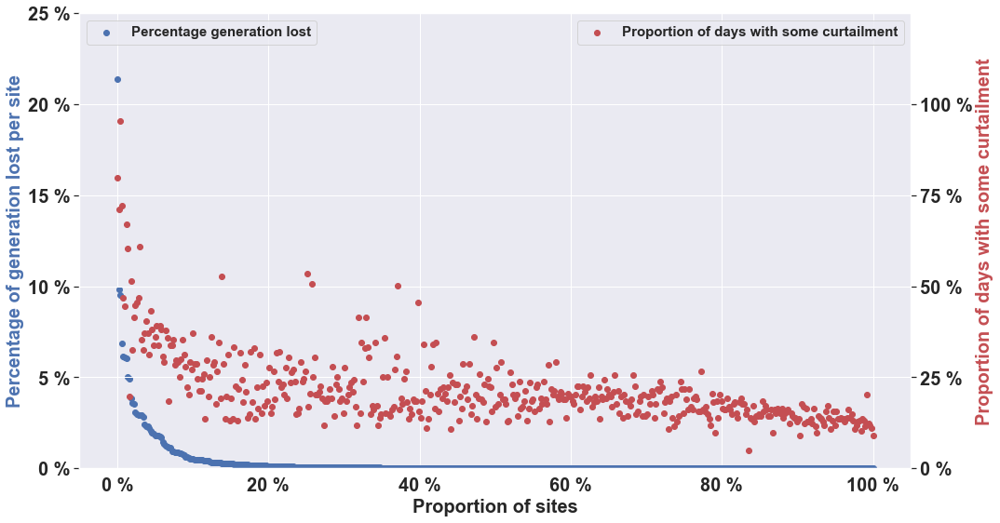

In [87]:
fig, ax1 = plt.subplots()
fig.set_size_inches(16, 9)

ax1.scatter(summary['proportion_of_sites'], summary["percentage_of_generation_lost"], color = 'b', 
            label = 'Percentage generation lost')

ax1.set_xlabel('Proportion of sites', **fontdict)
ax1.set_ylabel('Percentage of generation lost per site', **fontdict, color='b')

ax1.set_xticks([0, 20, 40, 60, 80, 100])
ax1.set_xticklabels(['0 %', '20 %', '40 %', '60 %', '80 %', '100 %'], **fontdict)
ax1.set_ylim(0, 25);
ax1.set_yticks([0, 5, 10, 15, 20, 25])
ax1.set_yticklabels(['0 %', '5 %', '10 %', '15 %', '20 %', '25 %'], **fontdict)
ax1.legend(loc = 2, prop={'size': 15})

ax2 = ax1.twinx()
ax2.scatter(summary['proportion_of_sites'], summary['proportion of days with curtailment'], color='r',
           label = 'Proportion of days with some curtailment')
ax2.set_ylabel('Proportion of days with some curtailment', color='r', **fontdict)
ax2.set_yticks([0, 25, 50, 75, 100])
ax2.set_yticklabels(['0 %', '25 %', '50 %', '75 %', '100 %'], **fontdict)
ax2.set_ylim(0, 125);
ax2.legend(loc = 0, prop={'size': 15})

plt.show()

# UPDATING SPREADSHEET

In [91]:
spreadsheet_before = pd.read_excel(file_path + r'/SolA Curtailment Summary_Final_tripping.xlsx')
#spreadsheet_before.drop(columns = 'Unnamed: 0', inplace = True)

new_data = summary[['c_id', 'total_energy_generation (kWh)', 'total_tripping_curtailment (kWh)']].copy()
new_data.rename(columns={
    "total_energy_generation (kWh)": "total_energy_generation_alldays (kWh)",
    "total_tripping_curtailment (kWh)": "total_tripping_curtailment_alldays (kWh)"}, inplace = True)

spreadsheet_after = pd.merge(spreadsheet_before, new_data, left_on = 'c_id', right_on = 'c_id', how = 'inner')

In [92]:
spreadsheet_after

,site_id,c_id,total_generation_kWh_all_days_Tim,total_generation_kWh_Naomi_calc,total_generation_kWh_Baran,total_generation_kWh_clear_sky_days,total_tripping_curtailment_kWh,total_v_var_curtailment_kWh_Tim,total_v_var_curtailment_kWh_Baran,total_v_watt_Curtailment_kWh,...,v_watt_lower,TOTAL_UPPER,TOTAL_LOWER,Tripping,V-Watt,V-Var,total_energy_generation_csd (kWh),total_tripping_curtailment_csd (kWh),total_energy_generation_alldays (kWh),total_tripping_curtailment_alldays (kWh)
0,962508189,1317822057,5719.944363,1757.258517,5510.221649,NaN,339.588285,0.000000,0.000000,0.00,...,0.000000,19.324891,6.162879,19.324891,0.00000,0.000000,1157.899115,178.695484,4952.606970,1058.094225
1,1768287280,939510347,6122.345767,1849.047081,5943.591770,NaN,151.017746,0.000000,0.000000,0.00,...,0.000000,8.167328,2.540850,8.167328,0.00000,0.000000,1180.380074,90.085169,5218.497989,512.015713
2,878597128,298243910,5748.966417,1389.962099,5665.764965,NaN,102.374650,0.000000,0.000000,0.00,...,0.000000,7.365284,1.806899,7.365284,0.00000,0.000000,1158.847052,68.395234,5059.740588,310.748142
3,1081062438,441066515,5882.510095,1667.429607,5647.239523,NaN,115.114249,0.000000,0.000000,0.00,...,0.000000,6.903695,2.038416,6.903695,0.00000,0.000000,1210.260190,77.987289,5292.925995,363.879692
4,454204467,1926768907,5620.132018,1417.460100,5412.858641,NaN,97.676155,0.000000,33.749897,0.00,...,0.000000,7.514441,1.804521,6.890928,0.00000,0.623513,1118.214170,51.142208,4905.207033,299.327278
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
494,2038592245,432573265,7091.242991,2263.771494,6907.557872,NaN,0.091405,0.000000,0.255956,0.00,...,0.000000,0.007743,0.001323,0.004038,0.00000,0.003705,1367.316347,0.000000,6125.943085,0.233208
495,248990444,362267093,5813.941242,476.882447,5619.366217,NaN,0.018261,0.000000,0.003961,0.00,...,0.000000,0.003900,0.000325,0.003829,0.00000,0.000070,1159.868896,0.000000,5185.555408,0.248824
496,1736222971,1836936064,7403.503012,2301.958848,7120.210089,NaN,0.075059,0.000000,1.612969,0.00,...,0.000000,0.025914,0.001054,0.003261,0.00000,0.022653,1429.256315,0.000000,6430.055062,0.112922
497,1836477388,499746036,4062.871639,194.722231,4017.525521,NaN,0.005558,0.000000,5.619840,0.00,...,0.000000,0.142737,0.000138,0.002854,0.00000,0.139883,835.831255,0.000273,3665.658571,0.484530


In [93]:
spreadsheet_after.to_excel(file_path + r'/SolA Curtailment Summary_Final_trippingalldays.xlsx', index = False) 

# ANALYZE A SITE FOR A CERTAIN DAY

Just for testing purpose. It is not used in the actual script deployment

In [26]:
c_id = 814682996
date = '2020-04-23'

In [29]:
print('Analyzing c_id {} date {} ...'.format(c_id, date))
        
#filter D-PV time series data
date_dt = dt.datetime.strptime(date, '%Y-%m-%d').date()
month_analyzed = date[:4] + date [5:7]

date_filter = data[month_analyzed].date == date_dt
site_id_filter = data[month_analyzed]['c_id'] == c_id
data_analyzed = data[month_analyzed].loc[date_filter & site_id_filter]

#check tripping curtailment
size_is_ok = file_processing.check_data_size(data_analyzed)
if not size_is_ok:
    print('Cannot analyze {} site on {} due to incomplete data.'.format(c_id, date))
else:
    data_site, ac_cap, dc_cap, EFF_SYSTEM, inverter = vvar_curt.site_organize(c_id, site_details, data_analyzed, unique_cids)
    data_site = file_processing.resample_in_minute(data_site)

Analyzing c_id 814682996 date 2020-04-23 ...


<AxesSubplot:>

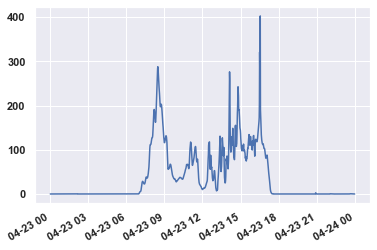

In [31]:
data_site['power'].plot()

In [32]:
# data_site, polyfit, is_good_polyfit_quality = polyfit_f.check_polyfit(data_site, ac_cap)
if date in csd_list:
    is_clear_sky_day = True
else:
    is_clear_sky_day = False    
tripping_response, tripping_curt_energy, estimation_method, data_site = tripping_curt.check_tripping_curtailment(is_clear_sky_day, c_id, data_site, unique_cids, ac_cap, site_details, date)    
energy_generated, data_site = energy_calculation.check_energy_generated(data_site, date, is_clear_sky_day, tripping_curt_energy)



C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:647: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['non_clear_sky_day_flag'] = 1
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:681: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['polynomial_fit'] = z[0]*test['time_in_seconds']*test['time_in_seconds'] + \
C:\Users\samha\anaconda3\lib\site-packages\solarcurtailment\tripping_curt.py:690: SettingWithCopyWarning: 
A value is trying to be set o

In [33]:
energy_generated

0.924065866917203

In [34]:
tripping_response

'Yes'

In [35]:
tripping_curt_energy

0.0053470370370370356

In [36]:
estimation_method

'linear'

<AxesSubplot:xlabel='Timestamp'>

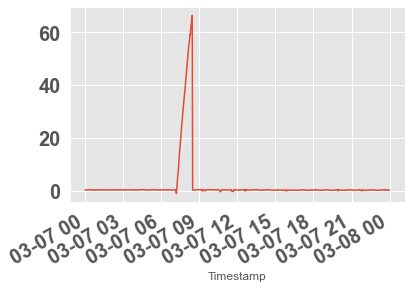

In [52]:
data_analyzed['power'].plot()

In [53]:
tripping_response

'None'

In [54]:
energy_generated

27.858972479203803

In [ ]:
data_site

In [31]:
site_details.loc[site_details['c_id'] == 358283166 ]

,site_id,s_postcode,pv_install_date,ac_cap_w,dc_cap_w,inverter_manufacturer,inverter_model,c_id,con_type,polarity
183,265579726,5114,2019-02,5000.0,6490.0,SolaX Power,X1-5.0T,358283166,pv_site_net,-1


In [ ]:
data_analyzed['power'].plot()

In [ ]:
(data_analyzed['power'].abs() > 300).any()

In [ ]:
data_analyzed.sort_index()

In [37]:
unique_cids.loc[unique_cids['c_id'] == 814682996]

,c_id,site_id
198,814682996,98690588


In [19]:
unique_cids_4 = unique_cids.loc[147:198]

In [38]:
unique_cids_5 = unique_cids.loc[198:301]
unique_cids_6 = unique_cids.loc[301:401]
unique_cids_7 = unique_cids.loc[401:]

In [21]:
unique_cids_4

,c_id,site_id
147,35889201,1105371261
148,187402380,2145609509
149,926511220,179952087
150,72386722,2092509751
151,1532680669,1659195160
152,499746036,1836477388
153,1861085133,1958397991
154,2116899524,985063867
155,1900529386,613211482
156,179084449,1166135615


# COMBINE ALL RESULTS

This is to combine some of the results in the previous section that is done in seperate times. Should not be needed if the above section is run only once for all sites. 

In [52]:
summary_1 = pd.read_csv(file_path + r'/tripping_alldays_1.csv')
summary_2 = pd.read_csv(file_path + r'/tripping_alldays_2.csv')
summary_3 = pd.read_csv(file_path + r'/tripping_alldays_3.csv')
summary_4 = pd.read_csv(file_path + r'/tripping_alldays_4.csv')
summary_5 = pd.read_csv(file_path + r'/tripping_alldays_5.csv')
summary_6 = pd.read_csv(file_path + r'/tripping_alldays_6.csv')
summary_7 = pd.read_csv(file_path + r'/tripping_alldays_7.csv')

In [53]:
summary_all_sites = pd.concat([summary_1, summary_2, summary_3, summary_4, summary_5, summary_6, summary_7])

In [67]:
summary_all_sites.sort_values(by = 'percentage_of_generation_lost', ascending = False, inplace = True)
summary_all_sites.reset_index(drop = True, inplace = True)
summary_all_sites['proportion_of_sites'] = summary_all_sites.index/(len(summary_all_sites)-1) * 100

In [71]:
summary_all_sites.to_csv(file_path + r'/tripping_alldays_summary_all.csv', index = False) 

# MESSY BELOW